# Data Acquisition

In this notebook, we will attempt to obtain the data for wildfires from 1963 to 2020 (the latest data available) and also obtain data for AQI in the city of Grand Junction for the last 50 years.

In [455]:
import os, json, time
from pyproj import Transformer, Geod
import geojson
import concurrent.futures
import requests
from tqdm import tqdm

## Part 1: Obtaining the Wildfire data

In [23]:
EXTRACT_FILENAME = "../data/GeoJSON_Exports/USGS_Wildland_Fire_Combined_Dataset.json"

MODULENAME = "wildfire"
MODULEPATH = ""
try:
    ppath = os.environ.get('PYTHONPATH')
    if not ppath: raise
    MODULEPATH = os.path.join(ppath,MODULENAME)
except:
    # Likely here because a PYTHONPATH was not set, show a warning message
    print("Looks like you're not using a 'PYTHONPATH' to specify the location of your python user modules.")
    print("You may have to modify the sample code in this notebook to get the described results.")
    MODULEPATH = ""

if MODULEPATH:
    SAMPLE_DATA_FILENAME = os.path.join(MODULEPATH,EXTRACT_FILENAME)
else:
    SAMPLE_DATA_FILENAME = EXTRACT_FILENAME

print(f"{SAMPLE_DATA_FILENAME=}")

CITY_LOCATIONS = {
    'grand_junction': {'city'   : 'Grand Junction',
                       'latlon' : [39.0639, -108.5506] } 
}

Looks like you're not using a 'PYTHONPATH' to specify the location of your python user modules.
You may have to modify the sample code in this notebook to get the described results.
SAMPLE_DATA_FILENAME='USGS_Wildland_Fire_Combined_Dataset.json'


In [5]:
print(f"Attempting to open '{SAMPLE_DATA_FILENAME}'")

geojson_file = open(SAMPLE_DATA_FILENAME,"r")
print(f"Using GeoJSON module to load sample file '{SAMPLE_DATA_FILENAME}'")
gj_data = geojson.load(geojson_file)
geojson_file.close()

gj_keys = list(gj_data.keys())
print("The loaded JSON dictionary has the following keys:")
print(gj_keys)

Attempting to open 'USGS_Wildland_Fire_Combined_Dataset.json'
Using GeoJSON module to load sample file 'USGS_Wildland_Fire_Combined_Dataset.json'
The loaded JSON dictionary has the following keys:
['displayFieldName', 'fieldAliases', 'geometryType', 'spatialReference', 'fields', 'features']


In [50]:
my_LOCATIONS = (39.0639, -108.5506)

In [453]:
len(feature_list)

135061

In total, we have about 135 thousand fires in the united states from the late 19th century to the year 2020. 

In [33]:
def convert_ring_to_epsg4326(ring_data=None):
    converted_ring = list()
    #
    # We use a pyproj transformer that converts from ESRI:102008 to EPSG:4326 to transform the list of coordinates
    to_epsg4326 = Transformer.from_crs("ESRI:102008","EPSG:4326")
    # We'll run through the list transforming each ESRI:102008 x,y coordinate into a decimal degree lat,lon
    for coord in ring_data:
        lat,lon = to_epsg4326.transform(coord[0],coord[1])
        new_coord = lat,lon
        converted_ring.append(new_coord)
    return converted_ring

def shortest_distance_from_place_to_fire_perimeter(place=None,ring_data=None):
    # convert the ring data to the right coordinate system
    ring = convert_ring_to_epsg4326(ring_data)    
    # create a epsg4326 compliant object - which is what the WGS84 ellipsoid is
    geodcalc = Geod(ellps='WGS84')
    closest_point = list()
    # run through each point in the converted ring data
    for point in ring:
        # calculate the distance
        d = geodcalc.inv(place[1],place[0],point[1],point[0])
        # convert the distance to miles
        distance_in_miles = d[2]*0.00062137
        # if it's closer to the city than the point we have, save it
        if not closest_point:
            closest_point.append(distance_in_miles)
            closest_point.append(point)
        elif closest_point and closest_point[0]>distance_in_miles:
            closest_point = list()
            closest_point.append(distance_in_miles)
            closest_point.append(point)
    return closest_point

In [56]:
my_features = list()
log_deleted_entries = list()

In [57]:
def calculate_closest_distance(wf_feature):
    wf_year = wf_feature['attributes']['Fire_Year']
    wf_name = wf_feature['attributes']['Listed_Fire_Names'].split(',')[0]
    wf_size = wf_feature['attributes']['GIS_Acres']
    wf_type = wf_feature['attributes']['Assigned_Fire_Type']
    ring_data = wf_feature['geometry']['rings'][0]
    
    if('rings' not in wf_feature['geometry'].keys()):
            log_deleted_entries.append(wf_feature)
    elif wf_year >= 1963:
        distance = shortest_distance_from_place_to_fire_perimeter(my_LOCATIONS, ring_data)
        if distance[0] <= 1250:
            wf_feature['attributes']['fire_lat'] = distance[1][0]
            wf_feature['attributes']['fire_lon'] = distance[1][1]
            wf_feature['attributes']['distance_from_city'] = distance[0]
            my_features.append(wf_feature)
            print(f"The closest distance of fire '{wf_name}' ({wf_size:1.2f} acres) from {wf_year} was {distance[0]:1.2f} miles to Grand Junction")

In [58]:
with concurrent.futures.ThreadPoolExecutor(200) as executor:
    # Submit each fire feature for calculation
    future_to_feature = {executor.submit(calculate_closest_distance, wf_feature): wf_feature for wf_feature in feature_list}

    # Wait for all calculations to complete
    for future in concurrent.futures.as_completed(future_to_feature):
        feature = future_to_feature[future]
        try:
            future.result()  # Get the result of the calculation
        except Exception as exc:
            print(f"Calculation for feature {feature['attributes']['Fire_Year']} raised an exception: {exc}")

The closest distance of fire 'SAN LUIS #4 (5)' (1264.13 acres) from 1963 was 693.67 miles to Grand Junction
The closest distance of fire '18_South  (2)' (647.25 acres) from 1963 was 405.69 miles to Grand Junction
The closest distance of fire '1963 (6)' (640.06 acres) from 1963 was 597.98 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (6)' (4995.91 acres) from 1963 was 256.68 miles to Grand Junction
The closest distance of fire 'DEADHORSE (5)' (691.69 acres) from 1963 was 712.09 miles to Grand Junction
The closest distance of fire 'FOLEY FARM RI ESCAPE (5)' (382.94 acres) from 1963 was 747.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (1552.70 acres) from 1963 was 696.91 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1528.19 acres) from 1963 was 341.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (191.24 acres) from 1963 was 418.11 miles to Grand Junc

The closest distance of fire 'No Fire Name Provided (3)' (38.06 acres) from 1963 was 430.36 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (2.51 acres) from 1963 was 415.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (3.48 acres) from 1963 was 426.58 miles to Grand Junction
The closest distance of fire 'JACK MILLER (4)' (419.51 acres) from 1963 was 543.81 miles to Grand Junction
The closest distance of fire 'POWER (4)' (7.97 acres) from 1963 was 810.51 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1562.81 acres) from 1963 was 394.57 miles to Grand Junction
The closest distance of fire 'Hurricane (3)' (24.26 acres) from 1963 was 843.90 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1.70 acres) from 1963 was 421.10 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (28.13 acres) from 1963 was 392.29 miles to Grand Junc

The closest distance of fire 'Highwater
 (2)' (0.17 acres) from 1963 was 600.04 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1963 was 197.71 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (4)' (45.09 acres) from 1963 was 632.64 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1963 was 232.67 miles to Grand Junction
The closest distance of fire 'Hamilton (2)' (0.08 acres) from 1963 was 371.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (7.00 acres) from 1963 was 635.83 miles to Grand Junction
The closest distance of fire 'WIGGLETAIL (5)' (587.64 acres) from 1963 was 604.74 miles to Grand Junction
The closest distance of fire 'POT CREEK (3)' (196.48 acres) from 1963 was 110.15 miles to Grand Junction
The closest distance of fire 'White River #1 (2)' (0.08 acres) from 1963 was 360.60 miles to Grand Junction
The closest di

The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 was 227.34 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 was 201.43 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 was 256.03 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 was 225.38 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 was 232.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 was 217.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1963 was 215.15 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 was 240.62 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1963 

The closest distance of fire 'P.G.& E. (5)' (1895.50 acres) from 1964 was 767.31 miles to Grand Junction
The closest distance of fire 'P.G.&E. #6 (5)' (452.70 acres) from 1964 was 745.58 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (1477.36 acres) from 1964 was 687.22 miles to Grand Junction
The closest distance of fire 'W.P.R.R. #6A (5)' (732.92 acres) from 1964 was 698.97 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (746.86 acres) from 1964 was 412.55 miles to Grand Junction
The closest distance of fire 'HIGHWAY 36E #2 (5)' (432.20 acres) from 1964 was 725.44 miles to Grand Junction
The closest distance of fire 'BEALE #4 (5)' (426.04 acres) from 1964 was 685.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (81.87 acres) from 1963 was 635.16 miles to Grand Junction
The closest distance of fire 'ROADSIDE #14 (5)' (230.77 acres) from 1964 was 750.63 miles to Grand Junction
The clos

The closest distance of fire 'GARNER RANCH (4)' (15.55 acres) from 1964 was 725.95 miles to Grand JunctionThe closest distance of fire 'DYSERT CDF (4)' (6.83 acres) from 1964 was 740.41 miles to Grand Junction

The closest distance of fire 'Loop (3)' (95.21 acres) from 1964 was 345.62 miles to Grand Junction
The closest distance of fire 'City of Rocks #60 (2)' (26.62 acres) from 1964 was 341.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (2.31 acres) from 1964 was 424.78 miles to Grand Junction
The closest distance of fire 'Three Feathers (3)' (3.67 acres) from 1964 was 780.50 miles to Grand Junction
The closest distance of fire 'Puckett Ridge (3)' (42.32 acres) from 1964 was 858.53 miles to Grand Junction
The closest distance of fire 'SIX (4)' (12.95 acres) from 1964 was 783.10 miles to Grand Junction
The closest distance of fire 'TRINITY (4)' (9.53 acres) from 1964 was 803.90 miles to Grand Junction
The closest distance of fire 'No Fire Name Provi

The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1964 was 254.09 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1964 was 236.06 miles to Grand Junction
The closest distance of fire 'Brush Cr (3)' (107.18 acres) from 1964 was 500.58 miles to Grand Junction
The closest distance of fire 'N COPELAND (2)' (0.09 acres) from 1964 was 760.19 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1964 was 224.31 miles to Grand Junction
The closest distance of fire 'COLD SPRIN (2)' (0.02 acres) from 1964 was 407.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (155.12 acres) from 1964 was 394.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1964 was 241.05 miles to Grand Junction
The closest distance of fire 'TIMBER CR (2)' (0.09 acres) from 1964 was 755.30 miles to Grand Junction
The clos

The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1964 was 229.05 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (272.27 acres) from 1965 was 352.43 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (86.33 acres) from 1964 was 565.65 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (114.00 acres) from 1965 was 618.54 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (407.68 acres) from 1964 was 604.97 miles to Grand Junction
The closest distance of fire 'BURRO (4)' (214.50 acres) from 1964 was 570.14 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (6)' (64.34 acres) from 1965 was 410.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (0.26 acres) from 1964 was 225.81 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (250.18 acres) from 1965 was 

The closest distance of fire 'Tillman (3)' (42.25 acres) from 1965 was 342.98 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (5.43 acres) from 1965 was 917.05 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (1.67 acres) from 1965 was 896.65 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (2.77 acres) from 1965 was 418.61 miles to Grand Junction
The closest distance of fire '1965 (2)' (5.07 acres) from 1965 was 550.61 miles to Grand Junction
The closest distance of fire 'Basin Creek (3)' (3.51 acres) from 1965 was 772.67 miles to Grand Junction
The closest distance of fire 'Bathroom (3)' (80.60 acres) from 1965 was 345.28 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (56.62 acres) from 1965 was 578.44 miles to Grand Junction
The closest distance of fire 'Wiggins (3)' (160.70 acres) from 1965 was 341.74 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)'

The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1965 was 253.36 miles to Grand JunctionThe closest distance of fire 'Indian Creek (2)' (0.09 acres) from 1965 was 379.32 miles to Grand Junction
The closest distance of fire 'Boulder (5)' (81.68 acres) from 1965 was 942.26 miles to Grand Junction

The closest distance of fire 'Old Tioga (2)' (1.39 acres) from 1965 was 611.96 miles to Grand Junction
The closest distance of fire 'Hotfoot (2)' (0.12 acres) from 1965 was 607.03 miles to Grand Junction
The closest distance of fire 'Little Eight Mile (3)' (139.03 acres) from 1965 was 467.13 miles to Grand Junction
The closest distance of fire 'Snowcreek (2)' (0.25 acres) from 1965 was 609.05 miles to Grand Junction
The closest distance of fire 'Chinquapin Fire (2)' (0.19 acres) from 1965 was 609.45 miles to Grand Junction
The closest distance of fire 'Rim (2)' (0.12 acres) from 1965 was 604.68 miles to Grand Junction
The closest distance of fire 'Aspen (2)' (0.19 acre

The closest distance of fire 'Between (2)' (0.01 acres) from 1965 was 614.37 miles to Grand JunctionThe closest distance of fire 'National (2)' (0.01 acres) from 1965 was 614.79 miles to Grand Junction
The closest distance of fire 'Homestead (2)' (0.01 acres) from 1965 was 614.27 miles to Grand Junction
The closest distance of fire 'SUNCREST (5)' (1434.48 acres) from 1965 was 632.58 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1965 was 282.97 miles to Grand Junction

The closest distance of fire 'Bald Mountain (2)' (0.01 acres) from 1965 was 615.11 miles to Grand Junction
The closest distance of fire 'OUTSIDE ORIGIN #9 (4)' (815.33 acres) from 1965 was 586.65 miles to Grand Junction
The closest distance of fire 'Lost (2)' (0.01 acres) from 1965 was 613.91 miles to Grand Junction
The closest distance of fire 'Crossing (2)' (0.01 acres) from 1965 was 613.70 miles to Grand Junction
The closest distance of fire 'Gilkison (3)' (507.27 ac

The closest distance of fire 'LOMBARDI (5)' (290.00 acres) from 1966 was 667.46 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (6)' (190.69 acres) from 1966 was 424.18 miles to Grand Junction
The closest distance of fire 'PENTZ (5)' (1129.57 acres) from 1966 was 698.67 miles to Grand Junction
The closest distance of fire 'MARINCELLO (5)' (567.71 acres) from 1966 was 761.69 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (99.74 acres) from 1966 was 355.68 miles to Grand Junction
The closest distance of fire 'Mill Creek Sale (2)' (18.09 acres) from 1966 was 533.72 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (44.37 acres) from 1966 was 923.97 miles to Grand Junction
The closest distance of fire 'Tayor Pocket (2)' (47.52 acres) from 1966 was 421.11 miles to Grand Junction
The closest distance of fire 'MILTON (5)' (2678.15 acres) from 1966 was 667.22 miles to Grand Junction
The closest distance of fire 'ELW

The closest distance of fire 'No Fire Name Provided (4)' (38.62 acres) from 1966 was 572.46 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1.02 acres) from 1966 was 432.02 miles to Grand Junction
The closest distance of fire 'JAGGERS FIRE (2)' (12.78 acres) from 1966 was 1219.01 miles to Grand Junction
The closest distance of fire '66.001 (3)' (1.70 acres) from 1966 was 257.17 miles to Grand Junction
The closest distance of fire 'INDIAN (5)' (1404.90 acres) from 1966 was 618.44 miles to Grand Junction
The closest distance of fire 'PORTER (5)' (667.22 acres) from 1966 was 711.24 miles to Grand Junction
The closest distance of fire '66.003 (3)' (1.44 acres) from 1966 was 254.54 miles to Grand Junction
The closest distance of fire 'Cathedral Canyon (2)' (3.64 acres) from 1966 was 375.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (18.34 acres) from 1966 was 642.80 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'unknown (2)' (19.08 acres) from 1966 was 576.37 miles to Grand Junction
The closest distance of fire 'Moorman Ranch (2)' (0.13 acres) from 1966 was 364.98 miles to Grand Junction
The closest distance of fire 'DEBOLT (5)' (1348.36 acres) from 1966 was 730.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (57.71 acres) from 1966 was 364.84 miles to Grand Junction
The closest distance of fire 'Jerry Crab #2 (2)' (0.12 acres) from 1966 was 369.55 miles to Grand Junction
The closest distance of fire 'Allen Springs (2)' (0.10 acres) from 1966 was 376.03 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.88 acres) from 1966 was 256.05 miles to Grand Junction
The closest distance of fire 'Table (2)' (0.11 acres) from 1966 was 301.90 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1966 was 247.74 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'Cottonwood (2)' (1144.68 acres) from 1966 was 505.47 miles to Grand Junction
The closest distance of fire 'Fence
 (2)' (0.01 acres) from 1966 was 617.41 miles to Grand Junction
The closest distance of fire 'CASTLE CRE (2)' (0.09 acres) from 1966 was 760.69 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1966 was 290.84 miles to Grand Junction
The closest distance of fire 'Bench Mark
 (2)' (0.01 acres) from 1966 was 610.18 miles to Grand Junction
The closest distance of fire 'Grizzly
 (2)' (0.01 acres) from 1966 was 609.84 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1966 was 263.69 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1966 was 281.23 miles to Grand Junction
The closest distance of fire 'Juniper
 (2)' (0.01 acres) from 1966 was 591.47 miles to Grand Junction
The closest distance of fire 'No Fi

The closest distance of fire 'No Fire Name Provided (3)' (8.04 acres) from 1967 was 442.84 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (5.87 acres) from 1967 was 771.93 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (7.52 acres) from 1967 was 773.11 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (8.68 acres) from 1967 was 630.85 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (32.88 acres) from 1967 was 612.33 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (26.79 acres) from 1967 was 598.65 miles to Grand Junction
The closest distance of fire 'Miller Gulch (2)' (75.26 acres) from 1967 was 542.26 miles to Grand Junction
The closest distance of fire 'Little Benjamin (3)' (259.87 acres) from 1967 was 686.10 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (213.90 acres) from 1967 was 615.18 miles to Gr

The closest distance of fire 'Gibson II (2)' (0.39 acres) from 1967 was 607.65 miles to Grand Junction
The closest distance of fire 'BIG STONE (5)' (349.60 acres) from 1967 was 635.47 miles to Grand Junction
The closest distance of fire 'STANDARD #11 (5)' (3444.37 acres) from 1967 was 680.57 miles to Grand Junction
The closest distance of fire 'Pit (2)' (0.30 acres) from 1967 was 614.84 miles to Grand Junction
The closest distance of fire 'Little John (2)' (1.32 acres) from 1967 was 608.86 miles to Grand Junction
The closest distance of fire 'Baseline (2)' (0.52 acres) from 1967 was 613.65 miles to Grand Junction
The closest distance of fire 'SITE 300 #2 (5)' (1454.08 acres) from 1967 was 708.41 miles to Grand Junction
The closest distance of fire 'Cottonwood (2)' (0.45 acres) from 1967 was 612.62 miles to Grand Junction
The closest distance of fire 'Meadow Creek (3)' (88.58 acres) from 1967 was 670.17 miles to Grand Junction
The closest distance of fire 'High (2)' (0.19 acres) from 19

The closest distance of fire 'EAGLE-DEER CREEK (6)' (4761.57 acres) from 1967 was 638.56 miles to Grand Junction
The closest distance of fire 'Wegner (2)' (0.10 acres) from 1967 was 603.72 miles to Grand Junction
The closest distance of fire '39TH STREET (5)' (3399.22 acres) from 1967 was 752.10 miles to Grand Junction
The closest distance of fire 'Broken Saw (2)' (0.10 acres) from 1967 was 614.16 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.84 acres) from 1967 was 233.13 miles to Grand Junction
The closest distance of fire 'Watkins (2)' (0.10 acres) from 1967 was 601.57 miles to Grand Junction
The closest distance of fire 'Cupola (3)' (91.66 acres) from 1967 was 781.12 miles to Grand Junction
The closest distance of fire 'ROUND MEADOW FIRE (5)' (100.04 acres) from 1967 was 655.31 miles to Grand Junction
The closest distance of fire 'Tamarack (2)' (0.12 acres) from 1967 was 611.30 miles to Grand Junction
The closest distance of fire 'Brush Patch (

The closest distance of fire 'Half Dome (2)' (0.03 acres) from 1967 was 602.43 miles to Grand JunctionThe closest distance of fire 'Sleeper (2)' (0.05 acres) from 1967 was 606.10 miles to Grand Junction
The closest distance of fire 'Branigan (2)' (0.05 acres) from 1967 was 608.39 miles to Grand Junction

The closest distance of fire 'Near (2)' (0.05 acres) from 1967 was 616.67 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1967 was 288.75 miles to Grand Junction
The closest distance of fire 'Cloud's Rest (2)' (0.02 acres) from 1967 was 599.60 miles to Grand Junction
The closest distance of fire 'Johnson (2)' (0.02 acres) from 1967 was 589.84 miles to Grand Junction
The closest distance of fire 'Libb (2)' (0.02 acres) from 1967 was 602.73 miles to Grand Junction
The closest distance of fire 'Corner (2)' (0.04 acres) from 1967 was 600.27 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (12)' (531.52 acres) fro

The closest distance of fire 'No Fire Name Provided (3)' (11263.68 acres) from 1966 was 391.72 miles to Grand Junction
The closest distance of fire 'LIGHTNING #3 (5)' (835.37 acres) from 1968 was 738.37 miles to Grand Junction
The closest distance of fire 'WOLF CREEK (3)' (302.42 acres) from 1968 was 714.47 miles to Grand Junction
The closest distance of fire 'BIG CEDAR (2)' (605.61 acres) from 1966 was 364.93 miles to Grand Junction
The closest distance of fire 'BLACK CANYON (5)' (2042.39 acres) from 1966 was 652.12 miles to Grand Junction
The closest distance of fire 'WAPINITA (3)' (238.49 acres) from 1968 was 769.77 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (9)' (313.24 acres) from 1968 was 588.13 miles to Grand Junction
The closest distance of fire 'POWDER FIRE (5)' (245.45 acres) from 1967 was 626.97 miles to Grand JunctionThe closest distance of fire 'Flathead 1967 (2)' (6625.13 acres) from 1967 was 709.75 miles to Grand Junction

The closest dis

The closest distance of fire 'No Fire Name Provided (10)' (92.49 acres) from 1968 was 626.29 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (3)' (50.48 acres) from 1968 was 407.96 miles to Grand Junction
The closest distance of fire 'MARTIN (5)' (343.46 acres) from 1968 was 708.66 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (4)' (24.56 acres) from 1968 was 634.52 miles to Grand Junction
The closest distance of fire 'NELSON COVE (5)' (356.17 acres) from 1968 was 620.43 miles to Grand Junction
The closest distance of fire 'WATER PUMP (4)' (21.75 acres) from 1968 was 803.04 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (49.31 acres) from 1968 was 672.68 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (28.09 acres) from 1968 was 602.44 miles to Grand Junction
The closest distance of fire 'Unknown (40)' (62.17 acres) from 1968 was 951.15 miles to Grand Junction
Th

The closest distance of fire 'No Fire Name Provided (6)' (5.70 acres) from 1968 was 438.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (4.10 acres) from 1968 was 586.57 miles to Grand Junction
The closest distance of fire 'Little Telephone (2)' (11.39 acres) from 1968 was 425.69 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (17.70 acres) from 1968 was 629.44 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (2.90 acres) from 1968 was 398.18 miles to Grand Junction
The closest distance of fire 'Robinson Canyon (2)' (9.66 acres) from 1968 was 426.49 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (6.47 acres) from 1968 was 382.15 miles to Grand Junction
The closest distance of fire 'Granite Springs (2)' (3.27 acres) from 1968 was 507.96 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (17.94 acres) from 1968 was 618.07 mil

The closest distance of fire 'VILLAGE (4)' (2.19 acres) from 1968 was 804.14 miles to Grand Junction
The closest distance of fire 'Polar Star #2 (2)' (0.12 acres) from 1968 was 364.67 miles to Grand Junction
The closest distance of fire 'Buck Camp
 (2)' (0.16 acres) from 1968 was 603.24 miles to Grand Junction
The closest distance of fire 'Snow Canyon #2 (2)' (0.11 acres) from 1968 was 428.05 miles to Grand Junction
The closest distance of fire 'Road (2)' (0.09 acres) from 1968 was 386.02 miles to Grand Junction
The closest distance of fire 'Mahogany (2)' (0.12 acres) from 1968 was 426.88 miles to Grand Junction
The closest distance of fire 'EIGHTY (4)' (2.49 acres) from 1968 was 788.56 miles to Grand Junction
The closest distance of fire 'Telephone (2)' (0.12 acres) from 1968 was 425.49 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (2.97 acres) from 1968 was 627.97 miles to Grand Junction
The closest distance of fire 'Cottonwood
 (2)' (0.60 acres) fr

The closest distance of fire 'Rock
 (2)' (0.01 acres) from 1968 was 617.97 miles to Grand JunctionThe closest distance of fire 'Devils Den (3)' (1213.06 acres) from 1968 was 702.87 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1968 was 269.05 miles to Grand Junction
The closest distance of fire 'County Line
 (2)' (0.05 acres) from 1968 was 604.07 miles to Grand Junction
The closest distance of fire 'Nine Mile
 (2)' (0.01 acres) from 1968 was 610.08 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.13 acres) from 1968 was 273.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (876.52 acres) from 1968 was 627.89 miles to Grand Junction
The closest distance of fire 'TUOLUMNE RIVER (6)' (983.78 acres) from 1968 was 636.47 miles to Grand Junction
The closest distance of fire 'Paradise (3)' (278.75 acres) from 1968 was 587.31 miles to Grand Junction
The closest distance of

The closest distance of fire 'No Fire Name Provided (3)' (103.05 acres) from 1969 was 421.73 miles to Grand Junction
The closest distance of fire 'CEDAR RIDGE (5)' (255.63 acres) from 1969 was 739.40 miles to Grand Junction
The closest distance of fire 'SPUR 900 (4)' (31.79 acres) from 1969 was 725.40 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (349.33 acres) from 1969 was 282.41 miles to Grand Junction
The closest distance of fire '1969 (3)' (610.03 acres) from 1969 was 576.44 miles to Grand Junction
The closest distance of fire 'ALLEN (4)' (21.04 acres) from 1969 was 795.13 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (271.43 acres) from 1969 was 411.05 miles to Grand Junction
The closest distance of fire 'Duncan Mountain (2)' (84.70 acres) from 1969 was 400.97 miles to Grand Junction
The closest distance of fire 'IOWA HILL (5)' (464.41 acres) from 1969 was 663.92 miles to Grand Junction
The closest distance of 

The closest distance of fire 'South Peak (2)' (10.27 acres) from 1969 was 583.84 miles to Grand Junction
The closest distance of fire 'BIDART (5)' (483.82 acres) from 1969 was 664.16 miles to Grand Junction
The closest distance of fire 'FORT (4)' (2.79 acres) from 1969 was 807.15 miles to Grand Junction
The closest distance of fire 'DEAD (4)' (6.97 acres) from 1969 was 805.50 miles to Grand Junction
The closest distance of fire 'HELLS DELIGHT (4)' (45.77 acres) from 1969 was 630.09 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (10.68 acres) from 1969 was 640.59 miles to Grand Junction
The closest distance of fire 'BEAR (4)' (6.57 acres) from 1969 was 805.78 miles to Grand Junction
The closest distance of fire 'Cooper Wash (2)' (0.16 acres) from 1969 was 330.68 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (0.40 acres) from 1969 was 712.11 miles to Grand Junction
The closest distance of fire 'Ward Mountain (2)' (0.19 

The closest distance of fire 'Smokey Mountain (2)' (156.63 acres) from 1969 was 540.01 miles to Grand JunctionThe closest distance of fire 'SANTA (2)' (0.10 acres) from 1969 was 776.70 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (8)' (1616.29 acres) from 1969 was 587.69 miles to Grand Junction
The closest distance of fire 'WILDCAT (2)' (0.10 acres) from 1969 was 774.48 miles to Grand Junction
The closest distance of fire 'SO BEACH (2)' (0.10 acres) from 1969 was 784.22 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (69.92 acres) from 1969 was 632.20 miles to Grand Junction
The closest distance of fire 'xx NONE xx (2)' (0.09 acres) from 1969 was 758.63 miles to Grand Junction
The closest distance of fire 'AVENAL CANYON (5)' (983.23 acres) from 1969 was 677.30 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.10 acres) from 1969 was 603.00 miles to Grand Junction
The closest distance of fire 'FAUL

The closest distance of fire 'LATIGO FIRE (5)' (2868.87 acres) from 1967 was 664.18 miles to Grand Junction
The closest distance of fire 'GRASS (4)' (708.36 acres) from 1970 was 739.95 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (2165.66 acres) from 1970 was 352.37 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (668.90 acres) from 1969 was 626.92 miles to Grand Junction
The closest distance of fire 'Quail Creek (3)' (2737.72 acres) from 1970 was 839.68 miles to Grand JunctionThe closest distance of fire 'Wenatchee Creek (3)' (9085.17 acres) from 1970 was 657.27 miles to Grand Junction

The closest distance of fire 'Unknown (2)' (784.32 acres) from 1970 was 768.02 miles to Grand Junction
The closest distance of fire 'BLACKWELL LAND CO. (5)' (464.03 acres) from 1970 was 670.80 miles to Grand Junction
The closest distance of fire 'GULF OIL CORPORATION (5)' (696.87 acres) from 1970 was 713.52 miles to Grand Junction
The

The closest distance of fire 'No Fire Name Provided (2)' (344.20 acres) from 1970 was 813.48 miles to Grand Junction
The closest distance of fire 'SILVER 7 (2)' (288.30 acres) from 1970 was 922.24 miles to Grand Junction
The closest distance of fire 'GLASCOCK MTN. (5)' (677.68 acres) from 1970 was 737.71 miles to Grand Junction
The closest distance of fire 'INDIAN CREEK (5)' (486.61 acres) from 1970 was 750.92 miles to Grand Junction
The closest distance of fire 'JURUPA (RAILROAD #16) (5)' (1157.03 acres) from 1970 was 604.73 miles to Grand Junction
The closest distance of fire 'VAQUERO (5)' (550.91 acres) from 1970 was 714.34 miles to Grand Junction
The closest distance of fire 'Fancher Dam (3)' (207.99 acres) from 1970 was 860.97 miles to Grand Junction
The closest distance of fire 'Granite Pass (2)' (94.46 acres) from 1970 was 608.22 miles to Grand Junction
The closest distance of fire 'Unknown (2)' (278.97 acres) from 1970 was 772.12 miles to Grand Junction
The closest distance of 

The closest distance of fire 'Midslope (3)' (46.63 acres) from 1970 was 876.58 miles to Grand Junction
The closest distance of fire 'Ford Creek (3)' (56.88 acres) from 1970 was 954.21 miles to Grand Junction
The closest distance of fire 'Ohlinger Crossing (3)' (100.89 acres) from 1970 was 411.01 miles to Grand Junction
The closest distance of fire 'Mystic (3)' (207.93 acres) from 1970 was 416.30 miles to Grand Junction
The closest distance of fire 'SNAG PATCH (3)' (56.62 acres) from 1970 was 803.22 miles to Grand Junction
The closest distance of fire 'EL MONTE (4)' (196.36 acres) from 1970 was 629.60 miles to Grand Junction
The closest distance of fire 'Perry (3)' (677.92 acres) from 1970 was 386.21 miles to Grand Junction
The closest distance of fire 'Whitetail Creek (2)' (103.75 acres) from 1970 was 536.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (422.72 acres) from 1970 was 805.78 miles to Grand Junction
The closest distance of fire 'Borah (3)

The closest distance of fire 'Kimama East 1 (3)' (17.17 acres) from 1970 was 377.57 miles to Grand Junction
The closest distance of fire 'Fence (3)' (14.10 acres) from 1970 was 365.48 miles to Grand Junction
The closest distance of fire 'ALPINE DAM (5)' (110.96 acres) from 1970 was 766.36 miles to Grand Junction
The closest distance of fire 'OUR (4)' (15.24 acres) from 1970 was 668.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (63.69 acres) from 1970 was 653.20 miles to Grand Junction
The closest distance of fire 'Railroad #3 (2)' (16.55 acres) from 1970 was 472.44 miles to Grand Junction
The closest distance of fire 'Snake #1 (2)' (24.27 acres) from 1970 was 466.32 miles to Grand JunctionThe closest distance of fire 'Unknown (3)' (13.28 acres) from 1970 was 886.62 miles to Grand Junction
The closest distance of fire 'Lewis Creek #2 (3)' (65.17 acres) from 1970 was 679.26 miles to Grand Junction
The closest distance of fire 'WILEY (5)' (448.61 acre

The closest distance of fire 'No Fire Name Provided (5)' (8.23 acres) from 1970 was 639.23 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (33.37 acres) from 1970 was 656.86 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (8)' (183.53 acres) from 1970 was 615.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (3.47 acres) from 1970 was 620.44 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (19.88 acres) from 1970 was 632.11 miles to Grand Junction
The closest distance of fire 'BRILES (4)' (2.15 acres) from 1970 was 648.61 miles to Grand Junction
The closest distance of fire 'unknown (3)' (30.97 acres) from 1970 was 259.58 miles to Grand Junction
The closest distance of fire 'unknown (3)' (20.56 acres) from 1970 was 244.10 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (10.00 acres) from 1970 was 639.30 miles to Grand Junction
T

The closest distance of fire 'BUCKEYE (10)' (42432.33 acres) from 1970 was 732.35 miles to Grand Junction
The closest distance of fire 'LIGHTNING #13 (5)' (3750.25 acres) from 1966 was 722.57 miles to Grand Junction
The closest distance of fire 'Curley Canyon  (2)' (0.01 acres) from 1970 was 409.12 miles to Grand Junction
The closest distance of fire 'RIDGE (2)' (0.10 acres) from 1970 was 619.64 miles to Grand Junction
The closest distance of fire 'BALD ROCK (2)' (0.10 acres) from 1970 was 605.34 miles to Grand Junction
The closest distance of fire 'WALK OUT (2)' (0.10 acres) from 1970 was 609.89 miles to Grand Junction
The closest distance of fire 'RANKIN RANCH (5)' (35976.21 acres) from 1970 was 604.93 miles to Grand Junction
The closest distance of fire 'ELIZABETH (2)' (0.05 acres) from 1970 was 592.66 miles to Grand Junction
The closest distance of fire 'BLUEJAY (2)' (0.10 acres) from 1970 was 608.74 miles to Grand Junction
The closest distance of fire 'WILDCAT (2)' (0.10 acres) fr

The closest distance of fire 'Hammond Ranch (6)' (571.15 acres) from 1971 was 655.56 miles to Grand Junction
The closest distance of fire 'FULLERTON FIRE (5)' (3381.07 acres) from 1970 was 625.22 miles to Grand Junction
The closest distance of fire 'Cross Creek (2)' (5895.28 acres) from 1970 was 533.12 miles to Grand Junction
The closest distance of fire 'LUNAN POINT (3)' (420.61 acres) from 1971 was 766.61 miles to Grand Junction
The closest distance of fire 'Kimama SE 5 (3)' (464.24 acres) from 1971 was 372.47 miles to Grand Junction
The closest distance of fire 'Minidoka East 11 (3)' (695.09 acres) from 1971 was 351.08 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.95 acres) from 1970 was 868.77 miles to Grand Junction
The closest distance of fire 'Boocke #3 (2)' (333.61 acres) from 1971 was 484.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (420.98 acres) from 1971 was 360.18 miles to Grand Junction
The close

The closest distance of fire 'No Fire Name Provided (2)' (7.96 acres) from 1970 was 867.15 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.01 acres) from 1970 was 861.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (3.01 acres) from 1970 was 816.34 miles to Grand Junction
The closest distance of fire 'Crater Ridge (2)' (100.65 acres) from 1971 was 405.91 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (6.03 acres) from 1970 was 815.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.99 acres) from 1970 was 835.39 miles to Grand Junction
The closest distance of fire 'CEBOLLITA (3)' (3496.94 acres) from 1971 was 242.10 miles to Grand Junction
The closest distance of fire 'HORSE PASTURE (2)' (106.36 acres) from 1971 was 111.75 miles to Grand Junction
The closest distance of fire 'Bosque (3)' (104.38 acres) from 1971 was 341.64 miles to Grand Junction


The closest distance of fire 'No Fire Name Provided (4)' (49.68 acres) from 1971 was 589.08 miles to Grand Junction
The closest distance of fire 'POORMAN CREEK # (3)' (90.01 acres) from 1971 was 789.01 miles to Grand Junction
The closest distance of fire 'Burned Car (3)' (43.34 acres) from 1971 was 397.40 miles to Grand Junction
The closest distance of fire 'KELLY CREEK (3)' (49.34 acres) from 1971 was 816.36 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (37.40 acres) from 1971 was 938.85 miles to Grand Junction
The closest distance of fire 'KELLY CREEK (3)' (37.19 acres) from 1971 was 763.45 miles to Grand Junction
The closest distance of fire 'Enders (2)' (38.04 acres) from 1971 was 488.90 miles to Grand Junction
The closest distance of fire 'BEANBURNER (3)' (33.93 acres) from 1971 was 531.68 miles to Grand Junction
The closest distance of fire 'Dry Creek (2)' (56.62 acres) from 1971 was 434.34 miles to Grand Junction
The closest distance of fire 'No Fire Name Pr

The closest distance of fire 'No Fire Name Provided (4)' (82.46 acres) from 1971 was 551.24 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.13 acres) from 1970 was 858.49 miles to Grand Junction
The closest distance of fire 'COUNTY LINE (4)' (964.83 acres) from 1971 was 535.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (56.05 acres) from 1971 was 645.99 miles to Grand Junction
The closest distance of fire 'SISTERS (4)' (12.48 acres) from 1971 was 718.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (140.40 acres) from 1971 was 674.87 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (12.01 acres) from 1971 was 623.48 miles to Grand Junction
The closest distance of fire 'WIND (4)' (9.64 acres) from 1971 was 594.63 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (17.99 acres) from 1971 was 233.62 miles to Grand Juncti

The closest distance of fire 'Early (2)' (4.57 acres) from 1971 was 614.19 miles to Grand JunctionThe closest distance of fire 'Horse Mountain (3)' (5919.60 acres) from 1968 was 658.15 miles to Grand Junction
The closest distance of fire 'MAYO FIRE (5)' (7160.24 acres) from 1970 was 644.45 miles to Grand Junction
The closest distance of fire 'Bombing Range (2)' (40.99 acres) from 1971 was 458.25 miles to Grand Junction

The closest distance of fire 'Pacific Creek (2)' (540.20 acres) from 1971 was 352.73 miles to Grand Junction
The closest distance of fire 'Little Snowy (2)' (2.54 acres) from 1971 was 534.47 miles to Grand Junction
The closest distance of fire 'Notch Butte South (3)' (39786.27 acres) from 1971 was 387.86 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (20.08 acres) from 1971 was 249.45 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (1.82 acres) from 1971 was 655.29 miles to Grand Junction
The closest dis

The closest distance of fire 'CHEAT GRASS #2 (4)' (14773.06 acres) from 1971 was 435.39 miles to Grand JunctionThe closest distance of fire 'NISSEN (5)' (612.71 acres) from 1972 was 728.54 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (163.75 acres) from 1971 was 714.70 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (5.82 acres) from 1971 was 818.80 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (4972.53 acres) from 1972 was 357.63 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (6.04 acres) from 1971 was 848.67 miles to Grand Junction
The closest distance of fire 'SUGAR VALLEY (4)' (998.83 acres) from 1972 was 460.69 miles to Grand Junction
The closest distance of fire 'Stage Barn SE 5 (3)' (582.10 acres) from 1972 was 381.99 miles to Grand Junction
The closest distance of fire 'MOCCASIN (5)' (426.17 acres) from 1972 was 641.24 miles to Grand Junctio

The closest distance of fire 'SIERRA COLLEGE (5)' (188.60 acres) from 1972 was 682.23 miles to Grand JunctionThe closest distance of fire 'Robinette Mine (2)' (399.29 acres) from 1972 was 394.08 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (1.03 acres) from 1971 was 897.46 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (114.56 acres) from 1972 was 820.22 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (8.87 acres) from 1971 was 871.67 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.11 acres) from 1971 was 924.92 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.08 acres) from 1971 was 882.60 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.20 acres) from 1971 was 860.34 miles to Grand Junction
The closest distance of fire 'WILLOW CREEK COMPLEX (4)' (387.14 acres) from 1972 was 538

The closest distance of fire 'No Fire Name Provided (2)' (23.04 acres) from 1972 was 813.60 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (11.96 acres) from 1972 was 630.91 miles to Grand Junction
The closest distance of fire 'HELL (4)' (10.55 acres) from 1972 was 793.77 miles to Grand Junction
The closest distance of fire 'CLOVER HOLLOW (4)' (362.51 acres) from 1972 was 459.18 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (3309.78 acres) from 1972 was 591.83 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (224.98 acres) from 1972 was 583.17 miles to Grand Junction
The closest distance of fire 'Coronado (3)' (12.56 acres) from 1972 was 417.28 miles to Grand Junction
The closest distance of fire 'Sheeprock (6)' (213.20 acres) from 1972 was 218.21 miles to Grand Junction
The closest distance of fire 'Kings Road (3)' (16.82 acres) from 1972 was 201.58 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'Eleanor Ck.
 (2)' (1.59 acres) from 1972 was 618.37 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.36 acres) from 1971 was 872.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (19.26 acres) from 1972 was 635.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (12.15 acres) from 1972 was 634.52 miles to Grand Junction
The closest distance of fire 'Bunchgrass Butte (3)' (52.73 acres) from 1972 was 694.29 miles to Grand Junction
The closest distance of fire 'Arizona Spring (2)' (0.14 acres) from 1972 was 367.28 miles to Grand Junction
The closest distance of fire 'HAW CREEK (4)' (104.99 acres) from 1972 was 529.74 miles to Grand Junction
The closest distance of fire 'JOAQUIN (3)' (29.19 acres) from 1972 was 246.58 miles to Grand Junction
The closest distance of fire 'VIA VERDE FIRE (5)' (10.43 acres) from 1972 was 620.30 miles to Grand Junction
The closest 

The closest distance of fire 'Deep Canyon
 (2)' (0.10 acres) from 1972 was 602.65 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (4)' (676.31 acres) from 1972 was 619.04 miles to Grand Junction
The closest distance of fire 'Crescent Creek
 (2)' (0.02 acres) from 1972 was 606.34 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (451.18 acres) from 1972 was 616.69 miles to Grand Junction

The closest distance of fire 'Tiltill North
 (2)' (0.04 acres) from 1972 was 605.30 miles to Grand Junction
The closest distance of fire 'Jack II
 (2)' (0.10 acres) from 1972 was 609.87 miles to Grand Junction
The closest distance of fire 'Robinson Place (4)' (148.23 acres) from 1972 was 634.64 miles to Grand Junction
The closest distance of fire 'ASPHALT QUARRY (2)' (33.12 acres) from 1972 was 1217.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (19.23 acres) from 1972 was 632.83 miles to Grand Junction
The c

The closest distance of fire 'BARTON PK (6)' (94.99 acres) from 1972 was 571.72 miles to Grand Junction
The closest distance of fire 'ANTONE RANCH (3)' (474.30 acres) from 1973 was 689.81 miles to Grand Junction
The closest distance of fire 'L. SEVEN (5)' (677.78 acres) from 1973 was 702.44 miles to Grand Junction
The closest distance of fire 'CALABRESE (4)' (620.31 acres) from 1973 was 662.22 miles to Grand Junction
The closest distance of fire 'THOMAS (5)' (507.71 acres) from 1973 was 712.48 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1406.55 acres) from 1973 was 394.07 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (774.69 acres) from 1973 was 682.40 miles to Grand Junction
The closest distance of fire 'TV Hill (3)' (476.76 acres) from 1973 was 397.33 miles to Grand Junction
The closest distance of fire 'RUSSELL (5)' (407.70 acres) from 1973 was 681.60 miles to Grand Junction
The closest distance of fire 'CRESCE

The closest distance of fire 'West Dry Creek (3)' (167.49 acres) from 1973 was 436.46 miles to Grand Junction
The closest distance of fire 'HAMMETT (4)' (608.15 acres) from 1973 was 448.58 miles to Grand Junction
The closest distance of fire 'BROWN'S GULCH (4)' (3008.37 acres) from 1973 was 447.67 miles to Grand Junction
The closest distance of fire 'Hull (3)' (1039.30 acres) from 1973 was 426.12 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (1675.88 acres) from 1972 was 660.80 miles to Grand Junction
The closest distance of fire 'Condie Meadow (2)' (250.87 acres) from 1973 was 235.46 miles to Grand Junction
The closest distance of fire 'Devils Corral 3 (3)' (254.95 acres) from 1973 was 390.07 miles to Grand Junction
The closest distance of fire 'Stoney Butte (2)' (193.54 acres) from 1973 was 548.06 miles to Grand Junction
The closest distance of fire 'Schodde (3)' (168.99 acres) from 1973 was 376.43 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'Rocky Burn (3)' (31.06 acres) from 1973 was 417.37 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (34.57 acres) from 1973 was 810.16 miles to Grand Junction
The closest distance of fire 'Notch (3)' (24.51 acres) from 1973 was 405.07 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (26.82 acres) from 1973 was 356.69 miles to Grand Junction
The closest distance of fire 'EL PORTAL (4)' (90.91 acres) from 1973 was 617.73 miles to Grand Junction
The closest distance of fire 'ALKALI CREEK #2 (4)' (2492.21 acres) from 1973 was 445.65 miles to Grand Junction
The closest distance of fire 'OSBORNE RAPIDS (3)' (26.22 acres) from 1973 was 769.21 miles to Grand Junction
The closest distance of fire 'MT. TENAYA CT. (5)' (82.15 acres) from 1973 was 761.69 miles to Grand Junction
The closest distance of fire 'CRANE FALLS (8)' (3167.26 acres) from 1972 was 461.34 miles to Grand Junction
The closest distance 

The closest distance of fire 'TEHIPITE (6)' (115.23 acres) from 1972 was 576.88 miles to Grand Junction
The closest distance of fire 'Grouse Flat #1 (3)' (85.52 acres) from 1973 was 658.46 miles to Grand Junction
The closest distance of fire 'Box Canyon (2)' (5.15 acres) from 1973 was 510.46 miles to Grand Junction
The closest distance of fire 'CON (4)' (6.94 acres) from 1973 was 777.99 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (15.00 acres) from 1973 was 606.26 miles to Grand Junction
The closest distance of fire 'Bull Creek (2)' (6546.34 acres) from 1973 was 574.53 miles to Grand Junction
The closest distance of fire 'MORGAN (4)' (8.10 acres) from 1973 was 803.91 miles to Grand Junction
The closest distance of fire 'Chiloquin (3)' (120.10 acres) from 1973 was 736.78 miles to Grand Junction
The closest distance of fire 'Overland Pass (2)' (1.39 acres) from 1973 was 379.80 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided

The closest distance of fire 'No Fire Name Provided (4)' (146.41 acres) from 1973 was 631.04 miles to Grand Junction
The closest distance of fire 'Speckeled Hawk
 (2)' (0.99 acres) from 1973 was 608.14 miles to Grand Junction
The closest distance of fire 'unknown (3)' (32.92 acres) from 1973 was 243.95 miles to Grand Junction
The closest distance of fire 'Junction
 (2)' (0.26 acres) from 1973 was 599.96 miles to Grand Junction
The closest distance of fire 'FINLEY CREEK (5)' (12832.89 acres) from 1973 was 825.38 miles to Grand Junction
The closest distance of fire 'Tunnel 20 (3)' (48.45 acres) from 1973 was 778.27 miles to Grand Junction
The closest distance of fire 'Turner Ridge
 (2)' (0.26 acres) from 1973 was 613.34 miles to Grand Junction
The closest distance of fire 'TIJERAS (2)' (12.00 acres) from 1973 was 285.16 miles to Grand Junction
The closest distance of fire 'SHEEP CREEK (3)' (1072.59 acres) from 1973 was 439.48 miles to Grand Junction
The closest distance of fire 'No Fire 

The closest distance of fire 'BIRCH CREEK (3)' (227.87 acres) from 1973 was 482.24 miles to Grand Junction
The closest distance of fire 'Saybo
 (2)' (0.06 acres) from 1973 was 594.33 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1973 was 598.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.10 acres) from 1972 was 855.81 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1973 was 592.69 miles to Grand Junction
The closest distance of fire 'NO NAME 1973 (4)' (0.19 acres) from 1973 was 751.26 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.05 acres) from 1973 was 598.00 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (3588.58 acres) from 1974 was 848.65 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (8.60 acres) from 1972 was 812.68 miles to Grand Junction
The closest distance of fire 'Not A

The closest distance of fire 'No Fire Name Provided (9)' (2386.20 acres) from 1974 was 404.64 miles to Grand Junction
The closest distance of fire 'COSUMNES SCHOOL (5)' (582.29 acres) from 1974 was 679.59 miles to Grand Junction
The closest distance of fire 'Owinza 1 (3)' (354.29 acres) from 1974 was 390.86 miles to Grand Junction
The closest distance of fire 'CHAGOOPA (6)' (430.29 acres) from 1973 was 568.30 miles to Grand Junction
The closest distance of fire 'WATERFALLS (3)' (4138.86 acres) from 1974 was 350.86 miles to Grand JunctionThe closest distance of fire 'RIBBONWOOD (5)' (510.40 acres) from 1974 was 616.65 miles to Grand Junction
The closest distance of fire 'LA PORTE RD #3/ELLIS (5)' (515.74 acres) from 1974 was 691.89 miles to Grand Junction

The closest distance of fire 'ZUMWALT (5)' (796.32 acres) from 1974 was 737.83 miles to Grand Junction
The closest distance of fire 'FAN CREEK (5)' (281.93 acres) from 1974 was 424.35 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'REVERSE (4)' (286.50 acres) from 1974 was 455.10 miles to Grand Junction
The closest distance of fire 'STONY GAME (5)' (121.03 acres) from 1974 was 748.06 miles to Grand Junction
The closest distance of fire 'THOMPSON (5)' (284.31 acres) from 1974 was 721.26 miles to Grand Junction
The closest distance of fire 'BOULDER (5)' (13462.74 acres) from 1970 was 614.59 miles to Grand Junction
The closest distance of fire 'SWALL (5)' (666.73 acres) from 1974 was 557.40 miles to Grand Junction
The closest distance of fire 'Prayer (3)' (1109.92 acres) from 1974 was 1083.03 miles to Grand Junction
The closest distance of fire 'Unknown (2)' (45.53 acres) from 1974 was 746.90 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (410.77 acres) from 1974 was 795.18 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (163.19 acres) from 1974 was 600.54 miles to Grand Junction
The closest distance of fire 'Stearns (2)

The closest distance of fire 'No Fire Name Provided (4)' (66.75 acres) from 1974 was 626.46 miles to Grand Junction
The closest distance of fire 'Curley (2)' (59.03 acres) from 1974 was 705.12 miles to Grand Junction
The closest distance of fire 'Apple (3)' (20.06 acres) from 1974 was 340.73 miles to Grand Junction
The closest distance of fire 'QUARTER CIRCLE (3)' (112.13 acres) from 1974 was 390.14 miles to Grand Junction
The closest distance of fire 'Indian (3)' (24.14 acres) from 1974 was 367.71 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (5.07 acres) from 1973 was 884.05 miles to Grand Junction
The closest distance of fire 'Horse Ridge (4)' (182.63 acres) from 1974 was 606.85 miles to Grand Junction
The closest distance of fire 'SHOOFLY (3)' (730.75 acres) from 1974 was 475.78 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (59.03 acres) from 1974 was 814.64 miles to Grand Junction
The closest distance of fire 'G

The closest distance of fire 'Gamet (2)' (9.31 acres) from 1974 was 413.70 miles to Grand Junction
The closest distance of fire 'COLD SPRG (4)' (7.05 acres) from 1974 was 714.96 miles to Grand Junction
The closest distance of fire 'Eagle Creek (3)' (4.42 acres) from 1974 was 776.45 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (5.78 acres) from 1974 was 731.25 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (5.17 acres) from 1973 was 872.16 miles to Grand Junction
The closest distance of fire '1974313 (3)' (10.09 acres) from 1974 was 634.15 miles to Grand Junction
The closest distance of fire 'OXEDINE (4)' (2.89 acres) from 1974 was 639.28 miles to Grand Junction
The closest distance of fire 'PINE SPRG (3)' (2.36 acres) from 1974 was 536.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (7.59 acres) from 1974 was 635.79 miles to Grand Junction
The closest distance of fire 'No Fire Name

The closest distance of fire 'No Fire Name Provided (5)' (2.31 acres) from 1974 was 618.11 miles to Grand Junction
The closest distance of fire 'Groundhog (2)' (0.20 acres) from 1974 was 503.52 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (25.99 acres) from 1974 was 243.00 miles to Grand Junction
The closest distance of fire 'Odd Couples
 (2)' (1.49 acres) from 1974 was 613.29 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (7.91 acres) from 1974 was 621.69 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (4.15 acres) from 1974 was 620.42 miles to Grand Junction
The closest distance of fire 'Hope (2)' (0.40 acres) from 1974 was 439.80 miles to Grand Junction
The closest distance of fire 'TRASH (4)' (2.99 acres) from 1974 was 832.65 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.04 acres) from 1973 was 918.42 miles to Grand Junction
The closest distan

The closest distance of fire 'Hard To Find
 (2)' (0.03 acres) from 1974 was 609.87 miles to Grand JunctionThe closest distance of fire 'How
 (2)' (0.03 acres) from 1974 was 610.32 miles to Grand Junction

The closest distance of fire 'Let it Burn 24 (2)' (0.05 acres) from 1974 was 599.64 miles to Grand Junction
The closest distance of fire 'Laca Camp (2)' (5271.07 acres) from 1974 was 496.73 miles to Grand Junction
The closest distance of fire 'THIRD FORK #2 (2)' (603.54 acres) from 1974 was 370.26 miles to Grand Junction
The closest distance of fire 'SUN NOTCH (2)' (0.09 acres) from 1974 was 755.36 miles to Grand Junction
The closest distance of fire 'Sunrise
 (2)' (0.10 acres) from 1974 was 612.88 miles to Grand Junction
The closest distance of fire 'Tuol Sequoia 6
 (2)' (0.01 acres) from 1974 was 617.07 miles to Grand Junction
The closest distance of fire 'Baseballs
 (2)' (0.05 acres) from 1974 was 614.96 miles to Grand Junction
The closest distance of fire 'Royal Arch Lake (2)' (0.

The closest distance of fire 'ROCK CREEK (3)' (1498.99 acres) from 1975 was 750.68 miles to Grand Junction
The closest distance of fire 'CANYON INN FIRE (5)' (19737.12 acres) from 1968 was 614.07 miles to Grand Junction
The closest distance of fire 'HARRIS (5)' (667.26 acres) from 1975 was 670.10 miles to Grand Junction
The closest distance of fire 'THREE BUTTES (5)' (588.69 acres) from 1975 was 644.66 miles to Grand Junction
The closest distance of fire 'Sentinel Mountain (3)' (2190.56 acres) from 1975 was 776.08 miles to Grand Junction
The closest distance of fire 'CHAPARRAL (3)' (373.36 acres) from 1975 was 728.88 miles to Grand Junction
The closest distance of fire 'SOUTH HAMMETT (4)' (1669.85 acres) from 1975 was 459.40 miles to Grand Junction
The closest distance of fire 'CRABTREE (5)' (698.74 acres) from 1975 was 655.55 miles to Grand Junction
The closest distance of fire 'Clair (3)' (558.68 acres) from 1975 was 392.93 miles to Grand Junction
The closest distance of fire 'No Fir

The closest distance of fire 'Burst (3)' (354.33 acres) from 1975 was 390.75 miles to Grand Junction
The closest distance of fire 'BLACKSTONE (3)' (297.22 acres) from 1975 was 454.94 miles to Grand Junction
The closest distance of fire 'LAS FLORES (5)' (321.27 acres) from 1975 was 714.07 miles to Grand Junction
The closest distance of fire 'HIGHLAND SPRINGS (5)' (391.41 acres) from 1975 was 771.94 miles to Grand Junction
The closest distance of fire 'O'connell (3)' (267.70 acres) from 1975 was 407.68 miles to Grand Junction
The closest distance of fire 'KNOX (5)' (366.59 acres) from 1975 was 601.03 miles to Grand Junction
The closest distance of fire 'ASSIST#8  P.F.P.D.#4 (5)' (198.02 acres) from 1975 was 701.64 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (338.98 acres) from 1975 was 581.99 miles to Grand Junction
The closest distance of fire 'NORTH WILLOW (4)' (258.44 acres) from 1975 was 523.10 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'CURTIS SPRING (2)' (6364.54 acres) from 1973 was 380.85 miles to Grand Junction
The closest distance of fire 'Huyser 2 (3)' (25.14 acres) from 1975 was 402.27 miles to Grand Junction
The closest distance of fire 'Lickley (3)' (23.10 acres) from 1975 was 394.14 miles to Grand Junction
The closest distance of fire 'OROSCO (4)' (37.56 acres) from 1975 was 619.27 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (49.38 acres) from 1975 was 620.02 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (5.22 acres) from 1974 was 914.08 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (8.11 acres) from 1974 was 839.36 miles to Grand Junction
The closest distance of fire 'DC 1 (3)' (24.53 acres) from 1975 was 391.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (20.21 acres) from 1975 was 816.13 miles to Grand Junction
The closest distance of

The closest distance of fire 'No Fire Name Provided (10)' (25.29 acres) from 1975 was 636.94 miles to Grand Junction
The closest distance of fire 'DEVIL (4)' (231.25 acres) from 1975 was 618.78 miles to Grand Junction
The closest distance of fire 'HATCHERY (2)' (9.95 acres) from 1975 was 778.13 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (15.00 acres) from 1975 was 598.97 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (21.54 acres) from 1975 was 593.73 miles to Grand Junction
The closest distance of fire 'Doom Again (2)' (6.81 acres) from 1975 was 611.36 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.06 acres) from 1975 was 912.66 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (9.93 acres) from 1975 was 636.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (24.65 acres) from 1975 was 637.36 miles to Grand Junctio

The closest distance of fire 'No Fire Name Provided (2)' (2.99 acres) from 1974 was 860.74 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (3.81 acres) from 1975 was 646.72 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (38.77 acres) from 1975 was 643.73 miles to Grand Junction
The closest distance of fire 'STINSON #1 (2)' (0.99 acres) from 1975 was 766.04 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.24 acres) from 1974 was 811.26 miles to Grand Junction
The closest distance of fire 'GUYOT CRK (6)' (11.57 acres) from 1975 was 565.79 miles to Grand Junction
The closest distance of fire 'BOULDER OAKS (5)' (8050.82 acres) from 1973 was 623.21 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.01 acres) from 1974 was 882.90 miles to Grand Junction
The closest distance of fire 'Phantom
 (2)' (2.49 acres) from 1975 was 605.87 miles to Grand Junction
The c

The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1975 was 605.06 miles to Grand JunctionThe closest distance of fire '#39 R.R. (2)' (0.09 acres) from 1975 was 763.74 miles to Grand Junction
The closest distance of fire 'Pack Train
 (2)' (0.05 acres) from 1975 was 615.36 miles to Grand Junction
The closest distance of fire 'Rookies
 (2)' (0.05 acres) from 1975 was 613.37 miles to Grand Junction
The closest distance of fire 'Doc Savage
 (2)' (0.55 acres) from 1975 was 612.46 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (0.30 acres) from 1974 was 809.00 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1975 was 591.71 miles to Grand Junction
The closest distance of fire 'LANNEN FIRE (5)' (159.51 acres) from 1975 was 624.93 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.03 acres) from 1974 was 864.47 miles to Grand Junction
The closest distance of fire 'BELL RA

The closest distance of fire 'HAMBEY #3 (5)' (680.20 acres) from 1976 was 618.01 miles to Grand Junction
The closest distance of fire 'KEYSTONE (5)' (896.71 acres) from 1976 was 680.32 miles to Grand Junction
The closest distance of fire 'HARVESTER (5)' (525.82 acres) from 1976 was 627.16 miles to Grand Junction
The closest distance of fire 'RYE GRASS (4)' (880.46 acres) from 1976 was 453.21 miles to Grand Junction
The closest distance of fire 'Suzy Q (3)' (817.29 acres) from 1976 was 406.87 miles to Grand Junction
The closest distance of fire 'BONELL (4)' (475.39 acres) from 1976 was 627.35 miles to Grand Junction
The closest distance of fire 'CASTRO (5)' (1169.33 acres) from 1976 was 730.61 miles to Grand Junction
The closest distance of fire 'SALT SPRINGS CREEK  (2)' (291.56 acres) from 1976 was 522.60 miles to Grand Junction
The closest distance of fire 'STRINGTOWN (2)' (1033.04 acres) from 1976 was 870.95 miles to Grand Junction
The closest distance of fire 'PROSPECT FIRE/USFS (5)

The closest distance of fire 'No Fire Name Provided (2)' (108.15 acres) from 1976 was 926.92 miles to Grand Junction
The closest distance of fire 'The (3)' (44.16 acres) from 1976 was 344.52 miles to Grand Junction
The closest distance of fire 'S Dump 2 (3)' (37.00 acres) from 1976 was 407.21 miles to Grand Junction
The closest distance of fire 'DANSKIN (4)' (882.88 acres) from 1976 was 475.88 miles to Grand Junction
The closest distance of fire 'Twin (3)' (798.11 acres) from 1976 was 342.50 miles to Grand JunctionThe closest distance of fire 'Perrine (3)' (60.38 acres) from 1976 was 394.16 miles to Grand Junction

The closest distance of fire 'Kast (3)' (51.15 acres) from 1976 was 436.80 miles to Grand Junction
The closest distance of fire 'Winn (3)' (77.23 acres) from 1976 was 393.25 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (34.03 acres) from 1976 was 815.53 miles to Grand Junction
The closest distance of fire 'INDIANS (4)' (9908.97 acres) from

The closest distance of fire 'No Fire Name Provided (2)' (2.89 acres) from 1975 was 860.40 miles to Grand Junction
The closest distance of fire 'ORCHARD (4)' (282.64 acres) from 1976 was 491.93 miles to Grand Junction
The closest distance of fire 'Blackrock #2 (2)' (5.38 acres) from 1976 was 372.64 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (6.01 acres) from 1976 was 672.06 miles to Grand Junction
The closest distance of fire 'Crawford (3)' (9.93 acres) from 1976 was 731.26 miles to Grand Junction
The closest distance of fire 'Marshall (3)' (8.03 acres) from 1976 was 401.40 miles to Grand Junction
The closest distance of fire 'Foil Fire (2)' (10.71 acres) from 1976 was 149.05 miles to Grand Junction
The closest distance of fire 'CHERRY  (2)' (6.51 acres) from 1976 was 617.99 miles to Grand Junction
The closest distance of fire 'Ohio Gulch (3)' (6.39 acres) from 1976 was 432.57 miles to Grand Junction
The closest distance of fire 'Gunnysack (2)' (17

The closest distance of fire 'No Fire Name Provided (2)' (0.97 acres) from 1975 was 854.11 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.98 acres) from 1975 was 832.71 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (1.09 acres) from 1976 was 642.64 miles to Grand Junction
The closest distance of fire 'Nmbap  (2)' (3.99 acres) from 1976 was 253.06 miles to Grand Junction
The closest distance of fire 'CREEK (3)' (18.04 acres) from 1976 was 283.98 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.95 acres) from 1975 was 815.44 miles to Grand Junction
The closest distance of fire 'Frigate (2)' (4.01 acres) from 1976 was 614.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (3.95 acres) from 1975 was 802.32 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (2.98 acres) from 1976 was 617.30 miles to Grand Junction
The closest distan

The closest distance of fire 'No Fire Name Provided (2)' (2.09 acres) from 1975 was 863.60 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.60 acres) from 1976 was 612.64 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.96 acres) from 1975 was 814.83 miles to Grand Junction
The closest distance of fire 'WELDERS (2)' (0.02 acres) from 1976 was 407.37 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.03 acres) from 1975 was 884.63 miles to Grand Junction
The closest distance of fire 'unknown (3)' (17.48 acres) from 1976 was 256.96 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.15 acres) from 1976 was 607.37 miles to Grand Junction
The closest distance of fire 'ELK MTN (2)' (0.02 acres) from 1976 was 406.61 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.25 acres) from 1976 was 613.07 miles to Grand Junction
The closest distance of fire 'Not

The closest distance of fire 'Not Assigned (2)' (0.02 acres) from 1976 was 601.00 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.99 acres) from 1975 was 918.02 miles to Grand Junction
The closest distance of fire 'BRUNEAU CANYON (3)' (1217.02 acres) from 1976 was 433.41 miles to Grand Junction
The closest distance of fire 'SCARFACE (4)' (78190.84 acres) from 1977 was 685.07 miles to Grand Junction
The closest distance of fire 'FLAT (4)' (18736.81 acres) from 1975 was 570.18 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.99 acres) from 1975 was 811.44 miles to Grand Junction
The closest distance of fire 'Spring (3)' (13246.15 acres) from 1974 was 461.43 miles to Grand Junction
The closest distance of fire 'Waitts Lake (3)' (2044.50 acres) from 1977 was 783.68 miles to Grand Junction
The closest distance of fire 'Ruth (3)' (4620.75 acres) from 1977 was 838.45 miles to Grand Junction
The closest distance of fire 'MO

The closest distance of fire 'No Fire Name Provided (2)' (1.02 acres) from 1976 was 892.35 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (6.01 acres) from 1976 was 810.95 miles to Grand Junction
The closest distance of fire 'BEAR MTN (2)' (151.10 acres) from 1977 was 929.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (8.76 acres) from 1976 was 869.71 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (4.10 acres) from 1976 was 924.15 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (4)' (168.09 acres) from 1977 was 779.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (8.12 acres) from 1976 was 864.49 miles to Grand Junction
The closest distance of fire 'Huffer (2)' (1043.29 acres) from 1977 was 351.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (6.13 acres) from 1976 was 912.08 miles to G

The closest distance of fire 'Little Blind Spring (3)' (130.64 acres) from 1977 was 689.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (74.37 acres) from 1977 was 555.45 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.92 acres) from 1976 was 872.55 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.02 acres) from 1976 was 922.89 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.26 acres) from 1976 was 873.13 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (131.27 acres) from 1977 was 640.06 miles to Grand Junction
The closest distance of fire 'Natick-Western (2)' (65.92 acres) from 1977 was 468.67 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.04 acres) from 1976 was 909.59 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (7.22 acres) from 1976 was

The closest distance of fire 'No Fire Name Provided (2)' (43.47 acres) from 1977 was 848.63 miles to Grand Junction
The closest distance of fire 'GALLS CREEK (3)' (31.87 acres) from 1977 was 794.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (13.44 acres) from 1977 was 818.63 miles to Grand Junction
The closest distance of fire 'Lava Bear (3)' (36.50 acres) from 1977 was 703.99 miles to Grand Junction
The closest distance of fire 'Unknown (2)' (34.35 acres) from 1977 was 765.91 miles to Grand Junction
The closest distance of fire 'Rattler R (3)' (26.15 acres) from 1977 was 418.05 miles to Grand Junction
The closest distance of fire 'WINDY (4)' (6.88 acres) from 1977 was 637.10 miles to Grand Junction
The closest distance of fire 'WOODS (4)' (8.71 acres) from 1977 was 800.74 miles to Grand Junction
The closest distance of fire 'DIAZ (4)' (9.20 acres) from 1977 was 660.38 miles to Grand Junction
The closest distance of fire 'Pinion (2)' (43.23 acres) 

The closest distance of fire 'Rose (2)' (15.00 acres) from 1977 was 599.06 miles to Grand Junction
The closest distance of fire 'Chic 2 (3)' (115.60 acres) from 1977 was 702.83 miles to Grand Junction
The closest distance of fire 'Snow Canyon (2)' (0.88 acres) from 1977 was 428.84 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (47.30 acres) from 1977 was 636.35 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (5.63 acres) from 1977 was 619.02 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (87.39 acres) from 1977 was 605.95 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.29 acres) from 1976 was 830.14 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (2.11 acres) from 1977 was 653.69 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.09 acres) from 1976 was 851.18 miles to Grand Junction
Th

The closest distance of fire 'No Fire Name Provided (5)' (7.13 acres) from 1977 was 624.83 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (1.99 acres) from 1977 was 615.16 miles to Grand Junction
The closest distance of fire 'Hades (2)' (27.53 acres) from 1977 was 160.12 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.99 acres) from 1977 was 608.88 miles to Grand JunctionThe closest distance of fire 'UNION PEAK (2)' (0.09 acres) from 1977 was 761.20 miles to Grand Junction

The closest distance of fire 'BOG FIRE (2)' (0.09 acres) from 1977 was 763.73 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1977 was 591.51 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1977 was 612.38 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1977 was 593.13 miles to Grand Junction
The closest distance of fire '186B  (2)' (0.05 ac

The closest distance of fire 'Cart Creek (3)' (1313.26 acres) from 1977 was 133.10 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (3)' (327.47 acres) from 1978 was 394.84 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (4)' (191.09 acres) from 1978 was 561.38 miles to Grand Junction
The closest distance of fire 'DUNBAR (5)' (212.30 acres) from 1978 was 633.71 miles to Grand Junction
The closest distance of fire 'South Murphy (2)' (2360.54 acres) from 1978 was 407.41 miles to Grand Junction
The closest distance of fire 'LIGHTNING #1 (5)' (333.40 acres) from 1978 was 619.68 miles to Grand Junction
The closest distance of fire 'P.G.&E. #17 (5)' (198.08 acres) from 1978 was 688.10 miles to Grand Junction
The closest distance of fire 'DOBIE (4)' (282.47 acres) from 1978 was 698.82 miles to Grand Junction
The closest distance of fire 'Sunday (3)' (439.20 acres) from 1978 was 392.42 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'Piermont Creek (2)' (88.19 acres) from 1978 was 325.57 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (4)' (59.78 acres) from 1978 was 598.18 miles to Grand Junction

The closest distance of fire 'Test Hill (3)' (70.40 acres) from 1978 was 353.54 miles to Grand Junction
The closest distance of fire 'Brockman (3)' (38.91 acres) from 1978 was 395.82 miles to Grand Junction
The closest distance of fire 'HARRINGTON (5)' (81.27 acres) from 1978 was 739.19 miles to Grand Junction
The closest distance of fire 'Eden N1 (3)' (63.76 acres) from 1978 was 384.67 miles to Grand Junction
The closest distance of fire 'Hay Canyon (3)' (29.55 acres) from 1978 was 314.39 miles to Grand Junction
The closest distance of fire 'Crestview (3)' (72.88 acres) from 1978 was 376.69 miles to Grand Junction
The closest distance of fire 'HALL (5)' (329.34 acres) from 1978 was 580.50 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided 

The closest distance of fire 'Big Creek (3)' (9.14 acres) from 1978 was 660.78 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (13.52 acres) from 1978 was 613.07 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (13.00 acres) from 1978 was 633.12 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (16.23 acres) from 1978 was 816.77 miles to Grand Junction
The closest distance of fire 'Blue Hill Creek (3)' (49.50 acres) from 1978 was 347.51 miles to Grand Junction
The closest distance of fire 'PEAK 8602 (3)' (16.01 acres) from 1978 was 358.29 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (14.03 acres) from 1978 was 908.52 miles to Grand Junction
The closest distance of fire 'PRATT FIRE (3)' (5.69 acres) from 1978 was 531.13 miles to Grand Junction
The closest distance of fire 'Allotment 19 (2)' (14.93 acres) from 1978 was 378.86 miles to Grand Junction
The closest dista

The closest distance of fire 'Bomber (2)' (2.98 acres) from 1978 was 599.40 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (5)' (36.51 acres) from 1978 was 627.07 miles to Grand Junction

The closest distance of fire 'POTWISHA (6)' (102.10 acres) from 1978 was 586.73 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.99 acres) from 1978 was 612.82 miles to Grand Junction
The closest distance of fire 'Salt Marsh (2)' (1.02 acres) from 1978 was 308.16 miles to Grand Junction
The closest distance of fire 'PADDOCK (4)' (403.95 acres) from 1978 was 549.40 miles to Grand Junction
The closest distance of fire 'EDEN (6)' (21.36 acres) from 1978 was 586.32 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.99 acres) from 1978 was 607.22 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.23 acres) from 1978 was 609.56 miles to Grand Junction
The closest distance of fire 'EAST 78 (4)' (145.62 acres

The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1978 was 602.96 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.05 acres) from 1978 was 587.71 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1978 was 609.16 miles to Grand Junction
The closest distance of fire 'HORSE #2 (5)' (1389.13 acres) from 1978 was 576.52 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1978 was 607.34 miles to Grand Junction
The closest distance of fire 'GENESIS (2)' (0.09 acres) from 1978 was 761.12 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (5.19 acres) from 1977 was 841.95 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.01 acres) from 1977 was 898.62 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.05 acres) from 1978 was 599.30 miles to Grand Junction
The closest distance of fire 'SHAD

The closest distance of fire 'SIMMLER FFS (5)' (2150.96 acres) from 1979 was 672.97 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (3.02 acres) from 1977 was 812.31 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (5.16 acres) from 1977 was 891.25 miles to Grand Junction

The closest distance of fire 'GRAVE CREEK (4)' (3038.44 acres) from 1978 was 803.09 miles to Grand Junction
The closest distance of fire 'COOK FIRE (5)' (983.94 acres) from 1976 was 749.58 miles to Grand Junction
The closest distance of fire 'Bacon P 2 (3)' (1725.92 acres) from 1979 was 397.24 miles to Grand Junction
The closest distance of fire 'Can PNF (2)' (2896.54 acres) from 1979 was 390.21 miles to Grand Junction
The closest distance of fire 'Hi Point (3)' (4313.27 acres) from 1979 was 379.63 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.02 acres) from 1977 was 882.97 miles to Grand Junction
The closest distanc

The closest distance of fire 'SHEEP RIDGE (4)' (838.60 acres) from 1979 was 543.17 miles to Grand JunctionThe closest distance of fire 'Little Eight Mile (3)' (1081.84 acres) from 1979 was 468.51 miles to Grand Junction

The closest distance of fire 'Pivot (4)' (514.35 acres) from 1979 was 414.30 miles to Grand Junction
The closest distance of fire 'Rock House (2)' (843.36 acres) from 1979 was 376.74 miles to Grand Junction
The closest distance of fire 'SHERIFF (5)' (428.89 acres) from 1979 was 726.67 miles to Grand Junction
The closest distance of fire 'FORD RD. (5)' (422.15 acres) from 1979 was 730.31 miles to Grand Junction
The closest distance of fire 'Brooklyn (3)' (634.66 acres) from 1979 was 397.93 miles to Grand Junction
The closest distance of fire 'PICKLES BUTTE (4)' (901.55 acres) from 1979 was 521.12 miles to Grand Junction
The closest distance of fire 'Lion (3)' (942.19 acres) from 1979 was 390.16 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided 

The closest distance of fire 'No Fire Name Provided (2)' (2.07 acres) from 1978 was 867.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (425.78 acres) from 1979 was 570.69 miles to Grand Junction
The closest distance of fire 'TEPESQUET (5)' (220.37 acres) from 1979 was 702.86 miles to Grand Junction
The closest distance of fire 'ORTEGA (5)' (388.36 acres) from 1979 was 634.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.04 acres) from 1978 was 881.89 miles to Grand Junction
The closest distance of fire 'Bob (3)' (273.86 acres) from 1979 was 396.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.25 acres) from 1978 was 885.51 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (9.02 acres) from 1978 was 855.88 miles to Grand Junction
The closest distance of fire 'LOS SARRANOS (5)' (171.81 acres) from 1979 was 618.25 miles to Grand Junction
The close

The closest distance of fire 'No Fire Name Provided (5)' (157.37 acres) from 1979 was 605.11 miles to Grand Junction
The closest distance of fire 'MOUNTAIN TRAIL FIRE (5)' (1295.11 acres) from 1978 was 625.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (8)' (113.23 acres) from 1979 was 913.44 miles to Grand Junction
The closest distance of fire 'BRAD (5)' (136.50 acres) from 1979 was 703.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (314.62 acres) from 1979 was 584.61 miles to Grand Junction
The closest distance of fire 'RANCH (5)' (61.63 acres) from 1979 was 622.24 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (130.55 acres) from 1979 was 587.77 miles to Grand Junction
The closest distance of fire 'HOUSE CREEK (3)' (245.96 acres) from 1979 was 404.92 miles to Grand Junction
The closest distance of fire 'DAGGER FIRE/USFS (5)' (769.03 acres) from 1979 was 631.04 miles to Grand Juncti

The closest distance of fire 'WHITEHORSE FIRE (5)' (112.92 acres) from 1979 was 637.36 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (229.39 acres) from 1979 was 631.97 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (132.44 acres) from 1979 was 605.60 miles to Grand Junction
The closest distance of fire 'CLEAR CREEK (2)' (41.62 acres) from 1979 was 156.16 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (42.73 acres) from 1979 was 592.89 miles to Grand Junction
The closest distance of fire 'BIG CREEK (4)' (418.64 acres) from 1979 was 600.85 miles to Grand Junction
The closest distance of fire 'Midpoint (3)' (48.56 acres) from 1979 was 402.46 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (21.36 acres) from 1979 was 577.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (52.78 acres) from 1979 was 889.47 miles to Grand Ju

The closest distance of fire 'No Fire Name Provided (2)' (11.41 acres) from 1979 was 910.95 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (13.01 acres) from 1979 was 608.03 miles to Grand Junction
The closest distance of fire 'WATERFALL (2)' (6.08 acres) from 1979 was 1222.54 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (213.92 acres) from 1979 was 612.74 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (10.35 acres) from 1979 was 634.38 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (15.71 acres) from 1979 was 839.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (11.67 acres) from 1979 was 916.76 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (40.54 acres) from 1979 was 841.74 miles to Grand Junction
The closest distance of fire 'US26 MP164 (3)' (30.75 acres) from 1979 was 407.94 mi

The closest distance of fire 'No Fire Name Provided (5)' (3.80 acres) from 1979 was 636.03 miles to Grand JunctionThe closest distance of fire 'Center  (2)' (0.01 acres) from 1979 was 409.87 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (0.21 acres) from 1979 was 636.28 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (124.78 acres) from 1979 was 723.51 miles to Grand Junction
The closest distance of fire 'xx NONE xx (2)' (0.01 acres) from 1979 was 413.13 miles to Grand Junction
The closest distance of fire 'WEST BNDRY (2)' (0.01 acres) from 1979 was 408.13 miles to Grand Junction
The closest distance of fire 'HILL 129 (2)' (3.47 acres) from 1979 was 760.65 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (6.97 acres) from 1979 was 788.86 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (2.05 acres) from 1979 was 655.31 miles to Grand Junction
The closest d

The closest distance of fire 'CORN STAND FIRE (5)' (108.32 acres) from 1979 was 638.46 miles to Grand Junction
The closest distance of fire 'Lawn (3)' (1504.45 acres) from 1980 was 613.87 miles to Grand Junction
The closest distance of fire 'Monument (3)' (2331.19 acres) from 1980 was 399.40 miles to Grand Junction
The closest distance of fire 'Curley (2)' (2728.88 acres) from 1980 was 301.73 miles to Grand Junction
The closest distance of fire 'WREN HOLLOW (3)' (1051.86 acres) from 1980 was 689.66 miles to Grand Junction
The closest distance of fire 'BULL BASIN (3)' (2439.05 acres) from 1980 was 746.18 miles to Grand Junction
The closest distance of fire 'Turkey Two (3)' (1600.23 acres) from 1980 was 422.89 miles to Grand Junction
The closest distance of fire 'HOMESTEADG (4)' (3015.21 acres) from 1980 was 540.42 miles to Grand JunctionThe closest distance of fire 'PIPES (5)' (2002.77 acres) from 1980 was 556.97 miles to Grand Junction

The closest distance of fire 'FAIRVIEW (5)' (1095

The closest distance of fire 'SUMMIT (5)' (4367.66 acres) from 1980 was 598.34 miles to Grand JunctionThe closest distance of fire 'FIELDER MTN (3)' (749.35 acres) from 1980 was 801.21 miles to Grand Junction

The closest distance of fire 'DOUBLE MT 1 (3)' (4892.72 acres) from 1980 was 557.53 miles to Grand Junction
The closest distance of fire 'TREEMONT (20)' (1192.77 acres) from 1980 was 594.41 miles to Grand Junction
The closest distance of fire 'BLUE (5)' (549.75 acres) from 1980 was 590.19 miles to Grand Junction
The closest distance of fire 'MANN (5)' (796.87 acres) from 1980 was 828.56 miles to Grand Junction
The closest distance of fire 'SYCAMORE (5)' (3479.21 acres) from 1980 was 585.17 miles to Grand Junction
The closest distance of fire 'ASSIST #69 (5)' (745.19 acres) from 1980 was 635.35 miles to Grand Junction
The closest distance of fire 'CAPETOWN SERIES (20)' (429.12 acres) from 1980 was 845.49 miles to Grand Junction
The closest distance of fire 'BUCK GUL 1 (3)' (517.79

The closest distance of fire 'SECO (3)' (261.91 acres) from 1980 was 231.76 miles to Grand Junction
The closest distance of fire 'Perry (3)' (2762.00 acres) from 1980 was 388.55 miles to Grand Junction
The closest distance of fire 'HOLR FIRE (3)' (449.91 acres) from 1980 was 550.69 miles to Grand Junction
The closest distance of fire 'Flatiron (3)' (387.35 acres) from 1980 was 419.87 miles to Grand Junction
The closest distance of fire 'HAYS RIDGE (3)' (262.02 acres) from 1980 was 832.04 miles to Grand Junction
The closest distance of fire 'PATCH GUL (3)' (308.68 acres) from 1980 was 564.19 miles to Grand Junction
The closest distance of fire 'Sheep (3)' (279.72 acres) from 1980 was 446.71 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (5.15 acres) from 1979 was 1030.86 miles to Grand Junction
The closest distance of fire 'Antelope (3)' (367.73 acres) from 1980 was 446.89 miles to Grand Junction
The closest distance of fire 'SWAMP FIRE (3)' (297.65 acr

The closest distance of fire 'No Fire Name Provided (2)' (4.04 acres) from 1979 was 867.69 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (2.11 acres) from 1979 was 808.65 miles to Grand Junction
The closest distance of fire 'COUNTYLINE (4)' (488.19 acres) from 1980 was 538.71 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.14 acres) from 1979 was 921.20 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (2.01 acres) from 1979 was 871.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (7.12 acres) from 1979 was 1032.08 miles to Grand Junction
The closest distance of fire 'Jones (2)' (165.07 acres) from 1980 was 345.97 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.02 acres) from 1979 was 914.50 miles to Grand Junction
The closest distance of fire 'COONSKIN B (3)' (565.81 acres) from 1980 was 413.22 miles to Grand Junct

The closest distance of fire 'No Fire Name Provided (8)' (6213.68 acres) from 1979 was 639.98 miles to Grand Junction
The closest distance of fire 'East Lindon (3)' (48.72 acres) from 1980 was 189.30 miles to Grand Junction
The closest distance of fire 'Pasture 22N (2)' (57.28 acres) from 1980 was 376.05 miles to Grand Junction
The closest distance of fire 'RATTLESNAK (4)' (302.38 acres) from 1980 was 463.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (44.17 acres) from 1980 was 300.87 miles to Grand Junction
The closest distance of fire 'Fish Pond (2)' (34.53 acres) from 1980 was 361.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (257.45 acres) from 1980 was 604.56 miles to Grand Junction
The closest distance of fire 'Weatherford (2)' (78.82 acres) from 1980 was 310.04 miles to Grand Junction
The closest distance of fire 'SANUP (3)' (3982.87 acres) from 1980 was 351.51 miles to Grand Junction
The closest distanc

The closest distance of fire 'No Fire Name Provided (4)' (1443.47 acres) from 1980 was 779.53 miles to Grand Junction
The closest distance of fire 'DEVILS CR2 (3)' (2597.78 acres) from 1980 was 402.62 miles to Grand Junction
The closest distance of fire 'FOOTHILL FIRE (5)' (267.94 acres) from 1980 was 634.78 miles to Grand Junction
The closest distance of fire 'NO NAME AVAIL (3)' (46.68 acres) from 1980 was 851.01 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (138.33 acres) from 1980 was 588.41 miles to Grand Junction
The closest distance of fire 'FOGHAT (4)' (40.02 acres) from 1980 was 597.91 miles to Grand Junction
The closest distance of fire 'ELFIN (4)' (46.56 acres) from 1980 was 632.40 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (51.18 acres) from 1980 was 922.70 miles to Grand Junction
The closest distance of fire 'I84 MP176 (3)' (14.97 acres) from 1980 was 392.64 miles to Grand Junction
The closest distance of fire 'OLD 

The closest distance of fire 'Cave Creek (2)' (3.37 acres) from 1980 was 397.49 miles to Grand Junction
The closest distance of fire 'SALVADOR (4)' (2700.74 acres) from 1980 was 589.99 miles to Grand Junction
The closest distance of fire 'TREEMONT (5)' (2.81 acres) from 1980 was 593.81 miles to Grand Junction
The closest distance of fire 'LITTL BEAR (3)' (3.36 acres) from 1980 was 533.73 miles to Grand Junction
The closest distance of fire 'SEROITY (2)' (5.96 acres) from 1980 was 771.10 miles to Grand Junction
The closest distance of fire 'LES GULCH (3)' (8.96 acres) from 1980 was 542.20 miles to Grand Junction
The closest distance of fire 'Black Butte (2)' (2.39 acres) from 1980 was 366.64 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (11.87 acres) from 1980 was 919.39 miles to Grand Junction
The closest distance of fire '"R" FIRE (5)' (105.20 acres) from 1980 was 610.80 miles to Grand Junction

The closest distance of fire 'Freeport Haul Road (2)' (2

The closest distance of fire 'BELLE POINT (2)' (0.09 acres) from 1980 was 817.67 miles to Grand Junction
The closest distance of fire 'Little Rock (2)' (57.12 acres) from 1980 was 403.18 miles to Grand Junction
The closest distance of fire 'unknown (2)' (45.12 acres) from 1980 was 614.16 miles to Grand Junction
The closest distance of fire 'MP 361.7 (3)' (1.99 acres) from 1980 was 611.61 miles to Grand Junction
The closest distance of fire 'SLVR STRAN (2)' (0.99 acres) from 1980 was 616.37 miles to Grand Junction
The closest distance of fire 'FAT SAVER (2)' (0.55 acres) from 1980 was 617.79 miles to Grand Junction
The closest distance of fire 'Angel Lake (2)' (0.25 acres) from 1980 was 371.95 miles to Grand Junction
The closest distance of fire 'King Coulee (2)' (0.21 acres) from 1980 was 590.69 miles to Grand Junction
The closest distance of fire 'DAGGER FIRE/USFS (5)' (867.05 acres) from 1980 was 630.91 miles to Grand Junction
The closest distance of fire 'Timber Cr (2)' (80.01 acres

The closest distance of fire 'A R MOBILE (2)' (0.01 acres) from 1980 was 610.58 miles to Grand JunctionThe closest distance of fire 'MORK (2)' (0.01 acres) from 1980 was 607.96 miles to Grand Junction
The closest distance of fire 'AMOEBA (2)' (0.02 acres) from 1980 was 608.87 miles to Grand Junction

The closest distance of fire 'MARTIN (2)' (0.02 acres) from 1980 was 618.35 miles to Grand Junction
The closest distance of fire 'BEEBE (2)' (0.41 acres) from 1980 was 773.40 miles to Grand Junction
The closest distance of fire 'RODGERS (4)' (1889.42 acres) from 1980 was 588.81 miles to Grand Junction
The closest distance of fire 'Pigeon (3)' (15.12 acres) from 1980 was 504.04 miles to Grand Junction
The closest distance of fire 'SKINNER MILL (5)' (89133.27 acres) from 1976 was 748.87 miles to Grand JunctionThe closest distance of fire 'KATS FAT (2)' (0.01 acres) from 1980 was 599.76 miles to Grand Junction

The closest distance of fire 'FARMER JOHN FIRE (5)' (247.10 acres) from 1980 was 6

The closest distance of fire 'COLTON (5)' (5760.50 acres) from 1981 was 597.86 miles to Grand Junction
The closest distance of fire 'CASCADE (3)' (1369.70 acres) from 1981 was 389.57 miles to Grand Junction
The closest distance of fire 'Double O (4)' (6657.55 acres) from 1981 was 626.64 miles to Grand Junction
The closest distance of fire 'Done It (4)' (1432.05 acres) from 1981 was 343.35 miles to Grand Junction
The closest distance of fire 'Continental (2)' (1179.11 acres) from 1981 was 372.19 miles to Grand Junction
The closest distance of fire 'SAYLORCREE (3)' (9043.54 acres) from 1980 was 438.12 miles to Grand Junction
The closest distance of fire 'Holbrook (3)' (1370.80 acres) from 1981 was 295.95 miles to Grand Junction
The closest distance of fire 'HOT CREEK (4)' (3392.10 acres) from 1981 was 458.19 miles to Grand Junction
The closest distance of fire 'Saval (3)' (1616.34 acres) from 1981 was 418.28 miles to Grand Junction
The closest distance of fire 'Raft River (4)' (1852.26 a

The closest distance of fire 'SOUTH MOUNTAIN (5)' (2395.30 acres) from 1980 was 665.83 miles to Grand Junction
The closest distance of fire 'SHEEP ROCK (3)' (647.10 acres) from 1981 was 606.74 miles to Grand Junction
The closest distance of fire 'JENNESS (4)' (4768.70 acres) from 1980 was 527.19 miles to Grand Junction
The closest distance of fire 'Burro #1 (3)' (932.73 acres) from 1981 was 424.27 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (577.84 acres) from 1981 was 329.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (8.87 acres) from 1980 was 888.21 miles to Grand Junction
The closest distance of fire 'OWL (5)' (18332.28 acres) from 1980 was 617.36 miles to Grand Junction
The closest distance of fire 'DRY (5)' (478.59 acres) from 1981 was 566.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (37.03 acres) from 1980 was 913.28 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'Sonner Flat (3)' (550.97 acres) from 1981 was 415.43 miles to Grand JunctionThe closest distance of fire 'VALLY (5)' (425.90 acres) from 1981 was 591.55 miles to Grand Junction
The closest distance of fire 'Little Oak Creek (3)' (27540.23 acres) from 1981 was 189.29 miles to Grand Junction
The closest distance of fire 'Miller (3)' (697.99 acres) from 1981 was 350.87 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (1.03 acres) from 1980 was 853.41 miles to Grand Junction
The closest distance of fire 'FLAT (4)' (1729.91 acres) from 1981 was 592.84 miles to Grand Junction
The closest distance of fire 'One Hundred (3)' (517.62 acres) from 1981 was 382.10 miles to Grand Junction
The closest distance of fire 'Squaw #2 (2)' (525.26 acres) from 1981 was 578.60 miles to Grand Junction
The closest distance of fire 'COMPRESSOR (3)' (358.63 acres) from 1981 was 336.87 miles to Grand Junction
The closest distance of fire 'MP25 IDA46 (3

The closest distance of fire 'ASSIST #65 (4)' (217.34 acres) from 1981 was 630.38 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (0.10 acres) from 1980 was 886.41 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (155.13 acres) from 1981 was 356.40 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (156.39 acres) from 1981 was 372.17 miles to Grand Junction
The closest distance of fire 'PROCTOR #1 (5)' (475.42 acres) from 1981 was 642.03 miles to Grand Junction
The closest distance of fire 'PALAMINO (3)' (199.11 acres) from 1981 was 555.88 miles to Grand Junction
The closest distance of fire 'Baurers Creek (3)' (152.66 acres) from 1981 was 661.17 miles to Grand Junction
The closest distance of fire 'CHARCOALCK (4)' (1582.22 acres) from 1981 was 493.72 miles to Grand Junction

The closest distance of fire 'Elk Butte (3)' (324.46 acres) from 1981 was 675.49 miles to Grand Junction
The closest di

The closest distance of fire 'Unknown (3)' (45.23 acres) from 1981 was 924.20 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (148.83 acres) from 1981 was 847.49 miles to Grand Junction
The closest distance of fire 'POWER LINE (4)' (395.08 acres) from 1981 was 541.00 miles to Grand Junction
The closest distance of fire 'Cole (3)' (50.35 acres) from 1981 was 371.29 miles to Grand Junction
The closest distance of fire 'ARROWBEAR #2 (5)' (88.87 acres) from 1981 was 678.41 miles to Grand Junction
The closest distance of fire 'HONDONADA (5)' (47.26 acres) from 1981 was 714.84 miles to Grand Junction
The closest distance of fire 'Brentwood (3)' (60.73 acres) from 1981 was 366.62 miles to Grand Junction
The closest distance of fire '8 FIRE (4)' (150.54 acres) from 1981 was 806.67 miles to Grand Junction
The closest distance of fire 'Home (3)' (38.70 acres) from 1981 was 365.57 miles to Grand Junction
The closest distance of fire 'DAVIS (4)' (1376.20 acres) fro

The closest distance of fire 'No Fire Name Provided (4)' (17.45 acres) from 1981 was 636.98 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (25.04 acres) from 1981 was 812.65 miles to Grand Junction
The closest distance of fire 'unknown (2)' (15.43 acres) from 1981 was 438.72 miles to Grand Junction
The closest distance of fire 'JUNIPER SP (3)' (1646.66 acres) from 1981 was 525.80 miles to Grand Junction
The closest distance of fire 'CHIMNEY (2)' (402.94 acres) from 1981 was 955.95 miles to Grand Junction
The closest distance of fire 'Goose Dump (3)' (25.71 acres) from 1981 was 386.80 miles to Grand Junction
The closest distance of fire 'Left Fork (3)' (47.48 acres) from 1981 was 174.79 miles to Grand Junction
The closest distance of fire 'Devils Hole (3)' (136.82 acres) from 1981 was 591.21 miles to Grand Junction
The closest distance of fire 'Notch 1 (3)' (14.73 acres) from 1981 was 403.75 miles to Grand JunctionThe closest distance of fire 'Patches (

The closest distance of fire 'No Fire Name Provided (4)' (13.00 acres) from 1981 was 650.12 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (11.02 acres) from 1981 was 259.81 miles to Grand Junction

The closest distance of fire 'Railroad (3)' (104.13 acres) from 1981 was 660.10 miles to Grand Junction
The closest distance of fire 'FEATHERSTONE #2 (5)' (393.72 acres) from 1981 was 624.01 miles to Grand Junction
The closest distance of fire 'Roundtop (2)' (11.95 acres) from 1981 was 364.94 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (6.96 acres) from 1981 was 605.71 miles to Grand Junction
The closest distance of fire 'GEARON (5)' (116.38 acres) from 1981 was 784.26 miles to Grand JunctionThe closest distance of fire 'CIVIL_BEACH (5)' (1.47 acres) from 1981 was 732.01 miles to Grand Junction
The closest distance of fire 'PORTER ESCAPE #2 (5)' (101.03 acres) from 1981 was 703.13 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'FERGUSON (6)' (10421.81 acres) from 1977 was 568.98 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.98 acres) from 1981 was 591.08 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.70 acres) from 1981 was 610.06 miles to Grand Junction
The closest distance of fire 'STURGAS (4)' (8.95 acres) from 1981 was 611.51 miles to Grand Junction
The closest distance of fire 'Crane Prairie (3)' (23.49 acres) from 1981 was 621.95 miles to Grand Junction
The closest distance of fire 'WIMER (4)' (2.99 acres) from 1981 was 837.10 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.99 acres) from 1981 was 600.07 miles to Grand Junction
The closest distance of fire 'Not Assigned (4)' (0.40 acres) from 1981 was 609.04 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (5304.31 acres) from 1981 was 604.79 miles to Grand Junction
The closest distance of fire 'SIGLEY CR (3)'

The closest distance of fire 'BEAR GULCH (3)' (0.10 acres) from 1981 was 583.29 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1981 was 604.35 miles to Grand Junction
The closest distance of fire 'LILLYGRADE (9)' (5059.74 acres) from 1981 was 399.42 miles to Grand Junction
The closest distance of fire 'SUNSBURY HILL SERIES (5)' (249.78 acres) from 1981 was 748.56 miles to Grand Junction
The closest distance of fire 'SWEENY (5)' (1712.30 acres) from 1982 was 715.72 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1981 was 611.33 miles to Grand Junction
The closest distance of fire 'Wolf Park wildfire 1 (2)' (388.81 acres) from 1981 was 45.75 miles to Grand Junction
The closest distance of fire 'M.A. (3)' (764.63 acres) from 1982 was 407.84 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.03 acres) from 1981 was 607.77 miles to Grand Junction
The closest distance of fire 'BRICHET

The closest distance of fire 'POTWISHU (6)' (185.96 acres) from 1981 was 586.42 miles to Grand Junction
The closest distance of fire 'DITCH (4)' (459.91 acres) from 1982 was 466.16 miles to Grand Junction
The closest distance of fire 'BALLENA (4)' (225.33 acres) from 1982 was 615.89 miles to Grand Junction
The closest distance of fire 'ASSIST #16 (4)' (654.38 acres) from 1982 was 633.43 miles to Grand Junction
The closest distance of fire 'HAGADOR (4)' (266.86 acres) from 1982 was 618.68 miles to Grand JunctionThe closest distance of fire 'BLUE (4)' (316.94 acres) from 1982 was 674.35 miles to Grand Junction
The closest distance of fire 'TEMPERANCE FLAT (5)' (7801.75 acres) from 1982 was 612.79 miles to Grand Junction
The closest distance of fire 'Slaughter 2 (3)' (195.36 acres) from 1982 was 425.27 miles to Grand Junction
The closest distance of fire 'BROWNS CK (4)' (2084.42 acres) from 1982 was 481.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1

The closest distance of fire 'SO. CANAL (3)' (184.20 acres) from 1982 was 527.67 miles to Grand JunctionThe closest distance of fire 'ID46 MP7.5W (3)' (41.96 acres) from 1982 was 415.73 miles to Grand Junction
The closest distance of fire 'WILLOW CRK (3)' (59.74 acres) from 1982 was 573.25 miles to Grand Junction

The closest distance of fire 'FAREWELLBD (3)' (69.70 acres) from 1982 was 567.76 miles to Grand Junction
The closest distance of fire 'South Dump 1 (3)' (60.12 acres) from 1982 was 406.77 miles to Grand Junction
The closest distance of fire 'RR MP363.5 (3)' (54.90 acres) from 1982 was 437.37 miles to Grand Junction
The closest distance of fire 'Willow Creek (2)' (535.24 acres) from 1982 was 181.67 miles to Grand Junction
The closest distance of fire 'UNKNOWN (2)' (25.06 acres) from 1982 was 455.05 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (147.26 acres) from 1982 was 588.92 miles to Grand Junction
The closest distance of fire 'OUTSIDE OR

The closest distance of fire 'Ohio Gulch (3)' (314.06 acres) from 1982 was 432.72 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (25.70 acres) from 1982 was 562.34 miles to Grand Junction
The closest distance of fire 'GRIFFITH (4)' (4.10 acres) from 1982 was 641.06 miles to Grand Junction
The closest distance of fire 'BUSH TRAIL (3)' (3.32 acres) from 1982 was 533.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (39.53 acres) from 1982 was 841.84 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (70.60 acres) from 1982 was 721.18 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (9.52 acres) from 1982 was 856.02 miles to Grand Junction
The closest distance of fire 'RABBIT (3)' (4.48 acres) from 1982 was 257.06 miles to Grand Junction
The closest distance of fire 'DRAW FIRE (3)' (3.13 acres) from 1982 was 534.22 miles to Grand Junction
The closest distance o

The closest distance of fire 'HWY 95 2 (3)' (1.00 acres) from 1982 was 526.88 miles to Grand Junction
The closest distance of fire 'HWY 95 3 (3)' (1.00 acres) from 1982 was 538.27 miles to Grand Junction
The closest distance of fire 'PUZZLE (3)' (1.00 acres) from 1982 was 605.35 miles to Grand Junction
The closest distance of fire 'GERBODE (2)' (1.00 acres) from 1982 was 761.36 miles to Grand Junction
The closest distance of fire 'I-84 2 (3)' (1.00 acres) from 1982 was 561.87 miles to Grand Junction
The closest distance of fire '2312 C 007 (3)' (0.03 acres) from 1982 was 1137.46 miles to Grand Junction
The closest distance of fire 'COPELND CR (2)' (0.09 acres) from 1982 was 761.80 miles to Grand Junction
The closest distance of fire 'COATS (2)' (7.29 acres) from 1982 was 1230.38 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (42.82 acres) from 1982 was 639.11 miles to Grand Junction
The closest distance of fire 'SHEEP SPRINGS (3)' (4357.21 acres) from 

The closest distance of fire 'SUNSET (3)' (996.14 acres) from 1983 was 328.33 miles to Grand Junction
The closest distance of fire 'Granite 2 (4)' (1224.01 acres) from 1983 was 606.41 miles to Grand Junction
The closest distance of fire 'BULLY CREEK (3)' (1658.65 acres) from 1983 was 600.43 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.00 acres) from 1981 was 809.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1752.67 acres) from 1983 was 388.28 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.97 acres) from 1981 was 870.54 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.12 acres) from 1981 was 861.93 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.99 acres) from 1981 was 804.52 miles to Grand Junction
The closest distance of fire '5061 (3)' (998.24 acres) from 1983 was 601.34 miles to Grand Junction
The cl

The closest distance of fire 'DRY CREEK (5)' (401.38 acres) from 1983 was 597.75 miles to Grand Junction
The closest distance of fire 'OLD TOLL (5)' (520.92 acres) from 1983 was 634.32 miles to Grand Junction
The closest distance of fire 'Ferguson (3)' (3037.86 acres) from 1983 was 314.79 miles to Grand Junction
The closest distance of fire 'LOCKMAN BT (4)' (1054.84 acres) from 1983 was 474.34 miles to Grand Junction
The closest distance of fire 'FK 4783 (5)' (323.40 acres) from 1983 was 614.78 miles to Grand Junction
The closest distance of fire 'HILLS (5)' (581.30 acres) from 1983 was 618.55 miles to Grand Junction
The closest distance of fire 'OAK SPRING (3)' (316.99 acres) from 1983 was 768.87 miles to Grand Junction
The closest distance of fire 'TEN MILE (4)' (1293.33 acres) from 1983 was 502.55 miles to Grand Junction
The closest distance of fire 'Big Stick (3)' (646.57 acres) from 1983 was 641.52 miles to Grand Junction
The closest distance of fire 'Open Spg (3)' (265.73 acres) 

The closest distance of fire 'TURNER (5)' (38452.45 acres) from 1980 was 615.46 miles to Grand JunctionThe closest distance of fire 'MESA III (6)' (139.04 acres) from 1983 was 438.76 miles to Grand Junction

The closest distance of fire 'SCOTT CK (4)' (367.09 acres) from 1983 was 568.66 miles to Grand Junction
The closest distance of fire 'Rec 3 (3)' (138.91 acres) from 1983 was 371.20 miles to Grand Junction
The closest distance of fire 'Conner (3)' (425.42 acres) from 1983 was 340.40 miles to Grand Junction
The closest distance of fire 'WILDWASH#5 (5)' (142.18 acres) from 1983 was 562.68 miles to Grand Junction
The closest distance of fire 'Bailey (3)' (179.48 acres) from 1983 was 399.57 miles to Grand Junction
The closest distance of fire 'ROCK CK (4)' (1198.50 acres) from 1983 was 580.85 miles to Grand Junction
The closest distance of fire 'Billy Crek (2)' (9780.37 acres) from 1982 was 584.45 miles to Grand Junction
The closest distance of fire 'Football (3)' (292.88 acres) from 19

The closest distance of fire 'Fossil (2)' (79.67 acres) from 1983 was 376.28 miles to Grand Junction
The closest distance of fire 'Dry Canyon (5)' (9811.31 acres) from 1983 was 302.99 miles to Grand Junction
The closest distance of fire 'SIXTY SIX FIRE (5)' (128.72 acres) from 1983 was 601.51 miles to Grand Junction
The closest distance of fire 'LOPER FIRE (5)' (208.44 acres) from 1983 was 636.14 miles to Grand Junction
The closest distance of fire 'ROTTA/PARSONS (5)' (1132.29 acres) from 1983 was 705.45 miles to Grand Junction
The closest distance of fire 'SINKER CK (4)' (786.44 acres) from 1983 was 498.33 miles to Grand Junction
The closest distance of fire 'POPLIN (4)' (193.90 acres) from 1983 was 677.59 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (6.09 acres) from 1982 was 920.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (6.85 acres) from 1982 was 872.79 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'No Fire Name Provided (4)' (14.77 acres) from 1983 was 598.77 miles to Grand Junction
The closest distance of fire 'Memorial (3)' (53.74 acres) from 1983 was 953.07 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (4.91 acres) from 1982 was 829.52 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (23.05 acres) from 1983 was 766.48 miles to Grand Junction
The closest distance of fire 'North Fork (3)' (39.03 acres) from 1983 was 299.62 miles to Grand Junction
The closest distance of fire 'GALLINA (3)' (72.20 acres) from 1983 was 201.76 miles to Grand Junction
The closest distance of fire 'Watermelon (3)' (18.13 acres) from 1983 was 438.17 miles to Grand Junction
The closest distance of fire 'BIG CREEK (3)' (10.71 acres) from 1983 was 905.65 miles to Grand Junction
The closest distance of fire 'Junk (3)' (12.93 acres) from 1983 was 395.35 miles to Grand Junction
The closest distance of fire 'Railr

The closest distance of fire 'MCBRIDE CK (3)' (4.98 acres) from 1983 was 531.59 miles to Grand JunctionThe closest distance of fire 'MARY FIRE (5)' (120.54 acres) from 1983 was 615.69 miles to Grand Junction
The closest distance of fire 'Middle Mountain (2)' (20.13 acres) from 1983 was 134.35 miles to Grand Junction
The closest distance of fire 'MT IDA (2)' (2.95 acres) from 1983 was 447.98 miles to Grand Junction
The closest distance of fire 'LARA FLD 1 (3)' (2.99 acres) from 1983 was 551.92 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.05 acres) from 1982 was 841.16 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (0.99 acres) from 1982 was 906.93 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (2.47 acres) from 1983 was 637.32 miles to Grand Junction
The closest distance of fire '2221D008 (6)' (0.81 acres) from 1983 was 1136.10 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'Stanis #2 (2)' (19.30 acres) from 1983 was 617.15 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.10 acres) from 1983 was 611.19 miles to Grand Junction
The closest distance of fire 'BONITA CR (2)' (2.05 acres) from 1983 was 447.34 miles to Grand Junction
The closest distance of fire 'KEATING (3)' (0.24 acres) from 1983 was 609.94 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.01 acres) from 1983 was 613.34 miles to Grand Junction
The closest distance of fire 'Napi Point (10)' (3054.26 acres) from 1984 was 716.13 miles to Grand Junction
The closest distance of fire 'Not Assigned (2)' (0.10 acres) from 1983 was 612.86 miles to Grand Junction
The closest distance of fire 'STN WAGON (2)' (0.10 acres) from 1983 was 782.30 miles to Grand Junction
The closest distance of fire 'MESA (5)' (43.64 acres) from 1983 was 731.65 miles to Grand Junction
The closest distance of fire 'BALM CK 1 (3)' (0.10 acres) from 1

The closest distance of fire 'I84 MP178N (3)' (2164.28 acres) from 1984 was 387.43 miles to Grand Junction
The closest distance of fire 'M328 (3)' (2951.41 acres) from 1984 was 601.57 miles to Grand Junction
The closest distance of fire 'MODJESKA (5)' (1017.58 acres) from 1984 was 626.68 miles to Grand Junction
The closest distance of fire 'Sid Butte 3S (3)' (4894.83 acres) from 1984 was 378.88 miles to Grand Junction
The closest distance of fire 'Black (3)' (1567.67 acres) from 1984 was 392.42 miles to Grand Junction
The closest distance of fire 'KERN COUNTY #27 (5)' (7122.10 acres) from 1984 was 668.83 miles to Grand Junction
The closest distance of fire 'MIDDLE CMP. (3)' (986.81 acres) from 1984 was 733.33 miles to Grand Junction
The closest distance of fire 'USFS #13 (5)' (1619.30 acres) from 1984 was 577.56 miles to Grand Junction
The closest distance of fire 'EAGLE (5)' (1790.97 acres) from 1984 was 628.59 miles to Grand Junction
The closest distance of fire 'BUTTE (2)' (988.77 a

The closest distance of fire 'Not Assigned (2)' (738.87 acres) from 1984 was 605.20 miles to Grand Junction
The closest distance of fire 'SHERMAN #1 (5)' (473.44 acres) from 1984 was 685.46 miles to Grand Junction
The closest distance of fire 'Pioneer Road (3)' (358.92 acres) from 1984 was 431.51 miles to Grand Junction
The closest distance of fire 'CHATTIN (4)' (1926.38 acres) from 1984 was 476.88 miles to Grand Junction
The closest distance of fire 'Pasture (3)' (479.50 acres) from 1984 was 352.73 miles to Grand Junction
The closest distance of fire 'Pleasant V (3)' (639.50 acres) from 1984 was 601.39 miles to Grand Junction
The closest distance of fire 'ALISOS (5)' (296.14 acres) from 1984 was 706.70 miles to Grand Junction
The closest distance of fire 'Coyote (3)' (6808.21 acres) from 1984 was 535.91 miles to Grand Junction
The closest distance of fire 'GLASS BUTTE (3)' (8879.50 acres) from 1984 was 670.52 miles to Grand Junction
The closest distance of fire 'BADGER (7)' (1345.05 a

The closest distance of fire 'No Fire Name Provided (4)' (269.05 acres) from 1984 was 600.39 miles to Grand Junction
The closest distance of fire 'Pilot (3)' (160.35 acres) from 1984 was 323.78 miles to Grand Junction
The closest distance of fire 'Neby (3)' (359.88 acres) from 1984 was 942.12 miles to Grand Junction
The closest distance of fire 'Cut Off (3)' (134.45 acres) from 1984 was 399.45 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (614.48 acres) from 1984 was 621.93 miles to Grand Junction
The closest distance of fire 'Cabin (2)' (123.32 acres) from 1984 was 601.60 miles to Grand Junction
The closest distance of fire 'LIME (4)' (170.38 acres) from 1984 was 766.90 miles to Grand Junction
The closest distance of fire 'QUARRY FIRE (5)' (392.06 acres) from 1984 was 629.65 miles to Grand Junction
The closest distance of fire 'Twin (3)' (7864.11 acres) from 1984 was 613.92 miles to Grand Junction
The closest distance of fire 'WILLMS (5)' (109.65 acr

The closest distance of fire 'Berger (3)' (78.72 acres) from 1984 was 398.84 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (4)' (199.57 acres) from 1984 was 553.40 miles to Grand Junction
The closest distance of fire 'RR MP325S (3)' (59.71 acres) from 1984 was 408.28 miles to Grand Junction

The closest distance of fire 'OLEMA 1 (2)' (110.94 acres) from 1984 was 772.62 miles to Grand Junction
The closest distance of fire 'Sleeper (2)' (74.53 acres) from 1984 was 459.59 miles to Grand Junction
The closest distance of fire 'Paulas (2)' (76.94 acres) from 1984 was 482.28 miles to Grand Junction
The closest distance of fire 'WESTLEY (5)' (366.71 acres) from 1983 was 700.13 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (59.88 acres) from 1984 was 775.12 miles to Grand Junction
The closest distance of fire 'COVE CRREEK (3)' (35.91 acres) from 1984 was 729.77 miles to Grand Junction
The closest distance of fire 'BLACKWELL (2)' (4

The closest distance of fire 'BARONA (4)' (41.22 acres) from 1984 was 627.98 miles to Grand JunctionThe closest distance of fire 'Schooler (3)' (24.22 acres) from 1984 was 428.25 miles to Grand Junction
The closest distance of fire 'unknown (2)' (32.88 acres) from 1984 was 589.36 miles to Grand Junction
The closest distance of fire 'FREY (4)' (103.04 acres) from 1984 was 615.11 miles to Grand Junction
The closest distance of fire 'MAXWELL (4)' (43.11 acres) from 1984 was 650.64 miles to Grand Junction

The closest distance of fire 'BOB'S FIRE (3)' (19.92 acres) from 1984 was 561.39 miles to Grand Junction
The closest distance of fire 'HANSON (5)' (60.68 acres) from 1984 was 709.91 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (17.22 acres) from 1984 was 598.34 miles to Grand Junction
The closest distance of fire 'H TRAILER (3)' (34.85 acres) from 1984 was 545.04 miles to Grand Junction
The closest distance of fire 'STAR MTN (3)' (19.91 acres) from 198

The closest distance of fire 'BENDIRE (3)' (8.96 acres) from 1984 was 602.70 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (108.14 acres) from 1984 was 654.24 miles to Grand Junction
The closest distance of fire 'ELECTRIC (3)' (0.38 acres) from 1984 was 891.48 miles to Grand Junction
The closest distance of fire 'GOLDEN FIRE (5)' (108.17 acres) from 1984 was 637.37 miles to Grand Junction
The closest distance of fire 'TENNIS (3)' (4.98 acres) from 1984 was 576.20 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (21.98 acres) from 1984 was 643.62 miles to Grand Junction
The closest distance of fire 'LOS_PADRES (5)' (0.61 acres) from 1984 was 725.13 miles to Grand Junction
The closest distance of fire 'HENDRIX (3)' (2.79 acres) from 1984 was 887.74 miles to Grand Junction
The closest distance of fire 'STATE FIRE (3)' (3.85 acres) from 1984 was 872.50 miles to Grand Junction
The closest distance of fire 'RAIN DROP (3)' (0.

The closest distance of fire 'VALLEY (3)' (1.00 acres) from 1984 was 604.90 miles to Grand Junction
The closest distance of fire 'RAIL (3)' (0.24 acres) from 1984 was 599.52 miles to Grand Junction
The closest distance of fire 'RANCHO ARROYO/JE (5)' (3050.11 acres) from 1984 was 704.03 miles to Grand Junction
The closest distance of fire '4207-E-001 (6)' (0.04 acres) from 1984 was 1148.70 miles to Grand Junction
The closest distance of fire '2312-E-019 (3)' (0.22 acres) from 1984 was 1136.90 miles to Grand Junction
The closest distance of fire 'ACCESS (2)' (1.02 acres) from 1984 was 619.47 miles to Grand Junction
The closest distance of fire 'DRAGNBRETH (2)' (0.50 acres) from 1984 was 618.81 miles to Grand Junction
The closest distance of fire '4104-E-001 (3)' (2.32 acres) from 1984 was 1142.21 miles to Grand Junction
The closest distance of fire '4917-E-004 (3)' (1.88 acres) from 1984 was 1149.53 miles to Grand Junction
The closest distance of fire 'DUMP FIRE (3)' (1.00 acres) from 19

The closest distance of fire 'WATERMELON (2)' (0.11 acres) from 1984 was 613.05 miles to Grand Junction
The closest distance of fire 'BOWLES (6)' (3105.75 acres) from 1984 was 629.66 miles to Grand Junction
The closest distance of fire 'LEGS (2)' (0.01 acres) from 1984 was 619.41 miles to Grand Junction
The closest distance of fire 'OVERTIME (2)' (0.01 acres) from 1984 was 619.49 miles to Grand Junction
The closest distance of fire 'NO GOOD (2)' (0.01 acres) from 1984 was 598.64 miles to Grand Junction
The closest distance of fire 'OASIS BUTT (2)' (0.09 acres) from 1984 was 763.96 miles to Grand Junction
The closest distance of fire 'MAKEMYDAY (2)' (0.10 acres) from 1984 was 617.85 miles to Grand Junction
The closest distance of fire 'BEAVER CR (3)' (0.24 acres) from 1984 was 583.90 miles to Grand Junction
The closest distance of fire 'CABIN (6)' (32.92 acres) from 1984 was 583.79 miles to Grand Junction
The closest distance of fire 'JUGS (2)' (0.01 acres) from 1984 was 609.09 miles to

The closest distance of fire 'Long Va (3)' (12953.67 acres) from 1985 was 610.70 miles to Grand Junction
The closest distance of fire 'Fort Hall (3)' (2299.50 acres) from 1985 was 344.58 miles to Grand Junction
The closest distance of fire 'ROADSIDE 3 4 5 6 (5)' (1854.10 acres) from 1985 was 687.24 miles to Grand Junction
The closest distance of fire 'Coon Town (3)' (2487.05 acres) from 1985 was 594.53 miles to Grand Junction
The closest distance of fire 'Clementine (4)' (5398.83 acres) from 1985 was 449.73 miles to Grand Junction
The closest distance of fire 'Minnie Mine (3)' (2936.65 acres) from 1985 was 854.39 miles to Grand Junction
The closest distance of fire 'CASTRO (7)' (2791.81 acres) from 1985 was 513.55 miles to Grand Junction
The closest distance of fire 'MILLER (6)' (3622.12 acres) from 1985 was 730.74 miles to Grand Junction
The closest distance of fire 'TWO SPRINGS (3)' (2184.79 acres) from 1985 was 761.49 miles to Grand Junction
The closest distance of fire 'SAILOR (3)'

The closest distance of fire 'SYCAMORE (10)' (1613.65 acres) from 1985 was 632.30 miles to Grand Junction
The closest distance of fire 'Chelan (3)' (1079.09 acres) from 1985 was 835.49 miles to Grand Junction
The closest distance of fire 'Bojmir (3)' (1210.11 acres) from 1985 was 599.08 miles to Grand Junction
The closest distance of fire 'PARSONS (5)' (1146.12 acres) from 1985 was 554.22 miles to Grand Junction
The closest distance of fire 'MITCHELL CANYON (5)' (4859.01 acres) from 1977 was 727.67 miles to Grand Junction
The closest distance of fire 'SACRIFICE (2)' (1762.65 acres) from 1985 was 600.65 miles to Grand Junction
The closest distance of fire 'WEST WICK (4)' (7148.34 acres) from 1985 was 453.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (1140.46 acres) from 1985 was 636.75 miles to Grand Junction
The closest distance of fire 'Nixon (3)' (1226.02 acres) from 1985 was 576.50 miles to Grand Junction
The closest distance of fire 'Morgan (3)

The closest distance of fire 'GRIZZLY (5)' (485.59 acres) from 1985 was 642.30 miles to Grand Junction
The closest distance of fire 'W. JUNIPER (4)' (2168.46 acres) from 1985 was 419.37 miles to Grand Junction
The closest distance of fire '21 Mile Rd (3)' (1518.94 acres) from 1985 was 348.52 miles to Grand Junction
The closest distance of fire 'Lake Mtn (3)' (8544.69 acres) from 1985 was 499.58 miles to Grand Junction
The closest distance of fire 'Summitspg (3)' (5107.76 acres) from 1985 was 491.04 miles to Grand Junction
The closest distance of fire 'Diamond A (3)' (606.42 acres) from 1985 was 417.18 miles to Grand Junction
The closest distance of fire 'Crane B T (3)' (556.41 acres) from 1985 was 600.17 miles to Grand Junction
The closest distance of fire 'ADELAIDE (5)' (1142.09 acres) from 1985 was 614.81 miles to Grand Junction
The closest distance of fire 'GOPHER (5)' (674.28 acres) from 1985 was 626.32 miles to Grand Junction
The closest distance of fire 'Windmill (2)' (1585.37 ac

The closest distance of fire 'Dolly Crk (3)' (326.90 acres) from 1985 was 410.60 miles to Grand Junction
The closest distance of fire 'Wahoo Ridge (2)' (397.62 acres) from 1985 was 575.98 miles to Grand Junction
The closest distance of fire 'DELTA (5)' (1783.08 acres) from 1985 was 747.10 miles to Grand Junction
The closest distance of fire 'HAYES (5)' (240.98 acres) from 1985 was 726.14 miles to Grand Junction
The closest distance of fire 'Barstow (3)' (261.78 acres) from 1985 was 826.55 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (674.34 acres) from 1985 was 619.87 miles to Grand Junction
The closest distance of fire 'JACK CR. (3)' (597.38 acres) from 1985 was 467.30 miles to Grand Junction
The closest distance of fire 'Cain Myn (3)' (6753.40 acres) from 1985 was 479.58 miles to Grand Junction
The closest distance of fire 'EL CHORRO (5)' (335.92 acres) from 1985 was 717.40 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided

The closest distance of fire 'Goat (3)' (12409.26 acres) from 1985 was 526.05 miles to Grand Junction
The closest distance of fire 'Rock Creek 1 (3)' (171.09 acres) from 1985 was 452.11 miles to Grand Junction
The closest distance of fire 'Smith (3)' (169.01 acres) from 1985 was 389.40 miles to Grand Junction
The closest distance of fire 'Cedar (2)' (163.52 acres) from 1985 was 98.29 miles to Grand Junction
The closest distance of fire 'COVE ARM (4)' (557.70 acres) from 1985 was 467.56 miles to Grand Junction
The closest distance of fire 'PLEASANT (3)' (253.14 acres) from 1985 was 515.57 miles to Grand Junction
The closest distance of fire 'DEDICATION (4)' (212.40 acres) from 1985 was 501.52 miles to Grand Junction
The closest distance of fire 'Sou Hills (3)' (6117.76 acres) from 1985 was 495.76 miles to Grand Junction
The closest distance of fire 'GUADALUPE (5)' (131.92 acres) from 1985 was 718.00 miles to Grand Junction
The closest distance of fire 'PALA (5)' (316.79 acres) from 1985

The closest distance of fire 'Ndf 21 (3)' (71.94 acres) from 1985 was 389.61 miles to Grand Junction
The closest distance of fire 'MESA #4 (5)' (136.11 acres) from 1985 was 610.10 miles to Grand Junction
The closest distance of fire 'FREEZE (3)' (99.57 acres) from 1985 was 529.07 miles to Grand Junction
The closest distance of fire 'Sheep Creek (3)' (3614.12 acres) from 1985 was 452.02 miles to Grand Junction
The closest distance of fire 'SWAN FALLS (4)' (164.28 acres) from 1985 was 504.10 miles to Grand Junction
The closest distance of fire 'Lookout Mtn (6)' (534.21 acres) from 1985 was 755.66 miles to Grand Junction
The closest distance of fire 'FOSSILBT (4)' (125.27 acres) from 1985 was 497.52 miles to Grand Junction
The closest distance of fire 'Fry Pan (2)' (70.53 acres) from 1985 was 571.86 miles to Grand Junction
The closest distance of fire 'NEW DRUG (2)' (168.26 acres) from 1985 was 607.62 miles to Grand Junction
The closest distance of fire 'Dann Ranch (3)' (95.44 acres) from

The closest distance of fire 'unknown (2)' (34.31 acres) from 1985 was 439.49 miles to Grand Junction
The closest distance of fire 'CALIENTE (4)' (99.81 acres) from 1985 was 603.52 miles to Grand Junction
The closest distance of fire 'Buckfire (2)' (144.41 acres) from 1985 was 455.90 miles to Grand Junction
The closest distance of fire 'Unknown (2)' (39.12 acres) from 1985 was 296.55 miles to Grand Junction
The closest distance of fire 'PINE (3)' (49.79 acres) from 1985 was 590.16 miles to Grand Junction
The closest distance of fire 'Riggs (3)' (30.40 acres) from 1985 was 353.04 miles to Grand Junction
The closest distance of fire 'MORRISON (6)' (44.93 acres) from 1985 was 607.80 miles to Grand Junction
The closest distance of fire 'FLEENER (6)' (44.28 acres) from 1985 was 711.94 miles to Grand Junction
The closest distance of fire 'Unknown Name (2)' (31.42 acres) from 1985 was 251.73 miles to Grand Junction
The closest distance of fire 'NoName (2)' (119.51 acres) from 1985 was 565.65 

The closest distance of fire 'MT GLEASON FIRE/USFS (5)' (726.49 acres) from 1985 was 623.92 miles to Grand Junction
The closest distance of fire 'ISRAEL (4)' (28.07 acres) from 1985 was 632.36 miles to Grand Junction
The closest distance of fire 'SawmillCreek (2)' (11.47 acres) from 1985 was 606.48 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (34.98 acres) from 1985 was 192.41 miles to Grand Junction
The closest distance of fire 'nmbap-33 (2)' (33.81 acres) from 1985 was 249.72 miles to Grand Junction
The closest distance of fire 'TOO SMALL (3)' (7.25 acres) from 1985 was 536.84 miles to Grand Junction
The closest distance of fire 'ALCOHOL (3)' (24.89 acres) from 1985 was 550.22 miles to Grand Junction
The closest distance of fire 'CONVERSE (4)' (13.81 acres) from 1985 was 587.28 miles to Grand Junction
The closest distance of fire 'Terry (3)' (171.83 acres) from 1985 was 628.03 miles to Grand Junction
The closest distance of fire 'Lower Brock (3)' (

The closest distance of fire 'Unknown (3)' (3.27 acres) from 1985 was 750.68 miles to Grand Junction
The closest distance of fire 'O'Bryan (2)' (14.92 acres) from 1985 was 472.35 miles to Grand Junction
The closest distance of fire 'KITCHEN (3)' (1.99 acres) from 1985 was 605.55 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (19.23 acres) from 1985 was 579.64 miles to Grand Junction
The closest distance of fire 'YAHOO (2)' (5.27 acres) from 1985 was 616.31 miles to Grand Junction
The closest distance of fire 'BIG CHIEF (2)' (8.36 acres) from 1985 was 762.65 miles to Grand Junction
The closest distance of fire 'CONCERT (6)' (10.52 acres) from 1985 was 613.20 miles to Grand Junction
The closest distance of fire 'CHIEF (2)' (2.50 acres) from 1985 was 760.72 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (2.99 acres) from 1985 was 812.90 miles to Grand Junction
The closest distance of fire 'STAR (3)' (30.00 acres) from 198

The closest distance of fire 'PICKFORD (3)' (3.54 acres) from 1985 was 1136.76 miles to Grand Junction
The closest distance of fire 'BUCK FEVER (2)' (0.24 acres) from 1985 was 607.71 miles to Grand Junction
The closest distance of fire 'MEYERS (3)' (0.50 acres) from 1985 was 527.82 miles to Grand Junction
The closest distance of fire 'ENCINA (3)' (0.20 acres) from 1985 was 609.73 miles to Grand Junction
The closest distance of fire 'WILLOW (3)' (5.00 acres) from 1985 was 565.92 miles to Grand Junction
The closest distance of fire 'DAVIS (2)' (0.10 acres) from 1985 was 762.26 miles to Grand Junction
The closest distance of fire 'BANAL (2)' (0.19 acres) from 1985 was 617.44 miles to Grand Junction
The closest distance of fire 'WIRE (2)' (0.01 acres) from 1985 was 411.91 miles to Grand Junction
The closest distance of fire 'NO WIMP (2)' (0.24 acres) from 1985 was 616.41 miles to Grand Junction
The closest distance of fire 'PEE WEE (2)' (0.10 acres) from 1985 was 762.92 miles to Grand Junc

The closest distance of fire 'BOP (5)' (13924.87 acres) from 1985 was 480.24 miles to Grand Junction
The closest distance of fire 'BV PICNIC (2)' (0.08 acres) from 1985 was 774.17 miles to Grand JunctionThe closest distance of fire 'KENDRICK (6)' (1254.16 acres) from 1985 was 610.17 miles to Grand Junction

The closest distance of fire 'GEORGEWAY (9)' (12460.28 acres) from 1986 was 537.33 miles to Grand Junction
The closest distance of fire 'Sheepcyn (3)' (11336.58 acres) from 1985 was 493.32 miles to Grand Junction
The closest distance of fire 'PONOCHE 2 (5)' (6933.35 acres) from 1985 was 683.63 miles to Grand JunctionThe closest distance of fire 'ROBLAR (5)' (9364.56 acres) from 1985 was 624.31 miles to Grand Junction

The closest distance of fire 'ROUND SPRINGS (4)' (4139.91 acres) from 1986 was 622.43 miles to Grand Junction
The closest distance of fire 'Mink Creek (2)' (5413.13 acres) from 1986 was 585.40 miles to Grand JunctionThe closest distance of fire 'LESLIE GULCH (3)' (2886

The closest distance of fire 'Grindstone (3)' (2167.01 acres) from 1986 was 407.05 miles to Grand Junction
The closest distance of fire 'VERGES RANCH (3)' (1594.49 acres) from 1986 was 667.77 miles to Grand Junction
The closest distance of fire 'Brigham Point (4)' (14681.54 acres) from 1986 was 370.52 miles to Grand Junction
The closest distance of fire 'Sawmill Gulch (2)' (28.65 acres) from 1985 was 581.95 miles to Grand Junction
The closest distance of fire 'BISSELL CK (5)' (59255.61 acres) from 1986 was 544.69 miles to Grand Junction
The closest distance of fire 'Bryant Canyon  (2)' (2428.29 acres) from 1986 was 717.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.99 acres) from 1985 was 885.78 miles to Grand Junction
The closest distance of fire 'BEND FORD (3)' (0.10 acres) from 1985 was 887.26 miles to Grand Junction
The closest distance of fire 'DECKER FIRE (5)' (10362.42 acres) from 1985 was 667.79 miles to Grand Junction
The closest distanc

The closest distance of fire 'JENESS (5)' (1568.72 acres) from 1986 was 533.81 miles to Grand JunctionThe closest distance of fire 'CHIMNEY ROCK (5)' (626.37 acres) from 1986 was 713.20 miles to Grand Junction
The closest distance of fire 'Red Rock (4)' (1480.40 acres) from 1986 was 334.04 miles to Grand Junction
The closest distance of fire 'Cherry Creek (2)' (925.79 acres) from 1986 was 578.54 miles to Grand Junction

The closest distance of fire 'Unknown (4)' (932.59 acres) from 1986 was 511.22 miles to Grand Junction
The closest distance of fire 'Foresthome (3)' (985.87 acres) from 1986 was 371.85 miles to Grand Junction
The closest distance of fire 'I1516Clark (3)' (778.55 acres) from 1986 was 435.96 miles to Grand Junction
The closest distance of fire 'CAMPBELL (5)' (592.65 acres) from 1986 was 615.22 miles to Grand Junction
The closest distance of fire 'LEONA FIRE (5)' (932.86 acres) from 1986 was 618.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided

The closest distance of fire 'FLINN (10)' (992.33 acres) from 1986 was 631.66 miles to Grand Junction
The closest distance of fire 'JOSEPHS (6)' (4218.21 acres) from 1986 was 632.50 miles to Grand Junction
The closest distance of fire 'Jungord (3)' (40729.01 acres) from 1985 was 503.92 miles to Grand Junction
The closest distance of fire 'HOGCOVE (4)' (692.62 acres) from 1986 was 540.76 miles to Grand Junction
The closest distance of fire 'BLACK BT (3)' (258.84 acres) from 1986 was 595.10 miles to Grand Junction
The closest distance of fire 'Ten Cent (3)' (451.02 acres) from 1986 was 647.80 miles to Grand Junction
The closest distance of fire 'Laver (3)' (813.52 acres) from 1986 was 620.98 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (368.79 acres) from 1986 was 754.73 miles to Grand Junction
The closest distance of fire 'MISFIRE (2)' (196.67 acres) from 1986 was 472.78 miles to Grand Junction
The closest distance of fire 'Dark Canyon (4)' (2421.62 a

The closest distance of fire 'GREATTHUMB (3)' (220.79 acres) from 1986 was 285.76 miles to Grand Junction
The closest distance of fire 'Unknown (2)' (141.59 acres) from 1986 was 537.62 miles to Grand Junction
The closest distance of fire 'McFarland (3)' (121.41 acres) from 1986 was 851.19 miles to Grand Junction
The closest distance of fire 'CAR WASH (3)' (117.80 acres) from 1986 was 1135.05 miles to Grand Junction
The closest distance of fire 'Three Cabin (3)' (103.43 acres) from 1986 was 659.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (148.36 acres) from 1986 was 386.20 miles to Grand Junction
The closest distance of fire 'Barber Cyn (3)' (2438.06 acres) from 1986 was 509.36 miles to Grand Junction
The closest distance of fire 'Christmas Dump (3)' (186.12 acres) from 1986 was 696.29 miles to Grand Junction
The closest distance of fire 'Lower Hat Creek (2)' (2347.07 acres) from 1986 was 518.79 miles to Grand Junction
The closest distance of fire

The closest distance of fire 'No Fire Name Provided (5)' (95.15 acres) from 1986 was 619.63 miles to Grand Junction
The closest distance of fire 'NoName (2)' (52.36 acres) from 1986 was 726.92 miles to Grand Junction
The closest distance of fire 'Congo Gulch (3)' (110.51 acres) from 1986 was 648.66 miles to Grand Junction
The closest distance of fire 'Stag Mtn 2 (3)' (54.77 acres) from 1986 was 401.89 miles to Grand Junction
The closest distance of fire 'HARBORBELT (6)' (53.40 acres) from 1986 was 1132.93 miles to Grand Junction
The closest distance of fire 'Wildcat (3)' (80.76 acres) from 1986 was 333.58 miles to Grand Junction
The closest distance of fire 'Rest Stop (3)' (124.98 acres) from 1986 was 354.55 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (62.72 acres) from 1986 was 260.01 miles to Grand Junction
The closest distance of fire 'RELIEF (4)' (53.19 acres) from 1986 was 661.47 miles to Grand Junction
The closest distance of fire 'Pot Holes 2

The closest distance of fire 'RIVER (5)' (95.90 acres) from 1986 was 606.22 miles to Grand Junction
The closest distance of fire 'BOGUS CREEK (3)' (68601.78 acres) from 1986 was 531.84 miles to Grand Junction
The closest distance of fire 'SLAYBRANCH (3)' (144.55 acres) from 1986 was 887.72 miles to Grand Junction
The closest distance of fire 'Highline (2)' (40.28 acres) from 1986 was 585.58 miles to Grand Junction
The closest distance of fire 'Hat Peak 2 (3)' (26.41 acres) from 1986 was 457.95 miles to Grand Junction
The closest distance of fire 'SHADYGROVE (3)' (85.27 acres) from 1986 was 889.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (100.15 acres) from 1986 was 712.83 miles to Grand Junction
The closest distance of fire 'Luna (3)' (32.86 acres) from 1986 was 725.92 miles to Grand Junction
The closest distance of fire 'Sneed (2)' (55.55 acres) from 1986 was 441.22 miles to Grand Junction
The closest distance of fire 'Black Ridge 2 (3)' (23.57 

The closest distance of fire 'I84 MP178N (3)' (17.48 acres) from 1986 was 391.12 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (23.31 acres) from 1986 was 623.13 miles to Grand Junction
The closest distance of fire 'BOAT_HOUSE (5)' (10.25 acres) from 1986 was 737.15 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (41.51 acres) from 1986 was 635.47 miles to Grand Junction
The closest distance of fire 'Notch Butte (3)' (8.81 acres) from 1986 was 404.68 miles to Grand Junction
The closest distance of fire 'Stingley (3)' (52.24 acres) from 1986 was 702.30 miles to Grand Junction
The closest distance of fire 'CORRAL PNF (3)' (37.53 acres) from 1986 was 258.00 miles to Grand Junction
The closest distance of fire 'Bonita (2)' (32.65 acres) from 1986 was 447.16 miles to Grand Junction
The closest distance of fire 'SOLDIER (4)' (8.12 acres) from 1986 was 622.64 miles to Grand Junction
The closest distance of fire 'Piscevich (3)

The closest distance of fire 'SPERRY (3)' (7.96 acres) from 1986 was 578.53 miles to Grand Junction
The closest distance of fire 'LOT (3)' (3.20 acres) from 1986 was 1137.52 miles to Grand Junction
The closest distance of fire 'GODELL (3)' (3.98 acres) from 1986 was 558.65 miles to Grand Junction
The closest distance of fire 'National (4)' (21094.47 acres) from 1986 was 510.72 miles to Grand Junction
The closest distance of fire 'ELDORADO (3)' (4.98 acres) from 1986 was 600.82 miles to Grand Junction
The closest distance of fire 'WET SNAG (3)' (3.99 acres) from 1986 was 254.72 miles to Grand Junction
The closest distance of fire 'GRIFFIN 2 (3)' (2.26 acres) from 1986 was 899.91 miles to Grand Junction
The closest distance of fire 'ST. PARK (3)' (11.59 acres) from 1986 was 1144.86 miles to Grand Junction
The closest distance of fire 'GREEN HILL (2)' (4.24 acres) from 1986 was 711.98 miles to Grand Junction
The closest distance of fire 'BALDY (3)' (2.25 acres) from 1986 was 1152.38 miles

The closest distance of fire 'LOG (3)' (0.25 acres) from 1986 was 1136.19 miles to Grand JunctionThe closest distance of fire 'EBELL (3)' (1.00 acres) from 1986 was 611.51 miles to Grand Junction

The closest distance of fire 'ZION SCOPE (3)' (0.99 acres) from 1986 was 681.16 miles to Grand Junction
The closest distance of fire 'Yp Desert (3)' (16978.90 acres) from 1985 was 465.48 miles to Grand Junction
The closest distance of fire 'CHESTER (2)' (0.50 acres) from 1986 was 612.62 miles to Grand Junction
The closest distance of fire 'RODEO HILL (2)' (0.50 acres) from 1986 was 762.07 miles to Grand Junction
The closest distance of fire 'NELSON (2)' (0.50 acres) from 1986 was 611.11 miles to Grand Junction
The closest distance of fire 'Eagle Val (3)' (67.26 acres) from 1986 was 314.44 miles to Grand Junction
The closest distance of fire 'BLUE MTN (3)' (6.00 acres) from 1986 was 525.17 miles to Grand Junction
The closest distance of fire 'SAND RIDGE (2)' (0.41 acres) from 1986 was 749.15 m

The closest distance of fire 'TRAIL (3)' (1.00 acres) from 1986 was 568.95 miles to Grand JunctionThe closest distance of fire 'CRATER 2 (2)' (0.19 acres) from 1986 was 754.27 miles to Grand Junction

The closest distance of fire 'COPELAND (2)' (0.09 acres) from 1986 was 762.66 miles to Grand Junction
The closest distance of fire 'CRESCENT T (2)' (0.09 acres) from 1986 was 766.11 miles to Grand Junction
The closest distance of fire 'JUNIPER FIRE (5)' (268.69 acres) from 1986 was 616.18 miles to Grand Junction
The closest distance of fire 'French Creek (3)' (14560.58 acres) from 1985 was 578.00 miles to Grand Junction
The closest distance of fire 'LOST CRK 1 (2)' (0.09 acres) from 1986 was 752.34 miles to Grand Junction
The closest distance of fire 'NEGRO (2)' (0.02 acres) from 1986 was 407.86 miles to Grand Junction
The closest distance of fire 'SECTION 2 (2)' (0.09 acres) from 1986 was 415.65 miles to Grand Junction
The closest distance of fire 'SCHLINKMAN (3)' (1.00 acres) from 1986 

The closest distance of fire 'EATON (2)' (0.51 acres) from 1986 was 1227.41 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (3.22 acres) from 1986 was 842.33 miles to Grand Junction
The closest distance of fire 'GRADE (6)' (2747.95 acres) from 1987 was 622.96 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1.95 acres) from 1986 was 799.28 miles to Grand Junction
The closest distance of fire 'Milligan (3)' (3064.38 acres) from 1987 was 368.38 miles to Grand Junction
The closest distance of fire 'SAVAGE CREEK (3)' (3504.59 acres) from 1987 was 800.09 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (2.00 acres) from 1986 was 897.36 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (3.06 acres) from 1986 was 885.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (6.01 acres) from 1986 was 842.28 miles to Grand Junction
The close

The closest distance of fire 'MOORES (3)' (1344.81 acres) from 1987 was 562.51 miles to Grand Junction
The closest distance of fire 'EZELLDRIFT (3)' (0.10 acres) from 1986 was 896.27 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.23 acres) from 1986 was 878.23 miles to Grand Junction
The closest distance of fire 'Umtanum (3)' (1099.10 acres) from 1987 was 808.56 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.09 acres) from 1986 was 922.10 miles to Grand Junction
The closest distance of fire 'Ranches (2)' (1509.25 acres) from 1987 was 584.66 miles to Grand Junction
The closest distance of fire 'Silver (3)' (97824.79 acres) from 1987 was 832.73 miles to Grand Junction
The closest distance of fire 'BUZZARD (5)' (854.74 acres) from 1987 was 721.27 miles to Grand Junction
The closest distance of fire 'LAZYMAN (5)' (1497.39 acres) from 1987 was 768.56 miles to Grand Junction
The closest distance of fire 'No Fire Name P

The closest distance of fire 'Canyon Creek (2)' (658.45 acres) from 1987 was 624.29 miles to Grand JunctionThe closest distance of fire 'VERBNIA-STATE 820 (5)' (1619.18 acres) from 1987 was 575.73 miles to Grand Junction

The closest distance of fire 'Gwynn (2)' (1661.91 acres) from 1987 was 379.31 miles to Grand Junction
The closest distance of fire 'Little Thorp (USFS 6) (3)' (1746.02 acres) from 1987 was 419.97 miles to Grand Junction
The closest distance of fire 'STAR GULCH (4)' (1881.98 acres) from 1987 was 791.66 miles to Grand Junction
The closest distance of fire 'SLU-1544 (5)' (437.65 acres) from 1987 was 677.82 miles to Grand Junction
The closest distance of fire 'BIG BUCK (4)' (431.44 acres) from 1987 was 810.83 miles to Grand Junction
The closest distance of fire 'STATECA 17 (5)' (2010.74 acres) from 1987 was 669.60 miles to Grand Junction
The closest distance of fire 'Joseph Canyon/Starvation Ridge (3)' (42011.07 acres) from 1986 was 636.92 miles to Grand JunctionThe close

The closest distance of fire 'ASSIST#101 (5)' (279.68 acres) from 1987 was 535.97 miles to Grand Junction
The closest distance of fire 'Upper Myrtle Creek (3)' (3208.32 acres) from 1987 was 807.93 miles to Grand Junction
The closest distance of fire 'RECHE (5)' (862.72 acres) from 1987 was 589.44 miles to Grand Junction
The closest distance of fire 'PAUL (6)' (1446.52 acres) from 1987 was 550.38 miles to Grand Junction
The closest distance of fire 'Shaw (2)' (246.30 acres) from 1987 was 629.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (292.79 acres) from 1987 was 580.22 miles to Grand Junction
The closest distance of fire 'Apple (6)' (2450.23 acres) from 1987 was 788.09 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (1471.34 acres) from 1987 was 784.49 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (1239.66 acres) from 1987 was 686.05 miles to Grand Junction
The closest distance of fire 'Owinza

The closest distance of fire 'Alibates (2)' (384.06 acres) from 1987 was 447.74 miles to Grand JunctionThe closest distance of fire 'Fish 3 (3)' (428.48 acres) from 1987 was 778.04 miles to Grand Junction
The closest distance of fire 'Steep (3)' (390.05 acres) from 1987 was 776.60 miles to Grand Junction

The closest distance of fire 'HOT CREEK (5)' (1594.37 acres) from 1987 was 455.12 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (479.17 acres) from 1987 was 790.58 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (167.57 acres) from 1987 was 352.58 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (409.24 acres) from 1987 was 642.02 miles to Grand Junction
The closest distance of fire 'Carey Dump (3)' (202.71 acres) from 1987 was 405.48 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (177.47 acres) from 1987 was 305.76 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'Walcott (3)' (110.70 acres) from 1987 was 356.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (179.10 acres) from 1987 was 556.59 miles to Grand Junction
The closest distance of fire 'FIVE (4)' (174.68 acres) from 1987 was 665.90 miles to Grand Junction
The closest distance of fire 'W Elk Crk (2)' (73.74 acres) from 1987 was 62.52 miles to Grand Junction
The closest distance of fire 'Mustang (3)' (1207.40 acres) from 1987 was 364.15 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (86.97 acres) from 1987 was 317.84 miles to Grand Junction
The closest distance of fire 'Juniper Mountain (3)' (72.94 acres) from 1987 was 681.21 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (109.28 acres) from 1987 was 611.22 miles to Grand Junction
The closest distance of fire 'CHULAR CANYON (5)' (423.43 acres) from 1987 was 720.17 miles to Grand Junction
The closest distance

The closest distance of fire 'PETERSON (5)' (2228.57 acres) from 1987 was 521.72 miles to Grand Junction
The closest distance of fire 'PO70CREEK (4)' (65.98 acres) from 1987 was 628.19 miles to Grand Junction
The closest distance of fire 'Arson Fire (3)' (75.03 acres) from 1987 was 300.08 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (46.96 acres) from 1987 was 380.94 miles to Grand Junction
The closest distance of fire 'KRN 9954 (4)' (58.59 acres) from 1987 was 651.85 miles to Grand Junction
The closest distance of fire 'NEW IDRIA (4)' (184.25 acres) from 1987 was 686.75 miles to Grand Junction
The closest distance of fire 'ASSIST #121 (4)' (69.97 acres) from 1987 was 644.26 miles to Grand Junction
The closest distance of fire 'Granite (2)' (36.06 acres) from 1987 was 576.92 miles to Grand Junction
The closest distance of fire 'LONE STAR (3)' (49.79 acres) from 1987 was 603.92 miles to Grand Junction
The closest distance of fire 'Wapi (3)' (38.03 acr

The closest distance of fire 'BEAR (2)' (22.16 acres) from 1987 was 149.09 miles to Grand Junction
The closest distance of fire 'Robbins (3)' (43.10 acres) from 1987 was 395.85 miles to Grand Junction
The closest distance of fire 'DILL FIRE (3)' (26.27 acres) from 1987 was 887.34 miles to Grand Junction
The closest distance of fire 'NoName (2)' (19.86 acres) from 1987 was 714.97 miles to Grand Junction
The closest distance of fire 'Sucker Flat (3)' (93.79 acres) from 1987 was 689.16 miles to Grand Junction
The closest distance of fire 'ASSIST #105 (4)' (46.56 acres) from 1987 was 635.30 miles to Grand Junction
The closest distance of fire 'TIMS PEAK (3)' (36.10 acres) from 1987 was 523.40 miles to Grand Junction
The closest distance of fire 'WHITEHORSE BLOCK 6 (6)' (34.12 acres) from 1987 was 806.62 miles to Grand Junction
The closest distance of fire 'INDIAN (4)' (18.95 acres) from 1987 was 648.47 miles to Grand Junction
The closest distance of fire 'Jack Point (3)' (82.93 acres) from

The closest distance of fire 'Toilet (2)' (6.86 acres) from 1987 was 348.28 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (4)' (14.99 acres) from 1987 was 591.92 miles to Grand Junction
The closest distance of fire 'Prune (2)' (9.18 acres) from 1987 was 340.65 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (8.08 acres) from 1987 was 579.18 miles to Grand Junction
The closest distance of fire 'NELLIE (4)' (8.10 acres) from 1987 was 616.67 miles to Grand Junction

The closest distance of fire 'Winburn 2 (3)' (13.03 acres) from 1987 was 773.28 miles to Grand Junction
The closest distance of fire 'Whipple Fork (3)' (5.34 acres) from 1987 was 201.00 miles to Grand Junction
The closest distance of fire 'Red Rocks wildfire 1 (2)' (85.52 acres) from 1987 was 51.81 miles to Grand Junction
The closest distance of fire 'Ouxy (3)' (16.88 acres) from 1987 was 733.46 miles to Grand Junction
The closest distance of fire 'CURRANT (4)' (55.

The closest distance of fire 'PHARMACY (3)' (6.97 acres) from 1987 was 520.50 miles to Grand Junction
The closest distance of fire 'Jerome 6E (3)' (1.85 acres) from 1987 was 397.89 miles to Grand Junction
The closest distance of fire 'White Rock 1 (3)' (11.24 acres) from 1987 was 806.14 miles to Grand Junction
The closest distance of fire 'AGOURA FIRE (5)' (182.61 acres) from 1987 was 661.73 miles to Grand Junction
The closest distance of fire 'Doctor wildfire 1 (2)' (570.49 acres) from 1987 was 31.36 miles to Grand Junction
The closest distance of fire 'Black Forest (3)' (5.52 acres) from 1987 was 788.17 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (9.06 acres) from 1987 was 615.68 miles to Grand JunctionThe closest distance of fire 'SQUAW MOUND (2)' (7.97 acres) from 1987 was 370.63 miles to Grand Junction
The closest distance of fire 'LAUREL (6)' (5.34 acres) from 1987 was 570.64 miles to Grand Junction

The closest distance of fire '3 FORKS (3)' 

The closest distance of fire 'ASPEN (2)' (2.14 acres) from 1987 was 612.71 miles to Grand Junction
The closest distance of fire 'POSER (4)' (39.71 acres) from 1987 was 621.74 miles to Grand Junction
The closest distance of fire 'DALY II (3)' (1.00 acres) from 1987 was 588.13 miles to Grand Junction
The closest distance of fire 'SNIVELY (3)' (1.00 acres) from 1987 was 551.81 miles to Grand Junction
The closest distance of fire 'BACK SIDE (2)' (0.99 acres) from 1987 was 611.31 miles to Grand Junction
The closest distance of fire 'DOUGLAS (3)' (0.44 acres) from 1987 was 1134.39 miles to Grand Junction
The closest distance of fire 'AROCK (3)' (1.00 acres) from 1987 was 534.19 miles to Grand Junction
The closest distance of fire 'ROGER (2)' (0.99 acres) from 1987 was 615.45 miles to Grand Junction
The closest distance of fire 'ROSKIN RD. (2)' (0.29 acres) from 1987 was 1144.72 miles to Grand Junction
The closest distance of fire 'ASH MTN (6)' (89.42 acres) from 1987 was 588.87 miles to Gran

The closest distance of fire 'UNION PK 7 (2)' (0.29 acres) from 1987 was 761.12 miles to Grand Junction
The closest distance of fire 'RIDGE (2)' (0.30 acres) from 1987 was 475.57 miles to Grand Junction
The closest distance of fire 'BASE (2)' (0.19 acres) from 1987 was 616.13 miles to Grand Junction
The closest distance of fire 'MALTOSE (2)' (0.19 acres) from 1987 was 617.97 miles to Grand Junction
The closest distance of fire 'TURNER I (2)' (0.19 acres) from 1987 was 613.09 miles to Grand Junction
The closest distance of fire 'OWHYEE RD (3)' (0.50 acres) from 1987 was 552.92 miles to Grand Junction
The closest distance of fire 'STRAUSE (5)' (9702.85 acres) from 1987 was 780.00 miles to Grand Junction
The closest distance of fire 'GRINDSTONE (3)' (55.79 acres) from 1987 was 435.58 miles to Grand Junction
The closest distance of fire 'FATBOY (2)' (0.19 acres) from 1987 was 616.84 miles to Grand Junction
The closest distance of fire 'MOM & DAD (2)' (0.19 acres) from 1987 was 604.08 miles

The closest distance of fire 'HETCHY ONE (2)' (0.10 acres) from 1987 was 614.55 miles to Grand Junction
The closest distance of fire 'BOUNDARY (2)' (0.09 acres) from 1987 was 764.95 miles to Grand Junction
The closest distance of fire 'CLOUDCAP (2)' (0.09 acres) from 1987 was 752.69 miles to Grand Junction
The closest distance of fire 'OLD FLAME (2)' (0.10 acres) from 1987 was 611.89 miles to Grand Junction
The closest distance of fire 'BASELINE (2)' (0.10 acres) from 1987 was 615.55 miles to Grand Junction
The closest distance of fire 'LOST CREEK (2)' (0.09 acres) from 1987 was 752.06 miles to Grand Junction
The closest distance of fire 'JOB CORPS DUMP (2)' (0.10 acres) from 1987 was 385.09 miles to Grand Junction
The closest distance of fire 'ANNIECREEK (2)' (0.09 acres) from 1987 was 757.33 miles to Grand Junction
The closest distance of fire 'Mt Clark (2)' (0.01 acres) from 1987 was 597.58 miles to Grand Junction
The closest distance of fire 'QUESTION (2)' (0.10 acres) from 1987 wa

The closest distance of fire 'Gardiner (2)' (1956.73 acres) from 1988 was 571.78 miles to Grand Junction
The closest distance of fire 'SADDLE (6)' (6272.22 acres) from 1988 was 828.90 miles to Grand Junction
The closest distance of fire 'Spring Creek #2 (2)' (20.27 acres) from 1987 was 608.14 miles to Grand Junction
The closest distance of fire 'LETTS (4)' (3312.16 acres) from 1988 was 760.85 miles to Grand Junction
The closest distance of fire 'Ferdelford (3)' (4592.08 acres) from 1988 was 410.04 miles to Grand Junction
The closest distance of fire 'Two Mile (3)' (3690.85 acres) from 1988 was 513.13 miles to Grand Junction
The closest distance of fire 'RIVER (6)' (1205.47 acres) from 1988 was 775.81 miles to Grand Junction
The closest distance of fire 'Brewer (4)' (52672.48 acres) from 1988 was 501.15 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (11733.00 acres) from 1988 was 767.53 miles to Grand Junction
The closest distance of fire 'BEAR PAW (3)'

The closest distance of fire 'HORIZON (6)' (674.60 acres) from 1988 was 605.89 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (1517.48 acres) from 1988 was 319.85 miles to Grand Junction
The closest distance of fire 'Wendell 2N (3)' (1903.78 acres) from 1988 was 412.50 miles to Grand Junction
The closest distance of fire 'STATE PARK (5)' (820.48 acres) from 1988 was 617.82 miles to Grand Junction
The closest distance of fire 'Perry (3)' (705.96 acres) from 1988 was 386.80 miles to Grand Junction
The closest distance of fire 'Table Mountain (3)' (636.92 acres) from 1988 was 639.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.08 acres) from 1987 was 890.02 miles to Grand Junction
The closest distance of fire 'Flatfish (2)' (1176.68 acres) from 1988 was 272.47 miles to Grand JunctionThe closest distance of fire 'Windy Point (3)' (1385.54 acres) from 1988 was 404.50 miles to Grand Junction
The closest distance of fire

The closest distance of fire 'ECHO (7)' (2038.66 acres) from 1988 was 595.14 miles to Grand Junction
The closest distance of fire 'BOISE (5)' (319.34 acres) from 1988 was 771.07 miles to Grand Junction
The closest distance of fire 'DAGGER (3)' (341.59 acres) from 1988 was 722.25 miles to Grand Junction
The closest distance of fire 'STATE (5)' (301.85 acres) from 1988 was 566.61 miles to Grand Junction
The closest distance of fire 'IronClaim (2)' (1794.68 acres) from 1988 was 555.22 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (341.76 acres) from 1988 was 572.92 miles to Grand Junction
The closest distance of fire 'MH (3)' (419.67 acres) from 1988 was 358.25 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (1294.58 acres) from 1988 was 282.26 miles to Grand Junction
The closest distance of fire 'WILD (4)' (753.41 acres) from 1988 was 624.84 miles to Grand Junction
The closest distance of fire 'Combinatio (2)' (8185.34 a

The closest distance of fire 'No Fire Name Provided (3)' (2074.26 acres) from 1988 was 309.13 miles to Grand Junction
The closest distance of fire 'W HARTLEY (4)' (289.89 acres) from 1988 was 530.36 miles to Grand Junction
The closest distance of fire 'ADAMS RANCH (5)' (155.81 acres) from 1988 was 706.29 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (729.89 acres) from 1988 was 640.00 miles to Grand Junction
The closest distance of fire 'Sleepy (3)' (217.60 acres) from 1988 was 685.21 miles to Grand Junction
The closest distance of fire 'Piretti (3)' (157.93 acres) from 1988 was 419.39 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (238.46 acres) from 1988 was 777.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (701.57 acres) from 1988 was 780.89 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (627.10 acres) from 1988 was 619.41 miles to Grand Juncti

The closest distance of fire 'Dry Lake (3)' (131.33 acres) from 1988 was 307.87 miles to Grand JunctionThe closest distance of fire 'POURIER (4)' (107.67 acres) from 1988 was 668.95 miles to Grand Junction

The closest distance of fire 'Largo (3)' (129.33 acres) from 1988 was 381.47 miles to Grand Junction
The closest distance of fire 'Tunnel Sp (3)' (106.66 acres) from 1988 was 326.32 miles to Grand Junction
The closest distance of fire 'Levi (2)' (147.25 acres) from 1988 was 458.17 miles to Grand Junction
The closest distance of fire 'SNAKE (3)' (90.77 acres) from 1988 was 370.10 miles to Grand Junction
The closest distance of fire 'Gold Hill (3)' (105.45 acres) from 1988 was 811.21 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (527.93 acres) from 1988 was 637.66 miles to Grand Junction
The closest distance of fire 'EAGLE (4)' (105.77 acres) from 1988 was 717.29 miles to Grand Junction
The closest distance of fire 'Blodgett (2)' (1660.32 acres) from

The closest distance of fire 'BLACKS CK (4)' (75.55 acres) from 1988 was 497.08 miles to Grand Junction
The closest distance of fire 'Inn Of The Seventh Mtn (3)' (75.18 acres) from 1988 was 746.88 miles to Grand Junction
The closest distance of fire 'Boulder (3)' (186.05 acres) from 1988 was 1038.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (79.24 acres) from 1988 was 773.36 miles to Grand Junction
The closest distance of fire 'ASSIST #59(POMERADO) (4)' (86.87 acres) from 1988 was 631.20 miles to Grand Junction
The closest distance of fire 'Sweetie (3)' (51.81 acres) from 1988 was 381.02 miles to Grand Junction
The closest distance of fire 'Corral Creek (3)' (4383.48 acres) from 1988 was 270.72 miles to Grand Junction
The closest distance of fire 'THE PARADISE FIRE (5)' (138.50 acres) from 1988 was 640.81 miles to Grand Junction
The closest distance of fire 'Ndf 11 (3)' (46.13 acres) from 1988 was 387.20 miles to Grand Junction
The closest distanc

The closest distance of fire 'REDSHOSHON (3)' (18.63 acres) from 1988 was 377.56 miles to Grand Junction
The closest distance of fire 'BORDER (3)' (39.83 acres) from 1988 was 532.64 miles to Grand Junction
The closest distance of fire 'SNAKE (3)' (15.71 acres) from 1988 was 378.24 miles to Grand Junction
The closest distance of fire 'Oliver Creek (2)' (16.71 acres) from 1988 was 698.92 miles to Grand Junction
The closest distance of fire 'Middle (2)' (18.07 acres) from 1988 was 351.49 miles to Grand Junction
The closest distance of fire 'NORTH FORK (3)' (15.29 acres) from 1988 was 420.10 miles to Grand Junction
The closest distance of fire 'NoName (2)' (39.25 acres) from 1988 was 577.77 miles to Grand Junction
The closest distance of fire 'Spruce Creek (2)' (21.04 acres) from 1988 was 600.10 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (176.39 acres) from 1988 was 610.32 miles to Grand Junction
The closest distance of fire 'VILLAGE ST (2)' (27.85 acr

The closest distance of fire 'NoName (2)' (22.37 acres) from 1988 was 537.66 miles to Grand JunctionThe closest distance of fire 'MEDICINE (4)' (13.87 acres) from 1988 was 796.87 miles to Grand Junction
The closest distance of fire 'Fox (2)' (9.95 acres) from 1988 was 591.40 miles to Grand Junction
The closest distance of fire 'NORTH FORK (3)' (6.66 acres) from 1988 was 420.55 miles to Grand Junction
The closest distance of fire 'DOG CREEK (3)' (14.94 acres) from 1988 was 537.71 miles to Grand Junction

The closest distance of fire 'NORTH FORK (3)' (5.92 acres) from 1988 was 422.08 miles to Grand Junction
The closest distance of fire 'NORTH FORK (4)' (6.35 acres) from 1988 was 405.39 miles to Grand Junction
The closest distance of fire '9 POINT (3)' (12.17 acres) from 1988 was 721.49 miles to Grand Junction
The closest distance of fire 'DESK (4)' (122.31 acres) from 1988 was 577.83 miles to Grand Junction
The closest distance of fire 'NELSON (4)' (17.55 acres) from 1988 was 803.57 mile

The closest distance of fire 'MAGNESS (4)' (27.75 acres) from 1988 was 608.27 miles to Grand Junction
The closest distance of fire 'Bethal (2)' (2.23 acres) from 1988 was 652.64 miles to Grand Junction
The closest distance of fire 'FLORA (2)' (6.46 acres) from 1988 was 614.20 miles to Grand Junction
The closest distance of fire 'LEWIS CR (6)' (33.81 acres) from 1988 was 574.05 miles to Grand Junction
The closest distance of fire 'KYROCK (2)' (15.54 acres) from 1988 was 1217.27 miles to Grand Junction
The closest distance of fire 'BUCK (2)' (2.99 acres) from 1988 was 357.51 miles to Grand Junction
The closest distance of fire 'LADY (2)' (4.47 acres) from 1988 was 610.91 miles to Grand Junction
The closest distance of fire 'CURLEWGLCH (4)' (52.93 acres) from 1988 was 503.36 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (35.50 acres) from 1988 was 604.76 miles to Grand Junction
The closest distance of fire 'FUNSTON (6)' (101.68 acres) from 1988 was 567.8

The closest distance of fire 'FARLEY (3)' (1.00 acres) from 1988 was 607.49 miles to Grand Junction
The closest distance of fire 'KAREN (2)' (0.99 acres) from 1988 was 614.93 miles to Grand Junction
The closest distance of fire 'COIN (3)' (1.00 acres) from 1988 was 593.35 miles to Grand Junction
The closest distance of fire 'CRESOTE (3)' (1.00 acres) from 1988 was 607.69 miles to Grand Junction
The closest distance of fire 'OGDEN (3)' (7.09 acres) from 1988 was 1138.01 miles to Grand Junction
The closest distance of fire 'COLE DRAW (2)' (0.99 acres) from 1988 was 447.26 miles to Grand Junction
The closest distance of fire 'CHICKEN CR (3)' (1.00 acres) from 1988 was 590.26 miles to Grand Junction
The closest distance of fire 'GLEN OAKS CANYON FIRE (5)' (352.75 acres) from 1988 was 633.25 miles to Grand Junction
The closest distance of fire 'SMOKEY (2)' (1.79 acres) from 1988 was 609.59 miles to Grand Junction
The closest distance of fire 'GATE (2)' (0.70 acres) from 1988 was 617.43 mile

The closest distance of fire 'OS RIDGE (2)' (0.10 acres) from 1988 was 605.51 miles to Grand Junction
The closest distance of fire 'JULY 4#1 (2)' (0.50 acres) from 1988 was 759.63 miles to Grand Junction
The closest distance of fire 'WASHINGTON (2)' (0.10 acres) from 1988 was 603.94 miles to Grand Junction
The closest distance of fire 'RAOUL (2)' (0.10 acres) from 1988 was 615.86 miles to Grand Junction
The closest distance of fire 'STARR KING (2)' (0.01 acres) from 1988 was 600.23 miles to Grand Junction
The closest distance of fire 'TOE UP (2)' (0.10 acres) from 1988 was 603.76 miles to Grand Junction
The closest distance of fire 'RAFFERTY (2)' (0.10 acres) from 1988 was 590.73 miles to Grand Junction
The closest distance of fire 'MARIA (2)' (0.19 acres) from 1988 was 613.31 miles to Grand Junction
The closest distance of fire 'BOGUS (2)' (0.10 acres) from 1988 was 617.12 miles to Grand Junction
The closest distance of fire 'STALLION (2)' (0.10 acres) from 1988 was 608.42 miles to Gr

The closest distance of fire 'SIERRA (2)' (278.66 acres) from 1988 was 488.18 miles to Grand Junction
The closest distance of fire 'KEUHNER FIRE (6)' (3818.71 acres) from 1988 was 648.14 miles to Grand Junction
The closest distance of fire 'McDONALD (3)' (1486.77 acres) from 1989 was 755.12 miles to Grand Junction
The closest distance of fire 'SIMPSON (7)' (980.60 acres) from 1988 was 567.81 miles to Grand Junction
The closest distance of fire 'I84-MP 85 (5)' (1630.35 acres) from 1989 was 473.38 miles to Grand Junction
The closest distance of fire 'West Fork Savenac (2)' (8.68 acres) from 1988 was 675.09 miles to Grand Junction
The closest distance of fire 'Six Mile (3)' (1990.10 acres) from 1989 was 129.68 miles to Grand Junction
The closest distance of fire 'Shady Beach (3)' (9101.07 acres) from 1988 was 782.20 miles to Grand Junction
The closest distance of fire 'WILDHORSE (4)' (2276.34 acres) from 1989 was 572.05 miles to Grand Junction
The closest distance of fire 'Horn Creek (2)'

The closest distance of fire 'Glacier (3)' (9323.13 acres) from 1989 was 625.56 miles to Grand Junction
The closest distance of fire 'PEAK (5)' (16068.59 acres) from 1988 was 537.89 miles to Grand Junction
The closest distance of fire 'OBELISK (7)' (5420.92 acres) from 1988 was 579.71 miles to Grand Junction
The closest distance of fire 'ANTELOPE (2)' (785.84 acres) from 1988 was 329.53 miles to Grand Junction
The closest distance of fire 'PARK (5)' (1274.04 acres) from 1989 was 599.06 miles to Grand JunctionThe closest distance of fire 'S.J. #3 (5)' (587.36 acres) from 1989 was 679.03 miles to Grand Junction

The closest distance of fire 'Hooper (3)' (2026.01 acres) from 1989 was 523.52 miles to Grand Junction
The closest distance of fire 'Dougherty (3)' (435.35 acres) from 1989 was 838.01 miles to Grand Junction
The closest distance of fire 'HANNOLD (3)' (590.69 acres) from 1989 was 736.14 miles to Grand Junction
The closest distance of fire 'Pine (3)' (797.82 acres) from 1989 was 60

The closest distance of fire 'DEER FLAT (4)' (311.26 acres) from 1989 was 521.43 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (5)' (215.33 acres) from 1989 was 583.79 miles to Grand Junction

The closest distance of fire 'BOTTLE PEAK (5)' (213.44 acres) from 1989 was 624.07 miles to Grand Junction
The closest distance of fire 'Goat (3)' (315.59 acres) from 1989 was 581.93 miles to Grand Junction
The closest distance of fire 'Bruno (3)' (288.67 acres) from 1989 was 348.40 miles to Grand Junction
The closest distance of fire 'ORIFLAME (5)' (311.42 acres) from 1989 was 608.87 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (4579.36 acres) from 1989 was 580.89 miles to Grand Junction
The closest distance of fire 'Paulina (6)' (12600.04 acres) from 1988 was 725.44 miles to Grand Junction
The closest distance of fire 'STATE 1060 (5)' (194.75 acres) from 1989 was 602.04 miles to Grand Junction
The closest distance of fire 'No Fire

The closest distance of fire 'Corral (3)' (128.34 acres) from 1989 was 572.48 miles to Grand Junction
The closest distance of fire 'Sinagua (2)' (153.44 acres) from 1989 was 293.72 miles to Grand Junction
The closest distance of fire 'Mt. Olympus (3)' (98.50 acres) from 1989 was 204.32 miles to Grand Junction
The closest distance of fire 'RR MP364 (3)' (108.31 acres) from 1989 was 437.84 miles to Grand Junction
The closest distance of fire 'Taylor (2)' (324.14 acres) from 1989 was 69.67 miles to Grand Junction
The closest distance of fire 'Burned Out (2)' (3297.80 acres) from 1989 was 71.54 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (161.68 acres) from 1989 was 588.73 miles to Grand Junction
The closest distance of fire 'Spaulding (3)' (234.84 acres) from 1989 was 342.43 miles to Grand Junction
The closest distance of fire 'SAN VICENTE (5)' (169.44 acres) from 1989 was 622.10 miles to Grand Junction
The closest distance of fire 'Casey Springs (3)' 

The closest distance of fire 'French Fry (3)' (159.04 acres) from 1989 was 570.79 miles to Grand JunctionThe closest distance of fire 'EASTTENN (3)' (41.68 acres) from 1989 was 1131.44 miles to Grand Junction

The closest distance of fire 'Gooseneck (3)' (73.06 acres) from 1989 was 77.22 miles to Grand Junction
The closest distance of fire 'Limerick (3)' (4058.01 acres) from 1989 was 520.30 miles to Grand Junction
The closest distance of fire 'Howard (2)' (656.69 acres) from 1989 was 68.91 miles to Grand Junction
The closest distance of fire 'Tuttle Exit E (3)' (67.25 acres) from 1989 was 415.05 miles to Grand Junction
The closest distance of fire 'Maggie Crk (3)' (36.58 acres) from 1989 was 421.59 miles to Grand Junction
The closest distance of fire 'HOPPER CR (4)' (81.39 acres) from 1989 was 570.21 miles to Grand Junction
The closest distance of fire 'Rose (3)' (40.38 acres) from 1989 was 390.43 miles to Grand Junction
The closest distance of fire 'REDBUTTE (3)' (49.79 acres) from 19

The closest distance of fire 'PORTER (3)' (47.96 acres) from 1989 was 241.93 miles to Grand JunctionThe closest distance of fire 'Swan Creek (2)' (28.42 acres) from 1989 was 610.22 miles to Grand Junction
The closest distance of fire 'TRIANGLE (2)' (16.58 acres) from 1989 was 358.43 miles to Grand Junction
The closest distance of fire 'SHINGLE (4)' (30.20 acres) from 1989 was 667.62 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (25.72 acres) from 1989 was 597.71 miles to Grand Junction

The closest distance of fire 'Long (3)' (31.93 acres) from 1989 was 338.24 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (18.28 acres) from 1989 was 632.93 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (43.08 acres) from 1989 was 642.56 miles to Grand Junction
The closest distance of fire 'Campbell (3)' (28.49 acres) from 1989 was 368.68 miles to Grand Junction
The closest distance of fire 'NoName (2

The closest distance of fire 'Ennis Butte (3)' (1926.34 acres) from 1989 was 672.90 miles to Grand Junction
The closest distance of fire 'Kidney Lake (2)' (12.83 acres) from 1989 was 591.79 miles to Grand Junction
The closest distance of fire 'MAGOON (4)' (30.41 acres) from 1989 was 625.39 miles to Grand Junction
The closest distance of fire 'Star (2)' (33.51 acres) from 1989 was 449.37 miles to Grand Junction
The closest distance of fire '1989 (2)' (18.71 acres) from 1989 was 551.14 miles to Grand Junction
The closest distance of fire 'Locust (3)' (33.30 acres) from 1989 was 779.56 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (7.17 acres) from 1989 was 591.39 miles to Grand Junction
The closest distance of fire 'Old Two (3)' (7.24 acres) from 1989 was 808.99 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (49.70 acres) from 1989 was 645.91 miles to Grand Junction
The closest distance of fire 'NoName (2)' (9.75 acres)

The closest distance of fire 'No Fire Name Provided (5)' (2.77 acres) from 1989 was 641.55 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (13.61 acres) from 1989 was 641.24 miles to Grand Junction
The closest distance of fire 'Hell Crk (2)' (3.16 acres) from 1989 was 592.10 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (4.72 acres) from 1989 was 907.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (3.35 acres) from 1989 was 620.31 miles to Grand Junction
The closest distance of fire 'OLSEN (4)' (4.98 acres) from 1989 was 799.39 miles to Grand Junction
The closest distance of fire 'PRAIRIEHOL (2)' (2.08 acres) from 1989 was 949.05 miles to Grand Junction
The closest distance of fire 'SWAMPIE (3)' (11.90 acres) from 1989 was 1135.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (4.25 acres) from 1989 was 642.68 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'LOGS (2)' (0.10 acres) from 1989 was 784.75 miles to Grand Junction
The closest distance of fire 'RACK (5)' (1399.10 acres) from 1989 was 632.38 miles to Grand Junction
The closest distance of fire 'YUCCA FIRE (5)' (873.08 acres) from 1988 was 555.26 miles to Grand Junction
The closest distance of fire 'Mann Creek (3)' (2589.00 acres) from 1989 was 567.52 miles to Grand Junction
The closest distance of fire 'TORCH (2)' (0.50 acres) from 1989 was 608.01 miles to Grand Junction
The closest distance of fire 'SPOTTED TAIL (2)' (0.30 acres) from 1989 was 387.54 miles to Grand Junction
The closest distance of fire 'MCCAULEY (2)' (0.10 acres) from 1989 was 615.81 miles to Grand Junction
The closest distance of fire 'BALMRIDGE (3)' (0.30 acres) from 1989 was 611.56 miles to Grand Junction
The closest distance of fire 'DIXIE (4)' (70.32 acres) from 1989 was 446.73 miles to Grand Junction
The closest distance of fire 'GRAIL (2)' (0.10 acres) from 1989 was 604.35 mil

The closest distance of fire 'DOUBLE (2)' (24.91 acres) from 1989 was 466.90 miles to Grand Junction
The closest distance of fire 'INCINERATE (6)' (16.17 acres) from 1989 was 734.23 miles to Grand Junction
The closest distance of fire 'IT'S A (2)' (17.13 acres) from 1989 was 506.09 miles to Grand Junction
The closest distance of fire 'Dinkelman (3)' (51439.33 acres) from 1988 was 830.49 miles to Grand Junction
The closest distance of fire 'ELSA (3)' (6.89 acres) from 1989 was 471.13 miles to Grand Junction
The closest distance of fire 'Dollar Creek (6)' (13449.51 acres) from 1989 was 540.09 miles to Grand Junction
The closest distance of fire 'Locust Grove (3)' (24855.79 acres) from 1990 was 717.55 miles to Grand Junction
The closest distance of fire 'LAYMAN (5)' (4449.13 acres) from 1989 was 646.16 miles to Grand Junction
The closest distance of fire '49'ER (5)' (36343.14 acres) from 1988 was 673.48 miles to Grand Junction
The closest distance of fire 'YORBA (5)' (7883.51 acres) from 

The closest distance of fire 'FALLSCREEK (2)' (0.10 acres) from 1989 was 611.40 miles to Grand JunctionThe closest distance of fire 'PACIFIC FIRE (5)' (3180.40 acres) from 1989 was 672.93 miles to Grand Junction

The closest distance of fire 'DEWEYPOINT (2)' (0.10 acres) from 1989 was 609.27 miles to Grand Junction
The closest distance of fire 'VALLEY (2)' (0.10 acres) from 1989 was 602.68 miles to Grand Junction
The closest distance of fire 'COTTONWOOD (2)' (0.10 acres) from 1989 was 614.57 miles to Grand Junction
The closest distance of fire 'GROVE (2)' (0.10 acres) from 1989 was 609.51 miles to Grand Junction
The closest distance of fire 'COLEMAN (3)' (0.76 acres) from 1989 was 867.60 miles to Grand Junction
The closest distance of fire 'TABLE (2)' (0.10 acres) from 1989 was 600.29 miles to Grand Junction
The closest distance of fire 'CAKE (2)' (0.01 acres) from 1989 was 602.99 miles to Grand Junction
The closest distance of fire 'TUBULAR (2)' (0.10 acres) from 1989 was 606.30 miles

The closest distance of fire 'No Fire Name Provided (4)' (474.73 acres) from 1990 was 646.47 miles to Grand Junction
The closest distance of fire 'Lake Alva (2)' (207.37 acres) from 1988 was 622.09 miles to Grand Junction
The closest distance of fire 'GRAPEVINE (6)' (2378.76 acres) from 1990 was 599.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (501.89 acres) from 1990 was 341.08 miles to Grand Junction
The closest distance of fire 'Lodgepole Ck (3)' (1326.67 acres) from 1990 was 548.84 miles to Grand Junction
The closest distance of fire 'Washington (3)' (1583.27 acres) from 1990 was 835.92 miles to Grand Junction
The closest distance of fire 'Davis Mountain 2SW (3)' (975.91 acres) from 1990 was 437.13 miles to Grand Junction
The closest distance of fire 'Indian Springs (5)' (18275.12 acres) from 1990 was 376.69 miles to Grand Junction
The closest distance of fire 'CLAUNCH (2)' (547.99 acres) from 1990 was 373.96 miles to Grand Junction
The closes

The closest distance of fire 'Placer (2)' (140.00 acres) from 1990 was 609.73 miles to Grand Junction
The closest distance of fire 'PAINT (6)' (2760.89 acres) from 1990 was 632.33 miles to Grand Junction
The closest distance of fire 'Turtle Rock (3)' (176.67 acres) from 1990 was 828.80 miles to Grand Junction
The closest distance of fire 'Badger Creek (2)' (1923.06 acres) from 1990 was 488.70 miles to Grand Junction
The closest distance of fire 'Ute Creek (2)' (195.84 acres) from 1990 was 83.22 miles to Grand Junction
The closest distance of fire 'Cache Creek (3)' (214.90 acres) from 1990 was 639.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (165.30 acres) from 1990 was 342.47 miles to Grand Junction
The closest distance of fire 'ANTELOPE P (3)' (853.89 acres) from 1989 was 394.50 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (190.52 acres) from 1990 was 919.30 miles to Grand Junction
The closest distance of fire 'BLACK #481 (5

The closest distance of fire 'RR MP336.5S (3)' (132.74 acres) from 1990 was 417.25 miles to Grand Junction
The closest distance of fire 'OWL CREEK (3)' (206.42 acres) from 1990 was 509.10 miles to Grand Junction
The closest distance of fire 'Napa Goat (2)' (58.84 acres) from 1990 was 654.74 miles to Grand Junction
The closest distance of fire 'Maude (2)' (65.16 acres) from 1990 was 594.35 miles to Grand Junction
The closest distance of fire 'MONARCH (5)' (101.41 acres) from 1990 was 634.32 miles to Grand Junction
The closest distance of fire 'SIMMONS CK (3)' (74.67 acres) from 1990 was 577.10 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (92.56 acres) from 1990 was 772.93 miles to Grand Junction
The closest distance of fire 'BLACK CK (3)' (73.68 acres) from 1990 was 587.41 miles to Grand Junction
The closest distance of fire 'Filer Dump (3)' (47.22 acres) from 1990 was 395.12 miles to Grand Junction
The closest distance of fire 'STEVE (4)' (69.62 acre

The closest distance of fire 'No Fire Name Provided (4)' (17.63 acres) from 1990 was 578.09 miles to Grand Junction
The closest distance of fire 'HARTMAN (4)' (45.50 acres) from 1990 was 672.78 miles to Grand Junction
The closest distance of fire 'BOX CANYON (4)' (40.50 acres) from 1990 was 599.77 miles to Grand Junction
The closest distance of fire 'Meadows (3)' (18.61 acres) from 1990 was 914.37 miles to Grand Junction
The closest distance of fire 'NO NAME AVAIL (3)' (2326.66 acres) from 1990 was 834.13 miles to Grand Junction
The closest distance of fire 'BUTTERFIELD (5)' (92.88 acres) from 1990 was 610.88 miles to Grand Junction
The closest distance of fire 'EAGLE (4)' (13.03 acres) from 1990 was 645.12 miles to Grand Junction
The closest distance of fire 'Durfee (3)' (19.90 acres) from 1990 was 337.27 miles to Grand Junction
The closest distance of fire 'Martin Hill (2)' (15.24 acres) from 1990 was 615.25 miles to Grand Junction
The closest distance of fire 'Delicious (6)' (2043.5

The closest distance of fire 'SOUTH MOUNTAIN (5)' (734.57 acres) from 1990 was 664.97 miles to Grand JunctionThe closest distance of fire 'NoName (2)' (272.25 acres) from 1990 was 544.63 miles to Grand Junction
The closest distance of fire 'Kellycreek (3)' (1533.85 acres) from 1990 was 475.89 miles to Grand Junction

The closest distance of fire 'SQUIRELY (2)' (4.98 acres) from 1990 was 371.64 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (14.99 acres) from 1990 was 258.00 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (184.99 acres) from 1990 was 591.60 miles to Grand Junction
The closest distance of fire 'FLYBLOW (2)' (2.49 acres) from 1990 was 934.21 miles to Grand Junction
The closest distance of fire 'GOODHUE (3)' (1.48 acres) from 1990 was 892.83 miles to Grand Junction
The closest distance of fire 'ONEAL (5)' (63.34 acres) from 1990 was 646.38 miles to Grand Junction
The closest distance of fire 'BLUE CREEK (3)

The closest distance of fire 'ROCK BUTTE (2)' (0.20 acres) from 1990 was 388.46 miles to Grand JunctionThe closest distance of fire 'LIMANTOUR (2)' (1.00 acres) from 1990 was 778.79 miles to Grand Junction

The closest distance of fire 'LILLY (4)' (100.73 acres) from 1990 was 582.62 miles to Grand Junction
The closest distance of fire 'RAFFERTY (2)' (0.20 acres) from 1990 was 589.97 miles to Grand Junction
The closest distance of fire 'ILLUSION (2)' (0.48 acres) from 1990 was 757.71 miles to Grand Junction
The closest distance of fire 'FOX 1 (3)' (10.00 acres) from 1990 was 584.20 miles to Grand Junction
The closest distance of fire 'Old Blue wildfire 1 (2)' (10.85 acres) from 1990 was 41.81 miles to Grand Junction
The closest distance of fire 'RR 1 (3)' (0.30 acres) from 1990 was 611.56 miles to Grand Junction
The closest distance of fire 'MYSTERY (2)' (1.00 acres) from 1990 was 763.95 miles to Grand Junction
The closest distance of fire 'SHORELINE (2)' (0.40 acres) from 1990 was 762.

The closest distance of fire 'RANGE RD (3)' (0.10 acres) from 1990 was 575.58 miles to Grand JunctionThe closest distance of fire 'VENATOR (3)' (0.10 acres) from 1990 was 579.25 miles to Grand Junction

The closest distance of fire 'WEST CEDAR (3)' (0.10 acres) from 1990 was 560.67 miles to Grand Junction
The closest distance of fire 'OVERHEATED (3)' (0.01 acres) from 1990 was 1146.38 miles to Grand Junction
The closest distance of fire 'LE FIRE (2)' (104.79 acres) from 1990 was 410.34 miles to Grand Junction
The closest distance of fire 'STAGECO-1 (2)' (0.04 acres) from 1990 was 1137.52 miles to Grand Junction
The closest distance of fire 'SOUTHSHORE (3)' (0.03 acres) from 1990 was 1147.90 miles to Grand Junction
The closest distance of fire 'PORTER-MUT (2)' (0.02 acres) from 1990 was 1143.84 miles to Grand Junction
The closest distance of fire 'MANZANITA (2)' (0.09 acres) from 1990 was 751.48 miles to Grand Junction
The closest distance of fire 'RAINBOW (2)' (0.09 acres) from 1990 wa

The closest distance of fire 'MORRISON2 (2)' (1.50 acres) from 1990 was 605.69 miles to Grand Junction
The closest distance of fire 'KIBBIE (2)' (0.50 acres) from 1990 was 615.87 miles to Grand Junction
The closest distance of fire 'Arbo (2)' (3921.24 acres) from 1991 was 751.26 miles to Grand Junction
The closest distance of fire 'DEWEY #2 (2)' (3.00 acres) from 1990 was 610.14 miles to Grand Junction
The closest distance of fire 'SAN MARTIN (5)' (261.03 acres) from 1989 was 724.94 miles to Grand Junction
The closest distance of fire 'RANNCH #1 (2)' (0.30 acres) from 1990 was 605.00 miles to Grand Junction
The closest distance of fire 'GROUSE #3 (2)' (1.00 acres) from 1990 was 607.33 miles to Grand Junction
The closest distance of fire 'Midas (4)' (1498.66 acres) from 1991 was 463.56 miles to Grand Junction
The closest distance of fire 'CATHEDRAL (2)' (0.50 acres) from 1990 was 610.42 miles to Grand Junction
The closest distance of fire 'ROAYAL CRK (2)' (0.10 acres) from 1990 was 603.

The closest distance of fire 'Chiliwist (3)' (344.16 acres) from 1991 was 845.32 miles to Grand Junction
The closest distance of fire 'Rainy (3)' (558.93 acres) from 1991 was 344.35 miles to Grand Junction
The closest distance of fire 'TILTILL#3 (2)' (0.10 acres) from 1990 was 606.49 miles to Grand Junction
The closest distance of fire 'Bear Trap (3)' (2488.47 acres) from 1991 was 360.85 miles to Grand Junction
The closest distance of fire 'Horsefly Creek Fire (2)' (3680.37 acres) from 1990 was 60.15 miles to Grand Junction
The closest distance of fire 'Sandhill (3)' (410.66 acres) from 1991 was 830.50 miles to Grand Junction
The closest distance of fire 'SHEEPSHEAD (3)' (91.85 acres) from 1990 was 434.67 miles to Grand Junction
The closest distance of fire 'West Fork (3)' (1498.40 acres) from 1991 was 409.95 miles to Grand Junction
The closest distance of fire 'Twomile (2)' (1121.03 acres) from 1991 was 591.30 miles to Grand Junction
The closest distance of fire 'SALT LAKE (3)' (294.9

The closest distance of fire 'No Fire Name Provided (4)' (1009.32 acres) from 1991 was 768.49 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (3)' (104.89 acres) from 1991 was 325.99 miles to Grand Junction

The closest distance of fire 'NoName (2)' (87.86 acres) from 1991 was 590.17 miles to Grand Junction
The closest distance of fire 'Baldpate (3)' (487.65 acres) from 1991 was 1037.07 miles to Grand Junction
The closest distance of fire 'Smith Springs (3)' (162.38 acres) from 1991 was 350.50 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (97.77 acres) from 1991 was 301.01 miles to Grand Junction
The closest distance of fire 'Trail Creek (3)' (150.91 acres) from 1991 was 411.10 miles to Grand Junction
The closest distance of fire 'Kinky (2)' (334.09 acres) from 1991 was 310.44 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (81.63 acres) from 1991 was 284.13 miles to Grand Junction
The closes

The closest distance of fire 'Maple (2)' (35.00 acres) from 1991 was 588.89 miles to Grand Junction
The closest distance of fire 'GARRISON (5)' (59.71 acres) from 1991 was 727.96 miles to Grand Junction
The closest distance of fire 'FortyCreek (2)' (29.72 acres) from 1991 was 506.99 miles to Grand Junction
The closest distance of fire 'Horse Creek (3)' (2674.59 acres) from 1991 was 428.57 miles to Grand Junction
The closest distance of fire 'Long Creek (2)' (34.57 acres) from 1991 was 1129.59 miles to Grand Junction
The closest distance of fire 'Broady Ridge (3)' (86.39 acres) from 1991 was 645.22 miles to Grand Junction
The closest distance of fire 'TORRES (2)' (144.87 acres) from 1991 was 367.20 miles to Grand JunctionThe closest distance of fire 'Knoll (3)' (27.64 acres) from 1991 was 364.17 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (147.15 acres) from 1991 was 634.84 miles to Grand Junction
The closest distance of fire 'SQUAW (4)' (157.87 acre

The closest distance of fire 'WOLF (3)' (33.74 acres) from 1991 was 198.10 miles to Grand Junction
The closest distance of fire 'LPASTUREII (3)' (7.70 acres) from 1991 was 899.73 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (50.86 acres) from 1991 was 624.07 miles to Grand Junction
The closest distance of fire 'Buster Red (2)' (5.14 acres) from 1991 was 664.51 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (15.40 acres) from 1991 was 555.19 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (31.49 acres) from 1991 was 684.90 miles to Grand Junction
The closest distance of fire 'TEMPLEHILL (2)' (64.39 acres) from 1991 was 1219.66 miles to Grand Junction
The closest distance of fire 'NoName (2)' (10.01 acres) from 1991 was 637.24 miles to Grand Junction
The closest distance of fire 'QUIT FIRE (3)' (5.82 acres) from 1991 was 536.94 miles to Grand Junction
The closest distance of fire 'NEVIS

The closest distance of fire 'HOPPER CK (4)' (228.91 acres) from 1991 was 570.44 miles to Grand JunctionThe closest distance of fire 'SUMNER (2)' (0.77 acres) from 1991 was 1173.36 miles to Grand Junction
The closest distance of fire 'Jackson Cemetery (2)' (0.65 acres) from 1991 was 1140.69 miles to Grand Junction

The closest distance of fire 'POWERLINE (2)' (17.10 acres) from 1991 was 961.27 miles to Grand Junction
The closest distance of fire 'DOGTROT (3)' (7.61 acres) from 1991 was 897.61 miles to Grand Junction
The closest distance of fire 'HORSE 2 (4)' (5.97 acres) from 1991 was 804.85 miles to Grand Junction
The closest distance of fire 'west (2)' (0.81 acres) from 1991 was 380.56 miles to Grand Junction
The closest distance of fire 'POLK FIRE (5)' (135.14 acres) from 1991 was 637.37 miles to Grand Junction
The closest distance of fire 'BISHOP (2)' (5.56 acres) from 1991 was 778.69 miles to Grand Junction
The closest distance of fire 'N.CRANE (6)' (8.39 acres) from 1991 was 615.

The closest distance of fire 'LYV1 (2)' (0.10 acres) from 1991 was 601.65 miles to Grand Junction
The closest distance of fire 'BRIDALVEIL (2)' (0.10 acres) from 1991 was 607.84 miles to Grand Junction
The closest distance of fire 'SPHINX (6)' (143.05 acres) from 1991 was 566.91 miles to Grand Junction
The closest distance of fire 'CENTRAL (3)' (0.03 acres) from 1991 was 1150.82 miles to Grand Junction
The closest distance of fire 'CHINA CK (3)' (69.01 acres) from 1991 was 390.71 miles to Grand Junction
The closest distance of fire 'JUDAH (2)' (0.04 acres) from 1991 was 772.17 miles to Grand Junction
The closest distance of fire 'YOSELODGE (2)' (0.10 acres) from 1991 was 606.10 miles to Grand Junction
The closest distance of fire 'GROVE (2)' (0.10 acres) from 1991 was 617.92 miles to Grand Junction
The closest distance of fire 'OXBOW (3)' (0.10 acres) from 1991 was 589.72 miles to Grand Junction
The closest distance of fire 'EL PORTAL1 (2)' (0.10 acres) from 1991 was 618.33 miles to Gr

The closest distance of fire 'No Fire Name Provided (3)' (7344.91 acres) from 1992 was 363.42 miles to Grand Junction
The closest distance of fire 'Idaho Line (3)' (2193.23 acres) from 1992 was 358.51 miles to Grand Junction
The closest distance of fire 'Powell Creek (3)' (2117.59 acres) from 1992 was 439.40 miles to Grand Junction
The closest distance of fire 'BRANTLEY (2)' (10.57 acres) from 1991 was 447.90 miles to Grand Junction
The closest distance of fire 'Unnamed  (2)' (14023.81 acres) from 1991 was 644.10 miles to Grand Junction
The closest distance of fire 'TABLE ROCK (3)' (2550.16 acres) from 1992 was 586.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (41114.92 acres) from 1992 was 327.68 miles to Grand Junction
The closest distance of fire 'CHICKEN SP (4)' (13222.33 acres) from 1992 was 762.69 miles to Grand Junction
The closest distance of fire 'GEYSERS FIRE (5)' (251.79 acres) from 1991 was 768.29 miles to Grand Junction
The closest dis

The closest distance of fire 'SNOW CREEK (2)' (0.10 acres) from 1991 was 602.63 miles to Grand JunctionThe closest distance of fire 'MARTIN (6)' (1579.48 acres) from 1992 was 817.12 miles to Grand Junction

The closest distance of fire 'KUNA (2)' (0.20 acres) from 1991 was 587.26 miles to Grand Junction
The closest distance of fire 'GOLFCOURSE (2)' (0.10 acres) from 1991 was 611.45 miles to Grand Junction
The closest distance of fire 'LOVELAND (6)' (2080.89 acres) from 1992 was 628.49 miles to Grand Junction
The closest distance of fire 'CALLBOX (4)' (1231.52 acres) from 1992 was 601.17 miles to Grand Junction
The closest distance of fire 'Mormon (3)' (1064.31 acres) from 1992 was 345.23 miles to Grand Junction
The closest distance of fire 'RR 4 (3)' (597.54 acres) from 1992 was 584.75 miles to Grand Junction
The closest distance of fire 'Boulder (3)' (863.57 acres) from 1992 was 440.46 miles to Grand Junction
The closest distance of fire 'Oh No (3)' (880.19 acres) from 1992 was 828.21

The closest distance of fire 'Bear Canyon (3)' (240.32 acres) from 1992 was 200.40 miles to Grand Junction
The closest distance of fire 'AGAVE (3)' (275.16 acres) from 1992 was 736.03 miles to Grand Junction
The closest distance of fire 'Dry Creek (3)' (255.36 acres) from 1992 was 196.92 miles to Grand Junction
The closest distance of fire 'McDonald (3)' (242.56 acres) from 1992 was 388.21 miles to Grand Junction
The closest distance of fire 'BEN (4)' (295.08 acres) from 1992 was 805.87 miles to Grand Junction
The closest distance of fire 'WALKER CREEK (3)' (360.87 acres) from 1992 was 770.34 miles to Grand Junction
The closest distance of fire 'Warm Springs (3)' (6428.99 acres) from 1992 was 577.78 miles to Grand Junction
The closest distance of fire 'War Creek (3)' (237.43 acres) from 1992 was 872.45 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (590.39 acres) from 1992 was 578.05 miles to Grand Junction
The closest distance of fire 'Starvation (3)'

The closest distance of fire 'No Fire Name Provided (4)' (113.11 acres) from 1992 was 673.38 miles to Grand Junction
The closest distance of fire 'GOOSENECK (3)' (112.33 acres) from 1992 was 751.48 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (120.97 acres) from 1992 was 306.85 miles to Grand Junction
The closest distance of fire 'Dell Creek (2)' (439.85 acres) from 1992 was 302.26 miles to Grand Junction
The closest distance of fire 'MACKDRAW (2)' (517.86 acres) from 1992 was 382.48 miles to Grand Junction
The closest distance of fire 'Great Rift (3)' (9631.16 acres) from 1992 was 380.28 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (127.75 acres) from 1992 was 349.42 miles to Grand Junction
The closest distance of fire 'BOUNDARY (3)' (225.92 acres) from 1992 was 288.10 miles to Grand Junction
The closest distance of fire 'JAY (5)' (334.97 acres) from 1992 was 784.35 miles to Grand JunctionThe closest distance of f

The closest distance of fire 'West (2)' (50.98 acres) from 1992 was 349.34 miles to Grand JunctionThe closest distance of fire 'DUSTY (4)' (72.32 acres) from 1992 was 693.79 miles to Grand Junction
The closest distance of fire 'Shissler (2)' (44.12 acres) from 1992 was 588.93 miles to Grand Junction
The closest distance of fire 'Miller (4)' (550.91 acres) from 1992 was 462.50 miles to Grand Junction
The closest distance of fire 'POISON (3)' (190.01 acres) from 1992 was 479.85 miles to Grand Junction

The closest distance of fire 'JacksonCreek (2)' (38.66 acres) from 1992 was 731.99 miles to Grand Junction
The closest distance of fire 'Dry Cyn Wa (2)' (46.61 acres) from 1992 was 24.99 miles to Grand Junction
The closest distance of fire 'Meeker Point (2)' (45.08 acres) from 1992 was 587.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (75.99 acres) from 1992 was 591.26 miles to Grand Junction
The closest distance of fire 'Valley View (3)' (71.28 acres)

The closest distance of fire 'Green Ridge Complex (3)' (62.16 acres) from 1992 was 771.87 miles to Grand Junction
The closest distance of fire 'LITTLEWILL (3)' (24.89 acres) from 1992 was 579.47 miles to Grand Junction
The closest distance of fire 'Pumpkin (4)' (52.11 acres) from 1992 was 471.24 miles to Grand Junction
The closest distance of fire 'Alum Creek (3)' (53.69 acres) from 1992 was 370.66 miles to Grand Junction
The closest distance of fire 'Hook Fire (3)' (24.47 acres) from 1992 was 431.47 miles to Grand Junction
The closest distance of fire 'Intake (2)' (16.71 acres) from 1992 was 367.04 miles to Grand Junction
The closest distance of fire 'RODEO (4)' (16.61 acres) from 1992 was 599.35 miles to Grand Junction
The closest distance of fire 'PICKLE (4)' (91.30 acres) from 1992 was 523.00 miles to Grand Junction
The closest distance of fire 'FORGOTTEN (4)' (14.11 acres) from 1992 was 696.12 miles to Grand Junction
The closest distance of fire 'Harrison Y (3)' (35.40 acres) from

The closest distance of fire 'LE PERRON (4)' (4.98 acres) from 1992 was 805.34 miles to Grand JunctionThe closest distance of fire 'MULHOLLAND FIRE (5)' (39.43 acres) from 1992 was 651.90 miles to Grand Junction

The closest distance of fire 'CURVE (3)' (3.75 acres) from 1992 was 538.88 miles to Grand Junction
The closest distance of fire 'HOT CREEK (4)' (232.57 acres) from 1992 was 460.78 miles to Grand Junction
The closest distance of fire 'BECKER (3)' (9.96 acres) from 1992 was 587.41 miles to Grand Junction
The closest distance of fire 'REFINERY FIRE 28 AC (5)' (26.37 acres) from 1992 was 640.96 miles to Grand Junction
The closest distance of fire 'US26 MP156N (3)' (4.34 acres) from 1992 was 413.58 miles to Grand Junction
The closest distance of fire 'HUNTSTOCK FIRE (5)' (40.18 acres) from 1992 was 643.44 miles to Grand Junction
The closest distance of fire 'FORK (3)' (3.14 acres) from 1992 was 533.38 miles to Grand Junction
The closest distance of fire 'MOON (6)' (12.03 acres) fro

The closest distance of fire 'No Fire Name Provided (4)' (2.99 acres) from 1992 was 803.59 miles to Grand JunctionThe closest distance of fire 'DRY CREEK (3)' (611.55 acres) from 1992 was 518.90 miles to Grand Junction
The closest distance of fire 'DEVIL (4)' (2.99 acres) from 1992 was 820.31 miles to Grand Junction

The closest distance of fire 'MARINE (4)' (2.99 acres) from 1992 was 810.62 miles to Grand Junction
The closest distance of fire 'SWEDES (3)' (2.49 acres) from 1992 was 584.37 miles to Grand Junction
The closest distance of fire 'BEARCAT (3)' (0.51 acres) from 1992 was 1136.84 miles to Grand Junction
The closest distance of fire 'RATLESNAKE (3)' (1.00 acres) from 1992 was 531.97 miles to Grand Junction
The closest distance of fire 'FENCE FIRE (2)' (1.99 acres) from 1992 was 444.59 miles to Grand Junction
The closest distance of fire 'TAPPED OUT (2)' (1.00 acres) from 1992 was 603.63 miles to Grand Junction
The closest distance of fire 'BOI FRT 1 (4)' (80.75 acres) from 199

The closest distance of fire 'VISTA 2 (2)' (0.20 acres) from 1992 was 759.51 miles to Grand Junction
The closest distance of fire 'MAYLAKE (2)' (0.10 acres) from 1992 was 599.09 miles to Grand Junction
The closest distance of fire 'FT. SCOTT (2)' (0.10 acres) from 1992 was 759.74 miles to Grand Junction
The closest distance of fire 'BACKPACK (2)' (0.10 acres) from 1992 was 604.47 miles to Grand Junction
The closest distance of fire 'FERNSPRING (2)' (0.20 acres) from 1992 was 610.10 miles to Grand Junction
The closest distance of fire 'Elk Meadows (2)' (15.06 acres) from 1992 was 601.73 miles to Grand Junction
The closest distance of fire 'RUTINO BTE (3)' (1.00 acres) from 1992 was 573.03 miles to Grand Junction
The closest distance of fire 'LAKEVERNON (2)' (0.10 acres) from 1992 was 609.01 miles to Grand Junction
The closest distance of fire 'YIPPEE (2)' (0.10 acres) from 1992 was 619.72 miles to Grand JunctionThe closest distance of fire 'POWERLINE (2)' (0.10 acres) from 1992 was 615.

The closest distance of fire 'WILLOW (2)' (1492.68 acres) from 1992 was 463.04 miles to Grand Junction
The closest distance of fire 'NATOUT 5 (3)' (0.10 acres) from 1992 was 658.53 miles to Grand Junction
The closest distance of fire 'UNACCESSIB (2)' (0.09 acres) from 1992 was 749.00 miles to Grand Junction
The closest distance of fire 'DUTTONRIDG (2)' (0.09 acres) from 1992 was 754.61 miles to Grand JunctionThe closest distance of fire 'BOATHOUSE (2)' (0.09 acres) from 1992 was 758.29 miles to Grand Junction

The closest distance of fire 'DRY (5)' (819.75 acres) from 1992 was 697.96 miles to Grand Junction
The closest distance of fire 'SUGARPINE (2)' (0.09 acres) from 1992 was 751.89 miles to Grand Junction
The closest distance of fire 'Windy Ridge (3)' (17593.18 acres) from 1992 was 586.82 miles to Grand Junction
The closest distance of fire 'TIMS CRK (3)' (0.10 acres) from 1992 was 615.53 miles to Grand Junction
The closest distance of fire 'LOWERMANNS (4)' (629.48 acres) from 1992 

The closest distance of fire 'MAYDAY (4)' (3462.73 acres) from 1993 was 734.30 miles to Grand Junction
The closest distance of fire 'JAN (2)' (0.10 acres) from 1992 was 592.97 miles to Grand Junction
The closest distance of fire 'CARLON (2)' (0.20 acres) from 1992 was 619.00 miles to Grand Junction
The closest distance of fire 'BUCK PEAK (7)' (2017.35 acres) from 1993 was 567.90 miles to Grand Junction
The closest distance of fire 'BENCHMARK (2)' (0.30 acres) from 1992 was 616.78 miles to Grand Junction
The closest distance of fire 'Buchanon (2)' (11553.93 acres) from 1993 was 247.32 miles to Grand Junction
The closest distance of fire 'EASTPORC (2)' (0.10 acres) from 1992 was 601.03 miles to Grand Junction
The closest distance of fire 'SMOKYJACK3 (2)' (0.10 acres) from 1992 was 609.17 miles to Grand Junction
The closest distance of fire 'LIGHTENING FIRE (6)' (2928.41 acres) from 1992 was 738.32 miles to Grand Junction
The closest distance of fire 'GOODBYE (2)' (0.10 acres) from 1992 w

The closest distance of fire 'COCKLEBURR (3)' (926.65 acres) from 1993 was 487.71 miles to Grand Junction
The closest distance of fire 'ARMENDARIS (2)' (657.29 acres) from 1993 was 392.74 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (305.70 acres) from 1993 was 803.29 miles to Grand Junction
The closest distance of fire 'Daddy (2)' (509.36 acres) from 1993 was 344.88 miles to Grand Junction
The closest distance of fire 'STONE (2)' (2609.90 acres) from 1993 was 377.06 miles to Grand Junction
The closest distance of fire 'BIRD (5)' (560.52 acres) from 1992 was 709.98 miles to Grand Junction
The closest distance of fire 'CASMALIA (6)' (977.50 acres) from 1993 was 724.39 miles to Grand Junction
The closest distance of fire 'Placer (3)' (470.35 acres) from 1993 was 661.91 miles to Grand JunctionThe closest distance of fire 'Melon (2)' (260.01 acres) from 1993 was 351.06 miles to Grand Junction

The closest distance of fire 'BELL RAPID (4)' (1687.80 acres)

The closest distance of fire 'No Fire Name Provided (4)' (75.59 acres) from 1993 was 588.48 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (47.31 acres) from 1993 was 424.29 miles to Grand Junction
The closest distance of fire 'BUTTERFIELD (10)' (255.71 acres) from 1993 was 608.34 miles to Grand Junction
The closest distance of fire 'MULBERRY (5)' (87.19 acres) from 1993 was 724.47 miles to Grand Junction
The closest distance of fire 'ELK HILLS 2 (5)' (9163.79 acres) from 1993 was 656.73 miles to Grand Junction
The closest distance of fire 'UNION (4)' (70.18 acres) from 1993 was 662.77 miles to Grand JunctionThe closest distance of fire 'FIRST (4)' (54.84 acres) from 1993 was 598.07 miles to Grand Junction
The closest distance of fire 'Bell (2)' (12935.70 acres) from 1993 was 387.76 miles to Grand Junction
The closest distance of fire 'Center Canyon (3)' (89.59 acres) from 1993 was 170.39 miles to Grand Junction

The closest distance of fire 'Sandstone

The closest distance of fire 'GROVES (5)' (311.55 acres) from 1993 was 671.66 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (95.07 acres) from 1993 was 594.71 miles to Grand Junction
The closest distance of fire 'County Line Fire (3)' (15.27 acres) from 1993 was 868.90 miles to Grand Junction
The closest distance of fire 'FARNHAM (5)' (801.24 acres) from 1992 was 651.28 miles to Grand Junction
The closest distance of fire 'Bee (3)' (10.59 acres) from 1993 was 398.63 miles to Grand Junction
The closest distance of fire 'TRIBAL (6)' (2198.89 acres) from 1993 was 594.69 miles to Grand Junction
The closest distance of fire 'RIDGE (3)' (5.23 acres) from 1993 was 534.64 miles to Grand Junction
The closest distance of fire 'CORRAL (2)' (25.31 acres) from 1993 was 603.99 miles to Grand Junction
The closest distance of fire 'Tadpole (3)' (12.71 acres) from 1993 was 422.93 miles to Grand Junction
The closest distance of fire 'PIGEON (5)' (97.30 acres) from 1993

The closest distance of fire 'DEERHRN CR (3)' (3.98 acres) from 1993 was 676.37 miles to Grand JunctionThe closest distance of fire 'SandCreek (2)' (0.67 acres) from 1993 was 681.51 miles to Grand Junction
The closest distance of fire '"F" FIRE (5)' (123.96 acres) from 1993 was 602.64 miles to Grand Junction
The closest distance of fire 'LOS ENCINOS (5)' (4.21 acres) from 1993 was 633.38 miles to Grand Junction
The closest distance of fire 'Catclaw (3)' (26.85 acres) from 1993 was 325.31 miles to Grand Junction
The closest distance of fire 'BOX SPRINGS (6)' (2805.63 acres) from 1993 was 598.16 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (19.99 acres) from 1993 was 191.96 miles to Grand Junction

The closest distance of fire 'CROSSING C (3)' (0.13 acres) from 1993 was 1140.25 miles to Grand Junction
The closest distance of fire 'TV#1 (2)' (2.00 acres) from 1993 was 762.40 miles to Grand Junction
The closest distance of fire 'MILLS FIRE (5)' (118.02 a

The closest distance of fire 'Henderson Hill (3)' (551.03 acres) from 1993 was 245.15 miles to Grand Junction
The closest distance of fire 'SAN FERNANDO FIRE (5)' (177.24 acres) from 1993 was 639.35 miles to Grand Junction
The closest distance of fire 'UNITY DMP (3)' (0.10 acres) from 1993 was 618.58 miles to Grand Junction
The closest distance of fire 'TULE SPR (3)' (0.10 acres) from 1993 was 601.47 miles to Grand Junction
The closest distance of fire 'TRESTLE (5)' (0.06 acres) from 1993 was 736.14 miles to Grand Junction
The closest distance of fire 'RICHLAND D (3)' (0.10 acres) from 1993 was 589.51 miles to Grand Junction
The closest distance of fire 'HOLLOW (2)' (0.09 acres) from 1993 was 753.98 miles to Grand Junction
The closest distance of fire 'HAVEN (2)' (0.98 acres) from 1993 was 411.20 miles to Grand Junction
The closest distance of fire 'NAMORF (3)' (0.10 acres) from 1993 was 576.45 miles to Grand JunctionThe closest distance of fire 'TUNNEL (2)' (0.10 acres) from 1993 was 

The closest distance of fire 'BURTON (6)' (5914.51 acres) from 1992 was 702.80 miles to Grand JunctionThe closest distance of fire 'BIG CREEK (5)' (5702.85 acres) from 1994 was 594.50 miles to Grand Junction

The closest distance of fire 'Fern Creek (2)' (3077.32 acres) from 1994 was 590.04 miles to Grand Junction
The closest distance of fire 'DOME (2)' (0.50 acres) from 1993 was 599.81 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (6047.88 acres) from 1994 was 334.93 miles to Grand Junction
The closest distance of fire 'SAYLOR CK2 (3)' (431.55 acres) from 1993 was 444.47 miles to Grand Junction
The closest distance of fire 'SNOW (2)' (3.00 acres) from 1993 was 603.36 miles to Grand JunctionThe closest distance of fire 'GALLATIN FIRE (5)' (291.09 acres) from 1993 was 656.17 miles to Grand Junction

The closest distance of fire 'Henry Peak (2)' (8193.42 acres) from 1994 was 652.83 miles to Grand Junction
The closest distance of fire 'Ute Creek (2)' (30

The closest distance of fire 'ALISO (5)' (3243.63 acres) from 1994 was 679.71 miles to Grand Junction
The closest distance of fire 'WHITE BLANKET (5)' (2564.24 acres) from 1994 was 575.05 miles to Grand Junction
The closest distance of fire 'MOTHERS DY (3)' (1270.21 acres) from 1994 was 488.32 miles to Grand Junction
The closest distance of fire 'WESTEX (4)' (1769.03 acres) from 1994 was 639.73 miles to Grand Junction
The closest distance of fire 'Camp (3)' (1319.74 acres) from 1994 was 403.29 miles to Grand Junction
The closest distance of fire 'WindyPoint (2)' (4084.52 acres) from 1994 was 536.17 miles to Grand Junction
The closest distance of fire 'LAKELAND (6)' (2436.97 acres) from 1994 was 591.59 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (1696.16 acres) from 1994 was 846.71 miles to Grand Junction
The closest distance of fire 'Lizard Peak (2)' (1382.60 acres) from 1994 was 595.71 miles to Grand Junction
The closest distance of fire 'Edgar Canyon (3)' (4259

The closest distance of fire 'FAIRVIEW (6)' (1754.44 acres) from 1994 was 592.07 miles to Grand Junction
The closest distance of fire 'Coal Bed (3)' (677.24 acres) from 1994 was 100.45 miles to Grand Junction
The closest distance of fire 'Slide Creek (2)' (600.93 acres) from 1994 was 601.49 miles to Grand Junction
The closest distance of fire 'Big Table (3)' (2222.15 acres) from 1994 was 423.08 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (12)' (5833.54 acres) from 1994 was 484.35 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (609.98 acres) from 1994 was 378.76 miles to Grand Junction
The closest distance of fire 'ROCOSO (6)' (3217.91 acres) from 1994 was 633.54 miles to Grand Junction
The closest distance of fire 'DOYLE (5)' (1697.24 acres) from 1994 was 620.82 miles to Grand Junction
The closest distance of fire 'Burnt Hollow (3)' (595.67 acres) from 1994 was 198.08 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'Starvation Creek (3)' (7198.35 acres) from 1994 was 740.84 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (535.30 acres) from 1994 was 349.12 miles to Grand Junction
The closest distance of fire 'SPRAGUE (3)' (340.45 acres) from 1994 was 738.90 miles to Grand Junction
The closest distance of fire 'Trojan II (2)' (2977.64 acres) from 1994 was 174.19 miles to Grand Junction
The closest distance of fire 'Ft. Pierre Ridings (3)' (397.03 acres) from 1994 was 557.76 miles to Grand Junction
The closest distance of fire 'TEXAS BASN (4)' (1872.88 acres) from 1994 was 523.17 miles to Grand Junction
The closest distance of fire 'WardMtn (2)' (515.79 acres) from 1994 was 569.29 miles to Grand Junction
The closest distance of fire 'Fletcher 2 (2)' (1163.57 acres) from 1994 was 72.51 miles to Grand Junction
The closest distance of fire 'BIG ROCKS (2)' (929.12 acres) from 1994 was 447.04 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'No Fire Name Provided (4)' (475.69 acres) from 1994 was 595.29 miles to Grand Junction
The closest distance of fire 'Pyramid Ro (2)' (240.36 acres) from 1994 was 23.25 miles to Grand Junction
The closest distance of fire 'LUCAS #4 (4)' (9716.16 acres) from 1994 was 608.48 miles to Grand Junction
The closest distance of fire 'ZimmermanHill (2)' (725.78 acres) from 1994 was 764.87 miles to Grand Junction
The closest distance of fire 'JEMINA (2)' (459.85 acres) from 1994 was 504.35 miles to Grand Junction
The closest distance of fire 'Wolfden (2)' (412.27 acres) from 1994 was 81.53 miles to Grand Junction
The closest distance of fire 'Green Saddle (2)' (228.42 acres) from 1994 was 578.15 miles to Grand Junction
The closest distance of fire 'LARSON (5)' (135955.17 acres) from 1987 was 618.87 miles to Grand Junction
The closest distance of fire 'Hidden Fix (2)' (327.72 acres) from 1994 was 632.33 miles to Grand Junction
The closest distance of fire 'NANKOWEAP (

The closest distance of fire 'ROCKYCNYN (4)' (620.60 acres) from 1994 was 501.69 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (116.74 acres) from 1994 was 490.34 miles to Grand Junction
The closest distance of fire 'FALLS CK (2)' (118.13 acres) from 1994 was 893.01 miles to Grand Junction
The closest distance of fire '1956North (2)' (222.99 acres) from 1994 was 660.57 miles to Grand Junction
The closest distance of fire 'Cayuse (3)' (223.76 acres) from 1994 was 630.37 miles to Grand Junction
The closest distance of fire 'Sheep Mountain (3)' (238.86 acres) from 1994 was 362.02 miles to Grand Junction
The closest distance of fire 'OLD JULIAN (5)' (209.83 acres) from 1994 was 620.27 miles to Grand Junction
The closest distance of fire 'Moss (3)' (222.34 acres) from 1994 was 393.41 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (204.41 acres) from 1994 was 298.27 miles to Grand Junction
The closest distance of fire 'Piny

The closest distance of fire 'PALADINO (4)' (136.90 acres) from 1994 was 622.71 miles to Grand JunctionThe closest distance of fire 'Bruin (2)' (73.61 acres) from 1994 was 736.43 miles to Grand Junction
The closest distance of fire 'NoName (2)' (67.04 acres) from 1994 was 738.59 miles to Grand Junction
The closest distance of fire 'Westfir (3)' (74.49 acres) from 1994 was 792.31 miles to Grand Junction

The closest distance of fire 'Skinner (2)' (57.81 acres) from 1994 was 749.70 miles to Grand Junction
The closest distance of fire 'Sewemup Ms (2)' (93.36 acres) from 1994 was 44.28 miles to Grand Junction
The closest distance of fire 'STURGILL (3)' (74.68 acres) from 1994 was 585.89 miles to Grand Junction
The closest distance of fire 'FLAG (3)' (77.86 acres) from 1994 was 733.21 miles to Grand Junction
The closest distance of fire 'Upper (3)' (116.35 acres) from 1994 was 403.04 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (59.69 acres) from 1994 was

The closest distance of fire 'Fried Hawk (3)' (42.51 acres) from 1994 was 369.38 miles to Grand Junction
The closest distance of fire 'Potato Flats (6)' (118.11 acres) from 1994 was 652.60 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (36.84 acres) from 1994 was 816.04 miles to Grand Junction
The closest distance of fire 'Beaver wildfire 1 (2)' (158.20 acres) from 1994 was 20.49 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (33.20 acres) from 1994 was 499.22 miles to Grand Junction
The closest distance of fire 'Blacktail (2)' (33.05 acres) from 1994 was 595.75 miles to Grand Junction
The closest distance of fire 'WALL (4)' (40.10 acres) from 1994 was 659.68 miles to Grand Junction
The closest distance of fire 'Upper Minnesaka (2)' (36.06 acres) from 1994 was 649.80 miles to Grand Junction
The closest distance of fire 'Buckskin (3)' (46.55 acres) from 1994 was 237.14 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'FA-4 (2)' (117.32 acres) from 1994 was 591.61 miles to Grand Junction
The closest distance of fire 'CEMENT FIRE #1 (5)' (122.02 acres) from 1994 was 635.27 miles to Grand Junction
The closest distance of fire 'Twist Hllw (3)' (62.27 acres) from 1994 was 304.59 miles to Grand Junction
The closest distance of fire 'Smyrna (3)' (14.96 acres) from 1994 was 774.33 miles to Grand Junction
The closest distance of fire 'Horse (3)' (15.64 acres) from 1994 was 417.49 miles to Grand Junction
The closest distance of fire 'Rr4 (3)' (16.10 acres) from 1994 was 34.40 miles to Grand Junction
The closest distance of fire 'SEPULVEDA FIRE (5)' (29.63 acres) from 1994 was 648.77 miles to Grand Junction
The closest distance of fire 'New Garvey (2)' (21.47 acres) from 1994 was 23.13 miles to Grand Junction
The closest distance of fire 'SMOKEY SONOFA (2)' (24.81 acres) from 1994 was 474.38 miles to Grand Junction
The closest distance of fire 'MANN CR. (4)' (79.17 acres) from 199

The closest distance of fire 'Craig Point Fire (2)' (12.37 acres) from 1994 was 64.83 miles to Grand Junction
The closest distance of fire 'TRAILER1 (3)' (5.51 acres) from 1994 was 536.63 miles to Grand Junction
The closest distance of fire 'BOLT (3)' (6.94 acres) from 1994 was 535.35 miles to Grand Junction
The closest distance of fire 'SUNDAY HIL (3)' (14.94 acres) from 1994 was 596.03 miles to Grand Junction
The closest distance of fire 'Brushy Creek (3)' (6.22 acres) from 1994 was 1221.98 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (16.93 acres) from 1994 was 796.61 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (10.11 acres) from 1994 was 789.86 miles to Grand Junction
The closest distance of fire 'E OVERLOOK (2)' (6.71 acres) from 1994 was 814.58 miles to Grand Junction
The closest distance of fire 'Chambers (3)' (5.63 acres) from 1994 was 1223.44 miles to Grand Junction
The closest distance of fire 'CORPORATION (4)' (167.6

The closest distance of fire 'HORSE CK (6)' (2.00 acres) from 1994 was 585.69 miles to Grand JunctionThe closest distance of fire 'REDWOOD (4)' (0.67 acres) from 1994 was 589.91 miles to Grand Junction
The closest distance of fire 'GRANITE (8)' (3.78 acres) from 1994 was 570.61 miles to Grand Junction
The closest distance of fire 'SKYLINE FIRE (5)' (2.18 acres) from 1994 was 630.60 miles to Grand Junction
The closest distance of fire 'Grayson (3)' (1.20 acres) from 1994 was 1220.83 miles to Grand Junction

The closest distance of fire 'ROCK BASS (2)' (4.98 acres) from 1994 was 374.58 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (2.99 acres) from 1994 was 829.12 miles to Grand Junction
The closest distance of fire 'CHAINSAW (3)' (1.78 acres) from 1994 was 1147.98 miles to Grand Junction
The closest distance of fire 'GOGGINS (3)' (1.83 acres) from 1994 was 888.39 miles to Grand Junction
The closest distance of fire 'Lummis  (2)' (3.99 acres) from 1994 

The closest distance of fire 'ELLIOT MIN (3)' (0.30 acres) from 1994 was 610.93 miles to Grand JunctionThe closest distance of fire 'LABOR (2)' (0.10 acres) from 1994 was 604.71 miles to Grand Junction

The closest distance of fire 'LUCKYSTRIK (2)' (0.20 acres) from 1994 was 759.64 miles to Grand Junction
The closest distance of fire 'INDIAN (2)' (0.20 acres) from 1994 was 605.47 miles to Grand Junction
The closest distance of fire 'MORAINE (2)' (0.30 acres) from 1994 was 609.15 miles to Grand Junction
The closest distance of fire 'WOLF (2)' (0.20 acres) from 1994 was 759.70 miles to Grand Junction
The closest distance of fire 'MEADOW (2)' (0.10 acres) from 1994 was 598.90 miles to Grand Junction
The closest distance of fire 'PILE (2)' (0.30 acres) from 1994 was 607.46 miles to Grand Junction
The closest distance of fire 'LOG (2)' (0.10 acres) from 1994 was 608.52 miles to Grand Junction
The closest distance of fire 'STATE (3)' (1.39 acres) from 1994 was 1145.36 miles to Grand Junction

The closest distance of fire 'Mud Springs 2 (3)' (15.90 acres) from 1994 was 749.12 miles to Grand Junction
The closest distance of fire 'Clover (3)' (1956.80 acres) from 1995 was 463.45 miles to Grand Junction
The closest distance of fire 'SYCAMORE (6)' (10682.66 acres) from 1995 was 637.10 miles to Grand Junction
The closest distance of fire 'Sheep Rock (6)' (101.71 acres) from 1994 was 709.03 miles to Grand Junction
The closest distance of fire 'Four Corners (6)' (1526.21 acres) from 1994 was 756.12 miles to Grand Junction
The closest distance of fire 'COONSKINRD (3)' (69.55 acres) from 1994 was 420.31 miles to Grand Junction
The closest distance of fire 'POTHOLE S (3)' (192.65 acres) from 1994 was 438.26 miles to Grand Junction
The closest distance of fire 'Kerner Fire (3)' (9.80 acres) from 1994 was 406.94 miles to Grand Junction
The closest distance of fire 'SUNNYBROOK (5)' (229.72 acres) from 1994 was 669.40 miles to Grand Junction
The closest distance of fire 'Goose Crk (3)' (1

The closest distance of fire 'Grandview (6)' (787.79 acres) from 1994 was 757.25 miles to Grand Junction
The closest distance of fire 'Lower Dunn (2)' (757.39 acres) from 1995 was 566.94 miles to Grand Junction
The closest distance of fire 'FALLS (2)' (1.00 acres) from 1994 was 606.01 miles to Grand Junction
The closest distance of fire 'BROWNS (6)' (1768.12 acres) from 1994 was 766.87 miles to Grand Junction
The closest distance of fire 'DRIFTPILE1 (3)' (0.10 acres) from 1994 was 892.54 miles to Grand Junction
The closest distance of fire 'WEST (2)' (2.00 acres) from 1994 was 614.32 miles to Grand Junction
The closest distance of fire 'HEAD (2)' (0.30 acres) from 1994 was 606.62 miles to Grand Junction
The closest distance of fire 'YOKOHL (5)' (828.37 acres) from 1995 was 601.73 miles to Grand Junction
The closest distance of fire 'STUFFING (3)' (862.72 acres) from 1995 was 233.45 miles to Grand Junction
The closest distance of fire 'CRESCENT (2)' (1.00 acres) from 1994 was 606.24 mil

The closest distance of fire 'RR MP361S (3)' (44.86 acres) from 1994 was 435.77 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (464.43 acres) from 1995 was 621.92 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (352.61 acres) from 1995 was 358.87 miles to Grand Junction
The closest distance of fire 'Fye Canyon (3)' (327.59 acres) from 1995 was 429.39 miles to Grand Junction
The closest distance of fire 'Paradiseva (3)' (498.18 acres) from 1995 was 501.75 miles to Grand Junction
The closest distance of fire 'Denio (3)' (1261.39 acres) from 1995 was 568.07 miles to Grand Junction
The closest distance of fire 'COW (4)' (374.74 acres) from 1995 was 599.05 miles to Grand Junction
The closest distance of fire '110TH FIRE (5)' (321.31 acres) from 1995 was 619.51 miles to Grand Junction
The closest distance of fire 'Squaw Cr (3)' (350.90 acres) from 1995 was 457.84 miles to Grand Junction
The closest distance of fire 'MATTHES (

The closest distance of fire 'VISION (8)' (13595.19 acres) from 1995 was 775.15 miles to Grand Junction
The closest distance of fire 'IndianCreek (2)' (161.06 acres) from 1995 was 442.56 miles to Grand Junction
The closest distance of fire 'TANK (4)' (161.64 acres) from 1995 was 653.05 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (159.48 acres) from 1995 was 317.63 miles to Grand Junction
The closest distance of fire 'Dead Horse (2)' (433.81 acres) from 1995 was 395.68 miles to Grand Junction
The closest distance of fire 'Kettle (3)' (176.28 acres) from 1995 was 368.73 miles to Grand Junction
The closest distance of fire 'Pinnaclepeak (3)' (511.43 acres) from 1995 was 232.26 miles to Grand Junction
The closest distance of fire 'Whitetail (3)' (162.05 acres) from 1995 was 391.53 miles to Grand Junction
The closest distance of fire 'Torres (3)' (8716.72 acres) from 1995 was 419.68 miles to Grand Junction
The closest distance of fire 'REDSHIRT (3)' (178

The closest distance of fire 'Golden Pond C (2)' (112.22 acres) from 1995 was 1126.99 miles to Grand Junction
The closest distance of fire 'ROSA (5)' (126.87 acres) from 1995 was 614.44 miles to Grand Junction
The closest distance of fire 'Hines (3)' (1471.78 acres) from 1995 was 372.71 miles to Grand Junction
The closest distance of fire 'RHINEHART BUTTE (3)' (99.58 acres) from 1995 was 562.56 miles to Grand Junction
The closest distance of fire 'General (2)' (119.44 acres) from 1995 was 345.95 miles to Grand Junction
The closest distance of fire 'Lame (4)' (98.61 acres) from 1995 was 354.02 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (98.07 acres) from 1995 was 327.95 miles to Grand Junction
The closest distance of fire 'Brackenpond (3)' (660.68 acres) from 1995 was 321.33 miles to Grand Junction
The closest distance of fire 'SLOUGH (2)' (98.20 acres) from 1995 was 1016.41 miles to Grand Junction
The closest distance of fire 'LOST HORSE (6)' (82.7

The closest distance of fire 'OVERTURE (4)' (32.73 acres) from 1995 was 573.20 miles to Grand Junction
The closest distance of fire 'GHOST (3)' (30.57 acres) from 1995 was 226.55 miles to Grand Junction
The closest distance of fire 'MESA (3)' (48.50 acres) from 1995 was 232.80 miles to Grand Junction
The closest distance of fire 'Little Narrows (3)' (31.61 acres) from 1995 was 189.63 miles to Grand Junction
The closest distance of fire 'GUNTLEY (6)' (5186.79 acres) from 1995 was 779.86 miles to Grand Junction
The closest distance of fire 'Polvadera (2)' (39.83 acres) from 1995 was 234.84 miles to Grand Junction
The closest distance of fire 'OROFLAMME (5)' (92.76 acres) from 1995 was 609.12 miles to Grand Junction
The closest distance of fire 'Wolsey (3)' (107.12 acres) from 1995 was 647.64 miles to Grand Junction
The closest distance of fire 'GORDON (4)' (37.48 acres) from 1995 was 616.56 miles to Grand Junction
The closest distance of fire 'First Point (3)' (63.04 acres) from 1995 was

The closest distance of fire 'Ferguson Lake (2)' (64.73 acres) from 1995 was 520.25 miles to Grand Junction
The closest distance of fire 'GRASSLANDS (3)' (14.68 acres) from 1995 was 467.85 miles to Grand Junction
The closest distance of fire 'Harris Road (3)' (14.64 acres) from 1995 was 1224.67 miles to Grand Junction
The closest distance of fire 'QUAIL (4)' (10.81 acres) from 1995 was 670.07 miles to Grand Junction
The closest distance of fire 'County Line #1 (2)' (15.45 acres) from 1995 was 1220.28 miles to Grand Junction
The closest distance of fire 'RIVERSIDE (2)' (8.20 acres) from 1995 was 817.71 miles to Grand Junction
The closest distance of fire 'KNIGHT (4)' (19.91 acres) from 1995 was 809.95 miles to Grand Junction
The closest distance of fire 'CLAY PT. (4)' (75.14 acres) from 1995 was 551.75 miles to Grand Junction
The closest distance of fire 'StarFalls (2)' (236.02 acres) from 1995 was 537.78 miles to Grand Junction
The closest distance of fire 'Aztec (2)' (7.16 acres) from

The closest distance of fire 'HALVERSON (4)' (58.31 acres) from 1995 was 506.33 miles to Grand Junction
The closest distance of fire 'FA 8 (2)' (14.97 acres) from 1995 was 600.21 miles to Grand Junction
The closest distance of fire 'PINE_CANYON (6)' (32.97 acres) from 1995 was 726.97 miles to Grand Junction
The closest distance of fire 'LANTERMAN FIRE (5)' (8.26 acres) from 1995 was 620.20 miles to Grand Junction
The closest distance of fire 'Clifty Fork (3)' (1.89 acres) from 1995 was 1226.75 miles to Grand Junction
The closest distance of fire 'BLACK BUTT (3)' (502.20 acres) from 1995 was 435.85 miles to Grand Junction
The closest distance of fire 'ROCKYBLUFF (2)' (1.09 acres) from 1995 was 814.55 miles to Grand Junction
The closest distance of fire 'Wilburn Ford #2 (2)' (1.18 acres) from 1995 was 1221.48 miles to Grand Junction
The closest distance of fire 'EIGUREN (3)' (9.96 acres) from 1995 was 533.41 miles to Grand Junction
The closest distance of fire 'Road 156 (2)' (2.60 acres)

The closest distance of fire 'CALYPSO (2)' (4.72 acres) from 1995 was 764.81 miles to Grand JunctionThe closest distance of fire 'CUERVO (2)' (0.89 acres) from 1995 was 753.77 miles to Grand Junction

The closest distance of fire 'Daniels (3)' (0.99 acres) from 1995 was 500.12 miles to Grand Junction
The closest distance of fire 'CHILIPEPPR (2)' (0.20 acres) from 1995 was 752.23 miles to Grand Junction
The closest distance of fire 'BRADY CR (3)' (0.50 acres) from 1995 was 591.18 miles to Grand Junction
The closest distance of fire 'BakerBeach (2)' (0.10 acres) from 1995 was 760.37 miles to Grand Junction
The closest distance of fire 'PALLET (3)' (0.40 acres) from 1995 was 1132.24 miles to Grand Junction
The closest distance of fire 'COYOTE (2)' (0.20 acres) from 1995 was 752.98 miles to Grand Junction
The closest distance of fire 'JUNIPER BU (3)' (0.10 acres) from 1995 was 591.38 miles to Grand Junction
The closest distance of fire 'CAMINO (2)' (0.10 acres) from 1995 was 763.22 miles t

The closest distance of fire 'VACATION (3)' (19.54 acres) from 1995 was 1133.32 miles to Grand Junction
The closest distance of fire 'Rock Cut (3)' (20.79 acres) from 1995 was 831.13 miles to Grand Junction
The closest distance of fire 'OLD TOPANGA FIRE (6)' (16467.84 acres) from 1993 was 654.90 miles to Grand Junction
The closest distance of fire 'Charlton (6)' (9852.02 acres) from 1996 was 769.38 miles to Grand Junction
The closest distance of fire 'FORTY ONE (3)' (52.48 acres) from 1995 was 901.84 miles to Grand Junction
The closest distance of fire 'GRDSTWEST (3)' (386.04 acres) from 1995 was 435.78 miles to Grand Junction
The closest distance of fire 'Robertson Creek (2)' (765.29 acres) from 1994 was 649.14 miles to Grand Junction
The closest distance of fire 'BLUFF (6)' (2460.57 acres) from 1995 was 581.32 miles to Grand Junction
The closest distance of fire 'Sprague (4)' (142.51 acres) from 1995 was 696.10 miles to Grand Junction
The closest distance of fire 'Buffalo (4)' (7861.

The closest distance of fire 'Flat Cr. (3)' (15981.08 acres) from 1996 was 512.51 miles to Grand Junction
The closest distance of fire 'Sheep (2)' (52.88 acres) from 1995 was 675.17 miles to Grand Junction
The closest distance of fire 'CRANEFALLS (4)' (6080.25 acres) from 1996 was 467.04 miles to Grand Junction
The closest distance of fire 'Hunter (2)' (59.21 acres) from 1995 was 609.32 miles to Grand Junction
The closest distance of fire 'Sheep #1 (3)' (3611.85 acres) from 1996 was 460.27 miles to Grand Junction
The closest distance of fire 'MADDALENA (4)' (3975.43 acres) from 1996 was 625.80 miles to Grand Junction
The closest distance of fire 'Bloodrun2 (3)' (35379.61 acres) from 1996 was 504.21 miles to Grand Junction
The closest distance of fire 'unknown (2)' (3577.62 acres) from 1996 was 439.10 miles to Grand Junction
The closest distance of fire 'LIGHTNING # 29 (5)' (8959.55 acres) from 1996 was 650.25 miles to Grand Junction
The closest distance of fire 'Up Boulder (3)' (6137.1

The closest distance of fire 'PELICAN (24)' (1476.07 acres) from 1996 was 391.71 miles to Grand Junction
The closest distance of fire 'ROCK (5)' (2527.09 acres) from 1996 was 772.31 miles to Grand Junction
The closest distance of fire 'DOUBLE (6)' (1300.91 acres) from 1996 was 603.19 miles to Grand Junction
The closest distance of fire 'COLUMBIA HILL (5)' (1568.48 acres) from 1996 was 665.36 miles to Grand Junction
The closest distance of fire 'HEIL WELL (4)' (1438.94 acres) from 1995 was 406.15 miles to Grand Junction
The closest distance of fire 'POT HOLE (4)' (3755.78 acres) from 1995 was 441.90 miles to Grand Junction
The closest distance of fire 'PG&E #8 (5)' (2106.75 acres) from 1996 was 750.91 miles to Grand Junction
The closest distance of fire 'Bull (3)' (8335.25 acres) from 1996 was 652.25 miles to Grand Junction
The closest distance of fire 'CASTLE COM (2)' (2693.28 acres) from 1996 was 578.51 miles to Grand Junction
The closest distance of fire 'HOGFARM (4)' (2536.96 acres)

The closest distance of fire 'DISAPPOINTMENT (3)' (3818.90 acres) from 1996 was 85.37 miles to Grand Junction
The closest distance of fire 'SHORT (5)' (683.01 acres) from 1996 was 615.92 miles to Grand Junction
The closest distance of fire 'ROCK CK. (4)' (733.62 acres) from 1996 was 581.37 miles to Grand Junction
The closest distance of fire 'Warner wildfire 1 (2)' (846.37 acres) from 1996 was 55.88 miles to Grand Junction
The closest distance of fire 'RRMP415 (4)' (1408.90 acres) from 1996 was 475.35 miles to Grand Junction
The closest distance of fire 'Corral (3)' (6881.30 acres) from 1996 was 610.97 miles to Grand Junction
The closest distance of fire 'Dog Mountain (3)' (908.62 acres) from 1996 was 215.41 miles to Grand Junction
The closest distance of fire 'Sunnyside (3)' (995.09 acres) from 1996 was 329.59 miles to Grand Junction
The closest distance of fire 'Cottonwood (3)' (1441.10 acres) from 1996 was 342.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Pro

The closest distance of fire 'Eureka (3)' (454.82 acres) from 1996 was 395.47 miles to Grand JunctionThe closest distance of fire 'Walcott Lake  (2)' (24183.39 acres) from 1996 was 343.70 miles to Grand Junction
The closest distance of fire 'GATES (6)' (2985.14 acres) from 1996 was 729.47 miles to Grand Junction
The closest distance of fire 'Blackerby (2)' (482.00 acres) from 1996 was 605.52 miles to Grand Junction

The closest distance of fire 'OLD PIONEER (2)' (454.01 acres) from 1996 was 404.56 miles to Grand Junction
The closest distance of fire 'JACKSON CREEK FIRE (3)' (663.86 acres) from 1996 was 553.68 miles to Grand JunctionThe closest distance of fire 'Alkali Creek (4)' (10031.68 acres) from 1996 was 574.51 miles to Grand Junction
The closest distance of fire 'LOWERLAKE2 (3)' (622.50 acres) from 1996 was 723.27 miles to Grand Junction

The closest distance of fire 'Susie (3)' (12297.70 acres) from 1996 was 414.47 miles to Grand Junction
The closest distance of fire 'Camp 2 (3)

The closest distance of fire 'OTAY #268 (5)' (417.21 acres) from 1996 was 633.69 miles to Grand Junction
The closest distance of fire 'WIRE CORRAL FIRE (3)' (393.04 acres) from 1996 was 531.96 miles to Grand Junction
The closest distance of fire 'Doc Mesa wildfire 1 (2)' (423.95 acres) from 1996 was 31.37 miles to Grand Junction
The closest distance of fire 'DELONEGHA (4)' (590.88 acres) from 1996 was 602.58 miles to Grand Junction
The closest distance of fire 'Bridge Cr (3)' (295.30 acres) from 1996 was 592.98 miles to Grand Junction
The closest distance of fire 'WILLOW (4)' (616.95 acres) from 1996 was 608.37 miles to Grand Junction
The closest distance of fire 'NoName (2)' (374.75 acres) from 1996 was 546.85 miles to Grand Junction
The closest distance of fire 'INEEL Fire (3)' (420.49 acres) from 1996 was 380.48 miles to Grand Junction
The closest distance of fire 'Jack Cr (3)' (358.71 acres) from 1996 was 510.82 miles to Grand Junction
The closest distance of fire 'Stampede (4)' (5

The closest distance of fire 'No Fire Name Provided (3)' (188.65 acres) from 1996 was 299.34 miles to Grand Junction
The closest distance of fire 'Pahcoonflt (3)' (311.86 acres) from 1996 was 314.72 miles to Grand Junction
The closest distance of fire 'Loomis Ck. (3)' (192.54 acres) from 1996 was 373.47 miles to Grand Junction
The closest distance of fire 'Cove Fort (3)' (434.50 acres) from 1996 was 217.23 miles to Grand Junction
The closest distance of fire 'LASTDANCE (3)' (206.21 acres) from 1996 was 892.17 miles to Grand Junction
The closest distance of fire 'TWENTYFIVE (4)' (272.67 acres) from 1996 was 661.89 miles to Grand Junction
The closest distance of fire 'Hunter Peak (2)' (231.65 acres) from 1996 was 568.29 miles to Grand Junction
The closest distance of fire 'Wmcamt3 (3)' (25784.28 acres) from 1996 was 504.64 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (193.57 acres) from 1996 was 707.83 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'No Fire Name Provided (3)' (131.01 acres) from 1996 was 278.25 miles to Grand Junction
The closest distance of fire 'Alder Ridge (3)' (3572.17 acres) from 1996 was 707.42 miles to Grand Junction
The closest distance of fire 'SUPPLY (4)' (234.83 acres) from 1996 was 501.39 miles to Grand Junction
The closest distance of fire 'EASTFORK (4)' (164.54 acres) from 1996 was 766.67 miles to Grand Junction
The closest distance of fire 'PAT (5)' (165.45 acres) from 1996 was 606.61 miles to Grand Junction
The closest distance of fire 'ROUSE 2 (5)' (215.00 acres) from 1996 was 579.93 miles to Grand Junction
The closest distance of fire 'Monroe Canyon (3)' (196.39 acres) from 1996 was 193.26 miles to Grand Junction
The closest distance of fire 'SURVEYORS (4)' (135.69 acres) from 1996 was 676.63 miles to Grand Junction
The closest distance of fire 'Box Car (3)' (512.82 acres) from 1996 was 588.20 miles to Grand Junction
The closest distance of fire 'Railroad (3)' (226.0

The closest distance of fire 'Fall/Frog Complex (3)' (203.18 acres) from 1996 was 560.65 miles to Grand Junction
The closest distance of fire 'Moose Butte (2)' (80.12 acres) from 1996 was 578.10 miles to Grand Junction
The closest distance of fire 'AGUA DULCE FIRE (5)' (237.71 acres) from 1996 was 627.75 miles to Grand Junction
The closest distance of fire 'GALIGOTABL (3)' (383.26 acres) from 1996 was 436.67 miles to Grand Junction
The closest distance of fire 'Machan #2 (2)' (99.09 acres) from 1996 was 1226.63 miles to Grand Junction
The closest distance of fire 'MENG RESERVOIR (2)' (74.74 acres) from 1996 was 374.56 miles to Grand JunctionThe closest distance of fire 'FREEZEOUT (4)' (314.14 acres) from 1996 was 526.32 miles to Grand Junction
The closest distance of fire 'Patrick (3)' (89.91 acres) from 1996 was 590.67 miles to Grand Junction
The closest distance of fire 'Willow Crk (3)' (70.97 acres) from 1996 was 267.82 miles to Grand Junction
The closest distance of fire 'ALTOONA (

The closest distance of fire 'FRECOT (4)' (62.53 acres) from 1996 was 647.74 miles to Grand Junction
The closest distance of fire 'Stine (3)' (61.13 acres) from 1996 was 345.50 miles to Grand Junction
The closest distance of fire 'FAIRBANKS (5)' (126.07 acres) from 1996 was 604.59 miles to Grand Junction
The closest distance of fire 'Kimama S (3)' (136.25 acres) from 1996 was 378.26 miles to Grand Junction
The closest distance of fire 'WarriorsFace (2)' (4582.34 acres) from 1996 was 551.78 miles to Grand Junction
The closest distance of fire 'Malad GSP1 (3)' (53.09 acres) from 1996 was 421.23 miles to Grand Junction
The closest distance of fire 'YAHOO 2 1996 (2)' (820.56 acres) from 1996 was 417.64 miles to Grand Junction
The closest distance of fire 'MT. JACKSON (4)' (856.82 acres) from 1996 was 579.22 miles to Grand Junction
The closest distance of fire 'WAY DOWN GETTA (3)' (49.32 acres) from 1996 was 614.41 miles to Grand Junction
The closest distance of fire 'NoName (2)' (163.20 ac

The closest distance of fire 'BOUQUET FIRE (5)' (136.55 acres) from 1996 was 622.83 miles to Grand Junction
The closest distance of fire 'STAGESTP (4)' (43.74 acres) from 1996 was 489.07 miles to Grand Junction
The closest distance of fire 'WAKEFIELD (4)' (81.60 acres) from 1996 was 519.33 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (29.46 acres) from 1996 was 638.84 miles to Grand Junction
The closest distance of fire 'ROCK CR. (3)' (102.59 acres) from 1996 was 487.84 miles to Grand Junction
The closest distance of fire 'AROCK (3)' (29.87 acres) from 1996 was 540.19 miles to Grand Junction
The closest distance of fire 'DAULTON (5)' (507.21 acres) from 1996 was 634.93 miles to Grand Junction
The closest distance of fire 'Fields Basin (3)' (79.18 acres) from 1996 was 582.20 miles to Grand Junction
The closest distance of fire 'ACHINDAWGS (3)' (42.31 acres) from 1996 was 878.26 miles to Grand Junction
The closest distance of fire 'HARPER (3)' (29.87 a

The closest distance of fire 'CHERRY (4)' (39.03 acres) from 1996 was 591.67 miles to Grand Junction
The closest distance of fire 'OBSERVA (4)' (32.00 acres) from 1996 was 624.57 miles to Grand Junction
The closest distance of fire '619 (3)' (15.00 acres) from 1996 was 588.94 miles to Grand Junction
The closest distance of fire 'Three Springs (3)' (15.08 acres) from 1996 was 788.48 miles to Grand Junction
The closest distance of fire 'SPRING (4)' (16.32 acres) from 1996 was 635.22 miles to Grand Junction
The closest distance of fire 'Goose Creek Dam (3)' (86.74 acres) from 1996 was 352.68 miles to Grand Junction
The closest distance of fire '534 (3)' (17.41 acres) from 1996 was 792.78 miles to Grand Junction
The closest distance of fire 'Rincon Spring (3)' (273.32 acres) from 1996 was 582.46 miles to Grand Junction
The closest distance of fire 'TROOPER (2)' (19.96 acres) from 1996 was 359.90 miles to Grand Junction
The closest distance of fire 'CLUB (4)' (34.64 acres) from 1996 was 624

The closest distance of fire 'Blacksmith 2 (3)' (62.41 acres) from 1996 was 342.23 miles to Grand Junction
The closest distance of fire 'Main Canal (3)' (15.30 acres) from 1996 was 413.70 miles to Grand Junction
The closest distance of fire 'MooseRoad (2)' (4.39 acres) from 1996 was 746.10 miles to Grand Junction
The closest distance of fire 'CHINA HILL (3)' (29.99 acres) from 1996 was 583.46 miles to Grand Junction
The closest distance of fire 'Feeley (4)' (15.57 acres) from 1996 was 515.15 miles to Grand Junction
The closest distance of fire 'MUD SP (3)' (7.97 acres) from 1996 was 582.05 miles to Grand Junction
The closest distance of fire 'SUGAR (4)' (4.87 acres) from 1996 was 649.86 miles to Grand Junction
The closest distance of fire 'Fuji (3)' (7.10 acres) from 1996 was 772.48 miles to Grand Junction
The closest distance of fire '253 (3)' (5.98 acres) from 1996 was 774.95 miles to Grand Junction
The closest distance of fire 'COYOTEBT. (4)' (29030.95 acres) from 1996 was 497.04 mi

The closest distance of fire 'ACKERSON (2)' (0.81 acres) from 1996 was 609.73 miles to Grand JunctionThe closest distance of fire 'Hector (4)' (12.55 acres) from 1996 was 588.41 miles to Grand Junction

The closest distance of fire 'Burmah (3)' (97.49 acres) from 1996 was 408.60 miles to Grand Junction
The closest distance of fire 'Rock Creek #2 (2)' (0.91 acres) from 1996 was 1231.41 miles to Grand Junction
The closest distance of fire 'Petan/Dry (3)' (23516.61 acres) from 1996 was 443.46 miles to Grand Junction
The closest distance of fire 'INSPIRATIO (2)' (2.60 acres) from 1996 was 610.85 miles to Grand Junction
The closest distance of fire 'BRIDGE GUL (3)' (2.99 acres) from 1996 was 567.19 miles to Grand Junction
The closest distance of fire 'RANCH FIRE (5)' (47.80 acres) from 1996 was 622.56 miles to Grand Junction
The closest distance of fire 'WTP (2)' (0.45 acres) from 1996 was 612.13 miles to Grand Junction
The closest distance of fire 'BURRO SP (3)' (1.99 acres) from 1996 was 

The closest distance of fire 'BACHER (3)' (0.10 acres) from 1996 was 605.30 miles to Grand JunctionThe closest distance of fire 'SUTRO (2)' (0.10 acres) from 1996 was 762.00 miles to Grand Junction
The closest distance of fire 'HALFMOON-1 (2)' (0.19 acres) from 1996 was 761.25 miles to Grand Junction
The closest distance of fire 'LOST CR (3)' (0.10 acres) from 1996 was 606.25 miles to Grand Junction
The closest distance of fire 'KEATING C (3)' (0.10 acres) from 1996 was 613.84 miles to Grand Junction

The closest distance of fire 'OASIS (3)' (0.10 acres) from 1996 was 567.26 miles to Grand Junction
The closest distance of fire 'BRT RVR 2 (3)' (0.10 acres) from 1996 was 580.03 miles to Grand Junction
The closest distance of fire 'KEENEY PS (3)' (0.10 acres) from 1996 was 558.82 miles to Grand Junction
The closest distance of fire 'CAMP CR (3)' (0.10 acres) from 1996 was 617.15 miles to Grand Junction
The closest distance of fire 'BURNT RVR (3)' (0.10 acres) from 1996 was 578.74 miles to

The closest distance of fire 'TWINBUTTE (3)' (2742.49 acres) from 1996 was 427.75 miles to Grand Junction
The closest distance of fire 'BIB FIRE (2)' (325.02 acres) from 1996 was 1028.32 miles to Grand Junction
The closest distance of fire 'LOOKOUT PT (4)' (1460.53 acres) from 1997 was 407.52 miles to Grand Junction
The closest distance of fire 'lummis (3)' (2251.03 acres) from 1997 was 255.56 miles to Grand Junction
The closest distance of fire 'MIDWAY (5)' (8034.08 acres) from 1997 was 656.64 miles to Grand Junction
The closest distance of fire 'Meadow Creek (4)' (1021.02 acres) from 1997 was 331.62 miles to Grand Junction
The closest distance of fire 'North Wendell (4)' (3310.62 acres) from 1996 was 413.85 miles to Grand Junction
The closest distance of fire 'HALOWEEN (6)' (1128.87 acres) from 1997 was 729.33 miles to Grand Junction
The closest distance of fire 'Unknown (6)' (2215.02 acres) from 1997 was 480.41 miles to Grand Junction
The closest distance of fire 'Charlie Creek (3)'

The closest distance of fire 'HAMMOCK (2)' (0.11 acres) from 1996 was 613.39 miles to Grand JunctionThe closest distance of fire 'Colt (3)' (2547.69 acres) from 1997 was 538.17 miles to Grand Junction

The closest distance of fire 'NEVADA 2 (2)' (0.10 acres) from 1996 was 602.93 miles to Grand Junction
The closest distance of fire 'VERNAL (2)' (0.10 acres) from 1996 was 603.84 miles to Grand Junction
The closest distance of fire 'BLACK DIAMOND MI (5)' (650.85 acres) from 1997 was 724.23 miles to Grand Junction
The closest distance of fire 'Star (3)' (2260.10 acres) from 1997 was 666.62 miles to Grand Junction
The closest distance of fire 'HOT SPR (3)' (278.77 acres) from 1997 was 525.47 miles to Grand Junction
The closest distance of fire 'WOODLOT (2)' (0.20 acres) from 1996 was 609.10 miles to Grand Junction
The closest distance of fire 'AIRBASE (5)' (1110.52 acres) from 1997 was 468.84 miles to Grand Junction
The closest distance of fire 'HOMESTEAD (4)' (360.50 acres) from 1997 was 7

The closest distance of fire 'Broomtail (3)' (199.26 acres) from 1997 was 536.94 miles to Grand Junction
The closest distance of fire 'COTO (5)' (197.59 acres) from 1997 was 628.38 miles to Grand Junction
The closest distance of fire 'Conroy Ranch (3)' (133.75 acres) from 1997 was 234.47 miles to Grand Junction
The closest distance of fire 'SWAMP (3)' (218.75 acres) from 1997 was 278.96 miles to Grand Junction
The closest distance of fire 'Pine Park (6)' (233.56 acres) from 1997 was 315.86 miles to Grand Junction
The closest distance of fire 'JACKSCK (4)' (279.82 acres) from 1997 was 465.08 miles to Grand Junction
The closest distance of fire 'STATE (5)' (161.04 acres) from 1997 was 614.74 miles to Grand Junction
The closest distance of fire 'EUCALYPTUS (4)' (264.12 acres) from 1997 was 738.31 miles to Grand Junction
The closest distance of fire 'BYERS FIRE (5)' (1106.62 acres) from 1996 was 639.14 miles to Grand Junction
The closest distance of fire 'BLK WLW (3)' (99.57 acres) from 19

The closest distance of fire 'No Fire Name Provided (5)' (77.53 acres) from 1997 was 595.55 miles to Grand Junction
The closest distance of fire 'FENTON (4)' (73.42 acres) from 1997 was 637.63 miles to Grand Junction
The closest distance of fire 'PALA (5)' (457.89 acres) from 1997 was 616.04 miles to Grand Junction
The closest distance of fire 'SHEA (5)' (50.27 acres) from 1997 was 728.87 miles to Grand Junction
The closest distance of fire 'Dodge (3)' (84.44 acres) from 1997 was 321.57 miles to Grand Junction
The closest distance of fire 'ERSKIN (4)' (45.24 acres) from 1997 was 594.07 miles to Grand Junction
The closest distance of fire 'Vowel (2)' (53.19 acres) from 1997 was 328.50 miles to Grand Junction
The closest distance of fire 'Battleck (3)' (196.61 acres) from 1997 was 570.29 miles to Grand Junction
The closest distance of fire 'VICTORY (4)' (58.59 acres) from 1997 was 503.56 miles to Grand Junction
The closest distance of fire 'Whiskey Hill (3)' (138.46 acres) from 1997 was 

The closest distance of fire 'Lick Creek Fire (3)' (19.27 acres) from 1997 was 878.15 miles to Grand Junction
The closest distance of fire 'SOUTH LAKE (4)' (16.82 acres) from 1997 was 587.15 miles to Grand Junction
The closest distance of fire 'INDIAN (4)' (33.13 acres) from 1997 was 603.54 miles to Grand Junction
The closest distance of fire 'HOPPER (5)' (16.42 acres) from 1997 was 779.80 miles to Grand Junction
The closest distance of fire 'BOREALIS (4)' (25.95 acres) from 1997 was 907.09 miles to Grand Junction
The closest distance of fire 'WHEEL GUL (3)' (29.87 acres) from 1997 was 569.83 miles to Grand Junction
The closest distance of fire 'WHITE (4)' (22.04 acres) from 1997 was 597.58 miles to Grand Junction
The closest distance of fire 'Sparks (3)' (29.80 acres) from 1997 was 596.34 miles to Grand Junction
The closest distance of fire 'BONELLI FIRE (5)' (130.34 acres) from 1997 was 618.27 miles to Grand Junction
The closest distance of fire 'AUTUMN (5)' (46.86 acres) from 1997 w

The closest distance of fire 'RESEARCH (4)' (54.29 acres) from 1997 was 662.50 miles to Grand Junction
The closest distance of fire 'BONEY BS (3)' (4.98 acres) from 1997 was 588.60 miles to Grand Junction
The closest distance of fire 'BURNT RIV (3)' (9.96 acres) from 1997 was 600.09 miles to Grand Junction
The closest distance of fire 'NORTH SHORE (4)' (10.00 acres) from 1997 was 621.45 miles to Grand Junction
The closest distance of fire 'UMBRA (5)' (3.26 acres) from 1997 was 727.27 miles to Grand Junction
The closest distance of fire 'SOUPBOWL (2)' (4.81 acres) from 1997 was 610.85 miles to Grand Junction
The closest distance of fire 'RHAPSODY FIRE (5)' (122.18 acres) from 1997 was 660.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (48.20 acres) from 1997 was 1044.44 miles to Grand Junction
The closest distance of fire 'DOUBLE D (3)' (1.48 acres) from 1997 was 536.55 miles to Grand Junction
The closest distance of fire 'FROG (2)' (2.14 acres) from

The closest distance of fire 'DEBRIS #1 (2)' (0.33 acres) from 1997 was 1016.41 miles to Grand Junction
The closest distance of fire 'Summit (3)' (3370.15 acres) from 1997 was 575.91 miles to Grand Junction
The closest distance of fire 'BOOT (3)' (2.47 acres) from 1997 was 1130.98 miles to Grand Junction
The closest distance of fire 'Unit Two (3)' (23.77 acres) from 1997 was 1135.82 miles to Grand Junction
The closest distance of fire 'KITCHIN CR (3)' (0.30 acres) from 1997 was 603.56 miles to Grand Junction
The closest distance of fire 'KIRBY COVE (2)' (0.30 acres) from 1997 was 760.07 miles to Grand Junction
The closest distance of fire 'HOOKER FL (3)' (0.50 acres) from 1997 was 594.44 miles to Grand Junction
The closest distance of fire 'DEBRIS #1 (2)' (0.09 acres) from 1997 was 817.71 miles to Grand Junction
The closest distance of fire 'CHURCH CMP (3)' (0.20 acres) from 1997 was 551.60 miles to Grand JunctionThe closest distance of fire 'SWEENEY (2)' (7.99 acres) from 1997 was 761

The closest distance of fire 'Summit (3)' (37985.83 acres) from 1996 was 647.92 miles to Grand Junction
The closest distance of fire 'VINES HILL (3)' (72.16 acres) from 1997 was 567.94 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (16.23 acres) from 1996 was 613.17 miles to Grand Junction
The closest distance of fire 'CHOKE (7)' (3956.16 acres) from 1997 was 574.55 miles to Grand Junction
The closest distance of fire 'GOOCH (5)' (642.30 acres) from 1997 was 664.24 miles to Grand JunctionThe closest distance of fire 'Buckeye (2)' (16.94 acres) from 1997 was 584.96 miles to Grand Junction

The closest distance of fire 'Dd Hollow (3)' (131.53 acres) from 1996 was 229.52 miles to Grand Junction
The closest distance of fire 'RINCON (5)' (22053.48 acres) from 1994 was 479.32 miles to Grand Junction
The closest distance of fire 'VIEW PT (3)' (2817.94 acres) from 1998 was 749.09 miles to Grand Junction
The closest distance of fire 'Davis Mountain (4)' (19791.

The closest distance of fire 'PHILLIPS (5)' (840.89 acres) from 1998 was 727.39 miles to Grand Junction
The closest distance of fire 'MAY (2)' (0.10 acres) from 1997 was 600.33 miles to Grand Junction
The closest distance of fire 'MANTON #3 (5)' (1059.88 acres) from 1998 was 721.05 miles to Grand Junction
The closest distance of fire 'CAMPFIRE (2)' (0.10 acres) from 1997 was 616.86 miles to Grand Junction
The closest distance of fire 'CAMP 6 (2)' (0.10 acres) from 1997 was 605.19 miles to Grand Junction
The closest distance of fire 'ASPEN WEST (2)' (0.09 acres) from 1997 was 615.46 miles to Grand Junction
The closest distance of fire 'BUCK (4)' (841.27 acres) from 1998 was 825.45 miles to Grand Junction
The closest distance of fire 'PORCUPINE (2)' (0.09 acres) from 1997 was 603.44 miles to Grand Junction
The closest distance of fire 'SMITH (2)' (0.22 acres) from 1997 was 611.05 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (4)' (612.90 acres) from 1998 was 

The closest distance of fire 'Indian (3)' (294.00 acres) from 1998 was 337.80 miles to Grand Junction
The closest distance of fire 'S. Chino (7)' (247.34 acres) from 1998 was 750.37 miles to Grand Junction
The closest distance of fire 'NR Complex (3)' (1347.94 acres) from 1998 was 277.00 miles to Grand Junction
The closest distance of fire 'BITTERWATER (5)' (275.44 acres) from 1998 was 683.88 miles to Grand Junction
The closest distance of fire 'Boulder Point (2)' (245.00 acres) from 1998 was 612.43 miles to Grand Junction
The closest distance of fire 'Promontory (3)' (464.63 acres) from 1998 was 353.27 miles to Grand Junction
The closest distance of fire 'Eden (4)' (301.72 acres) from 1998 was 490.19 miles to Grand Junction
The closest distance of fire 'Bear Gulch (2)' (200.26 acres) from 1998 was 488.82 miles to Grand Junction
The closest distance of fire 'East Eagle (3)' (316.10 acres) from 1998 was 386.51 miles to Grand Junction
The closest distance of fire 'HUBBARD (3)' (242.32 ac

The closest distance of fire 'Tollgate (2)' (129.87 acres) from 1998 was 547.35 miles to Grand Junction
The closest distance of fire 'OAK CANYON FIRE (5)' (219.29 acres) from 1998 was 591.92 miles to Grand Junction
The closest distance of fire 'SIBLEY #2 (5)' (200.03 acres) from 1998 was 743.54 miles to Grand Junction
The closest distance of fire 'Little (3)' (155.99 acres) from 1998 was 287.54 miles to Grand Junction
The closest distance of fire 'Laverkin (3)' (157.33 acres) from 1998 was 285.82 miles to Grand Junction
The closest distance of fire 'Goose Creek (3)' (237.92 acres) from 1998 was 354.86 miles to Grand Junction
The closest distance of fire 'Deer (4)' (124.16 acres) from 1998 was 470.54 miles to Grand Junction
The closest distance of fire 'FEATHERSTONE (5)' (250.95 acres) from 1998 was 624.91 miles to Grand Junction
The closest distance of fire 'Lynn Cr (3)' (427.12 acres) from 1998 was 422.01 miles to Grand Junction
The closest distance of fire 'Taylor (3)' (100.59 acres)

The closest distance of fire 'COW CREEK (3)' (70.69 acres) from 1998 was 599.07 miles to Grand Junction
The closest distance of fire 'RETECH (5)' (56.76 acres) from 1998 was 783.62 miles to Grand Junction
The closest distance of fire 'John Seemann (2)' (60.82 acres) from 1998 was 1055.82 miles to Grand Junction
The closest distance of fire 'S. OAKGLEN (5)' (74.83 acres) from 1998 was 713.87 miles to Grand Junction
The closest distance of fire 'NARROWS (5)' (18160.33 acres) from 1997 was 600.70 miles to Grand Junction
The closest distance of fire 'STARLIGHT (3)' (138.71 acres) from 1998 was 330.08 miles to Grand Junction
The closest distance of fire 'VAQUEROS (5)' (60.52 acres) from 1998 was 715.61 miles to Grand Junction
The closest distance of fire 'MT. HOUSE (5)' (68.39 acres) from 1998 was 711.89 miles to Grand Junction
The closest distance of fire 'PALMDALE FIRE (5)' (182.67 acres) from 1998 was 611.39 miles to Grand Junction
The closest distance of fire 'HWY 120 #3 (5)' (152.77 ac

The closest distance of fire 'BLUE (5)' (22.39 acres) from 1998 was 802.27 miles to Grand Junction
The closest distance of fire 'WHITEHORSE FIRE (3)' (29.57 acres) from 1998 was 534.88 miles to Grand Junction
The closest distance of fire 'PILGRIM GL (3)' (44.31 acres) from 1998 was 427.02 miles to Grand Junction
The closest distance of fire 'Harding (2)' (25.24 acres) from 1998 was 330.88 miles to Grand Junction
The closest distance of fire 'Potato (3)' (30.32 acres) from 1998 was 342.90 miles to Grand Junction
The closest distance of fire 'SODA II (4)' (54.59 acres) from 1998 was 773.37 miles to Grand Junction
The closest distance of fire 'SCHOOL HSE (4)' (36.48 acres) from 1998 was 552.56 miles to Grand Junction
The closest distance of fire 'ASR #6 (3)' (55.07 acres) from 1998 was 469.52 miles to Grand Junction
The closest distance of fire 'Jim Lakes #3 (2)' (51.16 acres) from 1998 was 646.99 miles to Grand Junction
The closest distance of fire 'Ccc Well (3)' (25.06 acres) from 1998 

The closest distance of fire 'GODDE FIRE (5)' (90.57 acres) from 1998 was 617.84 miles to Grand Junction
The closest distance of fire 'STOCKADE BUTTE (3)' (2046.43 acres) from 1998 was 572.38 miles to Grand Junction
The closest distance of fire 'West Ridge (3)' (12.63 acres) from 1998 was 107.43 miles to Grand Junction
The closest distance of fire 'Little Cayuse (3)' (88.30 acres) from 1998 was 536.28 miles to Grand Junction
The closest distance of fire 'Pipeline (3)' (20.43 acres) from 1998 was 65.69 miles to Grand Junction
The closest distance of fire 'Waldbillig #1 (2)' (21.87 acres) from 1998 was 632.32 miles to Grand Junction
The closest distance of fire 'NorthRye (2)' (3880.73 acres) from 1998 was 551.05 miles to Grand Junction
The closest distance of fire 'CLUB (4)' (13.64 acres) from 1998 was 658.53 miles to Grand Junction
The closest distance of fire 'Spud (2)' (15.39 acres) from 1998 was 643.22 miles to Grand Junction
The closest distance of fire 'Greenacres (2)' (12.04 acres

The closest distance of fire 'TIPOVER (3)' (15.63 acres) from 1998 was 274.52 miles to Grand JunctionThe closest distance of fire 'SKYLINE (4)' (8.93 acres) from 1998 was 660.99 miles to Grand Junction
The closest distance of fire 'Castle (3)' (11.22 acres) from 1998 was 279.15 miles to Grand Junction

The closest distance of fire 'BARLOW (4)' (7.24 acres) from 1998 was 595.12 miles to Grand Junction
The closest distance of fire 'Overlook (3)' (11.57 acres) from 1998 was 184.36 miles to Grand Junction
The closest distance of fire 'BUCHER (4)' (11.09 acres) from 1998 was 676.21 miles to Grand Junction
The closest distance of fire 'Rattlesnak (2)' (7.44 acres) from 1998 was 334.66 miles to Grand JunctionThe closest distance of fire 'Boundary (2)' (17.22 acres) from 1998 was 350.92 miles to Grand Junction
The closest distance of fire 'Pit (3)' (3.04 acres) from 1998 was 786.07 miles to Grand Junction
The closest distance of fire 'Logan Burn (2)' (1727.25 acres) from 1998 was 677.28 miles 

The closest distance of fire 'MDC#8 (2)' (4.05 acres) from 1998 was 952.39 miles to Grand Junction
The closest distance of fire 'GOLD CREEK (3)' (3.49 acres) from 1998 was 594.37 miles to Grand Junction
The closest distance of fire 'Emerson (3)' (0.46 acres) from 1998 was 783.96 miles to Grand Junction
The closest distance of fire 'Walcott #3 (3)' (875.21 acres) from 1998 was 350.05 miles to Grand Junction
The closest distance of fire 'MILE P 45 (3)' (1.99 acres) from 1998 was 535.59 miles to Grand Junction
The closest distance of fire 'BUSHY (2)' (0.95 acres) from 1998 was 1010.90 miles to Grand Junction
The closest distance of fire 'EAGLE (2)' (59.39 acres) from 1998 was 473.75 miles to Grand Junction
The closest distance of fire 'SKUNK FIRE (3)' (0.31 acres) from 1998 was 889.15 miles to Grand Junction
The closest distance of fire 'COTTONWOOD (3)' (2.99 acres) from 1998 was 567.98 miles to Grand Junction
The closest distance of fire 'Bridge (3)' (0.37 acres) from 1998 was 787.53 mil

The closest distance of fire 'WOLFBACK (2)' (0.50 acres) from 1998 was 760.03 miles to Grand Junction
The closest distance of fire 'Phantom (3)' (186.07 acres) from 1998 was 541.47 miles to Grand Junction
The closest distance of fire 'Mosquito (2)' (0.10 acres) from 1998 was 592.81 miles to Grand Junction
The closest distance of fire 'N. KING SP (3)' (0.20 acres) from 1998 was 565.09 miles to Grand Junction
The closest distance of fire 'ANNIEFALLS (2)' (0.09 acres) from 1998 was 753.86 miles to Grand Junction
The closest distance of fire 'DOG ROCK (2)' (0.10 acres) from 1998 was 615.18 miles to Grand Junction
The closest distance of fire 'BRC CAR (3)' (0.10 acres) from 1998 was 599.32 miles to Grand Junction
The closest distance of fire 'HOOVER (6)' (9.85 acres) from 1998 was 601.76 miles to Grand Junction
The closest distance of fire 'BATT. EAST (2)' (0.10 acres) from 1998 was 758.50 miles to Grand Junction
The closest distance of fire 'SMALL KNOB (2)' (0.10 acres) from 1998 was 370.2

The closest distance of fire 'BLUEHOLE (3)' (2.50 acres) from 1998 was 876.12 miles to Grand Junction
The closest distance of fire 'SIESTA (2)' (0.10 acres) from 1998 was 607.53 miles to Grand Junction
The closest distance of fire 'HENSELY (3)' (1.30 acres) from 1998 was 894.96 miles to Grand Junction
The closest distance of fire 'INDIAN (2)' (0.20 acres) from 1998 was 604.29 miles to Grand Junction
The closest distance of fire 'Stonehouse (3)' (4547.06 acres) from 1999 was 576.72 miles to Grand Junction
The closest distance of fire 'CREEK (2)' (0.10 acres) from 1998 was 605.89 miles to Grand Junction
The closest distance of fire 'fir (2)' (0.20 acres) from 1998 was 606.32 miles to Grand Junction
The closest distance of fire '4-MILE (2)' (0.10 acres) from 1998 was 606.43 miles to Grand Junction
The closest distance of fire 'Incline (2)' (0.10 acres) from 1998 was 619.85 miles to Grand Junction
The closest distance of fire 'BUCKET FIR (3)' (0.10 acres) from 1998 was 888.90 miles to Gran

The closest distance of fire 'THE SCALES (5)' (1351.29 acres) from 1999 was 490.04 miles to Grand Junction
The closest distance of fire 'Henzel (3)' (2495.78 acres) from 1999 was 392.24 miles to Grand Junction
The closest distance of fire 'Elk (6)' (251.70 acres) from 1998 was 765.30 miles to Grand Junction
The closest distance of fire 'OSO (4)' (6515.92 acres) from 1998 was 240.53 miles to Grand Junction
The closest distance of fire 'Vaquero (2)' (7.51 acres) from 1998 was 598.47 miles to Grand Junction
The closest distance of fire 'Sutro (4)' (1485.97 acres) from 1999 was 601.44 miles to Grand Junction
The closest distance of fire 'DIVISION (5)' (2981.12 acres) from 1999 was 548.83 miles to Grand Junction
The closest distance of fire 'Antelope (2)' (7478.87 acres) from 1999 was 338.78 miles to Grand Junction
The closest distance of fire 'Soap Creek (4)' (1834.83 acres) from 1999 was 427.10 miles to Grand Junction
The closest distance of fire 'Warrior (3)' (3361.66 acres) from 1997 wa

The closest distance of fire 'MP 363 (3)' (647.22 acres) from 1999 was 564.01 miles to Grand Junction
The closest distance of fire 'Phillipini (3)' (868.74 acres) from 1999 was 445.69 miles to Grand Junction
The closest distance of fire 'REPTILE (5)' (1667.85 acres) from 1999 was 749.80 miles to Grand Junction
The closest distance of fire 'MOORE #3 (3)' (1013.02 acres) from 1999 was 446.22 miles to Grand Junction
The closest distance of fire 'MT EMMA (3)' (1417.66 acres) from 1999 was 315.77 miles to Grand Junction
The closest distance of fire 'Major Creek (3)' (1035.57 acres) from 1999 was 797.19 miles to Grand Junction
The closest distance of fire 'Elevator (3)' (549.09 acres) from 1999 was 290.64 miles to Grand Junction
The closest distance of fire 'House 80 (3)' (1850.91 acres) from 1999 was 515.27 miles to Grand Junction
The closest distance of fire 'Ankle Creek Trespass (3)' (2678.66 acres) from 1999 was 579.90 miles to Grand Junction
The closest distance of fire 'Shoshone Basin 

The closest distance of fire 'LITTLE VLY (3)' (348.50 acres) from 1999 was 569.69 miles to Grand Junction
The closest distance of fire 'MagruderMtn. (2)' (399.49 acres) from 1999 was 558.80 miles to Grand Junction
The closest distance of fire 'Schoolmarm (4)' (374.62 acres) from 1999 was 318.20 miles to Grand Junction
The closest distance of fire 'PRAIRIE DOG (2)' (342.41 acres) from 1999 was 561.55 miles to Grand Junction
The closest distance of fire 'MERE STATI (3)' (365.74 acres) from 1999 was 445.49 miles to Grand Junction
The closest distance of fire 'Andorno (4)' (2251.62 acres) from 1999 was 510.24 miles to Grand Junction
The closest distance of fire 'NOTCHBUTTE (3)' (24531.42 acres) from 1996 was 420.59 miles to Grand Junction
The closest distance of fire 'Iris Lake (3)' (357.29 acres) from 1999 was 508.94 miles to Grand Junction
The closest distance of fire 'City of Rocks 3 (5)' (565.06 acres) from 1999 was 339.65 miles to Grand Junction
The closest distance of fire 'Typhoid (

The closest distance of fire 'INTERSTATE (4)' (262.93 acres) from 1999 was 640.93 miles to Grand Junction
The closest distance of fire 'Dunglencom (3)' (22213.46 acres) from 1999 was 515.61 miles to Grand Junction
The closest distance of fire 'Forsyth (3)' (214.79 acres) from 1999 was 1229.88 miles to Grand Junction
The closest distance of fire 'Balky Hill (3)' (219.81 acres) from 1999 was 862.40 miles to Grand Junction
The closest distance of fire 'LonePine 1 (12)' (680.08 acres) from 1999 was 391.98 miles to Grand Junction
The closest distance of fire 'Webber (2)' (186.02 acres) from 1999 was 528.52 miles to Grand Junction
The closest distance of fire 'LOOKOUT (5)' (218.59 acres) from 1999 was 734.47 miles to Grand Junction
The closest distance of fire 'WHISKEY BUTTE (4)' (231.23 acres) from 1999 was 593.91 miles to Grand Junction
The closest distance of fire 'CasaGrande (3)' (205.52 acres) from 1999 was 738.49 miles to Grand Junction
The closest distance of fire 'No Fire Name Provid

The closest distance of fire 'West Mountain 4 (3)' (8841.99 acres) from 1999 was 186.84 miles to Grand Junction
The closest distance of fire 'Red Canyon (3)' (241.68 acres) from 1999 was 491.50 miles to Grand Junction
The closest distance of fire 'HINKE (6)' (211.74 acres) from 1999 was 510.12 miles to Grand Junction
The closest distance of fire 'Frenchie (4)' (54720.28 acres) from 1999 was 424.47 miles to Grand Junction
The closest distance of fire 'Indian Peak (4)' (176.55 acres) from 1999 was 289.94 miles to Grand Junction
The closest distance of fire 'TERRY (3)' (150.04 acres) from 1999 was 332.90 miles to Grand Junction
The closest distance of fire 'ConnerCr (3)' (151.91 acres) from 1999 was 342.73 miles to Grand Junction
The closest distance of fire 'Clanalpine (3)' (145.32 acres) from 1999 was 487.09 miles to Grand Junction
The closest distance of fire 'steel road (2)' (155.55 acres) from 1999 was 938.06 miles to Grand Junction
The closest distance of fire 'Riddle (3)' (165.66 a

The closest distance of fire 'H HWY (2)' (79.43 acres) from 1999 was 951.33 miles to Grand Junction
The closest distance of fire 'CANAL (5)' (82.28 acres) from 1999 was 617.88 miles to Grand Junction
The closest distance of fire 'Badger Peak (3)' (997.92 acres) from 1999 was 256.86 miles to Grand Junction
The closest distance of fire 'Sky Ranch (3)' (339.71 acres) from 1999 was 292.09 miles to Grand Junction
The closest distance of fire 'NICKEL CR (3)' (316.33 acres) from 1999 was 489.57 miles to Grand Junction
The closest distance of fire 'OWENS (2)' (95.53 acres) from 1999 was 354.57 miles to Grand Junction
The closest distance of fire 'UPRRMP359 (3)' (162.06 acres) from 1999 was 434.19 miles to Grand Junction
The closest distance of fire 'Usfw1 (3)' (95.35 acres) from 1999 was 377.73 miles to Grand Junction
The closest distance of fire 'DevilsCor2 (3)' (103.91 acres) from 1999 was 391.02 miles to Grand Junction
The closest distance of fire 'RILEY HORN (4)' (1038.92 acres) from 1999 

The closest distance of fire 'MOSQUITO (4)' (50.56 acres) from 1999 was 685.98 miles to Grand Junction
The closest distance of fire 'Quigley (3)' (46.00 acres) from 1999 was 347.25 miles to Grand Junction
The closest distance of fire 'LINDELL (5)' (48.62 acres) from 1999 was 610.76 miles to Grand Junction
The closest distance of fire 'CHANDLER (4)' (83.39 acres) from 1999 was 692.59 miles to Grand Junction
The closest distance of fire 'CLINGANS (5)' (52.13 acres) from 1999 was 601.06 miles to Grand Junction
The closest distance of fire 'I84 MP 104 (4)' (64.35 acres) from 1999 was 456.89 miles to Grand Junction
The closest distance of fire 'SILL (4)' (42.25 acres) from 1999 was 618.67 miles to Grand Junction
The closest distance of fire 'FRANKISH (4)' (51.06 acres) from 1999 was 608.41 miles to Grand Junction
The closest distance of fire 'Smith (3)' (89.13 acres) from 1999 was 590.52 miles to Grand Junction
The closest distance of fire 'Natural Out 10 (3)' (52.84 acres) from 1999 was 43

The closest distance of fire 'BUENOSAIRE (5)' (25.95 acres) from 1999 was 746.90 miles to Grand Junction
The closest distance of fire 'MELONES #5 (5)' (55.06 acres) from 1999 was 651.19 miles to Grand Junction
The closest distance of fire 'Davis Lake (3)' (23.72 acres) from 1999 was 866.41 miles to Grand Junction
The closest distance of fire 'Schroeder (2)' (19.16 acres) from 1999 was 338.53 miles to Grand Junction
The closest distance of fire 'Norm (2)' (20.09 acres) from 1999 was 349.43 miles to Grand Junction
The closest distance of fire 'Klondike Sp. (3)' (20.14 acres) from 1999 was 676.74 miles to Grand Junction
The closest distance of fire 'Clay Creek 99 (2)' (23.81 acres) from 1999 was 1132.50 miles to Grand Junction
The closest distance of fire 'Calloway #2 (2)' (22.59 acres) from 1999 was 1225.34 miles to Grand Junction
The closest distance of fire 'CREEK (5)' (23.81 acres) from 1999 was 621.05 miles to Grand Junction
The closest distance of fire 'TEMBLOR (4)' (27.70 acres) fr

The closest distance of fire 'SUTTON CRK (4)' (12.80 acres) from 1999 was 945.73 miles to Grand Junction
The closest distance of fire 'Norton (3)' (11.96 acres) from 1999 was 736.48 miles to Grand Junction
The closest distance of fire 'OLIVE VIEW (4)' (11.25 acres) from 1999 was 637.92 miles to Grand Junction
The closest distance of fire 'Watts (2)' (68.61 acres) from 1999 was 1039.50 miles to Grand Junction
The closest distance of fire 'STECK PARK (4)' (33.53 acres) from 1999 was 579.59 miles to Grand Junction
The closest distance of fire 'Godfrey (3)' (10.68 acres) from 1999 was 1221.95 miles to Grand Junction
The closest distance of fire 'Alder (3)' (38.89 acres) from 1999 was 568.94 miles to Grand Junction
The closest distance of fire 'Fire 764 (3)' (46.51 acres) from 1999 was 758.33 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (11.55 acres) from 1999 was 706.31 miles to Grand Junction
The closest distance of fire 'HiddenPasture (2)' (13.93 acres

The closest distance of fire 'Tie Ck. (3)' (126.67 acres) from 1999 was 667.50 miles to Grand Junction
The closest distance of fire 'boundary (2)' (4.55 acres) from 1999 was 938.11 miles to Grand Junction
The closest distance of fire 'Portage Av (3)' (3.45 acres) from 1999 was 1139.34 miles to Grand Junction
The closest distance of fire 'Barn (3)' (3.27 acres) from 1999 was 1149.06 miles to Grand Junction
The closest distance of fire 'Ridge Road (3)' (3.25 acres) from 1999 was 1218.11 miles to Grand Junction
The closest distance of fire 'Robinson Bottom (3)' (3.11 acres) from 1999 was 1223.63 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (8)' (167.00 acres) from 1999 was 485.35 miles to Grand Junction
The closest distance of fire 'ZELLER (4)' (4.56 acres) from 1999 was 616.62 miles to Grand Junction
The closest distance of fire 'Glade Rock (3)' (2.74 acres) from 1999 was 1225.16 miles to Grand Junction
The closest distance of fire 'WOODS (3)' (2.49 acres) 

The closest distance of fire 'FISH CREEK (3)' (11.25 acres) from 1999 was 536.35 miles to Grand Junction
The closest distance of fire 'Deep Creek (3)' (31.64 acres) from 1999 was 404.97 miles to Grand Junction
The closest distance of fire 'School Creek (2)' (33.54 acres) from 1999 was 386.25 miles to Grand Junction
The closest distance of fire 'Washburn (3)' (341.60 acres) from 1999 was 523.61 miles to Grand Junction
The closest distance of fire 'POWERLINE (2)' (1.50 acres) from 1999 was 827.72 miles to Grand Junction
The closest distance of fire 'CARVERMART (3)' (1.00 acres) from 1999 was 876.78 miles to Grand Junction
The closest distance of fire 'Flattop (2)' (0.93 acres) from 1999 was 632.30 miles to Grand Junction
The closest distance of fire 'KLAMATH (2)' (1.99 acres) from 1999 was 836.73 miles to Grand Junction
The closest distance of fire 'Carter Ranch (3)' (28.94 acres) from 1999 was 239.97 miles to Grand Junction
The closest distance of fire 'BRUSHDANCE (2)' (1.99 acres) from

The closest distance of fire 'DODGE (2)' (0.10 acres) from 1999 was 378.26 miles to Grand JunctionThe closest distance of fire 'LITTLE CREEK (2)' (0.10 acres) from 1999 was 372.49 miles to Grand Junction
The closest distance of fire 'DURANGO (2)' (13.81 acres) from 1999 was 61.91 miles to Grand Junction
The closest distance of fire 'Thistle (3)' (527.39 acres) from 1999 was 425.11 miles to Grand Junction

The closest distance of fire 'CELLULAR (3)' (0.10 acres) from 1999 was 595.56 miles to Grand Junction
The closest distance of fire 'DRYCR WELL (3)' (0.10 acres) from 1999 was 539.92 miles to Grand Junction
The closest distance of fire 'SHEEP (2)' (0.10 acres) from 1999 was 427.13 miles to Grand Junction
The closest distance of fire 'POWDER G (2)' (0.10 acres) from 1999 was 470.34 miles to Grand Junction
The closest distance of fire 'INVISIBLE (2)' (1.45 acres) from 1999 was 444.88 miles to Grand Junction
The closest distance of fire 'Grinder (3)' (0.09 acres) from 1999 was 1136.98 mil

The closest distance of fire 'GALLAGHER (3)' (253.82 acres) from 1999 was 559.07 miles to Grand Junction
The closest distance of fire 'ENNIS (5)' (39.00 acres) from 1999 was 605.17 miles to Grand Junction
The closest distance of fire 'ANNUAL BUR (4)' (60039.05 acres) from 1998 was 640.80 miles to Grand Junction
The closest distance of fire 'Unknown (3)' (96.94 acres) from 1999 was 604.96 miles to Grand Junction
The closest distance of fire 'Dakota (3)' (81.36 acres) from 1999 was 263.90 miles to Grand Junction
The closest distance of fire 'SixMile (2)' (1044.40 acres) from 1999 was 441.25 miles to Grand Junction
The closest distance of fire 'Black Lake (3)' (21263.91 acres) from 2000 was 536.89 miles to Grand Junction
The closest distance of fire 'Black Bark (3)' (79.09 acres) from 1999 was 738.30 miles to Grand Junction
The closest distance of fire 'Ten Horse (4)' (25.45 acres) from 1999 was 503.48 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (31.49

The closest distance of fire 'Filly (21)' (5873.10 acres) from 2000 was 540.49 miles to Grand Junction
The closest distance of fire 'GOLDENSPIK (4)' (345.20 acres) from 1999 was 272.51 miles to Grand Junction
The closest distance of fire 'Cedar Butte (4)' (49735.05 acres) from 1999 was 364.45 miles to Grand Junction
The closest distance of fire 'Rocky Hull (10)' (9471.95 acres) from 2000 was 859.97 miles to Grand Junction
The closest distance of fire 'DEVINE CANYON (5)' (3559.46 acres) from 2000 was 348.14 miles to Grand Junction
The closest distance of fire 'Basin (7)' (3670.92 acres) from 2000 was 391.90 miles to Grand Junction
The closest distance of fire 'INEEL FIRE (4)' (4498.71 acres) from 2000 was 378.64 miles to Grand Junction
The closest distance of fire 'MarlinSprings (2)' (3759.02 acres) from 2000 was 529.94 miles to Grand Junction
The closest distance of fire 'Lewis Creek 2 (2)' (7800.08 acres) from 2000 was 637.56 miles to Grand Junction
The closest distance of fire 'unkno

The closest distance of fire 'INEEL FIRE (4)' (50039.02 acres) from 2000 was 385.00 miles to Grand Junction
The closest distance of fire 'UpperBeaver (2)' (9022.50 acres) from 2000 was 758.09 miles to Grand Junction
The closest distance of fire 'Hamilton (3)' (3206.29 acres) from 2000 was 73.34 miles to Grand Junction
The closest distance of fire 'FORK (5)' (83056.93 acres) from 1996 was 751.28 miles to Grand Junction
The closest distance of fire 'ParkePeak (2)' (2541.53 acres) from 2000 was 737.61 miles to Grand Junction
The closest distance of fire 'Crooked (6)' (4770.87 acres) from 2000 was 603.73 miles to Grand Junction
The closest distance of fire 'Red Rock 2 (3)' (3044.78 acres) from 2000 was 609.85 miles to Grand Junction
The closest distance of fire 'BELL MARE (5)' (9584.40 acres) from 2000 was 433.03 miles to Grand Junction
The closest distance of fire 'HARRIS (7)' (9329.91 acres) from 2000 was 721.52 miles to Grand JunctionThe closest distance of fire 'CATCH 22 (5)' (2039.40 

The closest distance of fire 'Cree (3)' (6518.45 acres) from 2000 was 423.20 miles to Grand JunctionThe closest distance of fire 'Little Pistol (15)' (57874.91 acres) from 2000 was 513.57 miles to Grand Junction

The closest distance of fire 'CAMAS CREEK (5)' (1252.45 acres) from 2000 was 393.84 miles to Grand Junction
The closest distance of fire 'GOAT (7)' (1116.87 acres) from 2000 was 656.72 miles to Grand Junction
The closest distance of fire 'Bunyan Point (3)' (1182.07 acres) from 2000 was 612.95 miles to Grand Junction
The closest distance of fire 'Routier (2)' (3609.71 acres) from 2000 was 501.24 miles to Grand Junction
The closest distance of fire 'UpperLick (2)' (932.83 acres) from 2000 was 564.52 miles to Grand Junction
The closest distance of fire 'MP63I84 (5)' (1563.41 acres) from 2000 was 490.13 miles to Grand Junction
The closest distance of fire 'Grass Mtn (3)' (1844.38 acres) from 2000 was 545.39 miles to Grand Junction
The closest distance of fire 'Half Moon (4)' (1067

The closest distance of fire 'No Fire Name Provided (28)' (3033.01 acres) from 2000 was 707.65 miles to Grand Junction
The closest distance of fire 'Yellow Butte (3)' (762.02 acres) from 2000 was 400.88 miles to Grand Junction
The closest distance of fire 'JONES (5)' (26202.60 acres) from 1999 was 731.30 miles to Grand Junction
The closest distance of fire 'Elbow (2)' (836.72 acres) from 2000 was 329.17 miles to Grand Junction
The closest distance of fire 'unknown (2)' (494.24 acres) from 2000 was 469.18 miles to Grand Junction
The closest distance of fire 'Hell Creek (4)' (664.79 acres) from 2000 was 592.68 miles to Grand Junction
The closest distance of fire 'STORRIE (12)' (56076.32 acres) from 2000 was 677.28 miles to Grand Junction
The closest distance of fire 'Blood (2)' (539.03 acres) from 2000 was 565.97 miles to Grand Junction
The closest distance of fire 'Camp (2)' (31217.01 acres) from 2000 was 392.86 miles to Grand Junction
The closest distance of fire 'AZUSA (5)' (700.49 ac

The closest distance of fire 'RANCH (11)' (430.89 acres) from 2000 was 628.19 miles to Grand Junction
The closest distance of fire '18 Mile (6)' (336.06 acres) from 2000 was 342.99 miles to Grand Junction
The closest distance of fire 'South Grizzly (4)' (344.88 acres) from 2000 was 80.40 miles to Grand Junction
The closest distance of fire 'Boundary (4)' (384.56 acres) from 2000 was 369.06 miles to Grand Junction
The closest distance of fire 'Squaw Vly (3)' (601.32 acres) from 2000 was 454.92 miles to Grand Junction
The closest distance of fire 'Arrowcreek (2)' (3044.74 acres) from 2000 was 603.94 miles to Grand Junction
The closest distance of fire 'Five (3)' (280.23 acres) from 2000 was 367.42 miles to Grand Junction
The closest distance of fire 'Adobe (7)' (6861.66 acres) from 2000 was 404.18 miles to Grand Junction
The closest distance of fire 'Wimpycmplx (3)' (2844.46 acres) from 2000 was 342.51 miles to Grand Junction
The closest distance of fire 'BRUSH CANYON (4)' (328.43 acres)

The closest distance of fire 'Prospect (3)' (232.42 acres) from 2000 was 752.56 miles to Grand Junction
The closest distance of fire 'Engle (3)' (217.68 acres) from 2000 was 711.91 miles to Grand Junction
The closest distance of fire 'ARNOT (5)' (222.28 acres) from 2000 was 608.10 miles to Grand Junction
The closest distance of fire 'HIGHWAY (6)' (654.40 acres) from 2000 was 609.16 miles to Grand Junction
The closest distance of fire 'Iron Mine (3)' (225.38 acres) from 2000 was 162.90 miles to Grand JunctionThe closest distance of fire 'FrezkatWest (2)' (193.72 acres) from 2000 was 749.46 miles to Grand Junction

The closest distance of fire 'Shoulderblade (2)' (782.36 acres) from 2000 was 440.77 miles to Grand Junction
The closest distance of fire 'Mourning Dove (5)' (11632.28 acres) from 2000 was 196.50 miles to Grand Junction
The closest distance of fire 'CYPRESS (6)' (179.78 acres) from 2000 was 720.83 miles to Grand Junction
The closest distance of fire 'Big Glow (2)' (212.67 acre

The closest distance of fire 'PIEDRA (6)' (168.00 acres) from 2000 was 614.76 miles to Grand Junction
The closest distance of fire 'Clifford (6)' (117.08 acres) from 2000 was 540.17 miles to Grand Junction
The closest distance of fire 'Cottonwood (2)' (169.11 acres) from 2000 was 440.68 miles to Grand Junction
The closest distance of fire 'Moore Creek (14)' (125.43 acres) from 2000 was 654.29 miles to Grand Junction
The closest distance of fire 'HOT TRASH (5)' (183.77 acres) from 2000 was 551.45 miles to Grand Junction
The closest distance of fire 'STATION CREEK (4)' (121.68 acres) from 2000 was 294.85 miles to Grand Junction
The closest distance of fire 'Slater Creek (3)' (129.33 acres) from 2000 was 145.14 miles to Grand Junction
The closest distance of fire 'Blue Mtn (3)' (437.00 acres) from 2000 was 520.96 miles to Grand Junction
The closest distance of fire 'AMERICAN (6)' (148.41 acres) from 2000 was 673.28 miles to Grand Junction
The closest distance of fire 'Denio Com (3)' (8251

The closest distance of fire 'SINCLAIR (6)' (80.76 acres) from 2000 was 715.02 miles to Grand Junction
The closest distance of fire 'Coyote SP (2)' (78.57 acres) from 2000 was 310.39 miles to Grand Junction
The closest distance of fire 'Rio Blanco (3)' (90.09 acres) from 2000 was 69.65 miles to Grand Junction
The closest distance of fire '3 MILE SPRING (4)' (318.32 acres) from 2000 was 383.50 miles to Grand Junction
The closest distance of fire 'Big Bull (3)' (82.97 acres) from 2000 was 56.65 miles to Grand Junction
The closest distance of fire 'KENEWA INCIDENT (6)' (80.03 acres) from 2000 was 674.77 miles to Grand Junction
The closest distance of fire 'O'Brien II (6)' (77.62 acres) from 2000 was 547.47 miles to Grand Junction
The closest distance of fire 'Utah Hill (5)' (96.43 acres) from 2000 was 317.19 miles to Grand Junction
The closest distance of fire 'Castle (2)' (77.52 acres) from 2000 was 460.92 miles to Grand Junction
The closest distance of fire 'WHITE MULE (5)' (19131.98 ac

The closest distance of fire 'Cabin Creek (2)' (70.92 acres) from 2000 was 353.82 miles to Grand Junction
The closest distance of fire 'Sligar 2000 (2)' (84.88 acres) from 2000 was 415.46 miles to Grand Junction
The closest distance of fire 'Ndfassist34 (3)' (57.54 acres) from 2000 was 424.32 miles to Grand Junction
The closest distance of fire 'POISON (4)' (313.98 acres) from 2000 was 427.37 miles to Grand Junction
The closest distance of fire 'SHEDD (6)' (69.65 acres) from 2000 was 696.16 miles to Grand Junction
The closest distance of fire 'Junction Creek (2)' (87.07 acres) from 2000 was 435.10 miles to Grand Junction
The closest distance of fire 'Stone House (2)' (94.11 acres) from 2000 was 438.61 miles to Grand Junction
The closest distance of fire 'WINDY (5)' (70.09 acres) from 2000 was 804.49 miles to Grand Junction
The closest distance of fire 'HWY 49 #7 (6)' (67.50 acres) from 2000 was 658.92 miles to Grand Junction
The closest distance of fire 'Upper Death (3)' (85.63 acres) 

The closest distance of fire 'Double T (2)' (34.27 acres) from 2000 was 300.73 miles to Grand JunctionThe closest distance of fire 'ROCK (2)' (36.31 acres) from 2000 was 106.29 miles to Grand Junction

The closest distance of fire 'Star (3)' (53.87 acres) from 2000 was 520.40 miles to Grand Junction
The closest distance of fire 'Prince (3)' (14281.67 acres) from 2000 was 516.57 miles to Grand Junction
The closest distance of fire 'SODA (4)' (37.59 acres) from 2000 was 292.87 miles to Grand Junction
The closest distance of fire 'HANDCREW (3)' (32.63 acres) from 2000 was 1146.50 miles to Grand Junction
The closest distance of fire 'FRANKLIN (5)' (140.60 acres) from 2000 was 756.62 miles to Grand Junction
The closest distance of fire 'JOHNNY (2)' (37.42 acres) from 2000 was 225.28 miles to Grand Junction
The closest distance of fire 'KooKoo (2)' (46.31 acres) from 2000 was 768.09 miles to Grand Junction
The closest distance of fire 'HayCreek (2)' (48.26 acres) from 2000 was 502.44 miles t

The closest distance of fire 'Ferguson (4)' (34.88 acres) from 2000 was 430.87 miles to Grand Junction
The closest distance of fire 'SCHUMACHER CANYON (2)' (24.89 acres) from 2000 was 430.99 miles to Grand Junction
The closest distance of fire 'Van Ness (17)' (39.08 acres) from 2000 was 641.97 miles to Grand Junction
The closest distance of fire 'goosecreek (3)' (29.71 acres) from 2000 was 268.69 miles to Grand Junction
The closest distance of fire 'Prairie Do (2)' (27.33 acres) from 2000 was 472.35 miles to Grand Junction
The closest distance of fire 'MITCHELL BUTTE (4)' (27.17 acres) from 2000 was 550.99 miles to Grand Junction
The closest distance of fire 'Little E (2)' (32.31 acres) from 2000 was 441.32 miles to Grand Junction
The closest distance of fire 'Freezeout (2)' (44.01 acres) from 2000 was 630.30 miles to Grand Junction
The closest distance of fire 'RIVER (6)' (21.14 acres) from 2000 was 613.81 miles to Grand Junction
The closest distance of fire 'HWY 20 (4)' (20.67 acres)

The closest distance of fire 'CURLEW (4)' (16.72 acres) from 2000 was 311.86 miles to Grand Junction
The closest distance of fire 'EAST BEAR CREEK (4)' (21.70 acres) from 2000 was 704.37 miles to Grand Junction
The closest distance of fire 'BROWN BUTTE (4)' (18.81 acres) from 2000 was 547.09 miles to Grand Junction
The closest distance of fire 'MRC #1 (6)' (16.78 acres) from 2000 was 809.76 miles to Grand Junction
The closest distance of fire '2000 (6)' (36.72 acres) from 2000 was 1019.78 miles to Grand Junction
The closest distance of fire 'Carlton (2)' (14.02 acres) from 2000 was 370.39 miles to Grand Junction
The closest distance of fire 'MAINSTREET (5)' (18.30 acres) from 2000 was 618.62 miles to Grand Junction
The closest distance of fire 'hobart (3)' (13.31 acres) from 2000 was 1135.39 miles to Grand Junction
The closest distance of fire 'Frisco (4)' (22.24 acres) from 2000 was 253.93 miles to Grand Junction
The closest distance of fire 'HayCoulee (2)' (47.67 acres) from 2000 was

The closest distance of fire 'BARRETT DAM (6)' (11.28 acres) from 2000 was 633.91 miles to Grand Junction
The closest distance of fire 'PurdyMountain (2)' (7.40 acres) from 2000 was 750.93 miles to Grand Junction
The closest distance of fire 'PETTIT (4)' (10.81 acres) from 2000 was 306.32 miles to Grand Junction
The closest distance of fire 'PT BONITA (7)' (11.04 acres) from 2000 was 762.23 miles to Grand Junction
The closest distance of fire 'MIGUELETO (6)' (8.17 acres) from 2000 was 732.33 miles to Grand Junction
The closest distance of fire 'Limestone Butte (2)' (29.17 acres) from 2000 was 399.12 miles to Grand Junction
The closest distance of fire 'Caney Creek (3)' (5.25 acres) from 2000 was 1218.70 miles to Grand Junction
The closest distance of fire 'Iron Mine (2)' (19.68 acres) from 2000 was 99.85 miles to Grand Junction
The closest distance of fire 'Mothersday (3)' (5.87 acres) from 2000 was 1135.27 miles to Grand Junction
The closest distance of fire 'HONDO (6)' (11.46 acres) 

The closest distance of fire 'MALLARD (2)' (48.21 acres) from 2000 was 555.29 miles to Grand Junction
The closest distance of fire 'LASLOW (3)' (3.08 acres) from 2000 was 784.01 miles to Grand Junction
The closest distance of fire 'FENCE (3)' (0.76 acres) from 2000 was 1143.18 miles to Grand Junction
The closest distance of fire 'Mt. Baldy (3)' (0.71 acres) from 2000 was 1152.29 miles to Grand Junction
The closest distance of fire 'Cut Off (3)' (1.08 acres) from 2000 was 1221.26 miles to Grand Junction
The closest distance of fire 'McClung Gap (2)' (1.43 acres) from 2000 was 1209.72 miles to Grand Junction
The closest distance of fire 'CANAL (6)' (3.43 acres) from 2000 was 765.30 miles to Grand Junction
The closest distance of fire 'ROOKIE (3)' (0.77 acres) from 2000 was 1136.92 miles to Grand Junction
The closest distance of fire 'Center (3)' (0.96 acres) from 2000 was 1147.72 miles to Grand Junction
The closest distance of fire 'BigGeorge (2)' (58.11 acres) from 2000 was 626.79 miles

The closest distance of fire 'STRONGHOLD (3)' (0.99 acres) from 2000 was 435.54 miles to Grand Junction
The closest distance of fire 'N-Fork Cottonwood 1 (2)' (15.01 acres) from 2000 was 610.11 miles to Grand Junction
The closest distance of fire 'HOG (3)' (0.20 acres) from 2000 was 596.43 miles to Grand Junction
The closest distance of fire 'TaylorHills2 (2)' (3.68 acres) from 2000 was 559.23 miles to Grand Junction
The closest distance of fire 'ROOSTER (3)' (0.30 acres) from 2000 was 596.98 miles to Grand Junction
The closest distance of fire 'CUTOFF (2)' (4.77 acres) from 2000 was 545.65 miles to Grand Junction
The closest distance of fire 'CLIFF (2)' (0.10 acres) from 2000 was 408.73 miles to Grand Junction
The closest distance of fire 'OLMSTED (2)' (0.10 acres) from 2000 was 599.33 miles to Grand Junction
The closest distance of fire 'MUIRB#2 (2)' (0.10 acres) from 2000 was 763.41 miles to Grand Junction
The closest distance of fire 'DAFF (2)' (0.10 acres) from 2000 was 594.28 mil

The closest distance of fire 'COTTONWOOD (2)' (0.10 acres) from 2000 was 613.42 miles to Grand JunctionThe closest distance of fire 'W. Thompson Lookout (2)' (51.02 acres) from 2000 was 645.73 miles to Grand Junction
The closest distance of fire '#577 (2)' (0.10 acres) from 2000 was 759.73 miles to Grand Junction
The closest distance of fire 'Antelope (2)' (23.82 acres) from 2000 was 535.19 miles to Grand Junction
The closest distance of fire 'IMPORT (3)' (0.01 acres) from 2000 was 1149.26 miles to Grand Junction
The closest distance of fire 'CEDAR (3)' (0.01 acres) from 2000 was 1144.61 miles to Grand Junction
The closest distance of fire '49 FIRE (3)' (0.05 acres) from 2000 was 1145.21 miles to Grand Junction

The closest distance of fire 'H TREASURE (3)' (0.10 acres) from 2000 was 614.17 miles to Grand Junction
The closest distance of fire 'GAME WARDEN (2)' (0.10 acres) from 2000 was 471.54 miles to Grand Junction
The closest distance of fire 'Stomper (3)' (0.09 acres) from 2000 was

The closest distance of fire 'Muttonchop (3)' (71.29 acres) from 2000 was 752.73 miles to Grand Junction
The closest distance of fire 'Heisel (2)' (4.70 acres) from 2000 was 731.80 miles to Grand Junction
The closest distance of fire 'JohnsonSaddle13 (2)' (4.70 acres) from 2000 was 734.08 miles to Grand Junction
The closest distance of fire 'Bunco9 (2)' (4.70 acres) from 2000 was 727.14 miles to Grand Junction
The closest distance of fire 'Hastings (5)' (55.48 acres) from 2000 was 380.11 miles to Grand Junction
The closest distance of fire 'LINCOLN CIRQUE (2)' (15.95 acres) from 2000 was 309.03 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (6)' (26.00 acres) from 2000 was 606.83 miles to Grand Junction
The closest distance of fire 'ORCAS (6)' (35.41 acres) from 2000 was 636.32 miles to Grand Junction
The closest distance of fire 'MCLAUGHLIN (6)' (2714.43 acres) from 2001 was 564.96 miles to Grand Junction
The closest distance of fire 'OWYHEE RIVER (6)' (30

The closest distance of fire 'LAPIDIUM (5)' (72.51 acres) from 2000 was 501.31 miles to Grand Junction
The closest distance of fire 'Mad Creek (8)' (1267.07 acres) from 2001 was 144.16 miles to Grand Junction
The closest distance of fire 'CROWLEY CANYON (5)' (3737.25 acres) from 2001 was 570.77 miles to Grand Junction
The closest distance of fire 'HYAMPOM (6)' (1187.51 acres) from 2001 was 785.67 miles to Grand JunctionThe closest distance of fire 'STREAM (6)' (3526.33 acres) from 2001 was 646.15 miles to Grand Junction
The closest distance of fire 'CRATER (6)' (5589.93 acres) from 2001 was 565.91 miles to Grand Junction

The closest distance of fire 'CORRAL CREEK (5)' (1327.21 acres) from 2001 was 640.32 miles to Grand Junction
The closest distance of fire 'BELL (5)' (2978.00 acres) from 2001 was 677.94 miles to Grand Junction
The closest distance of fire 'CALABASAS (7)' (1074.33 acres) from 2000 was 654.51 miles to Grand Junction
The closest distance of fire 'Fisher Coulee (4)' (4.17

The closest distance of fire 'EAST (6)' (626.63 acres) from 2001 was 754.61 miles to Grand Junction
The closest distance of fire 'Dinwoody (5)' (2433.13 acres) from 2001 was 294.44 miles to Grand Junction
The closest distance of fire 'Deep Creek Point (3)' (749.55 acres) from 2001 was 67.44 miles to Grand Junction
The closest distance of fire 'ColdSpring (5)' (1373.96 acres) from 2001 was 446.44 miles to Grand Junction
The closest distance of fire 'Candy Mt (3)' (481.03 acres) from 2001 was 740.25 miles to Grand Junction
The closest distance of fire 'GRANITE (2)' (622.14 acres) from 2001 was 305.56 miles to Grand Junction
The closest distance of fire 'CHAPPEDWILLOW (5)' (2467.48 acres) from 2001 was 524.08 miles to Grand Junction
The closest distance of fire 'PaintedCanyon (2)' (278.37 acres) from 2000 was 602.02 miles to Grand JunctionThe closest distance of fire 'Unknown (3)' (93.45 acres) from 2000 was 516.73 miles to Grand Junction
The closest distance of fire 'Potluck Draw (3)' (5

The closest distance of fire 'Dunphy (NDF 28) (3)' (9727.70 acres) from 2001 was 432.60 miles to Grand Junction
The closest distance of fire 'I84MP242 (6)' (393.86 acres) from 2001 was 334.45 miles to Grand Junction
The closest distance of fire 'Mudsprings (3)' (545.91 acres) from 2001 was 443.82 miles to Grand Junction
The closest distance of fire 'Jordanmead (3)' (347.57 acres) from 2001 was 532.95 miles to Grand Junction
The closest distance of fire 'LYTLE (5)' (333.53 acres) from 2001 was 555.21 miles to Grand JunctionThe closest distance of fire 'South Pot Creek (3)' (618.09 acres) from 2001 was 108.88 miles to Grand Junction

The closest distance of fire 'PETES POST (2)' (269.14 acres) from 2001 was 88.14 miles to Grand Junction
The closest distance of fire 'Clear Crk (3)' (55804.41 acres) from 2001 was 486.12 miles to Grand Junction
The closest distance of fire 'Cape Labelle (8)' (260.71 acres) from 2001 was 843.59 miles to Grand Junction
The closest distance of fire 'PARADISE (

The closest distance of fire 'St. George (2)' (220.90 acres) from 2001 was 329.45 miles to Grand JunctionThe closest distance of fire 'WHITE (5)' (263.29 acres) from 2001 was 624.38 miles to Grand Junction

The closest distance of fire 'BALLINGER (6)' (198.11 acres) from 2001 was 598.52 miles to Grand Junction
The closest distance of fire 'Olinghouse (4)' (264.98 acres) from 2001 was 581.89 miles to Grand Junction
The closest distance of fire 'Maple Bar (4)' (176.82 acres) from 2001 was 587.77 miles to Grand Junction
The closest distance of fire 'Buggy (4)' (307.03 acres) from 2001 was 513.57 miles to Grand Junction
The closest distance of fire 'CANYON (5)' (566.45 acres) from 2001 was 613.28 miles to Grand Junction
The closest distance of fire 'SANTA PAULA (5)' (174.38 acres) from 2001 was 663.56 miles to Grand Junction
The closest distance of fire 'Toboggan (4)' (225.12 acres) from 2001 was 669.96 miles to Grand Junction
The closest distance of fire 'Gooseberry (6)' (3039.41 acres) f

The closest distance of fire 'Hog Farm (7)' (109.10 acres) from 2001 was 469.15 miles to Grand Junction
The closest distance of fire 'SHALE BUTTE (6)' (141.30 acres) from 2001 was 386.20 miles to Grand Junction
The closest distance of fire 'BOTTOM (5)' (101.14 acres) from 2001 was 820.85 miles to Grand Junction
The closest distance of fire 'CHINADITCH (4)' (113.91 acres) from 2001 was 514.21 miles to Grand Junction
The closest distance of fire 'CRAWFORD (5)' (143.33 acres) from 2001 was 806.25 miles to Grand Junction
The closest distance of fire 'FrozenDog3 (5)' (179.15 acres) from 2001 was 524.82 miles to Grand Junction
The closest distance of fire 'Imaly Sumt (3)' (655.40 acres) from 2001 was 538.72 miles to Grand Junction
The closest distance of fire 'Winecup (3)' (12228.44 acres) from 2001 was 364.91 miles to Grand Junction
The closest distance of fire 'DUNCAN (5)' (126.31 acres) from 2001 was 597.23 miles to Grand Junction
The closest distance of fire 'Goose (4)' (114.46 acres) fr

The closest distance of fire 'Sutton Mtn (2)' (134.40 acres) from 2001 was 713.79 miles to Grand Junction
The closest distance of fire 'Dish Pan (6)' (138.86 acres) from 2001 was 420.75 miles to Grand Junction
The closest distance of fire 'MOSBY (4)' (420.26 acres) from 2001 was 364.30 miles to Grand Junction
The closest distance of fire 'ENGELHART (6)' (69.02 acres) from 2001 was 674.67 miles to Grand Junction
The closest distance of fire 'MOONSHINE (3)' (58.88 acres) from 2001 was 102.09 miles to Grand Junction
The closest distance of fire 'Lost Creek (5)' (212.01 acres) from 2001 was 662.89 miles to Grand Junction
The closest distance of fire 'PARSNIP PEAK (5)' (164.34 acres) from 2001 was 520.40 miles to Grand Junction
The closest distance of fire 'Willowtree (3)' (5606.28 acres) from 2001 was 506.20 miles to Grand Junction
The closest distance of fire 'Box Canyon (8)' (101.46 acres) from 2001 was 710.60 miles to Grand Junction
The closest distance of fire 'Fawn (3)' (61.13 acres) 

The closest distance of fire 'FORD POINT (7)' (36.37 acres) from 2001 was 730.93 miles to Grand Junction
The closest distance of fire 'Little Stick (5)' (34.15 acres) from 2001 was 653.32 miles to Grand Junction
The closest distance of fire 'LittlePark (2)' (38.75 acres) from 2001 was 430.11 miles to Grand Junction
The closest distance of fire 'WHITE (6)' (33.49 acres) from 2001 was 669.47 miles to Grand Junction
The closest distance of fire 'Tupper Creek (3)' (37.02 acres) from 2001 was 699.29 miles to Grand Junction
The closest distance of fire 'MONUMENT COMPLEX (3)' (39.84 acres) from 2001 was 687.62 miles to Grand Junction
The closest distance of fire 'Sutherland (3)' (178.41 acres) from 2001 was 400.42 miles to Grand Junction
The closest distance of fire 'Salt House (3)' (45.91 acres) from 2001 was 347.57 miles to Grand Junction
The closest distance of fire '2291 (5)' (35.04 acres) from 2001 was 603.60 miles to Grand Junction
The closest distance of fire 'HOURET (6)' (40.60 acres)

The closest distance of fire 'Malheur (3)' (19.24 acres) from 2001 was 1227.23 miles to Grand JunctionThe closest distance of fire 'Roadside (2)' (21.37 acres) from 2001 was 330.43 miles to Grand Junction

The closest distance of fire 'CREEK INCIDENT (6)' (28.31 acres) from 2001 was 674.32 miles to Grand Junction
The closest distance of fire 'Dogpatch (3)' (25.07 acres) from 2001 was 350.46 miles to Grand Junction
The closest distance of fire 'Peavine (4)' (71.26 acres) from 2001 was 608.16 miles to Grand Junction
The closest distance of fire 'Rankin (6)' (6989.99 acres) from 2000 was 481.46 miles to Grand Junction
The closest distance of fire 'Clifton War (2)' (20.27 acres) from 2001 was 388.25 miles to Grand Junction
The closest distance of fire 'ELDER (6)' (30.16 acres) from 2001 was 742.19 miles to Grand Junction
The closest distance of fire 'Road 148 (2)' (18.92 acres) from 2001 was 1129.07 miles to Grand Junction
The closest distance of fire 'DURKEE (5)' (20.98 acres) from 2001 w

The closest distance of fire 'High Meadows (5)' (10773.78 acres) from 2000 was 170.28 miles to Grand JunctionThe closest distance of fire 'CANAL (4)' (11.04 acres) from 2001 was 415.61 miles to Grand Junction
The closest distance of fire 'MT Sheep (2)' (12.28 acres) from 2001 was 322.17 miles to Grand Junction
The closest distance of fire 'SEPULCHER (4)' (9.64 acres) from 2001 was 424.06 miles to Grand Junction
The closest distance of fire 'SHU DUNCAN (5)' (9.84 acres) from 2001 was 764.41 miles to Grand Junction
The closest distance of fire 'LAVA 2 (4)' (18.62 acres) from 2001 was 304.90 miles to Grand Junction

The closest distance of fire 'PorcupineLake (2)' (9.90 acres) from 2001 was 740.01 miles to Grand Junction
The closest distance of fire 'Bull (4)' (13.64 acres) from 2001 was 447.90 miles to Grand Junction
The closest distance of fire 'QUEMADO (2)' (12.03 acres) from 2001 was 264.24 miles to Grand Junction
The closest distance of fire 'HIGHWAY (5)' (10.47 acres) from 2001 was 

The closest distance of fire 'STREETER 1 (2)' (2.69 acres) from 2001 was 410.58 miles to Grand Junction
The closest distance of fire 'FANDANGO (5)' (30.73 acres) from 2001 was 640.73 miles to Grand Junction
The closest distance of fire 'DALE (2)' (3.00 acres) from 2001 was 599.27 miles to Grand JunctionThe closest distance of fire 'Calloway (3)' (1.82 acres) from 2001 was 1226.06 miles to Grand Junction

The closest distance of fire 'Long Park (3)' (11.89 acres) from 2001 was 55.23 miles to Grand Junction
The closest distance of fire 'Umatilla (3)' (1.91 acres) from 2001 was 1228.45 miles to Grand Junction
The closest distance of fire 'RED GATE (2)' (3.09 acres) from 2001 was 358.98 miles to Grand Junction
The closest distance of fire 'MILL CREEK (3)' (2.99 acres) from 2001 was 610.55 miles to Grand Junction
The closest distance of fire 'BRIDGE (3)' (2.99 acres) from 2001 was 552.03 miles to Grand Junction
The closest distance of fire 'TURNER (2)' (2.50 acres) from 2001 was 610.45 mile

The closest distance of fire 'cutbank (2)' (6.55 acres) from 2001 was 472.48 miles to Grand Junction
The closest distance of fire 'Big Jim (3)' (5.88 acres) from 2001 was 278.03 miles to Grand Junction
The closest distance of fire 'SAN RAFAEL HILL (6)' (9.80 acres) from 2001 was 760.29 miles to Grand Junction
The closest distance of fire 'Shonkin (2)' (34.99 acres) from 2001 was 588.83 miles to Grand Junction
The closest distance of fire 'MICA (3)' (1.25 acres) from 2001 was 484.78 miles to Grand Junction
The closest distance of fire 'ALISOS/SPOT #3 (5)' (0.27 acres) from 2001 was 706.28 miles to Grand Junction
The closest distance of fire 'GraniteCreek (2)' (19.95 acres) from 2001 was 786.80 miles to Grand Junction
The closest distance of fire '10TH St. (3)' (0.24 acres) from 2001 was 1134.11 miles to Grand Junction
The closest distance of fire 'BEAR RIVER (4)' (296.88 acres) from 2001 was 274.87 miles to Grand Junction
The closest distance of fire 'CHIMNEY (2)' (0.30 acres) from 2001

The closest distance of fire 'Klandle27 (2)' (0.50 acres) from 2001 was 634.47 miles to Grand Junction
The closest distance of fire 'CLOUD (2)' (0.10 acres) from 2001 was 598.20 miles to Grand Junction
The closest distance of fire 'BAKERBEACH (2)' (0.10 acres) from 2001 was 760.24 miles to Grand Junction
The closest distance of fire 'BLUE II (2)' (0.20 acres) from 2001 was 607.28 miles to Grand Junction
The closest distance of fire 'SNOW (2)' (0.10 acres) from 2001 was 600.18 miles to Grand Junction
The closest distance of fire 'FIREWORKS (2)' (0.12 acres) from 2001 was 424.48 miles to Grand Junction
The closest distance of fire 'AUBURN (3)' (0.10 acres) from 2001 was 608.63 miles to Grand Junction
The closest distance of fire 'CANYON (2)' (0.10 acres) from 2001 was 600.36 miles to Grand Junction
The closest distance of fire 'Sather10 (2)' (0.25 acres) from 2001 was 639.22 miles to Grand Junction
The closest distance of fire 'MIRROR LAK (2)' (0.10 acres) from 2001 was 603.48 miles to G

The closest distance of fire 'OASIS (2)' (0.09 acres) from 2001 was 762.44 miles to Grand Junction
The closest distance of fire 'P C T (2)' (0.09 acres) from 2001 was 759.29 miles to Grand Junction
The closest distance of fire 'SKELL (2)' (0.09 acres) from 2001 was 753.49 miles to Grand Junction
The closest distance of fire 'GROUSE (2)' (0.09 acres) from 2001 was 756.95 miles to Grand Junction
The closest distance of fire 'VIDAE (2)' (0.09 acres) from 2001 was 755.36 miles to Grand Junction
The closest distance of fire 'Missionary Ridge (34)' (71434.31 acres) from 2002 was 123.90 miles to Grand Junction
The closest distance of fire 'DUTTON (2)' (0.09 acres) from 2001 was 753.88 miles to Grand Junction
The closest distance of fire 'MARMOT (2)' (0.09 acres) from 2001 was 760.47 miles to Grand Junction
The closest distance of fire 'OZ (2)' (0.09 acres) from 2001 was 758.49 miles to Grand Junction
The closest distance of fire 'MARY (2)' (0.09 acres) from 2001 was 757.55 miles to Grand Junc

The closest distance of fire 'JACK KNIFE (6)' (9375.92 acres) from 2002 was 530.01 miles to Grand Junction
The closest distance of fire 'PINTO HORSE (6)' (9411.80 acres) from 2002 was 527.44 miles to Grand JunctionThe closest distance of fire 'LONG MESA (12)' (2289.56 acres) from 2002 was 128.17 miles to Grand Junction

The closest distance of fire 'BIG CROW (5)' (2625.43 acres) from 2002 was 424.41 miles to Grand JunctionThe closest distance of fire 'Hadley D (2)' (73.84 acres) from 2001 was 454.92 miles to Grand Junction

The closest distance of fire 'PouchCreek (2)' (54.71 acres) from 2001 was 761.25 miles to Grand Junction
The closest distance of fire 'COWHEAD (5)' (710.47 acres) from 2001 was 635.82 miles to Grand Junction
The closest distance of fire 'BillyRio (5)' (26.84 acres) from 2001 was 458.52 miles to Grand Junction
The closest distance of fire 'BISCUIT (7)' (504592.62 acres) from 2002 was 835.22 miles to Grand Junction
The closest distance of fire 'Fish (4)' (21460.38 acr

The closest distance of fire 'Springer (9)' (882.47 acres) from 2002 was 339.69 miles to Grand Junction
The closest distance of fire 'Ellsworth (7)' (4344.68 acres) from 2002 was 493.25 miles to Grand Junction
The closest distance of fire 'Hensel (18)' (14641.48 acres) from 2002 was 275.99 miles to Grand Junction
The closest distance of fire 'VISHER CREEK (6)' (958.04 acres) from 2002 was 581.54 miles to Grand Junction
The closest distance of fire 'Fish Creek (7)' (242.13 acres) from 2000 was 467.25 miles to Grand Junction
The closest distance of fire 'Long Canyo (2)' (1415.49 acres) from 2002 was 31.56 miles to Grand Junction
The closest distance of fire 'BOBCAT (6)' (738.56 acres) from 2002 was 625.78 miles to Grand Junction
The closest distance of fire 'PINE (8)' (1024.01 acres) from 2002 was 772.64 miles to Grand Junction
The closest distance of fire 'Cat (5)' (944.67 acres) from 2002 was 365.87 miles to Grand Junction
The closest distance of fire 'DAVIS (8)' (2117.69 acres) from 2

The closest distance of fire 'FAREWELL (5)' (372.21 acres) from 2002 was 572.34 miles to Grand Junction
The closest distance of fire 'VALLEY (4)' (392.65 acres) from 2002 was 121.22 miles to Grand Junction
The closest distance of fire 'Chimney (6)' (304.09 acres) from 2002 was 481.92 miles to Grand Junction
The closest distance of fire 'Kelly Creek (2)' (1252.85 acres) from 2002 was 585.21 miles to Grand Junction
The closest distance of fire 'Silver  2 (3)' (580.18 acres) from 2002 was 596.27 miles to Grand Junction
The closest distance of fire 'GRANITE II (4)' (355.85 acres) from 2002 was 651.91 miles to Grand Junction
The closest distance of fire '36 (6)' (379.91 acres) from 2002 was 729.20 miles to Grand Junction
The closest distance of fire 'Sunset (6)' (190.53 acres) from 2001 was 497.91 miles to Grand Junction
The closest distance of fire 'Hammond (6)' (3997.87 acres) from 2002 was 114.09 miles to Grand Junction
The closest distance of fire 'CINDERCO (5)' (313.08 acres) from 2002

The closest distance of fire 'Green (5)' (225.44 acres) from 2002 was 99.26 miles to Grand Junction
The closest distance of fire 'Diamond Creek (4)' (88458.01 acres) from 2002 was 47.18 miles to Grand Junction
The closest distance of fire 'KELLOGG (7)' (174.51 acres) from 2002 was 845.97 miles to Grand Junction
The closest distance of fire 'SHAMROCK (7)' (271.08 acres) from 2002 was 797.35 miles to Grand Junction
The closest distance of fire 'Halo (3)' (593.12 acres) from 2002 was 101.05 miles to Grand Junction
The closest distance of fire 'Fivemile (3)' (493.38 acres) from 2002 was 358.05 miles to Grand Junction
The closest distance of fire 'Boundary (5)' (195.88 acres) from 2002 was 84.96 miles to Grand Junction
The closest distance of fire 'Parsnip (8)' (1216.15 acres) from 2002 was 301.97 miles to Grand Junction
The closest distance of fire 'Topaz Mountain (7)' (304.23 acres) from 2002 was 159.28 miles to Grand Junction
The closest distance of fire 'Ics Slinkard (2)' (8826.66 acres

The closest distance of fire 'Divide (3)' (2778.12 acres) from 2002 was 262.51 miles to Grand Junction
The closest distance of fire 'Bull Spring (6)' (130.36 acres) from 2002 was 288.09 miles to Grand Junction
The closest distance of fire 'HARDLY LUNCH (5)' (108.53 acres) from 2002 was 528.68 miles to Grand Junction
The closest distance of fire 'SQUAW CREEK (4)' (110.25 acres) from 2002 was 526.74 miles to Grand Junction
The closest distance of fire 'HORSE (6)' (91.16 acres) from 2002 was 643.74 miles to Grand Junction
The closest distance of fire 'GONDOLA (6)' (643.00 acres) from 2002 was 609.90 miles to Grand Junction
The closest distance of fire 'BURNT FLAT (5)' (103.26 acres) from 2002 was 563.10 miles to Grand Junction
The closest distance of fire 'TECOPA (6)' (115.97 acres) from 2002 was 476.58 miles to Grand JunctionThe closest distance of fire '140 (6)' (137.75 acres) from 2002 was 675.93 miles to Grand Junction

The closest distance of fire 'Dome (5)' (767.07 acres) from 2002 

The closest distance of fire 'Metolius RNA (6)' (167.85 acres) from 2002 was 770.69 miles to Grand Junction
The closest distance of fire 'Cedar (2)' (51.73 acres) from 2002 was 586.47 miles to Grand Junction
The closest distance of fire 'ROOSTERCOMB (5)' (49.94 acres) from 2002 was 545.07 miles to Grand Junction
The closest distance of fire 'STONY (7)' (67.55 acres) from 2002 was 667.09 miles to Grand Junction
The closest distance of fire 'ROCKY DRAW (5)' (50.35 acres) from 2002 was 563.71 miles to Grand Junction
The closest distance of fire 'HORSE SKIN (5)' (7976.62 acres) from 2002 was 411.11 miles to Grand Junction
The closest distance of fire 'CCC (7)' (73.00 acres) from 2002 was 553.24 miles to Grand Junction
The closest distance of fire 'LIBERTY (8)' (92.08 acres) from 2002 was 600.21 miles to Grand Junction
The closest distance of fire 'IRON (7)' (55.11 acres) from 2002 was 722.47 miles to Grand Junction
The closest distance of fire 'Dry Hills (4)' (152.22 acres) from 2002 was 4

The closest distance of fire 'Williams (5)' (52.61 acres) from 2002 was 435.12 miles to Grand Junction
The closest distance of fire 'PIUTE (6)' (391.62 acres) from 2002 was 536.46 miles to Grand Junction
The closest distance of fire 'Edgemont 2 (2)' (51.01 acres) from 2002 was 378.36 miles to Grand Junction
The closest distance of fire 'EAGLE SPRINGS (2)' (245.51 acres) from 2002 was 368.76 miles to Grand Junction
The closest distance of fire 'Ready (2)' (34.58 acres) from 2002 was 331.23 miles to Grand Junction
The closest distance of fire 'FRENCH CREEK (3)' (37.20 acres) from 2002 was 801.28 miles to Grand Junction
The closest distance of fire 'Pine Torch (3)' (68.69 acres) from 2002 was 1220.40 miles to Grand Junction
The closest distance of fire 'VALLEY (7)' (42.80 acres) from 2002 was 608.38 miles to Grand Junction
The closest distance of fire 'Big Fork (3)' (31.17 acres) from 2002 was 864.45 miles to Grand Junction
The closest distance of fire 'Whiskey Creek (3)' (60.37 acres) fr

The closest distance of fire 'OL DAM RD (5)' (23.12 acres) from 2002 was 528.28 miles to Grand JunctionThe closest distance of fire 'TELLS 1 (4)' (17.77 acres) from 2002 was 635.33 miles to Grand Junction
The closest distance of fire 'POWERHOUSE (6)' (26.44 acres) from 2002 was 591.68 miles to Grand Junction
The closest distance of fire 'Rex Reservoir (2)' (19.09 acres) from 2002 was 176.02 miles to Grand Junction

The closest distance of fire 'GAVILAN (7)' (5663.12 acres) from 2002 was 621.17 miles to Grand Junction
The closest distance of fire 'HAZLETON (7)' (60.11 acres) from 2002 was 613.61 miles to Grand Junction
The closest distance of fire 'Ten Cent Lake (5)' (64.48 acres) from 2002 was 572.75 miles to Grand Junction
The closest distance of fire 'Kootenai (2)' (17.90 acres) from 2002 was 589.13 miles to Grand Junction
The closest distance of fire 'DEEP CREEK (4)' (24.51 acres) from 2002 was 638.66 miles to Grand Junction
The closest distance of fire 'LOWER GANNS (4)' (18.95 acre

The closest distance of fire 'Pass Creek (4)' (13434.21 acres) from 2002 was 244.84 miles to Grand Junction
The closest distance of fire 'Trout Farm (17)' (167.55 acres) from 2002 was 630.74 miles to Grand Junction
The closest distance of fire 'Dew (2)' (9.84 acres) from 2002 was 594.62 miles to Grand Junction
The closest distance of fire 'Upper Box Death (3)' (10.91 acres) from 2002 was 182.39 miles to Grand Junction
The closest distance of fire 'COLD (6)' (11.19 acres) from 2002 was 588.04 miles to Grand Junction
The closest distance of fire 'Lake Road (3)' (15.75 acres) from 2002 was 973.66 miles to Grand Junction
The closest distance of fire 'GLOBE (7)' (11.32 acres) from 2002 was 598.54 miles to Grand Junction
The closest distance of fire 'INEEL ASSIST (4)' (120.59 acres) from 2002 was 377.76 miles to Grand Junction
The closest distance of fire 'Shrine (3)' (13.18 acres) from 2002 was 442.02 miles to Grand Junction
The closest distance of fire 'FERRIS (6)' (9.29 acres) from 2002 w

The closest distance of fire 'Evans Hollow (3)' (10.33 acres) from 2002 was 960.82 miles to Grand Junction
The closest distance of fire 'Liscom II (2)' (3.11 acres) from 2002 was 478.14 miles to Grand Junction
The closest distance of fire 'PALISADE (8)' (1497.82 acres) from 2002 was 560.13 miles to Grand Junction
The closest distance of fire 'Breece Creek (4)' (17.19 acres) from 2002 was 191.95 miles to Grand Junction
The closest distance of fire 'VIEUX (7)' (1028.64 acres) from 2002 was 708.80 miles to Grand JunctionThe closest distance of fire 'CIRCLE (7)' (8.63 acres) from 2002 was 583.31 miles to Grand Junction

The closest distance of fire 'BLUE CREEK (2)' (6.54 acres) from 2002 was 159.38 miles to Grand Junction
The closest distance of fire 'WILLOW DRAW (2)' (6.69 acres) from 2002 was 150.88 miles to Grand Junction
The closest distance of fire 'ROUND MOUNTAIN (5)' (2.56 acres) from 2002 was 537.33 miles to Grand Junction
The closest distance of fire 'PIONEER 2 (4)' (23.49 acres) 

The closest distance of fire 'Bald Top (2)' (1.50 acres) from 2002 was 759.77 miles to Grand JunctionThe closest distance of fire 'Bills Creek (2)' (3.40 acres) from 2002 was 951.14 miles to Grand Junction
The closest distance of fire 'Cut off (2)' (1.06 acres) from 2002 was 952.09 miles to Grand Junction
The closest distance of fire 'Caney Tower (3)' (2.38 acres) from 2002 was 876.60 miles to Grand Junction
The closest distance of fire 'N525 (5)' (82.69 acres) from 2002 was 758.49 miles to Grand Junction

The closest distance of fire 'Bills Hollow (2)' (39.40 acres) from 2002 was 946.68 miles to Grand Junction
The closest distance of fire 'BILLS HILL (2)' (0.76 acres) from 2002 was 611.22 miles to Grand Junction
The closest distance of fire 'RED MOUNTAIN (4)' (41.94 acres) from 2002 was 266.99 miles to Grand Junction
The closest distance of fire 'LODGE (2)' (0.39 acres) from 2002 was 589.99 miles to Grand Junction
The closest distance of fire 'Mescalero (3)' (0.27 acres) from 2002 was

The closest distance of fire 'How Far (2)' (0.09 acres) from 2002 was 762.08 miles to Grand JunctionThe closest distance of fire 'VIEW (2)' (0.09 acres) from 2002 was 609.99 miles to Grand Junction
The closest distance of fire 'WASH OUT (3)' (0.10 acres) from 2002 was 590.81 miles to Grand Junction

The closest distance of fire 'BLACK (3)' (0.13 acres) from 2002 was 470.80 miles to Grand Junction
The closest distance of fire 'HATCH (3)' (0.16 acres) from 2002 was 798.98 miles to Grand Junction
The closest distance of fire 'Gilliam (3)' (6.40 acres) from 2002 was 958.89 miles to Grand Junction
The closest distance of fire 'KING CRK (3)' (0.10 acres) from 2002 was 614.19 miles to Grand Junction
The closest distance of fire 'FORESTAFAL (2)' (0.09 acres) from 2002 was 615.57 miles to Grand Junction
The closest distance of fire 'CAMPGROUND (2)' (0.09 acres) from 2002 was 616.88 miles to Grand Junction
The closest distance of fire 'NANCY (2)' (0.09 acres) from 2002 was 608.22 miles to Grand 

The closest distance of fire 'PARKER (3)' (0.17 acres) from 2002 was 795.71 miles to Grand Junction
The closest distance of fire 'Gordon Creek (2)' (30888.40 acres) from 2003 was 621.85 miles to Grand Junction
The closest distance of fire 'NEVADA (7)' (0.01 acres) from 2002 was 729.16 miles to Grand Junction
The closest distance of fire 'ALKALI FLA (3)' (0.10 acres) from 2002 was 568.03 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (7)' (388.57 acres) from 2001 was 481.91 miles to Grand Junction
The closest distance of fire 'KEYSTONE (3)' (0.10 acres) from 2002 was 568.33 miles to Grand Junction
The closest distance of fire 'COLDSPR2 (2)' (0.20 acres) from 2002 was 409.72 miles to Grand Junction
The closest distance of fire 'Y Hwy (2)' (1.99 acres) from 2002 was 949.67 miles to Grand Junction
The closest distance of fire 'Keith Springs (4)' (0.84 acres) from 2002 was 958.53 miles to Grand Junction
The closest distance of fire 'PAGE (3)' (0.50 acres) from 2

The closest distance of fire 'Hwy 20 (5)' (36.42 acres) from 2002 was 227.29 miles to Grand Junction
The closest distance of fire 'Withington (3)' (10554.41 acres) from 2003 was 490.44 miles to Grand Junction
The closest distance of fire 'DEEP (7)' (37859.56 acres) from 2003 was 409.06 miles to Grand Junction
The closest distance of fire 'Thomas (5)' (16656.14 acres) from 2003 was 376.30 miles to Grand Junction
The closest distance of fire 'Doe (21)' (2891.59 acres) from 2003 was 687.36 miles to Grand Junction
The closest distance of fire 'Haas Ridge (6)' (4994.76 acres) from 2003 was 615.06 miles to Grand Junction
The closest distance of fire 'Sheep (5)' (83739.03 acres) from 2001 was 444.13 miles to Grand Junction
The closest distance of fire 'Two Corral (8)' (9971.97 acres) from 2003 was 605.27 miles to Grand Junction
The closest distance of fire 'ATT (2)' (0.20 acres) from 2002 was 781.51 miles to Grand Junction
The closest distance of fire 'Little Horn II (2)' (7415.41 acres) from

The closest distance of fire 'Rush (5)' (1714.21 acres) from 2003 was 490.72 miles to Grand JunctionThe closest distance of fire 'RoughDraw (2)' (1209.65 acres) from 2003 was 458.19 miles to Grand Junction

The closest distance of fire 'PASS (8)' (2455.81 acres) from 2003 was 595.71 miles to Grand Junction
The closest distance of fire 'Maverick (5)' (2009.01 acres) from 2003 was 410.65 miles to Grand Junction
The closest distance of fire 'Rabbit Creek (3)' (1657.79 acres) from 2003 was 278.69 miles to Grand Junction
The closest distance of fire 'Pinchot Creek (2)' (2470.72 acres) from 2003 was 588.12 miles to Grand Junction
The closest distance of fire 'BLACKROCK (5)' (2232.84 acres) from 2003 was 323.12 miles to Grand Junction
The closest distance of fire 'Little Creek (4)' (11.94 acres) from 2002 was 941.22 miles to Grand Junction
The closest distance of fire 'Blackwater (3)' (1462.79 acres) from 2003 was 372.23 miles to Grand Junction
The closest distance of fire 'KINKAID (6)' (917.

The closest distance of fire 'Redtop (3)' (935.39 acres) from 2003 was 555.06 miles to Grand Junction
The closest distance of fire 'CRYSTAL (2)' (2436.52 acres) from 2003 was 393.00 miles to Grand Junction
The closest distance of fire 'WHITMORE (7)' (1004.41 acres) from 2003 was 713.03 miles to Grand Junction
The closest distance of fire 'Ten Cow (3)' (13509.16 acres) from 2003 was 384.34 miles to Grand Junction
The closest distance of fire 'Horse (2)' (733.33 acres) from 2003 was 543.23 miles to Grand Junction
The closest distance of fire 'SNAKE/CARGYLE2 (4)' (825.68 acres) from 2003 was 585.49 miles to Grand Junction
The closest distance of fire 'Thompson Springs (4)' (763.64 acres) from 2003 was 70.53 miles to Grand Junction
The closest distance of fire 'FRANK (4)' (619.74 acres) from 2003 was 380.72 miles to Grand Junction
The closest distance of fire 'Saderbalm (4)' (858.54 acres) from 2003 was 439.29 miles to Grand Junction
The closest distance of fire 'TEJON (7)' (1198.59 acres)

The closest distance of fire 'PUMP (6)' (747.27 acres) from 2003 was 633.87 miles to Grand Junction
The closest distance of fire 'Shepard (5)' (353.94 acres) from 2003 was 221.35 miles to Grand Junction
The closest distance of fire 'Hall (5)' (1871.59 acres) from 2003 was 565.00 miles to Grand Junction
The closest distance of fire 'New (3)' (784.64 acres) from 2003 was 393.79 miles to Grand Junction
The closest distance of fire 'CHINA (5)' (509.47 acres) from 2003 was 606.35 miles to Grand Junction
The closest distance of fire 'Jenkins Cabin (8)' (774.24 acres) from 2003 was 658.65 miles to Grand Junction
The closest distance of fire 'NATURE (6)' (617.32 acres) from 2003 was 719.74 miles to Grand Junction
The closest distance of fire 'JB (2)' (955.84 acres) from 2003 was 43.62 miles to Grand Junction
The closest distance of fire 'Wilcox (6)' (441.15 acres) from 2003 was 860.12 miles to Grand Junction
The closest distance of fire 'ROYAL (6)' (338.80 acres) from 2003 was 616.48 miles to 

The closest distance of fire '"10" (5)' (212.88 acres) from 2003 was 830.87 miles to Grand Junction
The closest distance of fire 'Snowbank (2)' (37548.78 acres) from 2003 was 586.18 miles to Grand Junction
The closest distance of fire 'BLACKTAIL (2)' (185.00 acres) from 2003 was 413.21 miles to Grand Junction
The closest distance of fire 'Upper Twin (4)' (614.56 acres) from 2003 was 641.78 miles to Grand Junction
The closest distance of fire 'Edwards (4)' (456.54 acres) from 2003 was 479.94 miles to Grand Junction
The closest distance of fire 'BEE (4)' (814.52 acres) from 2003 was 312.37 miles to Grand Junction
The closest distance of fire 'HOLLAND (5)' (399.68 acres) from 2003 was 545.62 miles to Grand Junction
The closest distance of fire 'HOOKER (5)' (4598.31 acres) from 2003 was 565.42 miles to Grand Junction
The closest distance of fire 'Royal Crown (3)' (40.03 acres) from 2002 was 385.39 miles to Grand Junction
The closest distance of fire 'FREEBRAM (5)' (178.52 acres) from 2003 

The closest distance of fire 'Berg (2)' (166.65 acres) from 2003 was 761.83 miles to Grand Junction
The closest distance of fire 'GUARD (5)' (114.05 acres) from 2003 was 450.34 miles to Grand Junction
The closest distance of fire 'School (3)' (131.92 acres) from 2003 was 384.35 miles to Grand Junction
The closest distance of fire 'High (9)' (122.03 acres) from 2003 was 616.98 miles to Grand Junction
The closest distance of fire 'Ski Run (5)' (264.86 acres) from 2003 was 420.23 miles to Grand Junction
The closest distance of fire 'TIMBERTOP (3)' (440.08 acres) from 2003 was 274.69 miles to Grand Junction
The closest distance of fire 'Sally Ridge #2 (2)' (118.48 acres) from 2003 was 608.24 miles to Grand Junction
The closest distance of fire 'HOOVER (6)' (168.90 acres) from 2003 was 710.83 miles to Grand Junction
The closest distance of fire 'Barrymore (2)' (174.07 acres) from 2003 was 708.34 miles to Grand JunctionThe closest distance of fire 'LIGHTNING #64 (5)' (112.86 acres) from 2003

The closest distance of fire 'RAM (5)' (182.75 acres) from 2003 was 633.07 miles to Grand JunctionThe closest distance of fire '19Mile (2)' (82.93 acres) from 2003 was 600.20 miles to Grand Junction

The closest distance of fire 'CAMP2 (5)' (84.72 acres) from 2003 was 807.68 miles to Grand Junction
The closest distance of fire 'Green Canyon (3)' (74.90 acres) from 2003 was 251.84 miles to Grand Junction
The closest distance of fire 'AIRPORT (6)' (142.84 acres) from 2003 was 675.00 miles to Grand Junction
The closest distance of fire 'Bigfoot (2)' (68.87 acres) from 2003 was 569.91 miles to Grand Junction
The closest distance of fire 'Twin Lakes (2)' (103.76 acres) from 2003 was 541.94 miles to Grand Junction
The closest distance of fire 'BAKEOVEN (4)' (96.45 acres) from 2003 was 767.55 miles to Grand Junction
The closest distance of fire 'SITES (6)' (389.78 acres) from 2003 was 740.08 miles to Grand Junction
The closest distance of fire 'LOS GATOS (6)' (107.66 acres) from 2003 was 681.

The closest distance of fire 'KIMAMA (4)' (85.82 acres) from 2003 was 379.68 miles to Grand Junction
The closest distance of fire 'MOCCASIN (4)' (2731.26 acres) from 2003 was 128.00 miles to Grand Junction
The closest distance of fire 'INEEL (5)' (2767.79 acres) from 2003 was 369.89 miles to Grand Junction
The closest distance of fire 'Frisco (3)' (64.96 acres) from 2003 was 375.63 miles to Grand Junction
The closest distance of fire 'ALVARADO (6)' (57.23 acres) from 2003 was 709.81 miles to Grand Junction
The closest distance of fire 'Fisher (2)' (39.32 acres) from 2003 was 318.36 miles to Grand Junction
The closest distance of fire 'Thompson Creek (2)' (33693.48 acres) from 2003 was 618.60 miles to Grand Junction
The closest distance of fire 'BALCH (6)' (37.50 acres) from 2003 was 597.00 miles to Grand Junction
The closest distance of fire 'Repeat (3)' (96.69 acres) from 2003 was 905.83 miles to Grand Junction
The closest distance of fire 'Wake Up (5)' (48.24 acres) from 2003 was 44.

The closest distance of fire 'OLD STAGE (6)' (36.86 acres) from 2003 was 729.14 miles to Grand JunctionThe closest distance of fire 'CREED (6)' (32.96 acres) from 2003 was 658.59 miles to Grand Junction

The closest distance of fire 'BAR (5)' (28.70 acres) from 2003 was 613.20 miles to Grand Junction
The closest distance of fire 'Wylies (2)' (30.06 acres) from 2003 was 578.41 miles to Grand Junction
The closest distance of fire 'Oil (2)' (34.63 acres) from 2003 was 611.38 miles to Grand Junction
The closest distance of fire 'Stirrup (3)' (29.11 acres) from 2003 was 578.02 miles to Grand Junction
The closest distance of fire 'PETE (5)' (29.63 acres) from 2003 was 643.47 miles to Grand Junction
The closest distance of fire 'JUNIPER CANYON (4)' (32.17 acres) from 2003 was 711.09 miles to Grand Junction
The closest distance of fire 'RANGE (6)' (28.96 acres) from 2003 was 615.09 miles to Grand Junction
The closest distance of fire 'DEL (5)' (27.97 acres) from 2003 was 641.20 miles to Grand 

The closest distance of fire 'SOUTH (5)' (35.50 acres) from 2003 was 618.70 miles to Grand Junction
The closest distance of fire 'Tepee (3)' (21.46 acres) from 2003 was 375.65 miles to Grand Junction
The closest distance of fire 'Smith Chapel (3)' (28.69 acres) from 2003 was 980.21 miles to Grand Junction
The closest distance of fire 'MURPHY (6)' (21.79 acres) from 2003 was 642.64 miles to Grand Junction
The closest distance of fire 'RAINBOW (6)' (15.61 acres) from 2003 was 830.92 miles to Grand Junction
The closest distance of fire 'WILDCAT (4)' (20.43 acres) from 2003 was 555.92 miles to Grand Junction
The closest distance of fire 'Big Fork (3)' (19.17 acres) from 2003 was 867.49 miles to Grand JunctionThe closest distance of fire 'DEVIL CREEK (2)' (234.02 acres) from 2003 was 143.51 miles to Grand Junction
The closest distance of fire 'Morgan Bottom (4)' (214.13 acres) from 2003 was 93.75 miles to Grand Junction

The closest distance of fire 'Tin Top #7 (2)' (88.88 acres) from 2003 

The closest distance of fire 'Bailey Branch (3)' (31.12 acres) from 2003 was 950.81 miles to Grand Junction
The closest distance of fire 'Walbrun (2)' (12.71 acres) from 2003 was 445.51 miles to Grand Junction
The closest distance of fire 'Suck Gap (3)' (12.16 acres) from 2003 was 871.62 miles to Grand Junction
The closest distance of fire 'COFFEEPOT (5)' (14.98 acres) from 2003 was 587.30 miles to Grand Junction
The closest distance of fire 'FIR (11)' (10.10 acres) from 2003 was 271.83 miles to Grand JunctionThe closest distance of fire 'Nelson Mountain (3)' (12.61 acres) from 2003 was 891.26 miles to Grand Junction

The closest distance of fire 'POLE GULCH (5)' (10.90 acres) from 2003 was 492.03 miles to Grand Junction
The closest distance of fire 'Turner Reservoir (3)' (12.02 acres) from 2003 was 401.97 miles to Grand Junction
The closest distance of fire 'Owl Creek (3)' (11.48 acres) from 2003 was 904.02 miles to Grand Junction
The closest distance of fire 'GREEN (5)' (13.51 acres)

The closest distance of fire 'Fire Camp (3)' (6.71 acres) from 2003 was 789.09 miles to Grand Junction
The closest distance of fire 'Basalt Mountain (4)' (10.64 acres) from 2003 was 83.30 miles to Grand Junction
The closest distance of fire 'BIRCH CREEK 2 (4)' (21.26 acres) from 2003 was 348.11 miles to Grand Junction
The closest distance of fire 'Bunker Saw Mill (2)' (5.15 acres) from 2003 was 948.67 miles to Grand Junction
The closest distance of fire 'JOHNSON (6)' (5.02 acres) from 2003 was 826.66 miles to Grand Junction
The closest distance of fire 'Pup (3)' (11.99 acres) from 2003 was 379.65 miles to Grand JunctionThe closest distance of fire 'MUSTANGSPR (2)' (5.89 acres) from 2003 was 324.45 miles to Grand Junction
The closest distance of fire 'LITTLE VALLEY (4)' (24.18 acres) from 2003 was 266.40 miles to Grand Junction

The closest distance of fire 'DOE #2 (4)' (6.04 acres) from 2003 was 771.78 miles to Grand Junction
The closest distance of fire 'SMOKINLOON (2)' (8.23 acres) f

The closest distance of fire 'Potter (2)' (3.30 acres) from 2003 was 990.69 miles to Grand Junction
The closest distance of fire 'Mcconnell (5)' (86.31 acres) from 2003 was 515.28 miles to Grand Junction
The closest distance of fire 'DEVIL (3)' (2.20 acres) from 2003 was 487.01 miles to Grand Junction
The closest distance of fire 'Hibbs (3)' (3.18 acres) from 2003 was 444.12 miles to Grand Junction
The closest distance of fire 'Stripes (3)' (1.77 acres) from 2003 was 914.67 miles to Grand JunctionThe closest distance of fire 'Handy (3)' (2.26 acres) from 2003 was 963.98 miles to Grand Junction

The closest distance of fire 'Dorthy (3)' (1.18 acres) from 2003 was 949.84 miles to Grand Junction
The closest distance of fire 'Silurian (2)' (23.20 acres) from 2003 was 685.84 miles to Grand Junction
The closest distance of fire 'Shelty (2)' (3.83 acres) from 2003 was 999.90 miles to Grand Junction
The closest distance of fire 'C & R (3)' (1.36 acres) from 2003 was 912.71 miles to Grand Junct

The closest distance of fire 'Goddard (2)' (0.22 acres) from 2003 was 572.48 miles to Grand JunctionThe closest distance of fire 'DENNISON (5)' (4.52 acres) from 2003 was 588.80 miles to Grand Junction
The closest distance of fire '417 (2)' (0.99 acres) from 2003 was 997.05 miles to Grand Junction

The closest distance of fire 'Fry Pan (2)' (0.22 acres) from 2003 was 573.29 miles to Grand Junction
The closest distance of fire 'HUNTER CK (3)' (0.80 acres) from 2003 was 678.20 miles to Grand Junction
The closest distance of fire 'Rocky fork (2)' (0.65 acres) from 2003 was 953.87 miles to Grand Junction
The closest distance of fire 'Sullivan (3)' (0.27 acres) from 2003 was 809.78 miles to Grand Junction
The closest distance of fire 'INDIAN (4)' (61.73 acres) from 2003 was 317.24 miles to Grand Junction
The closest distance of fire 'LANCE (2)' (0.48 acres) from 2003 was 756.94 miles to Grand Junction
The closest distance of fire 'GANNS 4 (2)' (1.99 acres) from 2003 was 831.15 miles to Gran

The closest distance of fire 'DOME TRAIL (2)' (0.10 acres) from 2003 was 601.50 miles to Grand Junction
The closest distance of fire 'Mount Carmel (5)' (10.17 acres) from 2003 was 363.20 miles to Grand Junction
The closest distance of fire 'PHONE (3)' (0.62 acres) from 2003 was 285.31 miles to Grand Junction
The closest distance of fire 'ROGERS (2)' (0.10 acres) from 2003 was 598.89 miles to Grand Junction
The closest distance of fire 'Small (2)' (0.10 acres) from 2003 was 599.81 miles to Grand Junction
The closest distance of fire 'Pomona #2 (2)' (0.12 acres) from 2003 was 917.30 miles to Grand Junction
The closest distance of fire 'SHOULDER (2)' (0.10 acres) from 2003 was 602.11 miles to Grand Junction
The closest distance of fire 'RANCHERIA2 (2)' (0.10 acres) from 2003 was 607.41 miles to Grand Junction
The closest distance of fire 'GIVENS (2)' (0.10 acres) from 2003 was 602.21 miles to Grand Junction
The closest distance of fire 'EAGLE ROCK (4)' (10.12 acres) from 2003 was 332.51 m

The closest distance of fire 'Back Island (120)' (4502.94 acres) from 2004 was 1050.40 miles to Grand Junction
The closest distance of fire 'Hwy 50 (USFS 4) (3)' (588.50 acres) from 2003 was 603.45 miles to Grand Junction
The closest distance of fire 'BurnsBigJohnson (2)' (1.08 acres) from 2003 was 637.14 miles to Grand Junction
The closest distance of fire 'BenniePeer-Cross24 (2)' (1.08 acres) from 2003 was 633.91 miles to Grand Junction
The closest distance of fire 'CAMPGROUND (4)' (1.28 acres) from 2003 was 583.17 miles to Grand Junction
The closest distance of fire 'SNAG (2)' (0.10 acres) from 2003 was 407.41 miles to Grand Junction
The closest distance of fire 'Wambach26A (2)' (2.15 acres) from 2003 was 635.25 miles to Grand Junction
The closest distance of fire 'Severson19 (2)' (1.08 acres) from 2003 was 637.18 miles to Grand Junction
The closest distance of fire 'GUNCLUB (5)' (99.34 acres) from 2003 was 526.52 miles to Grand Junction
The closest distance of fire 'MiserableDryCre

The closest distance of fire 'Monarch (4)' (1686.54 acres) from 2001 was 562.64 miles to Grand Junction
The closest distance of fire 'FRENCH (9)' (13008.48 acres) from 2004 was 753.96 miles to Grand Junction
The closest distance of fire 'VERBENIA (7)' (3891.55 acres) from 2004 was 575.85 miles to Grand Junction
The closest distance of fire 'Swift Creek (11)' (709.35 acres) from 2004 was 934.04 miles to Grand Junction
The closest distance of fire 'Mill Canyon (3)' (1089.86 acres) from 2004 was 762.66 miles to Grand Junction
The closest distance of fire 'THE CRATER (4)' (26.99 acres) from 2003 was 376.25 miles to Grand Junction
The closest distance of fire 'CORRAL_HOLLOW (5)' (875.50 acres) from 2004 was 706.84 miles to Grand Junction
The closest distance of fire 'SIMMER (5)' (537.09 acres) from 2004 was 479.18 miles to Grand Junction
The closest distance of fire 'Polk Creek Mountain (3)' (879.71 acres) from 2004 was 875.43 miles to Grand Junction
The closest distance of fire 'Freezeout 

The closest distance of fire 'Diamond 2 (5)' (868.01 acres) from 2004 was 393.43 miles to Grand Junction
The closest distance of fire 'FLAT (5)' (201.55 acres) from 2004 was 786.45 miles to Grand Junction
The closest distance of fire 'DOLCINI (6)' (364.55 acres) from 2004 was 770.31 miles to Grand Junction
The closest distance of fire 'DOME CREEK (7)' (229.47 acres) from 2004 was 889.75 miles to Grand Junction
The closest distance of fire 'Shooting Range (2)' (271.98 acres) from 2004 was 1128.69 miles to Grand Junction
The closest distance of fire 'TUOLUMNE (5)' (721.46 acres) from 2004 was 625.99 miles to Grand Junction
The closest distance of fire 'MCMILLAN (6)' (241.39 acres) from 2004 was 921.52 miles to Grand Junction
The closest distance of fire 'MIX (5)' (296.38 acres) from 2004 was 730.05 miles to Grand Junction
The closest distance of fire 'NEHOUSE (5)' (254.42 acres) from 2004 was 595.48 miles to Grand Junction
The closest distance of fire 'Granny WFU (2)' (9253.68 acres) fro

The closest distance of fire 'KUNA SWAN (5)' (82.94 acres) from 2004 was 508.59 miles to Grand Junction
The closest distance of fire 'LITTLEBEAV (4)' (71.94 acres) from 2004 was 926.86 miles to Grand Junction
The closest distance of fire 'Buckhart Springs (3)' (150.92 acres) from 2004 was 945.29 miles to Grand Junction
The closest distance of fire 'Elk Springs (3)' (123.15 acres) from 2004 was 550.70 miles to Grand Junction
The closest distance of fire 'MCMILLAN (6)' (87.68 acres) from 2004 was 691.17 miles to Grand JunctionThe closest distance of fire 'Good (5)' (119.12 acres) from 2004 was 342.58 miles to Grand Junction

The closest distance of fire 'RANKIN (6)' (80.93 acres) from 2004 was 649.23 miles to Grand Junction
The closest distance of fire 'Negrito (5)' (144.59 acres) from 2004 was 375.46 miles to Grand Junction
The closest distance of fire 'HUB (5)' (217.20 acres) from 2004 was 559.18 miles to Grand Junction
The closest distance of fire 'Bateman (3)' (104.83 acres) from 200

The closest distance of fire 'CLARK (6)' (49.80 acres) from 2004 was 678.22 miles to Grand Junction
The closest distance of fire 'PINECYN (6)' (49.67 acres) from 2004 was 719.42 miles to Grand Junction
The closest distance of fire 'Meyers (3)' (53.50 acres) from 2004 was 898.01 miles to Grand Junction
The closest distance of fire 'Patterson Mt (3)' (239.64 acres) from 2004 was 983.90 miles to Grand Junction
The closest distance of fire 'Indian (4)' (43.69 acres) from 2004 was 443.10 miles to Grand Junction
The closest distance of fire 'VENATOR (5)' (96.89 acres) from 2004 was 584.22 miles to Grand Junction
The closest distance of fire 'Isabelle (2)' (38.69 acres) from 2004 was 366.82 miles to Grand Junction
The closest distance of fire 'CHERRIES (5)' (41.76 acres) from 2004 was 549.45 miles to Grand Junction
The closest distance of fire 'Long Prairie (2)' (45.04 acres) from 2004 was 575.16 miles to Grand Junction
The closest distance of fire 'Little Creek (3)' (74.72 acres) from 2004 w

The closest distance of fire 'Trout (3)' (39.97 acres) from 2004 was 354.51 miles to Grand JunctionThe closest distance of fire 'Chinook (3)' (29.02 acres) from 2004 was 900.02 miles to Grand Junction
The closest distance of fire 'RUMSEY (7)' (38763.01 acres) from 2004 was 734.38 miles to Grand Junction
The closest distance of fire 'Bull Mt. (3)' (39.44 acres) from 2004 was 305.38 miles to Grand Junction
The closest distance of fire 'SCISSORS (6)' (25.79 acres) from 2004 was 602.83 miles to Grand Junction

The closest distance of fire 'Redwood Hwy #2 (3)' (25.32 acres) from 2004 was 821.57 miles to Grand Junction
The closest distance of fire 'Boondock (2)' (27.11 acres) from 2004 was 332.42 miles to Grand Junction
The closest distance of fire 'ANANDA (6)' (34.47 acres) from 2004 was 670.31 miles to Grand Junction
The closest distance of fire 'ARMSTRONG #2 (6)' (879.17 acres) from 2004 was 643.48 miles to Grand Junction
The closest distance of fire 'Fathers Day (5)' (20.50 acres) from 2

The closest distance of fire 'Blue Bird (2)' (25.27 acres) from 2004 was 508.93 miles to Grand Junction
The closest distance of fire 'Seelou (3)' (21.85 acres) from 2004 was 976.88 miles to Grand Junction
The closest distance of fire 'BAKE (5)' (14.42 acres) from 2004 was 652.48 miles to Grand Junction
The closest distance of fire 'SHIRTTAIL (2)' (20.55 acres) from 2004 was 402.67 miles to Grand Junction
The closest distance of fire 'Summerset (3)' (13.96 acres) from 2004 was 611.88 miles to Grand Junction
The closest distance of fire 'LIGHT #82 (5)' (13.96 acres) from 2004 was 775.12 miles to Grand Junction
The closest distance of fire 'PLACER (6)' (31.88 acres) from 2004 was 749.34 miles to Grand Junction
The closest distance of fire 'Red Hollow (3)' (16.84 acres) from 2004 was 167.38 miles to Grand Junction
The closest distance of fire 'Lauderdale (11)' (248.60 acres) from 2004 was 829.54 miles to Grand Junction
The closest distance of fire 'MORENA (5)' (14.48 acres) from 2004 was 6

The closest distance of fire 'Bluehoo (3)' (10.25 acres) from 2004 was 868.72 miles to Grand Junction
The closest distance of fire 'Sleeper (4)' (27.33 acres) from 2004 was 521.97 miles to Grand Junction
The closest distance of fire 'Feather (2)' (11.49 acres) from 2004 was 394.85 miles to Grand Junction
The closest distance of fire 'Billy Goat (3)' (32.06 acres) from 2004 was 949.51 miles to Grand Junction
The closest distance of fire 'Tater Patch (3)' (10.01 acres) from 2004 was 863.85 miles to Grand Junction
The closest distance of fire 'Spot Two (3)' (9.27 acres) from 2004 was 964.44 miles to Grand Junction
The closest distance of fire 'Wells Creek (3)' (9.15 acres) from 2004 was 976.97 miles to Grand Junction
The closest distance of fire 'Prairie (3)' (7.43 acres) from 2004 was 423.58 miles to Grand Junction
The closest distance of fire 'Gaulding Cemetery (2)' (29.67 acres) from 2004 was 888.57 miles to Grand Junction
The closest distance of fire 'Lynchburg (3)' (9.12 acres) from 

The closest distance of fire 'Broken Wire (3)' (1.65 acres) from 2004 was 905.62 miles to Grand Junction
The closest distance of fire 'O Highway 4 (2)' (5.86 acres) from 2004 was 968.37 miles to Grand Junction
The closest distance of fire 'CALFCREEK (3)' (2.27 acres) from 2004 was 891.88 miles to Grand Junction
The closest distance of fire 'Dorst (3)' (5.23 acres) from 2004 was 582.95 miles to Grand Junction
The closest distance of fire 'FLAT TOP (4)' (23.83 acres) from 2004 was 395.80 miles to Grand Junction
The closest distance of fire 'WestPort14-24 (2)' (2.67 acres) from 2004 was 596.88 miles to Grand Junction
The closest distance of fire 'HATHAWAY (3)' (0.62 acres) from 2004 was 903.40 miles to Grand Junction
The closest distance of fire 'RIVER (2)' (2.43 acres) from 2004 was 609.33 miles to Grand Junction
The closest distance of fire 'PH2 SNAG (2)' (0.53 acres) from 2004 was 751.71 miles to Grand Junction
The closest distance of fire 'T.R. (2)' (0.93 acres) from 2004 was 609.32 m

The closest distance of fire 'HorseCreekSchool-3 (2)' (0.11 acres) from 2004 was 638.00 miles to Grand Junction
The closest distance of fire 'STILLHBALE (3)' (0.17 acres) from 2004 was 897.63 miles to Grand Junction
The closest distance of fire 'UPPER PINE (2)' (0.10 acres) from 2004 was 604.18 miles to Grand Junction
The closest distance of fire 'BIGPILE2 (3)' (0.13 acres) from 2004 was 428.84 miles to Grand JunctionThe closest distance of fire 'CAR FIRE (3)' (0.13 acres) from 2004 was 466.02 miles to Grand Junction

The closest distance of fire '906 (3)' (6.77 acres) from 2004 was 946.40 miles to Grand Junction
The closest distance of fire 'IceCave (2)' (11.14 acres) from 2004 was 625.74 miles to Grand Junction
The closest distance of fire 'Dry Fork (3)' (10.97 acres) from 2004 was 955.02 miles to Grand Junction
The closest distance of fire 'Thistle (2)' (0.10 acres) from 2004 was 613.85 miles to Grand Junction
The closest distance of fire 'WOODYARD (2)' (0.10 acres) from 2004 was 60

The closest distance of fire '234 (2)' (0.05 acres) from 2004 was 1002.39 miles to Grand JunctionThe closest distance of fire 'RED DEVIL (2)' (0.10 acres) from 2004 was 596.10 miles to Grand Junction

The closest distance of fire 'SCA (2)' (0.10 acres) from 2004 was 406.95 miles to Grand Junction
The closest distance of fire 'COTTONWOOD (2)' (0.10 acres) from 2004 was 613.33 miles to Grand Junction
The closest distance of fire 'LAVA ROCK (3)' (0.40 acres) from 2004 was 537.30 miles to Grand Junction
The closest distance of fire 'Barrel (3)' (4.01 acres) from 2004 was 911.90 miles to Grand Junction
The closest distance of fire 'Hawkins (9)' (35449.27 acres) from 2004 was 301.27 miles to Grand Junction
The closest distance of fire 'TROMBONE (3)' (0.30 acres) from 2004 was 676.92 miles to Grand Junction
The closest distance of fire 'RIVER EDGE (3)' (0.20 acres) from 2004 was 551.32 miles to Grand Junction
The closest distance of fire 'WINDY (2)' (0.10 acres) from 2004 was 405.81 miles to 

The closest distance of fire 'Lamb (4)' (3812.87 acres) from 2005 was 385.29 miles to Grand Junction
The closest distance of fire 'Last Chanc (2)' (5720.76 acres) from 2005 was 333.13 miles to Grand Junction
The closest distance of fire 'Cove (4)' (5238.14 acres) from 2005 was 304.77 miles to Grand Junction
The closest distance of fire 'Squaw (4)' (14.16 acres) from 2004 was 593.51 miles to Grand Junction
The closest distance of fire 'North Road (8)' (12870.32 acres) from 2005 was 509.42 miles to Grand Junction
The closest distance of fire 'MM4 (3)' (126.15 acres) from 2004 was 789.24 miles to Grand Junction
The closest distance of fire 'WILSON (5)' (5173.49 acres) from 2005 was 379.61 miles to Grand Junction
The closest distance of fire 'Wood Gulch (5)' (5751.10 acres) from 2005 was 753.10 miles to Grand Junction
The closest distance of fire 'Big Horn (3)' (1469.98 acres) from 2004 was 354.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (22)' (1575.93 ac

The closest distance of fire 'DUNE (2)' (1002.35 acres) from 2005 was 1039.16 miles to Grand Junction
The closest distance of fire 'DEER (6)' (1719.77 acres) from 2005 was 764.96 miles to Grand Junction
The closest distance of fire 'Trail East (4)' (2523.86 acres) from 2005 was 127.54 miles to Grand Junction
The closest distance of fire 'Pack Trail WFU Complex (2)' (2912.89 acres) from 2005 was 71.29 miles to Grand Junction
The closest distance of fire 'Mountain (4)' (1223.98 acres) from 2005 was 371.90 miles to Grand Junction
The closest distance of fire 'Rattlesnake Springs (3)' (1170.65 acres) from 2005 was 757.19 miles to Grand Junction
The closest distance of fire 'Carlin (5)' (4805.75 acres) from 2005 was 418.72 miles to Grand Junction
The closest distance of fire 'Southern Nevada Complex (Wamp) (3)' (9038.72 acres) from 2005 was 392.93 miles to Grand Junction
The closest distance of fire 'Norton Marble (3)' (1454.51 acres) from 2005 was 514.13 miles to Grand Junction
The closest

The closest distance of fire 'HOGBACK (4)' (655.03 acres) from 2005 was 552.80 miles to Grand Junction
The closest distance of fire 'BLAIR (6)' (1406.14 acres) from 2005 was 449.47 miles to Grand Junction
The closest distance of fire 'VOLCAN (6)' (617.58 acres) from 2005 was 606.82 miles to Grand Junction
The closest distance of fire 'Moore Draw (4)' (560.62 acres) from 2005 was 366.97 miles to Grand Junction
The closest distance of fire 'Mt.George (2)' (858.75 acres) from 2005 was 565.28 miles to Grand Junction
The closest distance of fire 'Continental (5)' (1990.49 acres) from 2005 was 385.82 miles to Grand Junction
The closest distance of fire 'TOE JAM (6)' (1257.31 acres) from 2005 was 551.74 miles to Grand Junction
The closest distance of fire 'Mitchell (2)' (1021.66 acres) from 2005 was 365.17 miles to Grand Junction
The closest distance of fire 'Red Dog (10)' (444.70 acres) from 2005 was 961.28 miles to Grand Junction
The closest distance of fire 'Greenback (5)' (723.21 acres) f

The closest distance of fire 'Blowout Mt (2)' (425.27 acres) from 2005 was 12.01 miles to Grand JunctionThe closest distance of fire 'Brushy Fork (2)' (393.62 acres) from 2005 was 571.39 miles to Grand Junction

The closest distance of fire 'SOBOBA (6)' (2076.46 acres) from 2005 was 588.13 miles to Grand Junction
The closest distance of fire 'BORDER#44 (5)' (340.48 acres) from 2005 was 645.79 miles to Grand Junction
The closest distance of fire 'NINE (6)' (1149.69 acres) from 2005 was 589.63 miles to Grand Junction
The closest distance of fire 'COLLINS FI (2)' (652.25 acres) from 2004 was 1027.31 miles to Grand Junction
The closest distance of fire 'Oyster (5)' (1711.50 acres) from 2005 was 414.20 miles to Grand Junction
The closest distance of fire 'Lil Bridge (3)' (1007.23 acres) from 2005 was 589.37 miles to Grand Junction
The closest distance of fire 'Twist (3)' (2126.84 acres) from 2005 was 311.22 miles to Grand Junction
The closest distance of fire 'Mound (4)' (267.24 acres) from

The closest distance of fire 'HWY 46 MM8 (4)' (238.72 acres) from 2005 was 414.89 miles to Grand Junction
The closest distance of fire 'AIRPORT_VASCO (5)' (347.86 acres) from 2005 was 713.98 miles to Grand Junction
The closest distance of fire 'SKULL SPRINGS (5)' (703.30 acres) from 2005 was 571.77 miles to Grand Junction
The closest distance of fire 'Cockscomb (4)' (182.53 acres) from 2005 was 348.33 miles to Grand Junction
The closest distance of fire 'RAINBOW (4)' (369.66 acres) from 2005 was 347.73 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (544.77 acres) from 2005 was 638.19 miles to Grand Junction
The closest distance of fire 'SpotMountain (2)' (675.95 acres) from 2005 was 563.22 miles to Grand Junction
The closest distance of fire 'Barton (6)' (163.75 acres) from 2005 was 392.02 miles to Grand Junction
The closest distance of fire 'Hot Falls (4)' (174.32 acres) from 2005 was 765.74 miles to Grand Junction
The closest distance of fire 'TAM (9

The closest distance of fire 'LEHIGH (7)' (764.67 acres) from 2005 was 603.80 miles to Grand Junction
The closest distance of fire 'Willow (3)' (143.16 acres) from 2005 was 375.85 miles to Grand Junction
The closest distance of fire 'OAK HILL (7)' (121.73 acres) from 2005 was 588.25 miles to Grand Junction
The closest distance of fire 'Shady (8)' (190.31 acres) from 2005 was 889.61 miles to Grand Junction
The closest distance of fire 'Kellycreek (3)' (123.13 acres) from 2005 was 472.72 miles to Grand Junction
The closest distance of fire 'GATES COMPLEX (3)' (12095.89 acres) from 2004 was 592.06 miles to Grand Junction
The closest distance of fire 'Helix (2)' (124.82 acres) from 2005 was 602.88 miles to Grand Junction
The closest distance of fire 'SOLITUDE (3)' (128.15 acres) from 2005 was 842.37 miles to Grand Junction
The closest distance of fire 'CON ASST 13_DIAMOND (5)' (162.67 acres) from 2005 was 720.34 miles to Grand Junction
The closest distance of fire 'Cooper Knoll (3)' (125.6

The closest distance of fire 'Rebel (3)' (144.80 acres) from 2005 was 971.08 miles to Grand Junction
The closest distance of fire 'Osgood (4)' (82.15 acres) from 2005 was 492.40 miles to Grand Junction
The closest distance of fire 'Wedding (2)' (80.90 acres) from 2005 was 308.58 miles to Grand Junction
The closest distance of fire 'October (5)' (93.10 acres) from 2005 was 387.72 miles to Grand Junction
The closest distance of fire 'Antelope (2)' (90.21 acres) from 2005 was 497.42 miles to Grand Junction
The closest distance of fire 'DUCK BUTTE (3)' (99.98 acres) from 2005 was 575.18 miles to Grand Junction
The closest distance of fire 'Hayes #1 (3)' (95.42 acres) from 2005 was 902.44 miles to Grand Junction
The closest distance of fire 'Rocky (4)' (104.90 acres) from 2005 was 98.91 miles to Grand Junction
The closest distance of fire 'COUGAR (6)' (114.84 acres) from 2005 was 665.01 miles to Grand Junction
The closest distance of fire 'HUERFANO (5)' (108.05 acres) from 2005 was 180.14 m

The closest distance of fire 'Wells (2)' (134.17 acres) from 2005 was 975.14 miles to Grand JunctionThe closest distance of fire 'Pumpkin (3)' (57.83 acres) from 2005 was 406.62 miles to Grand Junction

The closest distance of fire 'GANNETT ROAD (4)' (481.37 acres) from 2004 was 420.46 miles to Grand Junction
The closest distance of fire 'Stargrass (2)' (277.74 acres) from 2005 was 411.86 miles to Grand Junction
The closest distance of fire 'Winnipeg (2)' (101.61 acres) from 2005 was 887.94 miles to Grand JunctionThe closest distance of fire 'SIXTH (6)' (73.53 acres) from 2005 was 644.36 miles to Grand Junction

The closest distance of fire 'BRAGDON (7)' (311.36 acres) from 2005 was 723.89 miles to Grand Junction
The closest distance of fire 'Benjamin Lake Complex (3)' (152.54 acres) from 2005 was 694.02 miles to Grand Junction
The closest distance of fire 'The Rocks (3)' (62.33 acres) from 2005 was 174.89 miles to Grand Junction
The closest distance of fire 'Center Mountain (3)' (78.4

The closest distance of fire 'BNSF (7)' (109.91 acres) from 2005 was 742.58 miles to Grand Junction
The closest distance of fire 'TOWNSHIP (1)' (50.42 acres) from 2005 was 724.79 miles to Grand Junction
The closest distance of fire 'MILLER CAN (5)' (36.13 acres) from 2005 was 471.60 miles to Grand Junction
The closest distance of fire 'SHOSHONI (7)' (37.80 acres) from 2005 was 695.71 miles to Grand Junction
The closest distance of fire 'Squaw Point (4)' (89.62 acres) from 2005 was 110.02 miles to Grand Junction
The closest distance of fire 'Desolation Creek (2)' (149.80 acres) from 2005 was 670.97 miles to Grand Junction
The closest distance of fire 'BLUE MOUNTAIN (3)' (39.62 acres) from 2005 was 529.46 miles to Grand Junction
The closest distance of fire 'MUDD (6)' (31.80 acres) from 2005 was 559.32 miles to Grand Junction
The closest distance of fire 'Low (3)' (36.65 acres) from 2005 was 319.57 miles to Grand Junction
The closest distance of fire 'Spud Fire (4)' (123.38 acres) from 2

The closest distance of fire 'GFX Assist 17 (2)' (35.21 acres) from 2005 was 74.49 miles to Grand JunctionThe closest distance of fire 'RURAL ASSIST #13 (4)' (116.15 acres) from 2005 was 409.77 miles to Grand Junction

The closest distance of fire 'Birch (6)' (21.09 acres) from 2005 was 494.03 miles to Grand Junction
The closest distance of fire 'OPAL (6)' (131.08 acres) from 2005 was 548.44 miles to Grand Junction
The closest distance of fire 'Straight Fire (4)' (20.03 acres) from 2005 was 284.09 miles to Grand Junction
The closest distance of fire 'JACKSON (7)' (21.24 acres) from 2005 was 662.38 miles to Grand Junction
The closest distance of fire 'Pringle  (1)' (78.97 acres) from 2005 was 907.72 miles to Grand Junction
The closest distance of fire 'Pipeline (3)' (87.39 acres) from 2005 was 984.93 miles to Grand Junction
The closest distance of fire 'Fire Tower (2)' (19.94 acres) from 2005 was 995.98 miles to Grand Junction
The closest distance of fire 'LIGHTNING (7)' (21.32 acres) f

The closest distance of fire 'FAYE (5)' (19.14 acres) from 2005 was 586.19 miles to Grand Junction
The closest distance of fire 'Buck Rub (3)' (50.74 acres) from 2005 was 885.68 miles to Grand Junction
The closest distance of fire 'Burnt River 172 (3)' (15.13 acres) from 2005 was 626.46 miles to Grand Junction
The closest distance of fire 'LIVESTOCK (4)' (72.31 acres) from 2005 was 416.48 miles to Grand Junction
The closest distance of fire 'Lynch (3)' (28.63 acres) from 2005 was 887.41 miles to Grand Junction
The closest distance of fire 'Sun Valley (4)' (28.65 acres) from 2005 was 602.32 miles to Grand Junction
The closest distance of fire 'JOHNSON (4)' (42.52 acres) from 2005 was 425.62 miles to Grand Junction
The closest distance of fire 'OLI FIELDS FIRE (7)' (16.38 acres) from 2005 was 708.05 miles to Grand Junction
The closest distance of fire 'DUMP (4)' (42.39 acres) from 2005 was 413.02 miles to Grand Junction
The closest distance of fire 'SOUTH SLATER (5)' (16.89 acres) from 2

The closest distance of fire 'PAINTED HILLS (5)' (12.70 acres) from 2005 was 571.92 miles to Grand JunctionThe closest distance of fire 'BOX CANYON (4)' (9.62 acres) from 2005 was 412.69 miles to Grand Junction

The closest distance of fire 'LOCKBUTTE (5)' (51.28 acres) from 2005 was 472.82 miles to Grand Junction
The closest distance of fire 'HWY 94 (7)' (11.50 acres) from 2005 was 638.26 miles to Grand Junction
The closest distance of fire 'Pacespring (3)' (10.20 acres) from 2005 was 354.90 miles to Grand Junction
The closest distance of fire 'TRADING POST (4)' (59.92 acres) from 2005 was 338.70 miles to Grand Junction
The closest distance of fire 'Powerline (3)' (11.35 acres) from 2005 was 906.21 miles to Grand Junction
The closest distance of fire 'Pine 2 (5)' (23.47 acres) from 2005 was 61.64 miles to Grand JunctionThe closest distance of fire 'Top (4)' (13.45 acres) from 2005 was 291.18 miles to Grand Junction

The closest distance of fire 'Delta (2)' (113.89 acres) from 2005 was

The closest distance of fire 'RED BRIDGE (4)' (29.36 acres) from 2005 was 397.57 miles to Grand JunctionThe closest distance of fire 'Birthday (4)' (6.53 acres) from 2005 was 475.65 miles to Grand Junction

The closest distance of fire 'Early Morning (3)' (4.90 acres) from 2005 was 857.38 miles to Grand Junction
The closest distance of fire 'Flagran (2)' (6.33 acres) from 2005 was 318.41 miles to Grand Junction
The closest distance of fire 'CASTLE RO3 (3)' (10.00 acres) from 2005 was 603.48 miles to Grand Junction
The closest distance of fire 'Rocky Branch (3)' (5.68 acres) from 2005 was 903.70 miles to Grand Junction
The closest distance of fire 'KING OF THE WEST (2)' (12.68 acres) from 2005 was 447.27 miles to Grand Junction
The closest distance of fire 'West Beach (5)' (8.74 acres) from 2005 was 1136.37 miles to Grand Junction
The closest distance of fire 'Horton Cemetery (3)' (3.15 acres) from 2005 was 910.21 miles to Grand Junction
The closest distance of fire 'Rut (3)' (7.32 acre

The closest distance of fire 'Baker (2)' (1.12 acres) from 2005 was 411.94 miles to Grand Junction
The closest distance of fire 'CWA (1)' (0.55 acres) from 2005 was 715.78 miles to Grand Junction
The closest distance of fire 'Davis (3)' (1.61 acres) from 2005 was 986.27 miles to Grand Junction
The closest distance of fire 'FOX (7)' (16.03 acres) from 2005 was 599.91 miles to Grand Junction
The closest distance of fire 'E-line7/2/2005 (2)' (0.20 acres) from 2005 was 981.43 miles to Grand Junction
The closest distance of fire 'FORK (6)' (29.69 acres) from 2005 was 650.55 miles to Grand Junction
The closest distance of fire 'Chadwick 53 (3)' (0.25 acres) from 2005 was 855.48 miles to Grand Junction
The closest distance of fire 'Spendlove (3)' (13.39 acres) from 2005 was 275.22 miles to Grand Junction
The closest distance of fire 'Powerline (2)' (0.12 acres) from 2005 was 978.11 miles to Grand Junction
The closest distance of fire 'Doucette (2)' (0.16 acres) from 2005 was 982.19 miles to G

The closest distance of fire 'Siesta (2)' (0.10 acres) from 2005 was 607.60 miles to Grand Junction
The closest distance of fire 'Bev.Shore3 (3)' (0.00 acres) from 2005 was 1149.33 miles to Grand Junction
The closest distance of fire 'OVERLOOK (2)' (0.10 acres) from 2005 was 615.24 miles to Grand Junction
The closest distance of fire 'Wildcat (2)' (0.10 acres) from 2005 was 613.98 miles to Grand Junction
The closest distance of fire 'Tripod (32)' (175190.06 acres) from 2006 was 873.07 miles to Grand Junction
The closest distance of fire 'Ill (2)' (0.10 acres) from 2005 was 604.36 miles to Grand Junction
The closest distance of fire 'Boat Launc (2)' (0.10 acres) from 2005 was 597.95 miles to Grand Junction
The closest distance of fire '165 (4)' (10.63 acres) from 2005 was 153.67 miles to Grand Junction
The closest distance of fire 'KARBY (3)' (0.30 acres) from 2005 was 603.40 miles to Grand JunctionThe closest distance of fire 'Novillo Tr (2)' (3.80 acres) from 2005 was 1029.96 miles to

The closest distance of fire 'TEPEE (4)' (0.36 acres) from 2005 was 359.26 miles to Grand Junction
The closest distance of fire 'INDIAN (7)' (20.01 acres) from 2005 was 582.51 miles to Grand Junction
The closest distance of fire 'HAPPY VALLEY (6)' (65594.40 acres) from 2006 was 547.80 miles to Grand Junction
The closest distance of fire 'VALLEY ROAD (5)' (40837.60 acres) from 2005 was 465.60 miles to Grand Junction
The closest distance of fire 'Brother (2)' (758.57 acres) from 2005 was 383.85 miles to Grand Junction
The closest distance of fire 'Twenty Mile 2 (2)' (11638.61 acres) from 2006 was 316.27 miles to Grand Junction
The closest distance of fire 'MagpieCamp (2)' (1525.72 acres) from 2004 was 620.61 miles to Grand Junction
The closest distance of fire 'MILLAR #2 (1)' (0.44 acres) from 2005 was 641.21 miles to Grand Junction
The closest distance of fire 'Pine Ridge Complex (2)' (114655.88 acres) from 2006 was 468.14 miles to Grand Junction
The closest distance of fire 'PROCTOR (6

The closest distance of fire 'Lodgepole (4)' (17825.23 acres) from 2006 was 567.20 miles to Grand Junction
The closest distance of fire 'Mato Vega (5)' (13952.71 acres) from 2006 was 201.25 miles to Grand Junction
The closest distance of fire 'Martinez (3)' (7937.55 acres) from 2006 was 371.79 miles to Grand Junction
The closest distance of fire 'Jungle (10)' (29015.10 acres) from 2006 was 448.11 miles to Grand Junction
The closest distance of fire 'Frenchie (8)' (10618.14 acres) from 2006 was 540.25 miles to Grand Junction
The closest distance of fire 'Black Crater (8)' (9415.10 acres) from 2006 was 764.64 miles to Grand Junction
The closest distance of fire 'Beowowe (3)' (664.72 acres) from 2005 was 435.03 miles to Grand Junction
The closest distance of fire 'Virginia (5)' (4601.56 acres) from 2006 was 573.16 miles to Grand Junction
The closest distance of fire 'Sharps Ridge (11)' (5468.29 acres) from 2006 was 655.71 miles to Grand Junction
The closest distance of fire 'Horton-Hay Co

The closest distance of fire 'Daisy (5)' (15.18 acres) from 2005 was 472.63 miles to Grand Junction
The closest distance of fire 'BarePeak (2)' (2239.77 acres) from 2006 was 556.26 miles to Grand Junction
The closest distance of fire 'Trailer (3)' (8424.47 acres) from 2006 was 253.84 miles to Grand Junction
The closest distance of fire 'TRAILHEAD (5)' (4253.42 acres) from 2006 was 487.35 miles to Grand Junction
The closest distance of fire 'Jarvis (7)' (59055.39 acres) from 2006 was 312.61 miles to Grand Junction
The closest distance of fire 'Summit (4)' (2682.55 acres) from 2006 was 528.38 miles to Grand Junction
The closest distance of fire 'Pitt (3)' (99.88 acres) from 2005 was 425.99 miles to Grand Junction
The closest distance of fire 'Pueblo (7)' (68254.83 acres) from 2006 was 573.99 miles to Grand Junction
The closest distance of fire 'Magpie (4)' (3237.29 acres) from 2006 was 398.05 miles to Grand Junction
The closest distance of fire 'Thorn Creek (6)' (14531.80 acres) from 200

The closest distance of fire 'Lion Creek (13)' (1595.95 acres) from 2006 was 51.01 miles to Grand Junction
The closest distance of fire 'MAGGIE (4)' (2097.89 acres) from 2006 was 583.32 miles to Grand Junction
The closest distance of fire 'Eden (4)' (2130.36 acres) from 2006 was 490.14 miles to Grand Junction
The closest distance of fire 'St. John (3)' (2883.44 acres) from 2006 was 227.33 miles to Grand Junction
The closest distance of fire 'Lusetti (4)' (2734.13 acres) from 2006 was 340.74 miles to Grand Junction
The closest distance of fire 'Elburz 1 (4)' (9637.49 acres) from 2006 was 388.54 miles to Grand Junction
The closest distance of fire 'SAGE (6)' (4853.66 acres) from 2006 was 651.99 miles to Grand Junction
The closest distance of fire 'Smelser Pass (5)' (4514.27 acres) from 2006 was 482.23 miles to Grand Junction
The closest distance of fire 'North Blue (3)' (16218.95 acres) from 2006 was 513.57 miles to Grand Junction
The closest distance of fire 'Rock Hill (2)' (1453.68 acr

The closest distance of fire 'Poito (5)' (5580.69 acres) from 2006 was 579.49 miles to Grand Junction
The closest distance of fire 'Sage (3)' (1070.20 acres) from 2006 was 465.34 miles to Grand Junction
The closest distance of fire 'Witcher (3)' (1358.33 acres) from 2006 was 453.39 miles to Grand Junction
The closest distance of fire 'Pot Hole (5)' (1396.61 acres) from 2006 was 113.36 miles to Grand Junction
The closest distance of fire 'Beaverhead (5)' (1409.08 acres) from 2006 was 371.71 miles to Grand Junction
The closest distance of fire 'Peppin (7)' (67411.99 acres) from 2004 was 408.57 miles to Grand Junction
The closest distance of fire 'GUFF (6)' (1360.01 acres) from 2006 was 505.88 miles to Grand Junction
The closest distance of fire 'Battle Mountain (5)' (1109.40 acres) from 2006 was 300.47 miles to Grand Junction
The closest distance of fire 'Red Hills (3)' (2478.36 acres) from 2006 was 307.82 miles to Grand Junction
The closest distance of fire 'BIRD (1)' (1075.57 acres) fr

The closest distance of fire 'NOBLE (8)' (1017.93 acres) from 2006 was 811.05 miles to Grand Junction
The closest distance of fire 'Cull (3)' (1130.26 acres) from 2006 was 331.83 miles to Grand Junction
The closest distance of fire 'Jacob (3)' (3335.62 acres) from 2006 was 345.43 miles to Grand Junction
The closest distance of fire 'PADDY CAKE (6)' (1071.77 acres) from 2006 was 544.43 miles to Grand Junction
The closest distance of fire 'Red House (4)' (1155.60 acres) from 2006 was 422.99 miles to Grand Junction
The closest distance of fire 'MAGGIE (5)' (833.16 acres) from 2006 was 467.03 miles to Grand Junction
The closest distance of fire 'South (5)' (3293.47 acres) from 2006 was 242.73 miles to Grand Junction
The closest distance of fire 'GibraltarRidge (2)' (10.74 acres) from 2005 was 744.13 miles to Grand Junction
The closest distance of fire 'Tyndall Gulch (4)' (809.64 acres) from 2006 was 185.60 miles to Grand Junction
The closest distance of fire 'MESQUITE (5)' (584.89 acres) f

The closest distance of fire 'Buckskin (5)' (1438.16 acres) from 2006 was 235.49 miles to Grand Junction
The closest distance of fire 'NEZ PERCE TRAIL (5)' (1652.79 acres) from 2006 was 399.33 miles to Grand Junction
The closest distance of fire 'Trout (2)' (4032.18 acres) from 2006 was 561.10 miles to Grand Junction
The closest distance of fire 'Renshaw (4)' (490.98 acres) from 2006 was 589.67 miles to Grand Junction
The closest distance of fire 'RivalCreek (2)' (531.20 acres) from 2006 was 652.88 miles to Grand Junction
The closest distance of fire 'Snap 2 (3)' (1436.78 acres) from 2006 was 348.17 miles to Grand Junction
The closest distance of fire 'TOUGHNUT (6)' (985.13 acres) from 2006 was 475.46 miles to Grand Junction
The closest distance of fire 'DUMP (5)' (603.10 acres) from 2006 was 522.20 miles to Grand Junction
The closest distance of fire 'BUCK (5)' (422.06 acres) from 2006 was 818.77 miles to Grand Junction
The closest distance of fire '46 (7)' (396.39 acres) from 2006 wa

The closest distance of fire 'Sand Pass (4)' (291.13 acres) from 2006 was 504.93 miles to Grand Junction
The closest distance of fire 'Cold Sprgs (3)' (285.96 acres) from 2006 was 904.88 miles to Grand Junction
The closest distance of fire 'OAK 2 (5)' (283.21 acres) from 2006 was 594.21 miles to Grand Junction
The closest distance of fire 'Sand (5)' (1281.17 acres) from 2006 was 332.05 miles to Grand Junction
The closest distance of fire 'Picnic (8)' (568.94 acres) from 2006 was 434.29 miles to Grand Junction
The closest distance of fire 'DEL MONTE (2)' (303.83 acres) from 2006 was 452.39 miles to Grand Junction
The closest distance of fire 'Perry (5)' (284.87 acres) from 2006 was 246.95 miles to Grand JunctionThe closest distance of fire 'Towel (5)' (278.82 acres) from 2006 was 366.35 miles to Grand Junction
The closest distance of fire 'TIPMART (5)' (326.79 acres) from 2006 was 477.09 miles to Grand Junction

The closest distance of fire 'ARCO (6)' (698.13 acres) from 2006 was 640.59

The closest distance of fire 'West WFU (3)' (479.22 acres) from 2006 was 283.22 miles to Grand Junction
The closest distance of fire 'Inland Marsh (3)' (195.60 acres) from 2006 was 1136.73 miles to Grand Junction
The closest distance of fire 'Hamilton 1 (3)' (200.79 acres) from 2005 was 400.84 miles to Grand Junction
The closest distance of fire 'West Pass Creek (5)' (619.40 acres) from 2006 was 395.20 miles to Grand Junction
The closest distance of fire 'Iron Mountain (2)' (367.74 acres) from 2006 was 367.41 miles to Grand Junction
The closest distance of fire 'RANCHO 2 (4)' (183.24 acres) from 2006 was 688.22 miles to Grand Junction
The closest distance of fire 'BRIDGE GULCH (6)' (1672.16 acres) from 2006 was 566.54 miles to Grand Junction
The closest distance of fire 'Cyanco (4)' (224.07 acres) from 2006 was 511.87 miles to Grand Junction
The closest distance of fire 'Warm Springs (4)' (204.97 acres) from 2006 was 599.98 miles to Grand Junction
The closest distance of fire 'Cottonwo

The closest distance of fire 'Devil's Den (2)' (23908.54 acres) from 2006 was 200.05 miles to Grand Junction
The closest distance of fire 'Timpie (5)' (230.15 acres) from 2006 was 243.82 miles to Grand Junction
The closest distance of fire 'Antelope Point (6)' (400.51 acres) from 2006 was 231.15 miles to Grand Junction
The closest distance of fire 'LEVY ASST (2)' (133.35 acres) from 2006 was 552.22 miles to Grand Junction
The closest distance of fire 'Twin (3)' (174.97 acres) from 2006 was 283.44 miles to Grand Junction
The closest distance of fire 'Stucker Mesa Fire (2)' (164.74 acres) from 2006 was 49.46 miles to Grand Junction
The closest distance of fire 'Greenwater 7440 (6)' (193.72 acres) from 2006 was 864.00 miles to Grand Junction
The closest distance of fire 'Border (2)' (163.87 acres) from 2006 was 308.88 miles to Grand Junction
The closest distance of fire 'South Fork (3)' (199.57 acres) from 2006 was 354.75 miles to Grand Junction
The closest distance of fire 'WINDY (2)' (1

The closest distance of fire 'ROUND MTN (6)' (128.58 acres) from 2006 was 673.74 miles to Grand Junction
The closest distance of fire 'Coal Mine (3)' (99.62 acres) from 2006 was 154.11 miles to Grand Junction
The closest distance of fire 'HOT C (4)' (109.66 acres) from 2006 was 454.63 miles to Grand Junction
The closest distance of fire 'BLOOMINGTON WFU (2)' (144.93 acres) from 2006 was 266.52 miles to Grand Junction
The closest distance of fire 'MILLER DIV Z (4)' (130.02 acres) from 2006 was 677.22 miles to Grand Junction
The closest distance of fire 'Wilburton (2)' (156.80 acres) from 2006 was 394.57 miles to Grand Junction
The closest distance of fire 'Lincoln (5)' (242.01 acres) from 2006 was 188.81 miles to Grand Junction
The closest distance of fire 'Sawmill (5)' (244.29 acres) from 2006 was 328.75 miles to Grand Junction
The closest distance of fire 'RIDGE (9)' (109.39 acres) from 2006 was 765.77 miles to Grand Junction
The closest distance of fire 'Quail 1 (3)' (177.53 acres) f

The closest distance of fire 'Purcell (5)' (106.10 acres) from 2006 was 332.81 miles to Grand Junction
The closest distance of fire 'WHITE (5)' (80.73 acres) from 2006 was 700.20 miles to Grand Junction
The closest distance of fire 'RC (2)' (89.95 acres) from 2006 was 848.84 miles to Grand Junction
The closest distance of fire 'Mccabe Point (2)' (86.36 acres) from 2006 was 600.58 miles to Grand Junction
The closest distance of fire 'MountEdith (2)' (79.63 acres) from 2006 was 526.82 miles to Grand Junction
The closest distance of fire 'MACHO (5)' (280.19 acres) from 2006 was 409.53 miles to Grand Junction
The closest distance of fire 'North Frisco (6)' (123.58 acres) from 2006 was 254.54 miles to Grand Junction
The closest distance of fire 'Steep Canyon (5)' (85.24 acres) from 2006 was 102.51 miles to Grand JunctionThe closest distance of fire 'HILL CREEK (4)' (82.43 acres) from 2006 was 347.31 miles to Grand Junction

The closest distance of fire 'ELK LAKE (4)' (106.85 acres) from 200

The closest distance of fire 'BOWDEN HILLS (5)' (480.07 acres) from 2006 was 541.95 miles to Grand Junction
The closest distance of fire 'Spring Creek 3 (3)' (65.84 acres) from 2006 was 415.94 miles to Grand Junction
The closest distance of fire 'Deer Creek (2)' (54.84 acres) from 2006 was 835.28 miles to Grand Junction
The closest distance of fire 'Fireball (4)' (62.62 acres) from 2006 was 565.65 miles to Grand Junction
The closest distance of fire 'CAMINO (7)' (68.96 acres) from 2006 was 600.61 miles to Grand Junction
The closest distance of fire 'SAND HILLS (4)' (90.44 acres) from 2006 was 552.48 miles to Grand Junction
The closest distance of fire 'BIRCH MISSILE (4)' (57.02 acres) from 2006 was 481.06 miles to Grand Junction
The closest distance of fire 'Nineteen (3)' (82.69 acres) from 2006 was 332.73 miles to Grand Junction
The closest distance of fire 'BLAIR (6)' (66.48 acres) from 2006 was 474.47 miles to Grand Junction
The closest distance of fire '128 (7)' (57.20 acres) from 

The closest distance of fire 'Richardson (2)' (70.08 acres) from 2006 was 362.30 miles to Grand Junction
The closest distance of fire 'Harpers East (3)' (49.50 acres) from 2006 was 85.65 miles to Grand Junction
The closest distance of fire 'BODFISH (5)' (49.07 acres) from 2006 was 595.41 miles to Grand Junction
The closest distance of fire '67 (7)' (43.39 acres) from 2006 was 631.66 miles to Grand Junction
The closest distance of fire 'LAVA (5)' (3160.16 acres) from 2006 was 410.90 miles to Grand Junction
The closest distance of fire 'Little Sahara (5)' (48.52 acres) from 2006 was 207.18 miles to Grand Junction
The closest distance of fire 'MILLER DIV Y (4)' (46.03 acres) from 2006 was 675.58 miles to Grand Junction
The closest distance of fire 'Papa Bear (2)' (40.09 acres) from 2006 was 620.26 miles to Grand Junction
The closest distance of fire 'Howard (4)' (49.05 acres) from 2006 was 289.03 miles to Grand Junction
The closest distance of fire 'Juniper Lake (5)' (45.58 acres) from 20

The closest distance of fire 'ORANGE (4)' (98.04 acres) from 2006 was 309.62 miles to Grand Junction
The closest distance of fire 'BUTTES (5)' (30.99 acres) from 2006 was 630.72 miles to Grand Junction
The closest distance of fire 'WALTHER LOOP (4)' (158.84 acres) from 2006 was 721.75 miles to Grand Junction
The closest distance of fire 'NORTH WILLOW (5)' (32.25 acres) from 2006 was 610.06 miles to Grand Junction
The closest distance of fire 'Northeast (3)' (34.00 acres) from 2006 was 472.78 miles to Grand Junction
The closest distance of fire '21 Mile (3)' (36.34 acres) from 2006 was 331.05 miles to Grand Junction
The closest distance of fire 'WILLOW (5)' (34.58 acres) from 2006 was 678.18 miles to Grand Junction
The closest distance of fire 'CONFLUENCE (2)' (31.28 acres) from 2006 was 551.54 miles to Grand Junction
The closest distance of fire '40 foot (2)' (32.23 acres) from 2006 was 713.57 miles to Grand Junction
The closest distance of fire 'Ranch (4)' (218.53 acres) from 2003 was

The closest distance of fire 'PiperDraw (2)' (28.30 acres) from 2006 was 449.09 miles to Grand JunctionThe closest distance of fire 'Freeman Butte 2 (5)' (25.69 acres) from 2006 was 629.07 miles to Grand Junction

The closest distance of fire 'Norbeck (3)' (28.27 acres) from 2006 was 471.24 miles to Grand Junction
The closest distance of fire 'Hollow (4)' (25.75 acres) from 2006 was 298.20 miles to Grand Junction
The closest distance of fire 'SCOTT BUTTE NO.1 (3)' (52.89 acres) from 2006 was 548.80 miles to Grand Junction
The closest distance of fire 'DONNELL (5)' (22.74 acres) from 2006 was 618.21 miles to Grand Junction
The closest distance of fire 'Nessie (3)' (25.25 acres) from 2006 was 332.65 miles to Grand Junction
The closest distance of fire 'Salsbury (4)' (45.29 acres) from 2006 was 507.24 miles to Grand Junction
The closest distance of fire 'BANANA (4)' (42.74 acres) from 2006 was 311.37 miles to Grand Junction
The closest distance of fire 'Boulder (3)' (22.52 acres) from 200

The closest distance of fire 'LONG VALLEY (6)' (17.06 acres) from 2006 was 734.44 miles to Grand Junction
The closest distance of fire 'HendersDam (2)' (34.96 acres) from 2006 was 583.38 miles to Grand Junction
The closest distance of fire 'Zunino (5)' (33.39 acres) from 2006 was 388.71 miles to Grand Junction
The closest distance of fire 'SAGE (4)' (16.79 acres) from 2006 was 649.16 miles to Grand Junction
The closest distance of fire 'Lott (4)' (64.45 acres) from 2006 was 202.07 miles to Grand Junction
The closest distance of fire 'Bismark Lake (3)' (16.94 acres) from 2006 was 309.23 miles to Grand Junction
The closest distance of fire 'Werner Peak (2)' (17.58 acres) from 2006 was 718.40 miles to Grand Junction
The closest distance of fire 'DRY CREEK 2 (4)' (18.29 acres) from 2006 was 370.74 miles to Grand Junction
The closest distance of fire 'Petroli (5)' (18.53 acres) from 2006 was 502.87 miles to Grand Junction
The closest distance of fire 'Ranch House (4)' (16.42 acres) from 200

The closest distance of fire 'McGinty (3)' (14.54 acres) from 2006 was 455.76 miles to Grand JunctionThe closest distance of fire 'China Gardens (3)' (13.29 acres) from 2006 was 506.19 miles to Grand Junction

The closest distance of fire 'SOLDIER (4)' (13.89 acres) from 2006 was 772.97 miles to Grand Junction
The closest distance of fire 'JOHNSON (3)' (15.70 acres) from 2006 was 561.11 miles to Grand Junction
The closest distance of fire 'Twelvemile (3)' (51.65 acres) from 2006 was 494.57 miles to Grand Junction
The closest distance of fire 'Black Mtn 3 (4)' (95.01 acres) from 2006 was 418.60 miles to Grand Junction
The closest distance of fire 'SHEEP CREEK (4)' (12.82 acres) from 2006 was 304.07 miles to Grand Junction
The closest distance of fire 'Summit Springs (3)' (13.00 acres) from 2006 was 315.27 miles to Grand JunctionThe closest distance of fire 'Corn (3)' (11.34 acres) from 2006 was 243.47 miles to Grand Junction
The closest distance of fire 'Elrodeo (2)' (14.45 acres) from 

The closest distance of fire 'Weepah (5)' (54.17 acres) from 2006 was 352.04 miles to Grand Junction
The closest distance of fire 'PALA (6)' (8.22 acres) from 2006 was 620.60 miles to Grand Junction
The closest distance of fire 'Favorite (2)' (8.04 acres) from 2006 was 557.47 miles to Grand Junction
The closest distance of fire 'MEX Assist 9 (2)' (9.31 acres) from 2006 was 25.34 miles to Grand Junction
The closest distance of fire 'HUNTER CREEK (5)' (9.70 acres) from 2006 was 602.52 miles to Grand Junction
The closest distance of fire 'Highway (5)' (7.76 acres) from 2006 was 89.82 miles to Grand Junction
The closest distance of fire 'Mill Creek (5)' (11.13 acres) from 2006 was 61.11 miles to Grand Junction
The closest distance of fire 'Barnett (3)' (10.01 acres) from 2006 was 779.63 miles to Grand Junction
The closest distance of fire 'PURDON (7)' (7.19 acres) from 2006 was 669.21 miles to Grand Junction
The closest distance of fire 'BENEDICT CYN (4)' (8.09 acres) from 2006 was 646.73 

The closest distance of fire 'Devils Playground (5)' (135.69 acres) from 2006 was 316.92 miles to Grand Junction
The closest distance of fire 'Lucky Lady (3)' (6.20 acres) from 2006 was 879.41 miles to Grand Junction
The closest distance of fire 'Stateline (2)' (23.25 acres) from 2006 was 636.85 miles to Grand Junction
The closest distance of fire 'Obstinate J (3)' (2.85 acres) from 2006 was 780.59 miles to Grand Junction
The closest distance of fire 'QUAIL SPRINGS (1)' (12.79 acres) from 2006 was 403.22 miles to Grand Junction
The closest distance of fire 'Walleye (2)' (6.19 acres) from 2006 was 362.37 miles to Grand Junction
The closest distance of fire 'CAMINO (6)' (2.79 acres) from 2006 was 625.50 miles to Grand Junction
The closest distance of fire 'VanDaele (2)' (3.23 acres) from 2006 was 577.35 miles to Grand Junction
The closest distance of fire 'Bear Mountain (2)' (2.88 acres) from 2006 was 859.49 miles to Grand Junction
The closest distance of fire 'CAMAS (4)' (15.67 acres) f

The closest distance of fire 'SHEEPY (1)' (6.39 acres) from 2006 was 718.01 miles to Grand Junction
The closest distance of fire 'Terra (4)' (10.85 acres) from 2006 was 235.17 miles to Grand Junction
The closest distance of fire 'Long Creek 2 (2)' (0.86 acres) from 2006 was 1131.16 miles to Grand Junction
The closest distance of fire 'GRASSHOPPER FLAT (3)' (3.00 acres) from 2006 was 593.18 miles to Grand Junction
The closest distance of fire 'MikesCreek (2)' (4.16 acres) from 2006 was 615.34 miles to Grand Junction
The closest distance of fire 'Hermann2 (2)' (1.90 acres) from 2006 was 566.27 miles to Grand Junction
The closest distance of fire 'Deer Creek (2)' (2.05 acres) from 2006 was 557.30 miles to Grand Junction
The closest distance of fire 'Nance7-35 (2)' (1.16 acres) from 2006 was 638.67 miles to Grand Junction
The closest distance of fire 'Sonn (4)' (2.61 acres) from 2006 was 559.32 miles to Grand Junction
The closest distance of fire 'LITTLE MALHEUR (3)' (2.00 acres) from 2006

The closest distance of fire 'Lukens (2)' (0.20 acres) from 2006 was 604.56 miles to Grand Junction
The closest distance of fire 'SHEEPHEAD DRAW (4)' (11.63 acres) from 2006 was 431.25 miles to Grand Junction
The closest distance of fire 'Limestone (2)' (56.46 acres) from 2006 was 519.55 miles to Grand Junction
The closest distance of fire 'BoxcarButte (2)' (0.74 acres) from 2006 was 548.90 miles to Grand Junction
The closest distance of fire 'WEED (6)' (2.89 acres) from 2006 was 749.99 miles to Grand Junction
The closest distance of fire 'CHIWALK (4)' (0.55 acres) from 2006 was 709.03 miles to Grand Junction
The closest distance of fire 'Siloam (3)' (0.14 acres) from 2006 was 912.59 miles to Grand Junction
The closest distance of fire 'Wolf Cloud (2)' (0.10 acres) from 2006 was 760.03 miles to Grand Junction
The closest distance of fire 'OldSchool (2)' (0.19 acres) from 2006 was 577.51 miles to Grand Junction
The closest distance of fire 'POLLY (2)' (0.10 acres) from 2006 was 596.07 m

The closest distance of fire 'MILE POST 198 (3)' (0.80 acres) from 2006 was 587.67 miles to Grand JunctionThe closest distance of fire 'Salt Creek (12)' (25654.73 acres) from 2007 was 172.01 miles to Grand Junction

The closest distance of fire 'ShowerBath (2)' (59831.87 acres) from 2007 was 495.69 miles to Grand Junction
The closest distance of fire 'Newburg #6 (2)' (10.87 acres) from 2006 was 904.08 miles to Grand Junction
The closest distance of fire 'Meriwether (19)' (42906.22 acres) from 2007 was 566.76 miles to Grand Junction
The closest distance of fire 'SecondCreek (2)' (0.10 acres) from 2006 was 581.25 miles to Grand Junction
The closest distance of fire 'Goat WFU (2)' (24533.09 acres) from 2007 was 533.38 miles to Grand Junction
The closest distance of fire 'SANTIAGO (7)' (28450.61 acres) from 2007 was 629.50 miles to Grand Junction
The closest distance of fire 'Whiting3-6 (2)' (0.10 acres) from 2006 was 594.89 miles to Grand Junction
The closest distance of fire 'PEDRO MOUNT

The closest distance of fire 'WILLOW (4)' (12.47 acres) from 2006 was 437.53 miles to Grand Junction
The closest distance of fire 'Lost (5)' (10735.28 acres) from 2007 was 440.55 miles to Grand Junction
The closest distance of fire 'ENERGEN (4)' (75.45 acres) from 2006 was 157.36 miles to Grand Junction
The closest distance of fire 'Wolf Creek (3)' (6692.03 acres) from 2007 was 510.17 miles to Grand Junction
The closest distance of fire 'Corporal (18)' (16106.38 acres) from 2007 was 651.87 miles to Grand JunctionThe closest distance of fire 'Black Rock Gulch (7)' (30857.80 acres) from 2007 was 320.57 miles to Grand Junction

The closest distance of fire '883Road (2)' (6.36 acres) from 2006 was 684.12 miles to Grand Junction
The closest distance of fire 'Unknown (2)' (1.67 acres) from 2006 was 721.61 miles to Grand Junction
The closest distance of fire 'Monarch (4)' (51.69 acres) from 2006 was 260.77 miles to Grand Junction
The closest distance of fire 'AMMO (6)' (21493.90 acres) from 2

The closest distance of fire 'GOLDLEDGE (5)' (4196.02 acres) from 2007 was 583.43 miles to Grand Junction
The closest distance of fire 'Adrian (4)' (14001.28 acres) from 2007 was 577.93 miles to Grand Junction
The closest distance of fire 'BEAR WFU (3)' (3624.26 acres) from 2007 was 321.96 miles to Grand Junction
The closest distance of fire 'MadisonArm (2)' (3652.67 acres) from 2007 was 411.11 miles to Grand JunctionThe closest distance of fire 'Overlook (4)' (19569.20 acres) from 2007 was 753.71 miles to Grand Junction

The closest distance of fire 'Meadow Creek Wfu (3)' (25.10 acres) from 2006 was 200.13 miles to Grand Junction
The closest distance of fire 'French Creek Wfu (4)' (3346.11 acres) from 2007 was 150.50 miles to Grand Junction
The closest distance of fire 'WARM SPRINGS (7)' (23874.51 acres) from 2007 was 566.12 miles to Grand Junction
The closest distance of fire 'LOS FLORES (7)' (4099.96 acres) from 2007 was 580.53 miles to Grand Junction
The closest distance of fire 'H

The closest distance of fire 'ANGORA (6)' (3069.80 acres) from 2007 was 616.87 miles to Grand JunctionThe closest distance of fire 'Stevens Creek (8)' (7637.36 acres) from 2007 was 375.26 miles to Grand Junction

The closest distance of fire 'Symrna Bench (3)' (1425.00 acres) from 2007 was 773.10 miles to Grand Junction
The closest distance of fire 'RICE (7)' (9471.85 acres) from 2007 was 618.40 miles to Grand Junction
The closest distance of fire 'Van Horn (4)' (1643.68 acres) from 2007 was 491.94 miles to Grand Junction
The closest distance of fire 'Davis (5)' (44.74 acres) from 2006 was 231.38 miles to Grand Junction
The closest distance of fire 'No Water Creek (2)' (1082.30 acres) from 2006 was 327.54 miles to Grand Junction
The closest distance of fire 'BROWN (6)' (1430.32 acres) from 2007 was 659.48 miles to Grand Junction
The closest distance of fire 'SADDLE BUTTE (6)' (6185.37 acres) from 2007 was 539.82 miles to Grand Junction
The closest distance of fire 'Pattengail Creek (20

The closest distance of fire 'GRASS VALLEY (6)' (1242.37 acres) from 2007 was 582.93 miles to Grand JunctionThe closest distance of fire 'DAWSON (5)' (960.73 acres) from 2007 was 612.54 miles to Grand Junction
The closest distance of fire 'Barnes Canyon (5)' (949.56 acres) from 2007 was 335.21 miles to Grand Junction

The closest distance of fire 'Ball Point (9)' (1271.40 acres) from 2007 was 784.77 miles to Grand Junction
The closest distance of fire 'Grant (5)' (733.30 acres) from 2007 was 376.63 miles to Grand Junction
The closest distance of fire '241 INCIDENT (5)' (1618.08 acres) from 2007 was 624.09 miles to Grand Junction
The closest distance of fire 'Felix (6)' (874.84 acres) from 2007 was 679.55 miles to Grand Junction
The closest distance of fire 'GROUSE (6)' (1004.11 acres) from 2007 was 573.28 miles to Grand Junction
The closest distance of fire 'Elephant (5)' (2189.40 acres) from 2007 was 459.41 miles to Grand Junction
The closest distance of fire 'Lighthouse (3)' (995.99 

The closest distance of fire 'Slick (5)' (500.97 acres) from 2007 was 624.31 miles to Grand Junction
The closest distance of fire 'SHANNON (7)' (2141.00 acres) from 2007 was 602.44 miles to Grand Junction
The closest distance of fire 'ROCK (8)' (958.26 acres) from 2007 was 543.79 miles to Grand Junction
The closest distance of fire 'Bear Creek (5)' (666.14 acres) from 2007 was 392.12 miles to Grand Junction
The closest distance of fire 'CASTLE ROCK (9)' (47484.75 acres) from 2007 was 435.62 miles to Grand Junction
The closest distance of fire 'MILLICAN EAST (6)' (2778.79 acres) from 2007 was 718.99 miles to Grand Junction
The closest distance of fire 'Sugarbowl (9)' (390.95 acres) from 2007 was 681.19 miles to Grand Junction
The closest distance of fire 'FLETCHER (6)' (8081.96 acres) from 2007 was 659.61 miles to Grand Junction
The closest distance of fire 'PASS (6)' (444.16 acres) from 2007 was 779.06 miles to Grand Junction
The closest distance of fire 'MOUNTAIN (6)' (840.56 acres) f

The closest distance of fire 'HORSE (6)' (434.79 acres) from 2007 was 597.13 miles to Grand Junction
The closest distance of fire 'Harrison (USFS 1) (3)' (563.51 acres) from 2007 was 381.86 miles to Grand Junction
The closest distance of fire 'Rabbit Creek (5)' (569.75 acres) from 2007 was 235.68 miles to Grand Junction
The closest distance of fire 'Murdock (4)' (421.15 acres) from 2007 was 338.92 miles to Grand Junction
The closest distance of fire 'Goodale (3)' (300.85 acres) from 2007 was 483.06 miles to Grand Junction
The closest distance of fire 'MICHAUD CREEK (5)' (2015.52 acres) from 2007 was 334.91 miles to Grand Junction
The closest distance of fire 'ALESSANDRO (6)' (860.09 acres) from 2007 was 591.28 miles to Grand Junction
The closest distance of fire 'Bell (2)' (272.57 acres) from 2007 was 568.90 miles to Grand Junction
The closest distance of fire 'COLBY (5)' (253.65 acres) from 2007 was 696.65 miles to Grand JunctionThe closest distance of fire 'Frazier (5)' (579.89 acres

The closest distance of fire 'Twin Springs (4)' (174.48 acres) from 2007 was 347.77 miles to Grand Junction
The closest distance of fire 'Horse Creek (4)' (8595.14 acres) from 2007 was 281.57 miles to Grand Junction
The closest distance of fire 'Ant Flats (8)' (220.57 acres) from 2007 was 234.35 miles to Grand Junction
The closest distance of fire 'Camas (3)' (194.80 acres) from 2007 was 676.13 miles to Grand Junction
The closest distance of fire 'SnakeCreek (2)' (204.94 acres) from 2007 was 563.48 miles to Grand Junction
The closest distance of fire 'MOULDOON (4)' (248.88 acres) from 2007 was 422.31 miles to Grand Junction
The closest distance of fire 'Garfield Assist 6 (2)' (178.92 acres) from 2007 was 44.47 miles to Grand Junction
The closest distance of fire 'Quinn River (4)' (611.02 acres) from 2007 was 548.38 miles to Grand JunctionThe closest distance of fire 'HUBBARD (5)' (1190.51 acres) from 2007 was 308.57 miles to Grand Junction

The closest distance of fire 'Four Corners (3

The closest distance of fire 'Low Mountain (3)' (123.31 acres) from 2007 was 313.55 miles to Grand JunctionThe closest distance of fire 'Maggie (4)' (191.39 acres) from 2007 was 424.31 miles to Grand Junction
The closest distance of fire 'OLD MAID (6)' (7203.99 acres) from 2007 was 527.80 miles to Grand Junction

The closest distance of fire 'Windy Ridge (9)' (217.87 acres) from 2007 was 813.12 miles to Grand Junction
The closest distance of fire 'Horseshoe Springs (3)' (315.00 acres) from 2007 was 241.90 miles to Grand Junction
The closest distance of fire 'TEN MILE (6)' (131.57 acres) from 2007 was 305.38 miles to Grand Junction
The closest distance of fire 'Independence Valley (5)' (189.03 acres) from 2007 was 346.72 miles to Grand Junction
The closest distance of fire 'Three Links (3)' (114.77 acres) from 2007 was 591.10 miles to Grand Junction
The closest distance of fire 'GATE (7)' (368.04 acres) from 2007 was 471.87 miles to Grand Junction
The closest distance of fire 'BODFISH (

The closest distance of fire 'ROSS FORK (5)' (1134.74 acres) from 2007 was 337.45 miles to Grand Junction
The closest distance of fire 'SAMARIA (4)' (144.19 acres) from 2007 was 291.91 miles to Grand Junction
The closest distance of fire 'Severson (2)' (87.05 acres) from 2007 was 516.49 miles to Grand Junction
The closest distance of fire 'ITALIAN (6)' (102.28 acres) from 2007 was 642.66 miles to Grand Junction
The closest distance of fire 'Cheney Reservoir (3)' (105.32 acres) from 2007 was 17.59 miles to Grand Junction
The closest distance of fire 'MURRAY (6)' (102.87 acres) from 2007 was 654.81 miles to Grand Junction
The closest distance of fire 'Buckeye (3)' (80.27 acres) from 2007 was 456.78 miles to Grand Junction
The closest distance of fire 'SavageMountain (2)' (75.26 acres) from 2007 was 733.25 miles to Grand Junction
The closest distance of fire 'CLIFTON (5)' (77.27 acres) from 2007 was 637.55 miles to Grand Junction
The closest distance of fire 'Chitty (7)' (15052.96 acres) 

The closest distance of fire 'Currant Creek (3)' (51.29 acres) from 2007 was 159.58 miles to Grand Junction
The closest distance of fire 'GRADE 2 (6)' (59.80 acres) from 2007 was 765.75 miles to Grand Junction
The closest distance of fire 'Pad (4)' (68.43 acres) from 2007 was 70.00 miles to Grand Junction
The closest distance of fire 'TRAIL CREEK (2)' (285.16 acres) from 2007 was 438.81 miles to Grand Junction
The closest distance of fire 'Antelope Spring (4)' (140.63 acres) from 2007 was 279.51 miles to Grand JunctionThe closest distance of fire 'MIDDLE (3)' (53.75 acres) from 2007 was 422.08 miles to Grand Junction

The closest distance of fire 'DOME (5)' (65.50 acres) from 2007 was 715.78 miles to Grand Junction
The closest distance of fire 'MOONEY (6)' (49.38 acres) from 2007 was 680.98 miles to Grand Junction
The closest distance of fire 'Pleasant Valley (4)' (70.15 acres) from 2007 was 386.49 miles to Grand Junction
The closest distance of fire 'GRINDSTONE (5)' (82.32 acres) from

The closest distance of fire 'Horse Trough (3)' (88.56 acres) from 2007 was 947.90 miles to Grand Junction
The closest distance of fire 'Greenleaf (3)' (48.59 acres) from 2007 was 474.26 miles to Grand Junction
The closest distance of fire 'HURTADO (2)' (86.80 acres) from 2007 was 306.46 miles to Grand Junction
The closest distance of fire 'POLY / A-4 7 (5)' (55.69 acres) from 2007 was 715.44 miles to Grand Junction
The closest distance of fire 'PICKLES SOUTH (6)' (56.17 acres) from 2007 was 522.91 miles to Grand Junction
The closest distance of fire 'Anderson Butte (9)' (36.55 acres) from 2007 was 785.38 miles to Grand Junction
The closest distance of fire 'LAGO (5)' (46.93 acres) from 2007 was 641.39 miles to Grand Junction
The closest distance of fire 'SLIDES (4)' (67.32 acres) from 2007 was 565.64 miles to Grand Junction
The closest distance of fire 'ODONOVAN (6)' (45.86 acres) from 2007 was 701.50 miles to Grand Junction
The closest distance of fire 'WALDO 2 (5)' (54.94 acres) fro

The closest distance of fire 'SAILOR CAP (5)' (63705.16 acres) from 2006 was 417.86 miles to Grand Junction
The closest distance of fire 'Horse Pasture (3)' (31.59 acres) from 2007 was 528.69 miles to Grand Junction
The closest distance of fire 'Owl Creek (4)' (30.15 acres) from 2007 was 128.61 miles to Grand Junction
The closest distance of fire 'FrogPond07 (2)' (26.14 acres) from 2007 was 547.29 miles to Grand Junction
The closest distance of fire 'BOURLAND (5)' (29.36 acres) from 2007 was 621.87 miles to Grand Junction
The closest distance of fire 'BACK (4)' (28.21 acres) from 2007 was 785.14 miles to Grand Junction
The closest distance of fire 'Holsti (3)' (26.74 acres) from 2007 was 521.31 miles to Grand Junction
The closest distance of fire 'PEAK (6)' (46.32 acres) from 2007 was 740.76 miles to Grand Junction
The closest distance of fire 'Indian (9)' (38.17 acres) from 2007 was 558.20 miles to Grand Junction
The closest distance of fire 'Black Jack (2)' (46.09 acres) from 2007 wa

The closest distance of fire 'Foothill  2007 (2)' (55.94 acres) from 2007 was 663.82 miles to Grand Junction
The closest distance of fire 'Reamus (2)' (27.45 acres) from 2007 was 443.17 miles to Grand Junction
The closest distance of fire 'Spring Creek (3)' (21.01 acres) from 2007 was 426.86 miles to Grand Junction
The closest distance of fire 'BRYSON (6)' (24.73 acres) from 2007 was 723.52 miles to Grand Junction
The closest distance of fire 'Eagleton Complex (2)' (22.63 acres) from 2007 was 846.53 miles to Grand Junction
The closest distance of fire 'Tabbys Canyon (5)' (45.55 acres) from 2007 was 242.03 miles to Grand Junction
The closest distance of fire 'BITTER (6)' (26.08 acres) from 2007 was 685.83 miles to Grand Junction
The closest distance of fire 'SheepCreek (2)' (34.83 acres) from 2007 was 550.76 miles to Grand Junction
The closest distance of fire 'SKINNER (5)' (18.13 acres) from 2007 was 748.16 miles to Grand Junction
The closest distance of fire 'EMIGRANT (6)' (93.59 acre

The closest distance of fire 'Walker Hills (2)' (20.21 acres) from 2007 was 869.66 miles to Grand Junction
The closest distance of fire 'Westerly (3)' (69.37 acres) from 2007 was 312.48 miles to Grand Junction
The closest distance of fire 'JOHN EVANS (4)' (52.43 acres) from 2007 was 300.80 miles to Grand Junction
The closest distance of fire 'Shooting Range (3)' (14.35 acres) from 2007 was 789.80 miles to Grand Junction
The closest distance of fire 'SQUAW CREEK (6)' (36.75 acres) from 2007 was 503.27 miles to Grand Junction
The closest distance of fire 'BASELINE (6)' (13.98 acres) from 2007 was 692.69 miles to Grand Junction
The closest distance of fire 'Hartmen Rocks (2)' (20.72 acres) from 2007 was 95.40 miles to Grand Junction
The closest distance of fire 'Ahorn (33)' (52566.06 acres) from 2007 was 621.19 miles to Grand Junction
The closest distance of fire 'PIPELINE (4)' (444.26 acres) from 2007 was 310.87 miles to Grand Junction
The closest distance of fire 'Short (2)' (13.08 acre

The closest distance of fire 'Pole Line (5)' (10.44 acres) from 2007 was 182.88 miles to Grand Junction
The closest distance of fire 'Rugby (2)' (129.93 acres) from 2007 was 560.77 miles to Grand Junction
The closest distance of fire 'CAPPEL (6)' (12.89 acres) from 2007 was 821.45 miles to Grand Junction
The closest distance of fire 'HUGHES (2)' (10.45 acres) from 2007 was 1225.04 miles to Grand Junction
The closest distance of fire 'MITCHELL (4)' (10.31 acres) from 2007 was 318.60 miles to Grand Junction
The closest distance of fire 'Crooked_Creek_Fire (2)' (21.30 acres) from 2007 was 1237.10 miles to Grand Junction
The closest distance of fire 'Koberg (3)' (11.88 acres) from 2007 was 803.36 miles to Grand Junction
The closest distance of fire 'MORRO (6)' (12.74 acres) from 2007 was 714.53 miles to Grand Junction
The closest distance of fire 'DANHAUSER (5)' (145.14 acres) from 2007 was 651.07 miles to Grand Junction
The closest distance of fire 'Box (4)' (18.24 acres) from 2007 was 42

The closest distance of fire 'UPPER MANNING (3)' (10.10 acres) from 2007 was 594.33 miles to Grand Junction
The closest distance of fire 'Charles WF (2)' (6.02 acres) from 2007 was 942.55 miles to Grand Junction
The closest distance of fire 'Dam (4)' (18.14 acres) from 2007 was 583.82 miles to Grand Junction
The closest distance of fire 'Bland 2 (3)' (8.19 acres) from 2007 was 946.81 miles to Grand Junction
The closest distance of fire 'SHUCKIN (6)' (52.17 acres) from 2007 was 542.92 miles to Grand Junction
The closest distance of fire 'HORSE (2)' (3.53 acres) from 2007 was 1222.22 miles to Grand Junction
The closest distance of fire 'SHILOH (2)' (3.66 acres) from 2007 was 1222.18 miles to Grand Junction
The closest distance of fire 'Hailstone (5)' (11.98 acres) from 2007 was 444.93 miles to Grand Junction
The closest distance of fire 'SPEAKE (2)' (3.81 acres) from 2007 was 1221.56 miles to Grand Junction
The closest distance of fire 'MILL CREEK (2)' (3.86 acres) from 2007 was 1222.26 

The closest distance of fire 'Coffee Pot Creek (5)' (1.05 acres) from 2007 was 622.32 miles to Grand Junction
The closest distance of fire '135 A (2)' (0.76 acres) from 2007 was 1228.33 miles to Grand Junction
The closest distance of fire 'Wildcat (2)' (0.77 acres) from 2007 was 372.09 miles to Grand Junction
The closest distance of fire 'Ute Canyon (3)' (3.25 acres) from 2007 was 8.32 miles to Grand Junction
The closest distance of fire 'MT. HOPE (2)' (1.22 acres) from 2007 was 1207.92 miles to Grand Junction
The closest distance of fire 'PLACERVILLE (6)' (0.98 acres) from 2007 was 661.46 miles to Grand Junction
The closest distance of fire 'North Gramm (2)' (0.58 acres) from 2007 was 188.04 miles to Grand Junction
The closest distance of fire 'Mm-266 (4)' (0.91 acres) from 2007 was 103.42 miles to Grand Junction
The closest distance of fire 'Turner Butte (3)' (1.87 acres) from 2007 was 549.63 miles to Grand Junction
The closest distance of fire 'Hay1 (2)' (3.00 acres) from 2007 was 5

The closest distance of fire 'AshCouleeKnob (2)' (0.61 acres) from 2007 was 612.63 miles to Grand Junction
The closest distance of fire 'Battleship (3)' (0.65 acres) from 2007 was 565.46 miles to Grand Junction
The closest distance of fire 'Nance8-21 (2)' (0.87 acres) from 2007 was 625.67 miles to Grand Junction
The closest distance of fire 'Old Steam Boat (2)' (0.36 acres) from 2007 was 612.55 miles to Grand Junction
The closest distance of fire 'Kimball Bluff (3)' (0.68 acres) from 2007 was 899.93 miles to Grand Junction
The closest distance of fire 'SMALL HIGHWAY (6)' (0.13 acres) from 2007 was 665.86 miles to Grand Junction
The closest distance of fire 'ROCKY OAKS (4)' (0.32 acres) from 2007 was 664.69 miles to Grand Junction
The closest distance of fire 'Jones Wash (3)' (0.10 acres) from 2007 was 10.43 miles to Grand Junction
The closest distance of fire 'Las Virgenes  2007 (2)' (0.21 acres) from 2007 was 656.98 miles to Grand Junction
The closest distance of fire 'POLLY (2)' (0.1

The closest distance of fire 'TCC 07 (2)' (0.09 acres) from 2007 was 760.99 miles to Grand Junction
The closest distance of fire 'SOUTH BARKER (3)' (36096.15 acres) from 2008 was 468.47 miles to Grand Junction
The closest distance of fire 'MILE MARKER 326 (3)' (0.50 acres) from 2007 was 598.25 miles to Grand Junction
The closest distance of fire 'NOBLE (4)' (12984.70 acres) from 2008 was 769.35 miles to Grand Junction
The closest distance of fire 'JUNE (5)' (679.61 acres) from 2007 was 575.70 miles to Grand Junction
The closest distance of fire 'ELEANOR (2)' (0.11 acres) from 2007 was 617.68 miles to Grand Junction
The closest distance of fire 'TEHIPITE (6)' (11648.12 acres) from 2008 was 576.21 miles to Grand Junction
The closest distance of fire 'SUMMIT (7)' (4174.50 acres) from 2008 was 733.55 miles to Grand Junction
The closest distance of fire 'TCC 02 (2)' (0.09 acres) from 2007 was 755.09 miles to Grand Junction
The closest distance of fire 'MILE MARKER 338 (3)' (0.50 acres) from

The closest distance of fire 'Coffee (2)' (1527.53 acres) from 2008 was 575.41 miles to Grand JunctionThe closest distance of fire 'Pinion Fire (2)' (5.58 acres) from 2007 was 55.34 miles to Grand Junction

The closest distance of fire 'Jackass Butte (3)' (1764.32 acres) from 2008 was 843.09 miles to Grand Junction
The closest distance of fire 'TA-25 (3)' (6881.34 acres) from 2008 was 198.61 miles to Grand Junction
The closest distance of fire 'OTA 16 (6)' (417.49 acres) from 2007 was 489.21 miles to Grand Junction
The closest distance of fire 'Silvies River Fire (8)' (4039.55 acres) from 2008 was 637.62 miles to Grand JunctionThe closest distance of fire 'MONKEY ROCK (4)' (1885.69 acres) from 2008 was 771.26 miles to Grand Junction

The closest distance of fire 'Rush Creek (4)' (1414.88 acres) from 2008 was 524.45 miles to Grand Junction
The closest distance of fire 'BACK (4)' (1566.22 acres) from 2008 was 772.57 miles to Grand Junction
The closest distance of fire 'OTA 26 (6)' (11.78

The closest distance of fire 'Anderson South (2)' (6861.62 acres) from 2008 was 527.64 miles to Grand Junction
The closest distance of fire 'TRAVIS (4)' (957.54 acres) from 2008 was 788.53 miles to Grand Junction
The closest distance of fire 'Elephant (5)' (10.74 acres) from 2007 was 267.57 miles to Grand Junction
The closest distance of fire 'ELKHORN II (3)' (6354.71 acres) from 2008 was 436.64 miles to Grand Junction
The closest distance of fire 'Double D (4)' (458.77 acres) from 2007 was 229.68 miles to Grand Junction
The closest distance of fire 'Gooseberry (5)' (3039.39 acres) from 2008 was 609.47 miles to Grand JunctionThe closest distance of fire 'Road (2)' (981.15 acres) from 2008 was 393.25 miles to Grand Junction

The closest distance of fire 'TumbleCreek (2)' (627.90 acres) from 2008 was 440.93 miles to Grand Junction
The closest distance of fire 'West Elk Fire (2)' (1588.06 acres) from 2008 was 77.10 miles to Grand Junction
The closest distance of fire 'Warm Springs (4)' (1

The closest distance of fire 'PORTNEUF (7)' (437.78 acres) from 2008 was 311.75 miles to Grand Junction
The closest distance of fire 'Nash Ranch (4)' (1118.28 acres) from 2008 was 173.28 miles to Grand Junction
The closest distance of fire '1-21 PORK LIGHTNING (5)' (403.08 acres) from 2008 was 778.58 miles to Grand Junction
The closest distance of fire 'Snow Creek (3)' (390.61 acres) from 2008 was 759.68 miles to Grand Junction
The closest distance of fire 'MtSentinel (2)' (384.74 acres) from 2008 was 602.92 miles to Grand Junction
The closest distance of fire 'OTA 63 (6)' (26.92 acres) from 2007 was 484.74 miles to Grand Junction
The closest distance of fire 'BRUSHY 1 (5)' (391.32 acres) from 2008 was 791.99 miles to Grand Junction
The closest distance of fire 'Line Creek (5)' (862.21 acres) from 2008 was 429.72 miles to Grand Junction
The closest distance of fire 'GRAPEVINE (4)' (381.62 acres) from 2008 was 525.89 miles to Grand Junction
The closest distance of fire 'Little Bald Moun

The closest distance of fire 'Bridger (7)' (48337.54 acres) from 2008 was 275.69 miles to Grand Junction
The closest distance of fire 'Pine Mtn Southeast (5)' (370.06 acres) from 2008 was 714.06 miles to Grand Junction
The closest distance of fire 'Dome (2)' (221.55 acres) from 2008 was 542.24 miles to Grand Junction
The closest distance of fire 'Horse Mountain (14)' (1115.43 acres) from 2008 was 827.11 miles to Grand Junction
The closest distance of fire 'DOME ROCK (6)' (917.97 acres) from 2008 was 618.33 miles to Grand Junction
The closest distance of fire 'MURPHY RIDGE (5)' (271.56 acres) from 2008 was 781.95 miles to Grand Junction
The closest distance of fire '85 (7)' (319.56 acres) from 2008 was 725.67 miles to Grand Junction
The closest distance of fire 'STUARTS (4)' (223.57 acres) from 2008 was 774.33 miles to Grand Junction
The closest distance of fire 'GOULD (5)' (228.80 acres) from 2008 was 780.06 miles to Grand Junction
The closest distance of fire 'Kitson Fire (6)' (803.07

The closest distance of fire 'Toquerville Falls (5)' (157.66 acres) from 2008 was 285.41 miles to Grand Junction
The closest distance of fire 'DOS PALMAS (6)' (456.41 acres) from 2008 was 557.56 miles to Grand Junction
The closest distance of fire '79 Trail (2)' (156.32 acres) from 2008 was 569.36 miles to Grand Junction
The closest distance of fire 'Hwy 380 (2)' (2644.03 acres) from 2008 was 367.45 miles to Grand Junction
The closest distance of fire 'LAKE (5)' (146.25 acres) from 2008 was 614.67 miles to Grand Junction
The closest distance of fire 'Ferguson (4)' (190.19 acres) from 2008 was 171.51 miles to Grand Junction
The closest distance of fire 'Porcupine (3)' (130.92 acres) from 2008 was 44.68 miles to Grand Junction
The closest distance of fire 'Irish (6)' (484.36 acres) from 2008 was 379.39 miles to Grand Junction
The closest distance of fire 'Fluffy Flat (4)' (171.24 acres) from 2008 was 407.77 miles to Grand Junction
The closest distance of fire 'FOUNTAIN (7)' (292.48 acres

The closest distance of fire 'Skookum 151 Complex (4)' (112.93 acres) from 2008 was 775.19 miles to Grand Junction
The closest distance of fire 'Anderson (2)' (118.26 acres) from 2008 was 532.55 miles to Grand Junction
The closest distance of fire 'POOL 2 - MAIN  (3)' (73.44 acres) from 2008 was 657.97 miles to Grand Junction
The closest distance of fire 'East Leg (5)' (113.52 acres) from 2008 was 518.37 miles to Grand Junction
The closest distance of fire 'PINE (6)' (832.65 acres) from 2008 was 771.13 miles to Grand Junction
The closest distance of fire 'MOHAWK (2)' (74.85 acres) from 2008 was 522.63 miles to Grand Junction
The closest distance of fire 'FOLSOM (5)' (90.55 acres) from 2008 was 785.57 miles to Grand Junction
The closest distance of fire 'Maverick (4)' (203.11 acres) from 2008 was 141.74 miles to Grand Junction
The closest distance of fire 'INDIAN VALLEY (7)' (100.12 acres) from 2008 was 553.08 miles to Grand Junction
The closest distance of fire 'BLACK PINE 2 (9)' (7270

The closest distance of fire 'OSO (5)' (228.31 acres) from 2008 was 799.32 miles to Grand Junction
The closest distance of fire 'Hawks Overlook (2)' (52.18 acres) from 2008 was 861.95 miles to Grand Junction
The closest distance of fire 'SHAMROCK (5)' (51.64 acres) from 2008 was 795.52 miles to Grand Junction
The closest distance of fire 'Devil (6)' (1588.09 acres) from 2008 was 319.25 miles to Grand Junction
The closest distance of fire 'CAPROCK 1 (4)' (70.56 acres) from 2008 was 489.41 miles to Grand Junction
The closest distance of fire 'LONG DRAW 1 (4)' (53.03 acres) from 2008 was 477.14 miles to Grand Junction
The closest distance of fire 'MURPHY (6)' (51.28 acres) from 2008 was 729.79 miles to Grand Junction
The closest distance of fire 'Wilmont (5)' (148.73 acres) from 2008 was 790.78 miles to Grand Junction
The closest distance of fire 'WARNERVILLE (7)' (58.62 acres) from 2008 was 661.41 miles to Grand Junction
The closest distance of fire 'Dry (4)' (51.29 acres) from 2008 was 

The closest distance of fire 'CHIPPEAN WFU (2)' (291.09 acres) from 2008 was 104.04 miles to Grand Junction
The closest distance of fire 'BURNS FLAT (5)' (28.97 acres) from 2008 was 801.91 miles to Grand Junction
The closest distance of fire 'Lakemoor (4)' (38.44 acres) from 2008 was 178.20 miles to Grand Junction
The closest distance of fire 'PAINT (6)' (32.22 acres) from 2008 was 640.82 miles to Grand Junction
The closest distance of fire 'Little China (2)' (30.31 acres) from 2008 was 600.10 miles to Grand Junction
The closest distance of fire 'BAY (7)' (56.65 acres) from 2008 was 838.65 miles to Grand Junction
The closest distance of fire 'Poor Farm (5)' (150.83 acres) from 2008 was 347.10 miles to Grand JunctionThe closest distance of fire 'BURRO (5)' (29.96 acres) from 2008 was 613.38 miles to Grand Junction

The closest distance of fire 'MILLER (5)' (62.69 acres) from 2008 was 761.89 miles to Grand Junction
The closest distance of fire 'BROWN (4)' (28.86 acres) from 2008 was 675.

The closest distance of fire 'LASSIC (4)' (22.83 acres) from 2008 was 800.33 miles to Grand Junction
The closest distance of fire 'BullionButteFlats (2)' (179.24 acres) from 2008 was 579.42 miles to Grand Junction
The closest distance of fire 'Boots (2)' (3588.11 acres) from 2007 was 357.76 miles to Grand Junction
The closest distance of fire 'FORBESTOWN (4)' (26.37 acres) from 2008 was 679.43 miles to Grand Junction
The closest distance of fire 'OLD (7)' (40.34 acres) from 2008 was 670.35 miles to Grand Junction
The closest distance of fire 'RAVINE (7)' (23.07 acres) from 2008 was 679.06 miles to Grand Junction
The closest distance of fire 'Paradox (4)' (45.04 acres) from 2008 was 63.85 miles to Grand Junction
The closest distance of fire 'Mile Marker 52 (3)' (33.10 acres) from 2008 was 18.73 miles to Grand Junction
The closest distance of fire 'Marsh (2)' (49.61 acres) from 2008 was 580.16 miles to Grand Junction
The closest distance of fire 'SHOOTING (7)' (20.24 acres) from 2008 was

The closest distance of fire 'COPUS (7)' (31.73 acres) from 2008 was 640.58 miles to Grand Junction
The closest distance of fire 'Astrup (2)' (17.43 acres) from 2008 was 616.18 miles to Grand Junction
The closest distance of fire 'TULE (7)' (14.76 acres) from 2008 was 620.29 miles to Grand Junction
The closest distance of fire 'SANTA ANITA (5)' (556.68 acres) from 2008 was 624.89 miles to Grand Junction
The closest distance of fire 'Pump (2)' (16.11 acres) from 2008 was 494.97 miles to Grand Junction
The closest distance of fire 'ELECTRA (7)' (250.53 acres) from 2008 was 655.66 miles to Grand Junction
The closest distance of fire '4Th Street (3)' (16.64 acres) from 2008 was 605.92 miles to Grand Junction
The closest distance of fire 'Wickson WFU (2)' (23.62 acres) from 2008 was 64.01 miles to Grand Junction
The closest distance of fire 'BASELINE (7)' (12.64 acres) from 2008 was 691.95 miles to Grand Junction
The closest distance of fire 'BEACON (7)' (446.55 acres) from 2008 was 468.09 

The closest distance of fire 'Pirogue (2)' (104.06 acres) from 2008 was 527.64 miles to Grand JunctionThe closest distance of fire 'FUELS (6)' (8.92 acres) from 2008 was 789.59 miles to Grand Junction

The closest distance of fire 'Unknown (2)' (14.02 acres) from 2008 was 742.61 miles to Grand Junction
The closest distance of fire 'TrailsEnd (2)' (11.69 acres) from 2008 was 651.28 miles to Grand Junction
The closest distance of fire 'RED BARON (7)' (54.60 acres) from 2008 was 483.27 miles to Grand Junction
The closest distance of fire 'JACKKNIFE (3)' (20114.26 acres) from 2008 was 747.99 miles to Grand Junction
The closest distance of fire 'Mosteller (3)' (9.90 acres) from 2008 was 282.45 miles to Grand Junction
The closest distance of fire 'Lance Canyon (2)' (15.74 acres) from 2008 was 121.71 miles to Grand Junction
The closest distance of fire 'Summit Springs Complex (5)' (5.12 acres) from 2008 was 765.98 miles to Grand Junction
The closest distance of fire 'Goose (2)' (9.89 acres) f

The closest distance of fire 'SHUGGART (4)' (1.61 acres) from 2008 was 511.46 miles to Grand Junction
The closest distance of fire 'SNAKE (6)' (22.17 acres) from 2008 was 349.07 miles to Grand Junction
The closest distance of fire 'BLUE SUPPRESSION (2)' (4.99 acres) from 2008 was 606.15 miles to Grand Junction
The closest distance of fire 'Picnic (2)' (2.64 acres) from 2008 was 536.21 miles to Grand Junction
The closest distance of fire 'Highway200 (2)' (1.83 acres) from 2008 was 632.84 miles to Grand Junction
The closest distance of fire 'Cave Creek (2)' (2.84 acres) from 2008 was 963.75 miles to Grand Junction
The closest distance of fire 'Seven Springs Rd (3)' (3.97 acres) from 2008 was 771.27 miles to Grand Junction
The closest distance of fire 'Alkali flats (2)' (11.96 acres) from 2008 was 68.50 miles to Grand Junction
The closest distance of fire 'Ryan (2)' (4.58 acres) from 2008 was 576.25 miles to Grand JunctionThe closest distance of fire 'Sunny Side (2)' (1.80 acres) from 200

The closest distance of fire 'Mill Creek (3)' (2.49 acres) from 2008 was 883.92 miles to Grand Junction
The closest distance of fire 'EastFairfield (2)' (2.31 acres) from 2008 was 620.26 miles to Grand Junction
The closest distance of fire 'SWANSON LOOP (6)' (264.19 acres) from 2008 was 341.06 miles to Grand Junction
The closest distance of fire 'BLACK BUTTE (3)' (2.50 acres) from 2008 was 608.63 miles to Grand Junction
The closest distance of fire 'Fairway (2)' (2.00 acres) from 2008 was 762.51 miles to Grand Junction
The closest distance of fire 'TOPANGA (5)' (1.00 acres) from 2008 was 655.82 miles to Grand Junction
The closest distance of fire 'Handy Crossroad (2)' (0.76 acres) from 2008 was 964.05 miles to Grand Junction
The closest distance of fire 'Roughrider2 (2)' (0.30 acres) from 2008 was 628.00 miles to Grand Junction
The closest distance of fire 'MM34Twins (2)' (0.20 acres) from 2008 was 600.40 miles to Grand Junction
The closest distance of fire 'Unknown (2)' (0.53 acres) f

The closest distance of fire 'SAND HOLLOW (3)' (0.40 acres) from 2008 was 561.81 miles to Grand Junction
The closest distance of fire 'BIG MEADOW SUPRESS (2)' (7556.99 acres) from 2009 was 613.85 miles to Grand Junction
The closest distance of fire 'SCHOOL HOUSE (3)' (0.30 acres) from 2008 was 539.05 miles to Grand Junction
The closest distance of fire 'JUNIPER HILL (3)' (0.10 acres) from 2008 was 607.57 miles to Grand Junction
The closest distance of fire 'ASPEN FIRE (3)' (0.10 acres) from 2008 was 541.15 miles to Grand Junction
The closest distance of fire 'Rainbow (15)' (5411.80 acres) from 2009 was 777.18 miles to Grand Junction
The closest distance of fire 'FALLOUT 3 (1)' (53.10 acres) from 2008 was 411.89 miles to Grand Junction
The closest distance of fire 'WILMS (7)' (56.55 acres) from 2008 was 660.32 miles to Grand Junction
The closest distance of fire 'DUNE (7)' (203.18 acres) from 2008 was 458.71 miles to Grand Junction
The closest distance of fire 'Black Point (2)' (0.10 ac

The closest distance of fire 'Crossing (4)' (2812.17 acres) from 2009 was 342.79 miles to Grand Junction
The closest distance of fire 'SALMON FALLS 1 (5)' (2.95 acres) from 2008 was 389.37 miles to Grand Junction
The closest distance of fire 'Nugget (5)' (1515.17 acres) from 2009 was 662.40 miles to Grand Junction
The closest distance of fire 'Solomon Basin (8)' (2373.57 acres) from 2009 was 160.03 miles to Grand Junction
The closest distance of fire 'Mayberry (5)' (25291.40 acres) from 2008 was 119.71 miles to Grand Junction
The closest distance of fire 'Ward Canyon (4)' (1961.76 acres) from 2009 was 767.49 miles to Grand Junction
The closest distance of fire 'DEVILS CORRAL (6)' (15.25 acres) from 2008 was 393.43 miles to Grand Junction
The closest distance of fire 'Eightmile Creek (5)' (1264.37 acres) from 2009 was 498.87 miles to Grand Junction
The closest distance of fire 'SAN MIGUEL (3)' (1803.39 acres) from 2009 was 257.00 miles to Grand Junction
The closest distance of fire 'Dom

The closest distance of fire 'Beavers Bend West (3)' (442.34 acres) from 2009 was 839.83 miles to Grand Junction
The closest distance of fire 'Panther Creek (3)' (433.34 acres) from 2009 was 831.41 miles to Grand Junction
The closest distance of fire 'Merril Ridge (2)' (475.33 acres) from 2009 was 912.68 miles to Grand Junction
The closest distance of fire 'PARKWAY (8)' (689.90 acres) from 2009 was 639.62 miles to Grand Junction
The closest distance of fire '10 mile (2)' (492.24 acres) from 2009 was 943.91 miles to Grand Junction
The closest distance of fire 'Sand Basin (5)' (438.42 acres) from 2009 was 556.21 miles to Grand Junction
The closest distance of fire 'SABLE (7)' (542.84 acres) from 2009 was 882.06 miles to Grand Junction
The closest distance of fire 'Lost Horse (2)' (450.76 acres) from 2009 was 549.54 miles to Grand Junction
The closest distance of fire 'GOMEZ (8)' (424.79 acres) from 2009 was 700.43 miles to Grand Junction
The closest distance of fire 'Brush Creek (20)' (4

The closest distance of fire 'China (6)' (322.61 acres) from 2009 was 451.83 miles to Grand JunctionThe closest distance of fire 'Buckeye (3)' (301.05 acres) from 2009 was 471.94 miles to Grand Junction

The closest distance of fire 'Rescue (2)' (582.02 acres) from 2009 was 565.61 miles to Grand Junction
The closest distance of fire 'SR-17 (4)' (897.50 acres) from 2009 was 792.34 miles to Grand Junction
The closest distance of fire 'Quakin Aspen (3)' (295.48 acres) from 2009 was 302.93 miles to Grand Junction
The closest distance of fire 'SILVER (8)' (310.57 acres) from 2009 was 672.12 miles to Grand Junction
The closest distance of fire 'CORRAL (8)' (12242.76 acres) from 2009 was 705.97 miles to Grand Junction
The closest distance of fire 'Couger (5)' (289.82 acres) from 2009 was 411.16 miles to Grand Junction
The closest distance of fire 'Montgomery (3)' (289.94 acres) from 2009 was 557.31 miles to Grand Junction
The closest distance of fire 'DAY (7)' (852.80 acres) from 2009 was 685

The closest distance of fire 'Cougar Creek (12)' (1065.39 acres) from 2009 was 645.31 miles to Grand Junction
The closest distance of fire 'Butte (5)' (179.93 acres) from 2009 was 411.20 miles to Grand Junction
The closest distance of fire 'Reservoir (6)' (170.05 acres) from 2009 was 342.59 miles to Grand Junction
The closest distance of fire 'SOLDIER (3)' (146.97 acres) from 2009 was 283.11 miles to Grand Junction
The closest distance of fire 'THREE CREEK (6)' (8.48 acres) from 2008 was 407.21 miles to Grand Junction
The closest distance of fire 'Dry Creek (5)' (178.41 acres) from 2009 was 52.17 miles to Grand Junction
The closest distance of fire 'FORTY NINE (7)' (343.34 acres) from 2009 was 674.20 miles to Grand Junction
The closest distance of fire 'Knife (3)' (140.70 acres) from 2009 was 956.81 miles to Grand Junction
The closest distance of fire 'Panther Creek (6)' (242.99 acres) from 2009 was 907.34 miles to Grand Junction
The closest distance of fire 'BLUFF2 (8)' (140.04 acres)

The closest distance of fire 'DUCK CREEK (2)' (343.02 acres) from 2009 was 374.96 miles to Grand Junction
The closest distance of fire 'Sunshine 2 (3)' (147.96 acres) from 2009 was 471.61 miles to Grand Junction
The closest distance of fire 'Brandon Chapel (2)' (246.95 acres) from 2009 was 1121.30 miles to Grand Junction
The closest distance of fire 'Crows Nest (2)' (89.06 acres) from 2009 was 1015.34 miles to Grand Junction
The closest distance of fire 'PALA 4 (8)' (106.12 acres) from 2009 was 618.09 miles to Grand Junction
The closest distance of fire 'HARRINGTON (6)' (141.90 acres) from 2009 was 815.49 miles to Grand Junction
The closest distance of fire 'Bentz (5)' (102.20 acres) from 2009 was 605.41 miles to Grand Junction
The closest distance of fire 'Hobble Creek (2)' (82.56 acres) from 2009 was 176.39 miles to Grand Junction
The closest distance of fire 'Dairy Valley (3)' (29709.27 acres) from 2009 was 337.83 miles to Grand Junction
The closest distance of fire 'ROCKY (8)' (188

The closest distance of fire 'Bitter (3)' (55.63 acres) from 2009 was 100.50 miles to Grand JunctionThe closest distance of fire 'Westwater 1 (5)' (90.41 acres) from 2009 was 32.23 miles to Grand Junction

The closest distance of fire 'Tar Paper Shack (2)' (58.94 acres) from 2009 was 319.47 miles to Grand Junction
The closest distance of fire 'BUTTE (4)' (45.50 acres) from 2009 was 688.04 miles to Grand Junction
The closest distance of fire 'Vail (3)' (399.10 acres) from 2009 was 605.10 miles to Grand Junction
The closest distance of fire 'Home (6)' (126.79 acres) from 2009 was 364.34 miles to Grand Junction
The closest distance of fire 'Bounds Branch (3)' (113.49 acres) from 2009 was 947.02 miles to Grand Junction
The closest distance of fire 'Rabbit (4)' (59.77 acres) from 2009 was 589.33 miles to Grand Junction
The closest distance of fire 'SADDLE BUTTE (4)' (44.83 acres) from 2009 was 539.41 miles to Grand Junction
The closest distance of fire '132 (7)' (49.92 acres) from 2009 was 

The closest distance of fire 'RENZ FOOD PLOT FIRE (1)' (82.41 acres) from 2009 was 950.97 miles to Grand JunctionThe closest distance of fire 'Houston Draw (3)' (48.49 acres) from 2009 was 348.82 miles to Grand Junction
The closest distance of fire '100th Anniversary (3)' (31.74 acres) from 2009 was 270.55 miles to Grand Junction

The closest distance of fire 'PARK 2 (7)' (72.87 acres) from 2009 was 585.69 miles to Grand Junction
The closest distance of fire 'SUNBEAM (3)' (32.29 acres) from 2009 was 480.43 miles to Grand Junction
The closest distance of fire 'Hereford (2)' (32.82 acres) from 2009 was 532.35 miles to Grand Junction
The closest distance of fire 'BUCKLEY (7)' (45.45 acres) from 2009 was 544.94 miles to Grand Junction
The closest distance of fire 'Goat (2)' (37.65 acres) from 2009 was 970.99 miles to Grand Junction
The closest distance of fire 'Piggy (5)' (62.88 acres) from 2009 was 449.80 miles to Grand Junction
The closest distance of fire 'JONES (6)' (39.10 acres) from 

The closest distance of fire 'Doug (3)' (19.80 acres) from 2009 was 54.65 miles to Grand JunctionThe closest distance of fire 'Lone Wolf (3)' (61.22 acres) from 2009 was 888.13 miles to Grand Junction

The closest distance of fire 'SMOKEY (6)' (18.62 acres) from 2009 was 641.32 miles to Grand Junction
The closest distance of fire 'Delodo (2)' (28.87 acres) from 2009 was 338.76 miles to Grand Junction
The closest distance of fire 'Summit Two (5)' (19.72 acres) from 2009 was 352.31 miles to Grand Junction
The closest distance of fire 'CLARK (7)' (23.42 acres) from 2009 was 691.87 miles to Grand Junction
The closest distance of fire 'Perry (2)' (25.55 acres) from 2009 was 586.30 miles to Grand Junction
The closest distance of fire 'TERREBONNE (7)' (19.09 acres) from 2009 was 614.73 miles to Grand Junction
The closest distance of fire 'CASITAS (7)' (16.74 acres) from 2009 was 680.57 miles to Grand Junction
The closest distance of fire 'Watershed (3)' (141.43 acres) from 2009 was 876.39 mil

The closest distance of fire 'Alkali Point (5)' (15.53 acres) from 2009 was 104.78 miles to Grand Junction
The closest distance of fire 'Captain Jack (5)' (13.06 acres) from 2009 was 725.06 miles to Grand Junction
The closest distance of fire 'TH (3)' (15.04 acres) from 2009 was 362.42 miles to Grand Junction
The closest distance of fire 'AUBERY (7)' (31.32 acres) from 2009 was 618.11 miles to Grand Junction
The closest distance of fire 'Engleman (5)' (43.60 acres) from 2009 was 252.75 miles to Grand Junction
The closest distance of fire 'GROUSE (4)' (19.44 acres) from 2009 was 684.42 miles to Grand Junction
The closest distance of fire 'Calvert (5)' (12.17 acres) from 2009 was 97.84 miles to Grand Junction
The closest distance of fire 'Snowstorm (3)' (17.80 acres) from 2009 was 638.81 miles to Grand Junction
The closest distance of fire 'Squaw Canyon (4)' (14.30 acres) from 2009 was 108.90 miles to Grand Junction
The closest distance of fire 'Tram (2)' (50.20 acres) from 2009 was 572.

The closest distance of fire 'Trails (6)' (81.77 acres) from 2009 was 445.03 miles to Grand Junction
The closest distance of fire 'Fish Lake (3)' (17.79 acres) from 2009 was 757.74 miles to Grand Junction
The closest distance of fire 'Payne (2)' (10.69 acres) from 2009 was 980.02 miles to Grand Junction
The closest distance of fire 'White Oak  (1)' (28.42 acres) from 2009 was 899.07 miles to Grand Junction
The closest distance of fire 'SWIFT (6)' (15.42 acres) from 2009 was 765.48 miles to Grand Junction
The closest distance of fire 'Fulton Branch (3)' (7.73 acres) from 2009 was 878.86 miles to Grand Junction
The closest distance of fire 'Mayo (2)' (5.79 acres) from 2009 was 659.44 miles to Grand Junction
The closest distance of fire 'COVE (7)' (6.20 acres) from 2009 was 761.15 miles to Grand Junction
The closest distance of fire 'PECWAN (7)' (9.85 acres) from 2009 was 820.23 miles to Grand Junction
The closest distance of fire 'Martinez Ranch Road (2)' (12.81 acres) from 2009 was 413.

The closest distance of fire 'Banning (2)' (22.54 acres) from 2009 was 585.20 miles to Grand Junction
The closest distance of fire 'Owhi Tree (4)' (10.45 acres) from 2009 was 817.12 miles to Grand Junction
The closest distance of fire 'Fortune Hollow 2 (3)' (2.95 acres) from 2009 was 937.50 miles to Grand Junction
The closest distance of fire 'Scenic Fire (2)' (1.61 acres) from 2009 was 475.70 miles to Grand Junction
The closest distance of fire 'Horse Creek (2)' (2.93 acres) from 2009 was 531.54 miles to Grand Junction
The closest distance of fire 'Preacher (2)' (9.41 acres) from 2009 was 425.94 miles to Grand Junction
The closest distance of fire 'Smith Creek #1 (2)' (2.84 acres) from 2009 was 881.74 miles to Grand Junction
The closest distance of fire 'Pitman (2)' (1.69 acres) from 2009 was 451.54 miles to Grand Junction
The closest distance of fire 'Granite (2)' (2.08 acres) from 2009 was 577.60 miles to Grand Junction
The closest distance of fire 'MCCLUNG GAP (2)' (1.10 acres) fro

The closest distance of fire 'LIGHTNING 3 (5)' (0.64 acres) from 2009 was 606.19 miles to Grand Junction
The closest distance of fire 'Mehrten (2)' (1.50 acres) from 2009 was 579.87 miles to Grand Junction
The closest distance of fire 'Duke 423 (3)' (0.24 acres) from 2009 was 900.70 miles to Grand Junction
The closest distance of fire 'Limestone (2)' (17.85 acres) from 2009 was 344.71 miles to Grand Junction
The closest distance of fire 'Ehrenberg (2)' (62.66 acres) from 2009 was 501.15 miles to Grand Junction
The closest distance of fire 'Quail Canyon (5)' (10.50 acres) from 2009 was 590.48 miles to Grand Junction
The closest distance of fire 'Big Creek WF (2)' (1.89 acres) from 2009 was 904.92 miles to Grand Junction
The closest distance of fire 'Otter (2)' (0.72 acres) from 2009 was 441.73 miles to Grand Junction
The closest distance of fire 'Pine Hollow (3)' (2.97 acres) from 2009 was 889.37 miles to Grand Junction
The closest distance of fire 'PlumbDraw (2)' (9.74 acres) from 2009

The closest distance of fire 'COLUMBINE (4)' (376.36 acres) from 2009 was 427.13 miles to Grand Junction
The closest distance of fire 'BUCKAROO SPRING FIRE (3)' (0.50 acres) from 2009 was 591.16 miles to Grand Junction
The closest distance of fire 'LONG BUTTE (6)' (325527.48 acres) from 2010 was 417.22 miles to Grand Junction
The closest distance of fire 'GUN RANGE FIRE (3)' (0.10 acres) from 2009 was 616.00 miles to Grand Junction
The closest distance of fire 'WOUNDED KNEE (3)' (0.10 acres) from 2009 was 603.42 miles to Grand Junction
The closest distance of fire 'TYLER FIRE (3)' (0.10 acres) from 2009 was 612.61 miles to Grand Junction
The closest distance of fire 'Bybee (2)' (0.09 acres) from 2009 was 761.64 miles to Grand Junction
The closest distance of fire 'DARK HOLE (2)' (0.10 acres) from 2009 was 605.33 miles to Grand Junction
The closest distance of fire 'MERCED (2)' (0.11 acres) from 2009 was 596.19 miles to Grand Junction
The closest distance of fire 'Munson Point (2)' (0.0

The closest distance of fire 'MORGAN (7)' (29.26 acres) from 2009 was 614.72 miles to Grand Junction
The closest distance of fire 'Box Run (6)' (2244.64 acres) from 2010 was 795.77 miles to Grand Junction
The closest distance of fire 'Windmill (4)' (5265.38 acres) from 2010 was 195.03 miles to Grand Junction
The closest distance of fire 'Bloody (5)' (3554.13 acres) from 2010 was 385.66 miles to Grand Junction
The closest distance of fire 'MONUMENT (5)' (5.88 acres) from 2009 was 442.41 miles to Grand Junction
The closest distance of fire 'Eureka (4)' (20838.87 acres) from 2010 was 715.42 miles to Grand Junction
The closest distance of fire 'I-691  (3)' (7.96 acres) from 2009 was 750.44 miles to Grand Junction
The closest distance of fire 'Greenwood (5)' (2078.10 acres) from 2010 was 385.27 miles to Grand Junction
The closest distance of fire 'Beaver (11)' (2640.22 acres) from 2010 was 67.73 miles to Grand Junction
The closest distance of fire 'Sinks Canyon (2)' (16.91 acres) from 2009 

The closest distance of fire 'Mustang (4)' (2668.41 acres) from 2010 was 321.14 miles to Grand Junction
The closest distance of fire '35 Mile Marker (2)' (4896.63 acres) from 2010 was 369.55 miles to Grand Junction
The closest distance of fire 'Casner (6)' (1091.15 acres) from 2010 was 505.50 miles to Grand Junction
The closest distance of fire 'Cottonwood (2)' (888.02 acres) from 2010 was 510.58 miles to Grand Junction
The closest distance of fire 'BUCKSTER (5)' (775.24 acres) from 2010 was 491.50 miles to Grand Junction
The closest distance of fire 'Aspen (5)' (3351.35 acres) from 2010 was 408.25 miles to Grand Junction
The closest distance of fire 'Northridge (3)' (724.33 acres) from 2010 was 568.17 miles to Grand Junction
The closest distance of fire 'Albright (3)' (1199.56 acres) from 2010 was 379.69 miles to Grand Junction
The closest distance of fire 'EAST KENNEDY CREEK (1)' (774.51 acres) from 2010 was 689.46 miles to Grand Junction
The closest distance of fire 'MCKINLEY (7)' (

The closest distance of fire 'BUCKHORN (5)' (470.97 acres) from 2010 was 586.98 miles to Grand Junction
The closest distance of fire 'Wash (3)' (948.40 acres) from 2010 was 676.20 miles to Grand Junction
The closest distance of fire 'North Fork (6)' (302.63 acres) from 2010 was 259.39 miles to Grand Junction
The closest distance of fire 'Tuba (2)' (300.07 acres) from 2010 was 294.93 miles to Grand Junction
The closest distance of fire 'Weir (2)' (1598.21 acres) from 2010 was 334.90 miles to Grand Junction
The closest distance of fire 'VIRGIN CANYON (5)' (1706.84 acres) from 2010 was 246.88 miles to Grand Junction
The closest distance of fire 'TREASURE VAULT (6)' (13.25 acres) from 2008 was 430.23 miles to Grand Junction
The closest distance of fire 'Cotton (5)' (2039.64 acres) from 2010 was 682.11 miles to Grand Junction
The closest distance of fire 'LEBO CREEK (1)' (279.90 acres) from 2010 was 685.42 miles to Grand Junction
The closest distance of fire 'DIABLO (6)' (458.78 acres) from

The closest distance of fire 'Little Boulder (2)' (161.70 acres) from 2010 was 585.60 miles to Grand JunctionThe closest distance of fire 'Coy Jackson (2)' (188.32 acres) from 2010 was 1137.42 miles to Grand Junction
The closest distance of fire 'Sycamore (2)' (184.24 acres) from 2010 was 401.84 miles to Grand Junction

The closest distance of fire 'INDIAN HILL (1)' (157.26 acres) from 2010 was 684.03 miles to Grand Junction
The closest distance of fire 'Alder Creek (5)' (780.82 acres) from 2010 was 573.95 miles to Grand Junction
The closest distance of fire 'Annie (3)' (249.74 acres) from 2010 was 639.00 miles to Grand Junction
The closest distance of fire 'Poker Jim (6)' (3003.52 acres) from 2010 was 625.98 miles to Grand Junction
The closest distance of fire 'BASE (7)' (151.19 acres) from 2010 was 639.76 miles to Grand Junction
The closest distance of fire 'ARIES (3)' (191.30 acres) from 2010 was 499.28 miles to Grand Junction
The closest distance of fire 'MM17 (4)' (26.49 acres) fr

The closest distance of fire 'Anderson Hollow (3)' (418.89 acres) from 2010 was 951.74 miles to Grand Junction
The closest distance of fire 'LAVA FLOW (5)' (300.32 acres) from 2010 was 365.98 miles to Grand Junction
The closest distance of fire 'WILLOW 3 (7)' (54.52 acres) from 2009 was 637.30 miles to Grand Junction
The closest distance of fire 'RUSSELL COMPLEX (7)' (86.32 acres) from 2010 was 671.90 miles to Grand JunctionThe closest distance of fire 'Sunset (2)' (130.90 acres) from 2010 was 388.30 miles to Grand Junction

The closest distance of fire 'WASHAKIE (2)' (113.67 acres) from 2010 was 274.02 miles to Grand Junction
The closest distance of fire 'Turner South (2)' (155.17 acres) from 2010 was 955.72 miles to Grand Junction
The closest distance of fire 'Turkey (4)' (9005.24 acres) from 2010 was 337.57 miles to Grand Junction
The closest distance of fire 'Hopper (7)' (385.75 acres) from 2010 was 945.77 miles to Grand Junction
The closest distance of fire 'Duck Lake (3)' (78.61 

The closest distance of fire 'Clarks Trespass (3)' (56.44 acres) from 2010 was 437.09 miles to Grand Junction
The closest distance of fire 'Buckhorn (2)' (54.88 acres) from 2010 was 426.71 miles to Grand Junction
The closest distance of fire 'Weston (3)' (92.11 acres) from 2010 was 415.62 miles to Grand Junction
The closest distance of fire 'Cliff Creek (4)' (64.00 acres) from 2010 was 304.03 miles to Grand Junction
The closest distance of fire '2 LAZY 2 (5)' (86.04 acres) from 2010 was 414.49 miles to Grand Junction
The closest distance of fire '3 Mile (2)' (74.19 acres) from 2010 was 617.93 miles to Grand Junction
The closest distance of fire 'Crystal Vista (3)' (150.49 acres) from 2010 was 884.94 miles to Grand Junction
The closest distance of fire 'EAST ARMS (5)' (359.41 acres) from 2010 was 471.82 miles to Grand Junction
The closest distance of fire 'Crow Valley (4)' (177.96 acres) from 2010 was 248.23 miles to Grand Junction
The closest distance of fire 'Holly Branch (4)' (55.51 

The closest distance of fire 'EMERY (7)' (3782.09 acres) from 2010 was 347.38 miles to Grand Junction
The closest distance of fire 'Raven (3)' (27698.59 acres) from 2010 was 583.48 miles to Grand Junction
The closest distance of fire 'LOVER (6)' (49.89 acres) from 2010 was 461.32 miles to Grand Junction
The closest distance of fire 'HWY25 (5)' (33.35 acres) from 2010 was 711.41 miles to Grand Junction
The closest distance of fire 'WEST END (6)' (1251.10 acres) from 2009 was 375.11 miles to Grand Junction
The closest distance of fire 'Cathedral Group (4)' (45.91 acres) from 2010 was 345.18 miles to Grand Junction
The closest distance of fire 'LaFawnduh #1 (2)' (87.37 acres) from 2010 was 957.28 miles to Grand Junction
The closest distance of fire 'Devine (5)' (34.65 acres) from 2010 was 628.64 miles to Grand Junction
The closest distance of fire 'ANTELOPE (6)' (193.62 acres) from 2010 was 680.16 miles to Grand Junction
The closest distance of fire 'Gordon (3)' (39.88 acres) from 2010 wa

The closest distance of fire '380 220 FIRE (3)' (30.38 acres) from 2010 was 417.86 miles to Grand Junction
The closest distance of fire '3 C (4)' (118.84 acres) from 2010 was 102.74 miles to Grand Junction
The closest distance of fire 'Whitney Creek (3)' (32.41 acres) from 2010 was 551.81 miles to Grand Junction
The closest distance of fire 'Hudson (3)' (110.72 acres) from 2010 was 828.79 miles to Grand Junction
The closest distance of fire 'Halter (4)' (24.09 acres) from 2010 was 242.16 miles to Grand Junction
The closest distance of fire 'The 44 (5)' (56.26 acres) from 2010 was 359.85 miles to Grand Junction
The closest distance of fire 'GROUSE (5)' (22.43 acres) from 2010 was 571.72 miles to Grand Junction
The closest distance of fire 'Hinkle (2)' (105.01 acres) from 2010 was 374.96 miles to Grand Junction
The closest distance of fire 'BLACK (5)' (90.50 acres) from 2010 was 651.31 miles to Grand Junction
The closest distance of fire 'ROCK (6)' (38.91 acres) from 2010 was 615.46 mile

The closest distance of fire 'Sleeman Creek (2)' (26.22 acres) from 2010 was 602.45 miles to Grand Junction
The closest distance of fire 'Clark Road (3)' (19.85 acres) from 2010 was 268.28 miles to Grand Junction
The closest distance of fire 'Mallard Peak (2)' (16.24 acres) from 2010 was 646.89 miles to Grand Junction
The closest distance of fire 'COTTON DRAW (3)' (18.44 acres) from 2010 was 551.97 miles to Grand Junction
The closest distance of fire 'LUCKY (6)' (69.55 acres) from 2010 was 495.39 miles to Grand Junction
The closest distance of fire 'BOSWELL (3)' (43.07 acres) from 2010 was 182.76 miles to Grand Junction
The closest distance of fire 'PALOMA (4)' (18.96 acres) from 2010 was 546.96 miles to Grand Junction
The closest distance of fire 'District (2)' (25.95 acres) from 2010 was 338.58 miles to Grand Junction
The closest distance of fire 'BAJA (5)' (187.05 acres) from 2010 was 371.74 miles to Grand JunctionThe closest distance of fire 'River Bend (2)' (17.98 acres) from 2010

The closest distance of fire 'WRIGHT (5)' (11.24 acres) from 2010 was 597.71 miles to Grand Junction
The closest distance of fire 'Willow (2)' (13.74 acres) from 2010 was 349.56 miles to Grand Junction
The closest distance of fire 'Wolff (5)' (15.31 acres) from 2010 was 442.64 miles to Grand Junction
The closest distance of fire 'RANGE (5)' (10.16 acres) from 2010 was 635.02 miles to Grand Junction
The closest distance of fire 'Barber (3)' (12.86 acres) from 2010 was 434.47 miles to Grand Junction
The closest distance of fire 'Emigrant Gap (3)' (11.92 acres) from 2010 was 283.76 miles to Grand Junction
The closest distance of fire 'Schultz (2)' (13.99 acres) from 2010 was 496.01 miles to Grand Junction
The closest distance of fire 'Canovas (5)' (15.52 acres) from 2010 was 349.60 miles to Grand Junction
The closest distance of fire 'PINECREST  (2)' (906.68 acres) from 2010 was 614.80 miles to Grand Junction
The closest distance of fire 'ESCORT (5)' (9.46 acres) from 2010 was 641.33 mile


The closest distance of fire 'SHADY ACRES (2)' (3.46 acres) from 2010 was 470.93 miles to Grand Junction
The closest distance of fire 'Chubby Bunny (2)' (7.68 acres) from 2010 was 946.83 miles to Grand Junction
The closest distance of fire 'Fort Bald 1 (3)' (4.47 acres) from 2010 was 864.23 miles to Grand Junction
The closest distance of fire 'Mutton (4)' (11.37 acres) from 2010 was 228.96 miles to Grand Junction
The closest distance of fire 'Pratt (2)' (10.23 acres) from 2010 was 335.98 miles to Grand Junction
The closest distance of fire 'Rehder Creek (2)' (11.26 acres) from 2010 was 500.27 miles to Grand Junction
The closest distance of fire 'Noodle 3 (2)' (6.00 acres) from 2010 was 1164.07 miles to Grand Junction
The closest distance of fire 'I-545 Lone Pine (5)' (5.61 acres) from 2010 was 741.83 miles to Grand Junction
The closest distance of fire 'Sycamore (2)' (3.26 acres) from 2010 was 1038.05 miles to Grand Junction
The closest distance of fire 'Lakeview (2)' (6.29 acres) fro

The closest distance of fire 'VERNON (7)' (966.37 acres) from 2010 was 608.17 miles to Grand Junction
The closest distance of fire 'Oriole (3)' (0.20 acres) from 2010 was 806.26 miles to Grand Junction
The closest distance of fire 'PEOPLES CANAL (4)' (15.13 acres) from 2010 was 352.64 miles to Grand Junction
The closest distance of fire 'Man (2)' (0.37 acres) from 2010 was 511.75 miles to Grand Junction
The closest distance of fire 'HOUSE FIRE (7)' (0.50 acres) from 2010 was 591.31 miles to Grand Junction
The closest distance of fire 'Emmitt Wildfire (2)' (0.94 acres) from 2010 was 860.71 miles to Grand Junction
The closest distance of fire 'Pond (3)' (0.47 acres) from 2010 was 943.89 miles to Grand Junction
The closest distance of fire 'Yancy (3)' (0.31 acres) from 2010 was 909.34 miles to Grand Junction
The closest distance of fire 'McKnight (2)' (3.40 acres) from 2010 was 419.38 miles to Grand Junction
The closest distance of fire 'Saints II Fire (2)' (0.86 acres) from 2010 was 832.

The closest distance of fire 'CRESCENT (2)' (0.08 acres) from 2010 was 605.07 miles to Grand JunctionThe closest distance of fire 'Dry Creek (2)' (0.10 acres) from 2010 was 378.59 miles to Grand Junction
The closest distance of fire 'NEVADA (2)' (0.08 acres) from 2010 was 602.42 miles to Grand Junction
The closest distance of fire 'Sterling (3)' (0.14 acres) from 2010 was 911.05 miles to Grand Junction
The closest distance of fire 'FOREST (2)' (0.08 acres) from 2010 was 611.38 miles to Grand Junction
The closest distance of fire 'River (3)' (12.31 acres) from 2010 was 198.88 miles to Grand Junction
The closest distance of fire 'NEWHALL (6)' (33.82 acres) from 2010 was 642.38 miles to Grand Junction

The closest distance of fire 'Gulf (3)' (0.58 acres) from 2010 was 889.31 miles to Grand Junction
The closest distance of fire 'Werner (2)' (0.09 acres) from 2010 was 869.50 miles to Grand Junction
The closest distance of fire 'Crow Hole (2)' (0.09 acres) from 2010 was 870.43 miles to Grand

The closest distance of fire 'ENTERPRISE (4)' (64955.87 acres) from 2011 was 491.29 miles to Grand JunctionThe closest distance of fire 'PACIFIC (5)' (46.97 acres) from 2010 was 577.30 miles to Grand Junction

The closest distance of fire 'T-17 Fire (4)' (44004.40 acres) from 2011 was 389.54 miles to Grand Junction
The closest distance of fire 'Fort Lyon (4)' (19306.12 acres) from 2011 was 297.55 miles to Grand Junction
The closest distance of fire 'Snow Fence (3)' (4.14 acres) from 2010 was 172.75 miles to Grand Junction
The closest distance of fire 'BEACON BUTTE (5)' (31.06 acres) from 2010 was 382.62 miles to Grand Junction
The closest distance of fire 'DOLLAR LAKE (4)' (6321.81 acres) from 2011 was 800.88 miles to Grand Junction
The closest distance of fire 'Tunner (5)' (19639.25 acres) from 2011 was 386.77 miles to Grand Junction
The closest distance of fire 'Roubidoux (3)' (0.63 acres) from 2010 was 891.61 miles to Grand Junction
The closest distance of fire 'WEST ELKHORN  (2)' (

The closest distance of fire 'Mother Lode (28)' (2744.07 acres) from 2011 was 802.84 miles to Grand Junction
The closest distance of fire 'POTHOLE (5)' (204.68 acres) from 2010 was 442.93 miles to Grand Junction
The closest distance of fire 'FELIX (2)' (10814.99 acres) from 2011 was 461.06 miles to Grand Junction
The closest distance of fire 'Antelope (4)' (5072.02 acres) from 2011 was 669.59 miles to Grand Junction
The closest distance of fire 'Flat Rock (2)' (2823.51 acres) from 2011 was 881.08 miles to Grand Junction
The closest distance of fire 'NORTH (7)' (3989.73 acres) from 2011 was 619.43 miles to Grand Junction
The closest distance of fire 'I-0314 Deadman Canyon (3)' (3384.60 acres) from 2011 was 746.53 miles to Grand Junction
The closest distance of fire 'Catlow (4)' (5249.50 acres) from 2011 was 599.81 miles to Grand Junction
The closest distance of fire 'Plateau (4)' (4397.68 acres) from 2011 was 311.16 miles to Grand Junction
The closest distance of fire 'RURAL ASSIST 6 (5

The closest distance of fire 'Hot Springs (5)' (33819.95 acres) from 2011 was 490.43 miles to Grand Junction
The closest distance of fire 'VENUS (5)' (1793.08 acres) from 2011 was 485.50 miles to Grand Junction
The closest distance of fire 'Great Stone (5)' (2374.21 acres) from 2011 was 583.79 miles to Grand Junction
The closest distance of fire 'Reservior (2)' (2201.48 acres) from 2011 was 380.60 miles to Grand Junction
The closest distance of fire 'Chaparral (7)' (1598.77 acres) from 2011 was 195.51 miles to Grand Junction
The closest distance of fire 'Jumbo (6)' (1811.17 acres) from 2011 was 358.06 miles to Grand Junction
The closest distance of fire 'DEEP WELL (5)' (1660.32 acres) from 2011 was 418.82 miles to Grand Junction
The closest distance of fire 'Stewart (16)' (4297.18 acres) from 2011 was 506.98 miles to Grand Junction
The closest distance of fire 'Elk (2)' (72.61 acres) from 2006 was 828.57 miles to Grand Junction
The closest distance of fire 'Cosgrove (8)' (1742.01 acres

The closest distance of fire 'GALLO (4)' (855.59 acres) from 2011 was 396.52 miles to Grand Junction
The closest distance of fire 'Sugarloaf (5)' (2294.50 acres) from 2011 was 455.26 miles to Grand Junction
The closest distance of fire 'WINTERTON (7)' (908.45 acres) from 2011 was 547.42 miles to Grand Junction
The closest distance of fire 'Collins 1 (3)' (1907.79 acres) from 2011 was 416.65 miles to Grand Junction
The closest distance of fire 'JESSE BIRTHDAY (2)' (836.41 acres) from 2011 was 1087.72 miles to Grand Junction
The closest distance of fire 'Upper Dry Creek (4)' (1305.15 acres) from 2011 was 762.88 miles to Grand Junction
The closest distance of fire 'VINES HILL (5)' (1226.27 acres) from 2011 was 569.13 miles to Grand Junction
The closest distance of fire 'Grove (2)' (65.24 acres) from 2010 was 892.61 miles to Grand Junction
The closest distance of fire 'Ladore (7)' (1030.49 acres) from 2011 was 114.32 miles to Grand JunctionThe closest distance of fire 'Centerpoint (2)' (71

The closest distance of fire 'Blair  (1)' (644.05 acres) from 2011 was 955.62 miles to Grand Junction
The closest distance of fire 'Burnt Knob (3)' (486.13 acres) from 2011 was 559.79 miles to Grand Junction
The closest distance of fire 'WILLOW CANYON (3)' (553.13 acres) from 2011 was 431.56 miles to Grand Junction
The closest distance of fire 'WELLS (5)' (1708.18 acres) from 2011 was 471.65 miles to Grand Junction
The closest distance of fire 'SCORPION (4)' (1417.53 acres) from 2011 was 699.01 miles to Grand Junction
The closest distance of fire 'Cowger (2)' (819.98 acres) from 2011 was 393.41 miles to Grand Junction
The closest distance of fire '258 (3)' (542.11 acres) from 2011 was 434.94 miles to Grand Junction
The closest distance of fire 'MINT (5)' (601.99 acres) from 2011 was 623.58 miles to Grand Junction
The closest distance of fire 'DOVE SPRINGS (5)' (1526.81 acres) from 2010 was 435.50 miles to Grand Junction
The closest distance of fire 'Sand (2)' (788.75 acres) from 2011 w

The closest distance of fire 'ROMERO (7)' (451.04 acres) from 2011 was 695.40 miles to Grand Junction
The closest distance of fire 'Buckeye (5)' (1047.02 acres) from 2011 was 583.53 miles to Grand Junction
The closest distance of fire 'LAST CHANCE (4)' (74396.27 acres) from 2011 was 513.16 miles to Grand Junction
The closest distance of fire 'Mormon (5)' (767.08 acres) from 2011 was 395.69 miles to Grand Junction
The closest distance of fire 'COTTONWOOD CAVE (3)' (324.74 acres) from 2011 was 361.87 miles to Grand Junction
The closest distance of fire 'Scout (7)' (803.56 acres) from 2011 was 348.91 miles to Grand Junction
The closest distance of fire 'West Sister 2 (2)' (350.12 acres) from 2011 was 644.38 miles to Grand Junction
The closest distance of fire 'Needles 2 (2)' (293.79 acres) from 2011 was 443.41 miles to Grand Junction
The closest distance of fire 'Center (2)' (442.08 acres) from 2011 was 545.89 miles to Grand Junction
The closest distance of fire 'Burro Mesa (4)' (1937.35 

The closest distance of fire 'KT (3)' (251.97 acres) from 2011 was 276.83 miles to Grand Junction
The closest distance of fire 'RELIZ (6)' (215.61 acres) from 2011 was 723.99 miles to Grand Junction
The closest distance of fire 'BIG HUMP (8)' (1245.92 acres) from 2011 was 940.58 miles to Grand Junction
The closest distance of fire 'Campbell 5 (2)' (199.74 acres) from 2011 was 383.29 miles to Grand Junction
The closest distance of fire 'Duckett (13)' (4531.23 acres) from 2011 was 163.65 miles to Grand Junction
The closest distance of fire 'Sheep Creek (3)' (275.31 acres) from 2011 was 418.86 miles to Grand Junction
The closest distance of fire 'RUSSELL GAP (4)' (194.07 acres) from 2011 was 482.41 miles to Grand Junction
The closest distance of fire 'NEAR BLISS (5)' (61.94 acres) from 2010 was 430.47 miles to Grand Junction
The closest distance of fire 'Lava (3)' (219.81 acres) from 2011 was 297.11 miles to Grand Junction
The closest distance of fire 'Lonesome (10)' (421.21 acres) from 2

The closest distance of fire 'Highway 17 (3)' (613.12 acres) from 2011 was 803.35 miles to Grand Junction
The closest distance of fire 'Weston 10 (2)' (149.77 acres) from 2011 was 380.85 miles to Grand Junction
The closest distance of fire 'YEAGER INCIDENT (7)' (140.33 acres) from 2011 was 684.71 miles to Grand Junction
The closest distance of fire 'Elderberry (8)' (149.63 acres) from 2011 was 222.01 miles to Grand Junction
The closest distance of fire 'Van Creek (2)' (275.31 acres) from 2011 was 588.26 miles to Grand Junction
The closest distance of fire 'Bee (2)' (185.82 acres) from 2011 was 640.48 miles to Grand Junction
The closest distance of fire 'Devil's Corral 3 (4)' (534.60 acres) from 2011 was 387.43 miles to Grand Junction
The closest distance of fire 'Toquerville Falls (3)' (150.14 acres) from 2011 was 279.56 miles to Grand Junction
The closest distance of fire 'BIRD (7)' (144.97 acres) from 2011 was 715.64 miles to Grand Junction
The closest distance of fire 'Lava (8)' (52

The closest distance of fire 'Payan Canyon (4)' (105.54 acres) from 2011 was 151.17 miles to Grand Junction
The closest distance of fire 'Porcupine (2)' (132.80 acres) from 2011 was 592.23 miles to Grand Junction
The closest distance of fire 'LIGHTNING (7)' (132.56 acres) from 2011 was 616.53 miles to Grand Junction
The closest distance of fire 'RADIO FIRE (2)' (139.56 acres) from 2011 was 485.98 miles to Grand Junction
The closest distance of fire 'EAST (8)' (113.56 acres) from 2011 was 601.78 miles to Grand Junction
The closest distance of fire 'Bingham Point (5)' (6664.88 acres) from 2011 was 371.35 miles to Grand Junction
The closest distance of fire 'Willow (4)' (206.51 acres) from 2011 was 346.74 miles to Grand Junction
The closest distance of fire 'GARZA (6)' (167.35 acres) from 2011 was 604.69 miles to Grand Junction
The closest distance of fire 'RedIvesPeak (2)' (99.95 acres) from 2011 was 647.24 miles to Grand Junction
The closest distance of fire 'Gold (3)' (134.15 acres) fr

The closest distance of fire 'Muleshoe (5)' (79.85 acres) from 2011 was 335.99 miles to Grand Junction
The closest distance of fire 'DEADMAN (1)' (72.60 acres) from 2011 was 688.18 miles to Grand Junction
The closest distance of fire 'Crystal (10)' (2941.90 acres) from 2011 was 196.90 miles to Grand Junction
The closest distance of fire 'San Pedro (2)' (84.62 acres) from 2011 was 367.44 miles to Grand Junction
The closest distance of fire 'Tule (5)' (94.50 acres) from 2011 was 580.68 miles to Grand Junction
The closest distance of fire 'DIVISION X (2)' (73.97 acres) from 2011 was 464.44 miles to Grand Junction
The closest distance of fire 'Chukar Gulch (5)' (161.54 acres) from 2011 was 584.30 miles to Grand Junction
The closest distance of fire 'WILLIAMS (7)' (167.45 acres) from 2011 was 610.64 miles to Grand Junction
The closest distance of fire 'Bennet (2)' (76.16 acres) from 2011 was 396.26 miles to Grand Junction
The closest distance of fire '#218 (3)' (96.24 acres) from 2011 was 6

The closest distance of fire 'LONGJOHN (7)' (75.98 acres) from 2011 was 640.10 miles to Grand Junction
The closest distance of fire 'Seven (4)' (69.57 acres) from 2011 was 674.49 miles to Grand Junction
The closest distance of fire 'Plum Creek (3)' (70.20 acres) from 2011 was 445.66 miles to Grand Junction
The closest distance of fire 'Whiskey Creek (2)' (65.51 acres) from 2011 was 204.96 miles to Grand Junction
The closest distance of fire 'Seeman Fire (3)' (76.52 acres) from 2011 was 621.16 miles to Grand Junction
The closest distance of fire 'SAN TIM (5)' (71.13 acres) from 2011 was 592.69 miles to Grand Junction
The closest distance of fire 'Alamo (4)' (68.69 acres) from 2011 was 453.09 miles to Grand Junction
The closest distance of fire 'Gowen (6)' (109.37 acres) from 2011 was 505.65 miles to Grand Junction
The closest distance of fire 'SMITH (4)' (66.24 acres) from 2011 was 524.49 miles to Grand Junction
The closest distance of fire 'Red Hills (5)' (63.76 acres) from 2011 was 30

The closest distance of fire 'Deer Creek 1 (3)' (59.93 acres) from 2011 was 282.59 miles to Grand Junction
The closest distance of fire 'Boles Point (2)' (50.30 acres) from 2011 was 613.49 miles to Grand Junction
The closest distance of fire 'Red_Valley (3)' (84.32 acres) from 2011 was 239.92 miles to Grand Junction
The closest distance of fire 'NorthwestD (2)' (497.86 acres) from 2011 was 767.49 miles to Grand Junction
The closest distance of fire 'HAVEN HILLS (2)' (49.79 acres) from 2011 was 523.48 miles to Grand Junction
The closest distance of fire 'Haight (2)' (44.91 acres) from 2011 was 379.48 miles to Grand Junction
The closest distance of fire 'Kennedy Summit (3)' (36.76 acres) from 2011 was 499.93 miles to Grand Junction
The closest distance of fire 'Poeville (4)' (194.16 acres) from 2011 was 608.33 miles to Grand Junction
The closest distance of fire 'Benny West (6)' (36.33 acres) from 2011 was 457.58 miles to Grand Junction
The closest distance of fire 'Chocolate (5)' (62.30

The closest distance of fire 'JAYNE (5)' (27.30 acres) from 2011 was 673.45 miles to Grand Junction
The closest distance of fire 'ROAD CANYON (3)' (30.22 acres) from 2011 was 335.16 miles to Grand Junction
The closest distance of fire 'ALISO (4)' (35.08 acres) from 2011 was 684.03 miles to Grand Junction
The closest distance of fire 'RED (5)' (39.01 acres) from 2011 was 694.51 miles to Grand Junction
The closest distance of fire 'ARMSTRONG (4)' (28.87 acres) from 2011 was 479.25 miles to Grand Junction
The closest distance of fire 'Post Oak (2)' (41.46 acres) from 2011 was 866.98 miles to Grand Junction
The closest distance of fire 'Camels Hump (2)' (28.17 acres) from 2011 was 939.18 miles to Grand Junction
The closest distance of fire 'Cherry Springs (3)' (52.21 acres) from 2011 was 425.56 miles to Grand Junction
The closest distance of fire 'La Madre (5)' (47.32 acres) from 2011 was 424.31 miles to Grand Junction
The closest distance of fire 'Johns (5)' (46.27 acres) from 2011 was 58

The closest distance of fire 'SLACKS (5)' (20.49 acres) from 2011 was 692.06 miles to Grand Junction
The closest distance of fire 'Dry Fork (2)' (25.36 acres) from 2011 was 954.83 miles to Grand Junction
The closest distance of fire 'Bargamin (2)' (19.48 acres) from 2011 was 565.95 miles to Grand Junction
The closest distance of fire 'Niobrara 20 (2)' (19.92 acres) from 2011 was 366.77 miles to Grand Junction
The closest distance of fire 'Dragover 3 (2)' (20.02 acres) from 2011 was 878.94 miles to Grand Junction
The closest distance of fire 'STATION (4)' (24.01 acres) from 2011 was 644.91 miles to Grand Junction
The closest distance of fire 'Converse 10 (3)' (19.42 acres) from 2011 was 326.65 miles to Grand Junction
The closest distance of fire 'LOMA FIRE (5)' (31.98 acres) from 2011 was 693.65 miles to Grand Junction
The closest distance of fire 'Segrest (3)' (25.87 acres) from 2011 was 494.63 miles to Grand Junction
The closest distance of fire 'CORMIER EASEMENT 11 (1)' (17.87 acres)

The closest distance of fire 'Double D (2)' (91.04 acres) from 2011 was 868.75 miles to Grand Junction
The closest distance of fire 'Mayfield Spring (2)' (64.76 acres) from 2011 was 882.48 miles to Grand Junction
The closest distance of fire 'Peters Ridge (2)' (14.05 acres) from 2011 was 687.55 miles to Grand Junction
The closest distance of fire 'Three Mile Creek (5)' (27.69 acres) from 2011 was 519.20 miles to Grand Junction
The closest distance of fire 'ROSE (5)' (15.49 acres) from 2011 was 626.61 miles to Grand Junction
The closest distance of fire 'Smith Creek (5)' (37.73 acres) from 2011 was 487.29 miles to Grand Junction
The closest distance of fire 'Ida (2)' (14.73 acres) from 2011 was 355.99 miles to Grand Junction
The closest distance of fire 'Stallion (4)' (23.58 acres) from 2011 was 372.73 miles to Grand Junction
The closest distance of fire 'Canyon (8)' (14590.37 acres) from 2011 was 609.17 miles to Grand Junction
The closest distance of fire 'Rail (2)' (19.71 acres) from 

The closest distance of fire 'ATOKA (3)' (9.21 acres) from 2011 was 491.89 miles to Grand Junction
The closest distance of fire 'McGuire (2)' (10.74 acres) from 2011 was 345.36 miles to Grand Junction
The closest distance of fire 'Lime (2)' (13.10 acres) from 2011 was 955.11 miles to Grand Junction
The closest distance of fire 'Dudley (2)' (13.34 acres) from 2011 was 346.40 miles to Grand Junction
The closest distance of fire 'Mobil (3)' (10.64 acres) from 2011 was 338.04 miles to Grand Junction
The closest distance of fire 'BUCKEYE (4)' (11.43 acres) from 2011 was 516.93 miles to Grand Junction
The closest distance of fire 'BUNDY (1)' (7.57 acres) from 2011 was 686.35 miles to Grand JunctionThe closest distance of fire 'PARADISE (4)' (9.57 acres) from 2011 was 510.25 miles to Grand Junction
The closest distance of fire 'Parker (5)' (41.40 acres) from 2011 was 434.08 miles to Grand Junction

The closest distance of fire 'Stanley (2)' (13.26 acres) from 2011 was 472.27 miles to Grand Ju

The closest distance of fire 'EAST_20 (3)' (21.38 acres) from 2011 was 582.63 miles to Grand Junction
The closest distance of fire 'TURN AROUND (2)' (12.17 acres) from 2011 was 1249.32 miles to Grand Junction
The closest distance of fire 'Tidwell  (1)' (15.56 acres) from 2011 was 872.86 miles to Grand Junction
The closest distance of fire 'Marysvale Canyon (2)' (4.44 acres) from 2011 was 203.77 miles to Grand Junction
The closest distance of fire 'Gunning (2)' (9.22 acres) from 2011 was 916.73 miles to Grand Junction
The closest distance of fire 'Low Gap Ridge (2)' (17.05 acres) from 2011 was 909.79 miles to Grand Junction
The closest distance of fire 'Miller Place (4)' (4.36 acres) from 2011 was 854.27 miles to Grand Junction
The closest distance of fire '1532 (2)' (8.22 acres) from 2011 was 910.18 miles to Grand Junction
The closest distance of fire 'Tipover (4)' (10.49 acres) from 2011 was 273.88 miles to Grand Junction
The closest distance of fire '128 (4)' (10.43 acres) from 2011 

The closest distance of fire 'FREE (4)' (16.12 acres) from 2011 was 583.98 miles to Grand Junction
The closest distance of fire 'Majors Hollow (2)' (1.00 acres) from 2011 was 936.61 miles to Grand Junction
The closest distance of fire 'PEPPER (3)' (2.02 acres) from 2011 was 502.56 miles to Grand Junction
The closest distance of fire 'LEWIS (5)' (2.98 acres) from 2011 was 672.63 miles to Grand Junction
The closest distance of fire 'Red Bluff 2 (4)' (3.78 acres) from 2011 was 894.96 miles to Grand Junction
The closest distance of fire 'CAMARILLO SPRINGS (5)' (9.20 acres) from 2011 was 669.02 miles to Grand JunctionThe closest distance of fire 'Eagle Rock (3)' (3.86 acres) from 2011 was 766.14 miles to Grand Junction
The closest distance of fire 'OUT 1 (3)' (0.48 acres) from 2011 was 562.00 miles to Grand Junction

The closest distance of fire 'Hildebrand (2)' (6.12 acres) from 2011 was 896.24 miles to Grand Junction
The closest distance of fire 'Wolf Pinnacle (2)' (1.96 acres) from 2011 

The closest distance of fire 'Bar X (5)' (0.21 acres) from 2011 was 37.58 miles to Grand Junction
The closest distance of fire 'APACHE (5)' (0.31 acres) from 2011 was 748.63 miles to Grand Junction
The closest distance of fire 'Storm (2)' (0.90 acres) from 2011 was 591.85 miles to Grand Junction
The closest distance of fire 'McConnell (4)' (0.01 acres) from 2011 was 512.20 miles to Grand Junction
The closest distance of fire 'Long Creek Campfire (2)' (0.08 acres) from 2011 was 870.25 miles to Grand Junction
The closest distance of fire 'SNAKE RIVER CANYON (3)' (0.48 acres) from 2011 was 596.49 miles to Grand Junction
The closest distance of fire 'Timber Crater 3 (2)' (0.37 acres) from 2011 was 756.89 miles to Grand Junction
The closest distance of fire 'Rock (3)' (0.08 acres) from 2011 was 467.40 miles to Grand Junction
The closest distance of fire 'DeerCreek (2)' (3.38 acres) from 2011 was 567.99 miles to Grand Junction
The closest distance of fire 'Rainy Night (2)' (0.01 acres) from 

The closest distance of fire 'Cedar (2)' (17682.39 acres) from 2012 was 582.24 miles to Grand Junction
The closest distance of fire 'FIELD (4)' (0.02 acres) from 2011 was 761.74 miles to Grand Junction
The closest distance of fire 'Trash Pile (2)' (3.31 acres) from 2011 was 879.74 miles to Grand Junction
The closest distance of fire 'SNOW (2)' (0.08 acres) from 2011 was 601.88 miles to Grand JunctionThe closest distance of fire 'GIN (2)' (0.08 acres) from 2011 was 615.24 miles to Grand Junction

The closest distance of fire 'INDIAN CLOVER (4)' (0.03 acres) from 2011 was 782.37 miles to Grand Junction
The closest distance of fire 'LITTLE SAND (3)' (24925.86 acres) from 2012 was 127.59 miles to Grand Junction
The closest distance of fire 'Pettibone (24)' (14090.06 acres) from 2012 was 576.12 miles to Grand Junction
The closest distance of fire 'PIUMA (5)' (0.09 acres) from 2011 was 659.39 miles to Grand Junction
The closest distance of fire 'CASCADE CREEK (4)' (20108.26 acres) from 2012 

The closest distance of fire 'RANGE (4)' (22.59 acres) from 2011 was 645.46 miles to Grand Junction
The closest distance of fire 'Walker Wye (2)' (7937.52 acres) from 2012 was 742.09 miles to Grand Junction
The closest distance of fire 'TEN MILE (3)' (10063.37 acres) from 2012 was 517.12 miles to Grand Junction
The closest distance of fire 'Sawmill (2)' (14151.00 acres) from 2012 was 298.52 miles to Grand Junction
The closest distance of fire 'Moss Agate (2)' (4309.40 acres) from 2012 was 377.68 miles to Grand Junction
The closest distance of fire 'Hanson (9)' (12482.51 acres) from 2012 was 504.49 miles to Grand Junction
The closest distance of fire 'SITES_COMPLEX (4)' (4431.64 acres) from 2012 was 737.79 miles to Grand Junction
The closest distance of fire 'Horse Creek (8)' (6144.92 acres) from 2012 was 476.21 miles to Grand Junction
The closest distance of fire 'Diablo (4)' (18.53 acres) from 2011 was 328.32 miles to Grand Junction
The closest distance of fire 'CREAM CAN 2 (5)' (97.0

The closest distance of fire 'Dump (12)' (5505.94 acres) from 2012 was 198.75 miles to Grand Junction
The closest distance of fire 'Wilson (2)' (3591.25 acres) from 2012 was 504.19 miles to Grand Junction
The closest distance of fire 'RIDGETOP (3)' (17509.02 acres) from 2012 was 341.27 miles to Grand Junction
The closest distance of fire 'Region 24 Complex - Wentworth (2)' (6777.52 acres) from 2012 was 532.79 miles to Grand Junction
The closest distance of fire 'Goose Creek (5)' (3.12 acres) from 2011 was 350.74 miles to Grand Junction
The closest distance of fire 'GOLDEN CREEK (5)' (189.27 acres) from 2010 was 341.63 miles to Grand Junction
The closest distance of fire 'Bliss Grade (5)' (163.20 acres) from 2011 was 426.86 miles to Grand Junction
The closest distance of fire 'CACHE CREEK (5)' (73576.86 acres) from 2012 was 623.57 miles to Grand Junction
The closest distance of fire 'Rhyolite (8)' (4354.97 acres) from 2012 was 323.14 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'Kinney (4)' (1504.42 acres) from 2012 was 407.05 miles to Grand Junction
The closest distance of fire 'Moose Ridge (20)' (1138.16 acres) from 2012 was 581.96 miles to Grand Junction
The closest distance of fire 'Slumbering (3)' (2251.41 acres) from 2012 was 522.91 miles to Grand Junction
The closest distance of fire 'White Draw (15)' (9000.58 acres) from 2012 was 386.04 miles to Grand Junction
The closest distance of fire 'Reserve (7)' (3072.41 acres) from 2012 was 299.21 miles to Grand Junction
The closest distance of fire 'Hickey (9)' (2830.40 acres) from 2012 was 646.49 miles to Grand Junction
The closest distance of fire 'Palisade (3)' (1445.61 acres) from 2012 was 417.25 miles to Grand Junction
The closest distance of fire '2012 Barker Canyon Complex - South Branch (2)' (16313.20 acres) from 2012 was 806.12 miles to Grand Junction
The closest distance of fire 'KINYON ROAD (4)' (220036.19 acres) from 2012 was 408.18 miles to Grand Junction
The closest 

The closest distance of fire 'Grizzly (5)' (911.48 acres) from 2012 was 568.62 miles to Grand Junction
The closest distance of fire 'Hwy93 MM2 (4)' (199.16 acres) from 2011 was 383.33 miles to Grand Junction
The closest distance of fire 'FLINT CANYON (3)' (1142.45 acres) from 2012 was 325.59 miles to Grand Junction
The closest distance of fire 'Cedar Knob (4)' (1058.41 acres) from 2012 was 91.49 miles to Grand Junction
The closest distance of fire 'Waters (2)' (1158.81 acres) from 2012 was 628.10 miles to Grand Junction
The closest distance of fire 'Springer (15)' (1122.75 acres) from 2012 was 167.49 miles to Grand Junction
The closest distance of fire 'Boyce (6)' (729.70 acres) from 2012 was 441.63 miles to Grand Junction
The closest distance of fire 'Corral (6)' (1867.56 acres) from 2012 was 552.93 miles to Grand JunctionThe closest distance of fire 'Rain Mine (5)' (522.65 acres) from 2011 was 412.52 miles to Grand Junction

The closest distance of fire 'Highway 141 (10)' (1635.79 ac

The closest distance of fire 'IndianRidge (2)' (1764.58 acres) from 2012 was 560.85 miles to Grand Junction
The closest distance of fire 'DIAMOND RANCH (4)' (3029.51 acres) from 2012 was 414.60 miles to Grand Junction
The closest distance of fire 'Nelson W1 (2)' (3661.44 acres) from 2012 was 644.52 miles to Grand Junction
The closest distance of fire 'Sage Creek (5)' (1121.80 acres) from 2012 was 371.29 miles to Grand Junction
The closest distance of fire 'Grand (6)' (480.62 acres) from 2012 was 284.74 miles to Grand Junction
The closest distance of fire 'Ironwood (5)' (643.81 acres) from 2012 was 595.39 miles to Grand Junction
The closest distance of fire 'Chall Creek (7)' (688.15 acres) from 2012 was 289.17 miles to Grand Junction
The closest distance of fire 'Emery (5)' (65.58 acres) from 2011 was 349.67 miles to Grand Junction
The closest distance of fire 'QUANNAH RANGE (1)' (502.94 acres) from 2012 was 621.30 miles to Grand Junction
The closest distance of fire 'HUNSAKER (3)' (693

The closest distance of fire 'Hibbard (6)' (372.98 acres) from 2012 was 493.21 miles to Grand Junction
The closest distance of fire 'West Prong (4)' (367.83 acres) from 2012 was 414.49 miles to Grand Junction
The closest distance of fire 'Millie (26)' (10523.57 acres) from 2012 was 454.93 miles to Grand Junction
The closest distance of fire 'JUMP (4)' (2098.13 acres) from 2012 was 529.01 miles to Grand Junction
The closest distance of fire 'State Line (5)' (337.59 acres) from 2012 was 144.12 miles to Grand Junction
The closest distance of fire 'LICK (5)' (405.58 acres) from 2012 was 793.91 miles to Grand Junction
The closest distance of fire 'Zimmerman Butte (2)' (909.73 acres) from 2012 was 325.74 miles to Grand Junction
The closest distance of fire 'Big John (6)' (919.68 acres) from 2012 was 483.40 miles to Grand Junction
The closest distance of fire 'MM86 WESTBOUND I-84 (4)' (2329.99 acres) from 2012 was 469.64 miles to Grand Junction
The closest distance of fire 'HOLLOW (5)' (1429.

The closest distance of fire 'Falls Point (16)' (350.12 acres) from 2012 was 604.28 miles to Grand Junction
The closest distance of fire 'Craine Creek (3)' (298.96 acres) from 2012 was 573.72 miles to Grand Junction
The closest distance of fire 'WORK MAN (1)' (332.53 acres) from 2012 was 803.55 miles to Grand Junction
The closest distance of fire 'Roatcap (6)' (319.89 acres) from 2012 was 111.81 miles to Grand Junction
The closest distance of fire 'Rocky Canyon (3)' (370.66 acres) from 2012 was 524.74 miles to Grand Junction
The closest distance of fire 'Washout (6)' (595.79 acres) from 2012 was 770.65 miles to Grand Junction
The closest distance of fire 'Blacktail Ridge (2)' (306.73 acres) from 2012 was 658.20 miles to Grand Junction
The closest distance of fire 'Hidden (4)' (241.37 acres) from 2012 was 332.62 miles to Grand Junction
The closest distance of fire 'Wash Creek (7)' (357.02 acres) from 2012 was 645.85 miles to Grand Junction
The closest distance of fire 'Yellow Spot (3)' 

The closest distance of fire 'Powerline #2 (3)' (229.49 acres) from 2012 was 923.40 miles to Grand Junction
The closest distance of fire 'South (4)' (290.79 acres) from 2012 was 596.07 miles to Grand Junction
The closest distance of fire 'DILLON (3)' (317.65 acres) from 2012 was 807.95 miles to Grand Junction
The closest distance of fire 'MM109 I-84 (4)' (816.37 acres) from 2012 was 450.09 miles to Grand Junction
The closest distance of fire 'CHICO LAGOON FIRE (1)' (165.97 acres) from 2012 was 1228.50 miles to Grand Junction
The closest distance of fire 'FLAT IRON BUTTE (4)' (233.11 acres) from 2012 was 457.76 miles to Grand Junction
The closest distance of fire 'Mallard (2)' (167.22 acres) from 2012 was 563.57 miles to Grand Junction
The closest distance of fire 'Split (5)' (27.43 acres) from 2011 was 365.06 miles to Grand Junction
The closest distance of fire 'Lake Complex - Lake Complex (2)' (226.45 acres) from 2012 was 581.89 miles to Grand Junction
The closest distance of fire 'Co

The closest distance of fire 'Elmhurst (6)' (103.25 acres) from 2012 was 501.68 miles to Grand Junction
The closest distance of fire 'RIM (4)' (121.61 acres) from 2012 was 464.51 miles to Grand Junction
The closest distance of fire 'Gilead (32)' (8190.47 acres) from 2012 was 376.29 miles to Grand Junction
The closest distance of fire 'BEALE (6)' (109.88 acres) from 2012 was 691.85 miles to Grand Junction
The closest distance of fire 'SPANISH (5)' (121.83 acres) from 2012 was 840.25 miles to Grand Junction
The closest distance of fire 'I-0487 (3)' (107.44 acres) from 2012 was 743.77 miles to Grand Junction
The closest distance of fire 'MM83 I-84 (4)' (145.81 acres) from 2012 was 477.27 miles to Grand Junction
The closest distance of fire 'WILDHORSE (2)' (109.27 acres) from 2012 was 244.50 miles to Grand Junction
The closest distance of fire 'Toponas (4)' (201.63 acres) from 2012 was 112.37 miles to Grand Junction
The closest distance of fire 'Stoddard 3 (4)' (30.49 acres) from 2011 was 

The closest distance of fire 'Rio Vista  (1)' (149.39 acres) from 2012 was 474.57 miles to Grand Junction
The closest distance of fire 'Smith Canyon (3)' (172.08 acres) from 2012 was 726.95 miles to Grand Junction
The closest distance of fire 'Bull Elk Park (2)' (92.87 acres) from 2012 was 404.56 miles to Grand Junction
The closest distance of fire 'Orphan (5)' (161.03 acres) from 2012 was 428.65 miles to Grand Junction
The closest distance of fire 'Lake Canyon (4)' (85.64 acres) from 2012 was 132.89 miles to Grand Junction
The closest distance of fire 'PONY ROAD (1)' (108.54 acres) from 2012 was 487.45 miles to Grand Junction
The closest distance of fire 'Cllifty Creek (2)' (390.24 acres) from 2012 was 898.91 miles to Grand Junction
The closest distance of fire 'JUNIPER CREEK (6)' (2348.38 acres) from 2012 was 543.89 miles to Grand Junction
The closest distance of fire 'POEN (4)' (113.75 acres) from 2012 was 504.41 miles to Grand Junction
The closest distance of fire 'Brushy Creek (2)

The closest distance of fire 'Cole Creek (2)' (62.51 acres) from 2012 was 302.13 miles to Grand Junction
The closest distance of fire 'Rye Grass (3)' (251.53 acres) from 2012 was 798.06 miles to Grand Junction
The closest distance of fire 'Camp (2)' (94.40 acres) from 2012 was 402.17 miles to Grand Junction
The closest distance of fire 'New Years Day (2)' (58.50 acres) from 2012 was 944.39 miles to Grand Junction
The closest distance of fire 'CREEK (3)' (66.46 acres) from 2012 was 588.49 miles to Grand Junction
The closest distance of fire 'Rhyolite (4)' (103.39 acres) from 2012 was 433.61 miles to Grand Junction
The closest distance of fire 'PENN (4)' (134.28 acres) from 2012 was 644.28 miles to Grand Junction
The closest distance of fire 'DAVIDS SMOKE (1)' (54.80 acres) from 2012 was 1035.47 miles to Grand Junction
The closest distance of fire 'Rocky Point (2)' (60.02 acres) from 2012 was 427.23 miles to Grand Junction
The closest distance of fire 'ARROW COMPLEX (4)' (60.76 acres) fr

The closest distance of fire 'Tierra Blanca (6)' (87.05 acres) from 2012 was 429.77 miles to Grand Junction
The closest distance of fire 'Brown Mtn (2)' (50.06 acres) from 2012 was 810.25 miles to Grand Junction
The closest distance of fire 'ROY HARRIS2 (2)' (44.95 acres) from 2012 was 1224.44 miles to Grand Junction
The closest distance of fire 'Elliason (6)' (43.10 acres) from 2012 was 522.32 miles to Grand Junction
The closest distance of fire 'CONCOW (4)' (55.94 acres) from 2012 was 694.76 miles to Grand Junction
The closest distance of fire 'Black Mountain (6)' (67.10 acres) from 2012 was 206.58 miles to Grand Junction
The closest distance of fire 'BOOTLEGGER (1)' (43.94 acres) from 2012 was 606.74 miles to Grand Junction
The closest distance of fire 'Wrigley (6)' (72.76 acres) from 2012 was 25.69 miles to Grand Junction
The closest distance of fire '4100 NORTH (3)' (102.27 acres) from 2012 was 414.99 miles to Grand Junction
The closest distance of fire 'Wagonson (2)' (50.01 acres

The closest distance of fire 'Hathaway (5)' (37.52 acres) from 2012 was 902.16 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (35.61 acres) from 2012 was 668.06 miles to Grand Junction
The closest distance of fire 'Buffalo (3)' (47.61 acres) from 2012 was 306.68 miles to Grand Junction
The closest distance of fire 'Del (4)' (37919.98 acres) from 2012 was 359.89 miles to Grand Junction
The closest distance of fire 'Cross S (2)' (35.55 acres) from 2012 was 483.31 miles to Grand Junction
The closest distance of fire 'Williams (4)' (38.02 acres) from 2012 was 122.26 miles to Grand Junction
The closest distance of fire 'Steer Creek 2 (2)' (39.82 acres) from 2012 was 469.64 miles to Grand Junction
The closest distance of fire 'Blackbird (2)' (43.32 acres) from 2012 was 451.59 miles to Grand Junction
The closest distance of fire 'Axe Handle 2 (5)' (59.05 acres) from 2012 was 177.91 miles to Grand Junction
The closest distance of fire 'Churn Creek (4)' (32.92 

The closest distance of fire 'Nut Mt  S 2 (4)' (48.04 acres) from 2012 was 599.18 miles to Grand Junction
The closest distance of fire 'TEN MILE (3)' (1736.49 acres) from 2012 was 306.52 miles to Grand Junction
The closest distance of fire 'COPCO FIRE (4)' (146.99 acres) from 2012 was 638.11 miles to Grand Junction
The closest distance of fire 'Grindstone (2)' (25.10 acres) from 2012 was 639.67 miles to Grand Junction
The closest distance of fire 'Bitter (2)' (34.69 acres) from 2012 was 433.77 miles to Grand Junction
The closest distance of fire 'Old Success (2)' (30.25 acres) from 2012 was 899.39 miles to Grand Junction
The closest distance of fire 'STUD (1)' (90.61 acres) from 2012 was 593.80 miles to Grand Junction
The closest distance of fire 'Wagon Tongue (2)' (40.32 acres) from 2012 was 358.41 miles to Grand Junction
The closest distance of fire 'MARTINONI (4)' (29.55 acres) from 2012 was 774.26 miles to Grand Junction
The closest distance of fire 'North Rock Canyon (2)' (26.14 a

The closest distance of fire 'Gordon Springs (4)' (20.82 acres) from 2012 was 330.73 miles to Grand Junction
The closest distance of fire 'PIEDRA (4)' (36.76 acres) from 2012 was 611.72 miles to Grand Junction
The closest distance of fire 'Barth (3)' (37.35 acres) from 2012 was 423.75 miles to Grand Junction
The closest distance of fire 'Biederman (4)' (20.21 acres) from 2012 was 573.99 miles to Grand Junction
The closest distance of fire 'MESAVIEW (3)' (20.93 acres) from 2012 was 636.12 miles to Grand Junction
The closest distance of fire 'Brush Creek (2)' (31.09 acres) from 2012 was 89.84 miles to Grand Junction
The closest distance of fire 'Cordes Peak (4)' (20.09 acres) from 2012 was 383.85 miles to Grand Junction
The closest distance of fire 'Raven Park (4)' (21.20 acres) from 2012 was 78.09 miles to Grand Junction
The closest distance of fire '297 (2)' (27.12 acres) from 2012 was 892.10 miles to Grand Junction
The closest distance of fire 'Radio Tower (6)' (36.52 acres) from 2012

The closest distance of fire 'Seismograph (2)' (18.39 acres) from 2012 was 374.68 miles to Grand JunctionThe closest distance of fire 'Red Mountain (3)' (15.43 acres) from 2012 was 743.20 miles to Grand Junction

The closest distance of fire 'Memorial  (1)' (15.26 acres) from 2012 was 926.45 miles to Grand Junction
The closest distance of fire 'Arrow Creek (4)' (18.65 acres) from 2012 was 582.07 miles to Grand Junction
The closest distance of fire 'CARIBOU (3)' (24.01 acres) from 2012 was 775.42 miles to Grand Junction
The closest distance of fire 'Burnt Island (2)' (16.22 acres) from 2012 was 172.27 miles to Grand Junction
The closest distance of fire 'Donahey (2)' (16.49 acres) from 2012 was 498.64 miles to Grand Junction
The closest distance of fire 'Labor Day (2)' (15.26 acres) from 2012 was 883.31 miles to Grand Junction
The closest distance of fire 'Ryegate South (4)' (14.64 acres) from 2012 was 491.39 miles to Grand Junction
The closest distance of fire 'CONDOR (4)' (20.98 acres

The closest distance of fire 'Houston Lake (2)' (16.02 acres) from 2012 was 910.57 miles to Grand Junction
The closest distance of fire 'Creston (2)' (15.02 acres) from 2012 was 451.01 miles to Grand Junction
The closest distance of fire 'GALUCHIE (2)' (13.95 acres) from 2012 was 195.08 miles to Grand Junction
The closest distance of fire 'HUNTINGTON (5)' (15.02 acres) from 2012 was 577.99 miles to Grand Junction
The closest distance of fire 'LCA 1-9 (4)' (20.46 acres) from 2012 was 711.69 miles to Grand JunctionThe closest distance of fire 'Ditch Creek (4)' (11.66 acres) from 2012 was 376.74 miles to Grand Junction

The closest distance of fire 'Martinez (4)' (11.16 acres) from 2012 was 576.62 miles to Grand Junction
The closest distance of fire 'TWENTY (4)' (13.03 acres) from 2012 was 689.45 miles to Grand Junction
The closest distance of fire 'KELSEY CREEK (3)' (17.54 acres) from 2012 was 833.59 miles to Grand Junction
The closest distance of fire 'DeSoto Cemetary (3)' (11.59 acres)

The closest distance of fire 'Gun Range (4)' (9.82 acres) from 2012 was 119.72 miles to Grand Junction
The closest distance of fire 'DEER (3)' (10.27 acres) from 2012 was 624.39 miles to Grand Junction
The closest distance of fire 'Maple Hollow (5)' (9.72 acres) from 2012 was 198.99 miles to Grand Junction
The closest distance of fire 'Noblett Creek (2)' (11.20 acres) from 2012 was 911.83 miles to Grand Junction
The closest distance of fire 'WF NO RX (1)' (12.17 acres) from 2012 was 1039.31 miles to Grand Junction
The closest distance of fire 'Sawmill (6)' (11.03 acres) from 2012 was 586.10 miles to Grand Junction
The closest distance of fire 'Leo (3)' (10.14 acres) from 2012 was 209.46 miles to Grand Junction
The closest distance of fire 'CHINA (3)' (10.15 acres) from 2012 was 583.39 miles to Grand Junction
The closest distance of fire 'CircleBar (2)' (9.08 acres) from 2012 was 451.89 miles to Grand Junction
The closest distance of fire 'BRADFORD (4)' (10.06 acres) from 2012 was 598.7

The closest distance of fire 'Chula (5)' (5.09 acres) from 2012 was 879.41 miles to Grand Junction
The closest distance of fire 'Lookout (2)' (9.34 acres) from 2012 was 829.64 miles to Grand Junction
The closest distance of fire 'LAKE (3)' (9.71 acres) from 2012 was 744.18 miles to Grand Junction
The closest distance of fire 'ARROW COMPLEX (4)' (5.20 acres) from 2012 was 823.02 miles to Grand Junction
The closest distance of fire 'Squirrel (4)' (58.82 acres) from 2012 was 591.38 miles to Grand Junction
The closest distance of fire 'Russell Point (5)' (7.42 acres) from 2012 was 855.76 miles to Grand Junction
The closest distance of fire 'Spotted Tail (2)' (5.60 acres) from 2012 was 386.83 miles to Grand Junction
The closest distance of fire 'Lone Pine (3)' (5.46 acres) from 2012 was 770.99 miles to Grand Junction
The closest distance of fire 'Maverick (4)' (7.61 acres) from 2012 was 502.67 miles to Grand Junction
The closest distance of fire 'HWY 18 (3)' (8.93 acres) from 2012 was 589.4

The closest distance of fire 'Holman (2)' (5.11 acres) from 2012 was 422.67 miles to Grand Junction
The closest distance of fire '29290 (3)' (2.67 acres) from 2012 was 904.88 miles to Grand Junction
The closest distance of fire 'Lucky 7 South (3)' (4.53 acres) from 2012 was 337.04 miles to Grand Junction
The closest distance of fire 'Thunder Bomb (2)' (4.62 acres) from 2012 was 883.66 miles to Grand Junction
The closest distance of fire 'EXCALIBUR2 (1)' (3.76 acres) from 2012 was 1233.34 miles to Grand Junction
The closest distance of fire 'W. Joseph (2)' (2.81 acres) from 2012 was 469.66 miles to Grand Junction
The closest distance of fire 'DURANBURGER (1)' (8.05 acres) from 2012 was 593.30 miles to Grand Junction
The closest distance of fire 'Simplex (3)' (195.56 acres) from 2012 was 415.78 miles to Grand Junction
The closest distance of fire 'Blacktail (2)' (27.69 acres) from 2012 was 421.38 miles to Grand Junction
The closest distance of fire 'Story (4)' (4.20 acres) from 2012 was 

The closest distance of fire 'Granstaff (5)' (1.31 acres) from 2012 was 61.10 miles to Grand Junction
The closest distance of fire 'Ironton Ridge (2)' (0.86 acres) from 2012 was 955.39 miles to Grand Junction
The closest distance of fire 'COLE (4)' (0.82 acres) from 2012 was 648.12 miles to Grand Junction
The closest distance of fire 'East Joseph 2 (2)' (0.85 acres) from 2012 was 471.21 miles to Grand Junction
The closest distance of fire 'Round Mountain (5)' (1.43 acres) from 2012 was 166.73 miles to Grand Junction
The closest distance of fire 'Bear (6)' (2.13 acres) from 2012 was 437.04 miles to Grand Junction
The closest distance of fire 'Cutter (2)' (1.03 acres) from 2012 was 901.53 miles to Grand Junction
The closest distance of fire 'Four Stream (4)' (0.73 acres) from 2012 was 945.73 miles to Grand Junction
The closest distance of fire 'SILVER BEACH (3)' (10.13 acres) from 2012 was 396.09 miles to Grand Junction
The closest distance of fire 'Transformer (2)' (2.01 acres) from 201

The closest distance of fire 'Pipeline (4)' (0.15 acres) from 2012 was 21.20 miles to Grand Junction
The closest distance of fire 'Gravel Pit Fire (2)' (0.23 acres) from 2012 was 56.23 miles to Grand Junction
The closest distance of fire 'Broken Back Creek (2)' (3.57 acres) from 2012 was 355.26 miles to Grand Junction
The closest distance of fire 'PIONEER (4)' (0.54 acres) from 2012 was 763.93 miles to Grand Junction
The closest distance of fire 'Rosita (2)' (1.61 acres) from 2012 was 445.38 miles to Grand Junction
The closest distance of fire 'Rio Vista 7 (2)' (0.13 acres) from 2012 was 472.75 miles to Grand Junction
The closest distance of fire 'Cabin (5)' (0.49 acres) from 2012 was 627.30 miles to Grand Junction
The closest distance of fire 'PRONGHORN (1)' (0.71 acres) from 2012 was 599.03 miles to Grand Junction
The closest distance of fire 'Steer Creek 7 (2)' (0.19 acres) from 2012 was 469.84 miles to Grand Junction
The closest distance of fire 'LION (1)' (0.11 acres) from 2012 wa

The closest distance of fire 'Beach (2)' (0.08 acres) from 2012 was 605.00 miles to Grand JunctionThe closest distance of fire 'MilePost30 (2)' (0.01 acres) from 2012 was 599.78 miles to Grand Junction
The closest distance of fire 'LEHAMITE (2)' (0.08 acres) from 2012 was 604.44 miles to Grand Junction

The closest distance of fire 'BROTHER (2)' (0.08 acres) from 2012 was 606.96 miles to Grand Junction
The closest distance of fire 'WEST FORK (2)' (56583.54 acres) from 2013 was 140.19 miles to Grand Junction
The closest distance of fire 'Clouds Rest (2)' (0.08 acres) from 2012 was 601.50 miles to Grand Junction
The closest distance of fire 'Tamarack (2)' (0.08 acres) from 2012 was 613.35 miles to Grand Junction
The closest distance of fire 'BigBuck29A (2)' (0.25 acres) from 2012 was 636.12 miles to Grand Junction
The closest distance of fire 'Silver (48)' (138515.01 acres) from 2013 was 422.72 miles to Grand Junction
The closest distance of fire 'Polly (2)' (0.08 acres) from 2012 was 59

The closest distance of fire 'Gun Range (5)' (14.02 acres) from 2012 was 267.85 miles to Grand Junction
The closest distance of fire 'El Mirage (4)' (139.05 acres) from 2011 was 580.73 miles to Grand Junction
The closest distance of fire 'CLOVERLEAF (3)' (32.69 acres) from 2012 was 394.96 miles to Grand Junction
The closest distance of fire 'RIDGE (2)' (6.63 acres) from 2012 was 384.00 miles to Grand Junction
The closest distance of fire 'WEDGE  BUTTE (3)' (39.57 acres) from 2012 was 414.81 miles to Grand Junction
The closest distance of fire 'BLACK PINE WELL (3)' (80.43 acres) from 2012 was 310.30 miles to Grand Junction
The closest distance of fire 'Mercur Fire (5)' (2.34 acres) from 2012 was 215.28 miles to Grand Junction
The closest distance of fire 'AIR (5)' (3719.10 acres) from 2013 was 472.21 miles to Grand Junction
The closest distance of fire 'Alder (13)' (4237.44 acres) from 2013 was 374.08 miles to Grand Junction
The closest distance of fire 'EDGEWOOD (4)' (2.31 acres) from 

The closest distance of fire 'White (3)' (1012.90 acres) from 2013 was 427.12 miles to Grand Junction
The closest distance of fire 'Coonskin (6)' (4379.24 acres) from 2013 was 410.65 miles to Grand Junction
The closest distance of fire 'BONJOUR (4)' (1174.20 acres) from 2013 was 506.37 miles to Grand Junction
The closest distance of fire 'Fir Grove (7)' (7142.55 acres) from 2013 was 424.94 miles to Grand Junction
The closest distance of fire 'Whirlwind (3)' (18.09 acres) from 2012 was 437.33 miles to Grand Junction
The closest distance of fire 'Green (7)' (1065.85 acres) from 2013 was 302.75 miles to Grand Junction
The closest distance of fire 'Gregerson (3)' (2782.97 acres) from 2013 was 365.30 miles to Grand Junction
The closest distance of fire 'Moore Point (4)' (1538.68 acres) from 2013 was 870.48 miles to Grand Junction
The closest distance of fire 'Maggie Creek (3)' (133.63 acres) from 2012 was 421.61 miles to Grand Junction
The closest distance of fire 'LACKEY FAN (2)' (929.20 a

The closest distance of fire 'RANCHO (6)' (1325.42 acres) from 2013 was 640.59 miles to Grand Junction
The closest distance of fire 'CARSTENS (5)' (1707.61 acres) from 2013 was 622.85 miles to Grand Junction
The closest distance of fire 'Blackburn (26)' (11575.70 acres) from 2013 was 789.46 miles to Grand Junction
The closest distance of fire 'Heaven (6)' (676.65 acres) from 2013 was 448.02 miles to Grand Junction
The closest distance of fire 'Bishop (3)' (514.56 acres) from 2013 was 347.81 miles to Grand Junction
The closest distance of fire 'BeanCreek (2)' (446.14 acres) from 2013 was 643.75 miles to Grand Junction
The closest distance of fire 'SOUTH THREE CREEK (3)' (11.42 acres) from 2012 was 399.82 miles to Grand Junction
The closest distance of fire 'East Tschuddi (9)' (608.82 acres) from 2013 was 78.64 miles to Grand Junction
The closest distance of fire 'East Fork (13)' (447.48 acres) from 2013 was 82.05 miles to Grand Junction
The closest distance of fire 'Incediary Creek (3)'

The closest distance of fire 'LONE (4)' (224.99 acres) from 2013 was 698.29 miles to Grand JunctionThe closest distance of fire 'Government Flat  (3)' (228.63 acres) from 2013 was 791.16 miles to Grand Junction
The closest distance of fire 'North Fork (5)' (300.37 acres) from 2013 was 520.64 miles to Grand Junction

The closest distance of fire 'THREAT 2 FIRE (1)' (240.35 acres) from 2013 was 1068.13 miles to Grand Junction
The closest distance of fire 'STABLE (2)' (406.15 acres) from 2013 was 244.48 miles to Grand Junction
The closest distance of fire 'Lynn (3)' (215.33 acres) from 2013 was 427.40 miles to Grand Junction
The closest distance of fire 'RedShale (2)' (12537.64 acres) from 2013 was 640.04 miles to Grand Junction
The closest distance of fire 'Cain (3)' (229.24 acres) from 2013 was 402.25 miles to Grand Junction
The closest distance of fire 'LOWER CRAB CREEK EAST (1)' (532.86 acres) from 2013 was 768.20 miles to Grand Junction
The closest distance of fire 'Nez Perce (8)' (3

The closest distance of fire 'Ash Creek (4)' (63.17 acres) from 2012 was 414.25 miles to Grand Junction
The closest distance of fire 'Spread (2)' (163.03 acres) from 2013 was 562.98 miles to Grand Junction
The closest distance of fire 'OTAY (6)' (164.21 acres) from 2013 was 648.85 miles to Grand Junction
The closest distance of fire 'SHARP (4)' (245.49 acres) from 2013 was 598.78 miles to Grand Junction
The closest distance of fire 'Mile Marker 58 (3)' (138.17 acres) from 2013 was 739.53 miles to Grand Junction
The closest distance of fire 'PFE (6)' (179.72 acres) from 2013 was 690.54 miles to Grand Junction
The closest distance of fire 'Dietrich Butte (5)' (1060.60 acres) from 2013 was 398.01 miles to Grand Junction
The closest distance of fire 'Haystack (2)' (133.54 acres) from 2013 was 385.55 miles to Grand Junction
The closest distance of fire 'KUNA BUTTE (4)' (438.41 acres) from 2013 was 509.99 miles to Grand Junction
The closest distance of fire 'RockCreek2 (2)' (677.36 acres) fr

The closest distance of fire 'WILLOW (4)' (247.03 acres) from 2013 was 516.57 miles to Grand Junction
The closest distance of fire 'Ben (2)' (88.99 acres) from 2013 was 888.73 miles to Grand Junction
The closest distance of fire 'CLEGHORN (3)' (98.37 acres) from 2013 was 592.82 miles to Grand Junction
The closest distance of fire 'MAJOR CREEK (3)' (150.88 acres) from 2013 was 798.23 miles to Grand Junction
The closest distance of fire 'COTTONWOOD CREEK (3)' (18.11 acres) from 2012 was 384.00 miles to Grand Junction
The closest distance of fire 'HONORABLE ADDISON (2)' (82.27 acres) from 2013 was 1224.67 miles to Grand Junction
The closest distance of fire 'Grassy Trail (3)' (110.06 acres) from 2013 was 105.49 miles to Grand Junction
The closest distance of fire 'Gateway (3)' (111.91 acres) from 2013 was 755.43 miles to Grand JunctionThe closest distance of fire 'Coffee (3)' (87.58 acres) from 2013 was 419.36 miles to Grand Junction

The closest distance of fire 'RUTH HILL (6)' (101.28 a

The closest distance of fire 'OASIS (4)' (60.32 acres) from 2013 was 478.68 miles to Grand Junction
The closest distance of fire 'MCNUTT (2)' (55.96 acres) from 2013 was 510.03 miles to Grand Junction
The closest distance of fire 'LUPITA (2)' (92.96 acres) from 2013 was 211.99 miles to Grand Junction
The closest distance of fire 'CEDAR (6)' (68.21 acres) from 2013 was 699.94 miles to Grand Junction
The closest distance of fire 'TRAM (5)' (59.22 acres) from 2013 was 575.23 miles to Grand Junction
The closest distance of fire 'COAL 2 (2)' (62.60 acres) from 2013 was 241.80 miles to Grand Junction
The closest distance of fire 'REGINA (4)' (160.55 acres) from 2013 was 489.95 miles to Grand Junction
The closest distance of fire 'MCGANNEY (6)' (72.71 acres) from 2013 was 684.44 miles to Grand Junction
The closest distance of fire 'MOON (4)' (567.22 acres) from 2013 was 446.33 miles to Grand Junction
The closest distance of fire 'WEST PARSNIP (3)' (69.39 acres) from 2013 was 519.86 miles to G

The closest distance of fire 'Republic Track (3)' (51.81 acres) from 2013 was 832.31 miles to Grand Junction
The closest distance of fire 'CLEMENTS (6)' (50.12 acres) from 2013 was 678.45 miles to Grand Junction
The closest distance of fire 'Moose (4)' (47.02 acres) from 2013 was 594.18 miles to Grand Junction
The closest distance of fire 'Tank (5)' (95.15 acres) from 2013 was 160.55 miles to Grand Junction
The closest distance of fire 'MAY (6)' (39.12 acres) from 2013 was 611.57 miles to Grand Junction
The closest distance of fire 'MM99 I84 (4)' (320.28 acres) from 2013 was 461.82 miles to Grand Junction
The closest distance of fire 'Kitchen  (1)' (113.43 acres) from 2013 was 909.83 miles to Grand Junction
The closest distance of fire 'TROUT (6)' (44.58 acres) from 2013 was 756.43 miles to Grand Junction
The closest distance of fire 'Brewer (2)' (37.00 acres) from 2013 was 520.13 miles to Grand Junction
The closest distance of fire 'CENTERVILLE (6)' (54.39 acres) from 2013 was 701.65 

The closest distance of fire 'LIME CREEK (4)' (80.94 acres) from 2013 was 461.03 miles to Grand JunctionThe closest distance of fire 'Wild Bill (5)' (26.96 acres) from 2013 was 314.30 miles to Grand Junction
The closest distance of fire 'LittleWestFork (2)' (29.27 acres) from 2013 was 556.85 miles to Grand Junction

The closest distance of fire 'GRIZZLY (5)' (23.21 acres) from 2013 was 798.32 miles to Grand Junction
The closest distance of fire 'SpokaneHills (2)' (55.44 acres) from 2013 was 539.32 miles to Grand JunctionThe closest distance of fire 'Sweet (2)' (23.82 acres) from 2013 was 1145.21 miles to Grand Junction
The closest distance of fire 'POWER (4)' (1075.88 acres) from 2013 was 621.17 miles to Grand Junction

The closest distance of fire 'HIGHWAY (3)' (49.12 acres) from 2013 was 641.18 miles to Grand Junction
The closest distance of fire 'Three (4)' (40.33 acres) from 2013 was 462.16 miles to Grand Junction
The closest distance of fire 'FREEZE (4)' (29.53 acres) from 2013 wa

The closest distance of fire 'MM113 I84 (6)' (20.94 acres) from 2013 was 448.17 miles to Grand JunctionThe closest distance of fire 'GINA (4)' (16.99 acres) from 2013 was 490.63 miles to Grand Junction

The closest distance of fire 'LittleSleepingchild (2)' (16.05 acres) from 2013 was 562.56 miles to Grand Junction
The closest distance of fire 'Riddle-DSL (3)' (25.89 acres) from 2013 was 583.86 miles to Grand JunctionThe closest distance of fire 'Nemote (2)' (15.73 acres) from 2013 was 632.99 miles to Grand Junction

The closest distance of fire 'WHEELER (4)' (22.44 acres) from 2013 was 669.60 miles to Grand Junction
The closest distance of fire 'GARCIA (1)' (32.64 acres) from 2013 was 546.52 miles to Grand Junction
The closest distance of fire 'Crazy (4)' (16.01 acres) from 2013 was 260.83 miles to Grand Junction
The closest distance of fire 'Disappointment (5)' (65.16 acres) from 2013 was 92.06 miles to Grand Junction
The closest distance of fire 'Elk Horn (2)' (18.93 acres) from 201

The closest distance of fire 'Snowslide (2)' (15.75 acres) from 2013 was 599.55 miles to Grand Junction
The closest distance of fire 'Jordan (5)' (13.02 acres) from 2013 was 901.04 miles to Grand Junction
The closest distance of fire 'Riddle Creek (2)' (10.69 acres) from 2013 was 875.28 miles to Grand Junction
The closest distance of fire 'ISLAND (5)' (11.98 acres) from 2013 was 640.95 miles to Grand Junction
The closest distance of fire 'Toquerville Falls (3)' (11.03 acres) from 2013 was 282.65 miles to Grand Junction
The closest distance of fire 'Chippewa (2)' (16.98 acres) from 2013 was 505.69 miles to Grand Junction
The closest distance of fire 'Three Mile (5)' (10.83 acres) from 2013 was 400.87 miles to Grand Junction
The closest distance of fire 'Cedar (2)' (10.47 acres) from 2013 was 414.55 miles to Grand Junction
The closest distance of fire 'Furner (3)' (27.96 acres) from 2013 was 192.53 miles to Grand Junction
The closest distance of fire 'Poison (2)' (16.91 acres) from 2013 

The closest distance of fire 'KellyGulch (2)' (7.76 acres) from 2013 was 554.62 miles to Grand Junction
The closest distance of fire 'Double R (3)' (10.65 acres) from 2013 was 527.82 miles to Grand Junction
The closest distance of fire 'JACKS (6)' (7.35 acres) from 2013 was 620.58 miles to Grand Junction
The closest distance of fire 'Lone Tree (2)' (10.33 acres) from 2013 was 973.47 miles to Grand Junction
The closest distance of fire 'ANDERSON (5)' (10.27 acres) from 2013 was 762.18 miles to Grand Junction
The closest distance of fire 'HORSE PASTURE (1)' (7.80 acres) from 2013 was 626.25 miles to Grand Junction
The closest distance of fire 'Lonnie (2)' (20.31 acres) from 2013 was 901.32 miles to Grand Junction
The closest distance of fire '363 (3)' (10.10 acres) from 2013 was 753.50 miles to Grand Junction
The closest distance of fire 'Buffalo Canyon (3)' (11.20 acres) from 2013 was 497.98 miles to Grand Junction
The closest distance of fire 'BACHMAN (3)' (241.72 acres) from 2013 was 

The closest distance of fire 'MP 159 (1)' (6.54 acres) from 2013 was 738.71 miles to Grand Junction
The closest distance of fire 'Edwards (2)' (10.60 acres) from 2013 was 378.17 miles to Grand Junction
The closest distance of fire 'Rawhide (3)' (14.02 acres) from 2013 was 502.17 miles to Grand Junction
The closest distance of fire 'Slough 2013 (3)' (3.69 acres) from 2013 was 64.58 miles to Grand Junction
The closest distance of fire 'Paget (4)' (4.09 acres) from 2013 was 452.45 miles to Grand Junction
The closest distance of fire 'CURLEW (2)' (10.12 acres) from 2013 was 455.10 miles to Grand Junction
The closest distance of fire 'BEAR (6)' (1.81 acres) from 2013 was 623.28 miles to Grand Junction
The closest distance of fire 'Rich (2)' (3.18 acres) from 2013 was 563.98 miles to Grand Junction
The closest distance of fire 'Docks (2)' (3.28 acres) from 2013 was 243.23 miles to Grand Junction
The closest distance of fire 'Turner Park (3)' (3.74 acres) from 2013 was 51.34 miles to Grand Ju

The closest distance of fire 'HOLCOMB (5)' (0.95 acres) from 2013 was 566.54 miles to Grand Junction
The closest distance of fire 'Trail (2)' (0.44 acres) from 2013 was 484.98 miles to Grand Junction
The closest distance of fire 'KENDON (5)' (2.41 acres) from 2013 was 661.47 miles to Grand Junction
The closest distance of fire 'Rider (2)' (2.24 acres) from 2013 was 596.25 miles to Grand Junction
The closest distance of fire 'Beaver Pass (5)' (30.47 acres) from 2013 was 406.21 miles to Grand Junction
The closest distance of fire 'Roberts Gulch (2)' (3.89 acres) from 2013 was 445.50 miles to Grand Junction
The closest distance of fire 'Natural (2)' (0.36 acres) from 2013 was 810.95 miles to Grand Junction
The closest distance of fire 'Bull Dog (2)' (6.68 acres) from 2013 was 520.60 miles to Grand Junction
The closest distance of fire 'Bear Gulch (2)' (1.74 acres) from 2013 was 610.11 miles to Grand Junction
The closest distance of fire 'PIUTE (6)' (0.29 acres) from 2013 was 595.65 miles 

The closest distance of fire 'ARCHER (1)' (4.45 acres) from 2013 was 842.78 miles to Grand Junction
The closest distance of fire 'Snowy (2)' (0.10 acres) from 2013 was 759.77 miles to Grand Junction
The closest distance of fire 'Gooseberry (4)' (1.73 acres) from 2013 was 451.43 miles to Grand Junction
The closest distance of fire 'Auger Falls (3)' (0.10 acres) from 2013 was 397.42 miles to Grand Junction
The closest distance of fire 'Cavern (2)' (0.10 acres) from 2013 was 749.42 miles to Grand Junction
The closest distance of fire 'SKAGWAY FIRE (5)' (0.20 acres) from 2013 was 588.18 miles to Grand Junction
The closest distance of fire 'Porcupine (2)' (0.10 acres) from 2013 was 753.80 miles to Grand Junction
The closest distance of fire 'Picnic (2)' (0.10 acres) from 2013 was 757.31 miles to Grand Junction
The closest distance of fire 'Pika (2)' (0.10 acres) from 2013 was 756.65 miles to Grand Junction
The closest distance of fire 'Si (5)' (450.05 acres) from 2013 was 424.20 miles to Gr

The closest distance of fire 'MCSWAIN (3)' (0.09 acres) from 2013 was 606.74 miles to Grand JunctionThe closest distance of fire 'SNOW PEAK (3)' (0.09 acres) from 2013 was 599.42 miles to Grand Junction

The closest distance of fire 'Schueren (2)' (0.08 acres) from 2013 was 658.94 miles to Grand Junction
The closest distance of fire 'BEAVER (3)' (32493.39 acres) from 2014 was 781.10 miles to Grand Junction
The closest distance of fire 'GRENADA (6)' (0.09 acres) from 2013 was 759.62 miles to Grand Junction
The closest distance of fire 'Nevada (2)' (0.08 acres) from 2013 was 602.87 miles to Grand Junction
The closest distance of fire 'DECEPTION COMPLEX (2)' (6014.11 acres) from 2014 was 794.30 miles to Grand Junction
The closest distance of fire 'Hampton (15)' (11783.63 acres) from 2014 was 301.23 miles to Grand Junction
The closest distance of fire 'Hidden Valley  (2)' (2.39 acres) from 2013 was 388.65 miles to Grand Junction
The closest distance of fire 'BearTrap (2)' (10622.89 acres) 

The closest distance of fire 'Rest Stop (5)' (0.90 acres) from 2013 was 432.61 miles to Grand Junction
The closest distance of fire 'Cottonwood (7)' (1381.91 acres) from 2014 was 308.57 miles to Grand Junction
The closest distance of fire 'EAST 4 WAY (1)' (11.94 acres) from 2013 was 504.54 miles to Grand Junction
The closest distance of fire 'Camp Creek (10)' (6273.66 acres) from 2014 was 574.25 miles to Grand Junction
The closest distance of fire 'MURKEN (5)' (78.95 acres) from 2013 was 694.24 miles to Grand JunctionThe closest distance of fire 'Brady (2)' (5.85 acres) from 2013 was 902.64 miles to Grand Junction

The closest distance of fire 'WF NORTH ROBERTS/MUELLER (1)' (6596.50 acres) from 2014 was 1036.55 miles to Grand Junction
The closest distance of fire 'Saddle Mountain (4)' (24861.02 acres) from 2014 was 784.83 miles to Grand Junction
The closest distance of fire 'Denio Basin (12)' (2363.13 acres) from 2014 was 570.13 miles to Grand Junction
The closest distance of fire 'Hor

The closest distance of fire 'Flood Canyon (5)' (66.25 acres) from 2013 was 222.01 miles to Grand Junction
The closest distance of fire 'Pony (6)' (927.96 acres) from 2014 was 233.54 miles to Grand Junction
The closest distance of fire 'Pot Hole (5)' (8.64 acres) from 2013 was 439.77 miles to Grand Junction
The closest distance of fire 'Donnybrook (11)' (22771.65 acres) from 2014 was 726.38 miles to Grand Junction
The closest distance of fire 'Hwy 26 mm57 (3)' (2.84 acres) from 2013 was 412.52 miles to Grand Junction
The closest distance of fire 'Carlton (3)' (501.39 acres) from 2014 was 865.95 miles to Grand Junction
The closest distance of fire 'CANYON (6)' (12.73 acres) from 2013 was 613.96 miles to Grand Junction
The closest distance of fire 'PINO (3)' (4305.20 acres) from 2014 was 250.81 miles to Grand Junction
The closest distance of fire 'Camp Creek (6)' (3202.39 acres) from 2014 was 738.51 miles to Grand Junction
The closest distance of fire 'COFFEE (3)' (6181.77 acres) from 20

The closest distance of fire 'Inc 0349 (4)' (257.34 acres) from 2014 was 742.03 miles to Grand Junction
The closest distance of fire 'GULCH  (2)' (1515.09 acres) from 2014 was 672.40 miles to Grand Junction
The closest distance of fire 'SODA (3)' (1423.23 acres) from 2014 was 579.82 miles to Grand Junction
The closest distance of fire 'Dry Creek (5)' (41.98 acres) from 2013 was 346.10 miles to Grand Junction
The closest distance of fire 'WF WEST CADE UNIT (1)' (220.49 acres) from 2014 was 1036.79 miles to Grand Junction
The closest distance of fire 'Goat Creek (8)' (217.27 acres) from 2014 was 654.05 miles to Grand Junction
The closest distance of fire 'Blackbird (1)' (347.48 acres) from 2014 was 684.72 miles to Grand Junction
The closest distance of fire 'Owen (9)' (396.91 acres) from 2014 was 193.58 miles to Grand Junction
The closest distance of fire 'Celebration (6)' (1206.76 acres) from 2014 was 504.05 miles to Grand Junction
The closest distance of fire 'Elk Springs (5)' (437.48 

The closest distance of fire 'Lava (3)' (190.68 acres) from 2014 was 709.10 miles to Grand Junction
The closest distance of fire 'Coyote (2)' (99.69 acres) from 2013 was 672.71 miles to Grand Junction
The closest distance of fire 'China Cap (18)' (944.97 acres) from 2014 was 622.19 miles to Grand Junction
The closest distance of fire 'O Day (2)' (130.50 acres) from 2014 was 555.02 miles to Grand Junction
The closest distance of fire 'Bensen (4)' (114.59 acres) from 2014 was 459.15 miles to Grand Junction
The closest distance of fire 'Rowena (14)' (3679.56 acres) from 2014 was 789.78 miles to Grand Junction
The closest distance of fire 'SEARS POINT (1)' (45.03 acres) from 2013 was 754.40 miles to Grand Junction
The closest distance of fire 'Misedale (2)' (655.60 acres) from 2014 was 634.06 miles to Grand Junction
The closest distance of fire 'Highland 2 (3)' (449.39 acres) from 2014 was 826.96 miles to Grand JunctionThe closest distance of fire 'Imlay (4)' (136.66 acres) from 2014 was 5

The closest distance of fire 'Flannery (2)' (121.43 acres) from 2014 was 889.28 miles to Grand Junction
The closest distance of fire 'Robbins Butte (2)' (66.78 acres) from 2014 was 456.41 miles to Grand Junction
The closest distance of fire 'Fremont (4)' (70.93 acres) from 2014 was 596.89 miles to Grand Junction
The closest distance of fire 'Goat Peak (5)' (65.75 acres) from 2014 was 585.24 miles to Grand Junction
The closest distance of fire 'Rosendale (1)' (72.32 acres) from 2014 was 1078.91 miles to Grand Junction
The closest distance of fire 'LAKE (4)' (102.44 acres) from 2014 was 608.25 miles to Grand Junction
The closest distance of fire 'Shoofly (18)' (163.00 acres) from 2014 was 874.41 miles to Grand Junction
The closest distance of fire 'Ice Caves (5)' (118.71 acres) from 2014 was 413.01 miles to Grand Junction
The closest distance of fire 'Grimes (13)' (756.16 acres) from 2014 was 507.67 miles to Grand Junction
The closest distance of fire 'Wattles Road (1)' (98.37 acres) fro

The closest distance of fire 'Schoolhouse (3)' (71.44 acres) from 2014 was 680.04 miles to Grand Junction
The closest distance of fire 'COLBY (5)' (1951.89 acres) from 2014 was 616.83 miles to Grand Junction
The closest distance of fire 'Weasel Springs (2)' (39.09 acres) from 2014 was 577.77 miles to Grand Junction
The closest distance of fire 'JUNE (4)' (45.37 acres) from 2014 was 577.80 miles to Grand Junction
The closest distance of fire 'SANDY (2)' (64.72 acres) from 2014 was 1248.00 miles to Grand Junction
The closest distance of fire 'IBEX (2)' (82.99 acres) from 2014 was 358.80 miles to Grand Junction
The closest distance of fire 'Brazil (2)' (81.06 acres) from 2014 was 950.52 miles to Grand Junction
The closest distance of fire 'C Bar (2)' (387.03 acres) from 2014 was 458.54 miles to Grand Junction
The closest distance of fire 'Lucky (7)' (41.93 acres) from 2014 was 233.11 miles to Grand Junction
The closest distance of fire 'Old Blue Mountain (3)' (78.06 acres) from 2014 was 7


The closest distance of fire 'CLEAR (2)' (34.70 acres) from 2014 was 1248.43 miles to Grand Junction
The closest distance of fire 'HAIGH FIRE (4)' (111.33 acres) from 2014 was 638.16 miles to Grand Junction
The closest distance of fire 'Bailey (2)' (23.59 acres) from 2014 was 458.95 miles to Grand Junction
The closest distance of fire '549 (2)' (125.83 acres) from 2014 was 473.79 miles to Grand Junction
The closest distance of fire 'Sand Station (1)' (247.90 acres) from 2014 was 715.67 miles to Grand Junction
The closest distance of fire 'East Cove 3 (1)' (25.81 acres) from 2014 was 1079.50 miles to Grand JunctionThe closest distance of fire 'Bench (6)' (40.53 acres) from 2014 was 33.51 miles to Grand Junction

The closest distance of fire 'WILDCAT_4 (4)' (24.78 acres) from 2014 was 628.22 miles to Grand Junction
The closest distance of fire 'WAS (1)' (43.10 acres) from 2014 was 753.01 miles to Grand Junction
The closest distance of fire 'Blue Jay (2)' (37.60 acres) from 2014 was 492.

The closest distance of fire 'Fishtrap Shoot Pit (3)' (48.14 acres) from 2014 was 739.42 miles to Grand Junction
The closest distance of fire 'Snake (7)' (19.93 acres) from 2014 was 417.56 miles to Grand Junction
The closest distance of fire 'APR Assist (2)' (49.07 acres) from 2014 was 600.56 miles to Grand Junction
The closest distance of fire 'Prospector (10)' (70.67 acres) from 2014 was 564.89 miles to Grand Junction
The closest distance of fire 'Twincheria (3)' (26.69 acres) from 2014 was 764.99 miles to Grand Junction
The closest distance of fire 'SUTCLIFFE (3)' (26.33 acres) from 2014 was 811.02 miles to Grand Junction
The closest distance of fire 'PGM Night Ops Fire (1)' (17.22 acres) from 2014 was 1241.90 miles to Grand Junction
The closest distance of fire 'Dry Creek (2)' (22.52 acres) from 2014 was 60.49 miles to Grand Junction
The closest distance of fire 'PECWAN (4)' (21.20 acres) from 2014 was 823.24 miles to Grand Junction
The closest distance of fire 'RAYS (3)' (20.83 ac

The closest distance of fire '79 (2)' (79.40 acres) from 2014 was 571.70 miles to Grand Junction
The closest distance of fire 'Butte Valley (3)' (18.62 acres) from 2014 was 667.18 miles to Grand Junction
The closest distance of fire 'VIEWPOINT (3)' (17.46 acres) from 2014 was 624.42 miles to Grand Junction
The closest distance of fire 'ETHEL (3)' (11.62 acres) from 2014 was 791.19 miles to Grand Junction
The closest distance of fire 'MUD  (2)' (14.86 acres) from 2014 was 686.81 miles to Grand Junction
The closest distance of fire 'White Rock (3)' (31.96 acres) from 2014 was 181.29 miles to Grand Junction
The closest distance of fire 'We (2)' (14.94 acres) from 2014 was 952.53 miles to Grand Junction
The closest distance of fire 'WILDERNESS (2)' (11.77 acres) from 2014 was 101.18 miles to Grand Junction
The closest distance of fire 'Marten (5)' (11.78 acres) from 2014 was 582.09 miles to Grand Junction
The closest distance of fire 'Boundary (3)' (20.79 acres) from 2014 was 780.23 miles 

The closest distance of fire 'INDIANA (4)' (10.23 acres) from 2014 was 717.56 miles to Grand Junction
The closest distance of fire 'Hells Half Acre South (5)' (17.10 acres) from 2014 was 350.32 miles to Grand Junction
The closest distance of fire 'KERN (4)' (14.13 acres) from 2014 was 569.14 miles to Grand Junction
The closest distance of fire 'Maxwell (4)' (11.03 acres) from 2014 was 348.58 miles to Grand Junction
The closest distance of fire 'Sweeny Creek (1)' (9.25 acres) from 2014 was 1241.86 miles to Grand Junction
The closest distance of fire 'Widow Maker (2)' (12.94 acres) from 2014 was 336.92 miles to Grand Junction
The closest distance of fire 'SullyCreek (2)' (15.59 acres) from 2014 was 597.99 miles to Grand Junction
The closest distance of fire 'COPUS (4)' (12.19 acres) from 2014 was 641.02 miles to Grand Junction
The closest distance of fire 'Pruett Mtn (2)' (11.32 acres) from 2014 was 963.02 miles to Grand Junction
The closest distance of fire 'Bear Pen (2)' (6.02 acres) f

The closest distance of fire 'Cavaness (2)' (15.81 acres) from 2014 was 902.14 miles to Grand Junction
The closest distance of fire 'JUNCTION FIRE (4)' (612.16 acres) from 2014 was 613.32 miles to Grand Junction
The closest distance of fire 'Hoga (2)' (10.75 acres) from 2014 was 490.20 miles to Grand Junction
The closest distance of fire 'Mud Butte (2)' (6.79 acres) from 2014 was 497.69 miles to Grand Junction
The closest distance of fire 'Redwood (2)' (5.62 acres) from 2014 was 589.18 miles to Grand Junction
The closest distance of fire 'MORRISON (3)' (5.01 acres) from 2014 was 605.21 miles to Grand Junction
The closest distance of fire 'Dog Branch (2)' (3.55 acres) from 2014 was 868.50 miles to Grand Junction
The closest distance of fire 'Butte (5)' (19.05 acres) from 2014 was 585.48 miles to Grand Junction
The closest distance of fire 'Mt Zion WF FY15 (2)' (3.04 acres) from 2014 was 1111.79 miles to Grand Junction
The closest distance of fire 'Northlake (3)' (25.27 acres) from 2014 

The closest distance of fire 'SHERWOOD (7)' (6.28 acres) from 2014 was 665.78 miles to Grand Junction
The closest distance of fire 'Traveller (2)' (0.32 acres) from 2014 was 1099.19 miles to Grand Junction
The closest distance of fire 'Price Canyon (3)' (1.90 acres) from 2014 was 133.88 miles to Grand Junction
The closest distance of fire 'Horn Fire (1)' (0.26 acres) from 2014 was 878.67 miles to Grand Junction
The closest distance of fire 'Sand Dune (3)' (209.13 acres) from 2014 was 431.98 miles to Grand Junction
The closest distance of fire 'Clayton Ridge (2)' (4.22 acres) from 2014 was 875.59 miles to Grand Junction
The closest distance of fire 'Annie (2)' (0.50 acres) from 2014 was 754.44 miles to Grand Junction
The closest distance of fire 'Fravert (2)' (2.65 acres) from 2014 was 51.85 miles to Grand Junction
The closest distance of fire 'Jacktar (2)' (1.29 acres) from 2014 was 905.37 miles to Grand Junction
The closest distance of fire 'Jordan (2)' (0.96 acres) from 2014 was 393.

The closest distance of fire 'Castle (3)' (7.87 acres) from 2014 was 607.35 miles to Grand JunctionThe closest distance of fire 'WINERY (3)' (0.26 acres) from 2014 was 665.60 miles to Grand Junction
The closest distance of fire 'Federal23X-3 (2)' (3.37 acres) from 2014 was 632.29 miles to Grand Junction
The closest distance of fire 'Hollowfield (3)' (0.67 acres) from 2014 was 594.51 miles to Grand Junction
The closest distance of fire 'BALD CRATER (2)' (0.30 acres) from 2014 was 764.34 miles to Grand Junction

The closest distance of fire 'Spring Creek (2)' (3.24 acres) from 2014 was 909.75 miles to Grand Junction
The closest distance of fire 'VIRGENES (3)' (0.31 acres) from 2014 was 655.88 miles to Grand Junction
The closest distance of fire 'DECEPTION COMPLEX (2)' (0.04 acres) from 2014 was 781.48 miles to Grand Junction
The closest distance of fire 'Calabasas (2)' (0.21 acres) from 2014 was 656.52 miles to Grand Junction
The closest distance of fire 'OCEAN VIEW (3)' (0.21 acres) fro

The closest distance of fire 'MCGURK (3)' (0.10 acres) from 2014 was 607.71 miles to Grand Junction
The closest distance of fire 'TRIPEL (3)' (0.10 acres) from 2014 was 593.04 miles to Grand Junction
The closest distance of fire 'Rough (273)' (151577.50 acres) from 2015 was 579.39 miles to Grand Junction
The closest distance of fire 'POTTER (3)' (0.10 acres) from 2014 was 587.76 miles to Grand Junction
The closest distance of fire 'EL CAP (3)' (0.10 acres) from 2014 was 608.24 miles to Grand Junction
The closest distance of fire 'Tepee Springs (69)' (96255.65 acres) from 2015 was 575.53 miles to Grand Junction
The closest distance of fire 'TAMARACK (3)' (0.10 acres) from 2014 was 613.55 miles to Grand Junction
The closest distance of fire 'View Ridge (2)' (0.10 acres) from 2014 was 653.25 miles to Grand Junction
The closest distance of fire 'JACK (3)' (0.25 acres) from 2014 was 610.46 miles to Grand Junction
The closest distance of fire 'SNOW (3)' (0.10 acres) from 2014 was 600.43 mile

The closest distance of fire 'Goodell (18)' (7109.70 acres) from 2015 was 913.58 miles to Grand Junction
The closest distance of fire 'DeerCreek (2)' (45.77 acres) from 2014 was 566.91 miles to Grand Junction
The closest distance of fire 'Womack Canyon (5)' (0.05 acres) from 2014 was 336.00 miles to Grand Junction
The closest distance of fire 'Wrye (2)' (60.95 acres) from 2014 was 372.65 miles to Grand Junction
The closest distance of fire 'RadioTower (2)' (1.85 acres) from 2014 was 598.89 miles to Grand Junction
The closest distance of fire 'Clarks Branch Complex (3)' (1.28 acres) from 2014 was 816.65 miles to Grand Junction
The closest distance of fire 'Dry Falls Junction (3)' (6.07 acres) from 2014 was 801.01 miles to Grand Junction
The closest distance of fire 'Bear Lake (22)' (6449.09 acres) from 2015 was 505.27 miles to Grand Junction
The closest distance of fire 'HUNTER FIRE (4)' (690.98 acres) from 2014 was 640.76 miles to Grand Junction
The closest distance of fire 'Parker Rid

The closest distance of fire 'Graves Mountain (39)' (8615.17 acres) from 2015 was 816.87 miles to Grand Junction
The closest distance of fire 'Sleepy Hollow (8)' (2923.99 acres) from 2015 was 828.18 miles to Grand Junction
The closest distance of fire '3 Well (5)' (683.74 acres) from 2013 was 408.52 miles to Grand Junction
The closest distance of fire 'Cerro Del A (6)' (675.20 acres) from 2012 was 216.30 miles to Grand Junction
The closest distance of fire 'Drakes Creek (2)' (1731.70 acres) from 2015 was 1032.89 miles to Grand Junction
The closest distance of fire 'Big Tree (5)' (2005.37 acres) from 2015 was 1213.26 miles to Grand Junction
The closest distance of fire 'Bales (8)' (5723.62 acres) from 2015 was 428.09 miles to Grand Junction
The closest distance of fire 'Renner (41)' (13105.92 acres) from 2015 was 818.54 miles to Grand Junction
The closest distance of fire 'Moore (7)' (3667.30 acres) from 2015 was 401.83 miles to Grand Junction
The closest distance of fire 'Solitude (9)'

The closest distance of fire 'Oven (3)' (1068.58 acres) from 2015 was 764.34 miles to Grand Junction
The closest distance of fire 'Whitetail (15)' (1793.99 acres) from 2015 was 723.74 miles to Grand Junction
The closest distance of fire 'Cold Brook WF (2)' (5444.15 acres) from 2015 was 404.89 miles to Grand Junction
The closest distance of fire 'SHIRTS (5)' (2057.38 acres) from 2015 was 547.08 miles to Grand JunctionThe closest distance of fire 'Radar (7)' (1036.63 acres) from 2015 was 629.20 miles to Grand Junction
The closest distance of fire 'See Saw (3)' (3005.53 acres) from 2015 was 735.73 miles to Grand Junction
The closest distance of fire 'LOCUST (4)' (644.17 acres) from 2015 was 695.18 miles to Grand Junction

The closest distance of fire 'Napoleon1 (2)' (8963.05 acres) from 2015 was 720.63 miles to Grand Junction
The closest distance of fire 'ELK (4)' (670.21 acres) from 2015 was 769.67 miles to Grand Junction
The closest distance of fire 'Oak Grove (7)' (943.05 acres) from 2

The closest distance of fire 'Musselshell Creek (17)' (842.21 acres) from 2015 was 623.32 miles to Grand Junction
The closest distance of fire 'FROG (4)' (4862.16 acres) from 2015 was 694.24 miles to Grand Junction
The closest distance of fire 'IONE (4)' (357.59 acres) from 2015 was 677.11 miles to Grand Junction
The closest distance of fire 'Wolf 2 (4)' (1385.60 acres) from 2015 was 635.34 miles to Grand Junction
The closest distance of fire 'TRIPLE FIRE (4)' (427.96 acres) from 2015 was 599.10 miles to Grand Junction
The closest distance of fire 'Meeks Table (17)' (1182.42 acres) from 2015 was 827.23 miles to Grand Junction
The closest distance of fire 'Saylor Creek Rd (4)' (728.29 acres) from 2015 was 443.07 miles to Grand Junction
The closest distance of fire 'Gold Art (2)' (368.60 acres) from 2015 was 240.95 miles to Grand Junction
The closest distance of fire 'TENAYA (3)' (414.40 acres) from 2015 was 604.91 miles to Grand Junction
The closest distance of fire 'Phillips Creek (21)

The closest distance of fire 'Spring Lake (9)' (993.00 acres) from 2015 was 638.66 miles to Grand Junction
The closest distance of fire 'Dean S (2)' (249.63 acres) from 2015 was 524.62 miles to Grand Junction
The closest distance of fire 'YORK (4)' (398.42 acres) from 2015 was 753.50 miles to Grand Junction
The closest distance of fire 'Willamina Creek (6)' (213.94 acres) from 2015 was 874.13 miles to Grand Junction
The closest distance of fire 'OWYHEE (3)' (232.34 acres) from 2015 was 552.93 miles to Grand Junction
The closest distance of fire 'Bath (6)' (182.22 acres) from 2015 was 888.40 miles to Grand Junction
The closest distance of fire 'Snowfield (8)' (183.85 acres) from 2015 was 910.45 miles to Grand Junction
The closest distance of fire 'Woodrow (2)' (195.41 acres) from 2015 was 403.55 miles to Grand Junction
The closest distance of fire 'Caribou (2)' (212.17 acres) from 2015 was 655.85 miles to Grand Junction
The closest distance of fire 'Grape (2)' (211.28 acres) from 2015 w

The closest distance of fire 'Gray Reef (3)' (151.48 acres) from 2015 was 260.49 miles to Grand Junction
The closest distance of fire 'NotCreative (2)' (134.80 acres) from 2015 was 709.18 miles to Grand Junction
The closest distance of fire 'Gold Hill (11)' (145.28 acres) from 2015 was 811.92 miles to Grand Junction
The closest distance of fire 'Pole Canyon (5)' (139.73 acres) from 2015 was 289.36 miles to Grand Junction
The closest distance of fire 'HOLLY BEACH RD (1)' (129.50 acres) from 2015 was 1103.53 miles to Grand Junction
The closest distance of fire 'Middle (15)' (325.38 acres) from 2015 was 608.81 miles to Grand Junction
The closest distance of fire 'Slate Creek (2)' (166.80 acres) from 2015 was 804.47 miles to Grand Junction
The closest distance of fire 'Getchell WPA (1)' (133.94 acres) from 2015 was 764.02 miles to Grand Junction
The closest distance of fire 'Squaw Valley (6)' (591.39 acres) from 2015 was 467.81 miles to Grand Junction
The closest distance of fire 'NORTH (5

The closest distance of fire 'CapeHorn (2)' (1301.65 acres) from 2015 was 733.35 miles to Grand Junction
The closest distance of fire 'Rocker 6-Rosebud (2)' (94.38 acres) from 2015 was 477.15 miles to Grand Junction
The closest distance of fire 'Tule (4)' (148.32 acres) from 2015 was 607.51 miles to Grand Junction
The closest distance of fire 'Sand Creek (7)' (94.77 acres) from 2015 was 585.49 miles to Grand Junction
The closest distance of fire 'Hancock (5)' (78.72 acres) from 2015 was 527.04 miles to Grand Junction
The closest distance of fire 'Snyder Creek 2 (4)' (255.41 acres) from 2015 was 152.31 miles to Grand Junction
The closest distance of fire 'HIGHWAY 201 (3)' (106.22 acres) from 2015 was 570.76 miles to Grand Junction
The closest distance of fire 'Horsethief (4)' (86.84 acres) from 2015 was 22.13 miles to Grand Junction
The closest distance of fire 'MORGAN CREEK (3)' (94.42 acres) from 2015 was 583.35 miles to Grand Junction
The closest distance of fire 'UpperPriest (2)' (1

The closest distance of fire 'Waterlog (7)' (77.16 acres) from 2015 was 421.56 miles to Grand Junction
The closest distance of fire 'Youngs Creek (11)' (751.54 acres) from 2015 was 614.39 miles to Grand Junction
The closest distance of fire 'Gedney (2)' (85.69 acres) from 2015 was 595.68 miles to Grand Junction
The closest distance of fire 'Suburban (1)' (56.35 acres) from 2015 was 683.57 miles to Grand Junction
The closest distance of fire 'Spring Creek (7)' (53.64 acres) from 2015 was 511.65 miles to Grand Junction
The closest distance of fire 'Barnaby (11)' (58.13 acres) from 2015 was 749.78 miles to Grand Junction
The closest distance of fire 'Lone Knob (8)' (433.13 acres) from 2015 was 606.41 miles to Grand Junction
The closest distance of fire 'Big Hill (13)' (58.22 acres) from 2015 was 610.37 miles to Grand Junction
The closest distance of fire 'JOHNSON (4)' (63.56 acres) from 2015 was 621.48 miles to Grand Junction
The closest distance of fire 'BEALE (4)' (52.87 acres) from 201

The closest distance of fire 'POLE GULCH (3)' (49660.38 acres) from 2015 was 588.95 miles to Grand Junction
The closest distance of fire 'PRARIE (3)' (67.95 acres) from 2015 was 724.15 miles to Grand Junction
The closest distance of fire 'MALLARD (4)' (65.95 acres) from 2015 was 732.61 miles to Grand Junction
The closest distance of fire 'SUMMIT ROCK (1)' (51.91 acres) from 2015 was 824.15 miles to Grand Junction
The closest distance of fire 'Monroe (1)' (110.39 acres) from 2015 was 674.87 miles to Grand Junction
The closest distance of fire 'High Meadow (12)' (1211.62 acres) from 2015 was 313.51 miles to Grand Junction
The closest distance of fire 'CharbonneauCreek (2)' (91.75 acres) from 2015 was 647.95 miles to Grand Junction
The closest distance of fire 'Farm (3)' (46.33 acres) from 2015 was 83.89 miles to Grand Junction
The closest distance of fire 'TANNER (3)' (44.54 acres) from 2015 was 646.91 miles to Grand Junction
The closest distance of fire 'Rock Creek (2)' (51.32 acres) fr

The closest distance of fire 'ATHENS (4)' (41.15 acres) from 2015 was 687.26 miles to Grand JunctionThe closest distance of fire 'Little Sandy Creek (2)' (25.37 acres) from 2015 was 220.01 miles to Grand Junction
The closest distance of fire 'Rocky Point Bowman Hill (4)' (54.22 acres) from 2015 was 433.39 miles to Grand Junction

The closest distance of fire 'MILITARY (3)' (52.84 acres) from 2015 was 735.90 miles to Grand Junction
The closest distance of fire 'Sidehill (5)' (41.05 acres) from 2015 was 334.43 miles to Grand Junction
The closest distance of fire 'Cedar (2)' (144.01 acres) from 2015 was 388.61 miles to Grand Junction
The closest distance of fire 'Bailey (21)' (1527.17 acres) from 2015 was 588.64 miles to Grand Junction
The closest distance of fire 'Government Pond (2)' (35.61 acres) from 2015 was 1034.46 miles to Grand Junction
The closest distance of fire 'OLIVE (4)' (47.76 acres) from 2015 was 691.41 miles to Grand JunctionThe closest distance of fire 'Harmony (1)' (59.

The closest distance of fire 'Windy (2)' (45.64 acres) from 2015 was 395.94 miles to Grand Junction
The closest distance of fire 'Yuba (3)' (55.56 acres) from 2015 was 182.73 miles to Grand Junction
The closest distance of fire 'Fortification Road (2)' (30.80 acres) from 2015 was 389.33 miles to Grand Junction
The closest distance of fire 'Jungle Point (6)' (21.78 acres) from 2015 was 612.11 miles to Grand Junction
The closest distance of fire 'BAXTER (4)' (21.75 acres) from 2015 was 677.90 miles to Grand Junction
The closest distance of fire 'SatherLake (2)' (36.94 acres) from 2015 was 642.22 miles to Grand Junction
The closest distance of fire 'GREY (4)' (19.45 acres) from 2015 was 580.38 miles to Grand Junction
The closest distance of fire 'TOWER (4)' (318.41 acres) from 2015 was 540.87 miles to Grand Junction
The closest distance of fire 'Bull Canyon (4)' (33.31 acres) from 2015 was 87.25 miles to Grand Junction
The closest distance of fire 'Vernon (6)' (56.15 acres) from 2015 was 

The closest distance of fire 'DOOLITTLE (4)' (20.03 acres) from 2015 was 687.73 miles to Grand Junction
The closest distance of fire 'Sheep Mountain (2)' (26.11 acres) from 2015 was 277.15 miles to Grand Junction
The closest distance of fire 'Inman (5)' (25.74 acres) from 2015 was 393.43 miles to Grand Junction
The closest distance of fire 'Little Beaver (2)' (20.59 acres) from 2015 was 272.98 miles to Grand JunctionThe closest distance of fire 'Roasting Ear #2 (3)' (13.13 acres) from 2015 was 913.67 miles to Grand Junction
The closest distance of fire 'Center Ridge (2)' (20.08 acres) from 2015 was 602.37 miles to Grand Junction

The closest distance of fire 'Fish Lake (3)' (16.01 acres) from 2015 was 772.96 miles to Grand Junction
The closest distance of fire 'WOLF (4)' (17.76 acres) from 2015 was 675.23 miles to Grand Junction
The closest distance of fire 'WHITETAIL (1)' (18.59 acres) from 2015 was 825.07 miles to Grand Junction
The closest distance of fire 'Wiltse (4)' (45.73 acres)

The closest distance of fire 'NORTH PEN (4)' (14.74 acres) from 2015 was 505.87 miles to Grand Junction
The closest distance of fire '220 (5)' (10.33 acres) from 2015 was 262.44 miles to Grand Junction
The closest distance of fire 'Whiting (6)' (30.79 acres) from 2015 was 342.79 miles to Grand Junction
The closest distance of fire 'Rock Creek (5)' (33.42 acres) from 2015 was 376.71 miles to Grand Junction
The closest distance of fire 'Mordida (1)' (11.45 acres) from 2015 was 549.26 miles to Grand Junction
The closest distance of fire 'Rome Hill (4)' (14.86 acres) from 2015 was 345.65 miles to Grand Junction
The closest distance of fire 'Harsted-Elton (1)' (8.70 acres) from 2015 was 750.49 miles to Grand Junction
The closest distance of fire 'Daxton (5)' (10.28 acres) from 2015 was 905.96 miles to Grand Junction
The closest distance of fire 'Cook (4)' (7.72 acres) from 2015 was 470.71 miles to Grand Junction
The closest distance of fire 'Cyclone (2)' (18.16 acres) from 2015 was 762.76 m

The closest distance of fire 'Landfill Rd. (2)' (5.94 acres) from 2015 was 1035.33 miles to Grand Junction
The closest distance of fire 'Titan (2)' (13.52 acres) from 2015 was 284.09 miles to Grand Junction
The closest distance of fire 'Turnip Knob (2)' (8.27 acres) from 2015 was 861.50 miles to Grand Junction
The closest distance of fire 'Lake Channel (5)' (11.24 acres) from 2015 was 342.01 miles to Grand Junction
The closest distance of fire 'Wooly Creek  (1)' (16.01 acres) from 2015 was 830.74 miles to Grand Junction
The closest distance of fire 'PARK (4)' (21.62 acres) from 2015 was 626.81 miles to Grand Junction
The closest distance of fire 'MARIPOSA (4)' (9.07 acres) from 2015 was 719.47 miles to Grand Junction
The closest distance of fire 'LINKS (4)' (6.70 acres) from 2015 was 731.77 miles to Grand Junction
The closest distance of fire 'MERCADO (4)' (8.23 acres) from 2015 was 641.45 miles to Grand Junction
The closest distance of fire 'Hwy68 (2)' (8.86 acres) from 2015 was 638.7

The closest distance of fire 'Clifton (4)' (4.59 acres) from 2015 was 392.99 miles to Grand Junction
The closest distance of fire '6 Mile (2)' (2.58 acres) from 2015 was 850.40 miles to Grand Junction
The closest distance of fire 'Cherry Creek-Rosebud (2)' (3.35 acres) from 2015 was 490.75 miles to Grand Junction
The closest distance of fire 'Alpine (2)' (3.53 acres) from 2015 was 195.39 miles to Grand Junction
The closest distance of fire '256 (2)' (8.26 acres) from 2015 was 515.68 miles to Grand Junction
The closest distance of fire 'GARCENO (1)' (4.76 acres) from 2015 was 1035.68 miles to Grand Junction
The closest distance of fire 'Appian (2)' (3.80 acres) from 2015 was 295.65 miles to Grand Junction
The closest distance of fire 'Great Bend TWP SECT 26 - PL Assist (1)' (3.42 acres) from 2015 was 770.37 miles to Grand Junction
The closest distance of fire 'Sandpiper (4)' (6.13 acres) from 2015 was 292.75 miles to Grand Junction
The closest distance of fire 'OneilCreek (2)' (17.63 ac

The closest distance of fire '3 Cow-Rosebud (2)' (2.20 acres) from 2015 was 538.95 miles to Grand JunctionThe closest distance of fire 'Antelope (2)' (1.30 acres) from 2015 was 301.40 miles to Grand Junction
The closest distance of fire 'AB (2)' (1.27 acres) from 2015 was 883.19 miles to Grand Junction

The closest distance of fire 'Rocky (2)' (1.50 acres) from 2015 was 272.47 miles to Grand Junction
The closest distance of fire '20/26 (2)' (1.63 acres) from 2015 was 286.98 miles to Grand Junction
The closest distance of fire 'Truck (2)' (1.00 acres) from 2015 was 906.35 miles to Grand JunctionThe closest distance of fire 'Range (5)' (0.78 acres) from 2015 was 1247.96 miles to Grand Junction
The closest distance of fire 'Lions Back (2)' (2.80 acres) from 2015 was 578.89 miles to Grand Junction
The closest distance of fire 'MM 49-Custer (2)' (2.10 acres) from 2015 was 492.15 miles to Grand Junction
The closest distance of fire 'Upper (5)' (3.92 acres) from 2015 was 605.91 miles to Grand

The closest distance of fire 'Nineteen (2)' (0.26 acres) from 2015 was 541.51 miles to Grand Junction
The closest distance of fire 'Dorris A (1)' (1.18 acres) from 2015 was 624.47 miles to Grand Junction
The closest distance of fire 'Singer-Rosebud (2)' (0.17 acres) from 2015 was 508.23 miles to Grand Junction
The closest distance of fire 'McKinley (2)' (0.87 acres) from 2015 was 568.89 miles to Grand Junction
The closest distance of fire 'DC (3)' (0.41 acres) from 2015 was 627.75 miles to Grand Junction
The closest distance of fire 'Union Hill (5)' (0.20 acres) from 2015 was 886.26 miles to Grand Junction
The closest distance of fire 'Tronstad (2)' (0.17 acres) from 2015 was 530.57 miles to Grand Junction
The closest distance of fire 'LAYNE LOOP (1)' (0.34 acres) from 2015 was 836.83 miles to Grand Junction
The closest distance of fire 'South May (2)' (2.09 acres) from 2015 was 290.01 miles to Grand Junction
The closest distance of fire 'DOUGH (4)' (2.16 acres) from 2015 was 655.00 mi

The closest distance of fire 'SUNSET (4)' (0.55 acres) from 2015 was 661.97 miles to Grand Junction
The closest distance of fire 'Elk Creek (3)' (0.10 acres) from 2015 was 435.32 miles to Grand Junction
The closest distance of fire 'Studhorse (2)' (0.08 acres) from 2015 was 610.95 miles to Grand Junction
The closest distance of fire 'Tower Hill-Rosebud (2)' (0.02 acres) from 2015 was 511.30 miles to Grand Junction
The closest distance of fire 'Stone (2)' (0.08 acres) from 2015 was 604.93 miles to Grand Junction
The closest distance of fire 'Garret Fire (2)' (0.10 acres) from 2015 was 269.42 miles to Grand Junction
The closest distance of fire 'Little Lock-Rosebud (2)' (0.03 acres) from 2015 was 494.20 miles to Grand Junction
The closest distance of fire 'RAMBLA (3)' (0.49 acres) from 2015 was 658.78 miles to Grand Junction
The closest distance of fire 'Goat (2)' (21.61 acres) from 2015 was 381.69 miles to Grand Junction
The closest distance of fire 'Smokey Jack (2)' (0.08 acres) from 2

The closest distance of fire 'CANYON (24)' (12713.62 acres) from 2016 was 730.97 miles to Grand Junction
The closest distance of fire 'Taft (2)' (0.08 acres) from 2015 was 606.90 miles to Grand Junction
The closest distance of fire '10 Mile (2)' (11.92 acres) from 2015 was 360.84 miles to Grand Junction
The closest distance of fire 'WENDY (3)' (0.10 acres) from 2015 was 669.26 miles to Grand Junction
The closest distance of fire 'Polly (2)' (0.08 acres) from 2015 was 596.34 miles to Grand Junction
The closest distance of fire 'Grove (2)' (0.08 acres) from 2015 was 616.82 miles to Grand JunctionThe closest distance of fire 'OAKMONT (3)' (0.25 acres) from 2015 was 650.89 miles to Grand Junction
The closest distance of fire 'SNOW (3)' (0.11 acres) from 2015 was 602.28 miles to Grand Junction

The closest distance of fire 'Hayden Pass (23)' (16898.54 acres) from 2016 was 164.18 miles to Grand Junction
The closest distance of fire 'MINERAL (18)' (6796.75 acres) from 2016 was 685.10 miles to

The closest distance of fire 'Rural Assist 2 (5)' (3.09 acres) from 2015 was 391.65 miles to Grand Junction
The closest distance of fire 'Central (2)' (2128.80 acres) from 2016 was 394.75 miles to Grand Junction
The closest distance of fire 'Baker Canyon (2)' (7944.59 acres) from 2016 was 526.34 miles to Grand Junction
The closest distance of fire 'Sandy Creek (3)' (26.90 acres) from 2015 was 843.83 miles to Grand Junction
The closest distance of fire 'Lower Crab Creek (4)' (6345.37 acres) from 2016 was 777.20 miles to Grand Junction
The closest distance of fire 'AKAWANA BUTTE (6)' (2092.00 acres) from 2016 was 764.00 miles to Grand Junction
The closest distance of fire 'Douglas (5)' (2346.94 acres) from 2016 was 412.90 miles to Grand Junction
The closest distance of fire 'Soda (2)' (2002.08 acres) from 2016 was 669.11 miles to Grand Junction
The closest distance of fire 'Cooney (9)' (3618.79 acres) from 2016 was 387.30 miles to Grand Junction
The closest distance of fire 'Hayes Fire (

The closest distance of fire 'Fill (7)' (3248.36 acres) from 2016 was 344.94 miles to Grand JunctionThe closest distance of fire 'Pivot Rock (3)' (6024.68 acres) from 2016 was 350.84 miles to Grand Junction

The closest distance of fire 'BOGART (7)' (1458.70 acres) from 2016 was 581.82 miles to Grand Junction
The closest distance of fire 'Curry (2)' (2822.01 acres) from 2016 was 682.44 miles to Grand Junction
The closest distance of fire 'North Moore (7)' (1414.22 acres) from 2016 was 207.90 miles to Grand Junction
The closest distance of fire 'LAKE COMPLEX' (4.72 acres) from 2015 was 638.97 miles to Grand Junction
The closest distance of fire 'Butte (8)' (1543.79 acres) from 2016 was 496.09 miles to Grand Junction
The closest distance of fire 'GriffinGulch (2)' (1342.25 acres) from 2016 was 444.00 miles to Grand JunctionThe closest distance of fire 'Lower Ebbs (10)' (5631.74 acres) from 2016 was 191.21 miles to Grand Junction

The closest distance of fire 'Black Mountain (5)' (1262.94

The closest distance of fire 'Hognose (1)' (502.92 acres) from 2016 was 1055.51 miles to Grand JunctionThe closest distance of fire 'Elk (5)' (1888.10 acres) from 2016 was 343.87 miles to Grand Junction

The closest distance of fire 'Granite (7)' (722.11 acres) from 2016 was 648.88 miles to Grand Junction
The closest distance of fire 'Rock (7)' (2290.89 acres) from 2016 was 607.39 miles to Grand Junction
The closest distance of fire 'Spur (2)' (588.36 acres) from 2016 was 325.42 miles to Grand Junction
The closest distance of fire 'Jackpot Bluff (2)' (477.43 acres) from 2016 was 898.05 miles to Grand Junction
The closest distance of fire 'Shaw (5)' (630.65 acres) from 2016 was 365.56 miles to Grand Junction
The closest distance of fire 'Cuerno (2)' (699.00 acres) from 2016 was 232.29 miles to Grand Junction
The closest distance of fire 'Wolverine (2)' (451.81 acres) from 2016 was 1231.76 miles to Grand Junction
The closest distance of fire 'Thunderstruck (2)' (525.94 acres) from 2016 w

The closest distance of fire 'Motoqua (3)' (307.13 acres) from 2016 was 318.07 miles to Grand Junction
The closest distance of fire 'Bybee Creek (14)' (1072.25 acres) from 2016 was 759.03 miles to Grand Junction
The closest distance of fire 'ARFSR-FY17-WF-Oakwood 1 (1)' (468.09 acres) from 2016 was 1020.05 miles to Grand Junction
The closest distance of fire 'Dry Creek (10)' (788.44 acres) from 2016 was 491.14 miles to Grand Junction
The closest distance of fire 'Pyramid (5)' (287.46 acres) from 2016 was 594.30 miles to Grand Junction
The closest distance of fire 'Grade (2)' (710.88 acres) from 2016 was 763.45 miles to Grand Junction
The closest distance of fire 'OLD FIRE (4)' (479.33 acres) from 2016 was 655.04 miles to Grand Junction
The closest distance of fire 'Henrys Creek (16)' (52543.35 acres) from 2016 was 337.08 miles to Grand Junction
The closest distance of fire 'Nikoliason (1)' (227.94 acres) from 2016 was 804.99 miles to Grand Junction
The closest distance of fire '059 Wol

The closest distance of fire 'Antelope (3)' (172.36 acres) from 2016 was 559.34 miles to Grand Junction
The closest distance of fire 'Gorge (4)' (172.72 acres) from 2016 was 280.19 miles to Grand Junction
The closest distance of fire 'Triangle (8)' (282.85 acres) from 2016 was 446.90 miles to Grand Junction
The closest distance of fire 'Williams (4)' (113.27 acres) from 2015 was 381.45 miles to Grand Junction
The closest distance of fire 'Hicks Creek (11)' (1455.72 acres) from 2016 was 265.98 miles to Grand Junction
The closest distance of fire 'MM52 HWY55 (4)' (438.17 acres) from 2016 was 514.40 miles to Grand Junction
The closest distance of fire 'Horseshoe (8)' (6590.79 acres) from 2016 was 481.80 miles to Grand Junction
The closest distance of fire 'Lovell (5)' (440.12 acres) from 2016 was 435.00 miles to Grand Junction
The closest distance of fire 'N. Camp 69 (1)' (176.72 acres) from 2016 was 377.65 miles to Grand Junction
The closest distance of fire 'Rough (2)' (276.59 acres) fr

The closest distance of fire 'Green River (2)' (183.86 acres) from 2016 was 99.58 miles to Grand Junction
The closest distance of fire 'Rainbow (1)' (103.64 acres) from 2016 was 687.38 miles to Grand Junction
The closest distance of fire 'Net Wrap (2)' (174.55 acres) from 2016 was 524.26 miles to Grand Junction
The closest distance of fire 'Hoornaert  WPA (1)' (131.87 acres) from 2016 was 738.88 miles to Grand Junction
The closest distance of fire 'Reservior (2)' (123.86 acres) from 2016 was 343.54 miles to Grand Junction
The closest distance of fire 'Boteler (2)' (113.53 acres) from 2016 was 394.99 miles to Grand Junction
The closest distance of fire 'DIABLO  (3)' (101.02 acres) from 2016 was 700.18 miles to Grand Junction
The closest distance of fire 'Starr Fire (1)' (181.05 acres) from 2016 was 1062.11 miles to Grand Junction
The closest distance of fire 'Codr (3)' (123.45 acres) from 2016 was 519.39 miles to Grand Junction
The closest distance of fire 'North Hebner (2)' (311.37 acr

The closest distance of fire 'Imperial (4)' (92.72 acres) from 2016 was 533.46 miles to Grand Junction
The closest distance of fire 'Little Missouri (2)' (85.72 acres) from 2016 was 477.51 miles to Grand Junction
The closest distance of fire 'Flat Mountain (2)' (85.11 acres) from 2016 was 1228.88 miles to Grand Junction
The closest distance of fire 'Thirty Six Fire (2)' (75.14 acres) from 2016 was 281.59 miles to Grand Junction
The closest distance of fire 'Pellham (2)' (175.85 acres) from 2016 was 873.68 miles to Grand Junction
The closest distance of fire 'Cuddleback (2)' (699.81 acres) from 2016 was 555.86 miles to Grand Junction
The closest distance of fire 'SCOTT (4)' (86.70 acres) from 2016 was 678.12 miles to Grand Junction
The closest distance of fire 'Sentinel (2)' (74.38 acres) from 2016 was 576.63 miles to Grand Junction
The closest distance of fire 'Coulee (4)' (78.28 acres) from 2016 was 480.76 miles to Grand Junction
The closest distance of fire 'Herman Skibby (3)' (76.31

The closest distance of fire 'Windy Harvard (1)' (54.31 acres) from 2016 was 561.58 miles to Grand Junction
The closest distance of fire 'Big Elk (5)' (68.12 acres) from 2016 was 322.80 miles to Grand Junction
The closest distance of fire 'BROKEN (4)' (101.35 acres) from 2016 was 617.05 miles to Grand Junction
The closest distance of fire 'Rydalch Canyon (5)' (77.80 acres) from 2016 was 257.82 miles to Grand Junction
The closest distance of fire '220 Piles (2)' (94.81 acres) from 2016 was 815.77 miles to Grand Junction
The closest distance of fire 'DUNNIGAN (4)' (77.78 acres) from 2016 was 725.47 miles to Grand Junction
The closest distance of fire 'Humboldt (2)' (53.60 acres) from 2016 was 395.29 miles to Grand Junction
The closest distance of fire 'Oyster (2)' (63.65 acres) from 2016 was 492.94 miles to Grand Junction
The closest distance of fire 'FRAME (4)' (166.44 acres) from 2016 was 691.00 miles to Grand JunctionThe closest distance of fire 'MM115 i84 (4)' (149.89 acres) from 201

The closest distance of fire 'LOWE (4)' (53.31 acres) from 2016 was 706.85 miles to Grand Junction
The closest distance of fire 'Core Creek (2)' (88.92 acres) from 2016 was 881.25 miles to Grand Junction
The closest distance of fire 'Witt (5)' (44.81 acres) from 2016 was 384.13 miles to Grand Junction
The closest distance of fire 'Jack (17)' (34962.92 acres) from 2016 was 333.13 miles to Grand Junction
The closest distance of fire 'Wind Tower (2)' (67.27 acres) from 2016 was 306.84 miles to Grand Junction
The closest distance of fire 'MINA (4)' (39.61 acres) from 2016 was 793.38 miles to Grand Junction
The closest distance of fire 'Piceance (2)' (54.72 acres) from 2016 was 56.25 miles to Grand Junction
The closest distance of fire 'Bootheel (2)' (39.64 acres) from 2016 was 533.51 miles to Grand Junction
The closest distance of fire 'Welch Reservoir (3)' (44.64 acres) from 2016 was 598.79 miles to Grand Junction
The closest distance of fire 'Owen (2)' (54.50 acres) from 2016 was 482.98 

The closest distance of fire 'Puddle (2)' (114.06 acres) from 2016 was 262.85 miles to Grand Junction
The closest distance of fire 'Brown Jug (4)' (30.65 acres) from 2016 was 507.47 miles to Grand Junction
The closest distance of fire 'Two Tom (7)' (34.38 acres) from 2016 was 163.20 miles to Grand Junction
The closest distance of fire 'Parallel (5)' (50.10 acres) from 2016 was 354.15 miles to Grand Junction
The closest distance of fire 'Hidden Dome (2)' (36.72 acres) from 2016 was 348.18 miles to Grand Junction
The closest distance of fire 'O'DONOVAN (4)' (33.59 acres) from 2016 was 700.38 miles to Grand Junction
The closest distance of fire 'ENCINAL (4)' (40.79 acres) from 2016 was 725.15 miles to Grand Junction
The closest distance of fire 'Piper (6)' (33.38 acres) from 2016 was 648.90 miles to Grand Junction
The closest distance of fire 'Papa (2)' (34.89 acres) from 2016 was 1232.04 miles to Grand Junction
The closest distance of fire 'Hilton (2)' (163.23 acres) from 2016 was 509.16

The closest distance of fire 'Figueroa (2)' (29.79 acres) from 2016 was 554.69 miles to Grand Junction
The closest distance of fire 'Hidden (2)' (25.88 acres) from 2016 was 413.42 miles to Grand Junction
The closest distance of fire 'Loggerhead (2)' (26.71 acres) from 2016 was 1230.46 miles to Grand Junction
The closest distance of fire 'Moore Mtn (2)' (31.55 acres) from 2016 was 878.34 miles to Grand Junction
The closest distance of fire 'Happy Home (2)' (34.64 acres) from 2016 was 951.97 miles to Grand Junction
The closest distance of fire 'Pillman Ridge (2)' (78.45 acres) from 2016 was 901.20 miles to Grand Junction
The closest distance of fire 'Cienega Creek (2)' (29.52 acres) from 2016 was 514.23 miles to Grand Junction
The closest distance of fire '2 Dog (2)' (26.46 acres) from 2016 was 1058.67 miles to Grand Junction
The closest distance of fire 'Julian (2)' (39.31 acres) from 2016 was 985.77 miles to Grand Junction
The closest distance of fire 'Forcella - Prairie (2)' (27.58 ac

The closest distance of fire 'MAREK (3)' (41.85 acres) from 2016 was 633.78 miles to Grand Junction
The closest distance of fire 'LEFTHOOK CANYON (6)' (18.87 acres) from 2016 was 528.43 miles to Grand Junction
The closest distance of fire 'DORSEY (4)' (19.64 acres) from 2016 was 670.62 miles to Grand Junction
The closest distance of fire 'Lindgren Lake (1)' (21.39 acres) from 2016 was 806.49 miles to Grand Junction
The closest distance of fire 'Harmon Heights (2)' (31.57 acres) from 2016 was 280.66 miles to Grand Junction
The closest distance of fire 'Blue Rock (2)' (31.51 acres) from 2016 was 907.73 miles to Grand Junction
The closest distance of fire 'Long (2)' (34.89 acres) from 2016 was 1056.57 miles to Grand Junction
The closest distance of fire 'Dutch Creek (2)' (31.12 acres) from 2016 was 400.83 miles to Grand Junction
The closest distance of fire 'Maze (1)' (87.40 acres) from 2016 was 694.11 miles to Grand Junction
The closest distance of fire 'One Mile (6)' (27.72 acres) from 

The closest distance of fire 'OIL WELL (4)' (14.53 acres) from 2016 was 793.58 miles to Grand Junction
The closest distance of fire 'Gilson Canyon (2)' (14.51 acres) from 2016 was 517.76 miles to Grand Junction
The closest distance of fire 'Highway 14 (2)' (23.67 acres) from 2016 was 913.82 miles to Grand Junction
The closest distance of fire 'Clawfoot (4)' (15.53 acres) from 2016 was 450.96 miles to Grand Junction
The closest distance of fire 'PERRICONE (4)' (23.17 acres) from 2016 was 649.52 miles to Grand Junction
The closest distance of fire 'Sundial (2)' (20.64 acres) from 2016 was 402.19 miles to Grand Junction
The closest distance of fire 'TRONA (3)' (14.18 acres) from 2016 was 557.70 miles to Grand Junction
The closest distance of fire 'DOUGLAS (4)' (17.13 acres) from 2016 was 688.97 miles to Grand Junction
The closest distance of fire '256 (2)' (39.27 acres) from 2016 was 899.59 miles to Grand Junction
The closest distance of fire 'Grassy (2)' (16.82 acres) from 2016 was 955.7

The closest distance of fire 'Cypress Rd (2)' (13.29 acres) from 2016 was 1033.19 miles to Grand JunctionThe closest distance of fire 'Talcott (2)' (13.81 acres) from 2016 was 190.96 miles to Grand Junction
The closest distance of fire 'Johnson (2)' (12.47 acres) from 2016 was 429.76 miles to Grand Junction
The closest distance of fire 'Turkey Track (6)' (14.48 acres) from 2016 was 315.15 miles to Grand Junction

The closest distance of fire 'NELSON (3)' (22.12 acres) from 2016 was 679.79 miles to Grand Junction
The closest distance of fire 'Whitney (5)' (14.36 acres) from 2016 was 628.83 miles to Grand Junction
The closest distance of fire 'KEN (3)' (17.32 acres) from 2016 was 594.30 miles to Grand Junction
The closest distance of fire 'BURRO (3)' (19.12 acres) from 2016 was 613.41 miles to Grand Junction
The closest distance of fire 'Lemmon (5)' (11.23 acres) from 2016 was 603.43 miles to Grand Junction
The closest distance of fire 'Lost (1)' (12.72 acres) from 2016 was 447.95 miles 

The closest distance of fire 'Badger (2)' (11.36 acres) from 2016 was 341.53 miles to Grand Junction
The closest distance of fire 'Corner (2)' (11.93 acres) from 2016 was 894.65 miles to Grand Junction
The closest distance of fire 'CANYON (4)' (10.93 acres) from 2016 was 757.68 miles to Grand Junction
The closest distance of fire 'LEMM (3)' (12.20 acres) from 2016 was 686.28 miles to Grand Junction
The closest distance of fire 'Flagstaff (2)' (8.30 acres) from 2016 was 340.77 miles to Grand Junction
The closest distance of fire 'Bessemer (2)' (11.58 acres) from 2016 was 273.02 miles to Grand Junction
The closest distance of fire 'Turkey (2)' (7.81 acres) from 2016 was 864.41 miles to Grand JunctionThe closest distance of fire 'RANCHITO W (1)' (9.18 acres) from 2016 was 1100.01 miles to Grand Junction

The closest distance of fire 'Skyline (2)' (14.25 acres) from 2016 was 871.83 miles to Grand Junction
The closest distance of fire 'Lyons Valley (2)' (12.53 acres) from 2016 was 258.04 mi

The closest distance of fire 'Rocky Point (2)' (7.65 acres) from 2016 was 363.23 miles to Grand Junction
The closest distance of fire 'GRANITE (4)' (4.36 acres) from 2016 was 622.33 miles to Grand Junction
The closest distance of fire 'Cemetery (1)' (4.34 acres) from 2016 was 1170.63 miles to Grand Junction
The closest distance of fire 'Harlen (2)' (10.62 acres) from 2016 was 874.55 miles to Grand Junction
The closest distance of fire 'BURNT (6)' (3.65 acres) from 2016 was 801.25 miles to Grand Junction
The closest distance of fire 'Ruby (5)' (9.87 acres) from 2016 was 593.74 miles to Grand Junction
The closest distance of fire 'Mitts (2)' (5.30 acres) from 2016 was 915.22 miles to Grand Junction
The closest distance of fire 'Sletto (2)' (4.67 acres) from 2016 was 545.17 miles to Grand Junction
The closest distance of fire 'Cow Creek (2)' (5.05 acres) from 2016 was 495.30 miles to Grand Junction
The closest distance of fire 'Highway 180 (4)' (5.37 acres) from 2016 was 448.40 miles to G

The closest distance of fire 'County Road 62 (2)' (1.87 acres) from 2016 was 862.37 miles to Grand Junction
The closest distance of fire 'OAK (4)' (1.87 acres) from 2016 was 739.18 miles to Grand Junction
The closest distance of fire 'Skunk (2)' (4.75 acres) from 2016 was 526.74 miles to Grand Junction
The closest distance of fire '069 RN (3)' (3.21 acres) from 2016 was 729.51 miles to Grand Junction
The closest distance of fire 'HARTINC (4)' (2.58 acres) from 2016 was 622.24 miles to Grand Junction
The closest distance of fire 'Rainbow (2)' (10.34 acres) from 2016 was 139.40 miles to Grand Junction
The closest distance of fire 'Tabor Hollow (2)' (1.66 acres) from 2016 was 854.97 miles to Grand Junction
The closest distance of fire 'North Dump (2)' (2.54 acres) from 2016 was 400.33 miles to Grand JunctionThe closest distance of fire 'Rozet (2)' (1.89 acres) from 2016 was 399.22 miles to Grand Junction

The closest distance of fire 'Shoemaker (2)' (9.36 acres) from 2016 was 404.30 miles

The closest distance of fire 'Castle (2)' (0.92 acres) from 2016 was 562.47 miles to Grand Junction
The closest distance of fire 'Little Cedar Creek (2)' (1.36 acres) from 2016 was 862.70 miles to Grand Junction
The closest distance of fire 'HWY12MM222 - Rosebud (2)' (0.62 acres) from 2016 was 523.86 miles to Grand Junction
The closest distance of fire 'Skull Creek Ridge (2)' (0.79 acres) from 2016 was 391.93 miles to Grand Junction
The closest distance of fire 'HankinsonHills (2)' (1.42 acres) from 2016 was 765.24 miles to Grand Junction
The closest distance of fire 'Spring Creek (2)' (0.88 acres) from 2016 was 458.20 miles to Grand Junction
The closest distance of fire 'Beck (2)' (1.59 acres) from 2016 was 294.59 miles to Grand Junction
The closest distance of fire 'Monument (3)' (0.89 acres) from 2016 was 802.38 miles to Grand Junction
The closest distance of fire 'Tractor - Custer (2)' (0.58 acres) from 2016 was 522.05 miles to Grand Junction
The closest distance of fire 'Braun - F

The closest distance of fire 'Osborn (2)' (0.16 acres) from 2016 was 903.85 miles to Grand Junction
The closest distance of fire 'Bell Hollow (2)' (0.15 acres) from 2016 was 937.31 miles to Grand Junction
The closest distance of fire '20/26 (5)' (0.39 acres) from 2016 was 285.83 miles to Grand Junction
The closest distance of fire 'Lukens (2)' (0.40 acres) from 2016 was 606.45 miles to Grand Junction
The closest distance of fire 'Shooting Range (4)' (0.23 acres) from 2016 was 9.12 miles to Grand Junction
The closest distance of fire 'Dummy Line (1)' (0.29 acres) from 2016 was 1170.35 miles to Grand JunctionThe closest distance of fire 'Oil - Fallon (2)' (0.19 acres) from 2016 was 552.06 miles to Grand Junction
The closest distance of fire 'Percell (5)' (0.79 acres) from 2016 was 281.24 miles to Grand Junction

The closest distance of fire 'Moe (2)' (0.25 acres) from 2016 was 527.09 miles to Grand Junction
The closest distance of fire 'Weston (2)' (0.71 acres) from 2016 was 417.16 miles

The closest distance of fire 'Carter Gulch (2)' (0.03 acres) from 2016 was 512.75 miles to Grand Junction
The closest distance of fire 'Lolo Peak (66)' (53865.04 acres) from 2017 was 598.31 miles to Grand Junction
The closest distance of fire 'Meyers (62)' (62023.14 acres) from 2017 was 548.91 miles to Grand Junction
The closest distance of fire 'Earthstone (11)' (43466.23 acres) from 2017 was 596.68 miles to Grand Junction
The closest distance of fire 'Trancas (2)' (0.08 acres) from 2016 was 669.00 miles to Grand Junction
The closest distance of fire 'Stand By (2)' (0.08 acres) from 2016 was 616.67 miles to Grand Junction
The closest distance of fire 'Murphy (2)' (0.08 acres) from 2016 was 597.37 miles to Grand JunctionThe closest distance of fire 'Max (2)' (1.52 acres) from 2016 was 863.95 miles to Grand Junction
The closest distance of fire 'Curry (2)' (0.08 acres) from 2016 was 604.90 miles to Grand Junction
The closest distance of fire 'Bath Tub (2)' (0.00 acres) from 2016 was 284

The closest distance of fire 'GibralterRidge (2)' (12939.62 acres) from 2017 was 746.60 miles to Grand Junction
The closest distance of fire 'Hidden (28)' (12259.37 acres) from 2017 was 586.78 miles to Grand Junction
The closest distance of fire 'CREEK (15)' (15619.14 acres) from 2017 was 636.72 miles to Grand Junction
The closest distance of fire 'Bass (2)' (11.54 acres) from 2016 was 466.37 miles to Grand JunctionThe closest distance of fire 'Tunk Block (61)' (165041.00 acres) from 2015 was 830.30 miles to Grand Junction
The closest distance of fire 'Coal Creek (2)' (0.26 acres) from 2016 was 416.36 miles to Grand Junction

The closest distance of fire 'SPRINGS FIRE (4)' (0.13 acres) from 2016 was 632.43 miles to Grand Junction
The closest distance of fire 'Bravo17 (9)' (23344.51 acres) from 2017 was 514.19 miles to Grand Junction
The closest distance of fire 'I84 mm245 (3)' (0.54 acres) from 2016 was 332.70 miles to Grand JunctionThe closest distance of fire 'MADDEN (2)' (6.07 acres

The closest distance of fire 'Wildcat  (2)' (17610.12 acres) from 2017 was 300.85 miles to Grand Junction
The closest distance of fire 'Doghead (2)' (17879.66 acres) from 2016 was 313.06 miles to Grand Junction
The closest distance of fire 'Mountian Ranch (3)' (4.23 acres) from 2016 was 323.80 miles to Grand Junction
The closest distance of fire 'Adair Peak (16)' (4072.24 acres) from 2017 was 721.90 miles to Grand Junction
The closest distance of fire 'LILAC (4)' (4080.61 acres) from 2017 was 628.78 miles to Grand Junction
The closest distance of fire 'Straw (9)' (9354.21 acres) from 2017 was 399.49 miles to Grand Junction
The closest distance of fire 'Stream (6)' (8139.86 acres) from 2017 was 294.87 miles to Grand Junction
The closest distance of fire 'Gammon Prong (2)' (80.25 acres) from 2016 was 443.93 miles to Grand Junction
The closest distance of fire 'Upper Mine (15)' (4450.43 acres) from 2017 was 568.59 miles to Grand Junction
The closest distance of fire 'Mud (3)' (6038.63 acr

The closest distance of fire 'Upper Ash (4)' (1837.92 acres) from 2017 was 786.90 miles to Grand JunctionThe closest distance of fire 'Lee Creek (12)' (4008.72 acres) from 2017 was 439.75 miles to Grand Junction

The closest distance of fire 'Sand Point (8)' (7847.03 acres) from 2017 was 443.22 miles to Grand Junction
The closest distance of fire 'Roney Creek (2)' (3577.25 acres) from 2017 was 776.19 miles to Grand Junction
The closest distance of fire 'Indian Ridge (11)' (2052.78 acres) from 2017 was 598.07 miles to Grand Junction
The closest distance of fire 'Rhoades Canyon (2)' (15153.70 acres) from 2017 was 725.25 miles to Grand Junction
The closest distance of fire 'Blow Out (5)' (78.18 acres) from 2016 was 388.53 miles to Grand Junction
The closest distance of fire 'Hayes Road (3)' (2199.71 acres) from 2017 was 818.66 miles to Grand JunctionThe closest distance of fire 'Tokewanna (8)' (1287.78 acres) from 2016 was 171.81 miles to Grand Junction

The closest distance of fire 'Yoop

The closest distance of fire 'Tappan (14)' (1414.14 acres) from 2017 was 511.14 miles to Grand Junction
The closest distance of fire 'Coffee Pot (4)' (1960.45 acres) from 2017 was 507.77 miles to Grand Junction
The closest distance of fire 'Seven (2)' (1175.21 acres) from 2017 was 381.97 miles to Grand Junction
The closest distance of fire 'Carrington Island (5)' (1397.42 acres) from 2017 was 250.63 miles to Grand Junction
The closest distance of fire 'Dry Hill (5)' (2001.74 acres) from 2017 was 479.15 miles to Grand Junction
The closest distance of fire 'Davis (7)' (1161.47 acres) from 2017 was 407.01 miles to Grand Junction
The closest distance of fire 'Mauer Mountain (4)' (2716.91 acres) from 2017 was 461.13 miles to Grand Junction
The closest distance of fire 'Arrow (2)' (135.26 acres) from 2016 was 493.33 miles to Grand Junction
The closest distance of fire 'I84 mm271 (3)' (3532.46 acres) from 2017 was 304.77 miles to Grand Junction
The closest distance of fire 'Peekaboo (5)' (128

The closest distance of fire 'Hunter (2)' (1062.65 acres) from 2017 was 50.98 miles to Grand Junction
The closest distance of fire 'Tweeds South (4)' (766.01 acres) from 2017 was 328.10 miles to Grand Junction
The closest distance of fire 'Hill (2)' (1647.39 acres) from 2017 was 702.46 miles to Grand Junction
The closest distance of fire 'Deer creek (2)' (1905.39 acres) from 2017 was 248.58 miles to Grand Junction
The closest distance of fire 'Cap (5)' (823.57 acres) from 2017 was 907.16 miles to Grand Junction
The closest distance of fire 'Warm Springs (8)' (885.04 acres) from 2017 was 599.84 miles to Grand Junction
The closest distance of fire 'Dud  (1)' (1139.30 acres) from 2017 was 466.98 miles to Grand Junction
The closest distance of fire 'Sutherland Canyon (4)' (29065.78 acres) from 2017 was 802.51 miles to Grand Junction
The closest distance of fire 'Battle (2)' (655.05 acres) from 2017 was 697.80 miles to Grand Junction
The closest distance of fire 'BEALE (4)' (867.02 acres) f

The closest distance of fire 'Etna (6)' (692.11 acres) from 2017 was 334.55 miles to Grand Junction
The closest distance of fire 'Doonan (7)' (865.96 acres) from 2017 was 462.35 miles to Grand Junction
The closest distance of fire 'Mason (5)' (21.01 acres) from 2016 was 601.08 miles to Grand Junction
The closest distance of fire 'Bay Horse (4)' (724.45 acres) from 2017 was 442.25 miles to Grand Junction
The closest distance of fire 'WALL (16)' (6049.00 acres) from 2017 was 687.17 miles to Grand Junction
The closest distance of fire 'Mill (6)' (479.24 acres) from 2017 was 457.31 miles to Grand Junction
The closest distance of fire 'Windmill Draw (2)' (449.30 acres) from 2017 was 408.05 miles to Grand Junction
The closest distance of fire 'Point (3)' (698.68 acres) from 2017 was 231.81 miles to Grand Junction
The closest distance of fire 'Nightingale (5)' (477.50 acres) from 2017 was 575.73 miles to Grand Junction
The closest distance of fire 'mm 83 (3)' (496.12 acres) from 2017 was 340.

The closest distance of fire 'East Cato (2)' (378.30 acres) from 2017 was 465.65 miles to Grand Junction
The closest distance of fire 'One Bravo (2)' (367.71 acres) from 2017 was 528.32 miles to Grand Junction
The closest distance of fire 'Lightner Creek (12)' (396.63 acres) from 2017 was 126.52 miles to Grand Junction
The closest distance of fire 'EUREKA (3)' (446.18 acres) from 2017 was 654.31 miles to Grand Junction
The closest distance of fire 'Jade Creek (9)' (773.02 acres) from 2017 was 680.57 miles to Grand JunctionThe closest distance of fire '4 Mile Ridge (7)' (292.75 acres) from 2017 was 475.05 miles to Grand Junction

The closest distance of fire 'Lamona Kramer (3)' (303.22 acres) from 2017 was 754.81 miles to Grand Junction
The closest distance of fire 'Coon Track Creek (2)' (329.86 acres) from 2017 was 394.09 miles to Grand Junction
The closest distance of fire 'Peavine (3)' (309.10 acres) from 2017 was 499.76 miles to Grand Junction
The closest distance of fire 'Tule Cany

The closest distance of fire 'Red (5)' (197.97 acres) from 2017 was 478.26 miles to Grand JunctionThe closest distance of fire 'Magic Water (5)' (199.34 acres) from 2017 was 418.84 miles to Grand Junction

The closest distance of fire 'Station (5)' (226.54 acres) from 2017 was 242.55 miles to Grand Junction
The closest distance of fire 'Whitetail (2)' (248.34 acres) from 2017 was 415.16 miles to Grand Junction
The closest distance of fire 'Fairview 2 (2)' (1075.52 acres) from 2017 was 872.61 miles to Grand Junction
The closest distance of fire 'Cajete (15)' (1412.38 acres) from 2017 was 248.80 miles to Grand Junction
The closest distance of fire 'Garner South (1)' (218.20 acres) from 2017 was 688.82 miles to Grand Junction
The closest distance of fire 'Crestline (3)' (229.61 acres) from 2017 was 300.04 miles to Grand Junction
The closest distance of fire 'PEAK (4)' (677.89 acres) from 2017 was 623.53 miles to Grand Junction
The closest distance of fire 'Varden (5)' (280.17 acres) from 

The closest distance of fire 'Bucknum (2)' (2773.58 acres) from 2017 was 291.59 miles to Grand Junction
The closest distance of fire 'Bodfish (2)' (257.02 acres) from 2017 was 595.88 miles to Grand Junction
The closest distance of fire 'Halleck (5)' (148.31 acres) from 2017 was 383.05 miles to Grand Junction
The closest distance of fire 'Fort Ranch (5)' (160.04 acres) from 2017 was 269.83 miles to Grand Junction
The closest distance of fire 'High (2)' (158.17 acres) from 2017 was 568.77 miles to Grand Junction
The closest distance of fire 'Sugarloaf (4)' (164.35 acres) from 2017 was 408.84 miles to Grand Junction
The closest distance of fire 'Tamara (5)' (143.83 acres) from 2017 was 519.83 miles to Grand Junction
The closest distance of fire 'FORKS (21)' (242.47 acres) from 2017 was 817.84 miles to Grand Junction
The closest distance of fire 'Coon (4)' (155.51 acres) from 2017 was 499.33 miles to Grand Junction
The closest distance of fire 'Warm Creek (5)' (155.97 acres) from 2017 was 

The closest distance of fire 'Pierre (4)' (140.82 acres) from 2017 was 457.23 miles to Grand JunctionThe closest distance of fire 'Eastfork II (5)' (166.19 acres) from 2017 was 893.73 miles to Grand Junction

The closest distance of fire 'Thacker (5)' (251.97 acres) from 2017 was 532.00 miles to Grand Junction
The closest distance of fire 'Fisher Pond (2)' (222.94 acres) from 2017 was 942.01 miles to Grand Junction
The closest distance of fire 'Caddy Canyon 1 (6)' (113.30 acres) from 2017 was 323.60 miles to Grand Junction
The closest distance of fire 'Powerline (5)' (688.08 acres) from 2017 was 575.45 miles to Grand Junction
The closest distance of fire 'Whitaker (3)' (174.24 acres) from 2017 was 770.25 miles to Grand Junction
The closest distance of fire 'Tiger  (2)' (105.67 acres) from 2017 was 393.53 miles to Grand Junction
The closest distance of fire 'WF South of Reservior Etc (1)' (716.00 acres) from 2017 was 1034.69 miles to Grand Junction
The closest distance of fire 'Cactus (

The closest distance of fire 'Salmon Creek (5)' (99.87 acres) from 2017 was 413.60 miles to Grand Junction
The closest distance of fire 'Blevins (3)' (1318.67 acres) from 2017 was 531.75 miles to Grand Junction
The closest distance of fire 'Burdette (27)' (655.01 acres) from 2017 was 619.43 miles to Grand Junction
The closest distance of fire 'Little Hurricane (2)' (118.78 acres) from 2017 was 946.55 miles to Grand Junction
The closest distance of fire 'SPRING (4)' (208.23 acres) from 2017 was 627.32 miles to Grand JunctionThe closest distance of fire 'Lakeside (5)' (100.63 acres) from 2017 was 263.00 miles to Grand Junction

The closest distance of fire 'ERSKINE (24)' (48182.69 acres) from 2016 was 584.19 miles to Grand Junction
The closest distance of fire 'BEN (4)' (558.14 acres) from 2017 was 629.54 miles to Grand JunctionThe closest distance of fire 'Hammond HIll (3)' (97.40 acres) from 2017 was 554.66 miles to Grand Junction
The closest distance of fire 'Gulch (3)' (360.48 acres)

The closest distance of fire 'Stone Spring (5)' (71.67 acres) from 2017 was 311.65 miles to Grand Junction
The closest distance of fire 'Windmill (5)' (305.06 acres) from 2017 was 295.61 miles to Grand Junction
The closest distance of fire 'Hope Mountain (6)' (71.08 acres) from 2017 was 816.22 miles to Grand Junction
The closest distance of fire 'Peg (2)' (149.05 acres) from 2017 was 648.43 miles to Grand Junction
The closest distance of fire 'Mary Coulee (2)' (74.86 acres) from 2017 was 508.91 miles to Grand Junction
The closest distance of fire 'WF Teal Slough SW (1)' (81.08 acres) from 2017 was 1031.90 miles to Grand Junction
The closest distance of fire 'Howes (1)' (64.11 acres) from 2017 was 812.25 miles to Grand Junction
The closest distance of fire 'Clark Canyon (3)' (69.56 acres) from 2017 was 587.00 miles to Grand Junction
The closest distance of fire 'Red Rocks Draw (2)' (66.51 acres) from 2017 was 335.15 miles to Grand Junction
The closest distance of fire 'Olmstead (2)' (12

The closest distance of fire 'Red Hill (5)' (315.92 acres) from 2017 was 421.30 miles to Grand Junction
The closest distance of fire 'Woods (2)' (52.87 acres) from 2017 was 402.59 miles to Grand Junction
The closest distance of fire 'SLIDE (3)' (58.14 acres) from 2017 was 776.30 miles to Grand Junction
The closest distance of fire 'Lone 20 East (1)' (50.84 acres) from 2017 was 752.42 miles to Grand Junction
The closest distance of fire 'Two Dens (5)' (573.99 acres) from 2017 was 496.37 miles to Grand Junction
The closest distance of fire 'Winter Camp (5)' (59.98 acres) from 2017 was 436.76 miles to Grand Junction
The closest distance of fire 'Clear Creek (2)' (53.48 acres) from 2017 was 683.93 miles to Grand Junction
The closest distance of fire 'Little G (4)' (50.57 acres) from 2017 was 524.23 miles to Grand Junction
The closest distance of fire 'Jensen (5)' (52.83 acres) from 2017 was 294.89 miles to Grand Junction
The closest distance of fire 'River (7)' (71.63 acres) from 2017 was 

The closest distance of fire 'LAKEWOOD (4)' (39.76 acres) from 2017 was 595.32 miles to Grand Junction
The closest distance of fire 'Bray Lake (5)' (118.09 acres) from 2017 was 431.57 miles to Grand Junction
The closest distance of fire 'STOKES (7)' (42.10 acres) from 2017 was 658.70 miles to Grand Junction
The closest distance of fire 'Canal (2)' (43.29 acres) from 2017 was 335.50 miles to Grand Junction
The closest distance of fire 'TIVY (4)' (76.30 acres) from 2017 was 611.92 miles to Grand Junction
The closest distance of fire 'Gumbo Butte-Rosebud (2)' (45.28 acres) from 2017 was 534.15 miles to Grand Junction
The closest distance of fire 'BELL (3)' (107.25 acres) from 2017 was 588.13 miles to Grand Junction
The closest distance of fire 'Lizzie (5)' (86.29 acres) from 2017 was 569.86 miles to Grand Junction
The closest distance of fire 'Smokeoff (4)' (43.28 acres) from 2017 was 521.53 miles to Grand Junction
The closest distance of fire 'Watkins (3)' (98.45 acres) from 2017 was 706

The closest distance of fire 'CREEK (4)' (32.65 acres) from 2017 was 594.45 miles to Grand Junction
The closest distance of fire 'Lane 31 and a half (2)' (39.39 acres) from 2017 was 357.45 miles to Grand Junction
The closest distance of fire 'FRYING PAN (3)' (133177.36 acres) from 2014 was 783.62 miles to Grand Junction
The closest distance of fire 'Deer (3)' (46.27 acres) from 2017 was 556.21 miles to Grand Junction
The closest distance of fire 'Burns Mountian (2)' (45.55 acres) from 2017 was 999.02 miles to Grand Junction
The closest distance of fire 'Chain Buttes (2)' (47.37 acres) from 2017 was 573.41 miles to Grand Junction
The closest distance of fire 'Well (3)' (72.31 acres) from 2017 was 698.51 miles to Grand Junction
The closest distance of fire 'CAPTAIN (3)' (41.05 acres) from 2017 was 623.52 miles to Grand Junction
The closest distance of fire 'ZENON (4)' (46.58 acres) from 2017 was 717.74 miles to Grand JunctionThe closest distance of fire 'Whiskey-Rosebud (2)' (34.36 acres

The closest distance of fire 'Dry Fork (2)' (33.98 acres) from 2017 was 954.69 miles to Grand Junction
The closest distance of fire 'HOLCOMB (16)' (1505.49 acres) from 2017 was 563.59 miles to Grand Junction
The closest distance of fire 'Grape (2)' (27.08 acres) from 2017 was 1222.72 miles to Grand Junction
The closest distance of fire 'Patrol Ridge (15)' (1174.76 acres) from 2017 was 572.08 miles to Grand JunctionThe closest distance of fire 'VALLEY (4)' (34.90 acres) from 2017 was 712.87 miles to Grand Junction

The closest distance of fire 'Right (2)' (32.91 acres) from 2017 was 346.75 miles to Grand Junction
The closest distance of fire 'Red Oak (2)' (37.22 acres) from 2017 was 1242.02 miles to Grand Junction
The closest distance of fire 'Willow (2)' (27.54 acres) from 2017 was 322.55 miles to Grand Junction
The closest distance of fire 'Acme (2)' (39.67 acres) from 2017 was 411.17 miles to Grand Junction
The closest distance of fire 'Pond (7)' (28.82 acres) from 2017 was 423.49 mi

The closest distance of fire 'Cinder (4)' (57.67 acres) from 2017 was 482.18 miles to Grand Junction
The closest distance of fire 'Tranmoe Island (4)' (22.46 acres) from 2017 was 579.45 miles to Grand Junction
The closest distance of fire 'VERNON (4)' (26.25 acres) from 2017 was 591.30 miles to Grand Junction
The closest distance of fire 'Quail Lake  (3)' (36.01 acres) from 2017 was 293.42 miles to Grand Junction
The closest distance of fire 'Painter (4)' (28.39 acres) from 2017 was 193.81 miles to Grand Junction
The closest distance of fire 'Cahuila (2)' (44.52 acres) from 2017 was 565.40 miles to Grand Junction
The closest distance of fire 'JOESPH (4)' (28.72 acres) from 2017 was 649.78 miles to Grand Junction
The closest distance of fire 'Lenox (5)' (27.41 acres) from 2017 was 817.66 miles to Grand Junction
The closest distance of fire 'Roundhouse (2)' (29.29 acres) from 2017 was 671.47 miles to Grand Junction
The closest distance of fire 'Sliderock (41)' (900.00 acres) from 2017 wa

The closest distance of fire 'Parson (2)' (32.74 acres) from 2017 was 227.77 miles to Grand JunctionThe closest distance of fire 'Caes WF (1)' (16.68 acres) from 2017 was 884.44 miles to Grand Junction

The closest distance of fire 'Jones (5)' (69.87 acres) from 2017 was 600.67 miles to Grand Junction
The closest distance of fire 'WILLMS (4)' (18.74 acres) from 2017 was 661.87 miles to Grand Junction
The closest distance of fire 'ALPAUGH (5)' (20.46 acres) from 2017 was 640.34 miles to Grand JunctionThe closest distance of fire 'Midway (2)' (50.35 acres) from 2017 was 411.96 miles to Grand Junction

The closest distance of fire 'CDT (6)' (39.21 acres) from 2017 was 286.45 miles to Grand Junction
The closest distance of fire 'LONEOAK (4)' (16.82 acres) from 2017 was 711.31 miles to Grand Junction
The closest distance of fire 'Idahome 2 (6)' (41.61 acres) from 2017 was 343.91 miles to Grand JunctionThe closest distance of fire 'Norland (5)' (49.22 acres) from 2017 was 374.37 miles to Gra

The closest distance of fire 'BODEGA (4)' (17.77 acres) from 2017 was 767.55 miles to Grand Junction
The closest distance of fire 'Six Mile Creek (2)' (15.36 acres) from 2017 was 1041.83 miles to Grand Junction
The closest distance of fire 'CAT (4)' (15.88 acres) from 2017 was 711.44 miles to Grand Junction
The closest distance of fire 'Bonneville County Assist 2 (5)' (16.60 acres) from 2017 was 351.54 miles to Grand Junction
The closest distance of fire 'Klienschmidt (2)' (17.07 acres) from 2017 was 591.26 miles to Grand Junction
The closest distance of fire 'Ten Mile (4)' (15.50 acres) from 2017 was 458.50 miles to Grand Junction
The closest distance of fire 'FIVE (4)' (25.30 acres) from 2017 was 640.73 miles to Grand Junction
The closest distance of fire 'Station (2)' (18.35 acres) from 2017 was 334.88 miles to Grand Junction
The closest distance of fire 'Willow Lake Levee (1)' (20.07 acres) from 2017 was 1023.63 miles to Grand Junction
The closest distance of fire 'Panoche (2)' (18

The closest distance of fire 'Box Elder Fire (2)' (22.31 acres) from 2017 was 598.74 miles to Grand JunctionThe closest distance of fire 'Council (2)' (12.08 acres) from 2017 was 957.03 miles to Grand Junction
The closest distance of fire 'GRANT (3)' (17.06 acres) from 2017 was 642.12 miles to Grand Junction
The closest distance of fire 'Haugen WF (1)' (11.61 acres) from 2017 was 806.84 miles to Grand Junction
The closest distance of fire 'Nickle (4)' (55.87 acres) from 2017 was 473.07 miles to Grand Junction
The closest distance of fire 'Rock Pile (2)' (11.72 acres) from 2017 was 529.59 miles to Grand Junction
The closest distance of fire 'Ozone (2)' (11.71 acres) from 2017 was 864.67 miles to Grand Junction

The closest distance of fire 'Potter (2)' (14.51 acres) from 2017 was 876.11 miles to Grand Junction
The closest distance of fire 'R-2 Butte Well (2)' (17.58 acres) from 2017 was 636.77 miles to Grand Junction
The closest distance of fire 'SHORE (4)' (11.32 acres) from 2017 was 8

The closest distance of fire 'Desert Well (5)' (78.09 acres) from 2017 was 267.43 miles to Grand Junction
The closest distance of fire 'Hartleben 1 WF (1)' (9.66 acres) from 2017 was 762.82 miles to Grand Junction
The closest distance of fire 'ZERMATT (3)' (11.95 acres) from 2017 was 598.12 miles to Grand Junction
The closest distance of fire 'Choctaw Road (5)' (11.32 acres) from 2017 was 860.69 miles to Grand Junction
The closest distance of fire 'Hanna (4)' (21.18 acres) from 2017 was 16.27 miles to Grand Junction
The closest distance of fire 'Hungry (5)' (14.10 acres) from 2017 was 602.80 miles to Grand Junction
The closest distance of fire 'Merritt (2)' (13.70 acres) from 2017 was 536.02 miles to Grand Junction
The closest distance of fire 'SWITCH (4)' (10.07 acres) from 2017 was 640.96 miles to Grand Junction
The closest distance of fire 'Babcock (1)' (9.27 acres) from 2017 was 807.96 miles to Grand Junction
The closest distance of fire 'QUAIL (4)' (9.77 acres) from 2017 was 729.5

The closest distance of fire 'Weight Scales (2)' (10.10 acres) from 2017 was 911.34 miles to Grand Junction
The closest distance of fire 'SUMMER (5)' (11.23 acres) from 2017 was 526.21 miles to Grand Junction
The closest distance of fire 'Gage (4)' (10.34 acres) from 2017 was 428.89 miles to Grand Junction
The closest distance of fire 'Spartan (2)' (8.32 acres) from 2017 was 973.22 miles to Grand Junction
The closest distance of fire 'OILFIELD (4)' (9.46 acres) from 2017 was 626.92 miles to Grand Junction
The closest distance of fire 'Loop (3)' (8.47 acres) from 2017 was 739.71 miles to Grand Junction
The closest distance of fire 'Slicker (2)' (16.36 acres) from 2017 was 388.14 miles to Grand Junction
The closest distance of fire 'Sixteenmile Creek (5)' (12.87 acres) from 2017 was 409.89 miles to Grand Junction
The closest distance of fire 'VISTA (4)' (7.35 acres) from 2017 was 682.79 miles to Grand Junction
The closest distance of fire 'Beaton Pocket (2)' (17.35 acres) from 2017 was 2

The closest distance of fire 'Sheep (4)' (10.85 acres) from 2017 was 487.78 miles to Grand JunctionThe closest distance of fire 'Big Red (2)' (5.99 acres) from 2017 was 379.81 miles to Grand Junction

The closest distance of fire 'Clark Creek (2)' (4.31 acres) from 2017 was 67.58 miles to Grand Junction
The closest distance of fire 'Bufram 7 (5)' (5.44 acres) from 2017 was 840.77 miles to Grand Junction
The closest distance of fire 'West Hwy D (2)' (9.18 acres) from 2017 was 878.09 miles to Grand JunctionThe closest distance of fire 'Oak Grove (2)' (7.72 acres) from 2017 was 911.22 miles to Grand Junction

The closest distance of fire 'Glory Mountain (5)' (5.46 acres) from 2017 was 830.92 miles to Grand Junction
The closest distance of fire 'HORNBROOK (4)' (3.59 acres) from 2017 was 753.44 miles to Grand Junction
The closest distance of fire 'Andy's Place (1)' (3.73 acres) from 2017 was 601.59 miles to Grand Junction
The closest distance of fire 'Brush Canyon (5)' (9.81 acres) from 201

The closest distance of fire 'Rifle Range (5)' (2.52 acres) from 2017 was 847.93 miles to Grand Junction
The closest distance of fire 'Willow (2)' (4.26 acres) from 2017 was 912.62 miles to Grand Junction
The closest distance of fire 'Stuart Draw (4)' (3.19 acres) from 2017 was 478.06 miles to Grand Junction
The closest distance of fire 'Pinto (4)' (9.74 acres) from 2017 was 450.62 miles to Grand Junction
The closest distance of fire 'PILOT (3)' (8.60 acres) from 2017 was 627.44 miles to Grand Junction
The closest distance of fire 'Hammond Valley-Rosebud (2)' (2.85 acres) from 2017 was 505.97 miles to Grand Junction
The closest distance of fire 'Jim's Lane (2)' (2.90 acres) from 2017 was 850.12 miles to Grand Junction
The closest distance of fire 'BALDWIN (4)' (2.30 acres) from 2017 was 676.71 miles to Grand Junction
The closest distance of fire 'Huber (2)' (2.44 acres) from 2017 was 336.75 miles to Grand Junction
The closest distance of fire 'Otter (2)' (12.01 acres) from 2017 was 333

The closest distance of fire 'Columbet Cr (3)' (0.64 acres) from 2017 was 417.61 miles to Grand Junction
The closest distance of fire '659 Reservation-Rosebud (2)' (1.19 acres) from 2017 was 498.60 miles to Grand Junction
The closest distance of fire 'Number 2 Canyon (3)' (1.88 acres) from 2017 was 828.27 miles to Grand Junction
The closest distance of fire 'Shores Assist (2)' (0.66 acres) from 2017 was 1150.93 miles to Grand Junction
The closest distance of fire 'Eagle (2)' (3.07 acres) from 2017 was 825.48 miles to Grand Junction
The closest distance of fire 'Mile Marker 172 (2)' (1.25 acres) from 2017 was 291.68 miles to Grand Junction
The closest distance of fire '1653 (2)' (1.75 acres) from 2017 was 906.65 miles to Grand Junction
The closest distance of fire 'Twin Butte (5)' (18.15 acres) from 2017 was 372.46 miles to Grand Junction
The closest distance of fire 'Vineyard Lake (5)' (0.65 acres) from 2017 was 389.00 miles to Grand JunctionThe closest distance of fire 'PALMA (4)' (1.

The closest distance of fire 'Caves (5)' (1.48 acres) from 2017 was 808.56 miles to Grand Junction
The closest distance of fire 'Mitchell Draw (2)' (1.51 acres) from 2017 was 417.17 miles to Grand Junction
The closest distance of fire 'Burned Canyon (2)' (3.75 acres) from 2017 was 191.57 miles to Grand Junction
The closest distance of fire 'Helsingborg (2)' (1.22 acres) from 2017 was 678.74 miles to Grand Junction
The closest distance of fire 'NIGUEL (4)' (1.33 acres) from 2017 was 635.30 miles to Grand Junction
The closest distance of fire 'CCC13 (2)' (0.29 acres) from 2017 was 645.18 miles to Grand Junction
The closest distance of fire 'McClurg (2)' (1.72 acres) from 2017 was 875.53 miles to Grand Junction
The closest distance of fire 'I94 MM105-Rosebud (2)' (0.20 acres) from 2017 was 508.41 miles to Grand Junction
The closest distance of fire '7570 (2)' (0.57 acres) from 2017 was 900.71 miles to Grand Junction
The closest distance of fire 'MP 13 (3)' (0.19 acres) from 2017 was 547.1

The closest distance of fire 'Riverview (5)' (0.14 acres) from 2017 was 391.41 miles to Grand JunctionThe closest distance of fire 'WhitetailSec22 (2)' (0.94 acres) from 2017 was 619.33 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (4)' (0.00 acres) from 2017 was 629.88 miles to Grand Junction
The closest distance of fire 'Vernon (2)' (0.09 acres) from 2017 was 610.67 miles to Grand Junction
The closest distance of fire 'Hollenbeck Draw (2)' (0.29 acres) from 2017 was 415.41 miles to Grand Junction
The closest distance of fire 'Lagoon (2)' (0.01 acres) from 2017 was 996.01 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (0.00 acres) from 2017 was 626.47 miles to Grand Junction
The closest distance of fire 'Foothills Fire (1)' (0.00 acres) from 2017 was 530.39 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (0.02 acres) from 2017 was 631.49 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'Lions (2)' (13461.36 acres) from 2018 was 585.26 miles to Grand Junction
The closest distance of fire 'Kiwah (19)' (16342.12 acres) from 2018 was 523.02 miles to Grand Junction
The closest distance of fire 'Ryan (6)' (28607.77 acres) from 2018 was 164.09 miles to Grand Junction
The closest distance of fire 'Jacktar 17 (2)' (0.00 acres) from 2017 was 905.39 miles to Grand Junction
The closest distance of fire 'Coal Mountain Road (2)' (0.10 acres) from 2017 was 272.98 miles to Grand Junction
The closest distance of fire 'BENSON PASS (3)' (0.09 acres) from 2017 was 594.82 miles to Grand Junction
The closest distance of fire 'Cassia (5)' (2.39 acres) from 2017 was 340.92 miles to Grand Junction
The closest distance of fire 'Weston Pass (17)' (13049.86 acres) from 2018 was 137.84 miles to Grand Junction
The closest distance of fire 'CRANSTON (17)' (13229.16 acres) from 2018 was 585.24 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (

The closest distance of fire 'Rising River (3)' (27.94 acres) from 2017 was 357.07 miles to Grand Junction
The closest distance of fire 'Silver State (7)' (3827.37 acres) from 2018 was 399.20 miles to Grand Junction
The closest distance of fire 'Sugarloaf (5)' (10.66 acres) from 2017 was 403.08 miles to Grand Junction
The closest distance of fire 'Snowshoe (2)' (3821.70 acres) from 2018 was 790.59 miles to Grand Junction
The closest distance of fire 'Platypus (10)' (5750.13 acres) from 2018 was 334.98 miles to Grand Junction
The closest distance of fire 'Nugget Butte (5)' (12.81 acres) from 2017 was 795.02 miles to Grand Junction
The closest distance of fire 'LEONA (4)' (0.14 acres) from 2017 was 621.28 miles to Grand Junction
The closest distance of fire 'Bible Back (25)' (3458.83 acres) from 2018 was 461.44 miles to Grand Junction
The closest distance of fire 'Maple (22)' (3279.32 acres) from 2018 was 938.68 miles to Grand Junction
The closest distance of fire 'Carr (5)' (341036.89 a

The closest distance of fire 'Jackie's Butte (4)' (2228.93 acres) from 2018 was 527.69 miles to Grand Junction
The closest distance of fire 'Judd (2)' (4095.09 acres) from 2018 was 523.50 miles to Grand Junction
The closest distance of fire 'Ragged Butte (3)' (1707.97 acres) from 2018 was 821.08 miles to Grand Junction
The closest distance of fire 'Badger Hole (6)' (50628.69 acres) from 2018 was 358.92 miles to Grand Junction
The closest distance of fire 'Eagle (4)' (2247.60 acres) from 2018 was 628.43 miles to Grand Junction
The closest distance of fire '369D (3)' (1904.36 acres) from 2018 was 1222.52 miles to Grand Junction
The closest distance of fire 'Lower Salmon Falls (5)' (4.73 acres) from 2017 was 422.42 miles to Grand Junction
The closest distance of fire 'Wahluke Slope (5)' (11467.77 acres) from 2018 was 763.38 miles to Grand Junction
The closest distance of fire 'East Lily Grade (5)' (8.21 acres) from 2017 was 401.11 miles to Grand JunctionThe closest distance of fire 'Jaded

The closest distance of fire 'Cove Creek (23)' (2621.24 acres) from 2018 was 215.63 miles to Grand Junction
The closest distance of fire 'Bogus Ridge (5)' (816.48 acres) from 2018 was 870.54 miles to Grand Junction
The closest distance of fire 'Webster Fire (1)' (732.90 acres) from 2018 was 896.71 miles to Grand Junction
The closest distance of fire 'Winter Valley Fire (1)' (3863.64 acres) from 2018 was 617.48 miles to Grand Junction
The closest distance of fire 'Grama (9)' (2157.50 acres) from 2018 was 336.29 miles to Grand Junction
The closest distance of fire 'Baird Springs (3)' (1104.56 acres) from 2018 was 806.63 miles to Grand Junction
The closest distance of fire 'Slate (25)' (666.10 acres) from 2018 was 177.37 miles to Grand Junction
The closest distance of fire 'MOFFAT (3)' (1253.92 acres) from 2018 was 545.69 miles to Grand Junction
The closest distance of fire 'Crooked Creek (2)' (6899.05 acres) from 2018 was 491.03 miles to Grand Junction
The closest distance of fire 'Stadi

The closest distance of fire 'ONEALS (2)' (432.86 acres) from 2018 was 616.53 miles to Grand Junction
The closest distance of fire 'Rampike (13)' (2530.01 acres) from 2018 was 709.85 miles to Grand Junction
The closest distance of fire 'Broad (11)' (543.17 acres) from 2018 was 466.91 miles to Grand Junction
The closest distance of fire 'Dry Creek (6)' (434.44 acres) from 2018 was 439.62 miles to Grand Junction
The closest distance of fire 'JUNES (2)' (450.77 acres) from 2018 was 693.98 miles to Grand Junction
The closest distance of fire 'Little Fork (6)' (426.18 acres) from 2018 was 935.22 miles to Grand Junction
The closest distance of fire 'PERKINS (10)' (565.78 acres) from 2018 was 334.41 miles to Grand Junction
The closest distance of fire 'Voltage (7)' (1503.20 acres) from 2018 was 607.21 miles to Grand Junction
The closest distance of fire 'Paine (9)' (728.05 acres) from 2018 was 327.61 miles to Grand Junction
The closest distance of fire '246 (7)' (3363.05 acres) from 2018 was 

The closest distance of fire 'Brush Coulee - Dawson (4)' (291.11 acres) from 2018 was 606.25 miles to Grand Junction
The closest distance of fire 'Noland (6)' (306.01 acres) from 2018 was 371.41 miles to Grand Junction
The closest distance of fire 'James Loop (6)' (271.64 acres) from 2018 was 605.56 miles to Grand Junction
The closest distance of fire 'County Line (9)' (12986.59 acres) from 2018 was 410.66 miles to Grand Junction
The closest distance of fire 'Michaud Creek (5)' (262.29 acres) from 2018 was 337.30 miles to Grand Junction
The closest distance of fire 'SHEEP CREEK (8)' (458.68 acres) from 2018 was 823.19 miles to Grand Junction
The closest distance of fire 'Copper  (3)' (716.09 acres) from 2018 was 440.28 miles to Grand Junction
The closest distance of fire 'Morgan Ave (3)' (297.40 acres) from 2018 was 557.52 miles to Grand Junction
The closest distance of fire 'Piper (5)' (313.59 acres) from 2018 was 572.81 miles to Grand Junction
The closest distance of fire 'NEES (3)' 

The closest distance of fire 'Jackson (5)' (287.23 acres) from 2018 was 258.79 miles to Grand Junction
The closest distance of fire 'PEAK (2)' (182.60 acres) from 2018 was 650.34 miles to Grand Junction
The closest distance of fire 'Horseshoe (6)' (978.98 acres) from 2018 was 245.39 miles to Grand Junction
The closest distance of fire 'Josephine (2)' (151.46 acres) from 2018 was 529.05 miles to Grand Junction
The closest distance of fire 'Seaman (6)' (230.96 acres) from 2018 was 208.05 miles to Grand Junction
The closest distance of fire 'MooseCreek (2)' (437.70 acres) from 2018 was 638.12 miles to Grand Junction
The closest distance of fire 'Turkey River (1)' (165.33 acres) from 2018 was 949.95 miles to Grand Junction
The closest distance of fire 'MM46 (4)' (171.00 acres) from 2018 was 14.13 miles to Grand Junction
The closest distance of fire 'Loveridge (5)' (1024.04 acres) from 2018 was 449.69 miles to Grand Junction
The closest distance of fire 'Kurtz (7)' (146.54 acres) from 2018 

The closest distance of fire 'Spring (1)' (101.12 acres) from 2018 was 682.63 miles to Grand Junction
The closest distance of fire 'ATLAS (27)' (52113.20 acres) from 2017 was 734.91 miles to Grand Junction
The closest distance of fire 'COOPERSTOWN  (2)' (107.00 acres) from 2018 was 654.94 miles to Grand Junction
The closest distance of fire 'Spring Cove (5)' (246.43 acres) from 2018 was 428.29 miles to Grand Junction
The closest distance of fire 'Arrowhead (5)' (103.39 acres) from 2018 was 430.60 miles to Grand JunctionThe closest distance of fire 'Stone 2 (6)' (152.52 acres) from 2018 was 303.84 miles to Grand Junction

The closest distance of fire 'SOUTH BONNIE (6)' (125.36 acres) from 2018 was 494.63 miles to Grand Junction
The closest distance of fire '2018 Hideaway Lighting Fire (1)' (109.63 acres) from 2018 was 1025.36 miles to Grand Junction
The closest distance of fire 'Ramsey Canyon (13)' (1952.75 acres) from 2018 was 792.58 miles to Grand Junction
The closest distance of fire

The closest distance of fire 'Widow Landrum (2)' (101.31 acres) from 2018 was 1213.96 miles to Grand Junction
The closest distance of fire 'Casner (2)' (111.56 acres) from 2018 was 496.02 miles to Grand Junction
The closest distance of fire 'SANKEY (2)' (77.71 acres) from 2018 was 696.69 miles to Grand Junction
The closest distance of fire 'Adobe (8)' (71.06 acres) from 2018 was 192.21 miles to Grand Junction
The closest distance of fire 'Clay Butte (2)' (84.93 acres) from 2018 was 437.81 miles to Grand Junction
The closest distance of fire 'Natty (6)' (79.92 acres) from 2018 was 186.59 miles to Grand Junction
The closest distance of fire 'Dawn (2)' (113.73 acres) from 2018 was 882.77 miles to Grand Junction
The closest distance of fire 'Smith (2)' (76.15 acres) from 2018 was 80.62 miles to Grand Junction
The closest distance of fire 'Johnny Meyers (4)' (87.26 acres) from 2018 was 90.21 miles to Grand Junction
The closest distance of fire 'Oxford (6)' (230.11 acres) from 2018 was 282.9

The closest distance of fire 'COPPER (2)' (52.66 acres) from 2018 was 665.33 miles to Grand JunctionThe closest distance of fire 'Kelly (2)' (52.76 acres) from 2018 was 662.10 miles to Grand Junction

The closest distance of fire 'PASQUAL (6)' (327.59 acres) from 2018 was 623.12 miles to Grand Junction
The closest distance of fire 'Evans (7)' (63.06 acres) from 2018 was 607.88 miles to Grand Junction
The closest distance of fire '250 (4)' (162.20 acres) from 2018 was 213.09 miles to Grand Junction
The closest distance of fire 'Stockton (2)' (70.42 acres) from 2018 was 886.81 miles to Grand Junction
The closest distance of fire 'Franz (2)' (63.13 acres) from 2018 was 382.16 miles to Grand Junction
The closest distance of fire 'Red Basin (3)' (205.06 acres) from 2018 was 486.34 miles to Grand Junction
The closest distance of fire 'Copely (2)' (86.02 acres) from 2018 was 308.38 miles to Grand Junction
The closest distance of fire 'Robinson (5)' (62.77 acres) from 2018 was 388.98 miles to 

The closest distance of fire 'SnowPeak (2)' (43.20 acres) from 2018 was 656.22 miles to Grand Junction
The closest distance of fire 'EDISON (2)' (41.26 acres) from 2018 was 598.64 miles to Grand Junction
The closest distance of fire 'Kuhn (5)' (46.81 acres) from 2018 was 394.32 miles to Grand Junction
The closest distance of fire 'Bishop Command (2)' (52.11 acres) from 2018 was 388.03 miles to Grand Junction
The closest distance of fire 'CR 317 (2)' (67.73 acres) from 2018 was 229.85 miles to Grand Junction
The closest distance of fire 'Spring (2)' (44.16 acres) from 2018 was 729.00 miles to Grand Junction
The closest distance of fire 'Franklin County Assist 1 (3)' (200.78 acres) from 2018 was 286.91 miles to Grand Junction
The closest distance of fire '358 (5)' (50.92 acres) from 2018 was 128.62 miles to Grand Junction
The closest distance of fire 'GRANT (2)' (50.66 acres) from 2018 was 681.49 miles to Grand Junction
The closest distance of fire 'Perry (18)' (51369.24 acres) from 2018

The closest distance of fire 'CHICOMA (2)' (41.88 acres) from 2018 was 243.40 miles to Grand JunctionThe closest distance of fire 'Veverka - Dawson (4)' (42.86 acres) from 2018 was 608.15 miles to Grand Junction

The closest distance of fire 'Railroad Gap (5)' (36.38 acres) from 2018 was 795.59 miles to Grand Junction
The closest distance of fire 'MM28 HWY78 (6)' (43.50 acres) from 2018 was 507.04 miles to Grand Junction
The closest distance of fire 'FAIRVIEW 2 (2)' (35.77 acres) from 2018 was 715.60 miles to Grand Junction
The closest distance of fire 'Summer PGM Fire (1)' (34.37 acres) from 2018 was 1241.88 miles to Grand Junction
The closest distance of fire 'Mush (7)' (38.79 acres) from 2018 was 783.35 miles to Grand Junction
The closest distance of fire 'Two Elks (2)' (29.77 acres) from 2018 was 120.33 miles to Grand Junction
The closest distance of fire 'Thousand Springs (5)' (31.99 acres) from 2018 was 370.22 miles to Grand Junction
The closest distance of fire '2018 Hoskins Fir

The closest distance of fire 'Skull Creek (2)' (29.12 acres) from 2018 was 392.83 miles to Grand Junction
The closest distance of fire 'Jonsboro (3)' (58.35 acres) from 2018 was 584.55 miles to Grand Junction
The closest distance of fire 'Seely (2)' (24.08 acres) from 2018 was 98.76 miles to Grand Junction
The closest distance of fire 'Collawash (2)' (21.87 acres) from 2018 was 806.00 miles to Grand Junction
The closest distance of fire 'QuartzCreek (2)' (20.66 acres) from 2018 was 662.50 miles to Grand Junction
The closest distance of fire 'Fish Finder (2)' (39.11 acres) from 2018 was 596.44 miles to Grand Junction
The closest distance of fire ' Drop Point Lima (2)' (24.01 acres) from 2018 was 1111.97 miles to Grand Junction
The closest distance of fire 'Bison (2)' (27.26 acres) from 2018 was 101.44 miles to Grand Junction
The closest distance of fire 'Loper Ranch (2)' (20.41 acres) from 2018 was 98.49 miles to Grand Junction
The closest distance of fire 'UTICA (2)' (24.16 acres) from

The closest distance of fire 'Red Canyon 2 (2)' (29.18 acres) from 2018 was 111.51 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (17.67 acres) from 2018 was 654.82 miles to Grand Junction
The closest distance of fire 'Ashford (4)' (16.78 acres) from 2018 was 32.93 miles to Grand Junction
The closest distance of fire 'Roby Lake (2)' (28.31 acres) from 2018 was 898.31 miles to Grand Junction
The closest distance of fire 'Moscow Lake (1)' (15.97 acres) from 2018 was 826.08 miles to Grand Junction
The closest distance of fire 'Cable (4)' (19.74 acres) from 2018 was 557.56 miles to Grand Junction
The closest distance of fire 'CRESCENT (3)' (53.15 acres) from 2017 was 664.88 miles to Grand Junction
The closest distance of fire 'Rural Assist 2 (5)' (16.16 acres) from 2018 was 418.61 miles to Grand Junction
The closest distance of fire 'Otter (4)' (2375.30 acres) from 2018 was 445.38 miles to Grand Junction
The closest distance of fire 'HORNS MOUNTAIN (25)' (

The closest distance of fire 'Lundy - Wibaux (4)' (18.67 acres) from 2018 was 586.49 miles to Grand JunctionThe closest distance of fire 'Brownhill (3)' (23.03 acres) from 2018 was 738.03 miles to Grand Junction

The closest distance of fire 'BORDER 3 (2)' (12.51 acres) from 2018 was 647.31 miles to Grand Junction
The closest distance of fire 'PENASCO (2)' (12.35 acres) from 2018 was 216.59 miles to Grand Junction
The closest distance of fire 'WF Longtom (1)' (15.94 acres) from 2018 was 1030.89 miles to Grand Junction
The closest distance of fire 'Bobs (5)' (20.19 acres) from 2018 was 431.92 miles to Grand Junction
The closest distance of fire 'CINNAMON (2)' (11.99 acres) from 2018 was 619.44 miles to Grand Junction
The closest distance of fire '5 Mile (2)' (16.19 acres) from 2018 was 352.34 miles to Grand Junction
The closest distance of fire 'Hot Springs (5)' (13.57 acres) from 2018 was 496.30 miles to Grand Junction
The closest distance of fire '281 (2)' (12.19 acres) from 2018 was 

The closest distance of fire 'CHURCH 2 (2)' (11.05 acres) from 2018 was 620.19 miles to Grand JunctionThe closest distance of fire 'Tire (2)' (18.96 acres) from 2018 was 299.11 miles to Grand Junction
The closest distance of fire 'Tester (2)' (9.99 acres) from 2018 was 1245.54 miles to Grand Junction

The closest distance of fire 'JUMP (5)' (22.89 acres) from 2018 was 533.92 miles to Grand Junction
The closest distance of fire 'White East (5)' (11.93 acres) from 2018 was 814.65 miles to Grand Junction
The closest distance of fire 'Chimney (2)' (15.54 acres) from 2018 was 374.55 miles to Grand Junction
The closest distance of fire 'Dry (2)' (12.87 acres) from 2018 was 397.80 miles to Grand Junction
The closest distance of fire 'Green Top (5)' (120.72 acres) from 2018 was 779.79 miles to Grand Junction
The closest distance of fire 'Bliss Point (5)' (68.19 acres) from 2018 was 426.97 miles to Grand Junction
The closest distance of fire 'Tenmile (34)' (693.64 acres) from 2018 was 734.69 mi

The closest distance of fire 'Black Rock (4)' (8.92 acres) from 2018 was 24.67 miles to Grand Junction
The closest distance of fire 'Two And A Half Mile (5)' (8.18 acres) from 2018 was 332.27 miles to Grand Junction
The closest distance of fire '4 Days Gone (2)' (9.09 acres) from 2018 was 1226.71 miles to Grand Junction
The closest distance of fire 'Highland (5)' (8.08 acres) from 2018 was 863.07 miles to Grand Junction
The closest distance of fire 'JOHNSON RIDGE (2)' (119.90 acres) from 2017 was 102.74 miles to Grand Junction
The closest distance of fire 'RAFF (4)' (54.93 acres) from 2018 was 239.46 miles to Grand Junction
The closest distance of fire 'Kyle Hot Spring (3)' (11.62 acres) from 2018 was 515.62 miles to Grand Junction
The closest distance of fire 'Poorman (5)' (18.74 acres) from 2018 was 820.75 miles to Grand Junction
The closest distance of fire 'Cold Springs (2)' (9.30 acres) from 2018 was 293.78 miles to Grand Junction
The closest distance of fire 'Six Mile (2)' (9.78 

The closest distance of fire 'MM 60 (5)' (7.93 acres) from 2018 was 581.81 miles to Grand Junction
The closest distance of fire 'Melody (2)' (10.61 acres) from 2018 was 182.47 miles to Grand Junction
The closest distance of fire 'CAMP (2)' (13.54 acres) from 2018 was 721.42 miles to Grand Junction
The closest distance of fire 'Sparkling (2)' (7.55 acres) from 2018 was 908.13 miles to Grand Junction
The closest distance of fire 'LE (2)' (7.00 acres) from 2018 was 463.60 miles to Grand Junction
The closest distance of fire 'Duck Hill (5)' (12.35 acres) from 2018 was 601.42 miles to Grand Junction
The closest distance of fire 'Coleman Lake (1)' (4.21 acres) from 2018 was 875.86 miles to Grand Junction
The closest distance of fire 'TOWNSITE (2)' (5.65 acres) from 2018 was 708.21 miles to Grand Junction
The closest distance of fire 'Ice Harbor (1)' (11.15 acres) from 2018 was 724.81 miles to Grand Junction
The closest distance of fire 'Duran (5)' (8.03 acres) from 2018 was 343.63 miles to G

The closest distance of fire 'Willie Lee (2)' (3.10 acres) from 2018 was 875.64 miles to Grand Junction
The closest distance of fire '199 (5)' (5.71 acres) from 2018 was 295.52 miles to Grand Junction
The closest distance of fire 'Thompson (4)' (3.03 acres) from 2018 was 439.09 miles to Grand Junction
The closest distance of fire 'Potholes Island (3)' (8.44 acres) from 2018 was 775.03 miles to Grand Junction
The closest distance of fire 'Lukins (5)' (5.86 acres) from 2018 was 402.00 miles to Grand Junction
The closest distance of fire '7130 Fire (5)' (3.17 acres) from 2018 was 854.51 miles to Grand Junction
The closest distance of fire 'Weber Canyon (3)' (543.91 acres) from 2018 was 741.34 miles to Grand Junction
The closest distance of fire 'Elm Spring (2)' (2.31 acres) from 2018 was 903.23 miles to Grand Junction
The closest distance of fire 'MP 55 (2)' (2.31 acres) from 2018 was 1107.01 miles to Grand Junction
The closest distance of fire 'Windbourne Fire (1)' (9.88 acres) from 2018

The closest distance of fire 'MM16 HWY21 (6)' (15.77 acres) from 2018 was 496.85 miles to Grand Junction
The closest distance of fire 'Topaz (2)' (2.71 acres) from 2018 was 903.67 miles to Grand Junction
The closest distance of fire 'South Butte (2)' (3.85 acres) from 2018 was 328.46 miles to Grand Junction
The closest distance of fire 'South (4)' (1.08 acres) from 2018 was 462.97 miles to Grand Junction
The closest distance of fire 'Mile Post 227 (2)' (1.10 acres) from 2018 was 320.93 miles to Grand Junction
The closest distance of fire '285 (2)' (1.13 acres) from 2018 was 363.75 miles to Grand Junction
The closest distance of fire 'Spruce Gulch (4)' (8.55 acres) from 2018 was 443.61 miles to Grand Junction
The closest distance of fire 'Lookout (6)' (19.46 acres) from 2018 was 587.31 miles to Grand Junction
The closest distance of fire 'Horse Pasture (2)' (15.82 acres) from 2018 was 350.84 miles to Grand Junction
The closest distance of fire 'Seventh (1)' (0.81 acres) from 2018 was 73

The closest distance of fire 'Jonah Fire (2)' (0.49 acres) from 2018 was 1161.48 miles to Grand Junction
The closest distance of fire 'Keating (3)' (0.93 acres) from 2018 was 614.01 miles to Grand Junction
The closest distance of fire 'Cotton Fire (3)' (1.79 acres) from 2018 was 362.63 miles to Grand Junction
The closest distance of fire 'Double EW (2)' (1.91 acres) from 2018 was 342.78 miles to Grand Junction
The closest distance of fire 'VICTORIA (2)' (0.66 acres) from 2018 was 678.18 miles to Grand Junction
The closest distance of fire 'Six (4)' (0.44 acres) from 2018 was 581.34 miles to Grand Junction
The closest distance of fire 'SANTIAGO (2)' (154.97 acres) from 2018 was 627.53 miles to Grand Junction
The closest distance of fire 'BALCOM (2)' (0.77 acres) from 2018 was 664.72 miles to Grand Junction
The closest distance of fire 'Big Diamond  (2)' (1.10 acres) from 2018 was 322.30 miles to Grand Junction
The closest distance of fire 'Refuge (1)' (0.27 acres) from 2018 was 708.32 m

The closest distance of fire 'Rec Road (5)' (0.39 acres) from 2018 was 430.06 miles to Grand Junction
The closest distance of fire 'Piney (2)' (0.88 acres) from 2018 was 904.92 miles to Grand Junction
The closest distance of fire 'South Notch (5)' (0.16 acres) from 2018 was 404.32 miles to Grand Junction
The closest distance of fire 'Table (2)' (0.46 acres) from 2018 was 372.91 miles to Grand Junction
The closest distance of fire 'Medlicott (2)' (0.32 acres) from 2018 was 595.49 miles to Grand Junction
The closest distance of fire 'Fuller Gulch (5)' (1.01 acres) from 2018 was 480.23 miles to Grand Junction
The closest distance of fire 'East Creek (5)' (1.21 acres) from 2018 was 394.01 miles to Grand Junction
The closest distance of fire 'Fruitstand (3)' (0.73 acres) from 2018 was 781.76 miles to Grand Junction
The closest distance of fire 'McMurtery (2)' (0.50 acres) from 2018 was 827.10 miles to Grand Junction
The closest distance of fire 'Swamp Creek (17)' (0.28 acres) from 2018 was 

The closest distance of fire 'Pine lodge (2)' (12880.48 acres) from 2019 was 417.21 miles to Grand JunctionThe closest distance of fire 'Morgans Pasture (5)' (12.43 acres) from 2018 was 354.75 miles to Grand Junction
The closest distance of fire 'Timber Crater 3 (2)' (0.10 acres) from 2018 was 755.86 miles to Grand Junction

The closest distance of fire 'MAIN (2)' (0.03 acres) from 2018 was 681.59 miles to Grand Junction
The closest distance of fire 'Sugar (2)' (0.08 acres) from 2018 was 604.50 miles to Grand Junction
The closest distance of fire 'Pinnacles (2)' (0.08 acres) from 2018 was 599.24 miles to Grand Junction
The closest distance of fire 'Hot Spring (8)' (10294.32 acres) from 2019 was 434.52 miles to Grand Junction
The closest distance of fire 'Holyoak (5)' (0.12 acres) from 2018 was 371.36 miles to Grand Junction
The closest distance of fire 'Ponderosa (2)' (0.10 acres) from 2018 was 751.21 miles to Grand Junction
The closest distance of fire 'Sybile Canyon (2)' (22.14 acres

The closest distance of fire 'NORTH PARK (4)' (34.77 acres) from 2018 was 590.93 miles to Grand JunctionThe closest distance of fire 'Hairpin (2)' (0.07 acres) from 2018 was 834.32 miles to Grand Junction

The closest distance of fire 'Red Mountain (5)' (22.69 acres) from 2018 was 516.62 miles to Grand Junction
The closest distance of fire 'GULCH (2)' (0.27 acres) from 2018 was 767.64 miles to Grand Junction
The closest distance of fire 'Cold Creek (1)' (41718.63 acres) from 2019 was 751.29 miles to Grand Junction
The closest distance of fire 'Blaze (5)' (43.32 acres) from 2018 was 377.97 miles to Grand Junction
The closest distance of fire 'Whiskey (5)' (9243.54 acres) from 2019 was 335.98 miles to Grand Junction
The closest distance of fire 'BLUFF COVE  (2)' (0.01 acres) from 2018 was 636.58 miles to Grand Junction
The closest distance of fire 'Cabin Camp (2)' (2.52 acres) from 2018 was 337.36 miles to Grand JunctionThe closest distance of fire 'CREEK (2)' (0.41 acres) from 2018 was 

The closest distance of fire 'Bunting (5)' (1622.69 acres) from 2019 was 584.96 miles to Grand Junction
The closest distance of fire 'Verde (8)' (2689.52 acres) from 2019 was 403.52 miles to Grand Junction
The closest distance of fire 'Ridgetop (5)' (11127.99 acres) from 2019 was 579.35 miles to Grand Junction
The closest distance of fire 'Hart (4)' (4995.80 acres) from 2019 was 343.25 miles to Grand Junction
The closest distance of fire 'BOULDER (3)' (1943.48 acres) from 2019 was 679.25 miles to Grand Junction
The closest distance of fire 'Cow (2)' (1875.99 acres) from 2019 was 561.12 miles to Grand Junction
The closest distance of fire 'Bermuda (7)' (1199.62 acres) from 2019 was 539.92 miles to Grand Junction
The closest distance of fire 'TX Point East  Christmas Eve (1)' (1180.51 acres) from 2019 was 1053.51 miles to Grand Junction
The closest distance of fire 'Goat Canyon (5)' (1594.56 acres) from 2019 was 189.53 miles to Grand Junction
The closest distance of fire 'Mayfield (4)' (

The closest distance of fire 'BENTON (6)' (554.81 acres) from 2019 was 545.39 miles to Grand JunctionThe closest distance of fire 'K49 (3)' (2269.61 acres) from 2019 was 343.45 miles to Grand Junction
The closest distance of fire 'Amole (7)' (1955.51 acres) from 2019 was 254.98 miles to Grand Junction

The closest distance of fire 'Hotsprings (3)' (521.44 acres) from 2019 was 435.69 miles to Grand Junction
The closest distance of fire 'Cove Creek (15)' (5351.26 acres) from 2019 was 526.84 miles to Grand Junction
The closest distance of fire 'TXAHR-FY20-WF-South Unit (1)' (467.23 acres) from 2019 was 1037.12 miles to Grand Junction
The closest distance of fire 'Whiting (6)' (2285.99 acres) from 2019 was 341.51 miles to Grand Junction
The closest distance of fire 'Blue River (7)' (4074.25 acres) from 2019 was 368.33 miles to Grand Junction
The closest distance of fire 'Lava (7)' (1264.18 acres) from 2019 was 406.58 miles to Grand Junction
The closest distance of fire '083 Blue Ridge (3)'

The closest distance of fire 'HELLS GATE (5)' (305.55 acres) from 2019 was 541.58 miles to Grand Junction
The closest distance of fire 'Adson (2)' (344.26 acres) from 2019 was 513.86 miles to Grand JunctionThe closest distance of fire 'BORDER 6 (2)' (534.56 acres) from 2019 was 641.03 miles to Grand Junction

The closest distance of fire 'SCHAEFFER (3)' (287.18 acres) from 2019 was 577.98 miles to Grand Junction
The closest distance of fire 'PAJARITO (3)' (280.38 acres) from 2019 was 549.30 miles to Grand Junction
The closest distance of fire 'Beaver Dam (2)' (236.45 acres) from 2019 was 329.87 miles to Grand JunctionThe closest distance of fire 'Overpass (2)' (281.06 acres) from 2019 was 521.79 miles to Grand Junction

The closest distance of fire 'Jordan (5)' (322.03 acres) from 2019 was 397.60 miles to Grand Junction
The closest distance of fire 'MOLINO (5)' (523.69 acres) from 2019 was 479.17 miles to Grand JunctionThe closest distance of fire 'MM80 HWY51 (6)' (361.39 acres) from 2

The closest distance of fire 'Wood Canyon (4)' (2031.21 acres) from 2018 was 198.34 miles to Grand Junction
The closest distance of fire 'Long Valley (7)' (2438.69 acres) from 2019 was 612.36 miles to Grand Junction
The closest distance of fire 'HOLLOW (2)' (282.23 acres) from 2019 was 711.27 miles to Grand Junction
The closest distance of fire 'Canyon (3)' (440.34 acres) from 2019 was 590.37 miles to Grand Junction
The closest distance of fire 'Canyon (6)' (327.22 acres) from 2019 was 496.41 miles to Grand Junction
The closest distance of fire 'Texas (7)' (571.81 acres) from 2019 was 352.21 miles to Grand Junction
The closest distance of fire 'Corbin Creek (5)' (220.99 acres) from 2019 was 530.93 miles to Grand Junction
The closest distance of fire 'Chippean (7)' (226.78 acres) from 2019 was 103.34 miles to Grand Junction
The closest distance of fire 'Indian Run (2)' (161.87 acres) from 2019 was 103.71 miles to Grand Junction
The closest distance of fire 'Cottonwood (3)' (333.05 acres

The closest distance of fire 'WF Gator Marsh Salty Prairie (1)' (133.34 acres) from 2019 was 1030.35 miles to Grand Junction
The closest distance of fire 'Skid (6)' (157.14 acres) from 2019 was 408.53 miles to Grand Junction
The closest distance of fire 'Park (2)' (157.03 acres) from 2019 was 67.32 miles to Grand Junction
The closest distance of fire 'Lucky (6)' (105.97 acres) from 2019 was 497.25 miles to Grand Junction
The closest distance of fire 'River (4)' (48938.03 acres) from 2018 was 771.18 miles to Grand Junction
The closest distance of fire 'Valley (3)' (128.23 acres) from 2019 was 518.87 miles to Grand Junction
The closest distance of fire 'Skookum (2)' (120.74 acres) from 2019 was 697.17 miles to Grand Junction
The closest distance of fire 'Panning (3)' (148.39 acres) from 2019 was 435.30 miles to Grand Junction
The closest distance of fire 'VULCAN (2)' (169.90 acres) from 2019 was 648.96 miles to Grand Junction
The closest distance of fire 'River Dip (5)' (227.19 acres) fr

The closest distance of fire 'Happy (2)' (84.75 acres) from 2019 was 1247.10 miles to Grand JunctionThe closest distance of fire 'CREEK (3)' (73.55 acres) from 2019 was 664.19 miles to Grand Junction

The closest distance of fire 'Primrose (2)' (70.41 acres) from 2019 was 852.53 miles to Grand Junction
The closest distance of fire 'MCKAY BUTTE 0527 NE (6)' (168.19 acres) from 2019 was 738.04 miles to Grand Junction
The closest distance of fire 'Gunkel (1)' (68.75 acres) from 2019 was 736.24 miles to Grand Junction
The closest distance of fire 'Flowing Well (2)' (137.13 acres) from 2019 was 583.04 miles to Grand Junction
The closest distance of fire 'Wood Canyon (8)' (1211.82 acres) from 2019 was 517.89 miles to Grand Junction
The closest distance of fire '305A (2)' (68.29 acres) from 2019 was 1237.47 miles to Grand Junction
The closest distance of fire 'Antelope (2)' (81.69 acres) from 2019 was 341.73 miles to Grand Junction
The closest distance of fire 'DEER (2)' (64.95 acres) from 20

The closest distance of fire 'Jim Brown (5)' (99.90 acres) from 2019 was 400.96 miles to Grand Junction
The closest distance of fire 'Alamo (2)' (158.09 acres) from 2019 was 428.89 miles to Grand Junction
The closest distance of fire 'Lawerence Gulch (2)' (48.35 acres) from 2019 was 547.82 miles to Grand Junction
The closest distance of fire 'Sheep (3)' (266.81 acres) from 2019 was 460.90 miles to Grand Junction
The closest distance of fire 'YP (3)' (51.65 acres) from 2019 was 453.47 miles to Grand Junction
The closest distance of fire 'Wapiti (2)' (4573.01 acres) from 2018 was 490.33 miles to Grand Junction
The closest distance of fire 'Ashenfelder (2)' (66.48 acres) from 2019 was 278.77 miles to Grand Junction
The closest distance of fire 'Homestead Fire (2)' (250.92 acres) from 2019 was 339.84 miles to Grand Junction
The closest distance of fire 'Butte (4)' (73.70 acres) from 2019 was 508.97 miles to Grand Junction
The closest distance of fire 'Dairy (5)' (99.81 acres) from 2019 was

The closest distance of fire 'Howison (2)' (35.38 acres) from 2019 was 1241.20 miles to Grand Junction
The closest distance of fire '618 (2)' (49.52 acres) from 2019 was 1111.00 miles to Grand Junction
The closest distance of fire 'BAR (2)' (51.63 acres) from 2019 was 711.97 miles to Grand Junction
The closest distance of fire '258 (2)' (37.43 acres) from 2019 was 1223.62 miles to Grand Junction
The closest distance of fire 'Flat (2)' (35.98 acres) from 2019 was 396.86 miles to Grand Junction
The closest distance of fire 'Shawnee Peak (5)' (69.88 acres) from 2019 was 159.07 miles to Grand Junction
The closest distance of fire 'MNDLR-FY19-WF-Kruger L8L0 (1)' (34.64 acres) from 2019 was 843.26 miles to Grand Junction
The closest distance of fire 'Stink Water (2)' (46.96 acres) from 2019 was 388.35 miles to Grand Junction
The closest distance of fire 'Upper Cave Fork (2)' (56.93 acres) from 2019 was 967.25 miles to Grand Junction
The closest distance of fire 'Twenty Mile (6)' (190.96 acre

The closest distance of fire 'Chippean Rocks (2)' (51.27 acres) from 2019 was 105.20 miles to Grand Junction
The closest distance of fire 'LOWER (2)' (46.41 acres) from 2019 was 753.00 miles to Grand Junction
The closest distance of fire 'Mustang Hill (3)' (32.79 acres) from 2019 was 349.06 miles to Grand Junction
The closest distance of fire 'IKT 0876 NE (2)' (31.84 acres) from 2019 was 738.29 miles to Grand Junction
The closest distance of fire 'North Fork (2)' (29.65 acres) from 2019 was 567.25 miles to Grand Junction
The closest distance of fire 'Quail (2)' (30.88 acres) from 2019 was 1236.29 miles to Grand Junction
The closest distance of fire 'Dixon (7)' (30.66 acres) from 2019 was 604.03 miles to Grand Junction
The closest distance of fire 'PALISADES (8)' (42.28 acres) from 2019 was 653.93 miles to Grand Junction
The closest distance of fire 'VINEYARD  (2)' (32.39 acres) from 2019 was 704.28 miles to Grand Junction
The closest distance of fire 'Stateline (1)' (25.14 acres) from 

The closest distance of fire 'Ash (2)' (18.59 acres) from 2019 was 559.40 miles to Grand Junction
The closest distance of fire 'Tail Light (2)' (21.39 acres) from 2019 was 1229.79 miles to Grand Junction
The closest distance of fire 'Blue Creek (5)' (88.38 acres) from 2019 was 410.64 miles to Grand Junction
The closest distance of fire 'Cain (2)' (28.62 acres) from 2019 was 872.81 miles to Grand Junction
The closest distance of fire 'Crow (2)' (19.81 acres) from 2019 was 243.37 miles to Grand Junction
The closest distance of fire 'Shooting Range (3)' (30.32 acres) from 2019 was 267.81 miles to Grand Junction
The closest distance of fire 'BRANDT (2)' (23.17 acres) from 2019 was 678.98 miles to Grand Junction
The closest distance of fire 'Radar Hill (6)' (63.04 acres) from 2019 was 399.66 miles to Grand Junction
The closest distance of fire 'Prospect (2)' (65.79 acres) from 2019 was 264.58 miles to Grand Junction
The closest distance of fire 'Willow Creek (3)' (41.73 acres) from 2019 was

The closest distance of fire 'North Valley (3)' (27.59 acres) from 2019 was 519.21 miles to Grand Junction
The closest distance of fire 'Brokenback (2)' (43.61 acres) from 2019 was 355.11 miles to Grand Junction
The closest distance of fire 'Mustang Creek 2 (2)' (14.67 acres) from 2019 was 320.10 miles to Grand Junction
The closest distance of fire 'PYRAMID (2)' (15.94 acres) from 2019 was 667.48 miles to Grand Junction
The closest distance of fire 'Tiny House (2)' (15.83 acres) from 2019 was 184.41 miles to Grand Junction
The closest distance of fire 'Highgate (1)' (14.56 acres) from 2019 was 530.57 miles to Grand Junction
The closest distance of fire 'Whitewater (2)' (15.32 acres) from 2019 was 588.39 miles to Grand Junction
The closest distance of fire 'Rimrock (4)' (27.58 acres) from 2019 was 471.85 miles to Grand Junction
The closest distance of fire 'Haynes (2)' (23.59 acres) from 2019 was 775.82 miles to Grand Junction
The closest distance of fire 'Higley (5)' (15.94 acres) from

The closest distance of fire 'Coal Mine Canyon (3)' (21.68 acres) from 2019 was 395.87 miles to Grand JunctionThe closest distance of fire 'Roberts Canyon (2)' (30.89 acres) from 2019 was 17.34 miles to Grand Junction
The closest distance of fire 'JLJ (3)' (22.74 acres) from 2019 was 325.81 miles to Grand Junction
The closest distance of fire 'State Line (2)' (14.43 acres) from 2019 was 164.04 miles to Grand Junction

The closest distance of fire '64-A (2)' (11.95 acres) from 2019 was 165.08 miles to Grand Junction
The closest distance of fire 'DIXIE (3)' (16.53 acres) from 2019 was 628.81 miles to Grand Junction
The closest distance of fire 'SAN PERLITA (1)' (11.01 acres) from 2019 was 1066.87 miles to Grand Junction
The closest distance of fire 'Divide (2)' (23.48 acres) from 2019 was 376.79 miles to Grand Junction
The closest distance of fire 'Hot Springs (6)' (17.34 acres) from 2019 was 523.68 miles to Grand Junction
The closest distance of fire 'Plum Fire (2)' (11.04 acres) from 2

The closest distance of fire 'Diamond Creek (2)' (126836.29 acres) from 2017 was 886.60 miles to Grand Junction
The closest distance of fire 'PASS FIRE (2)' (8.52 acres) from 2019 was 470.78 miles to Grand Junction
The closest distance of fire 'Boulder Creek (2)' (14.97 acres) from 2019 was 403.98 miles to Grand Junction
The closest distance of fire 'Airport (3)' (15.09 acres) from 2019 was 599.49 miles to Grand Junction
The closest distance of fire 'Cty RD H (1)' (7.06 acres) from 2019 was 918.78 miles to Grand Junction
The closest distance of fire 'CARSON (2)' (13.19 acres) from 2019 was 657.46 miles to Grand Junction
The closest distance of fire 'Dale (2)' (14.70 acres) from 2019 was 562.38 miles to Grand Junction
The closest distance of fire 'ROLLER HOLLOW (2)' (15.56 acres) from 2019 was 865.00 miles to Grand Junction
The closest distance of fire 'Johnson Wash (2)' (13.15 acres) from 2019 was 256.70 miles to Grand Junction
The closest distance of fire 'Pinenut (2)' (12.44 acres) f

The closest distance of fire 'Hill (7)' (17.42 acres) from 2019 was 583.04 miles to Grand JunctionThe closest distance of fire 'Williams (2)' (11.65 acres) from 2019 was 828.85 miles to Grand Junction

The closest distance of fire 'Big Bend (2)' (10.43 acres) from 2019 was 516.42 miles to Grand Junction
The closest distance of fire 'Painted Cave (2)' (5.98 acres) from 2019 was 438.97 miles to Grand Junction
The closest distance of fire 'Eddy (2)' (4.67 acres) from 2019 was 521.52 miles to Grand Junction
The closest distance of fire 'Anderson Crossing (5)' (30.89 acres) from 2019 was 502.88 miles to Grand Junction
The closest distance of fire 'Power Pole (1)' (4.10 acres) from 2019 was 739.28 miles to Grand Junction
The closest distance of fire 'Temelec (3)' (12.59 acres) from 2019 was 601.72 miles to Grand Junction
The closest distance of fire 'Otter (2)' (7.29 acres) from 2019 was 455.92 miles to Grand JunctionThe closest distance of fire 'War Dance (2)' (4.55 acres) from 2019 was 606

The closest distance of fire 'Tango (4)' (7.92 acres) from 2019 was 470.16 miles to Grand Junction
The closest distance of fire 'Sawtooth  (2)' (3.82 acres) from 2019 was 515.61 miles to Grand Junction
The closest distance of fire 'Currie (3)' (15.95 acres) from 2019 was 334.81 miles to Grand Junction
The closest distance of fire 'Bacon Spring (2)' (2.10 acres) from 2019 was 695.88 miles to Grand Junction
The closest distance of fire 'CORCORAN (2)' (2.90 acres) from 2019 was 648.75 miles to Grand Junction
The closest distance of fire 'Round Hill  (2)' (2.59 acres) from 2019 was 492.54 miles to Grand Junction
The closest distance of fire 'Chucker Gulch (5)' (2.45 acres) from 2019 was 580.98 miles to Grand Junction
The closest distance of fire 'Black Rock (5)' (12.55 acres) from 2019 was 205.43 miles to Grand Junction
The closest distance of fire 'Roadside 480 (2)' (2.88 acres) from 2019 was 453.25 miles to Grand Junction
The closest distance of fire 'VISTA 5 (2)' (16.70 acres) from 2019

The closest distance of fire 'Little Pond (2)' (1.32 acres) from 2019 was 946.90 miles to Grand Junction
The closest distance of fire 'Myers  (2)' (1.54 acres) from 2019 was 565.05 miles to Grand Junction
The closest distance of fire 'Wet (3)' (5.61 acres) from 2019 was 433.62 miles to Grand Junction
The closest distance of fire 'EAGLE (3)' (10.59 acres) from 2019 was 761.16 miles to Grand Junction
The closest distance of fire 'Ojito (2)' (1.94 acres) from 2019 was 263.52 miles to Grand Junction
The closest distance of fire 'Harrison (12)' (1.01 acres) from 2019 was 596.05 miles to Grand Junction
The closest distance of fire 'Fargo Coulee (2)' (1.51 acres) from 2019 was 582.25 miles to Grand Junction
The closest distance of fire 'PALO ALTO (1)' (0.76 acres) from 2019 was 1106.24 miles to Grand Junction
The closest distance of fire 'MM 28 (3)' (3.11 acres) from 2019 was 592.16 miles to Grand Junction
The closest distance of fire 'Jacks  (2)' (5.41 acres) from 2019 was 604.84 miles to Gr

The closest distance of fire 'Supper Time (2)' (0.20 acres) from 2019 was 1246.49 miles to Grand Junction
The closest distance of fire 'Willow Creek 1 (1)' (0.61 acres) from 2019 was 253.77 miles to Grand Junction
The closest distance of fire 'Sparkling Hollow (2)' (0.31 acres) from 2019 was 908.64 miles to Grand Junction
The closest distance of fire 'Mile Marker 2 (3)' (1.04 acres) from 2019 was 613.80 miles to Grand Junction
The closest distance of fire 'Parkerton (2)' (1.92 acres) from 2019 was 293.61 miles to Grand Junction
The closest distance of fire 'COBB (2)' (0.13 acres) from 2019 was 1126.91 miles to Grand Junction
The closest distance of fire '3 Bar (2)' (0.39 acres) from 2019 was 436.66 miles to Grand Junction
The closest distance of fire 'BELMONT (2)' (0.31 acres) from 2019 was 681.68 miles to Grand Junction
The closest distance of fire 'PALMVIEW (1)' (0.11 acres) from 2019 was 1063.85 miles to Grand Junction
The closest distance of fire 'OD Assist 3 (2)' (4.29 acres) from

The closest distance of fire 'MM 181 (3)' (1.41 acres) from 2019 was 501.87 miles to Grand Junction
The closest distance of fire 'I15 MM72 (3)' (1.60 acres) from 2019 was 386.84 miles to Grand Junction
The closest distance of fire 'Lionshead (4)' (398154.47 acres) from 2020 was 780.00 miles to Grand Junction
The closest distance of fire 'Schmidt (2)' (0.49 acres) from 2019 was 497.47 miles to Grand Junction
The closest distance of fire 'Davis Knolls (5)' (0.33 acres) from 2019 was 234.68 miles to Grand Junction
The closest distance of fire 'Iveson (3)' (3.10 acres) from 2019 was 593.14 miles to Grand Junction
The closest distance of fire 'Canal (6)' (77978.01 acres) from 2020 was 205.17 miles to Grand Junction
The closest distance of fire 'Pole  (2)' (0.05 acres) from 2019 was 382.20 miles to Grand Junction
The closest distance of fire 'Higgins (5)' (0.04 acres) from 2019 was 403.24 miles to Grand Junction
The closest distance of fire 'Week Old (4)' (0.15 acres) from 2019 was 447.19 mi

The closest distance of fire 'Brattain (8)' (52606.78 acres) from 2020 was 672.98 miles to Grand Junction
The closest distance of fire '19 Dodd Road WF (2)' (0.01 acres) from 2019 was 812.56 miles to Grand Junction
The closest distance of fire 'Carter Mountain (2)' (0.10 acres) from 2019 was 831.37 miles to Grand Junction
The closest distance of fire 'McKinney (3)' (2.46 acres) from 2019 was 604.85 miles to Grand Junction
The closest distance of fire 'Red (4)' (143836.41 acres) from 2020 was 795.26 miles to Grand Junction
The closest distance of fire 'Moor (3)' (1.11 acres) from 2019 was 358.63 miles to Grand Junction
The closest distance of fire 'Devil (4)' (8880.45 acres) from 2020 was 795.27 miles to Grand Junction
The closest distance of fire 'Deadwash (3)' (16.43 acres) from 2019 was 580.16 miles to Grand Junction
The closest distance of fire 'BURSON (2)' (1.40 acres) from 2019 was 669.78 miles to Grand Junction
The closest distance of fire 'Sears (1)' (1.98 acres) from 2019 was 7

The closest distance of fire 'Point Springs (5)' (8.97 acres) from 2019 was 332.52 miles to Grand Junction
The closest distance of fire 'RANCH (2)' (32.79 acres) from 2019 was 760.74 miles to Grand Junction
The closest distance of fire 'Lake Walcott (4)' (1391.77 acres) from 2020 was 353.68 miles to Grand Junction
The closest distance of fire 'HILLS (2)' (2120.98 acres) from 2020 was 677.82 miles to Grand Junction
The closest distance of fire 'Elizabeth (2)' (1.07 acres) from 2019 was 448.01 miles to Grand Junction
The closest distance of fire 'London (2)' (4297.01 acres) from 2020 was 1023.21 miles to Grand Junction
The closest distance of fire 'HAMMONTON (2)' (9.35 acres) from 2019 was 694.07 miles to Grand Junction
The closest distance of fire 'London (1)' (1180.51 acres) from 2020 was 1053.51 miles to Grand Junction
The closest distance of fire 'Mosier Creek (4)' (997.07 acres) from 2020 was 794.55 miles to Grand Junction
The closest distance of fire 'London (1)' (1188.14 acres) fr

The closest distance of fire 'Antelope (4)' (1891.70 acres) from 2020 was 473.85 miles to Grand Junction
The closest distance of fire 'Porcupine RX (2)' (649.42 acres) from 2020 was 447.20 miles to Grand Junction
The closest distance of fire 'Double (3)' (1134.03 acres) from 2020 was 590.39 miles to Grand Junction
The closest distance of fire 'Lump Gulch  (1)' (1198.94 acres) from 2020 was 542.22 miles to Grand Junction
The closest distance of fire 'Connor Summit (5)' (4579.70 acres) from 2020 was 339.93 miles to Grand Junction
The closest distance of fire 'Range (5)' (3498.81 acres) from 2020 was 185.24 miles to Grand Junction
The closest distance of fire 'Corta (11)' (16549.83 acres) from 2019 was 380.85 miles to Grand Junction
The closest distance of fire 'Customs Road (3)' (1108.79 acres) from 2020 was 842.51 miles to Grand JunctionThe closest distance of fire 'Saddle Mountain (3)' (8064.28 acres) from 2020 was 767.87 miles to Grand Junction

The closest distance of fire 'Sodhouse 

The closest distance of fire 'Switchback (2)' (277.57 acres) from 2020 was 829.02 miles to Grand Junction
The closest distance of fire '11 North (3)' (373.53 acres) from 2020 was 361.68 miles to Grand Junction
The closest distance of fire 'Blackfoot Mountain (4)' (435.02 acres) from 2020 was 307.43 miles to Grand Junction
The closest distance of fire 'Wolf (4)' (252.59 acres) from 2020 was 57.07 miles to Grand Junction
The closest distance of fire 'AMORUSO (2)' (685.58 acres) from 2020 was 689.24 miles to Grand Junction
The closest distance of fire 'CHIKAMIN (6)' (1609.54 acres) from 2020 was 864.88 miles to Grand Junction
The closest distance of fire 'Leslie Gulch (3)' (5145.39 acres) from 2020 was 537.42 miles to Grand JunctionThe closest distance of fire 'BITTERWATER (2)' (210.54 acres) from 2020 was 712.68 miles to Grand Junction
The closest distance of fire 'Pots (3)' (235.64 acres) from 2020 was 113.85 miles to Grand Junction

The closest distance of fire 'Roc (5)' (220.94 acres)

The closest distance of fire 'Pennington (2)' (126.37 acres) from 2020 was 533.50 miles to Grand Junction
The closest distance of fire 'London (1)' (125.40 acres) from 2020 was 559.65 miles to Grand Junction
The closest distance of fire 'Samaria (4)' (370.62 acres) from 2020 was 290.79 miles to Grand Junction
The closest distance of fire 'London (1)' (708.30 acres) from 2020 was 545.28 miles to Grand Junction
The closest distance of fire 'Warm Springs - MRO (3)' (118.80 acres) from 2020 was 597.44 miles to Grand Junction
The closest distance of fire 'BELLA COLLINA GOLF COURSE SCL  (2)' (3.76 acres) from 2019 was 635.16 miles to Grand Junction
The closest distance of fire 'Thorpe (4)' (156.98 acres) from 2020 was 161.85 miles to Grand JunctionThe closest distance of fire 'BROOK (3)' (183.21 acres) from 2020 was 595.73 miles to Grand Junction

The closest distance of fire 'SAN DIMAS (2)' (128.17 acres) from 2020 was 614.30 miles to Grand Junction
The closest distance of fire 'Wilson Cros

The closest distance of fire 'West Lebo Creek (1)' (86.78 acres) from 2020 was 685.44 miles to Grand Junction
The closest distance of fire 'HONCUT (2)' (88.19 acres) from 2020 was 697.19 miles to Grand Junction
The closest distance of fire 'London (1)' (84.63 acres) from 2020 was 998.71 miles to Grand Junction
The closest distance of fire 'Copeland (5)' (90.80 acres) from 2020 was 553.77 miles to Grand Junction
The closest distance of fire 'Mountain Home (2)' (78.05 acres) from 2020 was 235.88 miles to Grand Junction
The closest distance of fire 'London (1)' (96.58 acres) from 2020 was 624.96 miles to Grand Junction
The closest distance of fire 'LIBERTY FIRE (2)' (88.69 acres) from 2020 was 678.97 miles to Grand Junction
The closest distance of fire 'SODA (2)' (152.59 acres) from 2020 was 680.60 miles to Grand Junction
The closest distance of fire 'Irish (2)' (81.02 acres) from 2020 was 121.52 miles to Grand Junction
The closest distance of fire 'Wildhorse Creek (4)' (308.60 acres) fro

The closest distance of fire 'Deer Range (3)' (301.57 acres) from 2019 was 226.32 miles to Grand JunctionThe closest distance of fire 'IUA MPRC 936 (3)' (182.61 acres) from 2020 was 1032.34 miles to Grand Junction
The closest distance of fire 'Putnam Springs (5)' (130.75 acres) from 2020 was 694.06 miles to Grand Junction

The closest distance of fire 'Brown Ranch (3)' (282.30 acres) from 2020 was 759.49 miles to Grand Junction
The closest distance of fire 'TUMALO CREEK 0823 NW (5)' (10.05 acres) from 2019 was 758.52 miles to Grand Junction
The closest distance of fire 'Chere (1)' (49.23 acres) from 2020 was 1065.00 miles to Grand Junction
The closest distance of fire '12 Mile (3)' (53.21 acres) from 2020 was 573.45 miles to Grand Junction
The closest distance of fire 'MM80 HWY51 (5)' (61.17 acres) from 2020 was 463.30 miles to Grand Junction
The closest distance of fire 'Burrows Draw (2)' (926.55 acres) from 2020 was 355.41 miles to Grand Junction
The closest distance of fire 'BEN (2)

The closest distance of fire 'HUASNA (4)' (49.25 acres) from 2020 was 706.74 miles to Grand Junction
The closest distance of fire 'Stupa (4)' (73.13 acres) from 2020 was 176.01 miles to Grand Junction
The closest distance of fire 'VIEW (2)' (77.06 acres) from 2020 was 704.78 miles to Grand JunctionThe closest distance of fire 'Warm (7)' (41.14 acres) from 2020 was 499.84 miles to Grand Junction

The closest distance of fire 'Erion Fire (1)' (38.09 acres) from 2020 was 852.80 miles to Grand Junction
The closest distance of fire 'BK 76  (1)' (37.34 acres) from 2020 was 1220.90 miles to Grand Junction
The closest distance of fire 'Trailhead (3)' (43.46 acres) from 2020 was 1215.83 miles to Grand Junction
The closest distance of fire 'FORKS (2)' (117.23 acres) from 2020 was 592.09 miles to Grand Junction
The closest distance of fire 'Range 8 A (3)' (109.92 acres) from 2020 was 1032.60 miles to Grand Junction
The closest distance of fire 'Grand (4)' (35.03 acres) from 2020 was 617.75 miles 

The closest distance of fire 'King Hill Canal (5)' (93.93 acres) from 2020 was 426.00 miles to Grand Junction
The closest distance of fire 'PFE (2)' (36.70 acres) from 2020 was 691.28 miles to Grand Junction
The closest distance of fire 'LITO (3)' (25.82 acres) from 2020 was 728.37 miles to Grand Junction
The closest distance of fire 'Milepost 6 (2)' (66.11 acres) from 2020 was 482.51 miles to Grand JunctionThe closest distance of fire 'CIRCLE (2)' (32.20 acres) from 2020 was 717.26 miles to Grand Junction

The closest distance of fire 'IUA Zion Hills 3 (3)' (25.30 acres) from 2020 was 1031.71 miles to Grand Junction
The closest distance of fire 'DRUM (2)' (695.47 acres) from 2020 was 716.01 miles to Grand Junction
The closest distance of fire 'CACHE (2)' (44.80 acres) from 2020 was 731.73 miles to Grand Junction
The closest distance of fire 'LILY 0701 NW (4)' (25.35 acres) from 2020 was 767.46 miles to Grand Junction
The closest distance of fire 'Dry Meadows (4)' (156.49 acres) from 2

The closest distance of fire 'BALD (4)' (17.92 acres) from 2020 was 735.51 miles to Grand Junction
The closest distance of fire 'Worthington (1)' (19.29 acres) from 2020 was 561.19 miles to Grand Junction
The closest distance of fire 'CRESTA BLANCA (2)' (20.24 acres) from 2020 was 680.87 miles to Grand Junction
The closest distance of fire 'London (1)' (20.44 acres) from 2020 was 450.07 miles to Grand Junction
The closest distance of fire 'VISTA (2)' (27.80 acres) from 2020 was 721.60 miles to Grand Junction
The closest distance of fire 'Canyon Creek (4)' (23.09 acres) from 2020 was 367.10 miles to Grand Junction
The closest distance of fire 'Smokey Hollow (4)' (17.78 acres) from 2020 was 325.14 miles to Grand Junction
The closest distance of fire 'FRONTIER (2)' (21.71 acres) from 2020 was 619.21 miles to Grand Junction
The closest distance of fire 'LAKE (4)' (30999.40 acres) from 2020 was 624.91 miles to Grand Junction
The closest distance of fire 'Inspiration (2)' (17.89 acres) from 

The closest distance of fire 'OAKS (5)' (16.69 acres) from 2020 was 589.13 miles to Grand JunctionThe closest distance of fire 'TEDDY (2)' (13.28 acres) from 2020 was 692.15 miles to Grand Junction
The closest distance of fire 'Daylight (3)' (20.89 acres) from 2020 was 986.08 miles to Grand Junction
The closest distance of fire 'DUNFIELD (2)' (21.91 acres) from 2020 was 754.11 miles to Grand Junction

The closest distance of fire 'RIOSA (2)' (13.69 acres) from 2020 was 686.13 miles to Grand Junction
The closest distance of fire 'Sager (2)' (13.75 acres) from 2020 was 109.42 miles to Grand Junction
The closest distance of fire 'Woodard (2)' (33.54 acres) from 2020 was 544.77 miles to Grand Junction
The closest distance of fire 'Wood (2)' (12.45 acres) from 2020 was 391.49 miles to Grand Junction
The closest distance of fire 'RED (2)' (26.41 acres) from 2020 was 752.69 miles to Grand Junction
The closest distance of fire 'South Main (3)' (13.19 acres) from 2020 was 617.32 miles to Grand 

The closest distance of fire 'Richmond (2)' (72.15 acres) from 2020 was 401.71 miles to Grand Junction
The closest distance of fire 'RALPH  (2)' (9.39 acres) from 2020 was 590.21 miles to Grand Junction
The closest distance of fire 'Dusty (2)' (41.99 acres) from 2020 was 690.10 miles to Grand Junction
The closest distance of fire 'Duncan Hollow (3)' (20.51 acres) from 2020 was 951.84 miles to Grand Junction
The closest distance of fire 'Catalina  (1)' (45.26 acres) from 2020 was 475.33 miles to Grand Junction
The closest distance of fire 'Mann (2)' (19.39 acres) from 2020 was 575.09 miles to Grand Junction
The closest distance of fire '3 POINTS (2)' (11.79 acres) from 2020 was 630.64 miles to Grand Junction
The closest distance of fire 'BALLARD (2)' (17.30 acres) from 2020 was 709.13 miles to Grand Junction
The closest distance of fire 'MELANESE (2)' (10.32 acres) from 2020 was 683.58 miles to Grand Junction
The closest distance of fire 'Wedge Butte (4)' (789.13 acres) from 2020 was 41

The closest distance of fire 'CAMATTA (2)' (7.91 acres) from 2020 was 688.00 miles to Grand Junction
The closest distance of fire 'PIERCE (2)' (5.64 acres) from 2020 was 786.39 miles to Grand Junction
The closest distance of fire 'GREEN MOUNTAIN (2)' (12.21 acres) from 2020 was 847.23 miles to Grand Junction
The closest distance of fire 'PALM (2)' (8.41 acres) from 2020 was 629.88 miles to Grand Junction
The closest distance of fire 'LINNE (2)' (6.55 acres) from 2020 was 705.44 miles to Grand Junction
The closest distance of fire 'INDIAN (2)' (20.43 acres) from 2020 was 753.20 miles to Grand JunctionThe closest distance of fire 'Pumpkin (2)' (13.16 acres) from 2020 was 913.01 miles to Grand Junction

The closest distance of fire 'MEADOW (2)' (5.03 acres) from 2020 was 721.91 miles to Grand Junction
The closest distance of fire 'SHED (2)' (6.07 acres) from 2020 was 695.41 miles to Grand Junction
The closest distance of fire 'Hilltop (3)' (72.30 acres) from 2020 was 407.54 miles to Grand

The closest distance of fire 'Murphy (3)' (2.66 acres) from 2020 was 878.41 miles to Grand Junction
The closest distance of fire 'Easy (5)' (2.64 acres) from 2020 was 471.87 miles to Grand Junction
The closest distance of fire 'Fish Trap (2)' (10.24 acres) from 2020 was 988.19 miles to Grand Junction
The closest distance of fire 'SPRINGS (2)' (10.30 acres) from 2020 was 719.75 miles to Grand Junction
The closest distance of fire 'Kimama (4)' (9.63 acres) from 2020 was 377.70 miles to Grand Junction
The closest distance of fire 'Auburn (7)' (2.18 acres) from 2020 was 579.84 miles to Grand Junction
The closest distance of fire 'GUYS (2)' (2.80 acres) from 2020 was 760.86 miles to Grand Junction
The closest distance of fire 'CALGROVE (2)' (4.23 acres) from 2020 was 642.67 miles to Grand Junction
The closest distance of fire '0714 RN (3)' (13.32 acres) from 2020 was 747.92 miles to Grand Junction
The closest distance of fire 'LUCY (2)' (2.14 acres) from 2020 was 687.51 miles to Grand Junct

The closest distance of fire 'COUNTY ROAD 2 (2)' (1.24 acres) from 2020 was 726.43 miles to Grand Junction
The closest distance of fire 'Fort Hall Assist 2 (4)' (2.00 acres) from 2020 was 340.32 miles to Grand Junction
The closest distance of fire 'DONALD (2)' (1.38 acres) from 2020 was 644.13 miles to Grand Junction
The closest distance of fire 'WAVE (3)' (9.64 acres) from 2020 was 662.39 miles to Grand Junction
The closest distance of fire 'QUAIL (2)' (12.86 acres) from 2020 was 638.06 miles to Grand Junction
The closest distance of fire 'Saltpeter Hollow (2)' (3.64 acres) from 2020 was 944.70 miles to Grand Junction
The closest distance of fire 'Elle (3)' (3.85 acres) from 2020 was 527.08 miles to Grand Junction
The closest distance of fire 'Mud Lake (4)' (6.84 acres) from 2020 was 391.52 miles to Grand Junction
The closest distance of fire 'Stehle (3)' (7.89 acres) from 2020 was 877.74 miles to Grand JunctionThe closest distance of fire 'BAHIA GRANDE (1)' (1.03 acres) from 2020 was

The closest distance of fire 'PUMICE  (2)' (0.85 acres) from 2020 was 580.06 miles to Grand JunctionThe closest distance of fire 'Western Hills (2)' (1.97 acres) from 2020 was 1044.65 miles to Grand Junction

The closest distance of fire 'East Fork (4)' (0.14 acres) from 2020 was 433.52 miles to Grand Junction
The closest distance of fire 'DUNNIGAN (2)' (1.85 acres) from 2020 was 727.84 miles to Grand Junction
The closest distance of fire 'Balanced Rock (4)' (1.11 acres) from 2020 was 413.45 miles to Grand Junction
The closest distance of fire 'Pioneer (4)' (1.52 acres) from 2020 was 434.74 miles to Grand Junction
The closest distance of fire 'Barn (3)' (1.54 acres) from 2020 was 906.10 miles to Grand Junction
The closest distance of fire 'Poison Flat (4)' (0.11 acres) from 2020 was 440.95 miles to Grand Junction
The closest distance of fire 'London (1)' (0.13 acres) from 2020 was 527.20 miles to Grand Junction
The closest distance of fire 'MM3HWY17 (2)' (6.44 acres) from 2020 was 521.

The closest distance of fire 'Trout Point (4)' (0.20 acres) from 2020 was 371.91 miles to Grand Junction
The closest distance of fire 'RANGERVILLE ROAD (1)' (0.13 acres) from 2020 was 1092.66 miles to Grand Junction
The closest distance of fire 'Balancing Rock (3)' (0.19 acres) from 2020 was 551.65 miles to Grand Junction
The closest distance of fire 'Taylor Springs (5)' (0.01 acres) from 2020 was 573.47 miles to Grand Junction
The closest distance of fire 'Racetrack Proper (2)' (0.02 acres) from 2020 was 387.68 miles to Grand Junction
The closest distance of fire 'Proctor (1)' (0.00 acres) from 2020 was 641.75 miles to Grand Junction
The closest distance of fire 'Wahlstrom Times (2)' (0.00 acres) from 2020 was 370.80 miles to Grand Junction
The closest distance of fire 'SIERRA (2)' (1.13 acres) from 2020 was 588.28 miles to Grand Junction
The closest distance of fire 'London (1)' (0.00 acres) from 2020 was 521.76 miles to Grand Junction
The closest distance of fire 'Firehall Mystery F

The closest distance of fire 'Median (4)' (0.02 acres) from 2020 was 352.54 miles to Grand JunctionThe closest distance of fire 'Over (5)' (2.45 acres) from 2020 was 500.65 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1651.31 acres) from 1985 was 618.68 miles to Grand Junction

The closest distance of fire 'Magpie 33 (3)' (2.44 acres) from 2020 was 622.97 miles to Grand Junction
The closest distance of fire 'Picabo (5)' (3.52 acres) from 2020 was 415.23 miles to Grand JunctionThe closest distance of fire 'Parsnip (3)' (3.68 acres) from 2020 was 69.20 miles to Grand Junction
The closest distance of fire 'SPRING (2)' (1.29 acres) from 2020 was 765.40 miles to Grand Junction

The closest distance of fire 'TRAMWAY (4)' (11.14 acres) from 2020 was 573.73 miles to Grand Junction
The closest distance of fire 'Franks Creek (2)' (0.03 acres) from 2020 was 609.60 miles to Grand Junction
The closest distance of fire 'LAWLEY (2)' (2.02 acres) from 2020 was 757.52 miles to Gr

The closest distance of fire 'UNNAMED (1)' (9654.82 acres) from 1985 was 767.03 miles to Grand Junction
The closest distance of fire 'BRUSHY (1)' (2794.94 acres) from 1984 was 709.33 miles to Grand Junction
The closest distance of fire 'U1WF85-02 (1)' (1790.20 acres) from 1985 was 1062.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2414.98 acres) from 1985 was 720.02 miles to Grand Junction
The closest distance of fire 'HELLGATE (1)' (1600.80 acres) from 1985 was 601.27 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2720.28 acres) from 1985 was 698.81 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1325.96 acres) from 1985 was 515.15 miles to Grand Junction
The closest distance of fire 'Goats Bluff (3)' (59.24 acres) from 2020 was 808.18 miles to Grand Junction
The closest distance of fire 'NORBECK (2)' (1803.55 acres) from 1985 was 406.78 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2615.40 acres) 

The closest distance of fire 'UNNAMED (1)' (1131.65 acres) from 1987 was 488.58 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4395.67 acres) from 1986 was 696.43 miles to Grand Junction
The closest distance of fire 'COW CREEK (1)' (1196.54 acres) from 1986 was 494.20 miles to Grand Junction
The closest distance of fire 'NSCRIPTION (1)' (4709.87 acres) from 1986 was 542.48 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (2170.38 acres) from 1985 was 764.86 miles to Grand Junction
The closest distance of fire 'GOAT MTN (1)' (6450.35 acres) from 1985 was 262.34 miles to Grand Junction
The closest distance of fire 'MONA (1)' (1335.85 acres) from 1987 was 185.13 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (553.93 acres) from 1987 was 899.44 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1363.68 acres) from 1987 was 1065.46 miles to Grand Junction
The closest distance of fire 'DESERT MTN (1)' (1361.47 acres)

The closest distance of fire 'UNNAMED (1)' (769.55 acres) from 1987 was 855.08 miles to Grand Junction
The closest distance of fire 'FELIX (1)' (2023.27 acres) from 1987 was 469.52 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (667.44 acres) from 1987 was 914.30 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (18885.10 acres) from 1986 was 627.35 miles to Grand Junction
The closest distance of fire 'GHOST (1)' (2018.07 acres) from 1987 was 393.00 miles to Grand Junction
The closest distance of fire 'LOSGATOSIV (1)' (20357.27 acres) from 1985 was 680.03 miles to Grand Junction
The closest distance of fire 'FOULDS CREEK (1)' (749.84 acres) from 1987 was 1048.70 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (884.17 acres) from 1987 was 917.83 miles to Grand Junction
The closest distance of fire 'THREE MILE (1)' (1391.46 acres) from 1987 was 441.88 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1096.17 acres)

The closest distance of fire 'GREEN RIDGE 0684 CS (3)' (4338.19 acres) from 2020 was 765.08 miles to Grand Junction
The closest distance of fire 'Griffin (5)' (61869.15 acres) from 2020 was 391.16 miles to Grand Junction
The closest distance of fire 'SOUTHDAVIS (1)' (13980.39 acres) from 1988 was 237.71 miles to Grand JunctionThe closest distance of fire 'UNNAMED (3)' (5521.34 acres) from 1987 was 924.87 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (3962.80 acres) from 1988 was 668.41 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2608.76 acres) from 1987 was 921.09 miles to Grand Junction
The closest distance of fire 'BERYL (1)' (3048.04 acres) from 1988 was 291.59 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (8453.72 acres) from 1988 was 308.57 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2866.45 acres) from 1987 was 400.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1100.

The closest distance of fire 'SMOKY HILL AIR FORCE RANGE (1)' (7664.69 acres) from 1988 was 575.82 miles to Grand JunctionThe closest distance of fire 'SMITHWICK (1)' (1152.92 acres) from 1988 was 413.11 miles to Grand Junction

The closest distance of fire 'FRENCH (2)' (1055.40 acres) from 1988 was 509.16 miles to Grand Junction
The closest distance of fire 'HONOLULU (1)' (1313.16 acres) from 1988 was 458.91 miles to Grand Junction
The closest distance of fire 'RUMSEY (1)' (1394.27 acres) from 1988 was 737.42 miles to Grand Junction
The closest distance of fire 'BURNS (1)' (1686.46 acres) from 1988 was 511.20 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1384.24 acres) from 1988 was 456.09 miles to Grand Junction
The closest distance of fire 'Browns (6)' (2401.62 acres) from 2020 was 448.09 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1392.97 acres) from 1988 was 605.51 miles to Grand Junction
The closest distance of fire 'MILAGRO (1)' (195

The closest distance of fire 'FRANKLIN (1)' (1060.95 acres) from 1989 was 396.51 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1245.35 acres) from 1989 was 776.67 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (600.12 acres) from 1989 was 959.56 miles to Grand Junction
The closest distance of fire 'LAKESIDE (1)' (1139.03 acres) from 1989 was 253.30 miles to Grand Junction
The closest distance of fire 'COREY FLATS (1)' (3670.75 acres) from 1988 was 507.54 miles to Grand Junction
The closest distance of fire 'WATER HOLL (1)' (1065.29 acres) from 1989 was 278.67 miles to Grand Junction
The closest distance of fire 'PAKOON (1)' (4302.79 acres) from 1988 was 343.99 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3588.03 acres) from 1988 was 688.97 miles to Grand Junction
The closest distance of fire 'NEGRO MAG (1)' (10607.67 acres) from 1987 was 236.15 miles to Grand Junction
The closest distance of fire 'WHITEROCKS (1)' (6583.66

The closest distance of fire 'BURGETTE (1)' (10576.25 acres) from 1989 was 373.95 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (3086.55 acres) from 1989 was 528.91 miles to Grand Junction
The closest distance of fire 'LAGUNA II (1)' (3041.68 acres) from 1989 was 540.18 miles to Grand Junction
The closest distance of fire 'WAGONER (1)' (1041.06 acres) from 1989 was 402.51 miles to Grand Junction
The closest distance of fire 'SCHOOL (1)' (1462.40 acres) from 1989 was 535.33 miles to Grand Junction
The closest distance of fire 'CROOKSTON (1)' (2688.13 acres) from 1988 was 486.13 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1823.20 acres) from 1989 was 490.26 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2939.34 acres) from 1989 was 749.31 miles to Grand Junction
The closest distance of fire 'TEX (1)' (5555.08 acres) from 1989 was 349.70 miles to Grand Junction
The closest distance of fire 'NEW HAVEN (1)' (6117.92 acres) fr

The closest distance of fire 'FORT (1)' (20319.67 acres) from 1988 was 498.51 miles to Grand Junction
The closest distance of fire 'MENEFEE (1)' (1188.69 acres) from 1990 was 123.24 miles to Grand Junction
The closest distance of fire 'INDIAN CREEK (2)' (2772.04 acres) from 1989 was 519.91 miles to Grand Junction
The closest distance of fire 'SAN CAYETANO (2)' (3250.69 acres) from 1991 was 534.00 miles to Grand Junction
The closest distance of fire 'JOHNSONPAS (1)' (1443.80 acres) from 1990 was 229.62 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3386.73 acres) from 1990 was 546.10 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2921.91 acres) from 1990 was 365.03 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (949.65 acres) from 1990 was 915.47 miles to Grand JunctionThe closest distance of fire 'UNNAMED (2)' (2078.55 acres) from 1990 was 773.20 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1017.91 acr

The closest distance of fire 'BEAR TRAP (2)' (2387.11 acres) from 1991 was 365.21 miles to Grand Junction
The closest distance of fire 'HORSLEY (1)' (11830.62 acres) from 1991 was 415.15 miles to Grand Junction
The closest distance of fire 'TO (1)' (2193.75 acres) from 1991 was 284.22 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (886.24 acres) from 1991 was 877.47 miles to Grand Junction
The closest distance of fire 'HANFORD (2)' (122914.13 acres) from 1984 was 741.47 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4555.39 acres) from 1991 was 614.73 miles to Grand Junction
The closest distance of fire 'SAWYER (1)' (2805.64 acres) from 1992 was 490.50 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (3777.03 acres) from 1991 was 1225.46 miles to Grand Junction
The closest distance of fire 'TEXACO (1)' (1628.92 acres) from 1992 was 1065.95 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1336.42 acres) from 1

The closest distance of fire 'LIGHTNING (1)' (18425.46 acres) from 1988 was 481.86 miles to Grand Junction
The closest distance of fire 'GOOSECREEK (1)' (8407.92 acres) from 1990 was 479.37 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1296.41 acres) from 1991 was 614.58 miles to Grand Junction
The closest distance of fire 'HAQUAHALA (1)' (4848.90 acres) from 1993 was 444.54 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (762.00 acres) from 1988 was 899.26 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1970.30 acres) from 1991 was 485.06 miles to Grand Junction
The closest distance of fire 'BIG WELL (1)' (1911.98 acres) from 1993 was 465.38 miles to Grand Junction
The closest distance of fire 'YELLOWROBE (1)' (4678.94 acres) from 1991 was 500.69 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1581.43 acres) from 1992 was 1006.34 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (659.72 ac

The closest distance of fire 'LIZZY (2)' (2328.61 acres) from 1992 was 779.76 miles to Grand Junction
The closest distance of fire 'BIG SPRINGS (1)' (1431.36 acres) from 1994 was 695.67 miles to Grand Junction
The closest distance of fire 'PIETY (2)' (6755.12 acres) from 1993 was 471.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3181.22 acres) from 1991 was 920.27 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (13233.80 acres) from 1994 was 137.49 miles to Grand Junction
The closest distance of fire 'GILMAN (1)' (2161.27 acres) from 1994 was 590.45 miles to Grand JunctionThe closest distance of fire 'MACK (2)' (1133.41 acres) from 1994 was 492.31 miles to Grand Junction

The closest distance of fire 'HERMOSA FIRE (1)' (3905.43 acres) from 1992 was 428.76 miles to Grand Junction
The closest distance of fire 'FITZPATRICK (1)' (2186.23 acres) from 1994 was 528.77 miles to Grand Junction
The closest distance of fire 'ORACLE (1)' (3795.02 acres) 

The closest distance of fire 'UNIT5 (1)' (1902.87 acres) from 1995 was 1045.27 miles to Grand JunctionThe closest distance of fire 'MT. STAKES (1)' (1469.69 acres) from 1994 was 709.49 miles to Grand Junction

The closest distance of fire 'AIRPORT (1)' (8704.96 acres) from 1994 was 987.17 miles to Grand Junction
The closest distance of fire 'HORSEHEAVN (1)' (2587.46 acres) from 1994 was 705.40 miles to Grand Junction
The closest distance of fire 'CHOKECHERRY FLAT (1)' (2534.47 acres) from 1994 was 225.44 miles to Grand Junction
The closest distance of fire 'LAVADE (1)' (1757.23 acres) from 1994 was 387.85 miles to Grand Junction
The closest distance of fire 'COUNTY LINE (1)' (734.51 acres) from 1994 was 1217.57 miles to Grand Junction
The closest distance of fire 'HOCKETT BASIN (1)' (3536.23 acres) from 1991 was 503.04 miles to Grand Junction
The closest distance of fire 'EPPERS (1)' (3369.77 acres) from 1994 was 411.45 miles to Grand Junction
The closest distance of fire 'YEDLICK (1)'

The closest distance of fire 'UNNAMED (1)' (2911.06 acres) from 1995 was 566.19 miles to Grand Junction
The closest distance of fire 'FREEMONT (1)' (3119.63 acres) from 1995 was 244.92 miles to Grand Junction
The closest distance of fire 'FERRYCANYN (1)' (18339.58 acres) from 1994 was 745.77 miles to Grand Junction
The closest distance of fire 'FRAMUS (1)' (3523.72 acres) from 1994 was 88.07 miles to Grand Junction
The closest distance of fire 'HAYSTACK (1)' (1791.99 acres) from 1985 was 304.51 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (651.19 acres) from 1993 was 1089.20 miles to Grand Junction
The closest distance of fire 'INDIAN CANYON (1)' (1693.28 acres) from 1995 was 382.82 miles to Grand JunctionThe closest distance of fire 'WARM (1)' (5823.92 acres) from 1994 was 424.48 miles to Grand Junction

The closest distance of fire 'UNNAMED (2)' (1264.74 acres) from 1995 was 860.20 miles to Grand Junction
The closest distance of fire 'THOMPSONCK (1)' (2087.33 ac

The closest distance of fire 'SAVANIC (1)' (4403.22 acres) from 1995 was 346.34 miles to Grand Junction
The closest distance of fire 'BLACK HILL (1)' (1977.91 acres) from 1995 was 449.59 miles to Grand Junction
The closest distance of fire 'CHICAGOLAKE (1)' (4605.53 acres) from 1994 was 716.68 miles to Grand Junction
The closest distance of fire 'MARCIAL (1)' (1341.73 acres) from 1996 was 379.44 miles to Grand Junction
The closest distance of fire 'FARLEY (1)' (10456.17 acres) from 1996 was 305.70 miles to Grand Junction
The closest distance of fire 'BARSTOW (1)' (1059.57 acres) from 1996 was 560.89 miles to Grand Junction
The closest distance of fire 'CHERRY CREEK (1)' (1486.88 acres) from 1995 was 208.62 miles to Grand Junction
The closest distance of fire 'HEPP (1)' (4718.43 acres) from 1996 was 391.58 miles to Grand Junction
The closest distance of fire 'SENATOR II (1)' (5018.50 acres) from 1995 was 383.50 miles to Grand Junction
The closest distance of fire 'LAKESIDE (1)' (5580.97

The closest distance of fire 'THOMAS RAN (1)' (1745.90 acres) from 1996 was 723.77 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (8986.58 acres) from 1994 was 572.65 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (66421.19 acres) from 1989 was 896.08 miles to Grand Junction
The closest distance of fire 'ROSS 1 (1)' (1276.26 acres) from 1996 was 316.18 miles to Grand Junction
The closest distance of fire 'ANGEL (1)' (2927.70 acres) from 1997 was 514.91 miles to Grand Junction
The closest distance of fire 'DAVIS KNOLL COMPLEX (GOSHUTE) (1)' (3836.53 acres) from 1996 was 240.10 miles to Grand Junction
The closest distance of fire 'HAPPY LAND (1)' (1835.00 acres) from 1996 was 723.68 miles to Grand Junction
The closest distance of fire '007 CORNEY LAKE BED (1)' (1716.44 acres) from 1996 was 978.38 miles to Grand JunctionThe closest distance of fire 'STANSBURY ISLAND (1)' (5064.80 acres) from 1995 was 241.32 miles to Grand Junction
The closest distan

The closest distance of fire 'ROCK BLUFF (1)' (7772.83 acres) from 1998 was 762.55 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (957.77 acres) from 1998 was 977.42 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1448.05 acres) from 1997 was 522.35 miles to Grand Junction
The closest distance of fire 'POCKET CREEK (1)' (2437.84 acres) from 1998 was 475.44 miles to Grand Junction
The closest distance of fire 'POT (1)' (2254.76 acres) from 1997 was 491.64 miles to Grand Junction
The closest distance of fire 'S. Obenchain (6)' (32688.13 acres) from 2020 was 770.51 miles to Grand Junction
The closest distance of fire 'BUCKEYE (1)' (9844.07 acres) from 1998 was 519.87 miles to Grand Junction
The closest distance of fire 'TABBY MOUNTAIN (1)' (6626.22 acres) from 1996 was 240.04 miles to Grand JunctionThe closest distance of fire 'DUGWAY (1)' (1461.57 acres) from 1998 was 242.62 miles to Grand Junction

The closest distance of fire 'SAN PEDRO (1)' (812

The closest distance of fire 'MCDONALD (1)' (1173.79 acres) from 1999 was 645.40 miles to Grand Junction
The closest distance of fire 'CALICA LRG (1)' (1602.54 acres) from 1999 was 766.72 miles to Grand Junction
The closest distance of fire 'SHALLOW (1)' (2685.80 acres) from 1998 was 534.71 miles to Grand Junction
The closest distance of fire 'DITCH7-8 (1)' (1644.66 acres) from 1999 was 1023.30 miles to Grand Junction
The closest distance of fire 'W ROCKWELL (1)' (1134.54 acres) from 1999 was 210.00 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (13264.96 acres) from 1996 was 687.75 miles to Grand Junction
The closest distance of fire 'HERFORD (1)' (1510.37 acres) from 1999 was 529.42 miles to Grand Junction
The closest distance of fire 'SOUTH DIKE (1)' (3147.56 acres) from 1998 was 442.29 miles to Grand Junction
The closest distance of fire 'LIME HILLS (1)' (1692.12 acres) from 1999 was 318.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4972

The closest distance of fire 'BURNT SHED (1)' (6392.33 acres) from 1998 was 507.43 miles to Grand Junction
The closest distance of fire 'HELLIKSEN (1)' (993.18 acres) from 1999 was 837.13 miles to Grand Junction
The closest distance of fire 'SHEEP ROCKS (1)' (10406.87 acres) from 1996 was 225.06 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (553.00 acres) from 1999 was 1241.97 miles to Grand Junction
The closest distance of fire 'TANK CREEK (1)' (1120.15 acres) from 1999 was 395.74 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (4776.69 acres) from 1997 was 359.29 miles to Grand Junction

The closest distance of fire 'LAVA RIDGE (1)' (12391.03 acres) from 1995 was 220.75 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1184.75 acres) from 1999 was 488.71 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1001.52 acres) from 1999 was 923.96 miles to Grand Junction
The closest distance of fire 'CHRISTMAS (1)' (35

The closest distance of fire 'HAYES (1)' (4627.43 acres) from 2000 was 536.60 miles to Grand Junction
The closest distance of fire 'SINGLETON (1)' (1360.63 acres) from 2000 was 357.02 miles to Grand Junction
The closest distance of fire 'WALKER (1)' (10018.93 acres) from 1999 was 315.44 miles to Grand Junction
The closest distance of fire 'CEDAR VALLEY (1)' (3688.61 acres) from 1999 was 196.80 miles to Grand Junction
The closest distance of fire 'BAIRD (1)' (1164.05 acres) from 2000 was 806.72 miles to Grand Junction
The closest distance of fire 'SALT LAKE DESERT COMPLEX (BISMARK) (1)' (3335.18 acres) from 2000 was 200.99 miles to Grand Junction
The closest distance of fire 'EAGLE TWO (1)' (12809.51 acres) from 1998 was 330.42 miles to Grand Junction
The closest distance of fire 'BULLION (1)' (1422.35 acres) from 2000 was 252.20 miles to Grand Junction
The closest distance of fire 'GRANDE COMPLEX (1)' (36401.35 acres) from 2000 was 494.51 miles to Grand Junction
The closest distance of

The closest distance of fire 'ONE HORN (1)' (1402.12 acres) from 2000 was 488.43 miles to Grand JunctionThe closest distance of fire 'RED CROSS (1)' (3015.03 acres) from 2000 was 763.47 miles to Grand Junction

The closest distance of fire 'HASNOHORSE (1)' (15791.48 acres) from 2000 was 436.00 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (576.77 acres) from 1998 was 1106.89 miles to Grand Junction
The closest distance of fire 'CLEAR CREEK DIVIDE COMPLEX (VANDERBURG) (1)' (5566.99 acres) from 2000 was 641.89 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (558.73 acres) from 2000 was 891.00 miles to Grand Junction
The closest distance of fire 'CHACON (1)' (1470.56 acres) from 2000 was 309.63 miles to Grand Junction
The closest distance of fire 'NOVOTNY AND WAGNER (1)' (1967.90 acres) from 2000 was 535.37 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1430.94 acres) from 2000 was 901.26 miles to Grand Junction
The closest dist

The closest distance of fire 'WARM SPRINGS (1)' (1338.00 acres) from 2001 was 184.33 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2928.51 acres) from 2000 was 767.96 miles to Grand Junction
The closest distance of fire 'BROKN GOSE (1)' (1346.00 acres) from 2001 was 1048.25 miles to Grand Junction
The closest distance of fire 'BULL HILL (1)' (2057.91 acres) from 2001 was 30.72 miles to Grand JunctionThe closest distance of fire 'BLACK MOUNTAIN (1)' (1680.65 acres) from 2001 was 203.86 miles to Grand Junction

The closest distance of fire 'BUFFALO LAKE (1)' (9709.59 acres) from 2000 was 804.13 miles to Grand Junction
The closest distance of fire 'CASTLE (1)' (3021.37 acres) from 2001 was 604.30 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (33783.51 acres) from 2000 was 666.95 miles to Grand Junction
The closest distance of fire 'HOUCK RANCH (1)' (8746.41 acres) from 2000 was 542.31 miles to Grand Junction
The closest distance of fire 'NORTHSTA

The closest distance of fire 'WILDHORSE COMPLEX (WILDHORSE) (1)' (1694.28 acres) from 2002 was 80.40 miles to Grand Junction
The closest distance of fire 'VAN METRE (1)' (1336.24 acres) from 2001 was 535.90 miles to Grand Junction
The closest distance of fire 'BEEF HOLLOW (3)' (9061.80 acres) from 2001 was 203.64 miles to Grand Junction
The closest distance of fire 'BATTLEMENT (1)' (1401.80 acres) from 2001 was 38.12 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1688.87 acres) from 1999 was 440.50 miles to Grand JunctionThe closest distance of fire 'WESTON CANYON (1)' (1261.15 acres) from 1988 was 280.41 miles to Grand Junction

The closest distance of fire 'OLDROYD COMPLEX (BROAD) (1)' (15208.38 acres) from 2000 was 195.12 miles to Grand Junction
The closest distance of fire 'SHORTCREEK (1)' (2082.36 acres) from 2002 was 446.39 miles to Grand JunctionThe closest distance of fire 'SIMPSON BU (1)' (2462.64 acres) from 2001 was 238.41 miles to Grand Junction

The cl

The closest distance of fire 'OAK SPRINGS (1)' (1699.68 acres) from 2003 was 780.33 miles to Grand Junction
The closest distance of fire 'WINDING STAIRS (1)' (543.91 acres) from 2003 was 954.02 miles to Grand Junction
The closest distance of fire 'PAINTED HI (1)' (2012.63 acres) from 2002 was 713.31 miles to Grand Junction
The closest distance of fire 'ROUGH CREEK (2)' (5705.12 acres) from 2001 was 519.12 miles to Grand Junction
The closest distance of fire 'HIBERNIA (1)' (2340.09 acres) from 2002 was 408.46 miles to Grand Junction
The closest distance of fire 'VOCK CYN (1)' (3667.93 acres) from 2002 was 394.40 miles to Grand JunctionThe closest distance of fire 'RED ROCK (2)' (3000.62 acres) from 2003 was 530.28 miles to Grand Junction

The closest distance of fire 'WATT DRAW (1)' (1691.04 acres) from 2002 was 419.32 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1044.10 acres) from 2002 was 694.14 miles to Grand Junction
The closest distance of fire 'LAMEDEER (1)

The closest distance of fire 'OAK TREE (1)' (4172.48 acres) from 2002 was 511.62 miles to Grand JunctionThe closest distance of fire 'JUNIPER DUNES (2)' (5447.23 acres) from 2003 was 724.94 miles to Grand Junction
The closest distance of fire 'HAIRY (1)' (7399.01 acres) from 2002 was 428.16 miles to Grand Junction
The closest distance of fire 'KRAUSE (1)' (3012.85 acres) from 2004 was 663.42 miles to Grand Junction

The closest distance of fire 'ROCKING CHAIR (1)' (1262.41 acres) from 2003 was 554.56 miles to Grand Junction
The closest distance of fire 'LOUISBURGRADE (1)' (8318.29 acres) from 2004 was 757.92 miles to Grand Junction
The closest distance of fire 'CAMP 36 WFU (1)' (2852.95 acres) from 2004 was 284.12 miles to Grand Junction
The closest distance of fire 'WARFIELD ROAD (1)' (799.79 acres) from 2003 was 1222.84 miles to Grand Junction
The closest distance of fire 'EARL (1)' (1508.04 acres) from 2003 was 489.18 miles to Grand Junction
The closest distance of fire 'TWIN MOUNDS

The closest distance of fire 'JOHNNY (1)' (34324.16 acres) from 2000 was 391.97 miles to Grand JunctionThe closest distance of fire 'BASIN DRAW (1)' (4654.79 acres) from 2004 was 444.34 miles to Grand Junction
The closest distance of fire 'POTATO CREEK (1)' (2732.59 acres) from 2002 was 457.16 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (667.15 acres) from 2005 was 899.92 miles to Grand Junction
The closest distance of fire 'WEST BOUNDRY (1)' (1100.54 acres) from 2003 was 739.88 miles to Grand Junction
The closest distance of fire 'ANDERSON DRAINAGE (1)' (1346.28 acres) from 2004 was 495.27 miles to Grand Junction
The closest distance of fire 'MAIN (1)' (1929.30 acres) from 2004 was 860.78 miles to Grand Junction
The closest distance of fire '24 (1)' (2118.71 acres) from 2003 was 623.06 miles to Grand Junction
The closest distance of fire 'PUMPHOUSE (1)' (10761.66 acres) from 2002 was 782.50 miles to Grand Junction
The closest distance of fire 'SALT CREEK (1)' (

The closest distance of fire 'LITTLE BEND (1)' (2789.11 acres) from 2005 was 564.86 miles to Grand JunctionThe closest distance of fire 'CARTER  CO 1 (1)' (1341.91 acres) from 2004 was 696.23 miles to Grand Junction

The closest distance of fire 'UNNAMED (2)' (3992.19 acres) from 2000 was 909.62 miles to Grand Junction
The closest distance of fire 'PINE HILL (1)' (1645.78 acres) from 2004 was 458.76 miles to Grand Junction
The closest distance of fire 'KIMBALL RANCH (1)' (4103.34 acres) from 2005 was 619.70 miles to Grand Junction
The closest distance of fire 'PELICAN POINT (3)' (2721.95 acres) from 2005 was 194.87 miles to Grand Junction
The closest distance of fire 'UNIT 6-WF-04 (1)' (11130.22 acres) from 2004 was 1054.68 miles to Grand Junction
The closest distance of fire 'CHERRY SWAMP (2)' (1543.54 acres) from 2005 was 465.50 miles to Grand Junction
The closest distance of fire 'SAND CREEK (1)' (1336.79 acres) from 2005 was 692.57 miles to Grand Junction
The closest distance of fi

The closest distance of fire '016 CROWELL (1)' (1422.38 acres) from 2005 was 1021.69 miles to Grand JunctionThe closest distance of fire 'BUFORD (1)' (3580.36 acres) from 2003 was 682.34 miles to Grand Junction

The closest distance of fire 'RED LAKE 468 (1)' (6076.49 acres) from 2002 was 892.93 miles to Grand Junction
The closest distance of fire 'TRIPLE M (1)' (1984.33 acres) from 2006 was 314.96 miles to Grand Junction
The closest distance of fire 'WF WHITES LEVEE (1)' (4232.38 acres) from 2005 was 1040.41 miles to Grand Junction
The closest distance of fire 'WAPANOCCA LAKE (1)' (725.16 acres) from 2005 was 1039.43 miles to Grand Junction
The closest distance of fire 'OLDROYD COMPLEX (MONA WEST) (1)' (28773.90 acres) from 2000 was 187.11 miles to Grand Junction
The closest distance of fire 'HWY 36 COMANCHE CO. (1)' (1743.65 acres) from 2006 was 741.93 miles to Grand Junction
The closest distance of fire 'DEERWOOD (1)' (590.83 acres) from 2002 was 884.17 miles to Grand Junction
The c

The closest distance of fire 'WAGNER RANCH (1)' (4859.71 acres) from 2005 was 626.50 miles to Grand Junction
The closest distance of fire 'COTTONVILLE INCIDENT (1)' (3466.44 acres) from 2005 was 1029.77 miles to Grand Junction
The closest distance of fire 'CROSSROADS (1)' (5927.16 acres) from 2005 was 708.37 miles to Grand Junction
The closest distance of fire 'RATTLESNAKE BAY (1)' (745.83 acres) from 2006 was 1217.66 miles to Grand Junction
The closest distance of fire 'SQUARE BUTTE (1)' (1018.38 acres) from 2006 was 598.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1111.12 acres) from 2006 was 1229.85 miles to Grand Junction
The closest distance of fire 'WINDY (1)' (6891.02 acres) from 2006 was 346.46 miles to Grand Junction
The closest distance of fire 'Williams Fork (5)' (14833.44 acres) from 2020 was 143.23 miles to Grand Junction
The closest distance of fire 'BARTLETT (1)' (1636.22 acres) from 2006 was 265.09 miles to Grand Junction
The closest distance o

The closest distance of fire 'BALD HILL (1)' (2203.98 acres) from 2006 was 731.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (7793.35 acres) from 1999 was 441.90 miles to Grand Junction
The closest distance of fire 'IRVINE (1)' (1091.87 acres) from 2006 was 664.17 miles to Grand Junction
The closest distance of fire 'HUTCHINSON COULEE (1)' (1438.21 acres) from 2006 was 486.20 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1604.71 acres) from 2006 was 828.57 miles to Grand Junction
The closest distance of fire 'TODD FIRE (1)' (1072.94 acres) from 2006 was 668.42 miles to Grand Junction
The closest distance of fire 'SH RANCH COMPLEX (1)' (22636.22 acres) from 2005 was 386.72 miles to Grand Junction
The closest distance of fire 'LUMBRE (1)' (15598.00 acres) from 2006 was 373.89 miles to Grand Junction
The closest distance of fire 'JUNKYARD (1)' (1134.02 acres) from 2004 was 910.68 miles to Grand Junction
The closest distance of fire 'CORN FIELD

The closest distance of fire 'RATTLE SNAKE BUTTE (1)' (2590.30 acres) from 2006 was 503.31 miles to Grand JunctionThe closest distance of fire 'ROMAN COMPLEX (1)' (1240.48 acres) from 2004 was 1018.79 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (4133.83 acres) from 2006 was 1019.14 miles to Grand Junction
The closest distance of fire 'ENCINAL (1)' (1899.96 acres) from 2006 was 946.17 miles to Grand Junction
The closest distance of fire '2000 FM 1780 (1)' (2393.42 acres) from 2006 was 503.64 miles to Grand Junction
The closest distance of fire 'WAINWRIGHT (1)' (2761.39 acres) from 2006 was 755.42 miles to Grand Junction
The closest distance of fire 'MILL CREEK (1)' (6576.65 acres) from 2006 was 773.92 miles to Grand Junction
The closest distance of fire 'CANNON (1)' (759.82 acres) from 2002 was 895.65 miles to Grand Junction
The closest distance of fire 'ROCKERB2 (1)' (2482.77 acres) from 2006 was 669.90 miles to Grand Junction
The closest distance of fire 'HODGE

The closest distance of fire 'FT PIERRE COMPLEX (1)' (1812.15 acres) from 2006 was 560.10 miles to Grand Junction
The closest distance of fire 'BIALOCO (1)' (6843.83 acres) from 2006 was 682.74 miles to Grand Junction
The closest distance of fire 'RICK 20 (1)' (1537.34 acres) from 2006 was 348.19 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (7815.36 acres) from 2006 was 478.25 miles to Grand Junction
The closest distance of fire 'DEVILS CANYON (1)' (4255.93 acres) from 2006 was 622.57 miles to Grand Junction
The closest distance of fire 'SOUTH FORK II (1)' (13723.85 acres) from 2002 was 267.04 miles to Grand Junction
The closest distance of fire 'RATLIFF CITY (1)' (12434.83 acres) from 2006 was 690.06 miles to Grand Junction
The closest distance of fire 'DOUBLE U RANCH (1)' (2016.25 acres) from 2006 was 567.11 miles to Grand Junction
The closest distance of fire '06 STEGALL MTN. (1)' (1576.97 acres) from 2006 was 953.25 miles to Grand Junction
The closest distance

The closest distance of fire 'WELLS (1)' (1280.04 acres) from 2007 was 546.81 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (983.64 acres) from 2007 was 894.39 miles to Grand Junction
The closest distance of fire 'THE PITT FIRE (1)' (745.30 acres) from 2007 was 956.47 miles to Grand Junction
The closest distance of fire 'OJO PEAK (1)' (6117.94 acres) from 2007 was 328.79 miles to Grand Junction
The closest distance of fire 'GOVERNMENT CREEK (3)' (1564.73 acres) from 2005 was 192.32 miles to Grand Junction
The closest distance of fire 'THICK CREEK (1)' (3959.53 acres) from 2007 was 1196.86 miles to Grand Junction
The closest distance of fire 'MAGGIE (1)' (8189.49 acres) from 2006 was 633.41 miles to Grand Junction
The closest distance of fire 'FOUR LAKES (1)' (9226.68 acres) from 2006 was 478.08 miles to Grand Junction
The closest distance of fire 'HOXIE (1)' (1036.81 acres) from 2008 was 274.00 miles to Grand Junction
The closest distance of fire 'NOVAK (3)' (1606.

The closest distance of fire 'GOMEZ (1)' (3927.42 acres) from 2008 was 368.23 miles to Grand Junction
The closest distance of fire 'BUCKLE L 2 (1)' (25179.42 acres) from 2006 was 563.00 miles to Grand Junction
The closest distance of fire 'LEXINGTON (1)' (3076.29 acres) from 2008 was 500.48 miles to Grand Junction
The closest distance of fire 'GRAND COMPLEX (1)' (1607.25 acres) from 2008 was 732.86 miles to Grand Junction
The closest distance of fire 'ROGERS PASTURE (1)' (1537.20 acres) from 2008 was 435.92 miles to Grand Junction
The closest distance of fire 'GRAIN BIN (1)' (1080.48 acres) from 2008 was 896.33 miles to Grand Junction
The closest distance of fire 'ATT (1)' (1673.56 acres) from 2008 was 382.62 miles to Grand Junction
The closest distance of fire 'WANO (1)' (1556.08 acres) from 2007 was 364.93 miles to Grand Junction
The closest distance of fire 'GREENVILLE (1)' (1030.18 acres) from 2008 was 300.70 miles to Grand Junction
The closest distance of fire 'ANTELOPE (1)' (1969

The closest distance of fire 'UNNAMED (1)' (1633.47 acres) from 2008 was 994.64 miles to Grand Junction
The closest distance of fire 'SAND CREEK (1)' (2141.69 acres) from 2008 was 732.28 miles to Grand Junction
The closest distance of fire 'ENCINO (1)' (3979.66 acres) from 2008 was 1030.01 miles to Grand Junction
The closest distance of fire 'ELIDA (1)' (1135.42 acres) from 2008 was 443.95 miles to Grand Junction
The closest distance of fire '281 (1)' (1308.48 acres) from 2008 was 1029.40 miles to Grand Junction
The closest distance of fire 'MM91 2 (1)' (1392.88 acres) from 2008 was 524.24 miles to Grand Junction
The closest distance of fire 'REDINGTON WFU (1)' (1925.99 acres) from 2008 was 456.52 miles to Grand Junction
The closest distance of fire 'BIG SMOKE (1)' (1502.13 acres) from 2008 was 581.67 miles to Grand Junction
The closest distance of fire 'WALL LAKE (1)' (5372.73 acres) from 2005 was 767.44 miles to Grand Junction
The closest distance of fire 'ELDRIDGE (1)' (6096.57 acre

The closest distance of fire 'HWY 79 COMPLEX (1)' (1198.41 acres) from 2002 was 437.42 miles to Grand Junction
The closest distance of fire 'SNYDER COMPLEX (1)' (5795.47 acres) from 2008 was 611.78 miles to Grand Junction
The closest distance of fire 'MAGIC CITY (1)' (18922.72 acres) from 2009 was 513.45 miles to Grand Junction
The closest distance of fire '2009037 (1)' (1196.36 acres) from 2009 was 474.00 miles to Grand Junction
The closest distance of fire 'PRICE (2)' (2018.49 acres) from 2008 was 607.96 miles to Grand Junction
The closest distance of fire 'NAIL RANCH COMPLEX (1)' (1247.64 acres) from 2009 was 666.24 miles to Grand Junction
The closest distance of fire 'SANDY 2-148 (1)' (1144.69 acres) from 2008 was 827.02 miles to Grand Junction
The closest distance of fire 'NORTH (1)' (7963.77 acres) from 2008 was 599.32 miles to Grand Junction
The closest distance of fire 'BUCKEYE (1)' (3893.52 acres) from 2009 was 517.82 miles to Grand Junction
The closest distance of fire 'GRASS

The closest distance of fire 'RED LAKE 05 (1)' (4737.01 acres) from 2007 was 906.52 miles to Grand Junction
The closest distance of fire 'BLACK HOLLOW ROAD (1)' (1996.24 acres) from 2009 was 775.10 miles to Grand Junction
The closest distance of fire 'HWY 25  FM 2581 (1)' (4430.47 acres) from 2009 was 671.84 miles to Grand Junction
The closest distance of fire 'DOUBLE M (1)' (2001.80 acres) from 2005 was 654.40 miles to Grand Junction
The closest distance of fire 'TWIN (6)' (1574.18 acres) from 2009 was 334.82 miles to Grand Junction
The closest distance of fire 'MELENDREZ PASS (2)' (5996.63 acres) from 2009 was 515.91 miles to Grand Junction
The closest distance of fire 'DUNCAN (1)' (5505.55 acres) from 2009 was 627.44 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (665.03 acres) from 2009 was 1239.59 miles to Grand Junction
The closest distance of fire 'WINDMILL DRAW (1)' (1891.64 acres) from 2009 was 399.32 miles to Grand Junction
The closest distance of fire 'SI

The closest distance of fire 'ODEN ROAD (4)' (9131.05 acres) from 2009 was 845.97 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1248.56 acres) from 2009 was 929.75 miles to Grand Junction

The closest distance of fire 'POST IKE UNIT 12 (1)' (1191.19 acres) from 2009 was 1040.89 miles to Grand Junction
The closest distance of fire 'WIDNER (1)' (3038.70 acres) from 2009 was 404.32 miles to Grand Junction
The closest distance of fire 'HEADACHE (1)' (1943.34 acres) from 2009 was 1001.08 miles to Grand Junction
The closest distance of fire 'IRON MOUNTAIN (1)' (1378.40 acres) from 2010 was 676.20 miles to Grand Junction
The closest distance of fire 'HOPPER (1)' (2928.71 acres) from 2009 was 1014.64 miles to Grand Junction
The closest distance of fire 'NO TORCH (1)' (1344.77 acres) from 2010 was 737.48 miles to Grand Junction
The closest distance of fire 'KING MOUNTAIN 2 (1)' (1159.49 acres) from 2010 was 648.03 miles to Grand Junction
The closest distance of fire 'TALLGR

The closest distance of fire 'APACHE MOUNTAIN (2)' (3162.82 acres) from 2011 was 590.78 miles to Grand Junction
The closest distance of fire 'BAR-LITE (1)' (2441.30 acres) from 2010 was 676.67 miles to Grand Junction
The closest distance of fire 'COX (1)' (1230.56 acres) from 2011 was 356.88 miles to Grand Junction
The closest distance of fire 'YORK (1)' (3581.21 acres) from 2010 was 625.33 miles to Grand Junction
The closest distance of fire 'ALIKCHI (1)' (1217.27 acres) from 2011 was 821.43 miles to Grand Junction
The closest distance of fire 'SAN JUAN (2)' (6710.33 acres) from 2009 was 516.15 miles to Grand Junction
The closest distance of fire 'EAST CAMDEN (1)' (836.85 acres) from 2010 was 950.49 miles to Grand Junction
The closest distance of fire 'TRACER (1)' (1408.04 acres) from 2010 was 1239.78 miles to Grand Junction
The closest distance of fire 'RHOADES RANCH (2)' (1857.18 acres) from 2011 was 716.20 miles to Grand Junction
The closest distance of fire 'BULL (1)' (1150.18 acr

The closest distance of fire 'DOUBLE V (1)' (1674.14 acres) from 2011 was 410.42 miles to Grand Junction
The closest distance of fire 'LIVINGSTON #254 (1)' (1868.09 acres) from 2011 was 941.25 miles to Grand Junction
The closest distance of fire 'CEDAR CANYON (1)' (2080.80 acres) from 2002 was 509.81 miles to Grand Junction
The closest distance of fire 'HIGHWAY 101 (1)' (3406.76 acres) from 2009 was 710.60 miles to Grand Junction
The closest distance of fire 'ENTERPRISE (1)' (2501.03 acres) from 2011 was 488.67 miles to Grand Junction
The closest distance of fire 'KIZER 10 (1)' (2774.20 acres) from 2011 was 466.73 miles to Grand Junction
The closest distance of fire 'CONNER SPRING (1)' (728.55 acres) from 2011 was 957.54 miles to Grand Junction
The closest distance of fire 'BUFFALO (2)' (1664.94 acres) from 2011 was 620.77 miles to Grand Junction
The closest distance of fire 'UNION (1)' (3217.47 acres) from 2011 was 377.60 miles to Grand Junction
The closest distance of fire 'TI VALLEY

The closest distance of fire 'DARK HOLLOW RD. (1)' (2499.89 acres) from 2011 was 694.90 miles to Grand Junction
The closest distance of fire 'HARRIS (1)' (1875.04 acres) from 2009 was 709.00 miles to Grand Junction
The closest distance of fire 'PRICE FIRE (1)' (3424.17 acres) from 2011 was 646.72 miles to Grand Junction
The closest distance of fire 'ENCINITOS (1)' (1748.07 acres) from 2011 was 1031.13 miles to Grand Junction
The closest distance of fire 'BRITE RANCH (1)' (2176.80 acres) from 2011 was 653.85 miles to Grand Junction
The closest distance of fire 'PISTOL PETE (1)' (3724.13 acres) from 2010 was 695.25 miles to Grand Junction
The closest distance of fire 'FM2508 FIRE (1)' (2540.42 acres) from 2011 was 994.10 miles to Grand Junction
The closest distance of fire 'NUDING (1)' (3555.71 acres) from 2011 was 598.00 miles to Grand Junction
The closest distance of fire 'CRIPPLE CHINOOK (1)' (8671.18 acres) from 2010 was 1223.98 miles to Grand Junction
The closest distance of fire 'K

The closest distance of fire 'OLD MAGNOLIA (2)' (4881.75 acres) from 2011 was 888.22 miles to Grand Junction
The closest distance of fire 'WILSON RANCH (2)' (3799.83 acres) from 2011 was 672.87 miles to Grand Junction
The closest distance of fire 'BARREL CREEK (2)' (1479.52 acres) from 2011 was 515.18 miles to Grand Junction
The closest distance of fire 'RUSS COMPLEX (2)' (1744.48 acres) from 2011 was 475.83 miles to Grand Junction
The closest distance of fire 'BLUE BRANCH (1)' (1383.82 acres) from 2011 was 808.38 miles to Grand Junction
The closest distance of fire 'WHITEFACE (2)' (3743.32 acres) from 2011 was 494.01 miles to Grand Junction
The closest distance of fire 'BREADTOWN CREEK (1)' (1567.44 acres) from 2009 was 762.68 miles to Grand Junction
The closest distance of fire 'MCDONALD II (2)' (5931.98 acres) from 2011 was 688.36 miles to Grand Junction
The closest distance of fire 'CHAMPION (2)' (1860.39 acres) from 2011 was 634.75 miles to Grand JunctionThe closest distance of fi

The closest distance of fire 'CR 156 (4)' (4585.89 acres) from 2011 was 699.62 miles to Grand JunctionThe closest distance of fire 'LITTLE SMOKEY (2)' (19841.32 acres) from 2011 was 682.87 miles to Grand Junction

The closest distance of fire 'CENTER CITY (2)' (1476.45 acres) from 2011 was 774.23 miles to Grand JunctionThe closest distance of fire 'PUTNAM (1)' (42995.13 acres) from 2009 was 564.84 miles to Grand Junction

The closest distance of fire 'KIOWA ONE (1)' (5835.27 acres) from 2009 was 758.93 miles to Grand Junction
The closest distance of fire 'CHOURNOS (1)' (7828.03 acres) from 2000 was 256.04 miles to Grand Junction
The closest distance of fire 'EAST TEXAS COMPLEX (2)' (19100.73 acres) from 2011 was 941.32 miles to Grand Junction
The closest distance of fire 'PAC MAN (1)' (3290.25 acres) from 2011 was 683.02 miles to Grand Junction
The closest distance of fire 'HAPPY (2)' (3966.11 acres) from 2011 was 467.87 miles to Grand Junction
The closest distance of fire 'LEGACY (2)'

The closest distance of fire 'LONG CANYON (1)' (4450.30 acres) from 2012 was 256.81 miles to Grand Junction
The closest distance of fire 'CROW FLATS (1)' (1351.04 acres) from 2012 was 576.50 miles to Grand Junction
The closest distance of fire 'SIX PACK (1)' (1649.79 acres) from 2012 was 613.52 miles to Grand Junction
The closest distance of fire 'BUTTERFIELD (1)' (2488.22 acres) from 2012 was 392.71 miles to Grand Junction
The closest distance of fire 'SKOV (1)' (1624.65 acres) from 2012 was 634.74 miles to Grand Junction
The closest distance of fire 'KINFOLK RD (1)' (2883.77 acres) from 2012 was 856.27 miles to Grand JunctionThe closest distance of fire 'JETER II (1)' (4317.33 acres) from 2011 was 671.60 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1425.75 acres) from 2012 was 697.84 miles to Grand Junction
The closest distance of fire 'SPRING CREEK (1)' (1412.97 acres) from 2012 was 843.92 miles to Grand Junction
The closest distance of fire 'ROPER (2)' (2869

The closest distance of fire 'SARGENT RANCH (1)' (1395.64 acres) from 2013 was 1019.26 miles to Grand Junction
The closest distance of fire 'MISSION ROAD (1)' (3372.69 acres) from 2012 was 590.66 miles to Grand Junction
The closest distance of fire 'HIGHWAY 13-20 (1)' (8372.51 acres) from 2012 was 660.02 miles to Grand Junction
The closest distance of fire 'CUSHING (1)' (5654.76 acres) from 2012 was 685.86 miles to Grand Junction
The closest distance of fire 'VIVIAN CEMETERY (1)' (3171.84 acres) from 2013 was 774.48 miles to Grand Junction
The closest distance of fire 'BLACKROCK (2)' (1627.42 acres) from 2013 was 426.15 miles to Grand Junction
The closest distance of fire 'THIRTY TWO (1)' (1114.00 acres) from 2013 was 273.48 miles to Grand Junction
The closest distance of fire 'HIGHWAY 77 (1)' (518.23 acres) from 2014 was 1195.07 miles to Grand Junction
The closest distance of fire 'HURRICANE CREEK (1)' (593.12 acres) from 2014 was 1175.41 miles to Grand Junction
The closest distance o

The closest distance of fire 'WF DIPPING VATS 2014 (1)' (1368.18 acres) from 2014 was 1047.29 miles to Grand Junction
The closest distance of fire 'SOLDIER BASIN (3)' (11052.68 acres) from 2013 was 536.10 miles to Grand Junction
The closest distance of fire 'LIPSCOMB COUNTY COMPLEX (2)' (23028.16 acres) from 2011 was 488.47 miles to Grand Junction
The closest distance of fire 'BLACK CANYON (1)' (17083.67 acres) from 2012 was 359.98 miles to Grand Junction
The closest distance of fire 'WALDRON (1)' (1449.24 acres) from 2015 was 580.86 miles to Grand Junction
The closest distance of fire 'GLADIATOR (1)' (16095.98 acres) from 2012 was 387.79 miles to Grand Junction
The closest distance of fire 'OKREEK (1)' (1273.46 acres) from 2014 was 533.90 miles to Grand Junction
The closest distance of fire 'MK (1)' (1311.23 acres) from 2015 was 787.58 miles to Grand Junction
The closest distance of fire 'IRON MOUNTAIN (2)' (85016.64 acres) from 2011 was 662.82 miles to Grand Junction
The closest dist

The closest distance of fire 'OUTHOUSE (1)' (3178.99 acres) from 2012 was 657.92 miles to Grand Junction
The closest distance of fire 'I-90 (1)' (1397.91 acres) from 2015 was 794.62 miles to Grand Junction
The closest distance of fire 'CAMARGO (1)' (7494.08 acres) from 2014 was 554.14 miles to Grand Junction
The closest distance of fire 'CA ROAD (1)' (1987.11 acres) from 2015 was 481.40 miles to Grand Junction
The closest distance of fire 'HIDDEN PINES (1)' (3807.21 acres) from 2015 was 892.67 miles to Grand Junction
The closest distance of fire 'PINE RIDGE (1)' (1268.84 acres) from 2015 was 456.58 miles to Grand Junction
The closest distance of fire 'SOUTH FORK 1 (1)' (1073.38 acres) from 2015 was 274.15 miles to Grand Junction
The closest distance of fire 'LONE PINE (1)' (1125.87 acres) from 2015 was 1222.97 miles to Grand Junction
The closest distance of fire 'BARRETT (1)' (1101.19 acres) from 2016 was 363.04 miles to Grand Junction
The closest distance of fire 'BUCKHOLT (1)' (1647.

The closest distance of fire 'TROPHY RIDGE (1)' (4478.37 acres) from 2015 was 566.73 miles to Grand Junction
The closest distance of fire 'GOBBLER (1)' (11253.05 acres) from 2014 was 684.46 miles to Grand Junction
The closest distance of fire 'SAND ROCK COMPLEX (1)' (1694.07 acres) from 2011 was 341.00 miles to Grand Junction
The closest distance of fire 'WEST (1)' (3877.07 acres) from 2015 was 733.70 miles to Grand Junction
The closest distance of fire 'BLUE CREEK (2)' (5990.23 acres) from 2015 was 680.83 miles to Grand JunctionThe closest distance of fire 'NORTH TULLOCK (1)' (2814.43 acres) from 2016 was 470.97 miles to Grand Junction

The closest distance of fire 'LION (1)' (3125.30 acres) from 2016 was 376.57 miles to Grand Junction
The closest distance of fire 'CHIEF (1)' (1834.63 acres) from 2016 was 689.92 miles to Grand Junction
The closest distance of fire 'KAISER 8 (1)' (10434.32 acres) from 2016 was 481.34 miles to Grand Junction
The closest distance of fire 'EATON CEMETERY 

The closest distance of fire 'HIGHLANDS (1)' (7418.39 acres) from 2017 was 577.07 miles to Grand Junction
The closest distance of fire 'JUPITER HILLS (1)' (1283.51 acres) from 2017 was 582.74 miles to Grand Junction
The closest distance of fire 'KILO (1)' (3242.78 acres) from 2017 was 624.69 miles to Grand Junction
The closest distance of fire 'HIGH DESERT COMPLEX (1)' (2793.31 acres) from 2017 was 387.31 miles to Grand Junction
The closest distance of fire 'SALEM RD (1)' (1672.67 acres) from 2017 was 962.54 miles to Grand Junction
The closest distance of fire 'CACTUS (1)' (1867.27 acres) from 2016 was 328.58 miles to Grand Junction
The closest distance of fire 'HAMMER (2)' (13127.80 acres) from 2014 was 282.08 miles to Grand Junction
The closest distance of fire 'GILMORE GULCH (2)' (8074.64 acres) from 2015 was 647.99 miles to Grand Junction
The closest distance of fire 'PLUM CANYON (1)' (1367.29 acres) from 2016 was 292.28 miles to Grand Junction
The closest distance of fire 'UNNAMED

The closest distance of fire 'WHITEWATER (2)' (1007.17 acres) from 2017 was 530.69 miles to Grand Junction
The closest distance of fire 'DONAHO (1)' (1225.77 acres) from 2017 was 810.18 miles to Grand Junction
The closest distance of fire 'BULLDOG (1)' (2807.52 acres) from 2017 was 341.70 miles to Grand Junction
The closest distance of fire 'HOWELL (1)' (1833.27 acres) from 2017 was 696.16 miles to Grand Junction
The closest distance of fire 'TRIPP (1)' (2573.67 acres) from 2017 was 534.01 miles to Grand Junction
The closest distance of fire 'BLACK MONDAY (1)' (3376.51 acres) from 2017 was 435.50 miles to Grand Junction
The closest distance of fire 'ARKALON (1)' (1229.74 acres) from 2017 was 440.92 miles to Grand Junction
The closest distance of fire 'PRISON (1)' (2420.08 acres) from 2017 was 485.62 miles to Grand Junction
The closest distance of fire 'TREE FARM (1)' (2468.85 acres) from 2016 was 703.61 miles to Grand Junction
The closest distance of fire 'NUYAKA (1)' (3088.88 acres) f

The closest distance of fire 'CHISUM RANCH (1)' (10851.84 acres) from 2016 was 471.34 miles to Grand Junction
The closest distance of fire 'FLAGSTAFF HILL (1)' (9129.03 acres) from 2016 was 677.99 miles to Grand Junction
The closest distance of fire 'LITTLE RAIL (1)' (1058.63 acres) from 2018 was 676.46 miles to Grand Junction
The closest distance of fire 'SO CLOSE (1)' (18177.72 acres) from 2011 was 459.56 miles to Grand Junction
The closest distance of fire 'CARSON MIDWAY (1)' (4773.03 acres) from 2018 was 212.61 miles to Grand Junction
The closest distance of fire 'ROMERO (1)' (2008.42 acres) from 2017 was 381.36 miles to Grand Junction
The closest distance of fire 'CLARK COUNTY (1)' (1100.98 acres) from 2018 was 490.10 miles to Grand Junction
The closest distance of fire 'CHOCKIE FIRE (1)' (8574.93 acres) from 2017 was 760.98 miles to Grand Junction
The closest distance of fire 'BEAVER MOUNTAIN (1)' (4754.44 acres) from 2017 was 774.85 miles to Grand Junction
The closest distance o

The closest distance of fire 'HILL TOP (1)' (1783.75 acres) from 2018 was 160.56 miles to Grand Junction
The closest distance of fire '190 AND YY RD (1)' (7919.30 acres) from 2018 was 655.21 miles to Grand Junction
The closest distance of fire 'BUFFALO (1)' (16160.32 acres) from 2016 was 501.94 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (14309.06 acres) from 2014 was 677.00 miles to Grand Junction
The closest distance of fire 'ROUGH CANYON (1)' (3986.59 acres) from 2018 was 277.26 miles to Grand Junction
The closest distance of fire 'SPOCOGEE (1)' (6318.25 acres) from 2017 was 699.00 miles to Grand Junction
The closest distance of fire 'BAR-DEW LAKE (1)' (14806.57 acres) from 2016 was 695.95 miles to Grand Junction
The closest distance of fire 'RABBIT 22 (1)' (10392.77 acres) from 2018 was 347.78 miles to Grand Junction
The closest distance of fire 'TRINCHERA CREEK (1)' (5173.40 acres) from 2018 was 279.65 miles to Grand Junction
The closest distance of fire 'HA

The closest distance of fire 'ROSE (1)' (1010.76 acres) from 2018 was 408.54 miles to Grand Junction
The closest distance of fire 'SOLDIER CANYON (11)' (1386.30 acres) from 2018 was 433.32 miles to Grand Junction
The closest distance of fire 'SWENSON (2)' (146824.15 acres) from 2011 was 599.72 miles to Grand Junction
The closest distance of fire 'DESERT CANYON (3)' (1506.94 acres) from 2019 was 832.78 miles to Grand Junction
The closest distance of fire 'WARD (1)' (1362.22 acres) from 2019 was 742.57 miles to Grand Junction
The closest distance of fire 'GRAVEL PIT (1)' (2128.71 acres) from 2018 was 440.24 miles to Grand Junction
The closest distance of fire 'FARMERS ROAD (1)' (2383.06 acres) from 2018 was 750.02 miles to Grand Junction
The closest distance of fire 'WHALEBACK (20)' (18640.72 acres) from 2018 was 657.65 miles to Grand Junction
The closest distance of fire 'PEMBERTON (1)' (1213.42 acres) from 2019 was 374.62 miles to Grand Junction
The closest distance of fire 'OKS - SELM

The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1965 was 1072.62 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (34.56 acres) from 1966 was 592.27 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1965 was 1121.23 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (100.69 acres) from 1966 was 751.66 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1964 was 1123.88 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.24 acres) from 1964 was 1120.55 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) from 1964 was 1093.36 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1964 was 1095.63 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) f

The closest distance of fire 'No Fire Name Provided (4)' (112.38 acres) from 1967 was 711.74 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1967 was 1089.48 miles to Grand Junction
The closest distance of fire 'DRUMB (1)' (32362.77 acres) from 2018 was 689.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1967 was 1122.04 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) from 1967 was 1117.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) from 1967 was 1112.69 miles to Grand Junction
The closest distance of fire 'CARIBOU (1)' (16191.32 acres) from 2003 was 905.38 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (138.72 acres) from 1968 was 623.96 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1967 was 1104.21 mil

The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1969 was 1092.97 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.25 acres) from 1969 was 1121.77 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (6)' (165.43 acres) from 1970 was 728.19 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (164.85 acres) from 1967 was 710.05 miles to Grand Junction
The closest distance of fire 'Vail (12)' (609.30 acres) from 1967 was 479.18 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (342.48 acres) from 1970 was 766.02 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (0.49 acres) from 1969 was 1100.89 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) from 1968 was 1074.26 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (173.94 acres) from 1970 wa

The closest distance of fire 'No Fire Name Provided (4)' (1478.21 acres) from 1972 was 593.96 miles to Grand Junction
The closest distance of fire 'Crooked Lake Island (1)' (0.25 acres) from 1970 was 1095.56 miles to Grand Junction
The closest distance of fire 'Bassett (1)' (254.46 acres) from 1970 was 460.44 miles to Grand Junction
The closest distance of fire 'Birch Creek East (1)' (44.10 acres) from 1970 was 215.61 miles to Grand Junction
The closest distance of fire 'unknown (1)' (11.49 acres) from 1971 was 375.16 miles to Grand Junction
The closest distance of fire 'Wentworth (1)' (174.22 acres) from 1971 was 506.16 miles to Grand Junction
The closest distance of fire 'unknown (1)' (11.48 acres) from 1971 was 369.90 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (294.52 acres) from 1970 was 708.46 miles to Grand Junction
The closest distance of fire 'SERENO (1)' (82.35 acres) from 1971 was 333.53 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'Unknown (2)' (178.80 acres) from 1973 was 469.30 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (112.08 acres) from 1973 was 670.24 miles to Grand Junction
The closest distance of fire 'unknown (1)' (287.20 acres) from 1973 was 378.10 miles to Grand Junction
The closest distance of fire 'Teresa (1)' (93.54 acres) from 1972 was 437.13 miles to Grand Junction
The closest distance of fire 'Howard (1)' (143.56 acres) from 1974 was 525.38 miles to Grand Junction
The closest distance of fire 'Skeleton (2)' (576.47 acres) from 1974 was 516.81 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (987.94 acres) from 1973 was 769.61 miles to Grand Junction
The closest distance of fire 'LEFORS EAST (1)' (68701.78 acres) from 2017 was 497.50 miles to Grand Junction
The closest distance of fire 'Cienega (1)' (1176.61 acres) from 1971 was 507.63 miles to Grand Junction
The closest distance of fire 'State (1)'

The closest distance of fire 'Barn (1)' (0.25 acres) from 1975 was 1121.72 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (40517.52 acres) from 1967 was 610.41 miles to Grand Junction
The closest distance of fire 'Summit Lake (1)' (0.25 acres) from 1975 was 1162.62 miles to Grand Junction
The closest distance of fire 'Midnight (1)' (62.32 acres) from 1976 was 380.08 miles to Grand Junction
The closest distance of fire 'Lightning Fire (1)' (0.25 acres) from 1975 was 1117.64 miles to Grand Junction
The closest distance of fire 'Ram (1)' (130.02 acres) from 1976 was 391.86 miles to Grand Junction
The closest distance of fire '267 (1)' (1889.28 acres) from 2019 was 439.36 miles to Grand Junction
The closest distance of fire '62 (1)' (5994.72 acres) from 2018 was 561.10 miles to Grand Junction
The closest distance of fire 'China 2 (1)' (254.46 acres) from 1975 was 460.44 miles to Grand Junction
The closest distance of fire 'Cnw 325 (1)' (1.00 acres) from 19

The closest distance of fire 'Railroad #1 Cnw 333 (1)' (1.00 acres) from 1976 was 1075.22 miles to Grand Junction
The closest distance of fire 'Winslow Island (1)' (0.25 acres) from 1976 was 1121.37 miles to Grand Junction
The closest distance of fire 'Unknown (1)' (174.92 acres) from 1977 was 386.95 miles to Grand Junction
The closest distance of fire 'Squaw (1)' (135.81 acres) from 1976 was 446.71 miles to Grand Junction
The closest distance of fire 'Jack Pine (1)' (1.00 acres) from 1976 was 1120.79 miles to Grand Junction
The closest distance of fire 'Lake-On-Three (1)' (0.25 acres) from 1976 was 1121.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (58.87 acres) from 1977 was 738.48 miles to Grand Junction
The closest distance of fire 'Little Duck (1)' (0.25 acres) from 1976 was 1097.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (79.46 acres) from 1977 was 721.34 miles to Grand Junction
The closest distance of

The closest distance of fire 'UNKNOWN (1)' (16.99 acres) from 1976 was 158.70 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (83.24 acres) from 1979 was 734.04 miles to Grand Junction
The closest distance of fire 'Devore (1)' (42.26 acres) from 1979 was 406.39 miles to Grand Junction
The closest distance of fire 'Goat (1)' (271.60 acres) from 1979 was 359.49 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (38.77 acres) from 1979 was 610.82 miles to Grand Junction
The closest distance of fire 'RANKIN RANCH ROAD (1)' (37706.47 acres) from 2017 was 469.88 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1094.98 acres) from 1979 was 514.16 miles to Grand Junction
The closest distance of fire 'Rutherfored (1)' (22.73 acres) from 1979 was 393.77 miles to Grand JunctionThe closest distance of fire 'Rolls (1)' (19.76 acres) from 1979 was 404.85 miles to Grand Junction

The closest distance of fi

The closest distance of fire 'No Fire Name Provided (1)' (125.95 acres) from 1980 was 685.01 miles to Grand JunctionThe closest distance of fire 'G-2 Aka  Luna Fire (1)' (24.48 acres) from 1980 was 388.99 miles to Grand Junction
The closest distance of fire 'G-6 (1)' (51.05 acres) from 1980 was 359.18 miles to Grand Junction
The closest distance of fire 'Peach Orchard (1)' (1256.83 acres) from 1980 was 368.36 miles to Grand Junction
The closest distance of fire 'Sixth Point (2)' (13.73 acres) from 1980 was 614.32 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (3)' (1955.99 acres) from 1979 was 723.95 miles to Grand Junction
The closest distance of fire 'Silver (1)' (1414.40 acres) from 1980 was 402.65 miles to Grand Junction
The closest distance of fire 'Horse (2)' (311.83 acres) from 1975 was 478.13 miles to Grand Junction
The closest distance of fire 'Unknown (1)' (58.31 acres) from 1980 was 340.31 miles to Grand Junction
The closest distance of fire 'No

The closest distance of fire '4 Corner (1)' (0.25 acres) from 1981 was 1099.33 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (236.46 acres) from 1981 was 725.56 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (28.34 acres) from 1981 was 219.66 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (28.90 acres) from 1980 was 253.17 miles to Grand Junction
The closest distance of fire 'Perch Lake Island (1)' (0.25 acres) from 1981 was 1126.38 miles to Grand Junction
The closest distance of fire 'South (1)' (35.98 acres) from 1982 was 519.26 miles to Grand Junction
The closest distance of fire 'Crooked Lake (1)' (0.25 acres) from 1981 was 1095.44 miles to Grand Junction
The closest distance of fire 'Mormon (1)' (228.75 acres) from 1981 was 498.88 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (473.42 acres) from 1982 was 311.34 miles to Grand Junction
The closest distance of fire 'Battle (

The closest distance of fire 'UNKNOWN (1)' (109.22 acres) from 1981 was 174.64 miles to Grand Junction
The closest distance of fire 'Cigar (1)' (5.58 acres) from 1982 was 1198.34 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (128.66 acres) from 1984 was 725.15 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (30.19 acres) from 1984 was 731.63 miles to Grand Junction
The closest distance of fire 'Beach (1)' (0.07 acres) from 1983 was 1217.71 miles to Grand Junction
The closest distance of fire 'Birch Creek East (8)' (434.28 acres) from 1983 was 217.28 miles to Grand Junction
The closest distance of fire 'Average Allen'S (1)' (0.25 acres) from 1983 was 1116.43 miles to Grand Junction
The closest distance of fire 'East Cemetary (1)' (0.25 acres) from 1983 was 1127.26 miles to Grand Junction
The closest distance of fire 'Mowe Lake (1)' (1.39 acres) from 1983 was 1217.08 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'RABBIT CREEK (1)' (12.34 acres) from 1980 was 643.44 miles to Grand JunctionThe closest distance of fire 'Campini (1)' (142.24 acres) from 1985 was 541.37 miles to Grand Junction

The closest distance of fire 'Mosier (1)' (2.79 acres) from 1984 was 1194.56 miles to Grand Junction
The closest distance of fire 'Crosby (1)' (44.89 acres) from 1985 was 342.34 miles to Grand Junction
The closest distance of fire 'Sabino (2)' (188.70 acres) from 1985 was 477.65 miles to Grand Junction
The closest distance of fire 'Ensign Meadow (1)' (2.09 acres) from 1984 was 1198.16 miles to Grand Junction
The closest distance of fire 'Finger (1)' (120.91 acres) from 1985 was 480.89 miles to Grand Junction
The closest distance of fire 'Malpais (1)' (60.65 acres) from 1978 was 280.63 miles to Grand Junction
The closest distance of fire 'Red Shirt Creek (1)' (667.94 acres) from 1985 was 445.72 miles to Grand Junction
The closest distance of fire 'Shaw (1)' (134.76 acres) from 198

The closest distance of fire 'Germaine Coulee (2)' (3.40 acres) from 1986 was 585.14 miles to Grand Junction
The closest distance of fire 'Monument (2)' (275.13 acres) from 1986 was 550.12 miles to Grand Junction
The closest distance of fire 'Foster (1)' (59.19 acres) from 1979 was 254.67 miles to Grand Junction
The closest distance of fire 'ERBIE PLOT (1)' (31.61 acres) from 1986 was 866.02 miles to Grand Junction
The closest distance of fire 'BOYD MTN. (1)' (14.00 acres) from 1984 was 661.58 miles to Grand Junction
The closest distance of fire 'Lindsey (1)' (5279.90 acres) from 1984 was 442.58 miles to Grand Junction
The closest distance of fire 'Sasabe (1)' (631.81 acres) from 1986 was 533.67 miles to Grand Junction
The closest distance of fire 'Mystery Fire (1)' (0.35 acres) from 1986 was 1196.70 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (184.75 acres) from 1985 was 734.66 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (484

The closest distance of fire 'Dnr26 (1)' (24.41 acres) from 1987 was 1133.90 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (1233.59 acres) from 1987 was 246.08 miles to Grand Junction
The closest distance of fire 'Brd-10-80 (1)' (41.71 acres) from 1987 was 472.55 miles to Grand Junction
The closest distance of fire 'Brd-07-85 (1)' (39.74 acres) from 1987 was 463.45 miles to Grand Junction
The closest distance of fire 'Prd-13-79 (1)' (41.80 acres) from 1987 was 387.41 miles to Grand Junction
The closest distance of fire 'Brd-2-76 (1)' (41.73 acres) from 1987 was 459.49 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (106.05 acres) from 1987 was 657.34 miles to Grand Junction
The closest distance of fire 'North Whitewater (1)' (41.77 acres) from 1987 was 474.19 miles to Grand Junction
The closest distance of fire 'PINNACLES (1)' (550.34 acres) from 1987 was 465.57 miles to Grand Junction
The closest distance of fire 'Rincon (2)' (13.1

The closest distance of fire 'Gene Williams (1)' (3.98 acres) from 1987 was 471.94 miles to Grand Junction
The closest distance of fire 'Missile (2)' (5.97 acres) from 1987 was 470.85 miles to Grand Junction
The closest distance of fire 'Prd-7-83 (1)' (6.97 acres) from 1987 was 363.64 miles to Grand Junction
The closest distance of fire 'Butte (1)' (5.95 acres) from 1987 was 560.53 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (18.88 acres) from 1987 was 224.12 miles to Grand Junction
The closest distance of fire 'Prd-08-80 (1)' (1.99 acres) from 1987 was 372.02 miles to Grand Junction
The closest distance of fire 'Casita Piedra (1)' (50.05 acres) from 1987 was 251.44 miles to Grand Junction
The closest distance of fire '1966 FIRE (1)' (4430.75 acres) from 1966 was 451.51 miles to Grand Junction
The closest distance of fire 'Prd-3-83 (1)' (1.99 acres) from 1987 was 369.78 miles to Grand Junction
The closest distance of fire 'Cut Across (1)' (2.78 acres) from 1987 w

The closest distance of fire 'Brd-04-84 (1)' (0.10 acres) from 1987 was 475.75 miles to Grand Junction
The closest distance of fire 'Brd-03-79 (1)' (0.10 acres) from 1987 was 472.05 miles to Grand Junction
The closest distance of fire 'Prd-09-78 (1)' (0.10 acres) from 1987 was 386.11 miles to Grand Junction
The closest distance of fire 'Prd-02-78 (1)' (0.10 acres) from 1987 was 387.21 miles to Grand Junction
The closest distance of fire 'Prd-3-82 (1)' (0.10 acres) from 1987 was 367.47 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (645.34 acres) from 1988 was 424.26 miles to Grand Junction
The closest distance of fire 'Brd-7-77 (1)' (0.10 acres) from 1987 was 465.79 miles to Grand Junction
The closest distance of fire 'Brd-14-78 (1)' (0.10 acres) from 1987 was 476.15 miles to Grand Junction
The closest distance of fire 'Brd-05-79 (1)' (0.10 acres) from 1987 was 472.98 miles to Grand Junction
The closest distance of fire 'Brd-02-84 (1)' (0.10 acres) fro

The closest distance of fire 'UNKNOWN (1)' (22.40 acres) from 1988 was 566.62 miles to Grand Junction
The closest distance of fire 'Lake (2)' (0.84 acres) from 1988 was 592.35 miles to Grand Junction
The closest distance of fire 'SHEEPMTN#1 (1)' (793.53 acres) from 1988 was 445.07 miles to Grand Junction
The closest distance of fire 'Quartz (1)' (21.63 acres) from 1985 was 276.02 miles to Grand Junction
The closest distance of fire 'Blair Ranch (1)' (239.31 acres) from 1988 was 447.87 miles to Grand Junction
The closest distance of fire 'Glenda (2)' (2.48 acres) from 1988 was 587.77 miles to Grand Junction
The closest distance of fire 'SHADDOX 1 (1)' (32.33 acres) from 1988 was 868.82 miles to Grand Junction
The closest distance of fire 'Sargent'S Creek (1)' (0.15 acres) from 1988 was 1108.43 miles to Grand Junction
The closest distance of fire 'Manning Corral (2)' (279.73 acres) from 1988 was 594.03 miles to Grand Junction
The closest distance of fire 'Big Springs (1)' (12.10 acres) f

The closest distance of fire 'Sand Creek (8)' (3.19 acres) from 1989 was 588.13 miles to Grand JunctionThe closest distance of fire 'SUHOUSING (1)' (4.07 acres) from 1989 was 439.59 miles to Grand Junction
The closest distance of fire 'Whitefish Outlet (1)' (0.20 acres) from 1989 was 1091.26 miles to Grand Junction
The closest distance of fire 'Jarvis (1)' (58.70 acres) from 1989 was 476.60 miles to Grand Junction

The closest distance of fire 'AREA 2 (1)' (0.07 acres) from 1989 was 341.93 miles to Grand Junction
The closest distance of fire 'RAINS 2 (1)' (41.12 acres) from 1989 was 871.80 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (14.48 acres) from 1989 was 212.60 miles to Grand Junction
The closest distance of fire 'Dnr14 (1)' (0.03 acres) from 1989 was 1066.58 miles to Grand Junction
The closest distance of fire 'AREA 1 (1)' (0.07 acres) from 1989 was 341.47 miles to Grand Junction
The closest distance of fire 'Sauna (1)' (0.32 acres) from 1989 was 1094.56 m

The closest distance of fire 'Rustic (1)' (10.47 acres) from 1990 was 1197.40 miles to Grand Junction
The closest distance of fire 'QUINN (1)' (2601.05 acres) from 1990 was 465.91 miles to Grand Junction
The closest distance of fire 'ORGAN (1)' (4880.23 acres) from 2018 was 467.57 miles to Grand Junction
The closest distance of fire 'WOODYDRAW (1)' (9.56 acres) from 1991 was 463.52 miles to Grand Junction
The closest distance of fire 'Ot (1)' (26.48 acres) from 1991 was 29.32 miles to Grand Junction
The closest distance of fire 'Coyote (1)' (294.13 acres) from 1989 was 302.23 miles to Grand JunctionThe closest distance of fire 'Ridge (1)' (43.80 acres) from 1991 was 430.89 miles to Grand Junction

The closest distance of fire 'UNKNOWN (1)' (15.64 acres) from 1990 was 179.91 miles to Grand Junction
The closest distance of fire 'WESTINTERI (1)' (725.73 acres) from 1991 was 470.90 miles to Grand Junction
The closest distance of fire 'Brushy Ridge (1)' (39.68 acres) from 1991 was 30.08 mil

The closest distance of fire 'Dnr19 (1)' (0.04 acres) from 1992 was 1089.93 miles to Grand JunctionThe closest distance of fire 'UNKNOWN (1)' (37.89 acres) from 1991 was 223.83 miles to Grand Junction
The closest distance of fire 'Quemado (1)' (50.05 acres) from 1992 was 262.78 miles to Grand Junction
The closest distance of fire 'Penguin Bar (1)' (0.35 acres) from 1992 was 1210.82 miles to Grand Junction
The closest distance of fire 'FAWN Fire (1)' (343.40 acres) from 1992 was 677.02 miles to Grand Junction
The closest distance of fire 'Maskeekee Lake (1)' (0.07 acres) from 1992 was 1212.96 miles to Grand Junction
The closest distance of fire 'Sheep Ranch (1)' (537.06 acres) from 1991 was 541.15 miles to Grand Junction
The closest distance of fire 'Presto (1)' (11.49 acres) from 1992 was 373.18 miles to Grand Junction
The closest distance of fire 'Seven (1)' (11.48 acres) from 1992 was 381.25 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (14.56 acres) from 1991 wa

The closest distance of fire 'Ups (1)' (10.48 acres) from 1994 was 357.75 miles to Grand Junction
The closest distance of fire 'Thunderbolt (1)' (4.01 acres) from 1994 was 538.56 miles to Grand Junction
The closest distance of fire 'Sedgwick (1)' (100.10 acres) from 1989 was 272.21 miles to Grand Junction
The closest distance of fire 'Thunderbolt (1)' (2.44 acres) from 1994 was 537.02 miles to Grand Junction
The closest distance of fire 'Fish (1)' (39.44 acres) from 1994 was 369.61 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (15.87 acres) from 1993 was 176.78 miles to Grand Junction
The closest distance of fire 'THUNDERBOLT (1)' (4.56 acres) from 1994 was 538.57 miles to Grand Junction
The closest distance of fire 'RAIL CANYON (1)' (102.06 acres) from 1994 was 762.46 miles to Grand Junction
The closest distance of fire 'Thunderbolt (1)' (4.70 acres) from 1994 was 537.82 miles to Grand JunctionThe closest distance of fire 'SHORT (1)' (34.73 acres) from 1994 was 27

The closest distance of fire 'FELIPITO (1)' (10.14 acres) from 1995 was 213.88 miles to Grand JunctionThe closest distance of fire 'JIC (1)' (75.52 acres) from 1995 was 173.29 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (62.97 acres) from 1995 was 1071.59 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (6)' (30.98 acres) from 1995 was 1100.28 miles to Grand Junction
The closest distance of fire 'FELIPITO (1)' (12.50 acres) from 1995 was 213.93 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (28.99 acres) from 1995 was 1090.78 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (60.01 acres) from 1995 was 1109.95 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (25.98 acres) from 1995 was 1091.46 miles to Grand Junction
The closest distance of fire 'Barger (1)' (54.99 acres) from 1995 was 1089.21 miles to Grand Junction
The close

The closest distance of fire 'No Fire Name Provided (1)' (9.99 acres) from 1995 was 1091.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (13.99 acres) from 1995 was 1089.42 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (18.98 acres) from 1995 was 1084.24 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (17.99 acres) from 1995 was 1096.86 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (11.99 acres) from 1995 was 1093.02 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (5.99 acres) from 1995 was 1104.50 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (9.99 acres) from 1995 was 1090.86 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (4.99 acres) from 1995 was 1087.51 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (14.99 acre

The closest distance of fire 'MARTINEZ RIDGE (1)' (15.21 acres) from 1995 was 177.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (2.00 acres) from 1995 was 1084.87 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (7.99 acres) from 1995 was 1085.81 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (14.99 acres) from 1995 was 1123.75 miles to Grand Junction
The closest distance of fire 'Whiskey Ridge (1)' (45.96 acres) from 1995 was 1043.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) from 1995 was 1082.64 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) from 1995 was 1093.07 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1.00 acres) from 1995 was 1100.70 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (4.99 acres) from 1995 was 1

The closest distance of fire 'No Fire Name Provided (1)' (0.10 acres) from 1995 was 1083.64 miles to Grand Junction
The closest distance of fire ''GALLINAS' (1)' (29.72 acres) from 1996 was 365.18 miles to Grand Junction
The closest distance of fire 'Upper Simpson (1)' (4.99 acres) from 1995 was 1080.13 miles to Grand Junction
The closest distance of fire 'K-61 (1)' (26.94 acres) from 1996 was 335.07 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.10 acres) from 1995 was 1103.11 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (5.52 acres) from 1992 was 700.62 miles to Grand Junction
The closest distance of fire 'Bolt (1)' (0.07 acres) from 1995 was 1197.12 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.10 acres) from 1995 was 1050.77 miles to Grand JunctionThe closest distance of fire 'Blue Dog (1)' (0.70 acres) from 1995 was 1190.86 miles to Grand Junction

The closest distance of

The closest distance of fire 'Dragon (1)' (14.99 acres) from 1996 was 248.53 miles to Grand Junction
The closest distance of fire 'CANYON (1)' (21.90 acres) from 1996 was 254.34 miles to Grand Junction
The closest distance of fire 'Beltline (1)' (14.99 acres) from 1996 was 1097.30 miles to Grand Junction
The closest distance of fire 'JARITA (1)' (119.66 acres) from 1997 was 220.58 miles to Grand Junction
The closest distance of fire 'K-53 (1)' (323.47 acres) from 1998 was 340.68 miles to Grand Junction
The closest distance of fire 'SADDLE (1)' (349.96 acres) from 1996 was 266.82 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (108.24 acres) from 1998 was 212.58 miles to Grand Junction
The closest distance of fire 'Kiowa 20 (1)' (16.32 acres) from 1998 was 346.30 miles to Grand Junction
The closest distance of fire 'DEEP KOLOB (1)' (4.58 acres) from 1997 was 266.70 miles to Grand Junction
The closest distance of fire 'K-42 (1)' (332.39 acres) from 1998 was 346.48 mile

The closest distance of fire 'Bucket Mound (1)' (8.67 acres) from 1998 was 1209.90 miles to Grand Junction
The closest distance of fire 'TOM-DICK HILL (1)' (1.00 acres) from 1998 was 1085.98 miles to Grand Junction
The closest distance of fire 'Garth (1)' (0.07 acres) from 1998 was 1195.23 miles to Grand Junction
The closest distance of fire '#1 IS JACK HOLLOW (1)' (8.99 acres) from 1998 was 1082.79 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (134.53 acres) from 1999 was 758.78 miles to Grand Junction
The closest distance of fire 'UNKNOWN (1)' (9341.05 acres) from 1985 was 611.92 miles to Grand Junction
The closest distance of fire 'Craft (1)' (2101.96 acres) from 1999 was 307.14 miles to Grand Junction
The closest distance of fire 'Barn Fire (1)' (0.70 acres) from 1998 was 1211.10 miles to Grand Junction
The closest distance of fire 'Gobbler (1)' (0.12 acres) from 1998 was 1214.28 miles to Grand Junction
The closest distance of fire 'Double Oar (1)

The closest distance of fire 'Simplicity (1)' (1.00 acres) from 1999 was 1043.67 miles to Grand JunctionThe closest distance of fire 'Rock River Canyon (1)' (0.28 acres) from 1999 was 1204.47 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (2)' (6843.41 acres) from 1979 was 560.71 miles to Grand Junction
The closest distance of fire 'Big Muddy (1)' (8.99 acres) from 1999 was 1038.20 miles to Grand Junction
The closest distance of fire 'WARM SPRINGS (2)' (394.69 acres) from 2000 was 317.77 miles to Grand Junction
The closest distance of fire 'Hog Barn (1)' (0.20 acres) from 1999 was 1098.66 miles to Grand Junction
The closest distance of fire ''TIMBER' (1)' (79.08 acres) from 1996 was 264.57 miles to Grand Junction
The closest distance of fire 'Roadside (1)' (19.99 acres) from 1999 was 1106.13 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (60.22 acres) from 1998 was 718.42 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'HOT SPRINGS (2)' (2999.67 acres) from 2000 was 467.76 miles to Grand JunctionThe closest distance of fire 'POT CREEK (2)' (1935.17 acres) from 1999 was 109.37 miles to Grand Junction

The closest distance of fire 'Trailer (2)' (14.93 acres) from 2000 was 324.06 miles to Grand Junction
The closest distance of fire 'Gross (1)' (42.00 acres) from 2000 was 1104.29 miles to Grand Junction
The closest distance of fire 'Niobrara (2)' (192.19 acres) from 2000 was 462.75 miles to Grand Junction
The closest distance of fire 'ROADSID-RX (1)' (237.58 acres) from 2000 was 465.88 miles to Grand JunctionThe closest distance of fire 'LA CIENEGA (2)' (15.06 acres) from 2000 was 275.47 miles to Grand Junction

The closest distance of fire ''INDIAN CREEK' (1)' (10.65 acres) from 2000 was 370.56 miles to Grand Junction
The closest distance of fire 'TOLMAN RIDGE (2)' (11.50 acres) from 2000 was 323.89 miles to Grand Junction
The closest distance of fire 'TORREON (2)' (29.38 ac

The closest distance of fire 'Bfun (2)' (549.39 acres) from 2000 was 372.88 miles to Grand JunctionThe closest distance of fire 'Cycle (1)' (2.09 acres) from 2000 was 1205.90 miles to Grand Junction
The closest distance of fire '1 E Goosecreek (3)' (551.74 acres) from 2000 was 343.33 miles to Grand Junction

The closest distance of fire 'BALE (1)' (2.22 acres) from 2000 was 443.57 miles to Grand Junction
The closest distance of fire 'Powless Cemetary (1)' (2.49 acres) from 2000 was 1052.56 miles to Grand Junction
The closest distance of fire 'Rose Creek (1)' (6.99 acres) from 2000 was 1099.06 miles to Grand Junction
The closest distance of fire 'Pinhook Creek (1)' (0.10 acres) from 2000 was 1098.14 miles to Grand Junction
The closest distance of fire 'Schoolyard (1)' (1.01 acres) from 2000 was 1127.63 miles to Grand Junction
The closest distance of fire 'WOOLUMPILE (1)' (0.10 acres) from 2000 was 885.23 miles to Grand Junction
The closest distance of fire 'Stump (1)' (6.99 acres) from 

The closest distance of fire 'Aztec (2)' (276.73 acres) from 2000 was 429.98 miles to Grand JunctionThe closest distance of fire 'NVANGAUSIG (2)' (1687.25 acres) from 2001 was 452.25 miles to Grand Junction
The closest distance of fire ''COWBOY' (1)' (25.19 acres) from 2001 was 366.79 miles to Grand Junction

The closest distance of fire 'SANFORD (1)' (60.66 acres) from 2001 was 333.93 miles to Grand Junction
The closest distance of fire 'Beaver (1)' (50.29 acres) from 2001 was 439.46 miles to Grand Junction
The closest distance of fire 'Cooper Canyon (3)' (10.66 acres) from 2000 was 60.72 miles to Grand Junction
The closest distance of fire 'Dutch (3)' (134.67 acres) from 2001 was 446.82 miles to Grand Junction
The closest distance of fire 'LEMITI FIRE (1)' (25.54 acres) from 2001 was 789.19 miles to Grand Junction
The closest distance of fire 'JACKSON CANYON (2)' (33.31 acres) from 2001 was 276.21 miles to Grand Junction
The closest distance of fire 'CATO (2)' (80.32 acres) from 2000

The closest distance of fire 'Cedar Grove (1)' (2.99 acres) from 2001 was 1086.24 miles to Grand Junction
The closest distance of fire 'ANTELOPE (2)' (109.87 acres) from 2001 was 237.14 miles to Grand Junction
The closest distance of fire 'PUDDLE VALLEY (2)' (9.64 acres) from 2001 was 271.50 miles to Grand Junction
The closest distance of fire 'DUGOUT CREEK FIRE (2)' (13.23 acres) from 2001 was 325.97 miles to Grand Junction
The closest distance of fire 'Nesbit (1)' (0.05 acres) from 2001 was 1126.47 miles to Grand Junction
The closest distance of fire 'DRISKELL FIRE (2)' (67.31 acres) from 2001 was 445.58 miles to Grand Junction
The closest distance of fire 'DUNCAN MINE (2)' (0.26 acres) from 2001 was 236.42 miles to Grand Junction
The closest distance of fire 'CK Coulee (2)' (0.50 acres) from 2001 was 595.24 miles to Grand Junction
The closest distance of fire 'Look Out (1)' (9.99 acres) from 2001 was 1049.92 miles to Grand Junction
The closest distance of fire 'Twin Springs (1)' (0.

The closest distance of fire 'SUPPLY CREEK 13 (1)' (448.85 acres) from 2002 was 812.57 miles to Grand JunctionThe closest distance of fire 'Gasely Ridge (1)' (2.47 acres) from 2001 was 1123.10 miles to Grand Junction

The closest distance of fire 'Goslin (3)' (68.55 acres) from 2000 was 135.66 miles to Grand Junction
The closest distance of fire ''CHAVEZ' (1)' (29.73 acres) from 2002 was 362.81 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (60.05 acres) from 2002 was 686.98 miles to Grand Junction
The closest distance of fire 'GRAHAM FIRE (1)' (107.91 acres) from 2001 was 417.35 miles to Grand JunctionThe closest distance of fire 'Shingle Creek 1 (2)' (522.38 acres) from 2002 was 213.85 miles to Grand Junction

The closest distance of fire 'EWE NECK FIRE (1)' (75.96 acres) from 2002 was 820.94 miles to Grand Junction
The closest distance of fire 'Contreras (1)' (49.31 acres) from 2002 was 379.84 miles to Grand Junction
The closest distance of fire 'BO

The closest distance of fire 'Watson 2 (1)' (2836.72 acres) from 2002 was 284.01 miles to Grand Junction
The closest distance of fire 'Robert (2)' (71.57 acres) from 2000 was 430.05 miles to Grand Junction
The closest distance of fire ''RICE' (1)' (30.35 acres) from 2001 was 261.11 miles to Grand Junction
The closest distance of fire '107 (3)' (212.53 acres) from 2003 was 350.40 miles to Grand Junction
The closest distance of fire ''DINER' (1)' (16.55 acres) from 2001 was 272.45 miles to Grand Junction
The closest distance of fire 'MM_161_162 (1)' (24.36 acres) from 2001 was 514.89 miles to Grand Junction
The closest distance of fire 'Mcclellan (1)' (99.41 acres) from 2003 was 498.89 miles to Grand Junction
The closest distance of fire 'Pine Creek 1 (2)' (2939.86 acres) from 2003 was 219.86 miles to Grand Junction
The closest distance of fire 'CAMPBELL (2)' (499.70 acres) from 2003 was 171.74 miles to Grand Junction
The closest distance of fire 'Toadlena (5)' (766.68 acres) from 2002 w

The closest distance of fire 'SPRAYFIELD (1)' (2.00 acres) from 2003 was 891.59 miles to Grand Junction
The closest distance of fire 'Black Rock Pass (3)' (1097.03 acres) from 2003 was 248.24 miles to Grand Junction
The closest distance of fire 'Lost Creek (2)' (5.66 acres) from 2003 was 587.01 miles to Grand Junction
The closest distance of fire 'Whitecap (1)' (0.15 acres) from 2003 was 1094.26 miles to Grand JunctionThe closest distance of fire 'Haight (1)' (0.16 acres) from 2003 was 1108.85 miles to Grand Junction
The closest distance of fire 'Bellsmith Springs (1)' (2.00 acres) from 2003 was 1084.51 miles to Grand Junction
The closest distance of fire 'Stump (1)' (0.38 acres) from 2003 was 1086.57 miles to Grand Junction
The closest distance of fire 'Crow Peak (1)' (15.42 acres) from 2003 was 441.86 miles to Grand Junction
The closest distance of fire 'Dunklee (1)' (17.34 acres) from 2003 was 1212.63 miles to Grand Junction

The closest distance of fire 'Mile Marker 91 (2)' (0.10 a

The closest distance of fire 'Sunshine Canyon (4)' (248.30 acres) from 2003 was 212.22 miles to Grand Junction
The closest distance of fire 'CAMP (1)' (577.62 acres) from 2004 was 593.27 miles to Grand Junction
The closest distance of fire 'Cedar Bench (1)' (71.00 acres) from 2004 was 369.66 miles to Grand Junction
The closest distance of fire 'LOAFRSGLRY (1)' (944.87 acres) from 2004 was 900.69 miles to Grand Junction
The closest distance of fire 'Only You (1)' (60.44 acres) from 2004 was 1228.02 miles to Grand Junction
The closest distance of fire 'WEST ISLAND (3)' (34.04 acres) from 2004 was 242.86 miles to Grand Junction
The closest distance of fire 'PINYON (2)' (369.25 acres) from 2003 was 196.86 miles to Grand Junction
The closest distance of fire 'PEEVE FIRE (WILLIAMS BUTTE COMPLEX) (1)' (51.15 acres) from 2004 was 903.09 miles to Grand Junction
The closest distance of fire 'STEWARTHIC (1)' (68.43 acres) from 2004 was 865.18 miles to Grand JunctionThe closest distance of fire 'W

The closest distance of fire 'Kerley (1)' (43.98 acres) from 2004 was 1073.79 miles to Grand Junction
The closest distance of fire 'NOWATER (2)' (0.80 acres) from 2004 was 335.11 miles to Grand Junction
The closest distance of fire 'Gorham RR (1)' (2.49 acres) from 2004 was 1039.21 miles to Grand Junction
The closest distance of fire 'Old Jackson Place (1)' (1.00 acres) from 2004 was 1080.25 miles to Grand Junction
The closest distance of fire 'COBBLE (3)' (10.27 acres) from 2004 was 272.17 miles to Grand Junction
The closest distance of fire 'Hemlock (1)' (0.08 acres) from 2004 was 1090.61 miles to Grand Junction
The closest distance of fire 'Cromeenes (1)' (9.99 acres) from 2004 was 1091.14 miles to Grand Junction
The closest distance of fire 'Bolton Chapel Incident (1)' (41.56 acres) from 2004 was 1238.28 miles to Grand Junction
The closest distance of fire 'Browder (1)' (0.20 acres) from 2004 was 1038.44 miles to Grand Junction
The closest distance of fire 'LOOKOUT (1)' (0.10 acres

The closest distance of fire 'Pine Creek 4 (2)' (119.63 acres) from 2005 was 219.51 miles to Grand Junction
The closest distance of fire 'Burro (1)' (308.49 acres) from 2001 was 403.30 miles to Grand Junction
The closest distance of fire 'WHACK FIRE (2)' (237.01 acres) from 2005 was 314.87 miles to Grand Junction
The closest distance of fire 'ROADSIDE (1)' (206.15 acres) from 2004 was 465.92 miles to Grand Junction
The closest distance of fire 'DEAD COW (2)' (82.63 acres) from 2003 was 253.75 miles to Grand Junction
The closest distance of fire 'Big Prairie (1)' (79.27 acres) from 2005 was 733.24 miles to Grand Junction
The closest distance of fire 'MEETEETSE CREEK (2)' (86.78 acres) from 2004 was 359.53 miles to Grand Junction
The closest distance of fire 'Ash (1)' (31.29 acres) from 2005 was 374.07 miles to Grand Junction
The closest distance of fire 'Pinto (1)' (41.61 acres) from 2005 was 364.04 miles to Grand Junction
The closest distance of fire 'DRY FORK (1)' (516.89 acres) from 

The closest distance of fire 'GRANT E (2)' (487.99 acres) from 2005 was 589.69 miles to Grand Junction
The closest distance of fire 'McConkie (2)' (365.34 acres) from 2004 was 117.29 miles to Grand Junction
The closest distance of fire 'Joe'S Valley Wui Unit  23 (1)' (5.27 acres) from 2005 was 148.05 miles to Grand Junction
The closest distance of fire 'Bulldog (1)' (0.31 acres) from 2005 was 1164.95 miles to Grand Junction
The closest distance of fire 'Dog Day (1)' (1.99 acres) from 2005 was 1163.44 miles to Grand Junction
The closest distance of fire 'LOWER NOWOOD (2)' (0.10 acres) from 2005 was 349.87 miles to Grand Junction
The closest distance of fire 'Gardipee (2)' (0.13 acres) from 2005 was 591.59 miles to Grand Junction
The closest distance of fire 'Timber Marker (1)' (0.15 acres) from 2005 was 1109.03 miles to Grand Junction
The closest distance of fire 'BUFFALO CREEK (2)' (0.12 acres) from 2005 was 313.61 miles to Grand Junction
The closest distance of fire 'RATTLESNAKE FIRE 

The closest distance of fire 'ACORN (1)' (48.59 acres) from 2004 was 263.09 miles to Grand Junction
The closest distance of fire 'Long Jim 1 (1)' (1751.32 acres) from 2005 was 284.49 miles to Grand Junction
The closest distance of fire 'Thunder Mountain (1)' (2.95 acres) from 2005 was 70.10 miles to Grand Junction
The closest distance of fire 'White (3)' (108.34 acres) from 2006 was 427.72 miles to Grand Junction
The closest distance of fire 'Fox Flat (2)' (100.53 acres) from 2005 was 269.63 miles to Grand Junction
The closest distance of fire 'Ultra Class (1)' (464.88 acres) from 2006 was 1237.63 miles to Grand Junction
The closest distance of fire 'Rb-45 (2)' (328.80 acres) from 2006 was 366.38 miles to Grand Junction
The closest distance of fire 'Gooseberry (3)' (329.96 acres) from 2006 was 174.36 miles to Grand Junction
The closest distance of fire 'Village (1)' (563.43 acres) from 2006 was 1227.28 miles to Grand Junction
The closest distance of fire 'Peanut (1)' (708.97 acres) fro

The closest distance of fire 'Side Plow (1)' (17.62 acres) from 2006 was 1218.64 miles to Grand JunctionThe closest distance of fire 'Long Jim 2 (3)' (2888.90 acres) from 2006 was 285.13 miles to Grand Junction
The closest distance of fire 'Bounds (1)' (10.50 acres) from 2006 was 1225.15 miles to Grand Junction

The closest distance of fire 'Kings Arrow (1)' (68.12 acres) from 2006 was 1217.13 miles to Grand Junction
The closest distance of fire 'Super Dozer (1)' (15.03 acres) from 2006 was 1249.79 miles to Grand Junction
The closest distance of fire 'WEATHER (1)' (19.27 acres) from 2003 was 251.96 miles to Grand Junction
The closest distance of fire 'Croaker Study (1)' (25.28 acres) from 2006 was 1244.93 miles to Grand Junction
The closest distance of fire 'Anderson (1)' (129.04 acres) from 2006 was 323.46 miles to Grand Junction
The closest distance of fire 'Big Wheels (1)' (18.01 acres) from 2006 was 1223.64 miles to Grand JunctionThe closest distance of fire 'Summer 03-26 (1)' (26.

The closest distance of fire 'TABLE (2)' (0.11 acres) from 2006 was 504.86 miles to Grand JunctionThe closest distance of fire 'RANCH (2)' (1658.03 acres) from 2006 was 583.07 miles to Grand Junction
The closest distance of fire 'Wide Glide (1)' (6.52 acres) from 2006 was 1237.70 miles to Grand Junction
The closest distance of fire 'Buckaroo (3)' (2.67 acres) from 2006 was 588.78 miles to Grand Junction

The closest distance of fire '2 holer (1)' (6.55 acres) from 2006 was 1244.25 miles to Grand Junction
The closest distance of fire 'BUFFALO CREEK (2)' (0.53 acres) from 2006 was 356.89 miles to Grand Junction
The closest distance of fire 'GOLCONDA ASSIST (2)' (2.31 acres) from 2006 was 475.82 miles to Grand Junction
The closest distance of fire 'Hay Bale (1)' (5.99 acres) from 2006 was 1078.55 miles to Grand Junction
The closest distance of fire 'CATO (3)' (179.98 acres) from 2001 was 462.11 miles to Grand Junction
The closest distance of fire 'GROUNDHOG (1)' (71.10 acres) from 2006 wa

The closest distance of fire '49er (2)' (44.05 acres) from 2006 was 621.58 miles to Grand Junction
The closest distance of fire 'Montezuma 1 (3)' (4193.64 acres) from 2006 was 542.23 miles to Grand Junction
The closest distance of fire 'ROOST-A (2)' (521.62 acres) from 2005 was 751.88 miles to Grand Junction
The closest distance of fire 'DUTCHMAN FLAT (2)' (11.29 acres) from 2005 was 196.01 miles to Grand Junction
The closest distance of fire 'Burro (2)' (30.29 acres) from 2007 was 613.12 miles to Grand Junction
The closest distance of fire 'CONFLUENCE COMPLEX (2)' (36.74 acres) from 2007 was 535.35 miles to Grand Junction
The closest distance of fire 'Pickerel Lake (1)' (24.33 acres) from 2007 was 1209.12 miles to Grand Junction
The closest distance of fire 'HANSEN (1)' (20.40 acres) from 2007 was 638.34 miles to Grand Junction
The closest distance of fire 'KLOSE BUTTE (JUNGLE BUTTE COMPLEX) (1)' (36.80 acres) from 2007 was 802.09 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'Wells (1)' (17.98 acres) from 2007 was 1047.67 miles to Grand JunctionThe closest distance of fire 'Mine (1)' (100.31 acres) from 2007 was 1093.83 miles to Grand Junction
The closest distance of fire 'WATSON WFU (1)' (63.19 acres) from 2007 was 287.47 miles to Grand Junction
The closest distance of fire 'Snowshovel (1)' (1.91 acres) from 2007 was 1195.08 miles to Grand Junction

The closest distance of fire 'BROUGHTON MILL (3)' (138.08 acres) from 2007 was 866.34 miles to Grand Junction
The closest distance of fire 'Mineral Hill (3)' (5.64 acres) from 2007 was 410.36 miles to Grand Junction
The closest distance of fire 'BILLY CREEK (2)' (1.02 acres) from 2007 was 347.42 miles to Grand Junction
The closest distance of fire 'STAR POINT (2)' (8.50 acres) from 2007 was 517.53 miles to Grand Junction
The closest distance of fire 'SONOMA CANYON (2)' (0.52 acres) from 2007 was 500.59 miles to Grand Junction
The closest distance of fire 'Norwich Mines (1)' (7.75 a

The closest distance of fire 'BLACK MOUNTAIN (3)' (1952.45 acres) from 2005 was 318.77 miles to Grand Junction
The closest distance of fire 'John Rich (1)' (0.03 acres) from 2007 was 1053.80 miles to Grand Junction
The closest distance of fire 'LONE TREE (2)' (7.21 acres) from 2007 was 365.90 miles to Grand Junction
The closest distance of fire 'Pine Strike (1)' (0.31 acres) from 2007 was 1101.52 miles to Grand Junction
The closest distance of fire 'Howison (1)' (46.96 acres) from 2007 was 1241.20 miles to Grand Junction
The closest distance of fire 'Ashby WF (1)' (0.16 acres) from 2007 was 1084.74 miles to Grand Junction
The closest distance of fire 'McConnel (1)' (0.10 acres) from 2007 was 1083.61 miles to Grand Junction
The closest distance of fire 'Moon Lake Road (1)' (0.31 acres) from 2007 was 1096.93 miles to Grand Junction
The closest distance of fire 'WILKINSON (2)' (5.35 acres) from 2007 was 462.54 miles to Grand Junction
The closest distance of fire 'CCFD 3 (1)' (5.25 acres) 

The closest distance of fire 'JOHNSON 2 (1)' (62.10 acres) from 2008 was 465.32 miles to Grand Junction
The closest distance of fire 'Cake (3)' (152.35 acres) from 2008 was 448.34 miles to Grand Junction
The closest distance of fire 'WDC 102 (2)' (0.47 acres) from 2008 was 184.50 miles to Grand Junction
The closest distance of fire 'Long Beard (1)' (362.16 acres) from 2007 was 1228.77 miles to Grand Junction
The closest distance of fire 'Rat Snake (1)' (6.02 acres) from 2008 was 1238.83 miles to Grand Junction
The closest distance of fire 'Sleeper John (1)' (38.86 acres) from 2008 was 1238.91 miles to Grand Junction
The closest distance of fire 'Old NK Fire-Natural Out (2)' (0.07 acres) from 2008 was 595.01 miles to Grand Junction
The closest distance of fire 'MOYLE (1)' (3.08 acres) from 2008 was 395.53 miles to Grand Junction
The closest distance of fire 'Seven Eleven (1)' (7.95 acres) from 2008 was 1248.84 miles to Grand Junction
The closest distance of fire 'Lone Tree (3)' (2202.38

The closest distance of fire 'TATER (1)' (15.97 acres) from 2008 was 260.84 miles to Grand Junction
The closest distance of fire 'Use or Lose (1)' (11.13 acres) from 2008 was 1248.24 miles to Grand Junction
The closest distance of fire ''WASP' (1)' (64.95 acres) from 2007 was 380.92 miles to Grand Junction
The closest distance of fire 'Crooked River (1)' (2208.61 acres) from 2009 was 576.16 miles to Grand Junction
The closest distance of fire 'Teresa (4)' (182.41 acres) from 2009 was 435.32 miles to Grand Junction
The closest distance of fire 'SCHOOL HOUSE (2)' (2.60 acres) from 2006 was 545.76 miles to Grand Junction
The closest distance of fire 'ANDY (1)' (31.89 acres) from 2009 was 512.50 miles to Grand Junction
The closest distance of fire 'PASS CREEK (1)' (42.11 acres) from 2009 was 797.87 miles to Grand Junction
The closest distance of fire 'Shadow (1)' (232.47 acres) from 2009 was 1225.06 miles to Grand Junction
The closest distance of fire 'Robbinson (1)' (7.75 acres) from 2008

The closest distance of fire 'NORTH (2)' (43.50 acres) from 2009 was 639.37 miles to Grand Junction
The closest distance of fire 'Hartsville (1)' (19.21 acres) from 2009 was 1093.91 miles to Grand Junction
The closest distance of fire 'Porcupine (1)' (27.81 acres) from 2009 was 261.61 miles to Grand Junction
The closest distance of fire 'Crystal Mine (1)' (15.54 acres) from 2009 was 867.45 miles to Grand Junction
The closest distance of fire 'Little Hornet (1)' (67.09 acres) from 2009 was 859.87 miles to Grand Junction
The closest distance of fire 'Mud Springs (1)' (2.08 acres) from 2009 was 394.50 miles to Grand Junction
The closest distance of fire 'Ruby (1)' (97.48 acres) from 2009 was 541.77 miles to Grand Junction
The closest distance of fire '222 (1)' (109.49 acres) from 2009 was 550.73 miles to Grand Junction
The closest distance of fire 'CAPTAIN (1)' (1.07 acres) from 2009 was 872.40 miles to Grand Junction
The closest distance of fire 'Slavin Gulch (3)' (135.56 acres) from 200

The closest distance of fire 'Red Bud Site 5 (1)' (0.51 acres) from 2009 was 1084.52 miles to Grand Junction
The closest distance of fire 'Green Tarp (1)' (0.25 acres) from 2009 was 1092.32 miles to Grand Junction
The closest distance of fire 'Deer Ridge (1)' (2.00 acres) from 2009 was 1088.53 miles to Grand Junction
The closest distance of fire 'Hay (1)' (0.00 acres) from 2009 was 954.61 miles to Grand Junction
The closest distance of fire 'PINALENO-20070622 (1)' (10016.96 acres) from 2007 was 453.39 miles to Grand Junction
The closest distance of fire 'Qualls (1)' (0.50 acres) from 2009 was 1080.28 miles to Grand Junction
The closest distance of fire 'Meander Meadow (1)' (0.06 acres) from 2009 was 880.50 miles to Grand Junction
The closest distance of fire 'Azotus (1)' (6.99 acres) from 2009 was 1096.31 miles to Grand Junction
The closest distance of fire 'Lost Sunset (1)' (0.06 acres) from 2009 was 890.65 miles to Grand Junction
The closest distance of fire 'Crapper (1)' (0.06 acres

The closest distance of fire 'Avery (1)' (6.47 acres) from 2009 was 776.62 miles to Grand JunctionThe closest distance of fire 'Green (1)' (90.37 acres) from 2010 was 400.92 miles to Grand Junction

The closest distance of fire 'Monday (1)' (21.12 acres) from 2010 was 530.04 miles to Grand Junction
The closest distance of fire 'Willow Creek (1)' (0.00 acres) from 2009 was 165.37 miles to Grand Junction
The closest distance of fire 'Jack the Ripper (1)' (20.27 acres) from 2010 was 548.61 miles to Grand Junction
The closest distance of fire 'North Butte (3)' (100.59 acres) from 2010 was 782.75 miles to Grand Junction
The closest distance of fire 'Main (4)' (277.17 acres) from 2009 was 306.66 miles to Grand Junction
The closest distance of fire 'JHUS (1)' (13.07 acres) from 2010 was 491.21 miles to Grand Junction
The closest distance of fire 'Hobble (2)' (2227.86 acres) from 2010 was 310.20 miles to Grand Junction
The closest distance of fire 'Declare Independence RB (1)' (116.16 acres) f

The closest distance of fire 'Dupont (1)' (0.35 acres) from 2010 was 333.38 miles to Grand Junction
The closest distance of fire 'Old 2 (1)' (0.29 acres) from 2010 was 1104.53 miles to Grand Junction
The closest distance of fire 'Date (1)' (15.60 acres) from 2010 was 1246.84 miles to Grand Junction
The closest distance of fire 'Peacock Road (1)' (5.72 acres) from 2010 was 1219.00 miles to Grand Junction
The closest distance of fire 'Johnson Road (1)' (0.32 acres) from 2010 was 1073.68 miles to Grand Junction
The closest distance of fire '133 (1)' (0.46 acres) from 2010 was 514.38 miles to Grand Junction
The closest distance of fire 'Crossing Lake (1)' (0.36 acres) from 2010 was 1095.26 miles to Grand Junction
The closest distance of fire 'PINERY (1)' (0.56 acres) from 2010 was 491.11 miles to Grand Junction
The closest distance of fire 'Second (1)' (0.26 acres) from 2010 was 293.68 miles to Grand Junction
The closest distance of fire 'Leonard Creek (2)' (0.71 acres) from 2010 was 562.7

The closest distance of fire 'Walnut (1)' (1.30 acres) from 2010 was 1079.18 miles to Grand Junction
The closest distance of fire 'Somerset (1)' (0.50 acres) from 2010 was 1093.56 miles to Grand Junction
The closest distance of fire 'Hoffa (1)' (0.25 acres) from 2010 was 1117.42 miles to Grand Junction
The closest distance of fire 'Little Kinkaid (1)' (0.36 acres) from 2010 was 1034.14 miles to Grand Junction
The closest distance of fire 'Grinding Wheel (1)' (1.15 acres) from 2010 was 1198.93 miles to Grand Junction
The closest distance of fire 'McDaniel (1)' (0.54 acres) from 2010 was 1053.08 miles to Grand Junction
The closest distance of fire 'Salem (1)' (0.10 acres) from 2010 was 1074.45 miles to Grand Junction
The closest distance of fire 'Collier Fire (1)' (7.69 acres) from 2010 was 1046.56 miles to Grand Junction
The closest distance of fire 'CREEK COMPLEX (1)' (0.61 acres) from 2010 was 860.36 miles to Grand Junction
The closest distance of fire 'Mine Fire (1)' (13.42 acres) fr

The closest distance of fire 'SPRINGER (1)' (798.62 acres) from 2011 was 597.02 miles to Grand Junction
The closest distance of fire 'Shingle Creek 6 (2)' (112.84 acres) from 2002 was 215.78 miles to Grand Junction
The closest distance of fire 'BARRINGER (1)' (380.99 acres) from 2011 was 542.61 miles to Grand Junction
The closest distance of fire 'FLETCHER COMPLEX (1)' (638.78 acres) from 2011 was 653.76 miles to Grand Junction
The closest distance of fire 'Cocodrie (2)' (5824.07 acres) from 2011 was 1064.66 miles to Grand Junction
The closest distance of fire 'HENDERSON 515 (1)' (423.48 acres) from 2011 was 900.88 miles to Grand Junction
The closest distance of fire 'MM 103 Assist (2)' (7.92 acres) from 2010 was 535.78 miles to Grand Junction
The closest distance of fire 'MCCELLEAN (1)' (376.44 acres) from 2011 was 651.53 miles to Grand Junction
The closest distance of fire 'REESE CENTER (1)' (658.80 acres) from 2011 was 521.87 miles to Grand Junction
The closest distance of fire 'LIN

The closest distance of fire 'PENDLETON (1)' (159.60 acres) from 2011 was 833.93 miles to Grand Junction
The closest distance of fire 'LINDEN 553 (1)' (1048.49 acres) from 2011 was 910.17 miles to Grand Junction
The closest distance of fire 'YOUNG WOMAN (2)' (187.50 acres) from 2011 was 368.41 miles to Grand Junction
The closest distance of fire 'EAST PLAINS COMPLEX (1)' (455.11 acres) from 2011 was 517.29 miles to Grand Junction
The closest distance of fire 'LINDEN 367 (1)' (202.18 acres) from 2011 was 825.63 miles to Grand Junction
The closest distance of fire 'ROGERS ROAD (1)' (160.53 acres) from 2011 was 1017.04 miles to Grand Junction
The closest distance of fire 'FOUR SIX (1)' (361.22 acres) from 2011 was 989.81 miles to Grand Junction
The closest distance of fire 'MCLARTY (1)' (772.40 acres) from 2011 was 616.25 miles to Grand Junction
The closest distance of fire 'LAMAR (1)' (345.84 acres) from 2011 was 1036.05 miles to Grand Junction
The closest distance of fire 'CEDAR TRUCK C

The closest distance of fire 'INDIAN SPRINGS (1)' (88.67 acres) from 2011 was 696.62 miles to Grand JunctionThe closest distance of fire 'BLUFF (1)' (87.73 acres) from 2011 was 359.99 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 163 (1)' (85.19 acres) from 2011 was 980.75 miles to Grand Junction
The closest distance of fire 'MACKENTIRE (1)' (1115.32 acres) from 2011 was 630.61 miles to Grand Junction

The closest distance of fire 'COTTONWOOD DRAW (2)' (680.24 acres) from 2011 was 335.08 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 209 (1)' (93.48 acres) from 2011 was 927.25 miles to Grand Junction
The closest distance of fire 'ELM CREEK (1)' (78.83 acres) from 2011 was 533.60 miles to Grand Junction
The closest distance of fire 'LINDEN 73 (1)' (130.59 acres) from 2011 was 927.22 miles to Grand Junction
The closest distance of fire 'SOUTHEAST TEXAS COMPLEX (1)' (90.10 acres) from 2011 was 940.67 miles to Grand Junction
The closest distance of fire

The closest distance of fire 'GREEN CEDAR (1)' (135.98 acres) from 2011 was 841.62 miles to Grand Junction
The closest distance of fire 'FINIS (1)' (391.40 acres) from 2011 was 701.24 miles to Grand Junction
The closest distance of fire 'RYE (1)' (601.31 acres) from 2011 was 986.44 miles to Grand Junction
The closest distance of fire 'HENDERSON 622 (1)' (40.50 acres) from 2011 was 914.08 miles to Grand Junction
The closest distance of fire 'HENDERSON 056 (1)' (44.99 acres) from 2011 was 908.57 miles to Grand Junction
The closest distance of fire 'MERRITT ROAD (1)' (91.48 acres) from 2011 was 724.63 miles to Grand Junction
The closest distance of fire 'LINDEN 363 (1)' (85.10 acres) from 2011 was 838.80 miles to Grand Junction
The closest distance of fire 'HIP O RANCH COMPLEX (1)' (79.22 acres) from 2011 was 649.61 miles to Grand Junction
The closest distance of fire 'LINDEN 498 (2)' (52.52 acres) from 2011 was 888.34 miles to Grand Junction
The closest distance of fire 'FORTUNE BIN (1)'

The closest distance of fire 'LINDEN 287 (1)' (38.64 acres) from 2011 was 871.19 miles to Grand Junction
The closest distance of fire 'EAST CADDO PEAK (1)' (117.93 acres) from 2011 was 707.40 miles to Grand Junction
The closest distance of fire 'MAAG (1)' (46.02 acres) from 2011 was 664.00 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 019 (1)' (31.59 acres) from 2011 was 947.77 miles to Grand Junction
The closest distance of fire 'Buzzard (1)' (2492.44 acres) from 2010 was 371.37 miles to Grand Junction
The closest distance of fire 'LINDEN 642 (1)' (23.50 acres) from 2011 was 876.86 miles to Grand Junction
The closest distance of fire 'Middle Point 774 (1)' (31.57 acres) from 2011 was 667.76 miles to Grand Junction
The closest distance of fire 'CONVERSE 6 (2)' (38.72 acres) from 2011 was 293.77 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 343 (1)' (30.04 acres) from 2011 was 955.85 miles to Grand Junction
The closest distance of fire 'Rim (1)' (24

The closest distance of fire 'NEWCASTLE (1)' (16.63 acres) from 2011 was 682.96 miles to Grand JunctionThe closest distance of fire 'DIVIDE ROAD (2)' (26.34 acres) from 2011 was 331.70 miles to Grand Junction
The closest distance of fire 'LINDEN 506 (1)' (42.32 acres) from 2011 was 902.98 miles to Grand Junction
The closest distance of fire 'Carnegie RX (1)' (471.48 acres) from 2009 was 342.26 miles to Grand Junction
The closest distance of fire 'CHICK BEND ROAD (1)' (232.84 acres) from 2011 was 714.99 miles to Grand Junction

The closest distance of fire 'HENDERSON 296 (1)' (19.95 acres) from 2011 was 913.23 miles to Grand Junction
The closest distance of fire 'CHIMNEY CREEK (1)' (41.92 acres) from 2011 was 671.29 miles to Grand Junction
The closest distance of fire 'SAND CREEK (2)' (26.42 acres) from 2011 was 340.75 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 598 (1)' (28.79 acres) from 2011 was 960.37 miles to Grand Junction
The closest distance of fire 'LINDEN 

The closest distance of fire 'HENDERSON 213 (1)' (10.68 acres) from 2011 was 928.26 miles to Grand Junction
The closest distance of fire 'HENDERSON 481 (1)' (14.58 acres) from 2011 was 907.65 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 226 (1)' (10.52 acres) from 2011 was 910.20 miles to Grand Junction
The closest distance of fire 'LINDEN 578 (1)' (11.51 acres) from 2011 was 898.76 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 246 (1)' (12.23 acres) from 2011 was 921.88 miles to Grand Junction
The closest distance of fire 'LINDEN 349 (1)' (24.33 acres) from 2011 was 880.33 miles to Grand Junction
The closest distance of fire 'LINDEN 207 (1)' (10.53 acres) from 2011 was 910.46 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 625 (1)' (19.50 acres) from 2011 was 903.37 miles to Grand Junction
The closest distance of fire 'JUNEBERRY 3 COMPLEX (1)' (151.15 acres) from 2011 was 936.09 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'WOODVILLE 1015 (1)' (12.92 acres) from 2011 was 1011.41 miles to Grand Junction
The closest distance of fire 'HENDERSON 318 (1)' (9.12 acres) from 2011 was 949.88 miles to Grand Junction
The closest distance of fire 'LINDEN 209 (1)' (13.00 acres) from 2011 was 857.59 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 959 (1)' (17.81 acres) from 2011 was 894.99 miles to Grand Junction
The closest distance of fire 'LINDEN 653 (1)' (8.12 acres) from 2011 was 885.33 miles to Grand Junction
The closest distance of fire 'LINDEN 549 (1)' (8.13 acres) from 2011 was 914.99 miles to Grand Junction
The closest distance of fire 'HENDERSON 487 (1)' (8.30 acres) from 2011 was 876.49 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 095 (1)' (9.14 acres) from 2011 was 972.10 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 244 2 (1)' (8.22 acres) from 2011 was 969.27 miles to Grand Junction
The closest distance of fire 'LINDEN

The closest distance of fire 'LIVINGSTON 688 (1)' (19.78 acres) from 2011 was 975.56 miles to Grand Junction
The closest distance of fire 'HENDERSON 371 (1)' (8.29 acres) from 2011 was 928.81 miles to Grand Junction
The closest distance of fire 'LINDEN 471 (1)' (14.33 acres) from 2011 was 915.80 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 173 (1)' (5.62 acres) from 2011 was 949.63 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 655 (1)' (6.25 acres) from 2011 was 952.47 miles to Grand Junction
The closest distance of fire 'LINDEN 394 (1)' (6.64 acres) from 2011 was 836.89 miles to Grand Junction
The closest distance of fire 'LINDEN 127 (1)' (5.54 acres) from 2011 was 892.21 miles to Grand Junction
The closest distance of fire 'LINDEN 676 (1)' (10.79 acres) from 2011 was 894.40 miles to Grand Junction
The closest distance of fire 'LINDEN 461 (1)' (5.56 acres) from 2011 was 909.07 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 115 (

The closest distance of fire 'HENDERSON 261 (1)' (5.29 acres) from 2011 was 900.22 miles to Grand JunctionThe closest distance of fire 'LIVINGSTON 834 (1)' (15.20 acres) from 2011 was 972.15 miles to Grand Junction
The closest distance of fire 'LINDEN 153 (1)' (4.43 acres) from 2011 was 855.78 miles to Grand Junction

The closest distance of fire 'HENDERSON 518 (1)' (5.74 acres) from 2011 was 942.26 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 736 (1)' (5.71 acres) from 2011 was 968.83 miles to Grand Junction
The closest distance of fire 'HENDERSON 204 (1)' (4.49 acres) from 2011 was 879.55 miles to Grand Junction
The closest distance of fire 'HENDERSON 311 (1)' (8.33 acres) from 2011 was 934.38 miles to Grand Junction
The closest distance of fire 'LINDEN 271 (1)' (5.08 acres) from 2011 was 923.98 miles to Grand Junction
The closest distance of fire 'HENDERSON 520 (1)' (41.85 acres) from 2011 was 911.08 miles to Grand Junction
The closest distance of fire 'LINDEN 28

The closest distance of fire 'LINDEN 650 (1)' (6.18 acres) from 2011 was 802.81 miles to Grand Junction
The closest distance of fire 'HENDERSON 462 (1)' (2.89 acres) from 2011 was 863.85 miles to Grand Junction
The closest distance of fire 'HENDERSON 449 (1)' (4.24 acres) from 2011 was 915.41 miles to Grand Junction
The closest distance of fire 'LINDEN 165 (1)' (3.80 acres) from 2011 was 874.31 miles to Grand Junction
The closest distance of fire 'HENDERSON 375 (1)' (4.26 acres) from 2011 was 931.24 miles to Grand Junction
The closest distance of fire 'HENDERSON 565 (1)' (2.89 acres) from 2011 was 905.45 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 903 (1)' (3.39 acres) from 2011 was 978.89 miles to Grand Junction
The closest distance of fire 'HENDERSON 335 (1)' (6.18 acres) from 2011 was 888.23 miles to Grand Junction
The closest distance of fire 'HENDERSON 395 (1)' (3.57 acres) from 2011 was 906.64 miles to Grand Junction
The closest distance of fire 'Bear Canyon 

The closest distance of fire 'LIVINGSTON 717 (1)' (5.32 acres) from 2011 was 930.05 miles to Grand Junction
The closest distance of fire 'LINDEN 231 (1)' (2.15 acres) from 2011 was 874.44 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 892 (1)' (2.82 acres) from 2011 was 1024.55 miles to Grand Junction
The closest distance of fire 'WOODVILLE 779 (1)' (13.41 acres) from 2011 was 991.10 miles to Grand Junction
The closest distance of fire 'LINDEN 694 (1)' (2.56 acres) from 2011 was 882.74 miles to Grand Junction
The closest distance of fire 'LINDEN 567 (1)' (2.07 acres) from 2011 was 835.29 miles to Grand Junction
The closest distance of fire 'LINDEN 181 (1)' (3.75 acres) from 2011 was 892.37 miles to Grand Junction
The closest distance of fire 'LINDEN 602 (1)' (1.95 acres) from 2011 was 915.50 miles to Grand Junction
The closest distance of fire 'LINDEN 6 (1)' (3.04 acres) from 2011 was 925.19 miles to Grand Junction
The closest distance of fire 'LINDEN 441 (1)' (2.26 a

The closest distance of fire 'LINDEN 309 (1)' (2.19 acres) from 2011 was 912.52 miles to Grand Junction
The closest distance of fire '570 (2)' (2.77 acres) from 2011 was 519.86 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 845 (1)' (2.86 acres) from 2011 was 953.60 miles to Grand Junction
The closest distance of fire 'HENDERSON 421 (1)' (1.66 acres) from 2011 was 877.61 miles to Grand Junction
The closest distance of fire 'HENDERSON 280 (1)' (2.02 acres) from 2011 was 870.11 miles to Grand Junction
The closest distance of fire 'HENDERSON 302 (1)' (1.75 acres) from 2011 was 943.32 miles to Grand Junction
The closest distance of fire 'LINDEN 416 (1)' (1.79 acres) from 2011 was 914.13 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 594 (1)' (8.85 acres) from 2011 was 960.67 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 943 (1)' (2.50 acres) from 2011 was 972.88 miles to Grand Junction
The closest distance of fire 'LINDEN 603 (1)' (1.5

The closest distance of fire 'LINDEN 418 (1)' (4.11 acres) from 2011 was 907.41 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 160 (1)' (1.00 acres) from 2011 was 917.47 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 787 (1)' (1.04 acres) from 2011 was 965.69 miles to Grand Junction
The closest distance of fire 'SALUD (1)' (1.79 acres) from 2011 was 141.47 miles to Grand Junction
The closest distance of fire 'WOODVILLE 624 (1)' (1.34 acres) from 2011 was 1014.02 miles to Grand Junction
The closest distance of fire 'WOODVILLE 683 (1)' (5.16 acres) from 2011 was 1029.72 miles to Grand Junction
The closest distance of fire 'LINDEN 572 (1)' (1.45 acres) from 2011 was 840.31 miles to Grand Junction
The closest distance of fire 'HENDERSON 253 (1)' (1.23 acres) from 2011 was 894.89 miles to Grand Junction
The closest distance of fire 'Bee (1)' (1.48 acres) from 2011 was 389.68 miles to Grand Junction
The closest distance of fire 'LINDEN 91 (1)' (2.10 acres)

The closest distance of fire 'HENDERSON 578 (1)' (0.79 acres) from 2011 was 936.38 miles to Grand JunctionThe closest distance of fire 'HENDERSON 142 (1)' (0.85 acres) from 2011 was 896.35 miles to Grand Junction
The closest distance of fire 'HENDERSON 568 (1)' (0.77 acres) from 2011 was 902.94 miles to Grand Junction

The closest distance of fire 'LINDEN 670 (1)' (1.40 acres) from 2011 was 873.71 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 228 (1)' (1.11 acres) from 2011 was 957.40 miles to Grand Junction
The closest distance of fire 'LINDEN 344 (1)' (0.82 acres) from 2011 was 865.09 miles to Grand Junction
The closest distance of fire 'Gator Back (1)' (0.75 acres) from 2011 was 75.31 miles to Grand Junction
The closest distance of fire 'HENDERSON 387 (1)' (0.81 acres) from 2011 was 927.02 miles to Grand Junction
The closest distance of fire 'LINDEN 533 (1)' (0.80 acres) from 2011 was 903.83 miles to Grand Junction
The closest distance of fire 'LINDEN 523 (1)' (0.

The closest distance of fire 'LINDEN 500 (1)' (0.39 acres) from 2011 was 908.43 miles to Grand Junction
The closest distance of fire 'LINDEN 221 (1)' (0.69 acres) from 2011 was 882.01 miles to Grand Junction
The closest distance of fire 'Packentuck (1)' (2.29 acres) from 2011 was 1080.02 miles to Grand Junction
The closest distance of fire 'LINDEN 669 (1)' (0.32 acres) from 2011 was 856.97 miles to Grand Junction
The closest distance of fire 'LINDEN 90 (1)' (0.53 acres) from 2011 was 918.00 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 631 (1)' (0.98 acres) from 2011 was 953.48 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 652 (1)' (0.65 acres) from 2011 was 905.56 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 1002 (1)' (0.74 acres) from 2011 was 967.31 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 469 (1)' (0.51 acres) from 2011 was 961.29 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 616 (1

The closest distance of fire 'HENDERSON 410 (1)' (0.41 acres) from 2011 was 919.84 miles to Grand Junction
The closest distance of fire 'LIVINGSTON 786 (1)' (2.23 acres) from 2011 was 948.73 miles to Grand Junction
The closest distance of fire 'LINDEN 517 (1)' (0.05 acres) from 2011 was 883.88 miles to Grand Junction
The closest distance of fire 'HENDERSON 402 (1)' (0.21 acres) from 2011 was 946.36 miles to Grand Junction
The closest distance of fire 'Knight Horse (1)' (0.09 acres) from 2011 was 49.12 miles to Grand Junction
The closest distance of fire 'HENDERSON 327 (1)' (0.19 acres) from 2011 was 909.79 miles to Grand Junction
The closest distance of fire 'LINDEN 382 (1)' (0.16 acres) from 2011 was 842.29 miles to Grand Junction
The closest distance of fire 'HENDERSON 419 (1)' (0.90 acres) from 2011 was 935.74 miles to Grand Junction
The closest distance of fire 'LINDEN 141 (1)' (0.31 acres) from 2011 was 882.04 miles to Grand Junction
The closest distance of fire 'WOODVILLE 789 (1)

The closest distance of fire 'WOODVILLE 1008 (1)' (0.19 acres) from 2011 was 1017.41 miles to Grand Junction
The closest distance of fire 'SIX MILE (1)' (0.31 acres) from 2011 was 165.14 miles to Grand Junction
The closest distance of fire 'LINDEN 683 (1)' (0.18 acres) from 2011 was 861.43 miles to Grand Junction
The closest distance of fire 'WOODVILLE 630 (1)' (0.39 acres) from 2011 was 995.22 miles to Grand Junction
The closest distance of fire 'LINDEN 283 (1)' (0.62 acres) from 2011 was 920.90 miles to Grand Junction
The closest distance of fire 'Molina (1)' (85.98 acres) from 2012 was 521.58 miles to Grand Junction
The closest distance of fire 'Old Zion (1)' (0.10 acres) from 2011 was 1081.84 miles to Grand Junction
The closest distance of fire 'HENDERSON 415 (1)' (0.49 acres) from 2011 was 899.18 miles to Grand Junction
The closest distance of fire 'HENDERSON 332 (1)' (0.31 acres) from 2011 was 948.59 miles to Grand JunctionThe closest distance of fire 'LINDEN 354 (1)' (1.90 acres

The closest distance of fire 'SOUTH BEND ESTATES (1)' (522.48 acres) from 2011 was 999.06 miles to Grand Junction
The closest distance of fire 'Norton (1)' (13.95 acres) from 2012 was 515.67 miles to Grand Junction
The closest distance of fire 'Nuyaka (2)' (306.32 acres) from 2012 was 718.21 miles to Grand Junction
The closest distance of fire 'Cinder Butte (1)' (0.83 acres) from 2012 was 142.76 miles to Grand Junction
The closest distance of fire 'Southeast Zone Complex (1)' (0.50 acres) from 2012 was 377.59 miles to Grand Junction
The closest distance of fire 'PERENT LAKE (1)' (0.54 acres) from 2012 was 1057.87 miles to Grand Junction
The closest distance of fire 'LOUISA (1)' (3.90 acres) from 2012 was 493.92 miles to Grand Junction
The closest distance of fire 'Zodiac 2 (1)' (2.71 acres) from 2012 was 894.11 miles to Grand Junction
The closest distance of fire 'Iceman (3)' (23.78 acres) from 2012 was 393.26 miles to Grand Junction
The closest distance of fire 'Wild Thing (2)' (3.06 

The closest distance of fire 'Hell's Kitchen (1)' (32.49 acres) from 2013 was 178.13 miles to Grand Junction
The closest distance of fire 'Willow (2)' (109.72 acres) from 2012 was 92.79 miles to Grand Junction
The closest distance of fire 'MISSION FALLS (1)' (103.49 acres) from 2013 was 632.17 miles to Grand Junction
The closest distance of fire 'Hay Run (2)' (10.25 acres) from 2012 was 797.22 miles to Grand Junction
The closest distance of fire 'West (3)' (44.28 acres) from 2013 was 290.42 miles to Grand Junction
The closest distance of fire 'Hickey (2)' (4.94 acres) from 2012 was 693.93 miles to Grand Junction
The closest distance of fire 'Bull Gulch (3)' (76.44 acres) from 2013 was 163.57 miles to Grand Junction
The closest distance of fire 'DUDLEY (1)' (1.64 acres) from 2012 was 60.18 miles to Grand Junction
The closest distance of fire 'Johntom (1)' (30.49 acres) from 2013 was 798.15 miles to Grand Junction
The closest distance of fire 'Rattlesnake (3)' (506.71 acres) from 2013 wa

The closest distance of fire 'Deer Creek (1)' (5.93 acres) from 2013 was 656.49 miles to Grand Junction
The closest distance of fire 'PIE (1)' (2.02 acres) from 2012 was 76.78 miles to Grand Junction
The closest distance of fire 'Romero (1)' (359.80 acres) from 2012 was 283.38 miles to Grand Junction
The closest distance of fire 'Monkey (1)' (161.96 acres) from 2013 was 392.50 miles to Grand Junction
The closest distance of fire 'CAVE (1)' (38.34 acres) from 2013 was 521.43 miles to Grand Junction
The closest distance of fire 'Philippa (1)' (0.45 acres) from 2013 was 883.63 miles to Grand Junction
The closest distance of fire 'HAYSEED (1)' (0.50 acres) from 2013 was 55.46 miles to Grand Junction
The closest distance of fire 'Tom Thumb (3)' (0.67 acres) from 2013 was 864.33 miles to Grand Junction
The closest distance of fire 'Picket Line (3)' (0.12 acres) from 2013 was 836.57 miles to Grand Junction
The closest distance of fire 'Joshua Circle (3)' (2.43 acres) from 2013 was 899.18 mile

The closest distance of fire 'Action 336 (3)' (4.76 acres) from 2014 was 857.36 miles to Grand Junction
The closest distance of fire 'LAUNCH (1)' (63.94 acres) from 2014 was 754.76 miles to Grand Junction
The closest distance of fire 'OR-MAF-14215 (1)' (2.45 acres) from 2014 was 647.95 miles to Grand Junction
The closest distance of fire 'Tommy (3)' (2.50 acres) from 2013 was 283.60 miles to Grand Junction
The closest distance of fire 'Peck (2)' (198.40 acres) from 2013 was 539.49 miles to Grand Junction
The closest distance of fire 'Dillworth (2)' (5.58 acres) from 2014 was 401.90 miles to Grand Junction
The closest distance of fire 'Black Canyon (1)' (9.24 acres) from 2013 was 158.10 miles to Grand Junction
The closest distance of fire 'Palmer (2)' (16.01 acres) from 2012 was 712.50 miles to Grand Junction
The closest distance of fire 'Eastlake (2)' (5.78 acres) from 2012 was 601.68 miles to Grand Junction
The closest distance of fire 'Colt Lake (2)' (6.29 acres) from 2014 was 626.22

The closest distance of fire 'Snake (2)' (92.72 acres) from 2015 was 139.73 miles to Grand JunctionThe closest distance of fire 'Penny (2)' (2228.91 acres) from 2015 was 657.10 miles to Grand Junction

The closest distance of fire 'Cedar (2)' (206.97 acres) from 2012 was 443.87 miles to Grand Junction
The closest distance of fire 'Mile Post 8 (2)' (87.90 acres) from 2013 was 480.61 miles to Grand Junction
The closest distance of fire 'Government (2)' (57.60 acres) from 2015 was 475.85 miles to Grand Junction
The closest distance of fire 'Logging Unit Complex (4)' (8.53 acres) from 2014 was 775.23 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (23.87 acres) from 2013 was 794.91 miles to Grand Junction
The closest distance of fire '213 (3)' (52.96 acres) from 2015 was 140.06 miles to Grand Junction
The closest distance of fire 'Rock Pile Mtn. (1)' (279.92 acres) from 2015 was 842.66 miles to Grand Junction
The closest distance of fire 'MINERAL HILL (1)' 

The closest distance of fire 'S CURVES (1)' (0.64 acres) from 2015 was 848.21 miles to Grand Junction
The closest distance of fire 'Middle Fork Complex (3)' (0.44 acres) from 2015 was 520.07 miles to Grand Junction
The closest distance of fire 'Rattlesnake (2)' (1.10 acres) from 2015 was 345.96 miles to Grand Junction
The closest distance of fire 'SUNFLOWER (8)' (725.66 acres) from 2016 was 333.78 miles to Grand Junction
The closest distance of fire 'Shipman (4)' (511.41 acres) from 2013 was 434.91 miles to Grand Junction
The closest distance of fire 'Red Canyon (2)' (0.65 acres) from 2015 was 334.59 miles to Grand Junction
The closest distance of fire 'Rye (3)' (777.61 acres) from 2015 was 646.71 miles to Grand Junction
The closest distance of fire 'Trap Rock (3)' (0.41 acres) from 2015 was 278.50 miles to Grand Junction
The closest distance of fire 'CR-2485 (3)' (48.30 acres) from 2013 was 616.59 miles to Grand Junction
The closest distance of fire 'Blacks (3)' (526.28 acres) from 20

The closest distance of fire 'WARSAW (3)' (308.69 acres) from 2016 was 547.67 miles to Grand Junction
The closest distance of fire 'KANABOWNITS (1)' (292.61 acres) from 2014 was 275.86 miles to Grand Junction
The closest distance of fire 'DEEP NORTH (9)' (591.75 acres) from 2016 was 812.66 miles to Grand Junction
The closest distance of fire 'Yager (3)' (50.99 acres) from 2016 was 459.38 miles to Grand Junction
The closest distance of fire 'STATION (1)' (37.38 acres) from 2014 was 777.46 miles to Grand Junction
The closest distance of fire 'Three zero one South (3)' (202.57 acres) from 2016 was 276.38 miles to Grand Junction
The closest distance of fire 'Cleator (3)' (145.72 acres) from 2016 was 389.02 miles to Grand Junction
The closest distance of fire 'Whitetail (4)' (210.76 acres) from 2015 was 435.75 miles to Grand Junction
The closest distance of fire 'PENASCO (3)' (75.33 acres) from 2016 was 549.30 miles to Grand Junction
The closest distance of fire 'TEAGUE RD (1)' (58.58 acres

The closest distance of fire 'Limestone (1)' (16.53 acres) from 2016 was 869.92 miles to Grand Junction
The closest distance of fire '502 PLUNKET RD (3)' (17.50 acres) from 2016 was 269.39 miles to Grand Junction
The closest distance of fire 'Danville Mtn (3)' (0.64 acres) from 2016 was 881.18 miles to Grand Junction
The closest distance of fire 'NOON CREEK (3)' (16.83 acres) from 2016 was 445.52 miles to Grand Junction
The closest distance of fire 'Sims Loop (3)' (0.72 acres) from 2016 was 878.21 miles to Grand Junction
The closest distance of fire 'Hoadley Creek (3)' (0.05 acres) from 2016 was 621.81 miles to Grand Junction
The closest distance of fire 'Circle (3)' (33.64 acres) from 2016 was 899.14 miles to Grand Junction
The closest distance of fire 'GEESEMAN (3)' (16.99 acres) from 2016 was 469.87 miles to Grand Junction
The closest distance of fire 'ROXSON (3)' (13.37 acres) from 2016 was 374.45 miles to Grand Junction
The closest distance of fire 'Ghost Tree (2)' (2.61 acres) fr

The closest distance of fire 'Northwest Meadow Peak (3)' (8.25 acres) from 2017 was 704.06 miles to Grand Junction
The closest distance of fire 'P-Burn (3)' (3.98 acres) from 2017 was 883.86 miles to Grand Junction
The closest distance of fire 'Castle Park (3)' (2.00 acres) from 2017 was 104.50 miles to Grand Junction
The closest distance of fire 'Gwen Springs (2)' (2.74 acres) from 2017 was 683.05 miles to Grand Junction
The closest distance of fire 'Ewing (3)' (4.91 acres) from 2017 was 330.31 miles to Grand Junction
The closest distance of fire 'SHERWOOD (5)' (100.30 acres) from 2017 was 766.53 miles to Grand Junction
The closest distance of fire 'SRZ French (2)' (1.38 acres) from 2017 was 802.84 miles to Grand Junction
The closest distance of fire 'Peridot Siding (1)' (10.45 acres) from 2016 was 410.14 miles to Grand Junction
The closest distance of fire 'BMIDC INC 879 (1)' (30.07 acres) from 2014 was 649.65 miles to Grand Junction
The closest distance of fire 'TRIANGLE (3)' (12.53

The closest distance of fire 'Bruner Mountain (5)' (494.05 acres) from 2017 was 499.48 miles to Grand Junction
The closest distance of fire 'ALISO CANYON (1)' (32.52 acres) from 2016 was 482.81 miles to Grand Junction
The closest distance of fire 'Badger (3)' (1.12 acres) from 2017 was 162.84 miles to Grand Junction
The closest distance of fire 'Clark Spring (3)' (3.33 acres) from 2017 was 152.54 miles to Grand Junction
The closest distance of fire '951 (1)' (1.07 acres) from 2017 was 754.95 miles to Grand Junction
The closest distance of fire '2500 ROAD (6)' (198.94 acres) from 2016 was 888.75 miles to Grand JunctionThe closest distance of fire 'Carson County Gin (2)' (711.28 acres) from 2018 was 474.92 miles to Grand Junction

The closest distance of fire 'Flower (4)' (150.78 acres) from 2018 was 882.23 miles to Grand Junction
The closest distance of fire 'GREASEWOOD 2015 NON-WUI (2)' (13968.84 acres) from 2015 was 458.88 miles to Grand Junction
The closest distance of fire 'Buckindy

The closest distance of fire 'Pole Creek (1)' (1.62 acres) from 2018 was 179.17 miles to Grand Junction
The closest distance of fire 'Big Tom (1)' (93.17 acres) from 2017 was 871.54 miles to Grand Junction
The closest distance of fire 'Sunflower (3)' (1.16 acres) from 2018 was 266.35 miles to Grand Junction
The closest distance of fire 'MECCA (4)' (913.31 acres) from 2018 was 760.43 miles to Grand Junction
The closest distance of fire 'Little Fountain (3)' (0.69 acres) from 2018 was 199.53 miles to Grand Junction
The closest distance of fire 'Byars Peak (3)' (1.47 acres) from 2018 was 802.81 miles to Grand Junction
The closest distance of fire 'MP 163 I5 NB (2)' (0.91 acres) from 2018 was 825.23 miles to Grand Junction
The closest distance of fire 'Interstate 80 (2)' (0.96 acres) from 2018 was 591.28 miles to Grand Junction
The closest distance of fire 'Rainbow (3)' (16.58 acres) from 2018 was 184.86 miles to Grand Junction
The closest distance of fire 'TIRANGLE (5)' (3.50 acres) from 

The closest distance of fire 'Thompson (2)' (0.47 acres) from 2018 was 501.19 miles to Grand Junction
The closest distance of fire 'River Ranch (2)' (0.03 acres) from 2018 was 576.28 miles to Grand Junction
The closest distance of fire 'IRON WEST (3)' (8.26 acres) from 2018 was 837.28 miles to Grand Junction
The closest distance of fire 'Smokey Boulder (7)' (0.12 acres) from 2018 was 577.18 miles to Grand Junction
The closest distance of fire 'Palmer Ranch (2)' (0.36 acres) from 2018 was 394.39 miles to Grand Junction
The closest distance of fire 'SAWMILL (4)' (594.25 acres) from 2018 was 221.77 miles to Grand Junction
The closest distance of fire 'HALL (3)' (0.03 acres) from 2018 was 620.95 miles to Grand Junction
The closest distance of fire 'Black Mesa (3)' (25.27 acres) from 2017 was 260.40 miles to Grand Junction
The closest distance of fire 'Halligan (2)' (0.01 acres) from 2018 was 411.78 miles to Grand Junction
The closest distance of fire 'Stonehouse (2)' (0.09 acres) from 2018

The closest distance of fire 'Logging Ridge (1)' (0.42 acres) from 2019 was 724.25 miles to Grand JunctionThe closest distance of fire 'Rock Spring (4)' (6.00 acres) from 2019 was 75.27 miles to Grand Junction
The closest distance of fire '735 (1)' (0.84 acres) from 2018 was 700.42 miles to Grand Junction

The closest distance of fire 'Bylas (5)' (635.92 acres) from 2019 was 415.41 miles to Grand Junction
The closest distance of fire 'Dome MF (1)' (0.13 acres) from 2019 was 781.75 miles to Grand Junction
The closest distance of fire 'Benton (3)' (0.23 acres) from 2019 was 351.35 miles to Grand Junction
The closest distance of fire 'Round Mountain (3)' (1.18 acres) from 2019 was 46.00 miles to Grand Junction
The closest distance of fire 'Riverbed (3)' (64.88 acres) from 2018 was 408.87 miles to Grand Junction
The closest distance of fire 'Johnsons Ranch (5)' (562.16 acres) from 2018 was 751.83 miles to Grand Junction
The closest distance of fire 'SCULL (3)' (2.40 acres) from 2019 was 71

The closest distance of fire 'Marble Gulch (2)' (0.06 acres) from 2019 was 805.57 miles to Grand Junction
The closest distance of fire 'Griffith Park 1 (1)' (1.71 acres) from 2018 was 639.83 miles to Grand Junction
The closest distance of fire 'Double Day (2)' (0.51 acres) from 2019 was 771.06 miles to Grand Junction
The closest distance of fire 'Lost (5)' (10347.93 acres) from 2020 was 333.22 miles to Grand Junction
The closest distance of fire 'Pine Gulch (3)' (139555.74 acres) from 2020 was 20.29 miles to Grand Junction
The closest distance of fire 'HUNGRY HOLLOW (1)' (548.23 acres) from 2011 was 769.34 miles to Grand Junction
The closest distance of fire 'Bunker Creek (2)' (12.13 acres) from 2019 was 831.21 miles to Grand Junction
The closest distance of fire 'Luna (3)' (10146.66 acres) from 2020 was 263.74 miles to Grand Junction
The closest distance of fire 'Ginger 2 (2)' (0.64 acres) from 2019 was 771.19 miles to Grand Junction
The closest distance of fire 'Pine Hollow (6)' (129

The closest distance of fire 'HOT SHOT (7)' (60.05 acres) from 2016 was 923.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1466.64 acres) from 2017 was 252.85 miles to Grand Junction
The closest distance of fire 'French Creek (5)' (1349.50 acres) from 2020 was 811.58 miles to Grand Junction
The closest distance of fire 'Tater (1)' (2.83 acres) from 2019 was 562.36 miles to Grand JunctionThe closest distance of fire 'Eagle Creek (1)' (9.04 acres) from 2018 was 717.10 miles to Grand Junction

The closest distance of fire 'DRY CREEK (13)' (337.84 acres) from 2017 was 811.26 miles to Grand Junction
The closest distance of fire 'EAST OF COTTONWOOD (2)' (1.04 acres) from 2019 was 302.42 miles to Grand JunctionThe closest distance of fire 'Wolf (3)' (196.91 acres) from 2015 was 85.96 miles to Grand Junction

The closest distance of fire 'CHIEF TIMOTHY (3)' (1322.43 acres) from 2020 was 670.72 miles to Grand Junction
The closest distance of fire 'Range (2)

The closest distance of fire 'Judith River Road 2 (1)' (1029.39 acres) from 2020 was 589.35 miles to Grand JunctionThe closest distance of fire 'Tabby Canyon (4)' (12878.47 acres) from 2020 was 242.04 miles to Grand Junction

The closest distance of fire 'Triplets (3)' (96.44 acres) from 2019 was 406.29 miles to Grand Junction
The closest distance of fire 'Brown (5)' (9514.81 acres) from 2020 was 345.55 miles to Grand Junction
The closest distance of fire 'West Armells (1)' (478.25 acres) from 2020 was 487.09 miles to Grand Junction
The closest distance of fire 'Snow Canyon (1)' (798.59 acres) from 2020 was 302.69 miles to Grand Junction
The closest distance of fire 'Flat Creek (1)' (561.61 acres) from 2020 was 602.20 miles to Grand Junction
The closest distance of fire 'HANEY (1)' (492.06 acres) from 2020 was 690.67 miles to Grand Junction
The closest distance of fire 'Triple (2)' (541.02 acres) from 2020 was 414.05 miles to Grand Junction
The closest distance of fire 'Horse (1)' (23.

The closest distance of fire 'MAGPIE ROCK (1)' (3527.16 acres) from 2020 was 640.08 miles to Grand Junction
The closest distance of fire 'Cougar (3)' (475.44 acres) from 2020 was 294.29 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (230.31 acres) from 2020 was 437.89 miles to Grand Junction
The closest distance of fire 'Cottonwood Trail (3)' (1622.26 acres) from 2020 was 291.78 miles to Grand Junction
The closest distance of fire 'VANNE (1)' (279.74 acres) from 2020 was 804.78 miles to Grand Junction
The closest distance of fire '161 (1)' (283.21 acres) from 2020 was 178.52 miles to Grand Junction
The closest distance of fire 'FLAT TOP (3)' (375.23 acres) from 2020 was 315.22 miles to Grand Junction
The closest distance of fire 'Castle Rock (1)' (291.80 acres) from 2020 was 461.94 miles to Grand Junction
The closest distance of fire 'Box Car (2)' (803.45 acres) from 2020 was 578.61 miles to Grand Junction
The closest distance of fire 'Buckhorn Creek (

The closest distance of fire 'POINT OF ROCKS (1)' (253.62 acres) from 2020 was 172.56 miles to Grand Junction
The closest distance of fire '4600 (2)' (226.59 acres) from 2020 was 145.73 miles to Grand Junction
The closest distance of fire 'Cordes (1)' (609.67 acres) from 2020 was 381.82 miles to Grand Junction
The closest distance of fire 'KONNOWAC (3)' (1084.16 acres) from 2020 was 789.64 miles to Grand Junction
The closest distance of fire 'Silver (1)' (154.73 acres) from 2020 was 425.23 miles to Grand Junction
The closest distance of fire 'Broken Jaw (2)' (278.52 acres) from 2020 was 460.67 miles to Grand Junction
The closest distance of fire 'Purcell (1)' (191.95 acres) from 2020 was 412.14 miles to Grand Junction
The closest distance of fire 'SUMNER GRADE (1)' (347.07 acres) from 2020 was 886.54 miles to Grand Junction
The closest distance of fire 'SNAKE CREEK (1)' (152.36 acres) from 2020 was 705.68 miles to Grand Junction
The closest distance of fire 'PINE TREE JUNCTION (2)' (14

The closest distance of fire 'Park (1)' (97.76 acres) from 2020 was 401.33 miles to Grand Junction
The closest distance of fire 'Green Valley (4)' (7108.63 acres) from 2013 was 861.96 miles to Grand Junction
The closest distance of fire 'Babb-Malden (2)' (16346.97 acres) from 2020 was 719.28 miles to Grand Junction
The closest distance of fire 'Rock (4)' (262.21 acres) from 2020 was 320.97 miles to Grand Junction
The closest distance of fire 'PRD340 (2)' (94.42 acres) from 2020 was 750.16 miles to Grand Junction
The closest distance of fire 'NORTH BROWNSTOWN 3 (4)' (7196.99 acres) from 2020 was 796.35 miles to Grand Junction
The closest distance of fire 'Water Canyon (1)' (105.53 acres) from 2020 was 102.05 miles to Grand Junction
The closest distance of fire 'Hill (1)' (118.44 acres) from 2020 was 460.45 miles to Grand Junction
The closest distance of fire 'Pine (4)' (866.10 acres) from 2020 was 416.62 miles to Grand Junction
The closest distance of fire 'Soldier (4)' (816.57 acres) f

The closest distance of fire 'CA-SQF 003692 Canyon (1)' (78.99 acres) from 2020 was 586.48 miles to Grand Junction
The closest distance of fire 'Burnt well (1)' (67.78 acres) from 2020 was 456.27 miles to Grand Junction
The closest distance of fire 'Baccarat (4)' (10526.39 acres) from 2020 was 609.36 miles to Grand Junction
The closest distance of fire 'FISH (3)' (132.46 acres) from 2020 was 871.86 miles to Grand Junction
The closest distance of fire 'North Center 2 (4)' (143.86 acres) from 2020 was 425.33 miles to Grand Junction
The closest distance of fire 'PETERS ROAD (2)' (112.39 acres) from 2020 was 783.40 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (68.68 acres) from 2020 was 810.98 miles to Grand Junction
The closest distance of fire 'Parleys (3)' (80.75 acres) from 2020 was 204.23 miles to Grand Junction
The closest distance of fire 'Bowknot (2)' (90.46 acres) from 2020 was 84.03 miles to Grand Junction
The closest distance of fire 'Constell

The closest distance of fire 'NORTH CACHE CREEK (1)' (49.31 acres) from 2020 was 628.69 miles to Grand Junction
The closest distance of fire 'Power Line (1)' (710.11 acres) from 2020 was 185.99 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (47.42 acres) from 2020 was 697.29 miles to Grand Junction
The closest distance of fire 'Apex (3)' (204.89 acres) from 2020 was 315.72 miles to Grand Junction
The closest distance of fire 'Flash  (1)' (50.78 acres) from 2020 was 369.81 miles to Grand Junction
The closest distance of fire 'Wood Canyon (2)' (2446.46 acres) from 2020 was 459.61 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (47.26 acres) from 2020 was 689.05 miles to Grand Junction
The closest distance of fire 'Alamo (1)' (47.33 acres) from 2020 was 418.93 miles to Grand Junction
The closest distance of fire 'R-5 Dry (2)' (45.46 acres) from 2020 was 616.61 miles to Grand Junction
The closest distance of fire 'STAR (3)'

The closest distance of fire 'Vine (2)' (37.96 acres) from 2020 was 409.33 miles to Grand Junction
The closest distance of fire 'Bonita (1)' (31.41 acres) from 2020 was 414.02 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (33.20 acres) from 2020 was 440.60 miles to Grand Junction
The closest distance of fire 'Muleshoe (4)' (33.03 acres) from 2020 was 331.49 miles to Grand Junction
The closest distance of fire 'SPLIT (2)' (39.42 acres) from 2020 was 103.66 miles to Grand Junction
The closest distance of fire 'Grebe - Rosebud (2)' (33.53 acres) from 2020 was 529.33 miles to Grand Junction
The closest distance of fire 'COTTON (1)' (30.74 acres) from 2020 was 555.36 miles to Grand Junction
The closest distance of fire 'Reeder Mesa (1)' (32.79 acres) from 2020 was 11.98 miles to Grand Junction
The closest distance of fire 'Rock Path (4)' (20948.29 acres) from 2020 was 247.25 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (

The closest distance of fire 'Horseshoe Ridge (1)' (24.15 acres) from 2020 was 668.48 miles to Grand JunctionThe closest distance of fire '59 road (1)' (22.93 acres) from 2020 was 404.30 miles to Grand Junction

The closest distance of fire 'Prescott Ridge (1)' (40.81 acres) from 2020 was 362.68 miles to Grand Junction
The closest distance of fire 'Shawnee Creek (1)' (22.91 acres) from 2020 was 309.30 miles to Grand Junction
The closest distance of fire '84 (2)' (22.85 acres) from 2020 was 129.34 miles to Grand Junction
The closest distance of fire 'Cook Creek (1)' (94.60 acres) from 2020 was 447.50 miles to Grand Junction
The closest distance of fire 'Rumford CA (1)' (124.06 acres) from 2020 was 378.13 miles to Grand Junction
The closest distance of fire 'Soldier Pass 2 (3)' (119.01 acres) from 2020 was 197.21 miles to Grand Junction
The closest distance of fire 'Trapper Creek (1)' (105.05 acres) from 2020 was 378.19 miles to Grand JunctionThe closest distance of fire 'LIGHTNING CREEK

The closest distance of fire 'Mojave  (1)' (17.56 acres) from 2020 was 323.52 miles to Grand Junction
The closest distance of fire 'Shipp Road (1)' (147.12 acres) from 2020 was 529.95 miles to Grand Junction
The closest distance of fire 'Cactus  Forest (1)' (18.50 acres) from 2020 was 448.20 miles to Grand Junction
The closest distance of fire 'KINNEY DIVIDE (1)' (32.73 acres) from 2020 was 386.88 miles to Grand Junction
The closest distance of fire 'Clarno (1)' (43.43 acres) from 2017 was 733.62 miles to Grand Junction
The closest distance of fire 'Potholes (1)' (18.99 acres) from 2020 was 544.26 miles to Grand Junction
The closest distance of fire 'Cole Creek (1)' (24.16 acres) from 2020 was 295.18 miles to Grand Junction
The closest distance of fire 'Two Cabin (1)' (92.23 acres) from 2020 was 684.85 miles to Grand Junction
The closest distance of fire 'BERTSCHI ROAD (1)' (250.58 acres) from 2020 was 803.06 miles to Grand Junction
The closest distance of fire 'Clark (1)' (17.96 acres

The closest distance of fire 'Open Gate (1)' (29.83 acres) from 2020 was 500.54 miles to Grand JunctionThe closest distance of fire 'Roadside mm10 (1)' (18.10 acres) from 2020 was 440.83 miles to Grand Junction
The closest distance of fire '10 mile (1)' (320.44 acres) from 2020 was 585.54 miles to Grand Junction
The closest distance of fire 'Cave Springs Rx (1)' (13.92 acres) from 2020 was 305.61 miles to Grand Junction

The closest distance of fire 'Creedmoor_Trace (1)' (19.85 acres) from 2020 was 1220.61 miles to Grand Junction
The closest distance of fire 'Petroglyph (1)' (52.45 acres) from 2020 was 287.39 miles to Grand Junction
The closest distance of fire 'Snag (1)' (14.71 acres) from 2020 was 859.01 miles to Grand Junction
The closest distance of fire 'Ibapah (4)' (7149.08 acres) from 2020 was 307.57 miles to Grand Junction
The closest distance of fire 'Rising - Fallon (2)' (14.29 acres) from 2020 was 568.29 miles to Grand Junction
The closest distance of fire 'Pigeon (1)' (35.0

The closest distance of fire 'Bozeman Trail (1)' (10.09 acres) from 2020 was 431.08 miles to Grand Junction
The closest distance of fire 'Brazil (1)' (40.69 acres) from 2020 was 949.50 miles to Grand Junction
The closest distance of fire 'Arkansas Loop (1)' (9.97 acres) from 2020 was 143.74 miles to Grand JunctionThe closest distance of fire 'CLEARVIEW OIL (1)' (10.38 acres) from 2020 was 725.07 miles to Grand Junction
The closest distance of fire 'Cress (4)' (18.00 acres) from 2020 was 324.62 miles to Grand Junction
The closest distance of fire 'Elkhead Rd. #2 (1)' (16.53 acres) from 2020 was 820.22 miles to Grand Junction

The closest distance of fire 'KUMOR (1)' (9.83 acres) from 2020 was 379.49 miles to Grand Junction
The closest distance of fire 'Wildcat (4)' (10.59 acres) from 2020 was 315.72 miles to Grand Junction
The closest distance of fire 'Two Bit Springs (1)' (43.90 acres) from 2020 was 441.84 miles to Grand Junction
The closest distance of fire 'Flat Rock (1)' (10.13 acre

The closest distance of fire 'Plum (2)' (220.62 acres) from 2020 was 444.55 miles to Grand Junction
The closest distance of fire 'Night (1)' (14.26 acres) from 2020 was 301.96 miles to Grand Junction
The closest distance of fire 'Coal Creek (1)' (7.55 acres) from 2020 was 75.83 miles to Grand Junction
The closest distance of fire 'Bishop (5)' (13014.06 acres) from 2020 was 346.10 miles to Grand Junction
The closest distance of fire 'Faucet (2)' (6.80 acres) from 2020 was 114.21 miles to Grand Junction
The closest distance of fire 'SCHOLL (2)' (11.14 acres) from 2020 was 558.42 miles to Grand Junction
The closest distance of fire 'Collins (2)' (16.73 acres) from 2020 was 199.54 miles to Grand Junction
The closest distance of fire 'Moreau (1)' (8.82 acres) from 2020 was 499.61 miles to Grand Junction
The closest distance of fire 'Meadow (1)' (6.70 acres) from 2020 was 425.23 miles to Grand Junction
The closest distance of fire 'WILD HORSE (1)' (11.16 acres) from 2020 was 387.92 miles to 

The closest distance of fire 'RATTLESNAKE (1)' (5.41 acres) from 2020 was 423.64 miles to Grand Junction
The closest distance of fire 'Up North (1)' (17.59 acres) from 2020 was 930.85 miles to Grand Junction
The closest distance of fire 'Skyline (1)' (5.69 acres) from 2020 was 246.28 miles to Grand Junction
The closest distance of fire 'Jolly Mesa (1)' (9.76 acres) from 2020 was 61.28 miles to Grand Junction
The closest distance of fire 'Homecreek (2)' (7.68 acres) from 2020 was 471.21 miles to Grand Junction
The closest distance of fire 'Bridger (1)' (28.08 acres) from 2020 was 184.06 miles to Grand Junction
The closest distance of fire 'Todd Creek Camp (1)' (5.56 acres) from 2020 was 667.65 miles to Grand Junction
The closest distance of fire 'Dalton Wash (3)' (12.36 acres) from 2020 was 279.78 miles to Grand Junction
The closest distance of fire 'River Road (2)' (10.67 acres) from 2020 was 120.85 miles to Grand Junction
The closest distance of fire 'Hog Point (2)' (11.43 acres) from

The closest distance of fire 'Margarita (1)' (13.18 acres) from 2020 was 535.92 miles to Grand Junction
The closest distance of fire 'Chromo Divide - Rosebud (2)' (4.28 acres) from 2020 was 489.33 miles to Grand Junction
The closest distance of fire 'New Forest (3)' (9.07 acres) from 2020 was 611.36 miles to Grand Junction
The closest distance of fire 'Willard - Fallon (2)' (6.14 acres) from 2020 was 536.31 miles to Grand Junction
The closest distance of fire 'Long Rock (3)' (12.92 acres) from 2020 was 245.53 miles to Grand Junction
The closest distance of fire 'Fairview (4)' (64.64 acres) from 2020 was 517.61 miles to Grand Junction
The closest distance of fire 'ROGER (1)' (3.72 acres) from 2020 was 550.41 miles to Grand Junction
The closest distance of fire 'RITCHEY (1)' (11.08 acres) from 2020 was 747.62 miles to Grand Junction
The closest distance of fire 'BAT (1)' (14.35 acres) from 2020 was 716.81 miles to Grand Junction
The closest distance of fire 'Skip A Rock (1)' (4.39 acres)

The closest distance of fire '273 (2)' (7.89 acres) from 2020 was 353.94 miles to Grand Junction
The closest distance of fire 'SPRINGS (1)' (7.29 acres) from 2020 was 592.51 miles to Grand Junction
The closest distance of fire 'Victory (4)' (6.15 acres) from 2020 was 525.68 miles to Grand Junction
The closest distance of fire 'MERCER (1)' (3.99 acres) from 2020 was 359.65 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (2.83 acres) from 2020 was 458.09 miles to Grand Junction
The closest distance of fire 'LAGUNA (1)' (2.69 acres) from 2020 was 523.57 miles to Grand JunctionThe closest distance of fire 'Brown Road (1)' (4.24 acres) from 2020 was 957.60 miles to Grand Junction
The closest distance of fire 'FINLEY ROAD (3)' (2.81 acres) from 2020 was 715.55 miles to Grand Junction
The closest distance of fire 'Stock Trailor (1)' (2.88 acres) from 2020 was 610.80 miles to Grand Junction
The closest distance of fire 'Debeque (1)' (3.16 acres) from 2020 was 2

The closest distance of fire 'Roadside (1)' (3.51 acres) from 2020 was 481.61 miles to Grand Junction
The closest distance of fire 'Bale Burn (1)' (1.87 acres) from 2020 was 432.28 miles to Grand Junction
The closest distance of fire 'Sunday - Custer (2)' (2.26 acres) from 2020 was 526.85 miles to Grand Junction
The closest distance of fire 'Rough Creek (1)' (3.35 acres) from 2020 was 382.67 miles to Grand Junction
The closest distance of fire 'AB Simmons Rd (1)' (1.87 acres) from 2020 was 1221.09 miles to Grand Junction
The closest distance of fire 'Taylor (1)' (3.16 acres) from 2020 was 1208.05 miles to Grand Junction
The closest distance of fire 'Sheep Creek (4)' (3.52 acres) from 2020 was 448.64 miles to Grand Junction
The closest distance of fire 'MATHESON (1)' (1.89 acres) from 2020 was 352.19 miles to Grand JunctionThe closest distance of fire 'Brevik (2)' (1.77 acres) from 2020 was 907.66 miles to Grand Junction

The closest distance of fire 'Blue West (1)' (1.85 acres) from 20

The closest distance of fire 'No Fire Name Provided (1)' (1.33 acres) from 2020 was 447.93 miles to Grand JunctionThe closest distance of fire 'Barham (1)' (2.92 acres) from 2020 was 641.79 miles to Grand Junction

The closest distance of fire 'Carson (1)' (1.42 acres) from 2020 was 378.31 miles to Grand Junction
The closest distance of fire 'Parallel (2)' (1.79 acres) from 2020 was 911.63 miles to Grand Junction
The closest distance of fire 'PINEY CREEK (1)' (1.58 acres) from 2020 was 366.36 miles to Grand Junction
The closest distance of fire 'BLACK LANE (1)' (1.32 acres) from 2020 was 420.85 miles to Grand Junction
The closest distance of fire 'THOR BOLT (1)' (1.32 acres) from 2020 was 619.84 miles to Grand Junction
The closest distance of fire 'PAINTER (1)' (1.38 acres) from 2020 was 399.21 miles to Grand Junction
The closest distance of fire 'Cow (3)' (1.75 acres) from 2020 was 254.20 miles to Grand JunctionThe closest distance of fire 'Pinnow Reservoir (2)' (2.15 acres) from 2020

The closest distance of fire 'SUMMIT (1)' (2.03 acres) from 2020 was 470.48 miles to Grand JunctionThe closest distance of fire 'JUNIPER (1)' (1.92 acres) from 2020 was 650.82 miles to Grand Junction
The closest distance of fire 'Walker fire (1)' (3.26 acres) from 2020 was 331.42 miles to Grand Junction
The closest distance of fire 'MM21 I15 (2)' (13.57 acres) from 2020 was 318.61 miles to Grand Junction

The closest distance of fire 'RKO Pit (1)' (1.01 acres) from 2020 was 345.07 miles to Grand Junction
The closest distance of fire 'Charlie - Rosebud (1)' (1.23 acres) from 2020 was 520.43 miles to Grand Junction
The closest distance of fire 'Opal hill (1)' (1.94 acres) from 2020 was 12.37 miles to Grand Junction
The closest distance of fire 'Castle berry (1)' (5.18 acres) from 2020 was 525.43 miles to Grand Junction
The closest distance of fire 'CASPER CREEK (1)' (2.61 acres) from 2020 was 277.74 miles to Grand Junction
The closest distance of fire 'Tiki Hut (1)' (0.95 acres) from 202

The closest distance of fire 'Johnson (4)' (1.84 acres) from 2020 was 595.80 miles to Grand Junction
The closest distance of fire 'Cottonwood Fire (1)' (1.27 acres) from 2020 was 269.05 miles to Grand Junction
The closest distance of fire 'Kigalia (1)' (1.32 acres) from 2020 was 118.39 miles to Grand Junction
The closest distance of fire 'Jackson (1)' (1.16 acres) from 2020 was 885.68 miles to Grand Junction
The closest distance of fire 'Mile Marker 14 (4)' (1.02 acres) from 2020 was 427.57 miles to Grand Junction
The closest distance of fire 'St Louis (1)' (1.32 acres) from 2020 was 1008.62 miles to Grand Junction
The closest distance of fire 'Tub (1)' (0.80 acres) from 2020 was 427.62 miles to Grand Junction
The closest distance of fire 'Goldwater Lake (1)' (0.81 acres) from 2020 was 381.55 miles to Grand Junction
The closest distance of fire 'Palace (2)' (1.02 acres) from 2020 was 390.92 miles to Grand Junction
The closest distance of fire 'Blacktail (1)' (0.68 acres) from 2020 was 

The closest distance of fire 'Hwy 114/cochetopa (1)' (0.43 acres) from 2020 was 109.82 miles to Grand Junction
The closest distance of fire 'Butte' (0.63 acres) from 2020 was 683.82 miles to Grand Junction
The closest distance of fire 'Montgomery (1)' (9.30 acres) from 2020 was 428.73 miles to Grand Junction
The closest distance of fire 'Bench Coulee (1)' (0.96 acres) from 2020 was 594.13 miles to Grand Junction
The closest distance of fire 'Quartz Creek (1)' (0.43 acres) from 2020 was 635.51 miles to Grand Junction
The closest distance of fire 'Road D SPD-305 (2)' (1.02 acres) from 2020 was 777.81 miles to Grand Junction
The closest distance of fire 'Wallows Creek (1)' (2.53 acres) from 2020 was 366.06 miles to Grand Junction
The closest distance of fire 'Paradise (1)' (0.87 acres) from 2020 was 384.44 miles to Grand JunctionThe closest distance of fire 'Railroad #1 (1)' (0.56 acres) from 2020 was 401.99 miles to Grand Junction
The closest distance of fire 'Red Canyon (1)' (0.66 acres

The closest distance of fire 'Fritch Fortress (1)' (0.28 acres) from 2020 was 448.39 miles to Grand Junction
The closest distance of fire 'MM 203 B (4)' (0.73 acres) from 2020 was 483.59 miles to Grand Junction
The closest distance of fire 'CROWLEY (1)' (0.26 acres) from 2020 was 564.63 miles to Grand Junction
The closest distance of fire '281 (1)' (0.29 acres) from 2020 was 629.58 miles to Grand Junction
The closest distance of fire 'Wildhorse (1)' (0.58 acres) from 2020 was 688.29 miles to Grand Junction
The closest distance of fire 'Power Pole (1)' (0.30 acres) from 2020 was 913.64 miles to Grand Junction
The closest distance of fire 'Cozy Lodge Fire (1)' (0.44 acres) from 2020 was 908.16 miles to Grand Junction
The closest distance of fire 'WASH (1)' (0.34 acres) from 2020 was 590.05 miles to Grand Junction
The closest distance of fire 'Pleito (1)' (0.27 acres) from 2020 was 651.14 miles to Grand Junction
The closest distance of fire 'Pilot Rock (2)' (0.38 acres) from 2020 was 765.

The closest distance of fire '1757 Sac - Fox Road (1)' (0.12 acres) from 2020 was 860.05 miles to Grand Junction
The closest distance of fire 'CRAWFORD 2 (1)' (0.12 acres) from 2020 was 692.24 miles to Grand Junction
The closest distance of fire 'Stockyard (4)' (0.49 acres) from 2020 was 598.45 miles to Grand Junction
The closest distance of fire '1017 RS (1)' (0.31 acres) from 2020 was 747.98 miles to Grand Junction
The closest distance of fire 'MONROE (1)' (0.12 acres) from 2020 was 564.07 miles to Grand Junction
The closest distance of fire '76 (1)' (0.29 acres) from 2020 was 253.98 miles to Grand Junction
The closest distance of fire 'SN HEADQUARTERS 2 (1)' (0.12 acres) from 2020 was 718.45 miles to Grand Junction
The closest distance of fire 'Empress (4)' (0.23 acres) from 2020 was 397.12 miles to Grand Junction
The closest distance of fire 'Nine Hundred (1)' (0.24 acres) from 2020 was 749.26 miles to Grand Junction
The closest distance of fire 'Jacks Cabin Cutoff (1)' (0.23 acres

The closest distance of fire 'BIRDSHEAD (1)' (0.28 acres) from 2020 was 590.25 miles to Grand Junction
The closest distance of fire 'La Mancha (4)' (0.21 acres) from 2020 was 419.41 miles to Grand Junction
The closest distance of fire 'Burro (1)' (0.09 acres) from 2020 was 516.09 miles to Grand Junction
The closest distance of fire 'Luc (1)' (0.39 acres) from 2020 was 1038.24 miles to Grand Junction
The closest distance of fire 'Landing (1)' (0.24 acres) from 2020 was 1118.20 miles to Grand Junction
The closest distance of fire 'Cheyenne (2)' (0.24 acres) from 2020 was 399.94 miles to Grand Junction
The closest distance of fire 'Timpie (2)' (0.29 acres) from 2020 was 245.81 miles to Grand Junction
The closest distance of fire 'Brush Ck (1)' (0.28 acres) from 2020 was 167.45 miles to Grand Junction
The closest distance of fire 'MM 178 (1)' (0.21 acres) from 2020 was 290.07 miles to Grand Junction
The closest distance of fire 'East Plum Creek Fire (1)' (0.40 acres) from 2020 was 191.69 m

The closest distance of fire 'Aspen fire (1)' (0.18 acres) from 2020 was 895.76 miles to Grand Junction
The closest distance of fire 'CORDERO (1)' (0.09 acres) from 2020 was 378.40 miles to Grand Junction
The closest distance of fire 'Evans (1)' (0.06 acres) from 2020 was 660.08 miles to Grand Junction
The closest distance of fire 'Castle Rock 2 (1)' (0.07 acres) from 2020 was 26.69 miles to Grand Junction
The closest distance of fire 'Strike two (1)' (0.07 acres) from 2020 was 447.06 miles to Grand Junction
The closest distance of fire 'Ensign Gulch (2020) (1)' (0.07 acres) from 2020 was 192.01 miles to Grand Junction
The closest distance of fire 'Escapula (1)' (0.06 acres) from 2020 was 649.78 miles to Grand Junction
The closest distance of fire 'Constantine 2 (1)' (0.07 acres) from 2020 was 1027.83 miles to Grand Junction
The closest distance of fire 'Kessler (1)' (0.06 acres) from 2020 was 654.33 miles to Grand Junction
The closest distance of fire 'PACIFIC (1)' (0.09 acres) from 2

The closest distance of fire 'Boy (1)' (0.03 acres) from 2020 was 414.32 miles to Grand Junction
The closest distance of fire 'Butte Creek (1)' (0.03 acres) from 2020 was 717.62 miles to Grand Junction
The closest distance of fire 'Shed (1)' (0.01 acres) from 2020 was 593.56 miles to Grand Junction
The closest distance of fire 'TURNTABLE (1)' (0.01 acres) from 2020 was 739.78 miles to Grand Junction
The closest distance of fire 'Cherokee Rim (1)' (0.03 acres) from 2020 was 139.53 miles to Grand Junction
The closest distance of fire 'Black Bird (1)' (0.15 acres) from 2020 was 14.12 miles to Grand Junction
The closest distance of fire 'One Bale (1)' (0.05 acres) from 2020 was 503.68 miles to Grand Junction
The closest distance of fire 'LAFD-1363 (1)' (0.09 acres) from 2020 was 641.63 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.02 acres) from 2020 was 130.10 miles to Grand Junction
The closest distance of fire 'Quintana (1)' (0.02 acres) from 2020 w

The closest distance of fire 'CAMERON (1)' (0.01 acres) from 2020 was 343.51 miles to Grand JunctionThe closest distance of fire 'Hubbard Creek (1)' (0.00 acres) from 2020 was 55.39 miles to Grand Junction
The closest distance of fire 'Bull Pine (1)' (0.03 acres) from 2020 was 706.02 miles to Grand Junction

The closest distance of fire 'Cottonwood (1)' (0.00 acres) from 2020 was 65.72 miles to Grand Junction
The closest distance of fire 'Blue Ribbon (4)' (0.60 acres) from 2020 was 388.63 miles to Grand Junction
The closest distance of fire 'SCHOOL (1)' (0.01 acres) from 2020 was 647.83 miles to Grand Junction
The closest distance of fire 'Bellmire (1)' (0.00 acres) from 2020 was 66.57 miles to Grand Junction
The closest distance of fire 'Gilmore Creek (2)' (0.01 acres) from 2020 was 690.06 miles to Grand Junction
The closest distance of fire 'SpotFireAD (1)' (0.00 acres) from 2020 was 652.69 miles to Grand Junction
The closest distance of fire 'Main St. (1)' (0.02 acres) from 2020 was

The closest distance of fire 'SCHOOL (1)' (0.02 acres) from 2020 was 493.42 miles to Grand JunctionThe closest distance of fire 'West Dyre (1)' (0.00 acres) from 2020 was 66.55 miles to Grand Junction
The closest distance of fire 'S-2 (1)' (0.00 acres) from 2020 was 632.01 miles to Grand Junction
The closest distance of fire 'MIDDLE FORK (1)' (2515.23 acres) from 2020 was 284.49 miles to Grand Junction
The closest distance of fire '0140 RS (1)' (0.02 acres) from 2020 was 729.25 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.00 acres) from 2020 was 200.38 miles to Grand Junction
The closest distance of fire 'Gypsum Springs (4)' (0.03 acres) from 2020 was 400.01 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (106.03 acres) from 2000 was 564.84 miles to Grand Junction

The closest distance of fire 'East Bay Two (1)' (0.00 acres) from 2020 was 708.74 miles to Grand Junction
The closest distance of fire 'VALLEY COMPLEX (

The closest distance of fire 'South Etna (2)' (522.65 acres) from 2000 was 338.51 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.03 acres) from 2020 was 600.29 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (0.03 acres) from 2020 was 639.71 miles to Grand Junction
The closest distance of fire 'Cedar Springs (1)' (0.00 acres) from 2020 was 752.64 miles to Grand Junction
The closest distance of fire 'Coyote (1)' (0.55 acres) from 2000 was 554.62 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (8)' (1.81 acres) from 2000 was 550.90 miles to Grand Junction
The closest distance of fire 'LAWSON FLATS (1)' (410.43 acres) from 2014 was 791.98 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (2)' (5.98 acres) from 2000 was 561.22 miles to Grand Junction
The closest distance of fire 'SULA COMPLEX (MAYNARD) (1)' (1.76 acres) from 2000 was 534.46 miles to Grand Junction
The 

The closest distance of fire 'McGinnis Cemetary (1)' (1.54 acres) from 2020 was 1061.76 miles to Grand JunctionThe closest distance of fire 'Ninemile (1)' (1.08 acres) from 2000 was 648.09 miles to Grand Junction
The closest distance of fire 'East Thunder (2)' (0.32 acres) from 2000 was 741.85 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (8)' (5546.26 acres) from 2002 was 539.55 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (11.48 acres) from 2002 was 687.41 miles to Grand Junction
The closest distance of fire 'ROCKY HULL (1)' (1.03 acres) from 2000 was 862.88 miles to Grand Junction
The closest distance of fire 'KEYSTONE (1)' (0.10 acres) from 2020 was 608.46 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (5)' (11498.59 acres) from 2002 was 627.80 miles to Grand Junction
The closest distance of fire 'White Rocks (1)' (606.20 acres) from 2000 was 244.06 miles to Grand Junction
The closest dis

The closest distance of fire 'BEAVER LAKE COMPLEX  (BEAVER LAKES) (1)' (1.60 acres) from 2003 was 598.57 miles to Grand Junction
The closest distance of fire 'BYBEE COMPLEX (2)' (1.05 acres) from 2004 was 754.11 miles to Grand Junction
The closest distance of fire 'MONUMENT (2)' (9.92 acres) from 2001 was 431.27 miles to Grand Junction
The closest distance of fire 'BEAVER LAKE COMPLEX (2)' (0.36 acres) from 2003 was 608.44 miles to Grand Junction
The closest distance of fire 'LITTLE SALMON CREEK COMPLEX (2)' (10.48 acres) from 2003 was 635.15 miles to Grand Junction
The closest distance of fire 'BORREGO (3)' (0.53 acres) from 2002 was 262.28 miles to Grand Junction
The closest distance of fire 'BEAVER LAKE COMPLEX (2)' (2.18 acres) from 2003 was 597.46 miles to Grand Junction
The closest distance of fire 'LINCOLN COMPLEX (2)' (0.25 acres) from 2003 was 591.21 miles to Grand Junction
The closest distance of fire 'Boxcar (4)' (1.37 acres) from 2020 was 398.69 miles to Grand Junction
The 

The closest distance of fire 'CALAMITY COMPLEX (2)' (4.96 acres) from 2007 was 629.82 miles to Grand Junction
The closest distance of fire 'SOUTHFORK COMPLEX (VAN METER) (1)' (0.19 acres) from 2006 was 543.19 miles to Grand Junction
The closest distance of fire 'OBSERVATION COMPLEX (1)' (1.93 acres) from 2006 was 641.33 miles to Grand Junction
The closest distance of fire 'SELWAY-SALMON COMPLEX (2)' (2.28 acres) from 2005 was 552.96 miles to Grand Junction
The closest distance of fire 'CASCADE COMPLEX (MONUMENTAL) (1)' (1.32 acres) from 2007 was 539.13 miles to Grand Junction
The closest distance of fire 'BUTTE LIGHTNING COMPLEX (1)' (10.17 acres) from 2008 was 686.04 miles to Grand Junction
The closest distance of fire 'KRASSEL COMPLEX WFU (2)' (16.56 acres) from 2007 was 527.75 miles to Grand Junction
The closest distance of fire 'FRANK CHURCH (2)' (3.67 acres) from 2005 was 548.59 miles to Grand Junction
The closest distance of fire 'CHRISTMAS (1)' (0.28 acres) from 2020 was 609.21 

The closest distance of fire 'VALLEY (1)' (0.14 acres) from 2020 was 655.78 miles to Grand Junction
The closest distance of fire 'NORTON POINT (1)' (0.47 acres) from 2011 was 324.99 miles to Grand Junction
The closest distance of fire 'Trenton Fire (4)' (1.44 acres) from 2000 was 473.44 miles to Grand Junction
The closest distance of fire 'Logging Unit Complex (15)' (9.01 acres) from 2014 was 789.87 miles to Grand Junction
The closest distance of fire 'Camp Creek (1)' (78.17 acres) from 2014 was 765.03 miles to Grand Junction
The closest distance of fire 'High Cascade Complex (1)' (5.54 acres) from 2011 was 784.58 miles to Grand Junction
The closest distance of fire 'THREE (1)' (0.00 acres) from 2020 was 90.55 miles to Grand Junction
The closest distance of fire 'SHAKE TABLE COMPLEX (2)' (91.75 acres) from 2006 was 666.40 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (1733.21 acres) from 2002 was 371.98 miles to Grand Junction
The closest distance of 

The closest distance of fire 'ALPS COMPLEX (1)' (6.85 acres) from 2008 was 775.78 miles to Grand Junction
The closest distance of fire 'East Thunder (2)' (0.92 acres) from 2000 was 746.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (800.04 acres) from 2000 was 562.45 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (31.44 acres) from 1967 was 626.99 miles to Grand Junction
The closest distance of fire 'VALLEY (1)' (0.14 acres) from 2020 was 666.52 miles to Grand Junction
The closest distance of fire 'RAILROAD GAP (1)' (75.22 acres) from 2018 was 795.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (1218.39 acres) from 2000 was 587.93 miles to Grand Junction
The closest distance of fire 'Chelan Butte Fire (1)' (808.88 acres) from 1963 was 832.34 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (301.73 acres) from 2000 was 586.49 miles to Grand Junction


The closest distance of fire 'Rudolph (1)' (7.43 acres) from 2003 was 100.53 miles to Grand JunctionThe closest distance of fire 'Jump Canyone (1)' (166.20 acres) from 1974 was 329.62 miles to Grand Junction
The closest distance of fire 'HINMAN - BURN RIDGE - MT ZIRKEL COMPLEX (1)' (0.94 acres) from 2002 was 156.20 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (142.36 acres) from 2000 was 536.83 miles to Grand JunctionThe closest distance of fire 'Salt Mountain (1)' (74.24 acres) from 1972 was 242.40 miles to Grand Junction


The closest distance of fire 'Beaver Ridge Fire (1)' (621.32 acres) from 1974 was 221.03 miles to Grand Junction
The closest distance of fire 'Whirlwind (1)' (326.83 acres) from 1974 was 592.14 miles to Grand Junction
The closest distance of fire 'Bens Fire (1)' (526.29 acres) from 1975 was 453.05 miles to Grand Junction
The closest distance of fire 'Morrison Ridge Escape (1)' (114.61 acres) from 1965 was 779.80 miles to Grand Ju

The closest distance of fire 'Stansbury Island (1)' (13434.17 acres) from 1982 was 240.10 miles to Grand Junction
The closest distance of fire 'East Fork Cottonwood (1)' (78.62 acres) from 1976 was 681.55 miles to Grand Junction
The closest distance of fire 'Dry Fork Fire (1)' (56.28 acres) from 1988 was 118.49 miles to Grand Junction
The closest distance of fire 'Gold Strike (1)' (656.24 acres) from 1976 was 315.64 miles to Grand Junction
The closest distance of fire 'Clevenger (1)' (3926.11 acres) from 1976 was 622.67 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (645.16 acres) from 2002 was 703.51 miles to Grand Junction
The closest distance of fire 'Shindy Fire (1)' (65.96 acres) from 1988 was 117.57 miles to Grand Junction
The closest distance of fire 'North Canyon (1)' (98.36 acres) from 1988 was 259.68 miles to Grand Junction
The closest distance of fire 'Murphy Ridge (1)' (3030.21 acres) from 1994 was 207.12 miles to Grand Junction
The closest

The closest distance of fire 'No Fire Name Provided (1)' (2261.70 acres) from 2002 was 668.54 miles to Grand Junction
The closest distance of fire 'Pollard Canyon (1)' (3645.91 acres) from 1980 was 484.09 miles to Grand Junction
The closest distance of fire 'Steamboat (1)' (319.21 acres) from 1990 was 290.03 miles to Grand Junction
The closest distance of fire 'North Chambers (1)' (341.74 acres) from 1986 was 206.23 miles to Grand Junction
The closest distance of fire 'Warmouth (1)' (682.96 acres) from 1974 was 503.14 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (791.60 acres) from 2002 was 720.14 miles to Grand Junction
The closest distance of fire 'Lake Hennessy (1)' (19041.71 acres) from 1965 was 740.49 miles to Grand Junction
The closest distance of fire 'Eureka (1)' (454.37 acres) from 1996 was 394.34 miles to Grand Junction
The closest distance of fire 'Seven Mile (1)' (2063.66 acres) from 1986 was 496.95 miles to Grand Junction
The closest dis

The closest distance of fire 'Dug (1)' (5097.23 acres) from 1981 was 241.13 miles to Grand Junction
The closest distance of fire 'McClenen Springs (1)' (2698.91 acres) from 1976 was 339.84 miles to Grand Junction
The closest distance of fire 'Spotlight (1)' (111.23 acres) from 2002 was 329.79 miles to Grand Junction
The closest distance of fire 'Cliff (1)' (59.43 acres) from 2002 was 338.49 miles to Grand Junction
The closest distance of fire 'GRAPEVINE (1)' (1670.88 acres) from 1988 was 715.25 miles to Grand Junction
The closest distance of fire 'Collins (1)' (886.45 acres) from 1966 was 454.50 miles to Grand JunctionThe closest distance of fire 'Poverty Flat (1)' (315.87 acres) from 1981 was 200.21 miles to Grand Junction
The closest distance of fire 'Abert (1)' (474.98 acres) from 2006 was 659.22 miles to Grand Junction

The closest distance of fire 'Thomas Draw (2)' (490.05 acres) from 1983 was 107.98 miles to Grand Junction
The closest distance of fire 'Devils Hill Fire (1)' (1895

The closest distance of fire 'Corral Creek (1)' (1877.22 acres) from 2020 was 639.95 miles to Grand Junction
The closest distance of fire 'Wild Cow (1)' (337.62 acres) from 2002 was 402.68 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2143.67 acres) from 1993 was 488.41 miles to Grand Junction
The closest distance of fire 'MUSTANG PEAK (1)' (2464.64 acres) from 1992 was 706.34 miles to Grand Junction
The closest distance of fire 'Misty (1)' (258.47 acres) from 2001 was 357.39 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1106.17 acres) from 1992 was 705.77 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3699.86 acres) from 1992 was 769.96 miles to Grand Junction
The closest distance of fire 'LONG VALLEY VMP (1)' (1399.20 acres) from 1990 was 754.52 miles to Grand Junction
The closest distance of fire 'BEDFORD 1 (1)' (1242.32 acres) from 1986 was 617.08 miles to Grand Junction
The closest distance of fire 'Bullwhack (1)' (1

The closest distance of fire 'UNNAMED (1)' (8385.06 acres) from 1994 was 388.40 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (616.10 acres) from 1994 was 861.72 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3792.23 acres) from 1994 was 385.64 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1741.83 acres) from 1994 was 680.59 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3076.02 acres) from 1994 was 550.69 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1223.86 acres) from 1994 was 435.32 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1492.36 acres) from 1993 was 658.85 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3164.09 acres) from 1993 was 709.87 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1589.08 acres) from 1993 was 390.16 miles to Grand Junction
The closest distance of fire 'Pass Fire (1)' (724.61 acres) from 

The closest distance of fire 'UNNAMED (1)' (2110.78 acres) from 1995 was 786.38 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (908.85 acres) from 1994 was 858.36 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1798.93 acres) from 1994 was 462.78 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (644.16 acres) from 1994 was 834.05 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1345.86 acres) from 1996 was 791.76 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (848.62 acres) from 1994 was 831.98 miles to Grand Junction
The closest distance of fire 'Hall (1)' (140.75 acres) from 1998 was 185.42 miles to Grand Junction
The closest distance of fire 'Hot Springs (1)' (33819.94 acres) from 2012 was 490.42 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1341.06 acres) from 1996 was 734.83 miles to Grand Junction
The closest distance of fire '96 N. COW (1)' (3616.11 acres) from 

The closest distance of fire 'UNNAMED (2)' (5700.28 acres) from 1993 was 670.48 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1074.48 acres) from 1996 was 542.85 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1423.52 acres) from 1996 was 264.99 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1017.60 acres) from 1996 was 710.21 miles to Grand Junction
The closest distance of fire 'DIETRICHBT (1)' (1134.15 acres) from 1997 was 395.13 miles to Grand Junction
The closest distance of fire 'Ryan (1)' (15383.88 acres) from 2000 was 759.66 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1355.64 acres) from 1996 was 803.91 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3433.43 acres) from 1994 was 651.69 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1764.24 acres) from 1997 was 1127.41 miles to Grand JunctionThe closest distance of fire 'PINKY (2)' (89.26 acres) from 200

The closest distance of fire 'FANTASTIC (1)' (1555.28 acres) from 1998 was 684.16 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1798.42 acres) from 1994 was 629.45 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1709.49 acres) from 1998 was 630.97 miles to Grand Junction
The closest distance of fire 'SOLDIER BU (1)' (2049.06 acres) from 1998 was 349.52 miles to Grand Junction
The closest distance of fire 'Pennys (1)' (696.71 acres) from 1997 was 222.13 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2861.23 acres) from 1998 was 729.74 miles to Grand Junction
The closest distance of fire 'COYOTEWEST (1)' (1172.94 acres) from 1998 was 354.71 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (7777.91 acres) from 1998 was 490.18 miles to Grand Junction
The closest distance of fire 'MAUPNBUTTE (1)' (2518.66 acres) from 1998 was 681.75 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5341.19 acr

The closest distance of fire 'UNNAMED (1)' (5190.66 acres) from 1996 was 407.23 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2100.25 acres) from 1999 was 920.29 miles to Grand Junction
The closest distance of fire 'PATSON RDG (1)' (1609.40 acres) from 1999 was 46.44 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2907.80 acres) from 1999 was 667.09 miles to Grand Junction
The closest distance of fire 'MOSS BASIN (1)' (3132.94 acres) from 1999 was 403.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3541.09 acres) from 1998 was 389.13 miles to Grand Junction
The closest distance of fire 'INDIAN SPRINGS (1)' (1954.90 acres) from 1999 was 524.87 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (49770.24 acres) from 2002 was 732.47 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1063.92 acres) from 1998 was 447.62 miles to Grand Junction
The closest distance of fire 'UNNAMED

The closest distance of fire 'UNNAMED (2)' (3113.52 acres) from 2000 was 548.51 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3532.49 acres) from 1999 was 937.70 miles to Grand Junction
The closest distance of fire 'CHRISTY (2)' (1448.39 acres) from 1999 was 718.17 miles to Grand Junction
The closest distance of fire 'CURLEW (1)' (1311.20 acres) from 2000 was 262.23 miles to Grand Junction
The closest distance of fire 'CEDARCRKN (1)' (2963.60 acres) from 1999 was 568.72 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1405.35 acres) from 1998 was 498.09 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (3192.02 acres) from 2000 was 391.75 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1551.76 acres) from 2000 was 976.20 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3938.20 acres) from 2000 was 943.29 miles to Grand Junction
The closest distance of fire 'BLUE STEM E (1)' (1021.02 acres) 

The closest distance of fire 'UNNAMED (1)' (1272.72 acres) from 2000 was 427.28 miles to Grand Junction
The closest distance of fire 'SAMSPRING2 (1)' (3940.71 acres) from 2000 was 395.68 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1062.32 acres) from 1999 was 658.88 miles to Grand Junction
The closest distance of fire 'TALLGRASS 01 (1)' (16797.32 acres) from 2001 was 649.03 miles to Grand Junction
The closest distance of fire 'TABLE MOUNTAIN (1)' (6528.45 acres) from 1999 was 485.48 miles to Grand Junction
The closest distance of fire '01 UNIT 16 (1)' (2360.94 acres) from 2001 was 1244.16 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (6944.37 acres) from 1993 was 628.21 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1476.68 acres) from 2000 was 445.55 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1588.81 acres) from 2000 was 314.74 miles to Grand Junction
The closest distance of fire 'ROUND HILL 1 (

The closest distance of fire '18 01 (1)' (607.11 acres) from 2001 was 1170.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3462.18 acres) from 1998 was 488.75 miles to Grand Junction
The closest distance of fire 'COYOTEWEST (1)' (1114.78 acres) from 2001 was 361.57 miles to Grand Junction
The closest distance of fire 'CHUCKBOX (1)' (1124.23 acres) from 2001 was 353.22 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (3160.34 acres) from 1998 was 635.28 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1873.64 acres) from 2001 was 461.54 miles to Grand Junction

The closest distance of fire 'RX 1 A (1)' (3799.57 acres) from 2000 was 1066.22 miles to Grand Junction
The closest distance of fire 'UNIT 8 (1)' (5488.67 acres) from 2002 was 1243.00 miles to Grand Junction
The closest distance of fire 'ALLIGATOR R (1)' (2437.83 acres) from 2001 was 1023.17 miles to Grand Junction
The closest distance of fire 'LOWER GRAS (1)' (5910.04 ac

The closest distance of fire 'UNNAMED (1)' (5093.95 acres) from 2000 was 622.90 miles to Grand JunctionThe closest distance of fire 'MVD PSFRXASST 4 (1)' (7375.83 acres) from 2001 was 180.88 miles to Grand Junction

The closest distance of fire 'ECRP13 (1)' (1373.79 acres) from 2001 was 221.49 miles to Grand Junction
The closest distance of fire 'BOEKENOOGEN RI (1)' (1007.75 acres) from 2002 was 716.83 miles to Grand Junction
The closest distance of fire 'SCRDGRS 6 (1)' (536.02 acres) from 2002 was 712.34 miles to Grand Junction
The closest distance of fire 'DEEP MARSH (1)' (1358.24 acres) from 2002 was 1032.61 miles to Grand Junction
The closest distance of fire 'RIVERROADR (1)' (664.64 acres) from 2001 was 897.20 miles to Grand Junction
The closest distance of fire 'NORCROSS (1)' (1951.35 acres) from 2001 was 686.41 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (541.10 acres) from 2001 was 1055.81 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)'

The closest distance of fire 'UNNAMED (1)' (1801.63 acres) from 2003 was 890.81 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5332.75 acres) from 2003 was 865.35 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4435.95 acres) from 2003 was 895.36 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1857.83 acres) from 2003 was 853.77 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1599.79 acres) from 2003 was 413.85 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (4494.07 acres) from 2003 was 1043.58 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (8392.42 acres) from 2000 was 744.87 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (11840.25 acres) from 2003 was 659.85 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2372.83 acres) from 2003 was 859.02 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1135.64 acres) fro

The closest distance of fire 'UNNAMED (1)' (900.81 acres) from 2003 was 1009.85 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (8194.12 acres) from 2004 was 662.00 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1367.02 acres) from 2003 was 680.90 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1193.49 acres) from 2003 was 829.19 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (770.88 acres) from 2003 was 1047.65 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5516.92 acres) from 2003 was 844.77 miles to Grand Junction
The closest distance of fire 'TALLGRASS 02 (1)' (6309.92 acres) from 2002 was 646.15 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (946.97 acres) from 2003 was 868.18 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4871.71 acres) from 2003 was 1095.75 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1070.80 acres) 

The closest distance of fire 'WUI UNIT 16 (1)' (1599.10 acres) from 2004 was 877.89 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2582.88 acres) from 2004 was 746.11 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1557.68 acres) from 2003 was 887.15 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5257.69 acres) from 2002 was 262.62 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3158.15 acres) from 2004 was 429.28 miles to Grand Junction
The closest distance of fire 'GRINDSTONE BRUSH (GS) (5)' (1359.67 acres) from 2004 was 753.13 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (7624.79 acres) from 2003 was 647.73 miles to Grand Junction
The closest distance of fire 'BLUE RX (1)' (2149.12 acres) from 2004 was 443.18 miles to Grand Junction
The closest distance of fire 'SOUTH MAIN ROAD (1)' (1384.31 acres) from 2004 was 924.73 miles to Grand Junction
The closest distance of fire 'UNNAMED 

The closest distance of fire 'UNNAMED (1)' (2382.65 acres) from 2005 was 755.87 miles to Grand Junction
The closest distance of fire 'TOLMAN (1)' (1265.43 acres) from 2004 was 800.17 miles to Grand JunctionThe closest distance of fire 'RYAN CREEK RX (1)' (1786.40 acres) from 2004 was 237.48 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (3557.47 acres) from 2002 was 765.92 miles to Grand Junction
The closest distance of fire 'PINCHOT LOOP (1)' (4762.03 acres) from 2005 was 614.72 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5744.07 acres) from 2004 was 738.68 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2215.33 acres) from 2005 was 863.68 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2042.37 acres) from 2005 was 749.69 miles to Grand Junction
The closest distance of fire 'WHISKEY LAKE 2 (2)' (4523.43 acres) from 2003 was 363.61 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (270

The closest distance of fire 'UNNAMED (1)' (15415.94 acres) from 2005 was 695.59 miles to Grand Junction
The closest distance of fire 'C 13 (1)' (1214.43 acres) from 2005 was 1000.62 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1760.27 acres) from 2005 was 385.59 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (965.55 acres) from 2005 was 852.73 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4635.47 acres) from 2005 was 1236.36 miles to Grand Junction

The closest distance of fire 'TALLGRASS 2005 (1)' (7512.95 acres) from 2005 was 646.15 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1192.53 acres) from 2005 was 1000.63 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (865.57 acres) from 2005 was 799.33 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1137.01 acres) from 2005 was 403.42 miles to Grand Junction
The closest distance of fire '04 RX CAMPBELL/BEAVER (1)' (

The closest distance of fire 'UNIT 4 (1)' (3376.34 acres) from 2006 was 876.37 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1965.77 acres) from 2005 was 400.33 miles to Grand Junction
The closest distance of fire 'BROADCAST05 (1)' (2926.67 acres) from 2005 was 384.13 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2364.95 acres) from 2005 was 469.76 miles to Grand Junction
The closest distance of fire 'GATOR TRAIL RX (1)' (2121.29 acres) from 2004 was 1030.97 miles to Grand Junction
The closest distance of fire 'LOSTWOOD NON-NFP (1)' (2768.91 acres) from 2005 was 722.87 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2379.98 acres) from 2006 was 866.24 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1589.95 acres) from 2005 was 440.94 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2346.31 acres) from 2006 was 533.10 miles to Grand Junction
The closest distance of fire 'MI A-5 (1)' (3

The closest distance of fire 'UNNAMED (1)' (2008.42 acres) from 2006 was 511.25 miles to Grand Junction
The closest distance of fire 'ROCKY FLATS (1)' (1150.05 acres) from 2006 was 188.41 miles to Grand Junction
The closest distance of fire 'SHALLOW LAKE ROAD WEST 2 H (1)' (2519.85 acres) from 2006 was 1000.67 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1843.19 acres) from 2006 was 466.86 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1063.34 acres) from 2006 was 768.25 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4109.42 acres) from 2006 was 896.34 miles to Grand Junction
The closest distance of fire 'POLECAT HOLLOW RX (1)' (1250.53 acres) from 2006 was 957.96 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1071.14 acres) from 2006 was 796.30 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1504.24 acres) from 2006 was 1011.56 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'WEST PRONG UNIT 2 RX (1)' (2341.48 acres) from 2004 was 1041.65 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (11882.25 acres) from 2007 was 663.35 miles to Grand Junction
The closest distance of fire 'UNITS 8-9 2008 (1)' (5636.76 acres) from 2007 was 1244.17 miles to Grand Junction
The closest distance of fire 'FIRST BURN UNIT (3)' (1161.87 acres) from 2006 was 596.59 miles to Grand Junction
The closest distance of fire 'METOLIOUS BENCH U B (1)' (1482.25 acres) from 2006 was 769.67 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (617.67 acres) from 2006 was 847.68 miles to Grand Junction
The closest distance of fire 'POOL 8 (1)' (1167.70 acres) from 2006 was 894.69 miles to Grand Junction
The closest distance of fire 'MEADOWS (SOUTH) (1)' (569.25 acres) from 2006 was 794.66 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (18088.78 acres) from 2007 was 772.23 miles to Grand Junction
The closest dis

The closest distance of fire 'RX-H (1)' (1159.76 acres) from 2007 was 442.83 miles to Grand Junction
The closest distance of fire 'LOCKE RANCH RX (1)' (1384.11 acres) from 2007 was 582.03 miles to Grand Junction
The closest distance of fire 'APE WALKER RX (1)' (1112.39 acres) from 2007 was 588.49 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1240.61 acres) from 2007 was 782.77 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1029.29 acres) from 2007 was 644.61 miles to Grand Junction

The closest distance of fire 'BOOMING SHOALS (1)' (1141.27 acres) from 2007 was 954.10 miles to Grand Junction
The closest distance of fire 'PROSPECT PEAK 3 (2)' (3365.37 acres) from 2005 was 685.89 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3898.64 acres) from 2007 was 872.86 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (5797.50 acres) from 2007 was 649.92 miles to Grand JunctionThe closest distance of fire 'UNNAMED (2

The closest distance of fire 'UNIT 2 07 WUI (1)' (570.66 acres) from 2007 was 1239.56 miles to Grand Junction
The closest distance of fire 'INDIAN SPR (1)' (13457.82 acres) from 2001 was 45.19 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (4982.02 acres) from 2008 was 532.63 miles to Grand Junction
The closest distance of fire 'UPPER WINDMILL MAHOGANY (3)' (1773.25 acres) from 2007 was 705.12 miles to Grand Junction
The closest distance of fire 'PR 16 (1)' (777.45 acres) from 2007 was 1011.02 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2570.69 acres) from 2008 was 954.85 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1781.41 acres) from 2007 was 616.54 miles to Grand Junction

The closest distance of fire '08 TALLGRASS (1)' (5246.22 acres) from 2008 was 649.69 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3604.48 acres) from 2008 was 639.59 miles to Grand Junction
The closest distance of fire 'BEAVER

The closest distance of fire 'UNNAMED (1)' (1600.73 acres) from 2008 was 544.23 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (4208.38 acres) from 2008 was 1239.64 miles to Grand Junction

The closest distance of fire 'WHITE BOB TAIL RX FY 08 (1)' (1610.92 acres) from 2008 was 595.56 miles to Grand Junction
The closest distance of fire 'EAST UNIT CHARLIE (1)' (1908.34 acres) from 2008 was 646.83 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1313.98 acres) from 2007 was 935.24 miles to Grand Junction
The closest distance of fire 'H-RX-F RENO (1)' (1700.45 acres) from 2008 was 548.61 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1789.99 acres) from 2007 was 893.90 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1739.23 acres) from 2008 was 1249.75 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3887.39 acres) from 2008 was 529.94 miles to Grand JunctionThe closest distance of fire 'UNN

The closest distance of fire 'INDIAN MEADOWS (1)' (1816.59 acres) from 2008 was 496.90 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1057.63 acres) from 2008 was 902.12 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (5316.70 acres) from 2005 was 759.74 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1098.97 acres) from 2008 was 1239.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1062.72 acres) from 2008 was 997.87 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (876.93 acres) from 2008 was 1167.15 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1229.70 acres) from 2008 was 1228.22 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1090.59 acres) from 2008 was 546.73 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1723.35 acres) from 2004 was 585.69 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1045.00 acr

The closest distance of fire 'NORTHWEST POOL (1)' (1680.91 acres) from 2009 was 895.19 miles to Grand Junction
The closest distance of fire 'W-RX-F WEST LSM (1)' (1247.65 acres) from 2009 was 547.32 miles to Grand Junction
The closest distance of fire 'GIBBINS (1)' (1088.59 acres) from 2009 was 762.68 miles to Grand Junction
The closest distance of fire 'MATTHEWS RANCH (1)' (1852.82 acres) from 2009 was 667.87 miles to Grand Junction
The closest distance of fire 'C-3 (1)' (1821.39 acres) from 2007 was 1003.34 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (938.49 acres) from 2009 was 877.04 miles to Grand Junction
The closest distance of fire 'STEGAL MTN. COMPLEX (1)' (4716.99 acres) from 2009 was 953.30 miles to Grand Junction
The closest distance of fire 'HOLTTANK (1)' (1930.20 acres) from 2009 was 488.38 miles to Grand JunctionThe closest distance of fire 'CHICKEN CREEK (1)' (1154.36 acres) from 2009 was 244.03 miles to Grand Junction

The closest distance of fir

The closest distance of fire 'UNIT 2 (1)' (3422.22 acres) from 2010 was 378.74 miles to Grand Junction
The closest distance of fire 'DESOTO 1051 (2)' (8291.48 acres) from 2010 was 1244.63 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (599.45 acres) from 2005 was 1221.75 miles to Grand Junction
The closest distance of fire 'CAMPWOOD RX (1)' (2452.84 acres) from 2010 was 378.97 miles to Grand Junction
The closest distance of fire 'COMP 222-223-224 (1)' (3744.54 acres) from 2010 was 1159.37 miles to Grand Junction
The closest distance of fire 'HINTERLANDS (1)' (3859.73 acres) from 2010 was 898.98 miles to Grand Junction
The closest distance of fire 'WILLOW (1)' (3353.60 acres) from 2010 was 440.34 miles to Grand Junction
The closest distance of fire 'ROUND HILL 1 (1)' (2423.14 acres) from 2010 was 538.78 miles to Grand Junction
The closest distance of fire 'CINCO BURN (1)' (3114.57 acres) from 2010 was 513.17 miles to Grand Junction
The closest distance of fire 'LOWER

The closest distance of fire 'CHULA  1 RX (1)' (2552.67 acres) from 2010 was 874.21 miles to Grand Junction
The closest distance of fire 'PB 10 C-37-370 (1)' (2106.56 acres) from 2010 was 1054.54 miles to Grand Junction
The closest distance of fire 'GANDERS PEAK RX (1)' (2847.46 acres) from 2010 was 871.11 miles to Grand Junction
The closest distance of fire 'BALLS MT. (2)' (2228.66 acres) from 2010 was 1212.20 miles to Grand Junction
The closest distance of fire 'FLOATING MILL HOLLOW (1)' (2421.79 acres) from 2010 was 1226.00 miles to Grand Junction
The closest distance of fire 'ROUND HILL 3 (1)' (1589.66 acres) from 2010 was 536.13 miles to Grand Junction
The closest distance of fire 'RX10COMP105-106 (1)' (3305.57 acres) from 2010 was 990.54 miles to Grand Junction
The closest distance of fire 'PB C-128 KV FY 10 (1)' (1805.59 acres) from 2010 was 1036.51 miles to Grand Junction
The closest distance of fire 'SPUD ROCK CENTRAL (1)' (6117.32 acres) from 2010 was 830.93 miles to Grand Ju

The closest distance of fire 'PB 10 C-251-254 ZION HILLS 3 (1)' (14089.67 acres) from 2010 was 1028.34 miles to Grand Junction
The closest distance of fire 'DESOTO 1062 (2)' (1354.69 acres) from 2010 was 1244.06 miles to Grand Junction
The closest distance of fire 'RAILSPLITTER RX (1)' (1289.38 acres) from 2010 was 466.38 miles to Grand Junction
The closest distance of fire 'DELBRIDGE SOUTH (2)' (1574.44 acres) from 2010 was 956.46 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 60 PBURN (1)' (914.26 acres) from 2010 was 1039.71 miles to Grand Junction
The closest distance of fire 'BAKERS PEAK RX (1)' (1593.64 acres) from 2010 was 613.64 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 14 (1)' (1502.28 acres) from 2010 was 1139.68 miles to Grand Junction
The closest distance of fire 'RX BURN C 11 12 (1)' (1008.37 acres) from 2010 was 937.95 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 3 PBURN (1)' (1304.80 acres) from 2010 was 1036

The closest distance of fire 'BURN BLOCK 13 (1)' (728.14 acres) from 2010 was 1129.29 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 88 PBURN (1)' (722.45 acres) from 2010 was 1030.77 miles to Grand Junction
The closest distance of fire 'EDGMON (1)' (965.25 acres) from 2010 was 852.72 miles to Grand Junction
The closest distance of fire 'DESOTO 1003 (2)' (1395.19 acres) from 2010 was 1228.04 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1100.75 acres) from 2010 was 852.34 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2709.79 acres) from 2011 was 668.61 miles to Grand Junction
The closest distance of fire 'COMP 268 (1)' (1131.31 acres) from 2010 was 1179.10 miles to Grand Junction
The closest distance of fire 'SWIRL (1)' (609.55 acres) from 2010 was 881.16 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3042.25 acres) from 2007 was 833.23 miles to Grand Junction
The closest distance of fire 'LAPILE CREEK 

The closest distance of fire 'UNNAMED (1)' (1780.43 acres) from 2011 was 685.15 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1703.86 acres) from 2011 was 654.53 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1676.47 acres) from 2011 was 655.17 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2528.28 acres) from 2011 was 646.08 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1709.00 acres) from 2011 was 690.69 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1696.29 acres) from 2011 was 730.20 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1983.31 acres) from 2011 was 645.59 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1684.50 acres) from 2011 was 681.16 miles to Grand Junction
The closest distance of fire '11 VANCE/BARNETT (1)' (1602.70 acres) from 2011 was 952.54 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1806.86 acr

The closest distance of fire 'UNIT 1321 (1)' (983.36 acres) from 2011 was 1170.66 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3230.49 acres) from 2011 was 650.46 miles to Grand Junction
The closest distance of fire 'UNNAMED (5)' (40842.33 acres) from 2011 was 687.10 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1467.86 acres) from 2011 was 693.82 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1265.17 acres) from 2011 was 600.81 miles to Grand Junction
The closest distance of fire 'POOL 8 (1)' (1058.93 acres) from 2011 was 894.15 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1377.43 acres) from 2011 was 646.09 miles to Grand Junction
The closest distance of fire 'CENTER TANK RANGE (1)' (6811.59 acres) from 2009 was 867.31 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (9791.82 acres) from 2011 was 629.12 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1102.62 

The closest distance of fire 'BROADCAST MOSAIC (1)' (1476.49 acres) from 2012 was 533.91 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1476.85 acres) from 2011 was 712.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2257.99 acres) from 2012 was 665.39 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3386.76 acres) from 2012 was 722.11 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3747.20 acres) from 2011 was 655.45 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3175.59 acres) from 2011 was 625.65 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2374.27 acres) from 2012 was 709.13 miles to Grand Junction
The closest distance of fire 'WUI UNITS 0 AND 1 2011 (1)' (2215.09 acres) from 2011 was 1240.40 miles to Grand Junction
The closest distance of fire 'MATAGORDA G3 (1)' (2356.38 acres) from 2012 was 1011.86 miles to Grand Junction
The closest distance of fire 'UNN

The closest distance of fire 'UNNAMED (1)' (1025.72 acres) from 2012 was 679.22 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (6897.90 acres) from 2013 was 1034.77 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1046.40 acres) from 2012 was 624.07 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1112.44 acres) from 2011 was 558.57 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1602.47 acres) from 2012 was 635.51 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2573.64 acres) from 2012 was 680.12 miles to Grand Junction
The closest distance of fire 'BIEN 1-4 (2)' (1888.26 acres) from 2013 was 1147.33 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1175.19 acres) from 2012 was 709.22 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2388.58 acres) from 2013 was 1155.72 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2677.50 acres) f

The closest distance of fire 'UNNAMED (1)' (1314.05 acres) from 2011 was 581.95 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1312.35 acres) from 2013 was 999.98 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (7445.65 acres) from 2013 was 664.59 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3430.87 acres) from 2013 was 1037.92 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2428.15 acres) from 2013 was 1222.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1728.78 acres) from 2013 was 630.80 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1831.80 acres) from 2013 was 1015.09 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1559.38 acres) from 2013 was 964.91 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1871.88 acres) from 2013 was 1236.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1799.79 acres) f

The closest distance of fire 'UNNAMED (1)' (2240.06 acres) from 2013 was 1016.55 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (743.68 acres) from 2013 was 913.23 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (830.84 acres) from 2013 was 1036.60 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (835.37 acres) from 2013 was 953.84 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1163.05 acres) from 2013 was 937.51 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (2113.90 acres) from 2013 was 1055.52 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1571.73 acres) from 2013 was 703.46 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (800.38 acres) from 2013 was 1056.94 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1202.98 acres) from 2013 was 1094.28 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (637.05 acres) from 

The closest distance of fire 'UNNAMED (1)' (4189.84 acres) from 2014 was 1234.08 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3112.51 acres) from 2014 was 1215.58 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2836.78 acres) from 2014 was 657.73 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3058.07 acres) from 2014 was 963.70 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5468.11 acres) from 2014 was 638.38 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4899.22 acres) from 2014 was 1233.90 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3261.55 acres) from 2014 was 676.94 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (6210.62 acres) from 2014 was 694.65 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3858.64 acres) from 2014 was 635.35 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2782.55 acres) fr

The closest distance of fire 'UNNAMED (1)' (4481.99 acres) from 2014 was 636.17 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (2543.66 acres) from 2014 was 1031.42 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2143.20 acres) from 2014 was 1212.19 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2045.38 acres) from 2014 was 1010.03 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1933.74 acres) from 2014 was 683.37 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2070.97 acres) from 2014 was 1129.00 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2368.14 acres) from 2014 was 661.21 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (3498.89 acres) from 2014 was 1033.43 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2813.46 acres) from 2014 was 681.08 miles to Grand Junction
The closest distance of fire '2 RAINTRAP PASTURE PRESCRIBED

The closest distance of fire 'UNNAMED (2)' (3434.27 acres) from 2014 was 1227.06 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1554.19 acres) from 2014 was 993.98 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1583.96 acres) from 2014 was 721.45 miles to Grand Junction
The closest distance of fire 'C-117 YELLOW LEAF CREEK (1)' (1512.16 acres) from 2014 was 1108.09 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (7965.69 acres) from 2014 was 669.75 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (3038.82 acres) from 2014 was 668.51 miles to Grand JunctionThe closest distance of fire '2 HL COOKES RANGE 1 EAST (1)' (2165.71 acres) from 2014 was 451.10 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1809.18 acres) from 2014 was 634.77 miles to Grand Junction
The closest distance of fire 'EFR MOSQUITO RX (1)' (1455.90 acres) from 2014 was 579.46 miles to Grand Junction
The closest distance 

The closest distance of fire 'UNNAMED (1)' (1172.69 acres) from 2014 was 634.21 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (981.04 acres) from 2014 was 1017.29 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1475.03 acres) from 2014 was 367.22 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1448.63 acres) from 2014 was 657.99 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (641.79 acres) from 2014 was 1225.89 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1212.79 acres) from 2014 was 660.96 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (3321.33 acres) from 2014 was 644.99 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1371.01 acres) from 2014 was 634.47 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1228.47 acres) from 2014 was 912.39 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1335.18 acres) from 

The closest distance of fire 'UNNAMED (5)' (8439.92 acres) from 2014 was 1212.40 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1311.55 acres) from 2014 was 673.20 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (10094.11 acres) from 2014 was 669.90 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (11669.48 acres) from 2014 was 851.27 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (1630.81 acres) from 2014 was 1055.11 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3286.97 acres) from 2015 was 959.43 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (9166.50 acres) from 2014 was 685.73 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4139.82 acres) from 2011 was 690.26 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (7459.22 acres) from 2015 was 671.29 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (702.13 acres) fr

The closest distance of fire 'SHEEP BASIN RMEF AND NFRR (1)' (2177.96 acres) from 2015 was 378.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3344.03 acres) from 2015 was 650.46 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2346.82 acres) from 2015 was 692.28 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (7242.34 acres) from 2015 was 661.26 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1900.91 acres) from 2015 was 656.46 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3747.74 acres) from 2015 was 624.92 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (4317.94 acres) from 2015 was 1041.09 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2090.62 acres) from 2014 was 904.00 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2683.95 acres) from 2015 was 686.48 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1

The closest distance of fire 'UNNAMED (1)' (4482.79 acres) from 2015 was 673.33 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1319.09 acres) from 2015 was 587.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1635.44 acres) from 2015 was 843.39 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1352.44 acres) from 2015 was 629.08 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (7152.53 acres) from 2015 was 637.28 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1517.80 acres) from 2015 was 627.65 miles to Grand Junction
The closest distance of fire '14 VANCE BARNETT (1)' (1124.24 acres) from 2014 was 954.11 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1464.51 acres) from 2015 was 663.96 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (880.41 acres) from 2015 was 1228.46 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2146.24 acr

The closest distance of fire 'UNNAMED (6)' (16374.05 acres) from 2016 was 650.48 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1157.85 acres) from 2015 was 667.68 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1003.43 acres) from 2015 was 576.75 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (1088.60 acres) from 2015 was 659.11 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (686.74 acres) from 2015 was 1115.92 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1026.41 acres) from 2015 was 642.35 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (981.76 acres) from 2015 was 1097.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (579.46 acres) from 2015 was 1100.81 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (5312.91 acres) from 2015 was 1225.06 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1927.59 acres) fro

The closest distance of fire 'RXBURN (1)' (2951.43 acres) from 2016 was 800.70 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1837.35 acres) from 2014 was 1133.91 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (7450.01 acres) from 2016 was 895.29 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (2681.96 acres) from 2016 was 1015.94 miles to Grand Junction

The closest distance of fire 'UNNAMED (2)' (8576.53 acres) from 2016 was 632.32 miles to Grand Junction
The closest distance of fire 'UNNAMED (19)' (123062.30 acres) from 2016 was 652.61 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2491.91 acres) from 2016 was 185.68 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (6585.36 acres) from 2016 was 663.10 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2312.62 acres) from 2016 was 970.89 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (2106.91 acres) fr

The closest distance of fire 'UNNAMED (1)' (1689.35 acres) from 2016 was 681.83 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2137.53 acres) from 2016 was 1038.50 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2112.29 acres) from 2016 was 657.02 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2340.20 acres) from 2016 was 1015.40 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1731.42 acres) from 2016 was 670.30 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1726.43 acres) from 2016 was 679.37 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2306.40 acres) from 2016 was 849.62 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (4640.50 acres) from 2016 was 657.85 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2635.86 acres) from 2016 was 969.27 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (3780.86 acres) fro

The closest distance of fire 'VALLE VIDAL RX-WHITMAN VEGA (1)' (1920.14 acres) from 2016 was 243.03 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1260.01 acres) from 2016 was 910.08 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1195.50 acres) from 2016 was 644.53 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1336.80 acres) from 2016 was 925.93 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (6409.80 acres) from 2016 was 835.56 miles to Grand Junction
The closest distance of fire 'KSKIR RX WUI FY16 RESOURCE MANAGEMENT BURNS (1)' (1123.00 acres) from 2016 was 500.02 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1754.17 acres) from 2016 was 853.78 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1487.66 acres) from 2016 was 634.14 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1697.17 acres) from 2016 was 680.09 miles to Grand Junction
The clos

The closest distance of fire 'MSNXR FY16 RX 1102A (1)' (558.79 acres) from 2016 was 1167.21 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2234.18 acres) from 2016 was 566.94 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (903.82 acres) from 2016 was 843.14 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1029.11 acres) from 2016 was 1105.56 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (1890.76 acres) from 2016 was 1214.94 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1465.85 acres) from 2016 was 693.59 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1312.88 acres) from 2016 was 1121.76 miles to Grand Junction
The closest distance of fire 'PIONEER (1)' (1534.89 acres) from 2016 was 522.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (13644.15 acres) from 2016 was 715.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1089.

The closest distance of fire 'NDJCR WUI RX COUNTY RD 17 2016 (1)' (2772.59 acres) from 2017 was 764.56 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (4358.25 acres) from 2016 was 1223.54 miles to Grand Junction
The closest distance of fire 'ORMAR FY17 RX DIAMOND SWAMP (1)' (3512.23 acres) from 2017 was 602.98 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (11284.62 acres) from 2016 was 710.52 miles to Grand Junction
The closest distance of fire '2 HL OTIS MT BROADCAST BURN (1)' (1523.87 acres) from 2016 was 612.50 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (2301.88 acres) from 2016 was 1140.12 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (17868.14 acres) from 2016 was 649.47 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (1464.06 acres) from 2016 was 1124.35 miles to Grand Junction
The closest distance of fire 'BRUI RX MAINT FY18 (1)' (2485.09 acres) from 2017 was 342.91 miles to 

The closest distance of fire 'UNNAMED (1)' (3686.27 acres) from 2017 was 809.92 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2579.72 acres) from 2017 was 941.74 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5827.84 acres) from 2017 was 972.01 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (2648.59 acres) from 2017 was 973.31 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1547.44 acres) from 2017 was 844.17 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1849.94 acres) from 2017 was 832.55 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 20 P BURN (1)' (2310.00 acres) from 2017 was 999.79 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1426.60 acres) from 2017 was 1053.88 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3904.93 acres) from 2017 was 972.78 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (3644.

The closest distance of fire 'UNNAMED (1)' (1310.58 acres) from 2017 was 889.70 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1617.26 acres) from 2017 was 672.90 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (1844.07 acres) from 2017 was 913.71 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1506.73 acres) from 2017 was 1110.88 miles to Grand JunctionThe closest distance of fire 'NDAWR FY17 RX G10 11 12 D5 (1)' (1148.89 acres) from 2017 was 744.61 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 40 PBURN (1)' (1463.96 acres) from 2017 was 1007.72 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1900.14 acres) from 2017 was 632.00 miles to Grand Junction

The closest distance of fire 'UNNAMED (3)' (25112.34 acres) from 2016 was 633.87 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2135.44 acres) from 2017 was 671.44 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'UNNAMED (1)' (3604.53 acres) from 2017 was 694.03 miles to Grand Junction
The closest distance of fire 'TXTMR FY18 RX SALT LAKE (1)' (1090.83 acres) from 2017 was 1025.49 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1336.37 acres) from 2017 was 736.02 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1834.09 acres) from 2017 was 628.93 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2033.80 acres) from 2017 was 690.92 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1075.10 acres) from 2017 was 647.79 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1004.78 acres) from 2017 was 1216.06 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1205.60 acres) from 2017 was 665.21 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1554.98 acres) from 2017 was 680.91 miles to Grand Junction

The closest distance of fire 'UNNAMED (1)' (80

The closest distance of fire 'UNNAMED (1)' (3083.50 acres) from 2017 was 674.58 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1892.14 acres) from 2017 was 644.01 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (2570.73 acres) from 2018 was 1157.45 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1842.54 acres) from 2017 was 687.70 miles to Grand Junction
The closest distance of fire 'UNNAMED (4)' (27358.86 acres) from 2018 was 726.77 miles to Grand Junction
The closest distance of fire 'MTMLR-FY18-RX-WUI DEEP LAKE (1)' (2088.23 acres) from 2018 was 680.24 miles to Grand Junction
The closest distance of fire 'WINN C-24 (1)' (8131.12 acres) from 2018 was 1009.16 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3968.99 acres) from 2018 was 690.31 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3557.41 acres) from 2018 was 666.59 miles to Grand JunctionThe closest distance of fire 'UNNAMED (3

The closest distance of fire 'UNNAMED (1)' (4118.76 acres) from 2018 was 870.82 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1283.50 acres) from 2018 was 947.69 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (1942.57 acres) from 2018 was 1212.43 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1302.81 acres) from 2018 was 655.84 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (4878.15 acres) from 2018 was 663.49 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1682.29 acres) from 2018 was 672.13 miles to Grand Junction
The closest distance of fire 'OKSLR-FY18-RX-WILDERNESS (1)' (4432.73 acres) from 2018 was 583.04 miles to Grand Junction
The closest distance of fire 'RED FEATHER RX (1)' (2128.78 acres) from 2018 was 198.86 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (3099.97 acres) from 2018 was 830.86 miles to Grand Junction
The closest distance of fire 'UNNAMED (

The closest distance of fire 'UNNAMED (1)' (4936.75 acres) from 2018 was 655.68 miles to Grand JunctionThe closest distance of fire 'UNNAMED (1)' (1347.54 acres) from 2018 was 648.02 miles to Grand Junction

The closest distance of fire 'UNNAMED (2)' (4076.61 acres) from 2018 was 1218.45 miles to Grand Junction
The closest distance of fire 'UNNAMED (6)' (30755.55 acres) from 2015 was 679.05 miles to Grand Junction
The closest distance of fire 'UNNAMED (4)' (15104.18 acres) from 2018 was 714.83 miles to Grand Junction
The closest distance of fire 'CALKR-FY18-RX-KLB-LOWER KLAMATH HFR-UNITS 11A1 11A2 11C (1)' (1023.66 acres) from 2018 was 718.15 miles to Grand Junction
The closest distance of fire 'C-46 (1)' (1078.09 acres) from 2018 was 1008.27 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1126.45 acres) from 2018 was 878.03 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1464.59 acres) from 2018 was 866.61 miles to Grand Junction
The closest dis

The closest distance of fire 'Vaughns Jct. Fuels Reduction 1970 (1)' (10.51 acres) from 1970 was 850.24 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1036.57 acres) from 2018 was 646.46 miles to Grand Junction
The closest distance of fire 'Moore Creek Fuels Reduction 1969 (1)' (11.52 acres) from 1969 was 845.23 miles to Grand Junction
The closest distance of fire 'Bradley_Hill_Seeding_1973 (1)' (300.56 acres) from 1973 was 411.50 miles to Grand Junction
The closest distance of fire '16.0 Rd (Coon 8) Fuels Reduction 1967 (1)' (49.04 acres) from 1967 was 854.21 miles to Grand Junction
The closest distance of fire 'Myrtlewood Fuels Reduction 1973 (1)' (5.54 acres) from 1973 was 841.97 miles to Grand Junction
The closest distance of fire 'KERN RX2 (1)' (73.83 acres) from 1972 was 569.41 miles to Grand Junction
The closest distance of fire 'Peters Revegetation 1972 (1)' (565.81 acres) from 1972 was 386.97 miles to Grand Junction
The closest distance of fire 'Steampot R

The closest distance of fire 'REDWOODRX (1)' (760.89 acres) from 1977 was 589.81 miles to Grand Junction
The closest distance of fire 'POTWISHA (1)' (13.79 acres) from 1979 was 586.76 miles to Grand Junction
The closest distance of fire 'REDWOOD RX (1)' (272.31 acres) from 1976 was 589.58 miles to Grand Junction
The closest distance of fire 'CONDOR1 (1)' (0.85 acres) from 1980 was 713.56 miles to Grand Junction
The closest distance of fire '3 2 1 HL LOWER CROOKED CREEK UNIT D RX FY 18 (1)' (6790.99 acres) from 2018 was 576.51 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (7)' (260.96 acres) from 1980 was 714.97 miles to Grand Junction
The closest distance of fire 'SWITCHBAC (1)' (129.46 acres) from 1980 was 587.25 miles to Grand Junction
The closest distance of fire 'GRANITE (1)' (46.49 acres) from 1980 was 571.80 miles to Grand Junction
The closest distance of fire 'Glass Creek Burn and Seed 1981 (1)' (581.15 acres) from 1981 was 513.69 miles to Grand Jun

The closest distance of fire 'Dry_Fork_Sage_Chop_1982 (1)' (349.23 acres) from 1982 was 63.50 miles to Grand Junction
The closest distance of fire 'N GROVE (1)' (26.47 acres) from 1980 was 591.34 miles to Grand Junction
The closest distance of fire 'Fuller_Burn_And_Seed_1983 (1)' (2158.97 acres) from 1983 was 249.15 miles to Grand Junction
The closest distance of fire 'Alkali_Field_Seeding_4968_1980 (1)' (4213.16 acres) from 1980 was 602.72 miles to Grand Junction
The closest distance of fire 'Rags_To_Riches_Seed_1982 (1)' (201.49 acres) from 1982 was 408.33 miles to Grand Junction
The closest distance of fire 'REDWD RX (1)' (53.38 acres) from 1971 was 589.64 miles to Grand Junction
The closest distance of fire 'BEAR CREEK (1)' (11.86 acres) from 1982 was 591.52 miles to Grand JunctionThe closest distance of fire 'GRANT TRE (1)' (6.01 acres) from 1982 was 590.93 miles to Grand Junction
The closest distance of fire 'Byles Canyon Wildlife Habitat Improvement Burn 1982 (1)' (1547.08 acres

The closest distance of fire 'C-20 (1)' (1767.28 acres) from 2018 was 1032.05 miles to Grand Junction
The closest distance of fire 'WASHINGTON (1)' (7.22 acres) from 1983 was 726.15 miles to Grand Junction
The closest distance of fire 'Ryan_Burn_And_Seed_1983 (1)' (1091.58 acres) from 1983 was 260.65 miles to Grand Junction
The closest distance of fire 'Carlin_Thinning_4218_1976 (1)' (799.19 acres) from 1982 was 706.75 miles to Grand Junction
The closest distance of fire 'Sands Basin Burn and Seed 1981 (1)' (2715.18 acres) from 1981 was 530.57 miles to Grand Junction
The closest distance of fire 'NORTH FOR (1)' (247.78 acres) from 1979 was 591.31 miles to Grand Junction
The closest distance of fire 'SANTA_LUCIA_EAST (1)' (287.97 acres) from 1982 was 725.38 miles to Grand Junction
The closest distance of fire 'South_Wrights_Point_Burn_5487_1984 (1)' (92.19 acres) from 1984 was 623.18 miles to Grand Junction
The closest distance of fire 'Vines_Hill_Burn_1984 (1)' (348.47 acres) from 1984

The closest distance of fire 'Corral_Basin_Prescribed_Burn_1985 (1)' (1417.71 acres) from 1985 was 458.06 miles to Grand JunctionThe closest distance of fire 'Pine_Mountain_Prescribed_Burn_4417 (1)' (1112.48 acres) from 1984 was 716.34 miles to Grand Junction

The closest distance of fire 'Said_Valley_Prescribed_Burn_1985 (1)' (565.28 acres) from 1985 was 659.37 miles to Grand Junction
The closest distance of fire 'UNNAMED (4)' (9715.30 acres) from 2011 was 692.86 miles to Grand Junction
The closest distance of fire 'Rector_Ridge_Perscribed_Burn_1985 (1)' (239.73 acres) from 1985 was 54.16 miles to Grand Junction
The closest distance of fire 'UNNAMED (7)' (35722.55 acres) from 2016 was 683.76 miles to Grand Junction
The closest distance of fire 'POINT_SAL (1)' (87.08 acres) from 1983 was 726.71 miles to Grand Junction
The closest distance of fire 'Buckskin_Chain_Burn_1985 (1)' (338.82 acres) from 1985 was 242.08 miles to Grand Junction
The closest distance of fire 'Augusi_Canyon_Prescr

The closest distance of fire 'Johns_Ridge_Prescribed_Fire_1985 (1)' (1117.69 acres) from 1985 was 41.40 miles to Grand Junction
The closest distance of fire 'North_End_Burn_1986 (1)' (202.00 acres) from 1986 was 140.52 miles to Grand Junction
The closest distance of fire 'Brush_Field_Rx_Burn_1985 (1)' (2869.30 acres) from 1985 was 304.08 miles to Grand Junction
The closest distance of fire 'Arrowhead_Timber_Sale_1985 (1)' (112.90 acres) from 1986 was 879.16 miles to Grand Junction
The closest distance of fire 'Two_Mile_Hill_Prescribed_Burn_1985 (1)' (269.67 acres) from 1985 was 341.44 miles to Grand Junction
The closest distance of fire 'Indian Creek Prescribed Burn 1985 (1)' (219.98 acres) from 1985 was 525.67 miles to Grand Junction
The closest distance of fire 'Ridge Prescribed Burn and Seed 1987 (1)' (258.68 acres) from 1987 was 384.19 miles to Grand Junction
The closest distance of fire 'Grassy_Ridge_Prescribed_Burn_1987 (1)' (1909.26 acres) from 1987 was 377.68 miles to Grand Jun

The closest distance of fire 'Sage_Creek_Prescribed_Burn_1984 (1)' (1843.98 acres) from 1984 was 234.13 miles to Grand JunctionThe closest distance of fire 'Hill_Spring_Burn_1986 (1)' (244.51 acres) from 1986 was 224.27 miles to Grand Junction

The closest distance of fire 'Cottonwood Field Prescribed Burn 1985 (1)' (2986.20 acres) from 1985 was 495.57 miles to Grand Junction
The closest distance of fire 'HORSE RIDGE N F 2 - HORSE RIDGE N F (1)' (202.24 acres) from 1987 was 732.24 miles to Grand Junction
The closest distance of fire 'Big_D_II_Timber_Sale_1988 (1)' (146.08 acres) from 1988 was 874.54 miles to Grand Junction
The closest distance of fire 'Kelly_Well_Burn_1988 (1)' (392.86 acres) from 1988 was 534.94 miles to Grand JunctionThe closest distance of fire 'Buck_Fifty_Timber_Sale_1986 (1)' (26.65 acres) from 1987 was 880.32 miles to Grand Junction

The closest distance of fire 'Tillahill_Timber_Sale_1986 (1)' (126.64 acres) from 1988 was 879.42 miles to Grand Junction
The close

The closest distance of fire 'DARBY CANYON PRESCRIBED FIRE - 1989 PRESCRIBED FIRE (1)' (78.82 acres) from 1989 was 342.92 miles to Grand Junction
The closest distance of fire 'Rocky Hollow Prescribed Burn 1989 (1)' (193.01 acres) from 1989 was 343.31 miles to Grand Junction
The closest distance of fire 'PUMICE SALV 38 - PUMICE SALV (1)' (21.61 acres) from 1989 was 721.17 miles to Grand Junction
The closest distance of fire 'Junction_Seed_Burn_1988 (1)' (801.69 acres) from 1989 was 336.76 miles to Grand Junction
The closest distance of fire 'HR_13_Timber_Sale_1987 (1)' (75.65 acres) from 1988 was 875.27 miles to Grand Junction
The closest distance of fire 'Tillamook_Ridge_Timber_Sale_1985 (1)' (124.62 acres) from 1985 was 896.72 miles to Grand Junction
The closest distance of fire 'KEYHOLE (1)' (25.58 acres) from 1987 was 584.35 miles to Grand Junction
The closest distance of fire 'Last_Chance_Canyon_Controlled_Burn_1989 (1)' (113.85 acres) from 1989 was 336.86 miles to Grand Junction
T

The closest distance of fire 'Kerr_Number_8_Burn_1990 (1)' (612.93 acres) from 1990 was 372.98 miles to Grand Junction
The closest distance of fire 'AMPHITHEA (1)' (14.01 acres) from 1991 was 585.95 miles to Grand Junction
The closest distance of fire 'WOLVERTON (1)' (0.22 acres) from 1991 was 584.16 miles to Grand Junction
The closest distance of fire 'Lower_Cochetopa_Prescribed_Burn_1985 (1)' (793.98 acres) from 1985 was 101.94 miles to Grand Junction
The closest distance of fire 'Big_Lake_Prescribed_Burn_1989 (1)' (13863.37 acres) from 1989 was 378.72 miles to Grand Junction
The closest distance of fire 'South_Mitchell_Brush_Control_1990 (1)' (244.86 acres) from 1990 was 140.28 miles to Grand Junction
The closest distance of fire 'Bridge_Creek_Middle_Pasture_1990 (1)' (628.35 acres) from 1990 was 713.46 miles to Grand Junction
The closest distance of fire 'WILLIE 11 (1)' (9.58 acres) from 1991 was 825.22 miles to Grand Junction
The closest distance of fire 'Jones Goat Spring Northwe

The closest distance of fire 'TEEPEE 05 - TEEPEE (1)' (43.42 acres) from 1989 was 726.93 miles to Grand JunctionThe closest distance of fire 'Keel_Over_Prescribed_Fire_1992 (1)' (12.05 acres) from 1992 was 818.14 miles to Grand Junction

The closest distance of fire 'TANK (1)' (163.07 acres) from 1992 was 721.31 miles to Grand Junction
The closest distance of fire 'Brushy_Basin_Seeding_Prescribed_Burn_1991 (1)' (785.20 acres) from 1991 was 106.92 miles to Grand Junction
The closest distance of fire 'Stud_Creek_Prescribed_Burn_1991 (1)' (929.50 acres) from 1993 was 401.20 miles to Grand Junction
The closest distance of fire 'ASH MTN (1)' (2.89 acres) from 1992 was 590.39 miles to Grand Junction
The closest distance of fire 'High_Rock_Prescribed_Burn_1992 (1)' (35.03 acres) from 1992 was 589.78 miles to Grand Junction
The closest distance of fire 'HELLS CANYON 8 (1)' (124.62 acres) from 1992 was 592.13 miles to Grand Junction
The closest distance of fire 'Bear_Creek_Prescribed_Burn_1993 

The closest distance of fire 'Wildcat_and_Upper_Ridge_Control_Burn (2)' (1169.97 acres) from 1992 was 584.47 miles to Grand Junction
The closest distance of fire 'Its_Clear_To_Me_Prescribed_Burn_1993 (2)' (53.22 acres) from 1993 was 820.29 miles to Grand Junction
The closest distance of fire 'Murderers_Creek_1991 (1)' (2299.48 acres) from 1993 was 669.33 miles to Grand Junction
The closest distance of fire 'Keel_Over_Prescribed_Fire_1992 (1)' (25.87 acres) from 1993 was 818.95 miles to Grand Junction
The closest distance of fire 'Cedar_Pass_Prescribed_Burn_1984 (1)' (34.35 acres) from 1984 was 373.40 miles to Grand Junction
The closest distance of fire 'DILMAN N F F-56 (1)' (601.04 acres) from 1994 was 749.02 miles to Grand Junction
The closest distance of fire 'Middle_Creek_Burn_1993 (1)' (608.01 acres) from 1993 was 415.66 miles to Grand Junction
The closest distance of fire 'UNNAMED (4)' (73744.76 acres) from 2016 was 656.80 miles to Grand Junction
The closest distance of fire 'All_

The closest distance of fire 'Lower_Medicine_Lodge_Unit_Prescribed_Burn_1991 (1)' (334.85 acres) from 1992 was 371.20 miles to Grand Junction
The closest distance of fire 'UTFSR-RX-FY19-AVOCET (1)' (1756.39 acres) from 2019 was 262.08 miles to Grand Junction
The closest distance of fire 'Spencer Falls Fuels Reduction 1994 (2)' (110.76 acres) from 1994 was 857.96 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5458.98 acres) from 2018 was 661.94 miles to Grand Junction
The closest distance of fire 'Gooding_Canyon_Rx_Fire_1988 (1)' (1191.96 acres) from 1988 was 314.86 miles to Grand Junction
The closest distance of fire 'Umpqua Fuels Reduction 1994 (1)' (843.18 acres) from 1994 was 848.96 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (14.43 acres) from 1993 was 1057.52 miles to Grand Junction
The closest distance of fire 'Forty_Nine_Prescribed_Burn_5198 (1)' (2328.96 acres) from 1984 was 625.33 miles to Grand JunctionThe closest dist

The closest distance of fire 'KENNEL (1)' (4.15 acres) from 1996 was 729.45 miles to Grand Junction
The closest distance of fire 'Roland_Minto_Prescribed_Burn_1996 (1)' (6.15 acres) from 1996 was 812.71 miles to Grand Junction
The closest distance of fire 'Eureka_Gulch_Burn_and_Seed_1995 (1)' (1066.50 acres) from 1995 was 49.54 miles to Grand Junction
The closest distance of fire 'BLK MTN FUELBREAK 106 - BLK MTN FUELBREAK 10 (1)' (48.52 acres) from 1995 was 619.96 miles to Grand Junction
The closest distance of fire 'Cow_Creek_Prescribed_Burn_1996 (1)' (77.35 acres) from 1996 was 615.02 miles to Grand Junction
The closest distance of fire 'RIVER VLL (1)' (2636.63 acres) from 1979 was 575.43 miles to Grand Junction
The closest distance of fire 'Lookout_Mountain_Prescribed_Burn_1996 (1)' (22.78 acres) from 1996 was 815.88 miles to Grand Junction
The closest distance of fire 'SNELL HOLLOW 1 A (1)' (156.89 acres) from 1996 was 636.29 miles to Grand Junction
The closest distance of fire 'Bl

The closest distance of fire 'KENNEL (1)' (95.52 acres) from 1997 was 729.32 miles to Grand Junction
The closest distance of fire 'Beaver_Creek_Prescribed_Burn_1993 (1)' (1167.65 acres) from 1994 was 390.75 miles to Grand Junction
The closest distance of fire 'Big_Hollow_Rx_Burn_1985 (1)' (474.41 acres) from 1985 was 292.93 miles to Grand Junction
The closest distance of fire 'LOCKHART BURN 102 - LOCKHART BURN 102 F (1)' (248.70 acres) from 1995 was 613.99 miles to Grand Junction
The closest distance of fire 'PONDEROSA DEMO N F 7 - PONDEROSA DEMO N F (1)' (43.79 acres) from 1997 was 742.39 miles to Grand Junction
The closest distance of fire 'RXBURN (1)' (7634.62 acres) from 2018 was 897.70 miles to Grand Junction
The closest distance of fire 'ORV (1)' (28.97 acres) from 1997 was 727.05 miles to Grand Junction
The closest distance of fire 'FORSHEY PUZZLE 1 - FORSHEY PUZZLE 1 A (1)' (39.10 acres) from 1997 was 608.25 miles to Grand Junction
The closest distance of fire 'Elk_Creek_Prescr

The closest distance of fire 'TARGAP (1)' (474.66 acres) from 1997 was 582.61 miles to Grand JunctionThe closest distance of fire 'Prescribe Burning Site Preparation 1998 (1)' (271.43 acres) from 1998 was 850.89 miles to Grand Junction
The closest distance of fire 'WEBB VMP UNIT 9 (1)' (249.40 acres) from 1994 was 688.29 miles to Grand Junction

The closest distance of fire 'BV HISTORICAL BURNS (4)' (101.12 acres) from 1996 was 701.92 miles to Grand Junction
The closest distance of fire 'WEBB VMP UNIT 11 (1)' (142.25 acres) from 1994 was 689.23 miles to Grand Junction
The closest distance of fire 'Clarno_Prescribed_Burns_1997 (1)' (89.94 acres) from 1998 was 734.52 miles to Grand Junction
The closest distance of fire 'Stony_Gulch_Prescribed_Burn_1998 (1)' (73.15 acres) from 1998 was 749.14 miles to Grand Junction
The closest distance of fire 'Dominguez_Escalante_1998 (1)' (341.75 acres) from 1998 was 262.87 miles to Grand Junction
The closest distance of fire 'BORDER ONE RX (1)' (1186.

The closest distance of fire 'Boot_Hill_Prescribed_Fire_1998 (1)' (29.29 acres) from 1998 was 824.21 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1122.19 acres) from 2018 was 928.20 miles to Grand Junction
The closest distance of fire 'Sandy_Creek_Burn_1997 (1)' (317.44 acres) from 1997 was 227.13 miles to Grand Junction
The closest distance of fire 'China_Hill_Prescribed_Burn_1999 (1)' (602.92 acres) from 1999 was 730.19 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (6381.74 acres) from 2018 was 735.22 miles to Grand Junction
The closest distance of fire 'SQUIRREL 435 (1)' (502.34 acres) from 1998 was 578.71 miles to Grand Junction
The closest distance of fire 'GREENWOOD (1)' (45.23 acres) from 1998 was 1106.34 miles to Grand Junction
The closest distance of fire 'Pelona_Mountain_Prescription_Burns_1993 (1)' (2170.63 acres) from 1998 was 371.47 miles to Grand Junction
The closest distance of fire 'Alkali_Creek_South_Prescribed_Burn_1999 (1)'

The closest distance of fire 'Buncom 29 Prescribed Burn 1999 (1)' (29.63 acres) from 1999 was 786.95 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (104.21 acres) from 1999 was 670.97 miles to Grand Junction
The closest distance of fire 'WEST PINE ALLOTMENT A (1)' (94.66 acres) from 1999 was 577.03 miles to Grand Junction
The closest distance of fire 'Revenue Gulch Timber Sale 1997 (1)' (16.32 acres) from 1999 was 689.48 miles to Grand JunctionThe closest distance of fire 'EAGLE HOLCOMB 29 - EAGLE HOLCOMB 029 A (1)' (29.65 acres) from 1999 was 605.34 miles to Grand Junction

The closest distance of fire 'Kerwin_Ranch_Prescribed_Burn_1999 (1)' (233.77 acres) from 1999 was 742.15 miles to Grand Junction
The closest distance of fire 'EAGLE HOLCOMB 17 (1)' (11.30 acres) from 1999 was 607.08 miles to Grand Junction
The closest distance of fire 'Small_Pasture_Prescribed_Burn_1999 (1)' (49.65 acres) from 1999 was 370.12 miles to Grand Junction
The closest dis

The closest distance of fire 'COTTONWOOD CORRAL SQRL 3 (1)' (25.12 acres) from 2000 was 579.03 miles to Grand JunctionThe closest distance of fire 'BUCKING HORSE 1 (1)' (41.22 acres) from 2000 was 811.43 miles to Grand Junction

The closest distance of fire 'Salty Bones Timber Sale 1998 (1)' (77.54 acres) from 2000 was 799.07 miles to Grand Junction
The closest distance of fire 'Yreka_Butte_OR_050_98_005 (1)' (600.80 acres) from 2000 was 688.06 miles to Grand Junction
The closest distance of fire 'BBR NFR 14 (1)' (40.47 acres) from 2000 was 767.42 miles to Grand Junction
The closest distance of fire 'PINE MT N F 1 - PINE MT N F (1)' (158.88 acres) from 1999 was 719.72 miles to Grand Junction
The closest distance of fire 'Big Sandy Creek Reduction/Restoration - NW Big Sandy RX Ph 2 (ADD ON) (1)' (1131.52 acres) from 2000 was 976.00 miles to Grand Junction
The closest distance of fire 'WATERS THIN SALVAGE 13B (1)' (89.15 acres) from 2000 was 817.67 miles to Grand Junction
The closest dis

The closest distance of fire 'BV HISTORICAL BURNS (2)' (105.58 acres) from 1999 was 701.68 miles to Grand Junction
The closest distance of fire 'COLD SPRINGS WEST SQRL (1)' (53.44 acres) from 2001 was 583.49 miles to Grand Junction
The closest distance of fire 'Clarno_Prescribed_Burns_1997 (1)' (32.74 acres) from 2001 was 734.02 miles to Grand Junction
The closest distance of fire 'SQUIRREL HOO HOO GULCH (1)' (35.92 acres) from 2001 was 583.45 miles to Grand Junction
The closest distance of fire 'Good_Gawley_Timber_Sale_1997 (1)' (94.15 acres) from 2001 was 820.59 miles to Grand Junction
The closest distance of fire 'PONTOWN BURN (3)' (74.72 acres) from 2001 was 150.90 miles to Grand Junction
The closest distance of fire 'SOUTH BOUNDARY N F 11 - SOUTH BOUNDARY N F (1)' (199.34 acres) from 1999 was 722.38 miles to Grand Junction
The closest distance of fire 'DORF 12 - DORF 12 A (1)' (44.06 acres) from 2001 was 626.04 miles to Grand Junction
The closest distance of fire 'OASIS 7U - OASIS

The closest distance of fire 'HNF 11085 TU BB TIZER FY02 (1)' (11.16 acres) from 2001 was 530.01 miles to Grand Junction
The closest distance of fire 'SOUTH BOUNDARY N F 17 - SOUTH BOUNDARY N F (1)' (269.12 acres) from 2001 was 723.19 miles to Grand Junction
The closest distance of fire 'Muir_Spring_Juniper_Control_2002 (1)' (549.95 acres) from 2002 was 593.00 miles to Grand Junction
The closest distance of fire 'Crablegs_Prescribed_Burn_2001 (2)' (61.58 acres) from 2001 was 820.38 miles to Grand Junction
The closest distance of fire 'SOUTH BOUNDARY N F 6 - SOUTH BOUNDARY N F (1)' (372.04 acres) from 1999 was 718.59 miles to Grand JunctionThe closest distance of fire 'PATTERSON RX FIRE (1)' (593.30 acres) from 2002 was 675.17 miles to Grand Junction
The closest distance of fire 'Vine Hill Habitat Improvement 2001 (1)' (73.24 acres) from 2001 was 566.37 miles to Grand Junction

The closest distance of fire 'HOWARD MILL UNDERSTORY (2)' (858.52 acres) from 2002 was 772.42 miles to Grand J

The closest distance of fire 'EAST PINE 98 705 A (1)' (218.24 acres) from 2002 was 598.42 miles to Grand Junction
The closest distance of fire 'POT CABBAGE - POT CABBAGE (02 & 06) (1)' (71.25 acres) from 2002 was 807.63 miles to Grand Junction
The closest distance of fire 'PIKE GULCH (1)' (123.96 acres) from 2002 was 559.18 miles to Grand Junction
The closest distance of fire 'PILOT 3 - PILOT 3 A (1)' (463.80 acres) from 2001 was 623.54 miles to Grand Junction
The closest distance of fire 'TEPUSQUST WEST (1)' (100.52 acres) from 2002 was 706.73 miles to Grand Junction
The closest distance of fire 'Clarno_Prescribed_Burns_1997 (1)' (136.63 acres) from 2002 was 734.91 miles to Grand Junction
The closest distance of fire 'Salt_Creek_Mesa_Prescribed_Burn_and_Seed_Treatment_2002 (1)' (1344.12 acres) from 2002 was 95.42 miles to Grand Junction
The closest distance of fire 'REEDER RANCH UNIT#2 (1)' (127.28 acres) from 2002 was 673.64 miles to Grand Junction
The closest distance of fire 'GREY 

The closest distance of fire 'Maple Syrup Prescribed Burn 2002 (1)' (358.80 acres) from 2002 was 821.53 miles to Grand Junction
The closest distance of fire 'BAKER CITY RX 001 (1)' (44.69 acres) from 2002 was 623.67 miles to Grand Junction
The closest distance of fire 'Blacktail_Timber_Sale_and_Prescribed_Burn_1996 (1)' (24.18 acres) from 2002 was 545.08 miles to Grand Junction
The closest distance of fire 'SHAKE RIDGE (2)' (44.10 acres) from 2002 was 647.99 miles to Grand Junction
The closest distance of fire 'BEAVERWOODS 63 (1)' (119.32 acres) from 1999 was 532.31 miles to Grand Junction
The closest distance of fire 'THOMS CR 16112 TU (1)' (61.40 acres) from 2002 was 644.20 miles to Grand JunctionThe closest distance of fire 'ANTELOPE/BORDER DFPZ UNIT 23 (1)' (28.21 acres) from 2002 was 644.30 miles to Grand Junction
The closest distance of fire 'LOWER MIDDLE FORK (1)' (67.38 acres) from 2002 was 644.07 miles to Grand Junction
The closest distance of fire 'HETCH HETCHY/ANKER #1 VMP (

The closest distance of fire 'HOWARD MILL UNDERSTORY (1)' (362.34 acres) from 2001 was 769.94 miles to Grand Junction
The closest distance of fire 'SANTA ROSA UNIT #13A (1)' (1634.19 acres) from 2003 was 620.90 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT LBJ 71 - ENTIRE (1)' (716.61 acres) from 2003 was 727.45 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (530.84 acres) from 2001 was 735.93 miles to Grand Junction
The closest distance of fire 'Chance Ranch VMP (1)' (911.89 acres) from 2003 was 675.20 miles to Grand Junction
The closest distance of fire 'METOLIUS HERITAGE DEMO 06 (1)' (4.72 acres) from 2002 was 771.69 miles to Grand Junction
The closest distance of fire 'LB Wilderness (BUFF) - LB Wilderness RX Burn (1)' (510.86 acres) from 2003 was 903.75 miles to Grand Junction
The closest distance of fire 'HACKAMORE UNDERBURN FY02 (1)' (85.47 acres) from 2002 was 679.32 miles to Grand Junction
The closest distance of 

The closest distance of fire 'Middle Fork - Maintenance - Tharps (1)' (224.35 acres) from 2003 was 582.74 miles to Grand Junction
The closest distance of fire 'SUGARHILL (1)' (98.46 acres) from 2003 was 646.85 miles to Grand Junction
The closest distance of fire 'Tishomingo State Park (NATR) (1)' (172.24 acres) from 2003 was 1165.95 miles to Grand Junction
The closest distance of fire 'MCARTHUR SWAMP VMP (1)' (930.02 acres) from 2003 was 694.46 miles to Grand Junction
The closest distance of fire 'SHINAR (2)' (310.54 acres) from 2003 was 800.10 miles to Grand Junction
The closest distance of fire 'North Central Boundary (PERI) (1)' (132.83 acres) from 2003 was 812.92 miles to Grand Junction
The closest distance of fire 'Muir Spring (001) Jackpot Burn (1)' (588.48 acres) from 2003 was 591.89 miles to Grand Junction
The closest distance of fire 'INDIAN ROCK (1)' (165.13 acres) from 2003 was 592.74 miles to Grand Junction
The closest distance of fire 'HALEY (1)' (251.27 acres) from 2003 w

The closest distance of fire 'EDEN 25 (1)' (393.29 acres) from 2003 was 658.94 miles to Grand Junction
The closest distance of fire 'HWY 20 94 (1)' (28.71 acres) from 2003 was 765.77 miles to Grand Junction
The closest distance of fire 'Hickory Creek Reduction/Restoration - NE Corner RX (1)' (215.36 acres) from 2003 was 992.53 miles to Grand Junction
The closest distance of fire 'East_Face_Forest_Health_Restoration_Project_1996 (1)' (21.49 acres) from 2003 was 628.60 miles to Grand Junction
The closest distance of fire 'EAGLE PADDY 14 - EAGLE PADDY 14 A (1)' (17.66 acres) from 2003 was 606.68 miles to Grand Junction
The closest distance of fire 'DEER 15 A (1)' (41.52 acres) from 2003 was 630.54 miles to Grand Junction
The closest distance of fire 'HWY 20 53 - HWY 20 (1)' (57.59 acres) from 2003 was 765.93 miles to Grand Junction
The closest distance of fire 'TOOHEY (7)' (96.27 acres) from 2003 was 1063.87 miles to Grand Junction
The closest distance of fire 'DEER 001 - DEER 001-0 A (1)

The closest distance of fire 'AUBURN LAKE TR. (1)' (25.16 acres) from 2003 was 665.77 miles to Grand Junction
The closest distance of fire 'BROADCAST BURNS - BLUE RIDGE BLOCK  3 (1)' (553.32 acres) from 2001 was 345.83 miles to Grand Junction
The closest distance of fire 'STONEMAN MEADOW (1)' (22.74 acres) from 2003 was 604.58 miles to Grand Junction
The closest distance of fire 'BIGDONLET (1)' (26.96 acres) from 2003 was 660.06 miles to Grand Junction
The closest distance of fire 'Toney_SRFO_2004_0031 (1)' (921.67 acres) from 2004 was 619.28 miles to Grand Junction
The closest distance of fire 'Bullwhack_Fuels_2003 (1)' (755.89 acres) from 2004 was 338.70 miles to Grand Junction
The closest distance of fire 'CLEAR CREEK 701 - CLEAR CREEK 701 F (1)' (569.96 acres) from 2003 was 599.93 miles to Grand JunctionThe closest distance of fire 'EAST BEARSKIN UNIT 015 UFR - SKI TRAIL (1)' (16.99 acres) from 2003 was 1096.90 miles to Grand Junction
The closest distance of fire 'UPPER SOUTH FORK 

The closest distance of fire 'ETHEL 18 (1)' (288.78 acres) from 2004 was 577.16 miles to Grand Junction
The closest distance of fire 'GRINDSTONE CHAP WUI (1)' (497.60 acres) from 2004 was 756.98 miles to Grand Junction
The closest distance of fire 'HACKAMORE UNDERBURN FY04 (1)' (374.60 acres) from 2004 was 677.14 miles to Grand Junction
The closest distance of fire 'COYOTE RX FIRE UNIT 2 (1)' (1174.02 acres) from 2004 was 813.98 miles to Grand Junction
The closest distance of fire 'PW-4A RX (1)' (49.00 acres) from 2003 was 619.26 miles to Grand Junction
The closest distance of fire 'BUICK N F FL-14 (1)' (609.68 acres) from 2004 was 723.86 miles to Grand Junction
The closest distance of fire 'D3 HUMBUG PRESCRIBED FIRE (1)' (420.78 acres) from 2004 was 497.79 miles to Grand Junction
The closest distance of fire 'DANSKIN GALLAGHER - DANSKIN GALLAGHER BURN BLOCK 4 (1)' (1584.59 acres) from 2004 was 509.94 miles to Grand Junction
The closest distance of fire 'Deer Pen Veg - Deer Pen Veg Tre

The closest distance of fire 'Stratton Hog Prescribed Burn 2004 (1)' (256.36 acres) from 2004 was 820.13 miles to Grand Junction
The closest distance of fire 'AUBURN LAKE TR. FB (2)' (139.60 acres) from 2004 was 666.75 miles to Grand Junction
The closest distance of fire 'LOWER LYON (2)' (202.66 acres) from 2004 was 825.51 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT CAD 43 - ENTIRE (1)' (93.66 acres) from 2004 was 798.91 miles to Grand Junction
The closest distance of fire '04 Macy Reed - 04 Macy Reed RX (1)' (155.15 acres) from 2004 was 954.58 miles to Grand Junction
The closest distance of fire 'Village Creek 04 Wildfire Recovery(closed) - Village East RX (Solo Wildfire) ADD-ON (1)' (91.90 acres) from 2004 was 998.08 miles to Grand Junction
The closest distance of fire 'BLOODYROCK MEDUSAHEAD BURN (1)' (39.47 acres) from 2002 was 766.68 miles to Grand Junction
The closest distance of fire '53-2005 COTTONWOOD FUELBREAK (1)' (98.47 acres) from 2004 was 6

The closest distance of fire 'Reedsport WUI FY04 (005) Biomass Removal (1)' (67.26 acres) from 2004 was 864.38 miles to Grand JunctionThe closest distance of fire 'Gifford Rx - Gifford Rx (1)' (58.50 acres) from 2004 was 796.31 miles to Grand Junction
The closest distance of fire 'BROADCAST BURNS - BLUE RIDGE BB UNIT 4 (1)' (848.57 acres) from 2004 was 346.57 miles to Grand Junction

The closest distance of fire 'Witchdance Northwest (1)' (79.72 acres) from 2004 was 1144.49 miles to Grand Junction
The closest distance of fire 'Meander Corner (VOYA) - Meander Corner (1)' (51.06 acres) from 2004 was 1022.44 miles to Grand Junction
The closest distance of fire 'TORNADO 178 (1)' (184.96 acres) from 2004 was 587.84 miles to Grand Junction
The closest distance of fire 'GRANT_RANCH (1)' (316.73 acres) from 2004 was 725.09 miles to Grand Junction
The closest distance of fire 'FOX CAMP II UNIT C (1)' (106.29 acres) from 2004 was 830.31 miles to Grand Junction
The closest distance of fire 'Castl

The closest distance of fire 'Emerald' (20.27 acres) from 2004 was 180.55 miles to Grand JunctionThe closest distance of fire 'Dry_Canyon_Prescribed_Burn_2004 (1)' (596.82 acres) from 2004 was 98.88 miles to Grand Junction
The closest distance of fire 'SHEEP 3 (1)' (31.52 acres) from 2004 was 524.61 miles to Grand Junction

The closest distance of fire 'Trace Unit East - Trace East (2)' (189.64 acres) from 2004 was 1144.65 miles to Grand Junction
The closest distance of fire 'UNDERLINE NFR 13 - UNDERLINE NFR (1)' (25.57 acres) from 2004 was 765.19 miles to Grand Junction
The closest distance of fire 'GRINDSTONE CHAP WUI (1)' (9.23 acres) from 2004 was 754.71 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (15929.33 acres) from 2018 was 687.45 miles to Grand Junction
The closest distance of fire 'UPPER SANTA ANA BURN 2004 (1)' (1.17 acres) from 2004 was 570.75 miles to Grand Junction
The closest distance of fire 'CHURCH CAMP HZ FUELS - CHURCH CAMP UNIT 1 (1)' (12.95 a

The closest distance of fire 'DIVIDE II UNDERBURN - 215-1004000 FUEL MODEL 9 (1)' (104.69 acres) from 2004 was 654.60 miles to Grand JunctionThe closest distance of fire 'ROCKHARD SALVAGE 21 - ROCKHARD SALVAGE (1)' (128.17 acres) from 2004 was 679.83 miles to Grand Junction

The closest distance of fire 'COTTONWOOD ASPEN (1)' (16.22 acres) from 2004 was 558.24 miles to Grand Junction
The closest distance of fire 'TRAIL GULCH #4 (1)' (41.08 acres) from 2004 was 550.41 miles to Grand Junction
The closest distance of fire 'High Peak Seeding Rx (1)' (1007.88 acres) from 2005 was 527.52 miles to Grand Junction
The closest distance of fire 'GILMAN TS U-330 UB (1)' (4.83 acres) from 2004 was 793.08 miles to Grand Junction
The closest distance of fire 'Maple Syrup 29.007C (001) Underburn (1)' (75.43 acres) from 2004 was 821.53 miles to Grand Junction
The closest distance of fire 'Harpers Corner N HF/Restoration - Bighorn Basin RX (1)' (650.41 acres) from 2005 was 102.94 miles to Grand Junction

The closest distance of fire 'PHOENIX CANYON VMP (1)' (848.18 acres) from 2005 was 706.64 miles to Grand Junction
The closest distance of fire 'LASSEN NF 21352 TREATMENT UNIT (1)' (258.24 acres) from 2002 was 681.08 miles to Grand Junction
The closest distance of fire 'GREEN FLAT FY 2006 UNDERBURN (2)' (1630.21 acres) from 2005 was 650.90 miles to Grand Junction
The closest distance of fire 'Hidden_Draw_Burn_2005 (1)' (249.79 acres) from 2005 was 330.87 miles to Grand Junction
The closest distance of fire 'Cash Bend FY06 - Cash Bend RX06 (1)' (1314.41 acres) from 2005 was 888.81 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT LBJ 32 - LBJ 32 ENTIRE (1)' (466.40 acres) from 2005 was 723.63 miles to Grand JunctionThe closest distance of fire 'IRISH (3)' (583.22 acres) from 2005 was 642.06 miles to Grand Junction

The closest distance of fire '05 LITTLE STONY CHAPARRAL N (1)' (296.50 acres) from 2005 was 755.30 miles to Grand Junction
The closest distance of f

The closest distance of fire 'HOLE-IN-THE-GROUND N F 01 - HOLE-IN-THE-GROUND N F (1)' (247.40 acres) from 2005 was 722.81 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (332.80 acres) from 2005 was 593.63 miles to Grand Junction
The closest distance of fire 'DRY MEADOW (3)' (368.16 acres) from 2005 was 624.71 miles to Grand Junction
The closest distance of fire 'Quintana_Mesa_Wildlife_Habitat_Improvement_1996 (1)' (443.98 acres) from 2005 was 158.13 miles to Grand Junction
The closest distance of fire 'CHARLIE BROWN N F FT-29 - CHARLIE BROWN N F FT (1)' (103.93 acres) from 2005 was 755.10 miles to Grand Junction
The closest distance of fire 'KINSMAN 1 (2)' (185.33 acres) from 2005 was 601.80 miles to Grand Junction
The closest distance of fire 'CROW 12 (1)' (247.01 acres) from 2005 was 524.91 miles to Grand Junction
The closest distance of fire 'WILDER EUCALYPTUS LOOP BURN (1)' (454.53 acres) from 2005 was 750.91 miles to Grand Junction
The closest dis

The closest distance of fire 'LOOKOUT - LOOKOUT - 05 BROADCAST (1)' (111.54 acres) from 2005 was 570.84 miles to Grand Junction
The closest distance of fire 'Blue Eagle Prescribed Burn 2005 (1)' (70.96 acres) from 2005 was 379.45 miles to Grand Junction
The closest distance of fire 'Stehekin - Coon Run Rx burn (1)' (179.85 acres) from 2005 was 886.17 miles to Grand Junction
The closest distance of fire 'SHINAR UNDERBURN # 3 - SHINAR UNDERBURN # 3 (FUELS) (1)' (62.61 acres) from 2005 was 801.53 miles to Grand Junction
The closest distance of fire 'HY-YOU FUELS REDUCTION (1)' (56.08 acres) from 2005 was 775.03 miles to Grand Junction
The closest distance of fire 'PURTTEMAN1_FALL (1)' (164.31 acres) from 2005 was 839.29 miles to Grand Junction
The closest distance of fire 'PELONA RX BURN (1)' (55.02 acres) from 2005 was 628.23 miles to Grand Junction
The closest distance of fire 'Pickett Snake 33 Broadcastburn (1)' (120.23 acres) from 2005 was 819.54 miles to Grand Junction
The closest di

The closest distance of fire 'HWY 20 61 - HWY 20 (1)' (28.32 acres) from 2005 was 766.52 miles to Grand Junction
The closest distance of fire 'MILL CREEK PLANTATION AREA - MILL CREEK FUELS FY05 (1)' (9.88 acres) from 2005 was 618.98 miles to Grand Junction
The closest distance of fire 'Lower Thompson 33 101 Prescribed Burn 2005 (1)' (36.24 acres) from 2005 was 797.76 miles to Grand Junction
The closest distance of fire 'CLOVERDALE TRAINING BURN (1)' (45.28 acres) from 2005 was 762.67 miles to Grand Junction
The closest distance of fire 'Grassland Hazard Fuels Reduction/Restoration - Block 6- RX (1)' (42.40 acres) from 2005 was 294.84 miles to Grand Junction
The closest distance of fire 'SPANISH/CAMP (3)' (24.08 acres) from 2005 was 669.85 miles to Grand Junction
The closest distance of fire 'Grubby 3 (1)' (66.91 acres) from 2005 was 783.48 miles to Grand Junction
The closest distance of fire 'Bieber Wasson 331 Prescribed Burn 2005 (1)' (222.80 acres) from 2005 was 771.91 miles to Grand

The closest distance of fire 'No Fire Name Provided (1)' (7.03 acres) from 2005 was 786.66 miles to Grand Junction
The closest distance of fire 'East Mesa Restoration/Boundary Protection - East Mesa Blacklining (ADD ON) (1)' (42.21 acres) from 2005 was 265.81 miles to Grand Junction
The closest distance of fire 'DEER HILL BROADCAST BURN (2)' (319.49 acres) from 2005 was 686.73 miles to Grand Junction
The closest distance of fire 'FUZZY H F 264 - FUZZY H F (1)' (30.53 acres) from 2005 was 732.92 miles to Grand Junction
The closest distance of fire 'LONE PINE ADDITION (1)' (75.27 acres) from 2005 was 553.46 miles to Grand Junction
The closest distance of fire 'HOWARD MILL UNDERSTORY (1)' (23.08 acres) from 2005 was 771.38 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (6.32 acres) from 2005 was 777.38 miles to Grand Junction
The closest distance of fire 'Ferris Bugman N8A (1)' (549.18 acres) from 2005 was 794.40 miles to Grand Junction
The closest distance 

The closest distance of fire 'TOBOGGAN RIDGE FUELS 05 (2)' (3566.73 acres) from 2006 was 614.97 miles to Grand JunctionThe closest distance of fire 'HOWARD MILL UNDERSTORY (2)' (90.18 acres) from 2005 was 772.16 miles to Grand Junction

The closest distance of fire 'Mesa Top Fuels Reduction (Complete) - Mesa Top (HQ-40) RX - First Attempt (1)' (627.19 acres) from 2006 was 256.76 miles to Grand Junction
The closest distance of fire 'Youse_Pasture_Prescibed_Burn_2005 (1)' (1647.19 acres) from 2005 was 521.72 miles to Grand Junction
The closest distance of fire 'RED ROCK UNDERBURN (1)' (709.76 acres) from 2006 was 788.85 miles to Grand Junction
The closest distance of fire 'SULPHUR CREEK  2 (1)' (1547.29 acres) from 2006 was 880.30 miles to Grand Junction
The closest distance of fire 'NAGEL RX - NAGEL RX 2006 (2)' (5236.30 acres) from 2006 was 349.34 miles to Grand Junction
The closest distance of fire 'D3 CHANEY CLOUDER REOPHIR RX (1)' (553.64 acres) from 2006 was 509.56 miles to Grand J

The closest distance of fire 'Deer_Price_Creek_Prescribed_Burns_1999 (1)' (887.02 acres) from 1999 was 334.33 miles to Grand JunctionThe closest distance of fire 'WASHINGTON MOUNTAIN UNDERBURN (2)' (39.20 acres) from 2005 was 675.20 miles to Grand Junction

The closest distance of fire 'TEAL POND (1)' (649.95 acres) from 2006 was 1083.64 miles to Grand Junction
The closest distance of fire 'SUNFLOWER_BURN_003 (1)' (259.83 acres) from 2006 was 672.64 miles to Grand Junction
The closest distance of fire 'BEAUTY RX 2 (1)' (114.86 acres) from 2004 was 595.28 miles to Grand Junction
The closest distance of fire 'RMEF RATTLESNAKE - RMEF RATTLESNAKE WUI - 05/06 - 359AC (1)' (360.25 acres) from 2006 was 517.54 miles to Grand Junction
The closest distance of fire 'BUICK N F FL-05 - BUICK N F (1)' (309.20 acres) from 2006 was 719.05 miles to Grand Junction
The closest distance of fire 'SUNFLOWER_BURN_016 (1)' (278.14 acres) from 2006 was 671.27 miles to Grand Junction
The closest distance of fir

The closest distance of fire 'HOLLY CREEK - HOLLY CREEK USFS SU1&2 FY03' (3885.62 acres) from 2003 was 831.42 miles to Grand Junction
The closest distance of fire 'BENCH (5)' (772.53 acres) from 2004 was 700.68 miles to Grand Junction
The closest distance of fire '06 AL QLG WARNER VALLEY DFPZ (1)' (244.63 acres) from 2006 was 685.95 miles to Grand Junction
The closest distance of fire 'PW5 NORTH SEC C (1)' (190.85 acres) from 2006 was 617.79 miles to Grand Junction
The closest distance of fire 'MIDDLE RIDGE (1)' (161.97 acres) from 2006 was 867.55 miles to Grand Junction
The closest distance of fire 'WEITAS FUELS - FLAME CREEK (1)' (2756.50 acres) from 2006 was 618.26 miles to Grand Junction
The closest distance of fire 'L-T EAST-D5 (1)' (1017.22 acres) from 2019 was 415.34 miles to Grand Junction
The closest distance of fire 'CLOVERDALE VMP (2)' (163.80 acres) from 2006 was 761.76 miles to Grand JunctionThe closest distance of fire 'TSMRS LEGACY STAND (1)' (158.68 acres) from 2006 was

The closest distance of fire 'Limantour Omnibus Rx Burn - Limantour Rx (2)' (68.29 acres) from 2005 was 778.35 miles to Grand Junction
The closest distance of fire 'HOWARD MILL UNDERSTORY (1)' (154.60 acres) from 2005 was 771.38 miles to Grand Junction
The closest distance of fire 'D3 WSR CASNER TA 3 (1)' (92.41 acres) from 2006 was 500.92 miles to Grand Junction
The closest distance of fire 'Hart_Mountain_Prescribed_Burn_2001 (1)' (101.37 acres) from 2006 was 387.98 miles to Grand Junction
The closest distance of fire 'LIFT FIRE SALVAGE 105 (1)' (110.48 acres) from 2006 was 756.89 miles to Grand Junction
The closest distance of fire 'HORTON TIMBER SALE - HORTON BC BURN FY 2007 (1)' (92.47 acres) from 2006 was 371.34 miles to Grand Junction
The closest distance of fire 'INAHGEH - INAHGEH 7 (1)' (65.06 acres) from 2006 was 1045.19 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (103.65 acres) from 2006 was 602.03 miles to Grand Junction
The closest dista

The closest distance of fire 'No Fire Name Provided (7)' (229.95 acres) from 2006 was 843.68 miles to Grand Junction
The closest distance of fire '06 AL NON-QLG CHERRY HILL DFPZ (2)' (173.29 acres) from 2006 was 691.41 miles to Grand Junction
The closest distance of fire 'Trace Unit East - Trace Unit East NPS 06 (1)' (189.64 acres) from 2006 was 1144.65 miles to Grand Junction
The closest distance of fire 'Fandango_SRFO_2002_0009 (1)' (36.91 acres) from 2006 was 641.32 miles to Grand Junction
The closest distance of fire 'TRIGG TOWER (1)' (36.97 acres) from 2006 was 1081.22 miles to Grand Junction
The closest distance of fire 'KELSAY THIN 1 - KELSAY THIN (1)' (171.80 acres) from 2006 was 668.56 miles to Grand JunctionThe closest distance of fire 'CAMP CREEK - D1 CAMP CREEK LOWER TREEWELL (1)' (52.00 acres) from 2006 was 466.98 miles to Grand Junction

The closest distance of fire 'CANON/CUB 721 UB FY06 (1)' (53.56 acres) from 2006 was 789.71 miles to Grand Junction
The closest distance

The closest distance of fire 'Ridgeland Grassbays 06 - Ridgeland Grassbays 06 (2)' (29.87 acres) from 2006 was 1138.28 miles to Grand Junction
The closest distance of fire 'Texter Gulch 9 (1)' (48.97 acres) from 2006 was 786.45 miles to Grand Junction
The closest distance of fire 'Pickett Snake 29-8A Underburn (1)' (90.36 acres) from 2006 was 820.32 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (24.60 acres) from 2006 was 425.52 miles to Grand Junction
The closest distance of fire 'PRESTON 005_2006 (1)' (15.34 acres) from 2006 was 850.59 miles to Grand Junction
The closest distance of fire 'KLAK N F F-62 - KLAK N F (1)' (86.41 acres) from 2006 was 747.35 miles to Grand Junction
The closest distance of fire 'REX RESERVOIR (1)' (19.09 acres) from 2006 was 176.02 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (2)' (109.50 acres) from 2006 was 752.84 miles to Grand Junction
The closest distance of fire 'NORTH STEEL UNIT 10 - NORTH S

The closest distance of fire 'KNUCKY PINE PU 6 (1)' (21.77 acres) from 2006 was 987.12 miles to Grand JunctionThe closest distance of fire 'Ponderosa Pile Cleanup - Pondo Pile Burn (ADD-ON) (1)' (20.19 acres) from 2006 was 523.94 miles to Grand Junction

The closest distance of fire 'TAMARACK THIN RX 1 (1)' (31.59 acres) from 2006 was 574.23 miles to Grand Junction
The closest distance of fire 'MILL CREEK (1)' (1.80 acres) from 2006 was 808.95 miles to Grand Junction
The closest distance of fire 'CLEAR CREEK 008A - CLEAR CREEK 008A-0 (1)' (33.62 acres) from 2006 was 600.07 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (4.25 acres) from 2006 was 671.06 miles to Grand Junction
The closest distance of fire 'PIT LAKE PIT PILE BURN (1)' (1.42 acres) from 2006 was 1097.26 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (10.87 acres) from 2006 was 772.69 miles to Grand Junction
The closest distance of fire 'Hazard Fuel Reduction (V

The closest distance of fire 'TSMRS LEGACY STAND (7)' (1920.59 acres) from 2007 was 571.60 miles to Grand Junction
The closest distance of fire 'West_Rattlesnake_Fuels_Treatment_2002 (1)' (1201.45 acres) from 2003 was 379.58 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (24.23 acres) from 2006 was 773.82 miles to Grand Junction
The closest distance of fire 'Red_Hills_JF28 (1)' (1393.68 acres) from 2007 was 422.85 miles to Grand Junction
The closest distance of fire 'WILLIAMS CREEK ASPEN (1)' (1396.63 acres) from 2007 was 277.03 miles to Grand Junction
The closest distance of fire 'JAY SMITH SOD BLOCK 3 (2)' (25.88 acres) from 2006 was 817.82 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT CAD 06 - ENTIRE (1)' (2456.38 acres) from 2007 was 789.46 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (16.12 acres) from 2006 was 669.51 miles to Grand Junction
The closest distance of fire 'WFU FY2006 (1

The closest distance of fire '2007 Rx Burn (1)' (921.16 acres) from 2007 was 436.68 miles to Grand Junction
The closest distance of fire 'Tallgrass Prairie Unit - 07 units 1' (23.02 acres) from 2006 was 629.95 miles to Grand Junction
The closest distance of fire 'KIT 19 (1)' (66.32 acres) from 2006 was 752.64 miles to Grand Junction
The closest distance of fire 'BADGER UB 1 (1)' (831.22 acres) from 2007 was 645.10 miles to Grand Junction
The closest distance of fire 'PETE RX BURN - PETE MAINTENANCE RX 08 (1)' (1350.72 acres) from 2007 was 303.00 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK 15 (1)' (1326.99 acres) from 2007 was 1123.03 miles to Grand Junction
The closest distance of fire 'SOUTH DURLER - SOUTH DURLER PASTURE RX BURN (1)' (671.11 acres) from 2006 was 757.32 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (33)' (747.35 acres) from 2006 was 628.35 miles to Grand Junction
The closest distance of fire 'UNDERBURN (1)' (39

The closest distance of fire 'BH RIDDLE 07 - BH RIDDLE (1)' (622.95 acres) from 2007 was 1225.85 miles to Grand JunctionThe closest distance of fire 'PINES BURN (2)' (1836.42 acres) from 2007 was 147.46 miles to Grand Junction

The closest distance of fire 'HUZZAH - HUZZAH WEST (1)' (454.29 acres) from 2007 was 941.25 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK 03 (1)' (995.57 acres) from 2007 was 1125.01 miles to Grand Junction
The closest distance of fire 'COUNCIL BLUFF/RICHTER 55691 (1)' (2795.02 acres) from 2007 was 957.84 miles to Grand Junction
The closest distance of fire 'MARLOW - PB C-117 (1)' (759.94 acres) from 2007 was 1036.25 miles to Grand Junction
The closest distance of fire '3 CABIN / GREEN PELICAN 617 (1)' (626.68 acres) from 2007 was 660.49 miles to Grand Junction
The closest distance of fire 'OWEN UB (1)' (1777.71 acres) from 2007 was 681.94 miles to Grand JunctionThe closest distance of fire 'MILL CREEK BURN - BURN BLOCK 3 (1)' (1653

The closest distance of fire 'BEGOSO PROJECT - BEGOSO  2008 (1)' (318.52 acres) from 2007 was 302.39 miles to Grand Junction
The closest distance of fire 'BUICK N F FL-03 (1)' (533.68 acres) from 2007 was 718.17 miles to Grand Junction
The closest distance of fire 'PEACE CREEK UNDER BURN - PEACE CREEK BLOCK 2 (1)' (511.06 acres) from 2007 was 520.17 miles to Grand Junction
The closest distance of fire 'WILD HORSE (2)' (321.90 acres) from 2007 was 329.10 miles to Grand Junction
The closest distance of fire 'HACKAMORE UNDERBURN FY02 (1)' (1391.87 acres) from 2002 was 680.49 miles to Grand Junction
The closest distance of fire 'Prather Creek RX (1)' (691.65 acres) from 2007 was 628.32 miles to Grand Junction
The closest distance of fire 'FUZZY H F 7 - FUZZY H F (1)' (453.26 acres) from 2007 was 737.09 miles to Grand Junction
The closest distance of fire 'WEST MAURY 501 - WEST MAURY 501' (327.28 acres) from 2007 was 700.92 miles to Grand Junction
The closest distance of fire 'TA75ProspectR

The closest distance of fire 'FALLING WATER DORMANT (1)' (254.26 acres) from 2007 was 886.15 miles to Grand JunctionThe closest distance of fire 'HS-7072 (1)' (1749.40 acres) from 2007 was 1107.54 miles to Grand Junction
The closest distance of fire 'BRUSHY CREEK RX (1)' (438.85 acres) from 2007 was 1003.40 miles to Grand Junction

The closest distance of fire 'SEED ORCHARD BURN UNIT - COMPARTMENT 87 PBURN (1)' (545.84 acres) from 2007 was 1044.72 miles to Grand Junction
The closest distance of fire 'FT VALLEY (GFFP) - FT VALLEY (GFFP) RX INIT 08 (1)' (180.43 acres) from 2007 was 312.39 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK 81 (1)' (367.83 acres) from 2007 was 1110.70 miles to Grand Junction
The closest distance of fire 'Meriwether Lewis Hiking Trails - Meriwether Lewis Hiking Trails North 07 (1)' (277.61 acres) from 2007 was 1184.58 miles to Grand Junction
The closest distance of fire 'North Prarie - 07 LH Project (1)' (191.77 acres) from 2007 was

The closest distance of fire '07 - LONE PINE ADDITION - LONE PINE ADDITION 3 (1)' (194.09 acres) from 2007 was 553.46 miles to Grand Junction
The closest distance of fire 'LOWER MIDDLE MOUNTAIN - LOWER MIDDLE MOUNTAIN UA (1)' (285.19 acres) from 2007 was 140.66 miles to Grand Junction
The closest distance of fire 'Bates_Creek_Watershed_Prescribed_Burn_2005 (1)' (706.31 acres) from 2005 was 269.21 miles to Grand Junction
The closest distance of fire 'North Unit - 07 N-2 (1)' (262.22 acres) from 2007 was 946.21 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (24)' (1339.54 acres) from 2007 was 741.16 miles to Grand Junction
The closest distance of fire 'PRESTON 04_2007 (1)' (341.59 acres) from 2007 was 849.84 miles to Grand Junction
The closest distance of fire 'BROADCAST BURNS - MORGAN BB 08 (1)' (153.61 acres) from 2007 was 344.28 miles to Grand Junction
The closest distance of fire 'BRUSH CREEK (8)' (282.34 acres) from 2007 was 684.92 miles to Grand Junction
T

The closest distance of fire 'KIGALIA (2)' (177.20 acres) from 2007 was 117.37 miles to Grand Junction
The closest distance of fire '16-ROAD FUELS BURN UNIT 37 (1)' (116.36 acres) from 2007 was 620.47 miles to Grand Junction
The closest distance of fire 'GRKO Ranch Fuels Reduction and Maintenance - Park Ditch/Field Maint Burn Ph 4 (2)' (208.04 acres) from 2007 was 549.30 miles to Grand Junction
The closest distance of fire 'TROUT CREEK - TROUT CREEK UNIT D (1)' (99.25 acres) from 2007 was 185.23 miles to Grand Junction
The closest distance of fire 'DUTCH/WOLF 064A - DUTCH/WOLF 064A-0 (1)' (94.99 acres) from 2007 was 642.70 miles to Grand Junction
The closest distance of fire 'STAMPEDE UB 533 (2)' (144.86 acres) from 2007 was 622.49 miles to Grand Junction
The closest distance of fire 'DEEP CR UNIT 6 (1)' (405.88 acres) from 2007 was 518.99 miles to Grand JunctionThe closest distance of fire 'SIMPSON BARRENS (1)' (81.79 acres) from 2007 was 1080.09 miles to Grand Junction
The closest di

The closest distance of fire 'PW-04 B (1)' (75.26 acres) from 2007 was 619.54 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (66.00 acres) from 2007 was 681.38 miles to Grand Junction
Calculation for feature 2007 raised an exception: 'rings'
The closest distance of fire 'SHAMROCK - SHAMROCK UB (1)' (62.87 acres) from 2007 was 134.44 miles to Grand Junction
The closest distance of fire 'BORDA RX UNDERBURN F.A. (2)' (53.16 acres) from 2007 was 638.68 miles to Grand Junction
The closest distance of fire 'MULE 002 (1)' (92.71 acres) from 2007 was 725.46 miles to Grand Junction
The closest distance of fire 'BM-BRANNON NG FIELDS (1)' (57.34 acres) from 2007 was 832.21 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (56.25 acres) from 2007 was 1217.43 miles to Grand Junction
The closest distance of fire 'ENERGY LAKE WOODS (1)' (274.87 acres) from 2007 was 1128.30 miles to Grand Junction
The closest distance of fire 'CHERRY HILL D

The closest distance of fire 'TSMRS LEGACY STAND (1)' (114.77 acres) from 2007 was 756.89 miles to Grand JunctionThe closest distance of fire 'NORTH FORK ST JOE RIVER - TSMRS LEGACY STAND (1)' (49.32 acres) from 2007 was 680.70 miles to Grand Junction

The closest distance of fire 'TORNADO BURN UNIT 6 (1)' (64.24 acres) from 2007 was 587.26 miles to Grand Junction
The closest distance of fire 'HAPPY HELI THIN UNIT# 13 (1)' (43.75 acres) from 2007 was 804.43 miles to Grand Junction
The closest distance of fire 'PINEY CMPGRND (1)' (37.63 acres) from 2007 was 1134.59 miles to Grand Junction
The closest distance of fire 'FACTS STAND DELINEATION (2)' (70.34 acres) from 2007 was 683.45 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (44.02 acres) from 2007 was 773.91 miles to Grand Junction
The closest distance of fire 'SALAZAR (1)' (833.93 acres) from 2007 was 264.87 miles to Grand Junction
The closest distance of fire 'NORTH STEEL UNIT 3 (2)' (107.94 acres) fr

The closest distance of fire 'No Fire Name Provided (29)' (686.81 acres) from 2007 was 920.29 miles to Grand Junction
The closest distance of fire 'ALEXANDER - OU-3 AREA - TSMRS LEGACY STAND (1)' (26.41 acres) from 2007 was 729.79 miles to Grand Junction
The closest distance of fire 'WILLIAMS 19 (1)' (44.20 acres) from 2007 was 845.07 miles to Grand Junction
The closest distance of fire 'MUD/POTATO 03_2007 (1)' (22.84 acres) from 2007 was 842.44 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (33.33 acres) from 2007 was 615.82 miles to Grand Junction
The closest distance of fire 'Bridgeport_Valley_Prescribed_Burn_2007 (1)' (45.14 acres) from 2007 was 580.81 miles to Grand Junction
The closest distance of fire 'MONARCH TS UNIT 9 (1)' (400.73 acres) from 2007 was 742.50 miles to Grand Junction
The closest distance of fire 'HWY 20 23 - HWY 20 (1)' (274.30 acres) from 2007 was 766.41 miles to Grand Junction
The closest distance of fire 'BURNT VALLEY UNIT 3 - F

The closest distance of fire 'No Fire Name Provided (1)' (29.01 acres) from 2007 was 832.88 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (19.14 acres) from 2007 was 668.86 miles to Grand Junction
The closest distance of fire 'SALYER/HAWKINS BAR - SALYER HAWKINS BAR UNIT 2 (07) (1)' (12.19 acres) from 2007 was 806.74 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (17.94 acres) from 2007 was 660.02 miles to Grand Junction
The closest distance of fire 'TPL TRACT (1)' (32.22 acres) from 2007 was 1029.87 miles to Grand Junction
The closest distance of fire 'River Corridor Restoration - RGV Cmpgrnd SW RX (1)' (20.03 acres) from 2007 was 751.77 miles to Grand Junction
The closest distance of fire 'Grassland Hazard Fuels Reduction/Restoration - Blks 1' (59.41 acres) from 2007 was 295.22 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (23.28 acres) from 2007 was 855.83 miles to Grand Junction
The cl

The closest distance of fire 'HORSE CANYON 9 (1)' (3.85 acres) from 2007 was 633.18 miles to Grand Junction
The closest distance of fire 'Quarai Watershed Cultural Site Protection - Watershed Rx (ADD ON) (1)' (5.06 acres) from 2007 was 332.35 miles to Grand Junction
The closest distance of fire 'BEEGUM ROCK 46 (1)' (6.23 acres) from 2007 was 774.92 miles to Grand Junction
The closest distance of fire 'Grandview (1)' (26.13 acres) from 2007 was 283.22 miles to Grand Junction
The closest distance of fire 'BEEGUM ROCK 29 (1)' (19.66 acres) from 2007 was 776.48 miles to Grand Junction
The closest distance of fire 'COWCAM 25 (1)' (7.20 acres) from 2007 was 841.96 miles to Grand Junction
The closest distance of fire 'WHISKEY 087 - WHISKEY 087-0 (1)' (12.13 acres) from 2007 was 647.56 miles to Grand Junction
The closest distance of fire 'COWCAM 50 (1)' (8.65 acres) from 2007 was 839.83 miles to Grand Junction
The closest distance of fire 'River Corridor Restoration - Gambusia RX (6)' (14.00 a

The closest distance of fire 'No Fire Name Provided (1)' (2379.76 acres) from 2008 was 907.58 miles to Grand Junction
The closest distance of fire 'MARSH CREEK - MARSH CREEK NONWUI BB (1)' (3314.20 acres) from 2008 was 363.61 miles to Grand Junction
The closest distance of fire 'GARNER VALLEY (2)' (3425.56 acres) from 2008 was 583.54 miles to Grand Junction
The closest distance of fire 'Five Creeks Phase 1 (1)' (5385.75 acres) from 2008 was 581.23 miles to Grand JunctionThe closest distance of fire 'BM-SPUD ROCK WEST - BM-SPUD ROCK WEST WAGGLEY HOLLOW (1)' (2406.92 acres) from 2008 was 835.56 miles to Grand Junction

The closest distance of fire 'TSMRS LEGACY STAND (2)' (18.56 acres) from 2007 was 774.78 miles to Grand Junction
The closest distance of fire 'LITTLE CREEK (1)' (3174.19 acres) from 2008 was 939.72 miles to Grand Junction
The closest distance of fire 'BLACKFORK #21 RX BURN (1)' (2446.84 acres) from 2008 was 835.31 miles to Grand Junction
The closest distance of fire 'CASTO

The closest distance of fire 'Kochia Plot Burn (2)' (16.77 acres) from 2007 was 241.26 miles to Grand Junction
The closest distance of fire 'RANCH SUPPLY (1)' (840.27 acres) from 2008 was 358.86 miles to Grand Junction
The closest distance of fire 'OH BRYANS (1)' (61.00 acres) from 2007 was 1221.98 miles to Grand Junction
The closest distance of fire 'JOHNSONVILLE - PB C-115' (7644.18 acres) from 2008 was 1030.07 miles to Grand Junction
The closest distance of fire 'MAPLE SPRINGS (1)' (1582.03 acres) from 2008 was 871.69 miles to Grand Junction
The closest distance of fire 'ASH CREEK - MINNEHAHA (1)' (1000.94 acres) from 2008 was 395.27 miles to Grand Junction
The closest distance of fire 'SAVAGE CREEK BURN UNIT - C-22 RX BURN (2)' (763.39 acres) from 2008 was 1032.74 miles to Grand Junction
The closest distance of fire 'CITY - CITY BROADCAST BURN FY09 (1)' (1041.15 acres) from 2008 was 329.35 miles to Grand Junction
The closest distance of fire 'MURDERERS CREEK BURN 1A (1)' (1064.47 a

The closest distance of fire 'BH FY08 PBURNS - CAPSEY CREEK (1)' (2262.27 acres) from 2008 was 1226.04 miles to Grand Junction
The closest distance of fire 'BULLOCK II RX (1)' (1030.24 acres) from 2008 was 427.98 miles to Grand Junction
The closest distance of fire 'SNEED TS BURN BLOCK 1 (1)' (725.53 acres) from 2008 was 842.90 miles to Grand Junction
The closest distance of fire 'RIDGE UNDERBURN (1)' (469.51 acres) from 2001 was 665.60 miles to Grand Junction
The closest distance of fire 'Santee Unit #3 Rx FY09 (1)' (1619.15 acres) from 2008 was 614.15 miles to Grand Junction
The closest distance of fire 'Deadman Palm 5 (1)' (753.59 acres) from 2008 was 795.49 miles to Grand Junction
The closest distance of fire 'Corduroy HFR Rx Broadcast Burning (2)' (1130.98 acres) from 2008 was 352.71 miles to Grand Junction
The closest distance of fire 'GREEN BENCH RX BURN 2008 (1)' (3425.80 acres) from 2008 was 860.05 miles to Grand JunctionThe closest distance of fire 'FOURMILE RX BURN (1)' (799

The closest distance of fire 'Curtis Divide RX (1)' (990.59 acres) from 2008 was 105.61 miles to Grand Junction
The closest distance of fire 'SAVAGE CREEK BURN UNIT - C-19 RX BURN (1)' (404.40 acres) from 2008 was 1028.94 miles to Grand Junction
The closest distance of fire 'Frain (1)' (537.52 acres) from 2008 was 742.21 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (2148.88 acres) from 2008 was 1221.90 miles to Grand Junction
The closest distance of fire 'HQ RX (1)' (351.67 acres) from 2008 was 1030.39 miles to Grand Junction
The closest distance of fire 'MARTIN RX #15 (1)' (659.26 acres) from 2008 was 402.57 miles to Grand Junction
The closest distance of fire 'Hickory Creek Fuel Reduction/Restoration (closed) - Wildwood RX (1)' (344.53 acres) from 2008 was 992.13 miles to Grand Junction
The closest distance of fire 'BH FY08 PBURNS - OLD OAK GROVE (1)' (442.87 acres) from 2008 was 1226.39 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK

The closest distance of fire 'ARROZ 507 - ARROZ 507-0 (1)' (290.97 acres) from 2008 was 628.15 miles to Grand Junction
The closest distance of fire 'PERRY MESA (1)' (250.50 acres) from 2008 was 388.72 miles to Grand Junction
The closest distance of fire 'RAILROAD RIMROSE 11 (1)' (347.65 acres) from 2008 was 746.92 miles to Grand Junction
The closest distance of fire 'PATTERSON MOUNTAIN - PATTERSON MOUNTAIN RX (2)' (432.08 acres) from 2008 was 58.10 miles to Grand Junction
The closest distance of fire 'Bullhog_Chip_Prescribed_Fire_2008 (1)' (301.09 acres) from 2008 was 227.83 miles to Grand Junction
The closest distance of fire 'TOBOGGAN RIDGE FUELS 06 (1)' (470.79 acres) from 2008 was 617.71 miles to Grand Junction
The closest distance of fire 'Coulter_Huffman_Prescribe_Burn_2008 (1)' (253.10 acres) from 2008 was 62.60 miles to Grand Junction
The closest distance of fire 'WEST FORK RX BURN (1)' (280.12 acres) from 2008 was 866.57 miles to Grand Junction
The closest distance of fire 'AL

The closest distance of fire 'Jewel Cave - 09 Hilltop (1)' (319.05 acres) from 2008 was 404.05 miles to Grand Junction
The closest distance of fire 'OHARA/GODDARD RX 4 (1)' (957.39 acres) from 2008 was 597.41 miles to Grand Junction
The closest distance of fire 'STATELINE RX (2)' (182.10 acres) from 2008 was 413.09 miles to Grand Junction
The closest distance of fire 'Pearl River Unit #26 (1)' (213.10 acres) from 2008 was 1160.95 miles to Grand Junction
The closest distance of fire 'SPEARS 861 (1)' (459.04 acres) from 2008 was 716.60 miles to Grand Junction
The closest distance of fire 'TOBOGGAN RIDGE FUELS 07 (1)' (231.28 acres) from 2008 was 618.26 miles to Grand Junction
The closest distance of fire 'NOVEMBER ANALYSIS AREA - BURN UNIT 7 (1)' (205.08 acres) from 2008 was 184.53 miles to Grand Junction
The closest distance of fire 'SMITH HILL (2)' (208.12 acres) from 2008 was 771.33 miles to Grand Junction
The closest distance of fire 'WEST MAURY 123 - WEST MAURY 123 AND 150 (1)' (188

The closest distance of fire 'STATION CREEK RX (1)' (657.67 acres) from 2008 was 270.84 miles to Grand JunctionThe closest distance of fire 'TURPEN TRACT - TURPEN TRACT - BLOCK 1 (1)' (125.48 acres) from 2008 was 1085.01 miles to Grand Junction

The closest distance of fire 'Junction_Butte_Prescribed_Burn_and_Mechanical_Treatment_2005 (1)' (131.20 acres) from 2008 was 134.56 miles to Grand Junction
The closest distance of fire 'Gilbert West - 09 Gilbert West (1)' (162.35 acres) from 2008 was 891.56 miles to Grand Junction
The closest distance of fire 'GRTE RM Ecological Restoration and Research - Hunter Ranch RX (ADD-ON) (2)' (213.44 acres) from 2008 was 335.42 miles to Grand Junction
The closest distance of fire 'OHIO CITY-PITKIN - OHIO CITY-PITKIN - UNIT 1 (1)' (139.87 acres) from 2008 was 109.51 miles to Grand Junction
The closest distance of fire 'Santee Unit #8 Rx FY09 (1)' (121.31 acres) from 2008 was 616.86 miles to Grand Junction
The closest distance of fire 'T58 FY08 (1)' (117

The closest distance of fire 'ANTELOPE2 UNDERBURN 9 (1)' (188.19 acres) from 2008 was 635.96 miles to Grand JunctionThe closest distance of fire 'OVER NATURAL FUELS UNIT 1 (1)' (108.74 acres) from 2008 was 639.23 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (4)' (166.31 acres) from 2008 was 674.13 miles to Grand Junction
The closest distance of fire 'Forty_Nine_Camp_SRFO_2007_CX23 (1)' (181.59 acres) from 2008 was 624.24 miles to Grand Junction
The closest distance of fire 'CORDE MADERA VMP (1)' (92.47 acres) from 2008 was 622.65 miles to Grand Junction
The closest distance of fire 'HIGHWAY 43 (3)' (189.88 acres) from 2008 was 523.73 miles to Grand Junction

The closest distance of fire 'JACK 043 - JACK 043-0 (1)' (124.64 acres) from 2008 was 634.36 miles to Grand Junction
The closest distance of fire 'AU2 WL BURN C7 (1)' (84.08 acres) from 2008 was 1151.12 miles to Grand Junction
The closest distance of fire 'EMPIRE UNDERBURN-ONLY (2)' (84.21 acres) from 20

The closest distance of fire 'Mcgregor LC83' (71.06 acres) from 2008 was 474.69 miles to Grand JunctionThe closest distance of fire 'Grass Bay/Wildflower Fields (NATR) - Cherokee Lease Tracts 08 (1)' (64.03 acres) from 2008 was 1169.71 miles to Grand Junction

The closest distance of fire 'SUNDANCE HAZARDOUS FUELS - SUNDANCE HAZARDOUS FUELS 20N (1)' (78.63 acres) from 2008 was 427.62 miles to Grand Junction
The closest distance of fire 'MARS HILL - MARS HILL INIT RX 09 (1)' (79.44 acres) from 2008 was 317.09 miles to Grand Junction
The closest distance of fire 'HENRIE KNOLLS UNDERBURN BOUNDA - HENRIE KNOLLS UNDERBURN FY 09 (1)' (287.42 acres) from 2008 was 243.84 miles to Grand JunctionThe closest distance of fire 'Hon-Dah HFR Rx Broadcast (1)' (73.30 acres) from 2008 was 353.74 miles to Grand Junction

The closest distance of fire 'Chickasaw Village(NATR) - Blackbelt Prairie 08 (1)' (87.45 acres) from 2008 was 1145.72 miles to Grand Junction
The closest distance of fire 'No Fire Name 

The closest distance of fire 'Timpie Point RX (2)' (231.87 acres) from 2008 was 245.72 miles to Grand Junction
The closest distance of fire 'HENRY MOUNTAIN - HENRY MOUNTAIN #3 (1)' (709.50 acres) from 2008 was 842.38 miles to Grand Junction
The closest distance of fire 'Northwest Corner - Loomis Rx - Units A/B/C/D/F (7)' (121.54 acres) from 2008 was 699.14 miles to Grand Junction
The closest distance of fire 'BORREGO MESA FUELS REEDUCTION - NORTH SHADY BROOK (1)' (80.00 acres) from 2008 was 252.12 miles to Grand Junction
The closest distance of fire 'SEVEN PINES (1)' (42.49 acres) from 2008 was 554.08 miles to Grand Junction
The closest distance of fire 'POLK CREEK MTN (1)' (10460.34 acres) from 2008 was 876.48 miles to Grand Junction
The closest distance of fire '08 WUI Underburn (1)' (53.38 acres) from 2008 was 666.80 miles to Grand Junction
The closest distance of fire 'AGUANGA RIDGE FB - AGUANGA FB 8 (1)' (130.88 acres) from 2008 was 604.47 miles to Grand Junction
The closest dista

The closest distance of fire 'RASPBERRY #18 (1)' (36.75 acres) from 2008 was 843.71 miles to Grand Junction
The closest distance of fire 'HWY 20 115 - HWY 20 (1)' (42.15 acres) from 2008 was 764.12 miles to Grand Junction
The closest distance of fire 'NORTH DURLER - NORTH DURLER RX BURN 2008 (1)' (845.20 acres) from 2008 was 759.80 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (35.94 acres) from 2008 was 1006.89 miles to Grand Junction
The closest distance of fire 'EAST TUMBULL N F F-112 - EAST TUMBULL N F (1)' (356.89 acres) from 2008 was 745.97 miles to Grand Junction
The closest distance of fire 'WATERS RIDGE B (ALLOVER BLD) - WATERS RIDGE B (1)' (81.32 acres) from 2008 was 820.20 miles to Grand Junction
The closest distance of fire 'WOOLEY VALLEY (1)' (37.12 acres) from 2008 was 298.50 miles to Grand Junction
The closest distance of fire 'DOG LAKE UB (1)' (36.89 acres) from 2008 was 671.83 miles to Grand Junction
The closest distance of fire 'FIEL

The closest distance of fire 'No Fire Name Provided (5)' (206.71 acres) from 2008 was 1210.82 miles to Grand Junction
The closest distance of fire 'RIGDON MEADOW (1)' (17.75 acres) from 2008 was 778.65 miles to Grand Junction
The closest distance of fire 'Herbert Hoover Prairie - 08 Unit 1' (22.60 acres) from 2008 was 923.64 miles to Grand Junction
The closest distance of fire 'EPSON HOLLOW #9 (1)' (17.93 acres) from 2008 was 886.51 miles to Grand Junction
The closest distance of fire 'NORTH COBLE UB 09 (6)' (569.43 acres) from 2008 was 692.60 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (25.67 acres) from 2008 was 1020.28 miles to Grand Junction
The closest distance of fire 'RED HILL 1 (1)' (61.84 acres) from 2008 was 661.91 miles to Grand Junction
The closest distance of fire 'NORTH LOCHSA FACE (1)' (18.68 acres) from 2008 was 612.56 miles to Grand Junction
The closest distance of fire 'ALDER SPRINGS UNIT 71 (1)' (9.96 acres) from 2008 was 758.99 m

The closest distance of fire 'Exotic Plant Removal - 08 Red Dragon 1 (2)' (2.25 acres) from 2008 was 406.28 miles to Grand Junction
The closest distance of fire 'GOOSE 708 (LILY SOUTH) - GOOSE 708-1 (1)' (4.78 acres) from 2008 was 609.35 miles to Grand Junction
The closest distance of fire 'Exotic Plant Removal - 08 Red Dragon 1 (2)' (2.47 acres) from 2008 was 406.26 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (10.25 acres) from 2008 was 692.69 miles to Grand Junction
The closest distance of fire 'COPPER 2-3-5 (1)' (6.28 acres) from 2008 was 806.52 miles to Grand Junction
The closest distance of fire 'DINO Structural Defense Work - Yampa Housing RX (ADD-ON) (1)' (0.81 acres) from 2008 was 84.84 miles to Grand Junction
The closest distance of fire 'Ft. Smith Rx (1)' (7.08 acres) from 2008 was 434.94 miles to Grand JunctionThe closest distance of fire 'BEAR NORTH 13 (1)' (2.53 acres) from 2008 was 585.05 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'COWCAM 58 (1)' (100.94 acres) from 2008 was 836.94 miles to Grand Junction
The closest distance of fire 'HOWARD MILL UNDERSTORY (3)' (20.19 acres) from 2008 was 771.43 miles to Grand Junction
The closest distance of fire 'Day Use Areas (NATR) - Myrick Creek 08 (1)' (6.97 acres) from 2008 was 1139.13 miles to Grand Junction
The closest distance of fire 'EAST S - EAST S NORTH RX BURN 2008 (1)' (37.06 acres) from 2008 was 762.13 miles to Grand Junction
The closest distance of fire 'UNNAMED (3)' (32532.76 acres) from 2011 was 681.79 miles to Grand Junction
The closest distance of fire 'GD WO ELF BLUEBERRY (1)' (7.18 acres) from 2008 was 1014.87 miles to Grand Junction
The closest distance of fire 'Horse Camp - 07 Horse Camp (1)' (92.16 acres) from 2007 was 604.39 miles to Grand Junction
The closest distance of fire 'SLUSHER WEST FUELS BURN (1)' (6506.03 acres) from 2009 was 870.47 miles to Grand Junction
The closest distance of fire 'GRAYS RANGE TS (1)' (22.69

The closest distance of fire 'YALOBUSHA COUNTY - COMP 124 (1)' (1858.81 acres) from 2008 was 1096.91 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (12)' (661.75 acres) from 2008 was 855.71 miles to Grand Junction
The closest distance of fire 'HANKINSON - HANKINSON RX FIRE 2008 (1)' (717.45 acres) from 2008 was 763.26 miles to Grand Junction
The closest distance of fire 'EAST CANYON - LITTLE MCKNIGHT RX (1)' (5109.15 acres) from 2009 was 416.27 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (21)' (588.82 acres) from 2008 was 1032.57 miles to Grand Junction
The closest distance of fire 'KRD CUNNINGHAM BRAKE UNIT - C-12/14 DS09 (1)' (1935.67 acres) from 2009 was 1011.68 miles to Grand Junction
The closest distance of fire 'LOOP - 08 Units 6' (89.78 acres) from 2008 was 603.21 miles to Grand Junction
The closest distance of fire 'HOLLY CREEK - HOLLY CREEK USFS SU1&2 FY03' (7380.27 acres) from 2007 was 831.42 miles to Grand Junction

The closest distance of fire 'Strain Hill RX - Strain Hill Rx (1)' (62.41 acres) from 2008 was 770.43 miles to Grand Junction
The closest distance of fire 'PIEDRA AREA RX FIRE - PIEDRA AERIAL IGNITION 2009 (1)' (986.43 acres) from 2009 was 132.02 miles to Grand Junction
The closest distance of fire 'RED LAKE RX (1)' (4784.07 acres) from 2009 was 520.65 miles to Grand Junction
The closest distance of fire 'ECOSYSTEM BURNING (1)' (1220.49 acres) from 2009 was 898.04 miles to Grand Junction
The closest distance of fire 'HOLY HOLLOW - HOLY HOLLOW UNIT G (1)' (2092.43 acres) from 2009 was 275.02 miles to Grand Junction
The closest distance of fire 'BEAR CREEK BURNING UNIT - COMPARTMENT 102 P BURN (1)' (995.82 acres) from 2009 was 1031.62 miles to Grand Junction
The closest distance of fire 'RX BURN C-117/118/119 (1)' (2898.89 acres) from 2009 was 962.35 miles to Grand Junction
The closest distance of fire 'PETE RX BURN - PETE MAINT RX 10 (1)' (1089.76 acres) from 2009 was 304.00 miles to Gr

The closest distance of fire 'CEDAR BLUFF - CEDAR BLUFF 1 (1)' (3171.21 acres) from 2009 was 959.05 miles to Grand Junction
The closest distance of fire 'PB LITTLE KISATCHIE - C-65 (1)' (612.19 acres) from 2009 was 1020.11 miles to Grand Junction
The closest distance of fire 'CASNER CREEK UNDERBURN BLOCK 2 - CASNER CREEK UNDERBURN FY2009 (1)' (842.21 acres) from 2009 was 495.81 miles to Grand Junction
The closest distance of fire 'LOS PINOS (1)' (1010.64 acres) from 2009 was 106.89 miles to Grand Junction
The closest distance of fire 'WILLIANA BURN UNIT - COMPARTMENT 52 PBURN (1)' (4087.93 acres) from 2009 was 1045.47 miles to Grand JunctionThe closest distance of fire 'PNG PRESCIBED BURN PROGRAM - RX BURN - EAST WILLOW UNIT (1)' (635.75 acres) from 2009 was 249.86 miles to Grand Junction

The closest distance of fire 'RX09COMP30' (725.63 acres) from 2009 was 977.69 miles to Grand Junction
The closest distance of fire 'LORAN CAMP - LORAN FIRST THINNING TIMBER SA (1)' (911.35 acres) fro

The closest distance of fire 'OAK DECLINE BURNS - CUB CREEK (1)' (490.27 acres) from 2009 was 955.03 miles to Grand Junction
The closest distance of fire 'HUZZAH - HUZZAH WEST (1)' (454.29 acres) from 2009 was 941.25 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (5696.56 acres) from 2018 was 713.33 miles to Grand Junction
The closest distance of fire 'HOUSTON (1)' (541.28 acres) from 2009 was 1226.00 miles to Grand Junction
The closest distance of fire 'HART (1)' (814.84 acres) from 2009 was 587.16 miles to Grand Junction
The closest distance of fire 'ETHEL 30 (1)' (425.89 acres) from 2009 was 575.69 miles to Grand Junction
The closest distance of fire 'PINEKNOT - BIG BARREN (1)' (1236.70 acres) from 2009 was 956.45 miles to Grand Junction
The closest distance of fire 'CAMP LIVINGSTON BURN UNIT - COMPARTMENT 99 PBURN (1)' (500.73 acres) from 2009 was 1051.80 miles to Grand Junction
The closest distance of fire 'Gallo Point HF Reduction - East Encerrito Rx (1)' (461

The closest distance of fire 'CAMPWOOD RX BURN (1)' (325.72 acres) from 2009 was 380.67 miles to Grand Junction
The closest distance of fire 'PENNANT BAR - PENNANT BAR SOUTH (1)' (358.66 acres) from 2009 was 1083.15 miles to Grand Junction
The closest distance of fire 'Sioux Forks SE (1)' (478.04 acres) from 2009 was 758.45 miles to Grand Junction
The closest distance of fire 'Island Units - Half Moon WF (Island 2) (1)' (388.78 acres) from 2009 was 1023.46 miles to Grand Junction
The closest distance of fire 'TOMBIGBEE COMP 27 (1)' (682.07 acres) from 2009 was 1146.29 miles to Grand Junction
The closest distance of fire 'FIRST BURN PORTION KV (1)' (347.60 acres) from 2009 was 1016.88 miles to Grand Junction
The closest distance of fire 'CPT 398 (1)' (3155.68 acres) from 2009 was 1224.22 miles to Grand Junction
The closest distance of fire 'MOGAN SOUTH RX - LONG RUN RX (1)' (741.44 acres) from 2009 was 1187.51 miles to Grand Junction
The closest distance of fire 'CUB RIVER UNIT (1)' (33

The closest distance of fire 'BARNES VALLEY JUN 2 (1)' (339.64 acres) from 2009 was 681.45 miles to Grand Junction
The closest distance of fire 'Hatchett Hill Rx burn (1)' (397.05 acres) from 2009 was 670.89 miles to Grand Junction
The closest distance of fire 'NORTH LOCHSA FACE (6)' (429.35 acres) from 2009 was 609.47 miles to Grand Junction
The closest distance of fire 'BLUE CREEK (9)' (5891.99 acres) from 2009 was 96.23 miles to Grand Junction
The closest distance of fire 'JAYNE RX (2)' (222.81 acres) from 2009 was 670.54 miles to Grand Junction
The closest distance of fire 'NO NAME PEAK HF (1)' (238.92 acres) from 2009 was 767.92 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (318.46 acres) from 2009 was 610.17 miles to Grand Junction
The closest distance of fire 'Blagg Rx FY09 (1)' (229.98 acres) from 2009 was 794.42 miles to Grand Junction
The closest distance of fire 'BLACKLEAF 2 (1)' (300.13 acres) from 2009 was 651.21 miles to Grand JunctionTh

The closest distance of fire 'MORICAL_1_2009 (1)' (161.46 acres) from 2009 was 840.72 miles to Grand Junction
The closest distance of fire 'Omaha 26 Rx FY09 (1)' (260.50 acres) from 2009 was 674.85 miles to Grand Junction
The closest distance of fire 'JACK 303 - JACK 303-7 (1)' (414.48 acres) from 2009 was 633.46 miles to Grand Junction
The closest distance of fire 'GAP 2 WILDLAND URBAN INTERFACE - GAP 2 THINNING FY07 (1)' (159.54 acres) from 2009 was 342.59 miles to Grand Junction
The closest distance of fire 'IRON I (1)' (157.12 acres) from 2009 was 835.36 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (460.85 acres) from 2009 was 736.96 miles to Grand Junction
The closest distance of fire 'HILL CK RX FIRE - HILL CK RX FIRE - RAPID 09 RX (2)' (164.04 acres) from 2009 was 344.47 miles to Grand Junction
The closest distance of fire 'BLUE MOON - BLUE MOON BLOCK#4 FIELDS OLD C (1)' (393.15 acres) from 2009 was 841.05 miles to Grand Junction
The closest d

The closest distance of fire 'No Fire Name Provided (5)' (293.60 acres) from 2009 was 439.66 miles to Grand Junction
The closest distance of fire '04 Rx Devil's Well - 09 Devil's Well (1)' (137.72 acres) from 2009 was 933.84 miles to Grand Junction
The closest distance of fire 'Rangeland Rx 2010 (1)' (113.92 acres) from 2009 was 462.27 miles to Grand Junction
The closest distance of fire 'WILLIAM'S RIA BURN PROJECT (2)' (387.56 acres) from 2009 was 711.18 miles to Grand Junction
The closest distance of fire 'KRD CUNNINGHAM BRAKE UNIT - CUNNINGHAMBRAKEUNIT (1)' (131.38 acres) from 2009 was 1017.27 miles to Grand Junction
The closest distance of fire 'ECOSYSTEM BURNING (2)' (290.22 acres) from 2009 was 896.01 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (237.44 acres) from 2009 was 919.39 miles to Grand Junction
The closest distance of fire 'OATMAN (1)' (529.25 acres) from 2009 was 584.08 miles to Grand JunctionThe closest distance of fire 'TSMRS LEGAC

The closest distance of fire 'Anderson West 35.2003 (UB) (1)' (80.38 acres) from 2009 was 820.34 miles to Grand JunctionThe closest distance of fire 'Broadcast Burn P-097 FY09 (1)' (79.50 acres) from 2009 was 678.83 miles to Grand Junction

The closest distance of fire 'Omaha 224 Rx FY09 (1)' (117.73 acres) from 2009 was 670.75 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (8)' (347.80 acres) from 2009 was 695.97 miles to Grand Junction
The closest distance of fire 'RILEY - RX BURN (2)' (201.12 acres) from 2009 was 1046.09 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (122)' (2570.26 acres) from 2009 was 1032.03 miles to Grand Junction
The closest distance of fire 'Stinking Rx FY09 (1)' (77.74 acres) from 2009 was 577.27 miles to Grand Junction
The closest distance of fire 'KITCHENS BRANCH (1)' (312.85 acres) from 2009 was 910.15 miles to Grand Junction
The closest distance of fire 'MENA VIS RX BURN (1)' (79.20 acres) from 2009 w

The closest distance of fire 'PICKLE T S 4 (1)' (70.96 acres) from 2009 was 747.58 miles to Grand JunctionThe closest distance of fire 'No Fire Name Provided (1)' (129.37 acres) from 2009 was 570.20 miles to Grand Junction
The closest distance of fire 'Dunmore Lop & Scatter (1)' (66.78 acres) from 2009 was 459.94 miles to Grand Junction

The closest distance of fire 'WATDOG DFPZ (1)' (61.15 acres) from 2009 was 669.69 miles to Grand Junction
The closest distance of fire 'FRAZIER DRAW (1)' (112.60 acres) from 2009 was 551.97 miles to Grand Junction
The closest distance of fire 'KS-FLR-W-09-RX - W-RX-F HQ Grass NE (1)' (73.02 acres) from 2009 was 681.78 miles to Grand Junction
The closest distance of fire 'Bow Creek - 10 Bow Creek Units 1 and 2 (ADD ON) (1)' (80.15 acres) from 2009 was 648.83 miles to Grand Junction
The closest distance of fire 'JORDAN MEADOW - FY 09' (98.87 acres) from 2009 was 630.59 miles to Grand Junction
The closest distance of fire 'SUNDANCE HFRP #34 (1)' (102.00 a

The closest distance of fire 'Platt District/Historic Restoration - N ESA Antelope Spring Rx (ADD-ON) (1)' (53.77 acres) from 2009 was 715.29 miles to Grand Junction
The closest distance of fire 'CANEY CREEK - CANEY CREEK RX BLKS A & B (1)' (1276.88 acres) from 2009 was 973.31 miles to Grand Junction
The closest distance of fire 'TORNADO BURN UNIT 6 - TORNADO BURN UNIT 6 STAGE 2 (1)' (68.89 acres) from 2009 was 587.82 miles to Grand Junction
The closest distance of fire 'BITTER (1)' (163.52 acres) from 2009 was 429.53 miles to Grand Junction
The closest distance of fire 'MALLET TSI AND RX - MALLET TSI AND RX FY 2010 (1)' (50.28 acres) from 2009 was 392.37 miles to Grand Junction
The closest distance of fire 'SLAPJACK (4)' (122.48 acres) from 2009 was 680.91 miles to Grand Junction
The closest distance of fire 'UPPER BARAGA UNIT B (1)' (48.66 acres) from 2009 was 1134.15 miles to Grand Junction
The closest distance of fire 'PINES BURN (1)' (73.20 acres) from 2009 was 147.85 miles to Gra

The closest distance of fire 'No Fire Name Provided (1)' (34.65 acres) from 2009 was 999.99 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (39.66 acres) from 2009 was 857.97 miles to Grand Junction
The closest distance of fire 'Sumpter_Stewardship_Project_2007 (1)' (25.14 acres) from 2009 was 633.39 miles to Grand Junction
The closest distance of fire 'LIFT FIRE SALVAGE 140 (1)' (344.60 acres) from 2009 was 756.93 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (6)' (135.87 acres) from 2009 was 674.10 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (28.13 acres) from 2009 was 856.64 miles to Grand Junction
The closest distance of fire 'HORSE PASTURE - HORSE PASTURE RX BURN 2009 (1)' (96.92 acres) from 2009 was 560.63 miles to Grand Junction
The closest distance of fire 'CONVENTIONAL CARIBOU #19 (1)' (56.04 acres) from 2009 was 714.65 miles to Grand Junction
The closest distance of fire 'BRANDON 

The closest distance of fire 'CAMP SALVAGE UNIT 100 (1)' (23.63 acres) from 2009 was 672.38 miles to Grand Junction
The closest distance of fire 'GRN MTN FUELS REDUCTION UNIT 2 (1)' (32.01 acres) from 2009 was 708.75 miles to Grand Junction
The closest distance of fire 'SOUTH SLOPE - CRAZY WOMAN 47 (1)' (27.61 acres) from 2009 was 366.01 miles to Grand Junction
The closest distance of fire 'upper sioux (2)' (21.38 acres) from 2009 was 777.31 miles to Grand Junction
The closest distance of fire 'Kochia Plot Burn FY09 (2)' (15.91 acres) from 2009 was 241.61 miles to Grand Junction
The closest distance of fire 'Lower Big Butte Underburn Units in T34S R2E Sec 35 2009 (1)' (28.45 acres) from 2009 was 771.85 miles to Grand Junction
The closest distance of fire 'Temple of Sinawava Defensible Space - Zion Grass RX (A)FY09 (1)' (16.28 acres) from 2009 was 270.00 miles to Grand JunctionThe closest distance of fire 'Sterling Prairies - 09 Sterling Prairies (1)' (18.55 acres) from 2009 was 918.86 

The closest distance of fire 'No Fire Name Provided (2)' (22.69 acres) from 2009 was 1212.39 miles to Grand Junction
The closest distance of fire 'BAD MEDICINE - BAD MEDICINE 1 (1)' (33.69 acres) from 2009 was 857.09 miles to Grand Junction
The closest distance of fire 'MILLER GULCH (1)' (5.80 acres) from 2009 was 172.38 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (15.83 acres) from 2009 was 931.45 miles to Grand Junction
The closest distance of fire '09 CRESTVIEW BROADCAST BURN (1)' (41.99 acres) from 2009 was 572.91 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (5.08 acres) from 2009 was 785.11 miles to Grand Junction
The closest distance of fire 'STATE OF ILLINOIS TRACT - STATE OF ILL TRACT SUBUNIT 59 (1)' (42.44 acres) from 2009 was 1032.89 miles to Grand Junction
The closest distance of fire 'Cain 3 Broadcast Burn (4)' (74.25 acres) from 2009 was 460.58 miles to Grand Junction
The closest distance of fire 'HOW

The closest distance of fire 'DARK MEADOW 009 (1)' (55.25 acres) from 2009 was 666.44 miles to Grand JunctionThe closest distance of fire 'PEBBLE ORCHARD 1 (1)' (9.30 acres) from 2009 was 780.80 miles to Grand Junction
The closest distance of fire 'NONWUI 10 (1)' (4447.74 acres) from 2010 was 534.31 miles to Grand Junction

The closest distance of fire 'BIG HOLLOW (2)' (658.89 acres) from 2009 was 952.25 miles to Grand Junction
The closest distance of fire 'RW2004 (2)' (19.40 acres) from 2009 was 916.59 miles to Grand Junction
The closest distance of fire 'TIMBERED MTN RX BURN (1)' (8.16 acres) from 2009 was 667.86 miles to Grand Junction
The closest distance of fire 'NWRM2006 (1)' (20.76 acres) from 2009 was 926.12 miles to Grand Junction
The closest distance of fire 'CPT 408 (1)' (3968.02 acres) from 2010 was 1225.34 miles to Grand Junction
The closest distance of fire 'HS_SUGARLOAF_UI (1)' (12.59 acres) from 2009 was 595.25 miles to Grand Junction
The closest distance of fire 'FORKS

The closest distance of fire 'Bear Soldier RX (1)' (21.46 acres) from 2009 was 610.10 miles to Grand Junction
The closest distance of fire 'FIRE RIDGE 504 - FIRE RIDGE 504-0 (1)' (1304.22 acres) from 2010 was 633.51 miles to Grand Junction
The closest distance of fire 'RX Burn' (937.40 acres) from 2010 was 416.21 miles to Grand Junction
The closest distance of fire 'LH41Cottonwood' (806.37 acres) from 2010 was 536.82 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (39.63 acres) from 2009 was 858.40 miles to Grand Junction
The closest distance of fire 'COW CAMP UNIT 3 & 4 (1)' (2002.32 acres) from 2010 was 356.29 miles to Grand Junction
The closest distance of fire 'ENGLISH VALLEY HABITAT IMPROVE (1)' (911.78 acres) from 2010 was 145.90 miles to Grand Junction
The closest distance of fire 'UNNAMED (2)' (24800.48 acres) from 2018 was 679.70 miles to Grand Junction
The closest distance of fire 'TOON 60 (1)' (296.19 acres) from 2009 was 748.39 miles to Gran

The closest distance of fire 'PINE STRAWBERRY EA - PINE STRAWBERRY EA BB FY 10 (1)' (879.46 acres) from 2010 was 362.76 miles to Grand Junction
The closest distance of fire 'CTC TRAINING CENTER BURN (1)' (557.13 acres) from 2010 was 603.18 miles to Grand Junction
The closest distance of fire 'Gulag Rx FY10 (1)' (527.22 acres) from 2010 was 615.52 miles to Grand Junction
The closest distance of fire 'CURRANT (1)' (600.80 acres) from 2010 was 363.09 miles to Grand Junction
The closest distance of fire 'AVANT V BURN (1)' (530.50 acres) from 2009 was 892.27 miles to Grand Junction
The closest distance of fire 'SLL2005 - WR-SLL-C69S6 PO UNIT 7 (1)' (7.98 acres) from 2009 was 901.07 miles to Grand Junction
The closest distance of fire 'DOLLAR TS UNIT # 29 - DOLLAR # 29 (1)' (142.17 acres) from 2009 was 712.71 miles to Grand JunctionThe closest distance of fire 'RIDDLE (1)' (1538.69 acres) from 2010 was 1221.88 miles to Grand Junction

The closest distance of fire 'BLACK HORSE RX BURN (1)' (6

The closest distance of fire 'SPEER (1)' (681.60 acres) from 2010 was 1221.53 miles to Grand Junction
The closest distance of fire 'PENNANT BAR - PENNANT BAR NORTH (1)' (832.68 acres) from 2010 was 1082.92 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK 56 (1)' (1269.44 acres) from 2010 was 1118.96 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (27.61 acres) from 2009 was 857.16 miles to Grand Junction
The closest distance of fire 'WIGGINS FORK - WIGGINS FORK UNIT R5 MX (1)' (636.42 acres) from 2010 was 322.94 miles to Grand Junction
The closest distance of fire 'Fluted Rock Lake 2010 Broadcast (1)' (365.49 acres) from 2010 was 219.70 miles to Grand Junction
The closest distance of fire 'Watson Fuels Reduction - Watson I Rx (1)' (708.58 acres) from 2010 was 284.61 miles to Grand Junction
The closest distance of fire 'Point_Pasture_Prescribed_Burn_2010 (1)' (482.74 acres) from 2010 was 186.56 miles to Grand Junction
The close

The closest distance of fire 'DEVILS HORN - DEVILS HORN 3 (1)' (1060.50 acres) from 2010 was 963.97 miles to Grand Junction
The closest distance of fire 'GULLIFORD UNDERBURN - GULLIFORD 09 (1)' (366.17 acres) from 2010 was 685.15 miles to Grand Junction
The closest distance of fire 'DESOTO 0950 (1)' (284.12 acres) from 2010 was 1236.45 miles to Grand Junction
The closest distance of fire 'MCVEY UNIT 2 (1)' (456.10 acres) from 2010 was 517.66 miles to Grand Junction
The closest distance of fire 'MAULDIN W-56 - MAULDIN W-56 (WFHF) (1)' (361.58 acres) from 2010 was 877.89 miles to Grand Junction
The closest distance of fire 'Becket Maintenance Burn (2) (2)' (242.92 acres) from 2010 was 544.43 miles to Grand Junction
The closest distance of fire 'Backcountry Fuels Reduction N/A - RC N Anchor - Mullinaw RX (ADD-ON) (1)' (536.87 acres) from 2010 was 445.48 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK 37 (1)' (799.43 acres) from 2010 was 1116.72 miles to Grand J

The closest distance of fire 'EAST THUNDERBIRD RX (1)' (249.96 acres) from 2010 was 330.09 miles to Grand Junction
The closest distance of fire 'NORTH RANCH  (NORTH UNIT) (1)' (421.88 acres) from 2010 was 728.54 miles to Grand Junction
The closest distance of fire 'JACK 303 - JACK 303-6 (1)' (545.12 acres) from 2010 was 632.53 miles to Grand Junction
The closest distance of fire 'BALD ANGEL 606 - BALD ANGEL 606-2 (1)' (601.19 acres) from 2010 was 613.15 miles to Grand Junction
The closest distance of fire 'PINE MOUNTAIN CFLRP - PINE MOUNTAIN - RX (CFLRP) (1)' (296.27 acres) from 2010 was 29.84 miles to Grand Junction
The closest distance of fire '10 Pearl River 27 (1)' (305.52 acres) from 2010 was 1162.42 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT LBJ 02 - LBJ 02 ENTIRE (1)' (176.41 acres) from 2010 was 717.61 miles to Grand Junction
The closest distance of fire 'Shakopee Prairie Rx Burn 2011 (1)' (200.29 acres) from 2010 was 869.55 miles to Grand Junc

The closest distance of fire 'PRESTON_1_2011 (1)' (197.32 acres) from 2010 was 850.73 miles to Grand Junction
The closest distance of fire 'LONGLEAF TRACT - PB  C-79 RESEARCH BLOCK (1)' (142.88 acres) from 2010 was 1057.22 miles to Grand Junction
The closest distance of fire 'INAHGEH - UNIT 8 (1)' (205.53 acres) from 2010 was 1045.24 miles to Grand Junction
The closest distance of fire 'RX09COMP140' (3662.84 acres) from 2009 was 1001.00 miles to Grand Junction
The closest distance of fire 'Rocky Springs (NATR) - Rocky Springs Campground North FY10 (1)' (216.03 acres) from 2010 was 1106.58 miles to Grand Junction
The closest distance of fire 'TROUT CREEK - TROUT CREEK UNIT F (1)' (242.83 acres) from 2010 was 184.69 miles to Grand Junction
The closest distance of fire 'DESOTO 1014 (1)' (4215.15 acres) from 2010 was 1238.17 miles to Grand Junction
The closest distance of fire 'Fort Meade North Broadcast Burn (4) (2)' (451.53 acres) from 2010 was 452.27 miles to Grand Junction
Calculation 

The closest distance of fire 'INTERDISCIPLINARY UNIT LBJ 07 - LBJ 07 ENTIRE (1)' (115.65 acres) from 2010 was 718.18 miles to Grand Junction
The closest distance of fire 'BLUE MOON (1)' (1679.72 acres) from 2010 was 841.06 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (418.23 acres) from 2010 was 600.31 miles to Grand Junction
The closest distance of fire 'SUNSET CLIFFS NORTH - SUNSET CLIFFS NORTH RX 2010 (1)' (238.12 acres) from 2010 was 225.59 miles to Grand Junction
The closest distance of fire 'PICKLE T S 3 (1)' (146.06 acres) from 2010 was 748.02 miles to Grand Junction
The closest distance of fire 'MOKEY BEAR JKPT BURN UNIT #2 (1)' (566.67 acres) from 2010 was 635.29 miles to Grand Junction
The closest distance of fire 'CUB PRESCRIBED FIRE UNIT 3 (2)' (318.41 acres) from 2010 was 749.85 miles to Grand Junction
The closest distance of fire 'South Rendija' (116.15 acres) from 2010 was 285.36 miles to Grand Junction
The closest distance of fire 'MA

The closest distance of fire 'Jackpot Burn' (154.18 acres) from 2010 was 201.09 miles to Grand Junction
The closest distance of fire 'BM-BRANNON NG FIELDS (1)' (80.36 acres) from 2010 was 832.49 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (6)' (403.75 acres) from 2010 was 621.56 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT LBJ 05 - LBJ 05 ENTIRE (1)' (81.83 acres) from 2010 was 718.50 miles to Grand Junction
The closest distance of fire 'Sundance Lodge AG 2010 (L-2) (1)' (82.33 acres) from 2010 was 453.97 miles to Grand Junction
The closest distance of fire 'COMP 95 (1)' (112.98 acres) from 2010 was 1102.39 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (169.54 acres) from 2010 was 722.08 miles to Grand Junction
The closest distance of fire 'EASTSIDE (GFFP) - EASTSIDE INIT RX 10 (1)' (341.87 acres) from 2010 was 313.11 miles to Grand Junction
The closest distance of fire 'Battle Point / Winni

The closest distance of fire 'HAZY REOFFER 18 (1)' (147.90 acres) from 2010 was 735.99 miles to Grand JunctionThe closest distance of fire 'PILOT RX BURN (2)' (364.48 acres) from 2010 was 566.77 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (3)' (139.70 acres) from 2010 was 675.98 miles to Grand Junction
The closest distance of fire 'BBR NFR 16 (1)' (89.49 acres) from 2010 was 768.55 miles to Grand Junction

The closest distance of fire 'HOMOCHITTO HELIBASE (1)' (100.08 acres) from 2010 was 1128.96 miles to Grand Junction
The closest distance of fire 'AIRPORT - AIRPORT RX BURN FY11 (1)' (75.37 acres) from 2010 was 290.48 miles to Grand Junction
The closest distance of fire 'South Elkhorns Phase 4 - B25 Keating Gulch (1)' (69.16 acres) from 2010 was 519.03 miles to Grand Junction
The closest distance of fire 'KBB MANAGEMENT (1)' (87.28 acres) from 2010 was 1201.74 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (16)' (760.47 acres) fro

The closest distance of fire 'VIGILANTE ADMIN BURN (1)' (40.31 acres) from 2010 was 446.41 miles to Grand Junction
The closest distance of fire 'BANGS STEWARDSHIP 22 NF (2)' (54.79 acres) from 2010 was 811.39 miles to Grand Junction
The closest distance of fire 'Black_Springs_2011 (20)' (1243.29 acres) from 2010 was 461.99 miles to Grand Junction
The closest distance of fire 'WEST BUCKEYE (1)' (49.62 acres) from 2010 was 50.68 miles to Grand Junction
The closest distance of fire 'BARAGA UPPER UNIT A (1)' (48.20 acres) from 2010 was 1134.20 miles to Grand JunctionThe closest distance of fire 'STRAIN HILL RX (1)' (96.57 acres) from 2010 was 770.42 miles to Grand Junction
The closest distance of fire 'BRIAR RX BURN COMP. 74 - 2009 (1)' (60.49 acres) from 2010 was 859.61 miles to Grand Junction
The closest distance of fire 'TPR 7/72 (1)' (55.37 acres) from 2010 was 873.40 miles to Grand Junction
The closest distance of fire 'FULLERTON - PB C-235 FULLERTON 7 (1)' (1553.45 acres) from 2010 w

The closest distance of fire 'BAJA PINE 1 (1)' (30.49 acres) from 2010 was 750.55 miles to Grand Junction
The closest distance of fire 'BILLY BOB 62 - BILLY BOB (1)' (31.27 acres) from 2010 was 788.87 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (32.32 acres) from 2010 was 712.55 miles to Grand Junction
The closest distance of fire 'Tallgrass Prairie Unit - 11 Units 1' (26.97 acres) from 2010 was 629.90 miles to Grand Junction
The closest distance of fire 'HOLE IN GROUND SITE PREP 1 (1)' (80.85 acres) from 2010 was 865.79 miles to Grand Junction
The closest distance of fire 'DRY FORK UNIT 13 - DRY FORK UNIT 13 - 2010 (1)' (26.57 acres) from 2010 was 565.67 miles to Grand Junction
The closest distance of fire 'Cedar Springs (1)' (40.03 acres) from 2010 was 590.31 miles to Grand JunctionThe closest distance of fire 'BROWN RAVINE OAK EH DFPZ - BROWN RAVINE OAK EH DFPZ U86A (1)' (26.91 acres) from 2010 was 694.56 miles to Grand Junction
The closest distance

The closest distance of fire 'NORTH SCHAAWE PU 5 (1)' (20.37 acres) from 2010 was 1195.67 miles to Grand Junction
The closest distance of fire 'BROADCAST BURNS - JAQUES MARSH BB FY10 (1)' (22.89 acres) from 2010 was 345.48 miles to Grand Junction
The closest distance of fire 'DEEP CR UNIT 7 (1)' (39.58 acres) from 2010 was 519.19 miles to Grand Junction
The closest distance of fire 'BILLY BOB 65 - BILLY BOB (1)' (26.87 acres) from 2010 was 788.21 miles to Grand Junction
The closest distance of fire 'BARNARD 046 (1)' (42.24 acres) from 2010 was 600.20 miles to Grand Junction
The closest distance of fire 'MEDICAL SPRINGS STEW 007 (1)' (27.11 acres) from 2010 was 621.58 miles to Grand Junction
The closest distance of fire 'LAPORTE FUELS REDUCTION - LAPORTE HCP CONTRACT (2)' (93.51 acres) from 2010 was 671.52 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (5)' (170.07 acres) from 2010 was 649.41 miles to Grand Junction
The closest distance of fire 'Arcola - 10 Arc

The closest distance of fire 'Unit 4 - 10 Unit 4 (1)' (65.96 acres) from 2010 was 719.02 miles to Grand Junction
The closest distance of fire 'BANGS STEWARDSHIP UNIT 23 (1)' (11.91 acres) from 2010 was 810.74 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (18.34 acres) from 2010 was 760.02 miles to Grand Junction
The closest distance of fire 'HBO UNIT H21 - GROUP SELECT / PLANT (1)' (5.20 acres) from 2010 was 769.70 miles to Grand Junction
The closest distance of fire 'TRACT 11' (3.63 acres) from 2010 was 1093.82 miles to Grand Junction
The closest distance of fire 'REVISED ICE (4)' (9.58 acres) from 2010 was 596.42 miles to Grand Junction
The closest distance of fire 'WATDOG DFPZ (2)' (10.19 acres) from 2010 was 669.21 miles to Grand Junction
The closest distance of fire 'VALHALLA PU 10B (1)' (30.48 acres) from 2010 was 1006.05 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (2)' (123.48 acres) from 2010 was 767.54 miles to Grand

The closest distance of fire 'ROCKY 006 (1)' (59.96 acres) from 2010 was 723.35 miles to Grand Junction
The closest distance of fire 'UPPER BEAR RTS 16 (1)' (9.80 acres) from 2010 was 547.57 miles to Grand Junction
The closest distance of fire 'J - J WEST RX FIRE 2010 (1)' (370.44 acres) from 2010 was 764.95 miles to Grand Junction
The closest distance of fire 'CHALLENGE SERVICE CONTRACT - SLAPJACK STAND EXAM (1)' (7.43 acres) from 2010 was 677.45 miles to Grand Junction
The closest distance of fire 'Cain 3 Broadcast Burn (4)' (74.25 acres) from 2010 was 460.58 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (2.82 acres) from 2010 was 417.79 miles to Grand Junction
The closest distance of fire 'Shakopee Prairie Rx Burns (2)' (5.07 acres) from 2010 was 868.49 miles to Grand Junction
The closest distance of fire 'BURNT VALLEY UNIT 9 BURN - BURNT VALLEY 9 RX FIRE (1)' (148.79 acres) from 2010 was 783.19 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'KRD CUNNINGHAM BRAKE UNIT - C-16 (1)' (1964.14 acres) from 2011 was 1015.06 miles to Grand Junction
The closest distance of fire 'MALAUDOS CREEK BURNING UNIT - COMPARTMENT 29 BURN (1)' (1385.80 acres) from 2011 was 1000.78 miles to Grand Junction
The closest distance of fire 'BULLARDS ADMIN - BULLARDS ADMIN UNDERBURN (1)' (22.19 acres) from 2010 was 674.83 miles to Grand Junction
The closest distance of fire 'PAPPAS FLAT (1)' (4.47 acres) from 2010 was 835.31 miles to Grand Junction
The closest distance of fire 'DESOTO 1115 (1)' (8880.63 acres) from 2011 was 1234.08 miles to Grand Junction
The closest distance of fire 'BLACK MOUNTAIN BURN UNIT - COMPARTMENT 76 & 77 PBURN (1)' (1625.75 acres) from 2011 was 1015.08 miles to Grand Junction
The closest distance of fire 'NEEDLES2 48 (1)' (11.51 acres) from 2010 was 418.35 miles to Grand Junction
The closest distance of fire 'SARAH HOLLOW RX BURN - SARAH HOLLOW BLOCK GOOD HOPE (1)' (2700.87 acres) from 2011 was 

The closest distance of fire 'ZANE RX 001 (1)' (1229.52 acres) from 2011 was 699.68 miles to Grand Junction
The closest distance of fire 'BLUE RIDGE 3A (1)' (1020.38 acres) from 2011 was 593.74 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 34 RX BURN (1)' (1336.88 acres) from 2011 was 919.30 miles to Grand Junction
The closest distance of fire 'EAGLE PEAK FUEL BREAK (1)' (803.99 acres) from 2011 was 754.26 miles to Grand Junction
The closest distance of fire 'RORIE FR BURN - RORIE FR BURN NORTH OCTOBER 2011 (1)' (4955.78 acres) from 2011 was 916.68 miles to Grand Junction
The closest distance of fire 'WEITAS FUELS - BUGLE POINT (1)' (4590.01 acres) from 2011 was 623.37 miles to Grand Junction
The closest distance of fire 'C-57 LONGLEAF REGENERATION - UNIT 1 - C57 STAND 7 (1)' (18.82 acres) from 2010 was 969.55 miles to Grand Junction
The closest distance of fire 'CAMPWOOD RX (1)' (4344.40 acres) from 2011 was 375.93 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'FT VALLEY (GFFP) - FT VALLEY RX INIT 11 (1)' (566.33 acres) from 2011 was 313.94 miles to Grand Junction
The closest distance of fire 'MAPLE CREEK HAZARDOUS FUELS (2)' (686.57 acres) from 2011 was 264.19 miles to Grand Junction
The closest distance of fire 'BREEZY HILL BURN UNIT - COMPARTMENT 49 PBURN (1)' (567.34 acres) from 2011 was 1038.22 miles to Grand Junction
The closest distance of fire 'FULLERTON - PB FULLERTON 8 C-261' (4510.58 acres) from 2011 was 1039.33 miles to Grand Junction
The closest distance of fire 'Marsh Burn 2011 (1)' (564.36 acres) from 2011 was 1062.52 miles to Grand Junction
The closest distance of fire 'Cannonball RX (2)' (622.18 acres) from 2011 was 646.73 miles to Grand Junction
The closest distance of fire 'MUDVILLE BURN UNIT - COMPARTMENT 5 PBURN (2)' (5151.13 acres) from 2011 was 1035.80 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (4)' (135.78 acres) from 2010 was 620.00 miles to Grand Junction
Th

The closest distance of fire 'HOMOCHITTO BB 24 (1)' (3614.09 acres) from 2011 was 1127.11 miles to Grand Junction
The closest distance of fire 'ROTARY ANN - ROTARY ANN BLOCK B SOUTH (1)' (1626.53 acres) from 2011 was 882.91 miles to Grand Junction
The closest distance of fire 'KRD CUNNINGHAM BRAKE UNIT - C-05 (1)' (863.84 acres) from 2011 was 1011.45 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (520.17 acres) from 2011 was 964.72 miles to Grand Junction
The closest distance of fire 'FALL CRK HASKIN - FALL CRK HASKIN - RX (2)' (333.76 acres) from 2011 was 331.32 miles to Grand Junction
The closest distance of fire 'RESERVOIR (WAGON TONGUE RX) - RESERVOIR (WAGON TONGUE RX-UNIT P5) (1)' (434.08 acres) from 2011 was 166.10 miles to Grand Junction
The closest distance of fire 'COTILE EAST - C-01 (1)' (425.00 acres) from 2011 was 1044.08 miles to Grand Junction
The closest distance of fire 'NORTH FLANK VEG MANAGEMENT - NORTH FLANK UNIT 1 (1)' (1263.40 acres) from 2011 w

The closest distance of fire 'East Fork Rx Burn II (2)' (297.99 acres) from 2011 was 339.28 miles to Grand Junction
The closest distance of fire 'ELK BURN II (1)' (291.91 acres) from 2011 was 700.81 miles to Grand Junction
The closest distance of fire 'PRETTY TREE BENCH PROJECT AREA - PRETTY TREE BENCH RX 2011 (1)' (567.56 acres) from 2011 was 176.32 miles to Grand Junction
The closest distance of fire 'MOUNTAIN STAR - MOUNTAIN STAR UNIT 2 (1)' (208.38 acres) from 2011 was 684.22 miles to Grand Junction
The closest distance of fire 'Buffalo Pasture Rx 2011 (1)' (215.76 acres) from 2011 was 792.40 miles to Grand Junction
The closest distance of fire 'CHERRY - CHERRY BB NON WUI FY 11 (1)' (658.32 acres) from 2011 was 369.78 miles to Grand Junction
The closest distance of fire 'MAHOGANY 001 (1)' (232.76 acres) from 2011 was 723.71 miles to Grand Junction
The closest distance of fire 'Hodgdon WUI - Hodgdon PW-4 Segment C Rx (1)' (490.90 acres) from 2011 was 619.11 miles to Grand Junction
T

The closest distance of fire 'SW FUELS BATTLE PARK RX - SW FUELS BATTLE PARK RX UNIT 14 SO PAINTROCK (1)' (218.30 acres) from 2011 was 361.05 miles to Grand Junction
The closest distance of fire 'Chi Hullo Li Rx FY11 (1)' (206.70 acres) from 2011 was 800.72 miles to Grand Junction
The closest distance of fire 'BLUE MOON - BLUE MOON BLOCK#4 FIELDS OLD A (1)' (175.96 acres) from 2011 was 841.27 miles to Grand Junction
The closest distance of fire 'Wakpala RX (1)' (160.59 acres) from 2011 was 612.13 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (19)' (645.02 acres) from 2011 was 599.51 miles to Grand Junction
The closest distance of fire 'Seven-Mile HFR Pile Burning (1)' (219.45 acres) from 2011 was 365.13 miles to Grand Junction
The closest distance of fire 'CPT 463 (1)' (149.35 acres) from 2011 was 1238.99 miles to Grand Junction
The closest distance of fire 'Iron Mine RX' (351.45 acres) from 2011 was 380.47 miles to Grand Junction
The closest distance of f

The closest distance of fire 'LEMMING PRESCRIBED BURN (1)' (1778.27 acres) from 2011 was 412.03 miles to Grand Junction
The closest distance of fire 'MAMMOTH PILE RX (1)' (144.00 acres) from 2011 was 424.31 miles to Grand Junction
The closest distance of fire '2010 CRC WUI Upper Fords Ck RX Burn (1)' (111.73 acres) from 2011 was 641.08 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (7)' (456.97 acres) from 2011 was 721.04 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (151.62 acres) from 2011 was 789.31 miles to Grand JunctionThe closest distance of fire 'EAST GRADE - EAST GRADE 2011 (1)' (117.28 acres) from 2011 was 608.17 miles to Grand Junction
The closest distance of fire 'HOG RX BURN (1)' (404.51 acres) from 2011 was 679.59 miles to Grand Junction

The closest distance of fire 'HELLER CASCADE FUELS - CASCADE WHITEBARK PINE (1)' (702.28 acres) from 2011 was 642.84 miles to Grand Junction
The closest distance of fire 'Broke

The closest distance of fire 'COMP. 748 - COMP. 741-742' (86.64 acres) from 2011 was 820.83 miles to Grand JunctionThe closest distance of fire 'BLACKS RIDGE RX BURN 2011 (2)' (731.91 acres) from 2011 was 682.06 miles to Grand Junction
The closest distance of fire 'LOWER FIVE 3 (1)' (79.70 acres) from 2011 was 685.44 miles to Grand Junction

The closest distance of fire 'NORTH MAIN DIVIDE FUELBREAK (1)' (92.90 acres) from 2011 was 619.23 miles to Grand Junction
The closest distance of fire 'EMPIRE UNIT 7 (2)' (115.07 acres) from 2011 was 658.74 miles to Grand Junction
The closest distance of fire 'CANYONS UB (3)' (82.94 acres) from 2011 was 618.32 miles to Grand Junction
The closest distance of fire 'WOODED HILL TREATMENTS (1)' (106.69 acres) from 2011 was 615.18 miles to Grand Junction
The closest distance of fire 'PICKLE T S 7 - PICKLE T S (1)' (333.81 acres) from 2011 was 746.86 miles to Grand Junction
The closest distance of fire 'Fosters Habitat Improvement 2011 (1)' (74.40 acres)

The closest distance of fire 'SIMS MESA - SIMMS MESA - UNIT 1 RX (1)' (93.22 acres) from 2011 was 62.85 miles to Grand Junction
The closest distance of fire 'MILL CREEK RX UNIT4 (1)' (113.23 acres) from 2011 was 204.53 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (2)' (146.87 acres) from 2011 was 754.81 miles to Grand Junction
The closest distance of fire 'SAFR 221 (1)' (57.73 acres) from 2011 was 767.68 miles to Grand Junction
The closest distance of fire 'WOODED HILL TREATMENTS (1)' (50.17 acres) from 2011 was 614.58 miles to Grand Junction
The closest distance of fire '12 Andrew Springs Rx Fire (1)' (63.85 acres) from 2011 was 700.52 miles to Grand Junction
The closest distance of fire 'Sundance Lodge AG 2011' (50.25 acres) from 2011 was 454.01 miles to Grand Junction
The closest distance of fire 'JOHNSON COUNTY LANDFILL (1)' (54.62 acres) from 2011 was 1074.11 miles to Grand Junction
The closest distance of fire 'Horse Valley - Horse Valley Rx (1)' (67.0

The closest distance of fire 'HWY 20 109 - HWY 20 (1)' (119.71 acres) from 2011 was 764.76 miles to Grand Junction
The closest distance of fire 'Drytown Burns 2011 (1)' (35.33 acres) from 2011 was 996.83 miles to Grand Junction
The closest distance of fire 'CMONK 17 (1)' (111.64 acres) from 2011 was 855.24 miles to Grand Junction
The closest distance of fire 'SNAKE MP THIN SBA - SNAKE UNIT 1 - UNDERBURN (1)' (32.56 acres) from 2011 was 667.99 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 48 RX BURN (1)' (34.12 acres) from 2011 was 925.00 miles to Grand Junction
The closest distance of fire 'FOGGY 12 (1)' (108.22 acres) from 2011 was 635.29 miles to Grand Junction
The closest distance of fire '2011 Pleasant Valley RX JD83 (1)' (2332.26 acres) from 2011 was 351.86 miles to Grand Junction
The closest distance of fire 'BETTY SUE - BETTY SUE UNIT 2B (1)' (189.48 acres) from 2011 was 668.81 miles to Grand Junction
The closest distance of fire 'INAHGEH - INAHGEH UNIT 6 (1)

The closest distance of fire 'TSMRS LEGACY STAND (1)' (24.81 acres) from 2011 was 716.94 miles to Grand Junction
The closest distance of fire 'SLEEZ FUELS 16B (1)' (126.73 acres) from 2011 was 433.02 miles to Grand Junction
The closest distance of fire 'WOODTICK 005 - WOODTICK 005-0 (1)' (76.51 acres) from 2011 was 626.39 miles to Grand Junction
The closest distance of fire 'Fort Meade #2 Broadcast Burn_LP-15 (2)' (43.56 acres) from 2011 was 452.01 miles to Grand Junction
The closest distance of fire 'HAZLET 2 - HAZLET 2 (ENTERPRIZE DOZER) (1)' (24.85 acres) from 2011 was 598.19 miles to Grand Junction
The closest distance of fire 'VANDERSTRIP RX BURN (1)' (21.32 acres) from 2011 was 851.61 miles to Grand Junction
The closest distance of fire 'BATTLE PARK RX UNIT 7 (1)' (33.53 acres) from 2011 was 364.02 miles to Grand Junction
The closest distance of fire 'Needs Center - Needs Center FY11 (1)' (32.07 acres) from 2011 was 1146.03 miles to Grand Junction
The closest distance of fire 'LO

The closest distance of fire 'SPI VMP (2)' (12.44 acres) from 2011 was 704.72 miles to Grand JunctionThe closest distance of fire 'Sunrise Prarie - 11 Sunrise Prarie (1)' (18.24 acres) from 2011 was 917.64 miles to Grand Junction

The closest distance of fire 'Rx Burn Lodge Grass (3)' (15.24 acres) from 2011 was 435.91 miles to Grand Junction
The closest distance of fire 'JOE MAMA (1)' (26.68 acres) from 2011 was 760.44 miles to Grand Junction
The closest distance of fire 'STRI Prescribed Fire FY11 - Michigan Marker (1)' (11.10 acres) from 2011 was 1232.51 miles to Grand Junction
The closest distance of fire 'ParkwidePiles-Atwell (1)' (12.09 acres) from 2011 was 581.95 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (15.78 acres) from 2011 was 736.82 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (5)' (139.21 acres) from 2011 was 605.21 miles to Grand Junction
The closest distance of fire 'STRI Prescribed Fire FY11 - Redoubt Brann

Calculation for feature 2012 raised an exception: 'rings'
The closest distance of fire 'MOUNTAIN STAR (4)' (49.46 acres) from 2011 was 683.67 miles to Grand Junction
The closest distance of fire 'River Corridor Restoration - RGV River Corridor FY11 RX (ADD-ON) (12)' (14.20 acres) from 2011 was 751.61 miles to Grand Junction
The closest distance of fire 'SEEDBEDS - SEEDBED 1 (1)' (1.58 acres) from 2011 was 1086.94 miles to Grand Junction
The closest distance of fire 'SUGAR BAY (1)' (9.70 acres) from 2011 was 1123.14 miles to Grand Junction
The closest distance of fire 'ROCKY II 009 (1)' (73.01 acres) from 2011 was 722.90 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BB 36S (1)' (5214.36 acres) from 2012 was 1116.72 miles to Grand Junction
The closest distance of fire 'SMITH BAY (1)' (0.45 acres) from 2011 was 1121.16 miles to Grand Junction
The closest distance of fire 'Kenel RX (1)' (25.51 acres) from 2011 was 624.45 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'GOVERNMENT VTP - GOVT PRAIRIE RX BURN FY12 (1)' (2843.68 acres) from 2012 was 314.22 miles to Grand Junction
The closest distance of fire 'UBC - UPPER BEAVER CREEK INT 12 (1)' (1733.61 acres) from 2012 was 339.97 miles to Grand Junction
The closest distance of fire 'GUM SPRINGS BURN UNIT - COMPARTMENT 75 PBURN (1)' (1357.94 acres) from 2012 was 1015.75 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (16.42 acres) from 2011 was 622.78 miles to Grand Junction
The closest distance of fire 'MINERAL RX BROADCAST - COON MOUNTAIN RX BROADCAST UNIT 1 (1)' (1499.18 acres) from 2012 was 340.73 miles to Grand Junction
The closest distance of fire 'BLACKSPOON RX BURN (1)' (1663.37 acres) from 2012 was 840.06 miles to Grand Junction
The closest distance of fire 'BEAVER CREEK UB 1999 - BLACKS RIDGE UNDERBURN 2012 (2)' (207.81 acres) from 2011 was 682.79 miles to Grand Junction
The closest distance of fire 'WEDINGTON TWIN PEAKS (1)' (3019

The closest distance of fire 'CLOVER LICK RX SPRING FY12 (1)' (1119.58 acres) from 2012 was 1191.49 miles to Grand Junction
The closest distance of fire 'FOX HUNTER BURN UNIT (1)' (1506.17 acres) from 2012 was 856.90 miles to Grand Junction
The closest distance of fire 'PENBERTHY - PENBERTHY RX 2012 (1)' (1348.27 acres) from 2012 was 761.37 miles to Grand Junction
The closest distance of fire 'STRAWBERRY UB - STRAWBERRY UB U2B (1)' (1787.74 acres) from 2012 was 678.82 miles to Grand Junction
The closest distance of fire 'ROTHLEUTNER UNIT 3 (1)' (995.94 acres) from 2012 was 351.20 miles to Grand Junction
The closest distance of fire 'MELDER UNIT - PB C-41 (1)' (5845.62 acres) from 2012 was 1052.09 miles to Grand Junction
The closest distance of fire 'ROBERTSON CREEK RX BURN (1)' (2615.82 acres) from 2012 was 861.20 miles to Grand JunctionThe closest distance of fire 'DRY PRONG BURN UNIT - C-61 RX BURN (1)' (4124.11 acres) from 2012 was 1038.70 miles to Grand Junction

The closest distan

The closest distance of fire 'SOUTH LOWER BRUSHY (2)' (871.58 acres) from 2012 was 895.41 miles to Grand Junction
The closest distance of fire 'YOSSHOUSE NF 2 (1)' (484.04 acres) from 2011 was 727.17 miles to Grand Junction
The closest distance of fire 'HOG JAW 2 (1)' (2031.24 acres) from 2012 was 871.12 miles to Grand Junction
The closest distance of fire 'TIMBER CREEK RX - TIMBER CREEK RX UNIT 3 (1)' (1692.49 acres) from 2012 was 443.61 miles to Grand Junction
The closest distance of fire 'PB LITTLE KISATCHIE - C-65 (1)' (612.19 acres) from 2012 was 1020.11 miles to Grand Junction
The closest distance of fire 'RUSTVILLE - PB C-124 (1)' (750.35 acres) from 2012 was 1039.13 miles to Grand Junction
The closest distance of fire 'BADL North - 12 Pinnacles (2)' (579.37 acres) from 2012 was 466.15 miles to Grand Junction
The closest distance of fire 'RANGE CREEK BURN UNIT - COMPARTMENT 62 PBURN (1)' (1262.72 acres) from 2012 was 1010.62 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'Rattlesnake_Forest_Health_Project_2000 (1)' (398.18 acres) from 2012 was 616.95 miles to Grand Junction
The closest distance of fire 'BIG BURRO MOUNTAINS - EAST SAWMILL RX (1)' (761.39 acres) from 2012 was 440.06 miles to Grand Junction
The closest distance of fire 'HOTEL 084 - HOTEL 084-1 (1)' (464.47 acres) from 2012 was 630.29 miles to Grand Junction
The closest distance of fire 'JOHNSONVILLE - C-120 (1)' (1177.67 acres) from 2012 was 1035.59 miles to Grand Junction
The closest distance of fire 'VALENTINE LAKE - PB C-19 (1)' (816.71 acres) from 2012 was 1043.74 miles to Grand Junction
The closest distance of fire 'Vina Plains-Safe (1)' (355.03 acres) from 2012 was 719.31 miles to Grand Junction
The closest distance of fire 'SIMPSON BARRENS (1)' (494.20 acres) from 2012 was 1079.78 miles to Grand Junction
The closest distance of fire 'CAMP LIVINGSTON BURN UNIT - COMPARTMENT 99 PBURN (1)' (500.73 acres) from 2012 was 1051.80 miles to Grand Junction
The cl

The closest distance of fire 'WESTLAKE PCT - WESTLAKE RX BURN FY13 (1)' (1130.72 acres) from 2012 was 270.77 miles to Grand Junction
The closest distance of fire 'Pine Valley East (LAME) - Pine Valley East Rx (2)' (1214.60 acres) from 2012 was 335.90 miles to Grand Junction
The closest distance of fire 'Tupelo FMU WUI FY13-16 - Colbert Ferry East (1)' (331.68 acres) from 2012 was 1174.01 miles to Grand Junction
The closest distance of fire 'BARBERO RX - SE BARBERO RX 2013 (1)' (522.30 acres) from 2012 was 301.98 miles to Grand Junction
The closest distance of fire 'JACK 300 - JACK 300-2 (1)' (274.94 acres) from 2012 was 634.91 miles to Grand JunctionThe closest distance of fire 'KAINTUCK WEST - KAINTUCK RX NORTH HALF (1)' (224.10 acres) from 2012 was 903.26 miles to Grand Junction

The closest distance of fire 'ROCK HILL BURN UNIT (1)' (635.77 acres) from 2012 was 1043.31 miles to Grand Junction
The closest distance of fire 'AHLSTROM HOLLOW PROJECT BDRY - AHLSTROM FY2012 (1)' (359.70 a

The closest distance of fire 'HOMOCHITTO BURN BLOCK 01 (1)' (417.29 acres) from 2012 was 1120.77 miles to Grand JunctionThe closest distance of fire 'THREE PRAIRIE 21 (1)' (277.87 acres) from 2012 was 686.08 miles to Grand Junction

The closest distance of fire 'SIGNAL PEAK - FARM FLAT RX FY13 (1)' (2038.56 acres) from 2012 was 418.07 miles to Grand Junction
The closest distance of fire 'DESOTO 1104 (1)' (4003.80 acres) from 2012 was 1236.05 miles to Grand Junction
The closest distance of fire 'Wisconsin Cr. Unit 1_WUI_LP_2 (2)' (221.61 acres) from 2012 was 481.21 miles to Grand Junction
The closest distance of fire 'BRINKS RED SAVANNA (1)' (276.76 acres) from 2012 was 1023.04 miles to Grand Junction
The closest distance of fire 'Timber Lake 2013 Prescribed Burn (1)' (205.45 acres) from 2012 was 192.64 miles to Grand Junction
The closest distance of fire 'Kelly Hayfields Restoration - TVR North RX (ADD-ON) (1)' (156.08 acres) from 2012 was 333.01 miles to Grand Junction
The closest dis

The closest distance of fire 'WALKER WYE (1)' (192.61 acres) from 2012 was 743.65 miles to Grand Junction
The closest distance of fire 'SUN FOREST 5 (1)' (284.34 acres) from 2012 was 733.16 miles to Grand Junction
The closest distance of fire 'TIMBERLINE RX (1)' (169.60 acres) from 2012 was 951.09 miles to Grand Junction
The closest distance of fire 'Village Crk Reduction/Restoration - Solo RX (ADD-ON) (1)' (91.22 acres) from 2012 was 998.08 miles to Grand Junction
The closest distance of fire 'Meriwether Lewis Hiking Trails - Meriwether Lewis Hiking Trails South FY12 (1)' (181.79 acres) from 2012 was 1184.81 miles to Grand Junction
The closest distance of fire 'SPRINKLE 604 (1)' (154.77 acres) from 2012 was 659.11 miles to Grand Junction
The closest distance of fire 'Hobart Prairie - 13 Hobart Prairie Grove 1&amp;2-ADD ON (3)' (175.99 acres) from 2012 was 1132.56 miles to Grand Junction
The closest distance of fire 'EAST PINE ZONE - MM_8_9_2012 (1)' (133.72 acres) from 2012 was 843.07

The closest distance of fire 'Chickasaw Village(NATR) - Chickasaw Village FY12 (1)' (87.19 acres) from 2012 was 1145.72 miles to Grand Junction
The closest distance of fire 'JIMTOWN - JOHNNYS GULCH NF 1 - JOHNNYS GULCH 1 -PHASE 1 BURN 2012 (1)' (190.20 acres) from 2012 was 548.61 miles to Grand Junction
The closest distance of fire 'DRY FORK UNIT 9 - DRY FORK UNIT 9 - SMOKING-N- HOLE WINTER 2012 (1)' (87.94 acres) from 2012 was 563.46 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (2)' (97.79 acres) from 2012 was 736.17 miles to Grand Junction
The closest distance of fire 'Dry Mountain Old Growth Underburn/ BPS# 48804 (1)' (375.64 acres) from 2012 was 621.47 miles to Grand Junction
The closest distance of fire 'DEADMAN CC (1)' (66.44 acres) from 2012 was 821.43 miles to Grand Junction
The closest distance of fire 'Burley Aspen Restoration 2010 (1)' (163.78 acres) from 2012 was 348.71 miles to Grand Junction
The closest distance of fire 'Lower Current - 12 Peav

The closest distance of fire 'Doaks (4)' (80.31 acres) from 2012 was 643.64 miles to Grand Junction
The closest distance of fire 'CHARLTON PARK (1)' (71.70 acres) from 2012 was 896.14 miles to Grand Junction
The closest distance of fire 'TOMAHAWK15A (1)' (48.21 acres) from 2012 was 748.16 miles to Grand Junction
The closest distance of fire 'EAST PINE ZONE - POTATO_15_2012 (1)' (111.24 acres) from 2012 was 844.55 miles to Grand Junction
The closest distance of fire 'Whiskeytown WUI Prescribed Burns - FY13 Coggins Rx Burn (3)' (188.36 acres) from 2012 was 758.98 miles to Grand Junction
The closest distance of fire '1_RFO- Beaver Wash- RX (1)' (64.88 acres) from 2012 was 124.57 miles to Grand Junction
The closest distance of fire 'SUNDANCE BURN UNIT #1 (1)' (56.75 acres) from 2012 was 426.72 miles to Grand Junction
The closest distance of fire 'Natchez MP 18 East - MP 18 East FY12 (1)' (161.45 acres) from 2012 was 1100.16 miles to Grand Junction
The closest distance of fire 'No Fire Name

The closest distance of fire 'CRANDALL UNDERBURN 2401_FY13 (2)' (25.67 acres) from 2012 was 632.27 miles to Grand JunctionThe closest distance of fire 'Wounded Knee Rx 2012 (1)' (24.01 acres) from 2012 was 428.13 miles to Grand Junction

The closest distance of fire 'DRY MEADOW BURN UNIT 43 (1)' (99.90 acres) from 2012 was 627.95 miles to Grand JunctionThe closest distance of fire 'Village WUI RX 2012 (1)' (23.78 acres) from 2012 was 872.41 miles to Grand Junction
The closest distance of fire 'Grass Bay/Wildflower Fields (NATR) - MP 133 Lease Tracts (4)' (66.68 acres) from 2012 was 1140.75 miles to Grand Junction
The closest distance of fire 'PINE RIDGE FUEL REDUCTION - PINE RIDGE FUEL REDUCTION 6A (1)' (33.52 acres) from 2012 was 597.85 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (24.25 acres) from 2012 was 843.54 miles to Grand Junction
The closest distance of fire 'Prairie Restoration (1)' (24.79 acres) from 2012 was 853.20 miles to Grand Junctio

The closest distance of fire 'REVISED ICE - REVISED ICE UNIT 7' (20.06 acres) from 2012 was 596.39 miles to Grand Junction
The closest distance of fire 'GRASSHOPPER UNIT 68 (1)' (11.94 acres) from 2012 was 497.66 miles to Grand Junction
The closest distance of fire 'KVR 2012 RX Burn (1)' (9.95 acres) from 2012 was 983.82 miles to Grand Junction
The closest distance of fire 'DRY MEADOW BURN UNIT 64 (1)' (14.07 acres) from 2012 was 627.21 miles to Grand Junction
The closest distance of fire 'O'BRIEN PRESCRIBED BURN - O'BRIEN RX - UNIT P1B (1)' (40.29 acres) from 2012 was 170.59 miles to Grand Junction
The closest distance of fire 'SHEEP CREEK ASPEN 61 RX BURN (1)' (7.63 acres) from 2012 was 549.75 miles to Grand Junction
The closest distance of fire 'MC Cain Camp VMP 2 (1)' (8.45 acres) from 2012 was 616.05 miles to Grand Junction
The closest distance of fire 'RICHY LAKE ROAD WO (1)' (14.49 acres) from 2012 was 1061.56 miles to Grand Junction
The closest distance of fire 'LANGLEY 1 - UND

The closest distance of fire 'SHEEP CREEK ASPEN 57 (1)' (38.17 acres) from 2012 was 548.32 miles to Grand Junction
The closest distance of fire 'Mt Howell Unit 2 (1)' (12.71 acres) from 2012 was 667.44 miles to Grand Junction
The closest distance of fire 'BULLHOG NORTH - THUNDER BARRENS RX UNIT 1 (1)' (5.32 acres) from 2012 was 1119.73 miles to Grand Junction
The closest distance of fire 'GD WO ELF GARAGE UNIT B - ELF GARAGE UNIT B (1)' (13.13 acres) from 2012 was 1018.02 miles to Grand Junction
The closest distance of fire 'JACK PINE CAMP RX BURN (1)' (1.80 acres) from 2012 was 1117.60 miles to Grand Junction
The closest distance of fire 'Van Vleck (1)' (3.07 acres) from 2012 was 677.02 miles to Grand Junction
The closest distance of fire 'Indiana Dunes NL (INDU) - 13 West Beach Units 2' (10.02 acres) from 2012 was 1136.64 miles to Grand Junction
The closest distance of fire 'Lodge (1)' (22.23 acres) from 2012 was 590.46 miles to Grand Junction
The closest distance of fire 'LAKECO BAR

The closest distance of fire '1_Coyote Canyon Rx (1)' (770.30 acres) from 2013 was 432.96 miles to Grand Junction
The closest distance of fire 'COON MTN - COON MTN  (09-12) (1)' (45.12 acres) from 2012 was 831.60 miles to Grand Junction
The closest distance of fire 'BARNEY (1)' (895.30 acres) from 2013 was 943.87 miles to Grand Junction
The closest distance of fire 'SOUTH CORNEY PRESCRIBED BURN (1)' (887.81 acres) from 2013 was 977.61 miles to Grand Junction
The closest distance of fire 'Bobar Prescribed Burn 2012 (3)' (298.72 acres) from 2012 was 786.62 miles to Grand Junction
The closest distance of fire 'CASTOR PLUNGE - PB C-30' (1363.29 acres) from 2013 was 1052.08 miles to Grand Junction
The closest distance of fire 'DEAD NAT 23 (1)' (12.77 acres) from 2012 was 854.77 miles to Grand Junction
The closest distance of fire 'ROCK CREEK FUELS MANAGEMENT - ROCK CREEK PONDEROSA PINE (1)' (1432.88 acres) from 2013 was 149.78 miles to Grand Junction
The closest distance of fire 'BIEN 271-2

The closest distance of fire 'DESOTO 1110 (1)' (1764.91 acres) from 2013 was 1228.70 miles to Grand Junction
The closest distance of fire 'ROCKY CANYON BB1' (1574.46 acres) from 2013 was 520.96 miles to Grand Junction
The closest distance of fire 'GORUM - C-50 (1)' (695.13 acres) from 2013 was 1022.34 miles to Grand Junction
The closest distance of fire 'Upper District RX - 15 South River Road (1)' (1255.22 acres) from 2013 was 864.46 miles to Grand Junction
The closest distance of fire 'DESOTO 1108 (1)' (2377.81 acres) from 2013 was 1221.25 miles to Grand Junction
The closest distance of fire 'HUNTER MT RX (1)' (667.30 acres) from 2013 was 848.54 miles to Grand Junction
The closest distance of fire 'MURDERERS CREEK BURN 2B (1)' (1853.92 acres) from 2013 was 659.67 miles to Grand Junction
The closest distance of fire 'EASTSIDE_UNDERBURN_FALL_FY14 - LP35-41 (1)' (534.92 acres) from 2013 was 685.36 miles to Grand Junction
The closest distance of fire 'ANDERSON SPRING BAR T BAR D7 - BAR T

The closest distance of fire 'AHLSTROM HOLLOW PROJECT BDRY - AHLSTROM HOLLOW UNIT 23' (424.03 acres) from 2013 was 221.67 miles to Grand Junction
The closest distance of fire 'UPPER RIVER BURN F31 FY2013 (1)' (795.58 acres) from 2013 was 717.32 miles to Grand Junction
The closest distance of fire 'BEAR HOLLOW (1)' (343.79 acres) from 2013 was 868.69 miles to Grand Junction
The closest distance of fire 'MUDGOOSE (1)' (542.66 acres) from 2013 was 917.51 miles to Grand Junction
The closest distance of fire 'AMBER - AMBER TREE WELL (1)' (286.55 acres) from 2013 was 497.31 miles to Grand Junction
The closest distance of fire 'CHUTE RIDGE (1)' (283.13 acres) from 2013 was 824.17 miles to Grand Junction
The closest distance of fire '2014 CPFR WUI Talmaks Rx Burn (1)' (388.95 acres) from 2013 was 637.36 miles to Grand Junction
The closest distance of fire 'MT. HOUGH REFUGE BURN - MT. HOUGH REFUGE BURN - UNIT 1 (1)' (586.11 acres) from 2013 was 660.80 miles to Grand Junction
The closest distanc

The closest distance of fire 'Indiana Dunes NL (INDU) - 13 Mnoke Prairie RX burn (2)' (196.31 acres) from 2013 was 1142.77 miles to Grand Junction
The closest distance of fire '2013 CPFR WUI Mud Springs Rx Burn (2)' (233.37 acres) from 2013 was 639.70 miles to Grand Junction
The closest distance of fire 'HOLMES LAND XCHANGE (1)' (204.19 acres) from 2013 was 850.42 miles to Grand Junction
The closest distance of fire 'RX BURN C-36 (1)' (1788.24 acres) from 2013 was 940.42 miles to Grand Junction
The closest distance of fire 'UPPER RIVER BURN F14 FY2013 (1)' (346.10 acres) from 2013 was 723.30 miles to Grand Junction
The closest distance of fire 'TORNADO WEST - TORNADO WEST 1 (1)' (426.39 acres) from 2013 was 983.01 miles to Grand Junction
The closest distance of fire 'VERDE EA - VERDE BB FY 13 (1)' (361.82 acres) from 2013 was 354.57 miles to Grand Junction
The closest distance of fire 'KINSMAN 3 (1)' (331.62 acres) from 2013 was 603.38 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'HARRELL PRAIRIE (1)' (128.89 acres) from 2013 was 1167.26 miles to Grand Junction
The closest distance of fire 'SAFR 215 (1)' (196.46 acres) from 2013 was 766.24 miles to Grand Junction
The closest distance of fire 'INAHGEH - UNIT 4 (1)' (185.66 acres) from 2013 was 1038.02 miles to Grand Junction
The closest distance of fire 'WEST TRACT (1)' (165.88 acres) from 2013 was 1080.57 miles to Grand Junction
The closest distance of fire 'CAMINO CORRAL PROJECT - CORRAL 2 & 3 THINNING (1)' (152.90 acres) from 2013 was 217.90 miles to Grand Junction
The closest distance of fire 'GUARD MP THIN (1)' (162.39 acres) from 2013 was 669.10 miles to Grand Junction
The closest distance of fire 'WOLF TRACT RX BURN - WOLF TRACT RX BURN FY2013' (242.59 acres) from 2013 was 1190.13 miles to Grand Junction
The closest distance of fire 'HILLTOP WUI - HILLTOP 2 BB (1)' (184.23 acres) from 2013 was 338.84 miles to Grand Junction
The closest distance of fire 'EAST PINE 98 EMB4 - EAS

The closest distance of fire 'RUSTVILLE - PB C-125' (155.62 acres) from 2013 was 1039.74 miles to Grand Junction
The closest distance of fire 'BLAKELESS UNDERBURN FY14 (1)' (135.11 acres) from 2013 was 644.24 miles to Grand Junction
The closest distance of fire 'NO MAN'S LAND (1)' (8331.63 acres) from 2012 was 871.96 miles to Grand Junction
The closest distance of fire 'NORTH FORK UNIT 5A (1)' (207.23 acres) from 2013 was 614.57 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (179.64 acres) from 2013 was 838.26 miles to Grand Junction
The closest distance of fire 'HENRIE KNOLLS UNDERBURN BOUNDA - HENRIE KNOLLS UNDERBURN FY 2013 (1)' (215.27 acres) from 2013 was 242.74 miles to Grand Junction
The closest distance of fire '#27 PLANTATION THINNING (1)' (97.32 acres) from 2013 was 894.49 miles to Grand Junction
The closest distance of fire 'ROCHAT SHRUBFIELD BURN (1)' (103.31 acres) from 2013 was 696.95 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'LENA BURNS (1)' (68.16 acres) from 2013 was 897.10 miles to Grand Junction
The closest distance of fire 'LIMPY RIDGE 3 UNIT #2 (1)' (63.97 acres) from 2013 was 820.52 miles to Grand Junction
The closest distance of fire 'Big Prairie Lodgepole Reduction - Cedar Tree Area RX (ADD-ON) (1)' (60.47 acres) from 2013 was 733.78 miles to Grand Junction
The closest distance of fire 'MAIN BOULDER 8A (1)' (80.66 acres) from 2013 was 448.15 miles to Grand Junction
The closest distance of fire 'Cline Buttes - 1_Cline Buttes-Jackpot Burn BPS #63566 (1)' (722.16 acres) from 2013 was 749.33 miles to Grand Junction
The closest distance of fire 'UPPER RIVER BURN F34 (1)' (81.20 acres) from 2013 was 715.85 miles to Grand Junction
The closest distance of fire 'CROSSROADS RX - CROSSROADS BLOCK D RX (1)' (2515.36 acres) from 2013 was 1120.76 miles to Grand Junction
The closest distance of fire 'SOUTH DURLER - SOUTH DURLER 2013FALLRX (1)' (257.07 acres) from 2013 was 758.64 mile

The closest distance of fire '1_MA Steele Peak Rx-3 (2)' (52.12 acres) from 2013 was 609.43 miles to Grand Junction
The closest distance of fire 'FY 2013  Tom Lowe Rx (1)' (37.64 acres) from 2013 was 711.53 miles to Grand Junction
The closest distance of fire 'HARRIS RX (1)' (48.46 acres) from 2013 was 1202.31 miles to Grand Junction
The closest distance of fire 'HILLMAN FERRY CG BURN (1)' (93.73 acres) from 2013 was 1118.23 miles to Grand Junction
The closest distance of fire 'TOMAHAWK14 (1)' (38.76 acres) from 2013 was 749.72 miles to Grand Junction
The closest distance of fire 'CRANDALL UNDERBURN 1301_FY13 (2)' (42.69 acres) from 2013 was 631.97 miles to Grand JunctionThe closest distance of fire 'WASHINGTON BUTTE - WASHINGTON BUTTE BLOCK C (1)' (291.47 acres) from 2013 was 840.72 miles to Grand Junction

The closest distance of fire 'WARM SPRINGS' (785.42 acres) from 2013 was 570.14 miles to Grand Junction
The closest distance of fire 'MCCALLUNDERBURN2013 (1)' (99.17 acres) from 20

The closest distance of fire 'LOWER BRUSHY SP 0954 011 (1)' (41.37 acres) from 2013 was 853.00 miles to Grand Junction
The closest distance of fire 'SPIVMP - H-line 5 (1)' (65.47 acres) from 2013 was 702.65 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (2)' (69.60 acres) from 2013 was 716.40 miles to Grand Junction
The closest distance of fire 'STAR STEW 18 (1)' (61.83 acres) from 2013 was 790.48 miles to Grand Junction
The closest distance of fire 'MOUNTAIN FORK SP 0897022 (1)' (37.22 acres) from 2013 was 839.01 miles to Grand Junction
The closest distance of fire 'Illini Rx FY 2013 (1)' (26.21 acres) from 2013 was 770.96 miles to Grand Junction
The closest distance of fire 'SLAPJACK DFPZ (6)' (84.89 acres) from 2013 was 678.44 miles to Grand Junction
The closest distance of fire 'DEEP CREEK UB (1)' (31.79 acres) from 2013 was 789.90 miles to Grand Junction
The closest distance of fire '1007 S OAKBB (1)' (122.76 acres) from 2013 was 1020.26 miles to Grand Ju

The closest distance of fire 'Campground Ditch Debris Removal - CG Maint. RX FY13 (ADD-ON) (1)' (31.15 acres) from 2013 was 273.23 miles to Grand Junction
The closest distance of fire 'LA CUEVA FUELBREAK - LA CUEVA BLOCK D THIN/PILE (1)' (135.56 acres) from 2013 was 284.14 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (19.12 acres) from 2013 was 672.81 miles to Grand Junction
The closest distance of fire 'Oglala Rx 2013 (1)' (19.12 acres) from 2013 was 415.26 miles to Grand Junction
The closest distance of fire 'CHICAGO ROAD - CHICAGO RD AND TURTLE POND BURN 2013 (1)' (11.29 acres) from 2013 was 1091.94 miles to Grand Junction
The closest distance of fire 'FACTS STAND DELINEATION (2)' (24.65 acres) from 2013 was 684.01 miles to Grand Junction
The closest distance of fire 'Prairie Restoration 2013 (2)' (29.83 acres) from 2013 was 867.60 miles to Grand JunctionThe closest distance of fire 'THIN (1)' (151.13 acres) from 2013 was 711.71 miles to Grand Juncti

The closest distance of fire 'TRACK LAKE WO (1)' (10.12 acres) from 2013 was 1092.76 miles to Grand Junction
The closest distance of fire 'CLANCY UNIONVILLE NF C-22 - CLANCY UNIONVILLE NF C-22 - BURNING 2013 (1)' (14.92 acres) from 2013 was 547.55 miles to Grand Junction
The closest distance of fire 'FIG_13_3 (2)' (4.05 acres) from 2013 was 699.52 miles to Grand Junction
The closest distance of fire 'AG RANCH VEG MGMT (1)' (39.70 acres) from 2013 was 161.92 miles to Grand Junction
The closest distance of fire 'Big Bend VMP - Bigbend_2013 (2)' (17.48 acres) from 2013 was 818.80 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (22.30 acres) from 2013 was 851.21 miles to Grand JunctionThe closest distance of fire 'COWCAM 54 (1)' (70.88 acres) from 2013 was 839.97 miles to Grand Junction
The closest distance of fire 'METOLIUS BASIN RNA 12 (1)' (27.70 acres) from 2013 was 771.10 miles to Grand Junction

The closest distance of fire '66 T.S. UNIT 2 (1)' (5.72 

The closest distance of fire 'ASHLAND COMPOUND - ASHLAND COMPOUND RX (1)' (16.98 acres) from 2013 was 465.33 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (27.44 acres) from 2013 was 850.22 miles to Grand Junction
The closest distance of fire 'Village WUI RX 2013 (1)' (3.42 acres) from 2013 was 859.13 miles to Grand Junction
The closest distance of fire '2_MA Centennial Rx (1)' (1330.05 acres) from 2014 was 486.70 miles to Grand Junction
The closest distance of fire 'HOWARD MILL UNDERSTORY (2)' (2.03 acres) from 2013 was 771.40 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (4)' (120.75 acres) from 2013 was 658.06 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 93' (1764.55 acres) from 2014 was 1177.73 miles to Grand Junction
The closest distance of fire 'GREER RX BROADCAST - FY15 BOARDSHACK BROADCAST RX (1)' (2370.22 acres) from 2014 was 351.79 miles to Grand Junction
The closest distance of fire 'Bear Cree

The closest distance of fire 'SANTA FE WATERSHED - SF WS THIN/BURN-UNIT 1 2012/2013 (1)' (19.19 acres) from 2013 was 276.34 miles to Grand Junction
The closest distance of fire 'NNVM 1 1 - NNVM 1 (1)' (77.16 acres) from 2013 was 737.57 miles to Grand Junction
The closest distance of fire 'COMP 17 (1)' (1152.40 acres) from 2014 was 1118.21 miles to Grand Junction
The closest distance of fire 'FOREST HOME PU 5 - FOREST HOME PU 5 BURN (1)' (24.91 acres) from 2013 was 1015.79 miles to Grand Junction
The closest distance of fire 'Green Springs North (LAME) - Green Springs North Rx (1)' (1887.85 acres) from 2014 was 337.06 miles to Grand Junction
The closest distance of fire 'MYERS RX AREA (1)' (1379.06 acres) from 2014 was 116.31 miles to Grand Junction
The closest distance of fire 'FIAT- Brothers South Focal Area- HDSS - 2_HL High Desert Shrub Steppe Rx Burn (1)' (2009.63 acres) from 2014 was 700.24 miles to Grand Junction
The closest distance of fire 'SLL2005 - WR-SLL-C88S35 PO UNIT 14 (1

The closest distance of fire 'MARKLEEVILLAGE - MARKLEEVILLAGE RX UNIT4 (1)' (22.37 acres) from 2013 was 607.67 miles to Grand Junction
The closest distance of fire 'KNOX BB 4 (2)' (2804.02 acres) from 2014 was 615.96 miles to Grand Junction
The closest distance of fire '1_MA_Breteche Creek (1)' (17.47 acres) from 2013 was 371.62 miles to Grand Junction
The closest distance of fire 'FISHVILLE COMPARTMENT 56 - PB COMPARTMENT 56 (1)' (795.31 acres) from 2014 was 1043.76 miles to Grand Junction
The closest distance of fire 'WILLIAMS RESTORATION - WILLIAMS RESTORATION RX (1)' (595.50 acres) from 2014 was 499.21 miles to Grand Junction
The closest distance of fire 'FY14 Crall Complex Rx (1)' (503.19 acres) from 2014 was 591.01 miles to Grand Junction
The closest distance of fire 'ROCK CREEK FUELS MANAGEMENT - ROCK CREEK SAGEBRUSH TREATMENT (1)' (631.12 acres) from 2014 was 146.62 miles to Grand Junction
The closest distance of fire 'POWELL SPRINGS (1)' (485.03 acres) from 2014 was 364.77 mil

The closest distance of fire 'BENTON COUNTY - COMP58 (1)' (427.31 acres) from 2014 was 1110.76 miles to Grand Junction
The closest distance of fire 'Lame Deer Broadcast Burn (1)' (423.82 acres) from 2014 was 357.07 miles to Grand Junction
The closest distance of fire 'Whiskeytown WUI Prescribed Burns - FY13 East Boundary Rx Burn (5)' (178.29 acres) from 2013 was 748.96 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK 29 (1)' (470.80 acres) from 2014 was 1126.52 miles to Grand Junction
The closest distance of fire 'LOST CANYON - OQUER RX FY15 (1)' (3542.44 acres) from 2014 was 267.64 miles to Grand Junction
The closest distance of fire 'Mill Creek VMP (6)' (904.67 acres) from 2014 was 781.63 miles to Grand Junction
The closest distance of fire 'DEVILS HORN - DEVILS HORN 3 (1)' (1060.50 acres) from 2014 was 963.97 miles to Grand Junction
The closest distance of fire 'WHITE OAK CREEK BURN UNIT - COMPARTMENT 59 PBURN (1)' (331.19 acres) from 2014 was 1011.33 mile

The closest distance of fire '3_HL_West Rim PJ Rx (2)' (453.53 acres) from 2014 was 90.64 miles to Grand Junction
The closest distance of fire 'Corduroy Broadcast Burn (1)' (739.06 acres) from 2014 was 346.78 miles to Grand Junction
The closest distance of fire 'EASTSIDE_UNDERBURN_SPRING_FY14 - MOUNTAIN HOME UNIT 2 (1)' (593.83 acres) from 2014 was 685.89 miles to Grand Junction
The closest distance of fire 'VA MA HL Martin Canyon 2 RxFire_2 (1)' (647.96 acres) from 2014 was 422.45 miles to Grand Junction
The closest distance of fire 'LITTLE LOST CREEK RX (1)' (882.86 acres) from 2014 was 953.60 miles to Grand Junction
The closest distance of fire '253 DECKS RX (1)' (257.71 acres) from 2014 was 328.69 miles to Grand Junction
The closest distance of fire 'CENTERHILL - COMP35BLOCKD (1)' (379.85 acres) from 2014 was 919.18 miles to Grand Junction
The closest distance of fire 'POLEMILL RX (2)' (262.46 acres) from 2014 was 576.43 miles to Grand Junction
The closest distance of fire 'TSMRS L

The closest distance of fire 'PERI RX - 15 Horse Trail (2)' (221.19 acres) from 2014 was 813.99 miles to Grand Junction
The closest distance of fire 'MOUNT SHAVANO RX - MOUNT SHAVANO RX UNIT P3-B (1)' (152.72 acres) from 2014 was 132.37 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT LBJ 41 - PATCH BURN UNIT G (WEST) (2)' (164.55 acres) from 2014 was 725.50 miles to Grand Junction
The closest distance of fire 'Indiana Dunes NL (INDU) - 14 INDU Furnessville RX - ADD ON (1)' (187.62 acres) from 2014 was 1146.28 miles to Grand Junction
The closest distance of fire 'WICR - 15 Core East (1)' (283.82 acres) from 2014 was 835.23 miles to Grand Junction
The closest distance of fire 'Horse Valley Meadow - Horse Valley Meadow Rx (1)' (309.64 acres) from 2014 was 338.97 miles to Grand Junction
The closest distance of fire 'LOWER BROCK TS KV RX BURN (1)' (585.92 acres) from 2014 was 902.99 miles to Grand Junction
The closest distance of fire 'EAST PINE 98 EMB3 (1)' (30

The closest distance of fire 'Fat Man RX 2014 (1)' (178.68 acres) from 2014 was 437.23 miles to Grand Junction
The closest distance of fire 'LAKECONROE - PB C-29 CENTRAL (1)' (150.41 acres) from 2014 was 937.49 miles to Grand Junction
The closest distance of fire 'West Divide RX FY14 (1)' (119.88 acres) from 2014 was 56.26 miles to Grand Junction
The closest distance of fire 'RED SHALE RX (1)' (131.55 acres) from 2014 was 465.36 miles to Grand Junction
The closest distance of fire 'CPT463 (1)' (129.84 acres) from 2014 was 1238.99 miles to Grand Junction
The closest distance of fire 'Atwell_Island_Broadcast_and_Pile_Burn_Program_2011 (1)' (137.63 acres) from 2014 was 640.22 miles to Grand Junction
The closest distance of fire 'Bally Mountain - 1_HL_Bally_underburn (1)' (184.59 acres) from 2014 was 578.42 miles to Grand Junction
The closest distance of fire '15_Kal Rd piling (3)' (136.82 acres) from 2014 was 474.01 miles to Grand Junction
The closest distance of fire 'KIMBER - KIMBER 201

The closest distance of fire 'White Earth/Pine Point WUI RX 2014 (8)' (174.59 acres) from 2014 was 846.24 miles to Grand Junction
The closest distance of fire 'Burn Unit 01 (1)' (93.14 acres) from 2014 was 676.79 miles to Grand Junction
The closest distance of fire 'Marble Fork Maintenance - MaFM Bear Hill Rx (1)' (149.48 acres) from 2014 was 584.44 miles to Grand Junction
The closest distance of fire 'DOTTA UNDERBURN (3)' (213.85 acres) from 2014 was 633.78 miles to Grand Junction
The closest distance of fire 'Tupelo FMU WUI FY13-16 - Blackbelt Restoration (1)' (107.41 acres) from 2014 was 1145.20 miles to Grand Junction
The closest distance of fire 'PEBBLE CREEK PRESCRIBED FIRE (1)' (102.19 acres) from 2014 was 317.57 miles to Grand Junction
The closest distance of fire 'SOUTH SANDY 2 - SOUTH SANDY (1)' (81.36 acres) from 2014 was 1248.89 miles to Grand Junction
The closest distance of fire 'Lame Deer WUI Rx - 2012 (1)' (183.36 acres) from 2014 was 461.44 miles to Grand Junction
The 

The closest distance of fire 'K-66 Rx (1)' (64.61 acres) from 2014 was 690.54 miles to Grand Junction
The closest distance of fire '2010 ASPEN RELEASE (1)' (101.82 acres) from 2014 was 443.37 miles to Grand Junction
The closest distance of fire '1_MA Lake Mathews Rx-4 (1)' (98.48 acres) from 2014 was 612.93 miles to Grand Junction
The closest distance of fire 'KAL RX RANGE (2)' (154.54 acres) from 2014 was 775.67 miles to Grand Junction
The closest distance of fire 'BUCKEYE RESERVOIR (1)' (63.82 acres) from 2014 was 49.41 miles to Grand Junction
The closest distance of fire '172-0 Rx (1)' (59.90 acres) from 2014 was 675.16 miles to Grand Junction
The closest distance of fire 'RED MESA - RED MESA RX FY15 (1)' (138.16 acres) from 2014 was 221.83 miles to Grand Junction
The closest distance of fire 'BONEYARD (1)' (79.39 acres) from 2014 was 1228.20 miles to Grand Junction
The closest distance of fire 'Nett Lake Villages WUI RX 2014 (2)' (105.88 acres) from 2014 was 992.30 miles to Grand J

The closest distance of fire 'HANSON - HANSON RX2014 (1)' (433.88 acres) from 2014 was 758.07 miles to Grand JunctionThe closest distance of fire 'BENTON COUNTY - COMP 74 (1)' (61.69 acres) from 2014 was 1111.65 miles to Grand Junction

The closest distance of fire '2_Laguna Mt. Rx (3)' (100.38 acres) from 2014 was 698.29 miles to Grand Junction
The closest distance of fire 'Tupelo FMU WUI FY13-16 - Confederate Gravesites (1)' (54.18 acres) from 2014 was 1147.24 miles to Grand Junction
The closest distance of fire '2_Atwell Island Project Broadcast (3)' (46.04 acres) from 2014 was 640.67 miles to Grand Junction
The closest distance of fire 'FRENCHMANS GLADES (1)' (59.66 acres) from 2014 was 764.43 miles to Grand Junction
The closest distance of fire 'Duvall Rx (1)' (46.73 acres) from 2014 was 687.94 miles to Grand Junction
The closest distance of fire 'RIM PAUNINA FUELS 3065 (1)' (143.77 acres) from 2014 was 750.36 miles to Grand Junction
The closest distance of fire 'PARADISE SAI PLAN

The closest distance of fire 'Porcupine RX (1)' (35.33 acres) from 2014 was 622.20 miles to Grand Junction
The closest distance of fire 'CARTER CREEK - CARTER CREEK WEST FY11' (7650.51 acres) from 2014 was 826.14 miles to Grand Junction
The closest distance of fire 'ALDER SPRINGS UNIT 14 (2)' (69.16 acres) from 2014 was 759.30 miles to Grand Junction
The closest distance of fire 'Prairie Restoration 2014 (2)' (36.22 acres) from 2014 was 851.42 miles to Grand Junction
The closest distance of fire 'LIBERTY FUELS  5 AND 6 - LIBERTY FUELS 5 AND 6 (1)' (41.07 acres) from 2014 was 830.50 miles to Grand Junction
The closest distance of fire 'WEST TRACT (1)' (40.01 acres) from 2014 was 1080.11 miles to Grand Junction
The closest distance of fire 'HAMER 004 (1)' (78.91 acres) from 2014 was 709.64 miles to Grand Junction
The closest distance of fire 'RENTER (1)' (340.04 acres) from 2014 was 723.94 miles to Grand Junction
The closest distance of fire '66 T.S. UNIT 18 (1)' (81.77 acres) from 2014 

The closest distance of fire 'LUCKY 7/17 RX - LUCKY 7/17 BLOCK 1 (1)' (66.59 acres) from 2014 was 877.02 miles to Grand JunctionThe closest distance of fire 'Cedar Grove - Maintenance - CGM Valley Floor Rx (1)' (44.98 acres) from 2014 was 574.16 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (25.15 acres) from 2014 was 841.50 miles to Grand Junction
The closest distance of fire 'C10' (22.73 acres) from 2014 was 1015.47 miles to Grand Junction

The closest distance of fire '2_Interlakes RX14-2 (1)' (22.17 acres) from 2014 was 751.38 miles to Grand Junction
The closest distance of fire 'CORLEY PASTURE - CORLEY PASTURE RX BURN 2014 (1)' (48.23 acres) from 2014 was 862.72 miles to Grand Junction
The closest distance of fire 'Bow Creek - 14 Bow Creek Unit 3' (24.73 acres) from 2014 was 648.75 miles to Grand Junction
The closest distance of fire 'Bug School Broadcast burn (4)' (39.16 acres) from 2014 was 916.83 miles to Grand Junction
The closest distance of

The closest distance of fire 'Upper District RX - 15 Beaver Jim (1)' (15.30 acres) from 2014 was 859.29 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (31.66 acres) from 2014 was 892.33 miles to Grand Junction
The closest distance of fire 'SPOTTED BEAR RIVER BURN UNIT F (1)' (12.16 acres) from 2014 was 659.94 miles to Grand Junction
The closest distance of fire 'REGENERATION (1)' (15.61 acres) from 2014 was 890.03 miles to Grand Junction
The closest distance of fire 'MOOSE FENCE WO (1)' (14.64 acres) from 2014 was 1066.70 miles to Grand Junction
The closest distance of fire 'SAJH - Young Hill Unit 1 Rx Fire (2)' (24.59 acres) from 2014 was 978.45 miles to Grand Junction
The closest distance of fire 'COTTONWOOD II ASPEN - COTTONWOOD II ASPEN UNIT 13 (1)' (17.92 acres) from 2014 was 281.62 miles to Grand Junction
The closest distance of fire 'SPARRING BULLS 8A (1)' (36.01 acres) from 2014 was 741.81 miles to Grand Junction
The closest distance of fire 'S

The closest distance of fire '15_Kal Rd piling (1)' (1.37 acres) from 2014 was 968.06 miles to Grand Junction
The closest distance of fire '2010 ASPEN RELEASE (2)' (16.41 acres) from 2014 was 449.35 miles to Grand Junction
The closest distance of fire 'Valley Fringe WUI (Upper Willamette RA) - 1_Oak Basin Ridgeline Propane Flaming (1)' (0.97 acres) from 2014 was 827.10 miles to Grand Junction
The closest distance of fire 'GD WO HOPE OPENING BURN UNIT 1 (1)' (4.22 acres) from 2014 was 1013.66 miles to Grand Junction
The closest distance of fire 'LITTLE BEAVER HFRA UNIT 7 (1)' (73.23 acres) from 2014 was 688.23 miles to Grand Junction
The closest distance of fire 'Pine Barrens Broadcast 2014 (1)' (1.24 acres) from 2014 was 1103.59 miles to Grand Junction
The closest distance of fire 'SONOMA MT VMP (1)' (4.67 acres) from 2014 was 759.12 miles to Grand Junction
The closest distance of fire 'BLANCO UNIT 42 (1)' (31.27 acres) from 2014 was 575.58 miles to Grand Junction
The closest distance 

The closest distance of fire 'METOLIUS BASIN RNA 13 (1)' (84.34 acres) from 2014 was 770.96 miles to Grand Junction
The closest distance of fire 'HP1 (1)' (30.09 acres) from 2014 was 635.50 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (21.94 acres) from 2014 was 877.38 miles to Grand Junction
The closest distance of fire 'MS22 (1)' (11.91 acres) from 2014 was 643.22 miles to Grand Junction
The closest distance of fire 'STILLION PRESCRIBED BURN - RX BURN 14' (38.71 acres) from 2014 was 1179.19 miles to Grand Junction
The closest distance of fire 'COMP. 1808' (1198.52 acres) from 2015 was 859.75 miles to Grand Junction
The closest distance of fire '2014 Blueberry Units (1)' (40.60 acres) from 2014 was 1117.32 miles to Grand Junction
The closest distance of fire 'FUELS FY 14 BALDY 1 BURN (1)' (2.85 acres) from 2014 was 1214.71 miles to Grand Junction
The closest distance of fire 'COMPARTMENTS 38_39 (1)' (2365.07 acres) from 2015 was 1249.10 miles to Gra

The closest distance of fire 'MCGEE BEND - BLACK BRANCH RX BLK B (1)' (866.13 acres) from 2015 was 981.89 miles to Grand Junction
The closest distance of fire 'SANTA FE WATERSHED - WEST AGUA SARCA RX 2015 (1)' (833.11 acres) from 2015 was 275.40 miles to Grand Junction
The closest distance of fire 'SFA_CA_Greater Sage Grouse South Valley - 1_Mooney Coulee Prescribed Fire (FY 15) (1)' (595.44 acres) from 2015 was 645.77 miles to Grand Junction
The closest distance of fire 'WATER CANYON (1)' (1337.16 acres) from 2015 was 216.62 miles to Grand Junction
The closest distance of fire 'EAST NEWMAN (2)' (948.33 acres) from 2015 was 862.33 miles to Grand Junction
The closest distance of fire 'Jacob (1)' (448.76 acres) from 2005 was 222.23 miles to Grand JunctionThe closest distance of fire 'BROADDUS - BULLET CREEK RX BLK F (1)' (1074.82 acres) from 2015 was 966.25 miles to Grand Junction

The closest distance of fire 'COMP 38 (1)' (994.54 acres) from 2015 was 1104.12 miles to Grand Junction
The

The closest distance of fire 'DESOTO 15207 (1)' (862.56 acres) from 2015 was 1240.40 miles to Grand Junction
The closest distance of fire 'PERI RX - 16  Units 1' (1407.57 acres) from 2015 was 813.29 miles to Grand Junction
The closest distance of fire 'HANNANS RX - HANNANS COULEE (1)' (518.97 acres) from 2015 was 404.47 miles to Grand Junction
The closest distance of fire 'Horicon WUI 2013-2023 - Horicon WUI RX_2016 (1)' (566.71 acres) from 2015 was 1078.62 miles to Grand Junction
The closest distance of fire 'HOGUM - HOGUM FY15 RX SPRING BURNING - 568 ACRES (1)' (567.90 acres) from 2015 was 580.33 miles to Grand Junction
The closest distance of fire 'MENDENHAUSE CREEK BURN UNIT - COMPARTMENT 56 PBURN (1)' (5565.62 acres) from 2015 was 1010.70 miles to Grand JunctionThe closest distance of fire 'THOM-SEIDER (1)' (484.75 acres) from 2015 was 786.45 miles to Grand Junction
Calculation for feature 2015 raised an exception: 'rings'

The closest distance of fire 'PINGREE HILL FRP - PINGREE 

The closest distance of fire 'SHIL_HFR_2013-2017 - SHIL FY15 Prescribed Fire (1)' (393.91 acres) from 2015 was 1145.36 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 103 - COMPARTMENT 103 RX (1)' (2570.58 acres) from 2015 was 1031.12 miles to Grand Junction
The closest distance of fire '2_HL_MA_UBE _Cline _RX (1)' (393.22 acres) from 2015 was 517.13 miles to Grand Junction
The closest distance of fire 'ECOSYSTEM BURNING - WFHF--FUELS REDUCTION - BLUFF MTN. (1)' (663.69 acres) from 2015 was 875.66 miles to Grand Junction
The closest distance of fire 'P-603 et al (1)' (331.19 acres) from 2015 was 682.79 miles to Grand Junction
The closest distance of fire 'SEED ORCHARD INT (1)' (690.07 acres) from 2015 was 885.01 miles to Grand Junction
The closest distance of fire '3_HL_MA_UBE-Tie_Deno (1)' (341.18 acres) from 2015 was 515.17 miles to Grand Junction
The closest distance of fire 'PENNANT BAR - PENNANT BAR SOUTH (1)' (358.66 acres) from 2015 was 1083.15 miles to Grand J

The closest distance of fire 'THOM-SEIDER (1)' (279.76 acres) from 2015 was 789.39 miles to Grand Junction
The closest distance of fire 'TRACE CREEK EAST (1)' (369.15 acres) from 2015 was 902.58 miles to Grand Junction
The closest distance of fire 'OAKWOOD BOTTOMS - BURN UNIT 3B (1)' (317.20 acres) from 2015 was 1039.53 miles to Grand Junction
Calculation for feature 2015 raised an exception: 'rings'
The closest distance of fire 'ZIONCEMETERY - COMP32BLOCKI (1)' (351.08 acres) from 2015 was 920.48 miles to Grand Junction
The closest distance of fire 'KAINTUCK WEST - WESTERN STAR RX (1)' (1045.21 acres) from 2015 was 900.70 miles to Grand Junction
The closest distance of fire 'Reynolds Johnston Draw Prescribed Burn 2015 (1)' (238.24 acres) from 2015 was 511.73 miles to Grand Junction
The closest distance of fire 'LAKECREEK - PB C-6 (1)' (2156.54 acres) from 2015 was 932.27 miles to Grand Junction
The closest distance of fire 'LOS PINOS RX - LOS PINOS UNIT 14 (1)' (277.90 acres) from 201

The closest distance of fire '2_MA_HL_Salado Dam (1)' (220.96 acres) from 2015 was 417.58 miles to Grand Junction
The closest distance of fire 'ALDER RIDGE FY 2015 - ALDER WEST UNIT 3 (1)' (287.42 acres) from 2015 was 511.15 miles to Grand Junction
The closest distance of fire 'RL_West Rim Pines Prescribed Fire (2)' (739.86 acres) from 2015 was 90.35 miles to Grand Junction
The closest distance of fire 'YANKEE RX BURN 2015 FUEL REDUC - YANKEE RX BURN 2015 FUEL REDUCTION (1)' (452.11 acres) from 2015 was 871.97 miles to Grand Junction
The closest distance of fire 'NAGEL RX - NAGEL RX FY16 (1)' (688.35 acres) from 2015 was 343.01 miles to Grand Junction
The closest distance of fire 'HAMER 011 (1)' (222.41 acres) from 2015 was 707.96 miles to Grand Junction
The closest distance of fire 'DRY CREEK 706 (NFR 6) - DRY CREEK 706-2 (NFR 6) (1)' (272.70 acres) from 2015 was 596.56 miles to Grand Junction
The closest distance of fire 'ROOSTER 606A (1)' (205.28 acres) from 2015 was 653.50 miles to

The closest distance of fire '4_Palisade Unit 1 RX (1)' (165.96 acres) from 2015 was 15.49 miles to Grand Junction
The closest distance of fire 'Cajete Restoration - North Banco - Cajete Unit 2 FY16 RX (1)' (200.66 acres) from 2015 was 246.11 miles to Grand Junction
The closest distance of fire 'MNSBR-FY17-HFR - 2016 HFR Sherburne/Crane Meadows/Rice Lake NWR (1)' (176.79 acres) from 2015 was 868.78 miles to Grand Junction
The closest distance of fire 'HOMOCHITTO BURN BLOCK 26N (1)' (696.30 acres) from 2015 was 1127.93 miles to Grand Junction
The closest distance of fire 'MNLFR-FY17-WUI - 2016 WUI Litchfield WMD (1)' (137.73 acres) from 2015 was 828.69 miles to Grand Junction
The closest distance of fire 'MNWWR-FY17-WUI - 2016 WUI Windom WMD (2)' (144.71 acres) from 2015 was 771.45 miles to Grand Junction
The closest distance of fire 'LOOKOUT - LOOKOUT WEST (1)' (189.04 acres) from 2015 was 1224.92 miles to Grand Junction
The closest distance of fire 'BIRD TRACK 623 (1)' (443.93 acres) 

The closest distance of fire 'SFA_FIAT_OwyheeSouthPPA_BruneauRX - 2_HL_BruneauHotSprings_FR06_StrategicFuelBreakRX (1)' (110.47 acres) from 2015 was 496.91 miles to Grand JunctionThe closest distance of fire 'PONDEROSA PRESCRIBED FIRE (1)' (228.27 acres) from 2015 was 383.60 miles to Grand Junction

The closest distance of fire 'INTERDISCIPLINARY UNIT CAD 43 - ENTIRE (1)' (93.66 acres) from 2015 was 798.91 miles to Grand Junction
The closest distance of fire 'PONDEROSA RESTORATION BURN - PONDEROSA BROADCAST FALL 2015 (1)' (199.49 acres) from 2015 was 169.50 miles to Grand Junction
The closest distance of fire 'KRD DEVIL SWAMP UNIT - DEVILSWAMPUNIT (1)' (148.07 acres) from 2015 was 1024.86 miles to Grand Junction
The closest distance of fire 'Dean Creek EVA Prescribed Field Burn 2004 (1)' (101.11 acres) from 2015 was 864.29 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (10)' (524.09 acres) from 2015 was 751.30 miles to Grand Junction
The closest distance of fi

The closest distance of fire 'Fletcher Blackberries Rx (1)' (86.19 acres) from 2015 was 639.69 miles to Grand Junction
The closest distance of fire 'Kullihoma Ceremonial Area Rx (1)' (91.37 acres) from 2015 was 730.30 miles to Grand Junction
The closest distance of fire 'White Earth/Pine Point WUI RX 2015 (20)' (362.15 acres) from 2015 was 846.26 miles to Grand Junction
The closest distance of fire 'BLUE MTN 21 (1)' (86.67 acres) from 2015 was 605.79 miles to Grand Junction
The closest distance of fire 'Shoshone - 2_HL_Mullan_Collaborative_burn (1)' (96.44 acres) from 2015 was 686.67 miles to Grand Junction
The closest distance of fire 'LEOLA (1)' (91.31 acres) from 2015 was 1220.44 miles to Grand Junction
The closest distance of fire 'LSFO2014 - 2_Teepee Rx (1)' (94.96 acres) from 2015 was 101.04 miles to Grand Junction
The closest distance of fire 'WUI Rx Burns 2015 (3)' (93.00 acres) from 2015 was 1093.12 miles to Grand Junction
The closest distance of fire 'CHICKEN 5-9 HT (1)' (96.

The closest distance of fire 'COMPARTMENT 251 (1)' (1581.00 acres) from 2015 was 1030.27 miles to Grand Junction
The closest distance of fire 'P-784 Rx (1)' (52.95 acres) from 2015 was 681.17 miles to Grand Junction
The closest distance of fire 'BROWN RAVINE OAK EH DFPZ (1)' (64.20 acres) from 2015 was 692.88 miles to Grand Junction
The closest distance of fire 'BROCKOVER RX - BROCKOVER RX UD (1)' (88.25 acres) from 2015 was 142.23 miles to Grand Junction
The closest distance of fire 'PRETTY TREE BENCH PROJECT AREA - PTB WEST FORK RX 2015 (1)' (180.35 acres) from 2015 was 174.73 miles to Grand Junction
The closest distance of fire 'FOX HUNTER BURN UNIT - FOX HUNTER #2A (1)' (181.02 acres) from 2015 was 856.90 miles to Grand Junction
The closest distance of fire 'AIRPORT - FLYING J RX FY16 (1)' (140.86 acres) from 2015 was 291.15 miles to Grand JunctionThe closest distance of fire 'MNMVR-FY17-HFR - 2016 Non WUI MN Valley NWR (1)' (54.48 acres) from 2015 was 847.39 miles to Grand Junctio

The closest distance of fire 'EAGLE GAP FIRE AREA (1)' (48.13 acres) from 2015 was 845.20 miles to Grand Junction
The closest distance of fire 'WEST BEND COD 2 (1)' (69.18 acres) from 2015 was 747.26 miles to Grand Junction
The closest distance of fire 'HL_Upper Bighole East  - 1_HL_UBE Tie Unit 1 (1)' (66.81 acres) from 2015 was 520.61 miles to Grand Junction
The closest distance of fire 'TOBIN UNIT 7A (1)' (107.75 acres) from 2015 was 395.72 miles to Grand Junction
The closest distance of fire 'GRCA Village Defensible Space - Village RX (ADD-ON) (1)' (50.37 acres) from 2015 was 285.94 miles to Grand JunctionThe closest distance of fire 'SUNNYBROOK PRESCRIBED FIRE (1)' (81.71 acres) from 2015 was 364.51 miles to Grand Junction

The closest distance of fire '4 Marcum Mountain Watershed Projects - 2_Marcum Rx Burn HF5 (1)' (40.95 acres) from 2015 was 587.65 miles to Grand Junction
The closest distance of fire 'HORSEMAN FLATS HAZ UNITS B (1)' (41.86 acres) from 2015 was 443.25 miles to G

The closest distance of fire 'Shoshone Fuel Reduction - Shoshone FY16 Blackining Rx (5)' (36.95 acres) from 2015 was 284.08 miles to Grand Junction
The closest distance of fire 'Rabe Burn 2015 (1)' (29.40 acres) from 2015 was 700.23 miles to Grand Junction
The closest distance of fire 'PINE VALLEY LAGUNA PLACE (1)' (130.87 acres) from 2015 was 614.66 miles to Grand Junction
The closest distance of fire 'Good Bear Rx (1)' (41.67 acres) from 2015 was 588.22 miles to Grand Junction
The closest distance of fire 'TENNANT WUI UNDERBURN (1)' (40.61 acres) from 2015 was 724.01 miles to Grand Junction
The closest distance of fire 'M-37 EA (4)' (138.71 acres) from 2015 was 1218.30 miles to Grand Junction
The closest distance of fire 'BIG CREEK FUELS PRESCRIBE FIRE - BIG CREEK FUELS RX FIRE 02 (1)' (40.60 acres) from 2015 was 165.62 miles to Grand Junction
The closest distance of fire 'WATDOG DFPZ (1)' (25.19 acres) from 2015 was 670.75 miles to Grand Junction
The closest distance of fire 'San Ca

The closest distance of fire '2ND_ST_WALKER (1)' (24.93 acres) from 2015 was 833.00 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (24.55 acres) from 2015 was 834.21 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (21.64 acres) from 2015 was 674.84 miles to Grand Junction
The closest distance of fire 'ELK CAMP FUELBREAK (2)' (23.54 acres) from 2015 was 838.00 miles to Grand Junction
The closest distance of fire 'Cook Intermediate Firing Operations (1)' (21.92 acres) from 2015 was 683.65 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (8)' (270.40 acres) from 2015 was 620.39 miles to Grand Junction
The closest distance of fire 'THUNDER NORTH - THUNDER BARRENS RX UNIT 3 (1)' (44.78 acres) from 2015 was 1120.06 miles to Grand Junction
The closest distance of fire 'INAHGEH - UNIT 3 (2)' (39.73 acres) from 2015 was 1039.49 miles to Grand Junction
The closest distance of fire 'South Mountain Juniper Rese

The closest distance of fire 'Western Riverside County - 1_Lake Mathews Rx FY15 (1)' (13.38 acres) from 2015 was 613.18 miles to Grand JunctionThe closest distance of fire 'Indiana Dunes NL (INDU) - 15-Miller Woods Unit 3 Late Growing Season RX-ADD ON (1)' (10.09 acres) from 2015 was 1132.98 miles to Grand Junction
The closest distance of fire '16 KAL RX RANGE (3)' (225.36 acres) from 2015 was 775.16 miles to Grand Junction

The closest distance of fire 'TSMRS LEGACY STAND (1)' (12.42 acres) from 2015 was 653.28 miles to Grand Junction
The closest distance of fire 'SOUTH GROUSE UNIT 7 - GROUP SELECT (1)' (10.23 acres) from 2015 was 743.28 miles to Grand Junction
The closest distance of fire 'TROUT CREEK NF UNIT 5 - TROUT CREEK NATURAL FUELS UNIT 5 (1)' (23.16 acres) from 2015 was 705.06 miles to Grand Junction
The closest distance of fire 'ADMIN BURN FY15 - ADMIN BURN (1)' (5.01 acres) from 2015 was 929.25 miles to Grand Junction
The closest distance of fire 'TU-31 RX/BIA (1)' (127.00 

The closest distance of fire 'Prairie Restoration Rx 2016 (1)' (6.23 acres) from 2015 was 776.36 miles to Grand JunctionThe closest distance of fire 'Shakopee Prairie Rx Burn 2016 (1)' (3.93 acres) from 2015 was 868.92 miles to Grand Junction

The closest distance of fire 'TSMRS LEGACY STAND (3)' (111.61 acres) from 2015 was 617.08 miles to Grand Junction
The closest distance of fire 'Gilkison Lower (1)' (8.02 acres) from 2015 was 810.02 miles to Grand Junction
The closest distance of fire 'Butler C (1)' (14.95 acres) from 2015 was 800.34 miles to Grand Junction
The closest distance of fire 'San Carlo WUI (1)' (21.47 acres) from 2015 was 406.79 miles to Grand Junction
The closest distance of fire 'South Boundary Praire Restoration - South Bndry - Arbuckle Dam FY15 RX (1)' (9.94 acres) from 2015 was 713.79 miles to Grand Junction
The closest distance of fire 'PAYSON EA - PAYSON EA BB FY16 (1)' (3048.49 acres) from 2016 was 364.56 miles to Grand Junction
The closest distance of fire 'Eme

The closest distance of fire 'HUGHES CREEK UNIT 2 RX (1)' (2404.90 acres) from 2016 was 524.99 miles to Grand Junction
The closest distance of fire 'WF UNIT 3 2016 (2)' (1879.21 acres) from 2016 was 1043.74 miles to Grand Junction
The closest distance of fire 'MSNXR FY16 RX 1703B (1)' (1482.07 acres) from 2016 was 1168.54 miles to Grand Junction
The closest distance of fire 'Whiskeytown WUI Prescribed Burns - FY15 East Boundary Rx Burn Units 11' (22.78 acres) from 2015 was 749.04 miles to Grand Junction
The closest distance of fire 'LION EA - LION EA BB FY16 (1)' (2076.37 acres) from 2016 was 357.56 miles to Grand Junction
The closest distance of fire 'KLAMATH MAINTENANCE UNDERBURN - DRY CREEK 364 (1)' (7.71 acres) from 2015 was 754.44 miles to Grand Junction
The closest distance of fire 'Big Sandy Creek Reduction/Restoration - Big Sandy  NW FY17 RX (1)' (938.43 acres) from 2016 was 976.00 miles to Grand Junction
The closest distance of fire 'OH BRYANS (1)' (61.00 acres) from 2015 was 

The closest distance of fire '1_HL Little Valley West Rx Burn (2)' (130.93 acres) from 2015 was 186.23 miles to Grand Junction
The closest distance of fire 'D1 PONDEROSA PINE FUELS REDUCT (9)' (3094.57 acres) from 2016 was 134.56 miles to Grand Junction
The closest distance of fire 'SIX MILE - CLARKSTOWN BLK B (1)' (1753.40 acres) from 2016 was 991.70 miles to Grand Junction
The closest distance of fire 'TEN MILE FUELS (1)' (1285.51 acres) from 2016 was 209.48 miles to Grand Junction
The closest distance of fire 'ONION RX FIRE (1)' (733.43 acres) from 2016 was 364.58 miles to Grand Junction
The closest distance of fire 'IAPLR-FY17-WUI - Port Louisa WUI 2016 #1 (1)' (1229.51 acres) from 2016 was 934.52 miles to Grand Junction
The closest distance of fire 'KSMCR-FY16-RX - MCR-16-RX-River South (1)' (770.07 acres) from 2016 was 753.12 miles to Grand Junction
The closest distance of fire 'MILL CREEK RX - SPRING 2016 MC (1)' (659.29 acres) from 2016 was 563.64 miles to Grand Junction
The cl

The closest distance of fire 'RL_West Zone Restoration - 1_Battlements RX (1)' (961.59 acres) from 2016 was 38.99 miles to Grand Junction
The closest distance of fire 'TWIN PONDS (2)' (820.51 acres) from 2016 was 832.85 miles to Grand Junction
The closest distance of fire 'MACEDONIA BURNING UNIT - COMPARTMENT 91 PBURN (1)' (755.21 acres) from 2016 was 1026.77 miles to Grand Junction
The closest distance of fire 'CALUR-SCV-San Luis HFR - SCV-CALUR-San Luis HFR_17-N-RX-EBC (1)' (742.65 acres) from 2016 was 677.03 miles to Grand Junction
The closest distance of fire 'WEST DREWS RX BURN - WEST DREWS UB 6B AND 6C (1)' (793.56 acres) from 2016 was 679.68 miles to Grand Junction
The closest distance of fire 'SAND CREEK SUMMIT RX - SAND CREEK SUMMIT RX FY16 (1)' (873.68 acres) from 2016 was 831.18 miles to Grand Junction
The closest distance of fire 'JUNIPER RX 2016 SPRING UNITS (1)' (1445.59 acres) from 2016 was 679.41 miles to Grand Junction
The closest distance of fire 'PERI RX - 17 Units 8

The closest distance of fire 'TXAHR - Anahuac West - The 480 2016 (1)' (904.36 acres) from 2016 was 1030.86 miles to Grand JunctionThe closest distance of fire 'HUNTER CREEK RX (1)' (786.32 acres) from 2016 was 94.61 miles to Grand Junction

The closest distance of fire 'BURN BLOCK 128 (1)' (2309.13 acres) from 2016 was 1098.63 miles to Grand Junction
The closest distance of fire 'TONGUE AMP RX SKULL - TONGUE AMP RX SKULL RIDGE (1)' (371.20 acres) from 2016 was 401.71 miles to Grand Junction
The closest distance of fire '2016 little boy maintaines burn broadcast (1)' (619.82 acres) from 2016 was 436.96 miles to Grand Junction
The closest distance of fire 'GRASSHOPPER (1)' (657.48 acres) from 2016 was 825.72 miles to Grand Junction
The closest distance of fire 'MNBGR-FY17-HFR - MNBGR-FY17-RX-HFR Morris WMD/Big Stone NWR (1)' (354.44 acres) from 2016 was 757.78 miles to Grand Junction
The closest distance of fire 'Powder River County_PHMA - Yarger Butte (1)' (503.67 acres) from 2016 was 

The closest distance of fire '2017 Garryowen Compartment - 2017 Garryowen Compartment RX (1)' (287.02 acres) from 2016 was 450.57 miles to Grand Junction
The closest distance of fire 'IAPLR-FY17-WUI Iowa River Corridor Project - IAPLR-FY17-RX-WUI Iowa River Corridor (1)' (378.36 acres) from 2016 was 884.05 miles to Grand Junction
The closest distance of fire 'WACNR-Headquarters Unit - WACNR-FY17-RX-Headquarters Unit Broadcast Burn (1)' (289.24 acres) from 2016 was 806.93 miles to Grand Junction
The closest distance of fire 'MNAGR-FY17-WUI - MNAGR-FY17-RX-WUI Agassiz Refuge (1)' (260.65 acres) from 2016 was 889.41 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 63 (1)' (971.68 acres) from 2016 was 1106.81 miles to Grand Junction
The closest distance of fire 'Turkey Creek Reduction / Restoration - Sandhill FY16 RX (ADD-ON) (1)' (289.06 acres) from 2016 was 999.77 miles to Grand Junction
The closest distance of fire 'COYOTE RX (1)' (1925.34 acres) from 2016 was 821.89 mil

The closest distance of fire 'CAVE HILL/DENNISON/STONEFACE - CAVE HILL MEEDS 2016 (1)' (224.34 acres) from 2016 was 1094.68 miles to Grand Junction
The closest distance of fire 'TXAHR - Anahuac West - Deep Marsh 2016 (1)' (227.12 acres) from 2016 was 1032.57 miles to Grand Junction
The closest distance of fire 'BURN AREA 02 (1)' (211.00 acres) from 2016 was 677.36 miles to Grand Junction
The closest distance of fire '2017 Dunmore Compartment - 2017 Dunmore Compartment RX (2)' (329.76 acres) from 2016 was 459.79 miles to Grand Junction
The closest distance of fire '17 Kal RX - 17 KAL RX FOR (1)' (202.21 acres) from 2016 was 772.15 miles to Grand Junction
The closest distance of fire 'EIGHTMILE BOTTOM 1C (1)' (706.94 acres) from 2016 was 877.00 miles to Grand Junction
The closest distance of fire 'BIG GRIZZLY UNDERBURN (1)' (229.32 acres) from 2016 was 646.21 miles to Grand Junction
The closest distance of fire 'NERBR-FY16-RX - RBR-16-RX-KRAUSE WPA (1)' (202.70 acres) from 2016 was 579.8

The closest distance of fire 'TONGUE AMP RX TB1 - TONGUE AMP RX TWIN BUTTES #1 (1)' (209.45 acres) from 2016 was 399.61 miles to Grand Junction
The closest distance of fire '17 PINE - 17 PINE UNIT B (1)' (272.98 acres) from 2016 was 896.69 miles to Grand Junction
The closest distance of fire 'FREMONT - DD PINE 1 (1)' (359.00 acres) from 2016 was 952.34 miles to Grand Junction
The closest distance of fire 'MNMVR-FY17-HFR - MNMVR-FY17-RX-HFR-MN Valley NWR (1)' (160.79 acres) from 2016 was 810.34 miles to Grand JunctionThe closest distance of fire 'Santee CRP (1)' (163.16 acres) from 2016 was 618.54 miles to Grand Junction

The closest distance of fire 'WEST TRACT (2)' (242.72 acres) from 2016 was 1080.10 miles to Grand Junction
The closest distance of fire 'UNIT 94 (1)' (159.70 acres) from 2016 was 533.94 miles to Grand Junction
The closest distance of fire 'Trinity FMU - 2_MA Grass Valley Broadcast RX (1)' (184.66 acres) from 2016 was 762.75 miles to Grand Junction
The closest distance 

The closest distance of fire '2016 DESOTO RX FIRE - BURN BLOCK 15311 (1)' (3012.84 acres) from 2016 was 1228.53 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (416.49 acres) from 2016 was 1212.64 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT CAD 50 - SOUTHWEST (1)' (149.37 acres) from 2016 was 800.30 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 103 (1)' (632.30 acres) from 2016 was 1116.22 miles to Grand Junction
The closest distance of fire 'UNION MINERS 134 - UNION MINERS 134-1 (1)' (290.10 acres) from 2016 was 626.53 miles to Grand Junction
The closest distance of fire 'IAWMD-FY17-HFR - IAWTR-FY17-RX-HFR Iowa Wetland Dist (1)' (140.79 acres) from 2016 was 780.47 miles to Grand Junction
The closest distance of fire 'STUMP SPRINGS TIMBER SALE - STUMP SPRINGS BLOCK II & III FY 16 (1)' (201.00 acres) from 2016 was 201.49 miles to Grand JunctionThe closest distance of fire 'MNBGR-FY17-HFR - MNBGR-FY17-RX

The closest distance of fire 'DORST THIN & RX (1)' (191.02 acres) from 2016 was 584.60 miles to Grand Junction
The closest distance of fire 'A1 WEST MULTIPRODUCT - A1 RX INIT 16 (1)' (136.31 acres) from 2016 was 315.25 miles to Grand Junction
The closest distance of fire 'CAKRR-SCV-Kern HFR - SCV-CAKRR-Kern HFR_17-W-RX-Unit 7C (1)' (148.27 acres) from 2016 was 647.54 miles to Grand Junction
The closest distance of fire 'White Earth/Pine Point WUI RX 2016 (1)' (103.79 acres) from 2016 was 861.27 miles to Grand Junction
The closest distance of fire 'SHADY LAKE RX BURN (1)' (127.66 acres) from 2016 was 867.27 miles to Grand Junction
The closest distance of fire 'CLANCY UNIONVILLE NF C-99 (1)' (161.16 acres) from 2016 was 539.62 miles to Grand Junction
The closest distance of fire 'SD-WAR-2016-RX - WAR-2016-RX-Refuge south (1)' (299.48 acres) from 2016 was 721.04 miles to Grand Junction
The closest distance of fire 'TURNER BEND FIELDS (1)' (105.07 acres) from 2016 was 841.80 miles to Grand

The closest distance of fire 'RIVER (1)' (351.61 acres) from 2016 was 444.34 miles to Grand Junction
The closest distance of fire 'CORLEY PASTURE - CORLEY PASTURE RX BURN 2016 NORTH (1)' (475.83 acres) from 2016 was 862.01 miles to Grand Junction
The closest distance of fire 'BLUE FLY 602A (1)' (231.43 acres) from 2016 was 654.84 miles to Grand Junction
The closest distance of fire 'SOUTH BEND HF-138 (1)' (223.60 acres) from 2016 was 739.82 miles to Grand Junction
The closest distance of fire 'MCGINNIS THINNING UNIT 1 (1)' (462.33 acres) from 2016 was 669.24 miles to Grand Junction
The closest distance of fire 'Golden Pony Rx FY 2016 (1)' (99.43 acres) from 2016 was 724.71 miles to Grand Junction
The closest distance of fire 'West Eugene Wetlands - 2_CA TNC Rx FY17 (1)' (79.16 acres) from 2016 was 823.68 miles to Grand Junction
The closest distance of fire 'HOSP RX Burns - 17 Sugarloaf (2)' (156.17 acres) from 2016 was 912.99 miles to Grand Junction
The closest distance of fire 'IAUSR-

The closest distance of fire 'MNBGR-FY17-HFR - MNBGR-FY17-RX-HFR Morris WMD/Big Stone NWR (1)' (66.19 acres) from 2016 was 789.43 miles to Grand Junction
The closest distance of fire 'D1 PONDEROSA PINE FUELS REDUCT (2)' (130.12 acres) from 2016 was 136.43 miles to Grand Junction
The closest distance of fire 'UNIT B1 (1)' (68.80 acres) from 2016 was 639.01 miles to Grand Junction
The closest distance of fire 'Prairie Restoration 2016 (1)' (62.56 acres) from 2016 was 860.74 miles to Grand Junction
The closest distance of fire 'KLB-CAMDR-Modoc HFR - KLB-CAMDR-Modoc HFR_16-W-RX-Grandma Tract (1)' (72.04 acres) from 2016 was 653.15 miles to Grand Junction
The closest distance of fire 'PRETTY TREE BENCH PROJECT AREA - WEST FORK RX 2016 (1)' (164.21 acres) from 2016 was 174.44 miles to Grand Junction
The closest distance of fire 'Cajete Restoration - Cajete Unit 3-4 FY17 RX (2)' (273.46 acres) from 2016 was 245.40 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 40 - BURN BLOC

The closest distance of fire 'CPT 393 - CPT 393 EAST (1)' (157.43 acres) from 2016 was 1227.67 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (13)' (220.29 acres) from 2016 was 675.30 miles to Grand Junction
The closest distance of fire 'LIBERTY FUELS II 56 (1)' (68.32 acres) from 2016 was 832.06 miles to Grand Junction
The closest distance of fire 'SILVER_SADDLE_UNIT_I_BURNING - SILVER_SADDLE_UNIT_I_BURN (1)' (243.08 acres) from 2016 was 629.00 miles to Grand Junction
The closest distance of fire 'VIEW 88 UNIT 80+ RXBURN (1)' (62.40 acres) from 2016 was 635.09 miles to Grand Junction
The closest distance of fire 'WILPR-FY17-WUI - WILPR-FY17-WUI (1)' (58.64 acres) from 2016 was 1024.73 miles to Grand Junction
The closest distance of fire 'KEDDIE RIDGE UNIT 73 - KEDDIE RIDGE UNIT 73BC (2)' (71.52 acres) from 2016 was 664.63 miles to Grand Junction
The closest distance of fire 'Green Grass Rx 16 (1)' (57.86 acres) from 2016 was 563.41 miles to Grand Junction
The

The closest distance of fire 'No Fire Name Provided (5)' (220.16 acres) from 2016 was 917.32 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (92.86 acres) from 2016 was 659.64 miles to Grand Junction
The closest distance of fire 'IAWMD-FY17-HFR - Iowa Wetland Dist HFR (1)' (33.16 acres) from 2016 was 755.20 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (80.29 acres) from 2016 was 658.67 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (103.99 acres) from 2016 was 719.00 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (1)' (41.12 acres) from 2016 was 676.68 miles to Grand Junction
The closest distance of fire 'IAPLR-FY17-HFR Iowa River Corridor Project - Corridor HFR 2016 (1)' (37.86 acres) from 2016 was 882.13 miles to Grand Junction
The closest distance of fire 'Chamberlain HLI - 1_F3 Prescribed Burn (1)' (38.68 acres) from 2016 was 594.44 miles to Grand Junction
T

The closest distance of fire 'TXATR - Attwater Fuels Management - TXATR-FY16-N-RX-Reichardt 4 (1)' (73.41 acres) from 2016 was 950.17 miles to Grand Junction
The closest distance of fire 'PU 9 SMELTON STEWARDSHIP CONT. (1)' (37.44 acres) from 2016 was 1018.26 miles to Grand Junction
The closest distance of fire 'BULLHOG SOUTH - THUNDER BARRENS RX UNIT 2 (1)' (43.46 acres) from 2016 was 1119.83 miles to Grand Junction
The closest distance of fire 'Bow Creek - 17 Bow Creek Units 3' (28.67 acres) from 2016 was 648.76 miles to Grand Junction
The closest distance of fire 'Windfall Pass Road Project - A61 - WUI Understory Burn (1)' (26.31 acres) from 2016 was 702.50 miles to Grand Junction
The closest distance of fire 'PIT 8 (1)' (32.81 acres) from 2016 was 753.45 miles to Grand Junction
The closest distance of fire 'YMCA  Camp 2016 (1)' (35.02 acres) from 2016 was 585.25 miles to Grand Junction
The closest distance of fire 'BADL North - 17 Mesa/Heck Table/ Sheep Mt Rx (1)' (35.99 acres) fro

The closest distance of fire 'PORCUPINE ASPEN - PORCUPINE ASPEN UNIT 5 (1)' (18.01 acres) from 2016 was 444.83 miles to Grand JunctionThe closest distance of fire 'Zion Canyon Admin Defensible Space - Zion Cyn Grass FY16 Rx (1)' (20.96 acres) from 2016 was 270.64 miles to Grand Junction
The closest distance of fire 'WIHRR-FY17-HFR - WIHRR-FY17-HFR (1)' (18.87 acres) from 2016 was 1079.21 miles to Grand Junction
The closest distance of fire 'SNELL UB (1)' (45.33 acres) from 2016 was 704.36 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (4)' (285.19 acres) from 2016 was 650.37 miles to Grand Junction

The closest distance of fire 'PLOUFF CREEK WO - PLOUFF CREEK 1 WO (1)' (17.93 acres) from 2016 was 1068.02 miles to Grand Junction
The closest distance of fire 'Tall Grass Prairie' (54.89 acres) from 2016 was 649.32 miles to Grand Junction
The closest distance of fire 'TXATR - Attwater Fuels Management - TXATR-FY16-N-RX-Corman 11 (1)' (46.63 acres) from 2016 was 94

The closest distance of fire 'Indiana Dunes NL (INDU) - 16-INDU Tolleston Late Growing Season (2)' (8.80 acres) from 2016 was 1138.26 miles to Grand JunctionThe closest distance of fire 'Alpine Forest Restoration JC87 - 1_Airport Road South JC87 (1)' (19.28 acres) from 2016 was 604.96 miles to Grand Junction
The closest distance of fire 'White Earth/Pine Point WUI RX 2016 (8)' (35.48 acres) from 2016 was 860.28 miles to Grand Junction
The closest distance of fire 'AFRSP 14C (1)' (65.74 acres) from 2016 was 773.00 miles to Grand Junction
The closest distance of fire 'Ho-Chunk  - 2017 KVR Burns (2)' (18.40 acres) from 2016 was 982.08 miles to Grand Junction
The closest distance of fire 'LOGAN 203 UNDERSTORY BURN (1)' (65.28 acres) from 2016 was 709.54 miles to Grand Junction

The closest distance of fire 'Ho-Chunk  - 2017 KVR Burns (2)' (13.64 acres) from 2016 was 984.30 miles to Grand Junction
The closest distance of fire 'BEAUCHAMP - BEAUCHAMP #3A (1)' (27.19 acres) from 2016 was 838.5

The closest distance of fire 'AZBARGrasslands Multi Unit South - 2016 Headquarters/Mormon (1)' (0.00 acres) from 2016 was 544.21 miles to Grand Junction
The closest distance of fire 'WILPR-FY17-WUI - WILPR-FY17-WUI (1)' (0.00 acres) from 2016 was 1033.60 miles to Grand Junction
The closest distance of fire 'AZSBR SB HF - 2016 Piles (1)' (0.37 acres) from 2016 was 534.31 miles to Grand Junction
The closest distance of fire 'WOLF RANCH MP UNIT 63 (1)' (118.35 acres) from 2016 was 641.42 miles to Grand Junction
The closest distance of fire 'Winnebago CRP (1)' (3.47 acres) from 2016 was 672.81 miles to Grand Junction
The closest distance of fire 'Blueberry enhancement RX 2016 (1)' (1.83 acres) from 2016 was 968.33 miles to Grand Junction
The closest distance of fire 'San Carlos WUI Prescribed Burn (1)' (2.64 acres) from 2016 was 407.30 miles to Grand Junction
The closest distance of fire 'BLANCO UNIT 15 (1)' (5.48 acres) from 2016 was 577.76 miles to Grand Junction
The closest distance of 

The closest distance of fire 'Morgan Bolen Rx (1)' (4.86 acres) from 2016 was 719.38 miles to Grand Junction
The closest distance of fire 'VISTA LAKE (1)' (10.35 acres) from 2016 was 1099.01 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (23.60 acres) from 2016 was 837.63 miles to Grand Junction
The closest distance of fire 'BLACKFOOT CHALLENGE - HORSESHOE WEST FUELS REDUCTION (2)' (3.22 acres) from 2016 was 610.29 miles to Grand Junction
The closest distance of fire 'North Mountain - 2_Potrero Rx (1)' (2.09 acres) from 2016 was 588.54 miles to Grand Junction
The closest distance of fire 'UPPER_BEAVER_JUNIPER_338 - UPPER_BEAVER_JUNIPER_338A (1)' (173.44 acres) from 2016 was 678.07 miles to Grand Junction
The closest distance of fire 'TG03 Ocean Lake - 1_TG03 Ocean Lake Rx_FY16 (1)' (89.98 acres) from 2016 was 285.15 miles to Grand Junction
The closest distance of fire 'HCSP_OBS_PLATFORM_VMP (1)' (6.58 acres) from 2016 was 748.67 miles to Grand Junction

The closest distance of fire 'WATER CANYON (1)' (1337.16 acres) from 2017 was 216.62 miles to Grand Junction
The closest distance of fire 'BENCHMARK FORD CK RX BURN U1A - BENCHMARK FORD CK RX BURN U1A 2016 (1)' (33.10 acres) from 2016 was 613.27 miles to Grand Junction
The closest distance of fire 'CFLRP SOUTHWEST JEMEZ PROJECT - STABLE RX 2018 (1)' (1950.97 acres) from 2017 was 243.86 miles to Grand Junction
The closest distance of fire 'TXARR Aransas Non-WUI - TXARR-FY17-RX-Aransas Non-WUI (1)' (2143.64 acres) from 2017 was 1014.17 miles to Grand Junction
The closest distance of fire 'PAWNEE RX FIRE 2016 - PAWNEE RX FIRE 2017 (1)' (800.66 acres) from 2017 was 261.72 miles to Grand Junction
The closest distance of fire 'BLACK KETTLE NG - BKNG RX 17 (1)' (1071.21 acres) from 2017 was 527.05 miles to Grand Junction
The closest distance of fire 'FEBRUARY 2018 PRESCRIBED FIRE (1)' (789.84 acres) from 2017 was 786.14 miles to Grand Junction
The closest distance of fire 'METOLIUS 1425 RXB 7

The closest distance of fire 'PB BAYOU L'IVRGNE - C-26 (1)' (1764.32 acres) from 2017 was 1016.21 miles to Grand JunctionThe closest distance of fire 'MNDLR-HFR - MNDLR-FY18-RX-HFR Detroit Lakes/Rydel/Glacial Ridge/Tamarac NWR (1)' (483.59 acres) from 2017 was 828.34 miles to Grand Junction

The closest distance of fire 'DEUCE UNDERBURN 09 (1)' (727.70 acres) from 2017 was 676.30 miles to Grand Junction
The closest distance of fire 'IVIECHURCH - FY17C78BURN (1)' (2021.34 acres) from 2017 was 927.69 miles to Grand Junction
The closest distance of fire 'DAMON UNDERBURN UNIT 03 (1)' (932.67 acres) from 2017 was 645.38 miles to Grand Junction
The closest distance of fire 'SDHUR-WMD-2017 - SDHUR-FY17-RX-Jackson WPA (1)' (482.76 acres) from 2017 was 625.59 miles to Grand Junction
The closest distance of fire 'SDHUR-WMD-2017 - SD-HUR-FY2017-Venjohn (1)' (473.70 acres) from 2017 was 619.43 miles to Grand Junction
The closest distance of fire 'LONGLEAF - FY17C94_100BURN (1)' (2349.86 acres) fro

The closest distance of fire 'WEST 83 RX - CHESTER MIDDLE (1)' (362.87 acres) from 2017 was 544.80 miles to Grand JunctionThe closest distance of fire '2017 DESOTO RX FIRE - 1456 (1)' (1107.71 acres) from 2017 was 1245.74 miles to Grand Junction
The closest distance of fire 'UTBBR-RX - UTBBR-FY18-Rx-Wetlands (4)' (783.11 acres) from 2017 was 255.88 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (2565.60 acres) from 2017 was 923.91 miles to Grand Junction

The closest distance of fire 'Cedar Grove Restoration - Cedar East Rx (Bubbs Segment 1 &amp; 2) (2)' (592.30 acres) from 2017 was 570.39 miles to Grand Junction
The closest distance of fire 'C405' (1328.21 acres) from 2017 was 1225.33 miles to Grand Junction
The closest distance of fire 'IAPLR-WUI - IAPLR-FY18-RX-WUI Port Louisa Refuge/Iowa River Corridor (1)' (359.10 acres) from 2017 was 868.94 miles to Grand JunctionThe closest distance of fire 'HALL CR THINNING 1 (1)' (94.64 acres) from 2016 was 82

The closest distance of fire 'Wildlife 2016 (1)' (7.25 acres) from 2016 was 1097.72 miles to Grand Junction
The closest distance of fire 'ROBERTSON CREEK RX BURN (1)' (4887.44 acres) from 2017 was 860.60 miles to Grand Junction
The closest distance of fire 'SLICK FORD (1)' (666.19 acres) from 2017 was 1227.91 miles to Grand Junction
The closest distance of fire 'JUNIPER RX SPRING 2017 UNITS (3)' (1161.80 acres) from 2017 was 678.89 miles to Grand Junction
The closest distance of fire 'MILL CR RX 3 - MILL CR RX UNIT # 3 (1)' (287.69 acres) from 2017 was 370.22 miles to Grand Junction
The closest distance of fire 'WHITESIDE INVASIVES BURN - WHITESIDE BURN (1)' (314.80 acres) from 2017 was 1088.71 miles to Grand Junction
The closest distance of fire 'Shasta FMU - 1_Mule Mountain RX (1)' (14.93 acres) from 2016 was 747.16 miles to Grand Junction
The closest distance of fire 'LAKE MARY FUEL REDUCT - LAKE MARY RX MAINT 17 (1)' (519.57 acres) from 2017 was 320.24 miles to Grand Junction
The c

The closest distance of fire 'MNBGR-HFR - MNBGR-FY18-RX-HFR Morris WMD/Big Stone NWR (1)' (234.33 acres) from 2017 was 809.70 miles to Grand JunctionThe closest distance of fire 'Buckhorn Praire Restoration - Buckhorn FY17 RX (1)' (651.88 acres) from 2017 was 714.62 miles to Grand Junction
The closest distance of fire 'CATTLE CREEK (1)' (251.12 acres) from 2017 was 86.67 miles to Grand Junction
The closest distance of fire 'GALLINAS WATERSHED - JOHNSON MESA UNIT 2018 (1)' (686.76 acres) from 2017 was 285.74 miles to Grand Junction

The closest distance of fire 'MINERAL EMA - HIDEAWAYS RX UNIT 3 (1)' (286.44 acres) from 2017 was 341.60 miles to Grand Junction
The closest distance of fire 'MYSTIC FIRE TREATMENTS 2017 - MYSTIC PRESCRIBED BURNING WFHF 2017 (1)' (1051.10 acres) from 2017 was 429.40 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (670.18 acres) from 2017 was 673.46 miles to Grand Junction
The closest distance of fire 'MNFFR-HFR - MNFFR-FY18-R

The closest distance of fire 'No Fire Name Provided (2)' (214.38 acres) from 2017 was 641.19 miles to Grand JunctionThe closest distance of fire 'DMR IRTC 21 (1)' (717.62 acres) from 2017 was 744.92 miles to Grand Junction

The closest distance of fire 'NOVEMBER 2017 PRESCRIBED FIRE (1)' (158.02 acres) from 2017 was 795.50 miles to Grand Junction
The closest distance of fire 'PALO GAUCHO BAYOU - MILAM OFFICE RX BLOCK A (1)' (653.65 acres) from 2017 was 984.96 miles to Grand Junction
The closest distance of fire 'HLFG RX 7 (1)' (198.30 acres) from 2017 was 631.04 miles to Grand Junction
The closest distance of fire 'FREMONT - DD PINE 1 (1)' (238.34 acres) from 2017 was 952.38 miles to Grand Junction
The closest distance of fire 'Indiana Dunes NL (INDU) - 18-INDU Miller Woods Units 2 &amp; 3 (1)' (277.81 acres) from 2017 was 1132.62 miles to Grand Junction
The closest distance of fire 'MNBGR-HFR - MNBGR-FY18-RX-HFR Morris WMD/Big Stone NWR (1)' (187.12 acres) from 2017 was 786.89 miles t

The closest distance of fire 'ILCOR-HFR - ILCOR-FY18-RX-NonWUI (1)' (142.86 acres) from 2017 was 1060.44 miles to Grand Junction
The closest distance of fire 'SAFR 130 (1)' (210.58 acres) from 2017 was 763.67 miles to Grand Junction
The closest distance of fire 'Yakama Lower Valley - 17 Yakama Valley Matrix Broadcast Burn (1)' (160.38 acres) from 2017 was 786.33 miles to Grand Junction
The closest distance of fire 'BALD ANGEL 132 - BALD ANGEL 132-0 (1)' (197.10 acres) from 2017 was 669.42 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (18)' (814.06 acres) from 2017 was 661.46 miles to Grand Junction
The closest distance of fire 'WHITE KNOB (BLAZE RX) (1)' (128.38 acres) from 2017 was 426.91 miles to Grand Junction
The closest distance of fire 'CUPRUM RX (1)' (213.82 acres) from 2017 was 589.16 miles to Grand Junction
The closest distance of fire 'LACPR-FY17-Cameron Prairie - LACPR-FY17-RX-Marsh and Prairie (1)' (153.84 acres) from 2017 was 1081.23 miles to Gra

The closest distance of fire 'EASTSIDE BLOCK D RX BURN - EASTSIDE BLOCK D RX BURN FY2017 NON-KV PORTION (1)' (836.89 acres) from 2017 was 905.24 miles to Grand Junction
The closest distance of fire 'Ft. Totten WUI - Little Hoop Rx FY17 (1)' (101.45 acres) from 2017 was 778.98 miles to Grand Junction
The closest distance of fire 'NVPRR-NEV-Pahranagat RX - NEV-NVPRR-Pahranagat RX_17-W-RX-Dove Field (1)' (125.96 acres) from 2017 was 378.33 miles to Grand Junction
The closest distance of fire 'Indiana Dunes NL (INDU) - 17-INDU Grand Boulevard Units 1-4 (2)' (176.99 acres) from 2017 was 1134.35 miles to Grand Junction
The closest distance of fire 'WINVMP-5-BROADCAST BURN (1)' (98.41 acres) from 2017 was 643.28 miles to Grand Junction
The closest distance of fire '2016 DESOTO RX FIRE - BURN BLOCK 15301 (1)' (4690.64 acres) from 2016 was 1242.27 miles to Grand Junction
The closest distance of fire 'SANJACINTO - C-96 RX BURN (1)' (139.39 acres) from 2017 was 958.02 miles to Grand Junction
The 

The closest distance of fire 'DRY BRANCH - DRY BRANCH 2 (1)' (631.31 acres) from 2017 was 986.68 miles to Grand Junction
The closest distance of fire 'TXBAR - Balcones Fuels Management - TXBAR-FY17-RX-Simons North 2 (1)' (225.27 acres) from 2017 was 829.16 miles to Grand Junction
The closest distance of fire 'Grand Traverse Band - GTB POWWOW 2018 (2)' (89.57 acres) from 2017 was 1244.31 miles to Grand Junction
The closest distance of fire 'ROCKY PITCH - ROCKY PITCH - RX BURN UNIT 3 (1)' (307.79 acres) from 2017 was 21.80 miles to Grand Junction
The closest distance of fire 'CHINA FLAT - 2017 (1)' (122.33 acres) from 2016 was 630.67 miles to Grand Junction
The closest distance of fire 'UNNAMED (1)' (1251.81 acres) from 2017 was 1107.58 miles to Grand Junction
The closest distance of fire 'CORAL VMP (1)' (86.99 acres) from 2017 was 724.75 miles to Grand Junction
The closest distance of fire 'COLBY 2 RX (1)' (188.56 acres) from 2017 was 710.74 miles to Grand Junction
The closest distance 

The closest distance of fire 'PINEGROVE 1' (168.23 acres) from 2017 was 604.82 miles to Grand Junction
The closest distance of fire 'Yankton HFR - Egger CRP Rx FY17 (1)' (61.00 acres) from 2017 was 595.27 miles to Grand Junction
The closest distance of fire 'PHMA_West Slope FMU - 1_Ponderosa Pine RX Hooligan Springs (1)' (77.13 acres) from 2017 was 357.38 miles to Grand Junction
The closest distance of fire 'MAULDIN FIELDS (1)' (157.32 acres) from 2017 was 878.32 miles to Grand Junction
The closest distance of fire 'Indiana Dunes NL (INDU) - 18-INDU Dunewood Campground ADD ON (1)' (78.75 acres) from 2017 was 1149.07 miles to Grand Junction
The closest distance of fire 'EAST PINE ZONE - FJ_5RX_145_2018 (1)' (366.83 acres) from 2017 was 841.14 miles to Grand Junction
The closest distance of fire 'MNBGR-HFR - MNBGR-FY18-RX-HFR Morris WMD/Big Stone NWR (1)' (57.71 acres) from 2017 was 804.98 miles to Grand Junction
The closest distance of fire 'CALUR-SCV-San Luis HFR - CALUR-FY18-RX-SCV-Sa

The closest distance of fire 'Raco Sand Plains RTRL - Raco Sand Plains Rx Burning (1)' (75.80 acres) from 2017 was 1197.77 miles to Grand JunctionThe closest distance of fire 'MNMVR-WUI - MNMVR-FY18-RX-WUI MN Valley NWR (1)' (44.09 acres) from 2017 was 862.06 miles to Grand Junction

The closest distance of fire 'LITTLE MONITOR RX_PROJECTAREA - LITTLE MONITOR RX_UNIT6 (1)' (122.38 acres) from 2017 was 40.42 miles to Grand Junction
The closest distance of fire 'EMMA HAINES UNIT 67 - EMMA HAINES UNIT 67 UNDERBURN (1)' (79.44 acres) from 2017 was 687.55 miles to Grand Junction
The closest distance of fire 'WILPR-WUI - WILPR-FY18-WUI (1)' (42.38 acres) from 2017 was 1044.62 miles to Grand Junction
The closest distance of fire 'BEAVER SOUP UNIT 24A - BEAVER SOUP UNIT 24A - 48AC BURNED 2017 (1)' (47.69 acres) from 2017 was 555.47 miles to Grand Junction
The closest distance of fire 'BROADCAST BURNS - MARSH BC ALL POLISHING PONDS' (56.76 acres) from 2017 was 345.31 miles to Grand Junction
The

The closest distance of fire 'LAKE SYLVIA (1)' (56.48 acres) from 2017 was 915.53 miles to Grand Junction
The closest distance of fire 'Campground Ditch Debris Removal - South CG FY17 RX (1)' (29.14 acres) from 2017 was 273.29 miles to Grand Junction
The closest distance of fire 'Standing Rock WUI - Porcupine RX (1)' (44.69 acres) from 2017 was 622.19 miles to Grand Junction
The closest distance of fire 'Western Fremont County - 1__FY17 Waugh_MountainRx (1)' (39.69 acres) from 2017 was 158.03 miles to Grand Junction
The closest distance of fire 'DMR IRTC 10 (1)' (160.96 acres) from 2017 was 743.70 miles to Grand Junction
The closest distance of fire 'TRAIL 622A (1)' (170.88 acres) from 2017 was 659.95 miles to Grand Junction
The closest distance of fire 'MNBGR-HFR - MNBGR-FY18-RX-HFR Morris WMD/Big Stone NWR (1)' (30.51 acres) from 2017 was 799.49 miles to Grand Junction
The closest distance of fire 'LITTLE MULE - 1 (1)' (32.23 acres) from 2017 was 766.87 miles to Grand Junction
The cl

The closest distance of fire 'WESTSIDE FIRE RECOVERY PLANT (1)' (23.13 acres) from 2017 was 796.95 miles to Grand Junction
The closest distance of fire 'White Earth Fuels - Prairie Restoration 2017 (2)' (25.99 acres) from 2017 was 860.37 miles to Grand Junction
The closest distance of fire 'Prairie Island Prairie Restoration - Prairie Rx Burning 2017 (1)' (21.65 acres) from 2017 was 903.46 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (11)' (284.53 acres) from 2017 was 623.61 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (61.33 acres) from 2017 was 626.13 miles to Grand Junction
The closest distance of fire 'BIG PINE OPENING (1)' (20.34 acres) from 2017 was 781.77 miles to Grand Junction
The closest distance of fire 'HORSESHOE WEST FUELS REDUCTION - HORSE SHOE WEST FUELS REDUCTION (1)' (62.73 acres) from 2017 was 608.25 miles to Grand Junction
The closest distance of fire 'WEST BEND / SHEVLIN 10 (1)' (48.93 acres) from 2017 

The closest distance of fire 'LIVE DRILL 1  (1)' (13.18 acres) from 2017 was 759.86 miles to Grand Junction
The closest distance of fire 'Fond du Lac  - FDL Homes WUI 2017 (2)' (14.47 acres) from 2017 was 960.85 miles to Grand Junction
The closest distance of fire 'LEO 11 (1)' (33.07 acres) from 2017 was 1093.83 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (12.11 acres) from 2017 was 586.83 miles to Grand Junction
The closest distance of fire 'LINSKOG ROAD - LINSKOG WILDLIFE OPENING UNIT 1 (1)' (13.61 acres) from 2017 was 1094.91 miles to Grand Junction
The closest distance of fire 'LEWIS CAMP RX (1)' (40.38 acres) from 2017 was 574.99 miles to Grand Junction
The closest distance of fire 'Mille Lac WUI 05 - Vineland WUI 2017 (1)' (10.28 acres) from 2017 was 897.92 miles to Grand Junction
The closest distance of fire 'HARRIS BRANCH PRIVATE (1)' (18.07 acres) from 2017 was 1105.20 miles to Grand Junction
The closest distance of fire 'Cheyenne River WUI

The closest distance of fire 'MUSSIGBROD RESEARCH - MUSSIGBROD RESEARCH UNIT 5 (1)' (9.91 acres) from 2017 was 534.69 miles to Grand Junction
The closest distance of fire 'PRV Grasslands - 2017 Spring Burns (1)' (4.96 acres) from 2017 was 141.73 miles to Grand Junction
The closest distance of fire 'Fond du Lac  - FDL Homes WUI 2017 (3)' (7.64 acres) from 2017 was 965.98 miles to Grand Junction
The closest distance of fire 'CACUR-NCV-Colusa HFR - NCV-CACUR-Colusa HFR_17-W-RX-T1.3 (1)' (24.55 acres) from 2017 was 724.78 miles to Grand Junction
The closest distance of fire 'Fond du Lac  - Blueberry enhancement RX 2017 (1)' (1.15 acres) from 2017 was 961.15 miles to Grand Junction
The closest distance of fire 'Saint Croix NSR - 17 Springbrook (1)' (67.43 acres) from 2017 was 980.15 miles to Grand Junction
The closest distance of fire 'TXBAR - Balcones Fuels Management - TXBAR-FY17-RX-Simons North 1 (1)' (0.00 acres) from 2017 was 829.80 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'CUBA HILL (7)' (190.83 acres) from 2017 was 904.21 miles to Grand Junction
The closest distance of fire 'LOW POLE STEW #5 (1)' (10.12 acres) from 2017 was 859.09 miles to Grand Junction
The closest distance of fire 'CA/Fuels_Lewistown - 1_Limekiln Broad Cast RX (1)' (19.47 acres) from 2017 was 558.44 miles to Grand Junction
The closest distance of fire 'SLEEPING BEAR BURN UNIT 3 (1)' (42.20 acres) from 2017 was 1118.12 miles to Grand Junction
The closest distance of fire 'LALCR-FY18-Lacassine - LALCR-FY18-RX-Marsh and Prairie (1)' (2508.34 acres) from 2018 was 1088.29 miles to Grand Junction
The closest distance of fire 'NMLVR-Las Vegas WUI - NMLVR-FY17-RX-#1 (1)' (0.15 acres) from 2017 was 306.95 miles to Grand Junction
The closest distance of fire 'RICHARDS - C-5 9 ACRE BLP (1)' (8.45 acres) from 2017 was 931.12 miles to Grand Junction
The closest distance of fire 'EASTSIDE RX BURN BLOCK E - EASTSIDE E - MIDDLE BLOCK (1)' (451.67 acres) from 2017 was 901

The closest distance of fire 'CAMPCREEK - FY18C16_17_18 (1)' (3407.60 acres) from 2018 was 915.18 miles to Grand Junction
The closest distance of fire 'MNBGR-WUI - MNBGR-FY19-RX-WUI Morris WMD/Big Stone NWR (1)' (1211.17 acres) from 2018 was 796.80 miles to Grand Junction
The closest distance of fire 'Bally Mountain - 2_CA_Bally_harvest_underburn (1)' (96.45 acres) from 2017 was 579.04 miles to Grand Junction
The closest distance of fire 'WINCR-WUI - WINCR-FY19-WUI-RX (1)' (1199.54 acres) from 2018 was 1008.77 miles to Grand Junction
The closest distance of fire 'UPPER PROVO - UPPER PROVO RX FY19 (1)' (1231.65 acres) from 2018 was 174.28 miles to Grand Junction
The closest distance of fire 'Menominee Reservation - Wildlife 2017 (1)' (9.95 acres) from 2017 was 1105.67 miles to Grand Junction
The closest distance of fire 'JIMTOWN FUELS SALE UNIT 7 - JIMTOWN FUELS UNIT 7 - 74AC (1)' (184.85 acres) from 2017 was 550.38 miles to Grand Junction
The closest distance of fire 'BANNISTER - BANNI

The closest distance of fire 'PHMA_Absaroka Front FMU - Noon Point RX L1110 (1)' (967.24 acres) from 2018 was 337.77 miles to Grand Junction
The closest distance of fire '19 MIDDLE PATCH EAST (1)' (1416.48 acres) from 2018 was 646.51 miles to Grand Junction
The closest distance of fire 'Custer County - 1_Pine Ridge RX Unit 1 (1)' (1419.61 acres) from 2018 was 497.30 miles to Grand Junction
The closest distance of fire 'PHMA_DFO_Sagebrush Steppe Restoration - 2_PHMA_HL_Upper Horse Prairie burning 18 (1)' (698.54 acres) from 2018 was 468.57 miles to Grand Junction
The closest distance of fire 'KSFLR-RX - KSFLR-FY18-WUI-Eagle Creek North (1)' (700.98 acres) from 2018 was 683.68 miles to Grand Junction
The closest distance of fire 'CAMCR-SCV-Merced HFR - CAMCR-FY19-RX-SCV-Merced HFR-MerSan (1)' (1472.55 acres) from 2018 was 675.34 miles to Grand Junction
The closest distance of fire 'BEECH CREEK (1)' (785.87 acres) from 2018 was 1219.89 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'CENTERVILLE - FY18C104RXBURN (1)' (900.26 acres) from 2018 was 936.93 miles to Grand JunctionThe closest distance of fire 'REVISED ICE BURN UNITS 9B (1)' (644.29 acres) from 2018 was 595.65 miles to Grand Junction

The closest distance of fire 'ODEN BIG BRUSHY RX BURN (1)' (900.28 acres) from 2018 was 868.35 miles to Grand Junction
The closest distance of fire 'NERBR-RX - NERBR-FY18-RX-McMurtrey South (1)' (472.82 acres) from 2018 was 561.77 miles to Grand Junction
The closest distance of fire 'RUSH UNIT 7 (1)' (515.25 acres) from 2018 was 600.76 miles to Grand Junction
The closest distance of fire 'CATTLE CREEK (3)' (1381.28 acres) from 2018 was 86.17 miles to Grand Junction
The closest distance of fire 'SADDLE SALVAGE FF122 (1)' (561.43 acres) from 2018 was 743.39 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 17 - FY18 (1)' (750.40 acres) from 2018 was 1150.80 miles to Grand Junction
The closest distance of fire 'WILPR-WUI - WILPR-FY1

The closest distance of fire 'STING PRESCRIBED BURN - STING RX (1)' (469.67 acres) from 2018 was 747.01 miles to Grand JunctionThe closest distance of fire 'BVINE 504 - BVINE 504-0 (1)' (419.98 acres) from 2018 was 632.18 miles to Grand Junction

The closest distance of fire 'WEST DREWS RX BURN - WEST DREWS UB 16 (1)' (2329.04 acres) from 2018 was 677.39 miles to Grand Junction
The closest distance of fire 'TXTMR-MOIST SOIL  - TX-TMR-FY18-RX-MOCASIN POND (1)' (370.73 acres) from 2018 was 1021.22 miles to Grand Junction
The closest distance of fire 'DADS RX UNIT 2B (1)' (650.05 acres) from 2018 was 637.54 miles to Grand Junction
The closest distance of fire 'CLINTS WELL FOREST RESTORATION - CLINTS RX INIT FY18 (1)' (450.24 acres) from 2018 was 342.91 miles to Grand Junction
The closest distance of fire 'TXLGR Coastal Prairie HFR WUI - TXLGR- FY18-RX-Laguna Atascosa Non WUI (3)' (753.19 acres) from 2018 was 1098.97 miles to Grand Junction
The closest distance of fire 'NEVAR-Rx - NE VAR-F

The closest distance of fire 'Concho WUI - Crooked Pole Rx (1)' (464.38 acres) from 2018 was 591.04 miles to Grand Junction
The closest distance of fire 'LONG RX FALL 2018 (1)' (571.86 acres) from 2018 was 678.75 miles to Grand Junction
The closest distance of fire 'IAPLR-WUI - IAPLR-FY19-RX-WUI Port Louisa Refuge/Iowa River Corridor (1)' (504.71 acres) from 2018 was 871.86 miles to Grand Junction
The closest distance of fire 'Bengard Ranch Unit 1 (1)' (413.04 acres) from 2018 was 742.69 miles to Grand Junction
The closest distance of fire 'SFA_TC26 Wyoming Front - 3_HL 2018 WY Deer Burdick Rx (1)' (616.43 acres) from 2018 was 240.49 miles to Grand Junction
The closest distance of fire 'FLYMON STEW 6 - FLYMON STEW 6 RXB (1)' (343.24 acres) from 2018 was 765.87 miles to Grand Junction
The closest distance of fire '4421 (1)' (315.30 acres) from 2018 was 447.76 miles to Grand Junction
The closest distance of fire 'NDTWR-HFR-FY18-20-RX - NDTWR-FY19-RX-Mann Lake North (1)' (434.97 acres) fr

The closest distance of fire 'MUDDY SLED 502-0 - MUDDY SLED 502A (1)' (266.02 acres) from 2018 was 640.44 miles to Grand Junction
The closest distance of fire 'NDDVR-HFR-FY18-21-RX - NDDVR-HFR-FY18-RX (1)' (245.47 acres) from 2018 was 815.21 miles to Grand Junction
The closest distance of fire 'SDSLR-Rx-Charley Harley - SD-SLR-FY18-South Cooper (1)' (240.13 acres) from 2018 was 637.25 miles to Grand Junction
The closest distance of fire 'Billings West  - 1_RX_Billings West_Johnny Coal (1)' (249.31 acres) from 2018 was 499.12 miles to Grand Junction
The closest distance of fire 'HOUSTON (2)' (593.41 acres) from 2018 was 1225.99 miles to Grand Junction
The closest distance of fire 'HL Fort Meade ACEC - 1_HL Fort Meade Broadcast Burn (1)' (286.07 acres) from 2018 was 450.41 miles to Grand Junction
The closest distance of fire 'ST. JOE DIVIDE FUELS - UNIT 61 (1)' (454.46 acres) from 2018 was 681.21 miles to Grand Junction
The closest distance of fire 'FLAGSTAFF WUI BURN  PLAN - FLAGSTAFF W

The closest distance of fire 'TEEPEE LAKE FUELS (1)' (321.84 acres) from 2018 was 745.55 miles to Grand Junction
The closest distance of fire 'Upper District RX - 19 North Erbie Complex (2)' (409.00 acres) from 2018 was 864.95 miles to Grand Junction
The closest distance of fire 'DMR IRTC 40 (1)' (206.08 acres) from 2018 was 742.46 miles to Grand Junction
The closest distance of fire '2018RXPROGRAM - BURN BLOCK 7562 (1)' (220.80 acres) from 2018 was 1246.44 miles to Grand Junction
The closest distance of fire '2019 FTA Hop-Cot Rx-Burn - Hop-Cot WUI Rx-Burn (2)' (420.39 acres) from 2018 was 352.23 miles to Grand Junction
The closest distance of fire 'DENTON CREEK BURN BLOCKS - DENTON CREEK #6 (1)' (229.22 acres) from 2018 was 842.45 miles to Grand Junction
The closest distance of fire '2018 PHILLIPS ORCHARD BURN (1)' (429.74 acres) from 2018 was 901.59 miles to Grand Junction
The closest distance of fire 'MYRTLE PB FY 19 (1)' (223.30 acres) from 2018 was 356.85 miles to Grand Junction
T

The closest distance of fire 'NORTH WHITETAIL (1)' (144.94 acres) from 2018 was 473.58 miles to Grand Junction
The closest distance of fire 'ILCOR-WUI - ILCOR-FY19-RX-WUI (1)' (367.72 acres) from 2018 was 1060.78 miles to Grand Junction
The closest distance of fire 'MAINTENANCE RX 6C (1)' (502.68 acres) from 2018 was 741.32 miles to Grand Junction
The closest distance of fire 'INAHGEH - UNIT 4 (1)' (205.56 acres) from 2018 was 1038.02 miles to Grand Junction
The closest distance of fire 'WOLF MOUNTAIN - WOLF MOUNTAIN 5 (1)' (4383.30 acres) from 2017 was 965.64 miles to Grand Junction
The closest distance of fire 'Concho WUI - Greasy Complex Rx (1)' (141.53 acres) from 2018 was 598.33 miles to Grand Junction
The closest distance of fire 'FLAT RANCH (1)' (127.90 acres) from 2018 was 405.83 miles to Grand Junction
The closest distance of fire 'BIA - Chi Hullo Li Rx (1)' (140.84 acres) from 2018 was 800.88 miles to Grand Junction
The closest distance of fire 'CLAY CREEK (1)' (170.75 acres)

The closest distance of fire 'MUNDS PARK FUELS REDUCTION - MUNDS PARK RX INIT 18 (1)' (111.65 acres) from 2018 was 331.94 miles to Grand Junction
The closest distance of fire 'Menominee Reservation - WUI Rx Burns 2018 (7)' (372.31 acres) from 2018 was 1093.16 miles to Grand Junction
The closest distance of fire 'NDDVR-RX - NDDVR-FY19-RX-Calvin (1)' (99.96 acres) from 2018 was 785.15 miles to Grand JunctionThe closest distance of fire 'FOOTHILLS RX9 (1)' (189.50 acres) from 2018 was 626.71 miles to Grand Junction

The closest distance of fire 'ASHBY - ASHBY WEST OPENLAND (1)' (100.84 acres) from 2018 was 1088.27 miles to Grand Junction
The closest distance of fire 'Menominee Reservation - Beech Understory (1)' (147.58 acres) from 2018 was 1097.43 miles to Grand Junction
The closest distance of fire 'Middle District RX - 18 Angle Fields RX (1)' (112.25 acres) from 2018 was 867.00 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (228.81 acres) from 2018 was

The closest distance of fire '2017-2020 Clearwater River Corridor - 2018 Lapwai Rx Burning (1)' (87.62 acres) from 2018 was 657.15 miles to Grand Junction
The closest distance of fire 'HWY20/IFR RXB 66 RIP WEST (1)' (185.49 acres) from 2018 was 763.65 miles to Grand Junction
The closest distance of fire 'PHMA_TF30 West Slope/Bighorn Mountains - 1_North Little Mountain (1)' (81.08 acres) from 2018 was 403.73 miles to Grand Junction
The closest distance of fire 'Early 2018 Broadcast (1)' (78.10 acres) from 2018 was 648.73 miles to Grand Junction
The closest distance of fire 'BENTON COUNTY - COMP 75 (1)' (91.33 acres) from 2018 was 1112.94 miles to Grand Junction
The closest distance of fire 'UNF ALL TREATMENTS AFTER 2019 - UNIT 9A RX (1)' (85.28 acres) from 2018 was 522.94 miles to Grand JunctionThe closest distance of fire 'BURNT WILLOW RX - BURNT WILLOW RX UNIT 9 PART A (1)' (99.97 acres) from 2018 was 648.31 miles to Grand Junction

The closest distance of fire 'EASTSIDE RX BURN BLOCK

The closest distance of fire 'ROBY LAKE - ROBY LAKE A (1)' (71.86 acres) from 2018 was 897.55 miles to Grand Junction
The closest distance of fire 'PINE VALLEY 706 - PINE VALLEY 706-1 (1)' (76.45 acres) from 2018 was 602.15 miles to Grand Junction
The closest distance of fire 'Menominee Reservation - Wildlife 2018 (1)' (92.36 acres) from 2018 was 1105.50 miles to Grand Junction
The closest distance of fire 'Pawnee WUI - Pratt/Pawnee 745 Rx (1)' (76.92 acres) from 2018 was 675.34 miles to Grand Junction
The closest distance of fire 'PINE COVE  2018 RX 230 ACRES (1)' (233.61 acres) from 2018 was 584.58 miles to Grand Junction
The closest distance of fire 'ORION SBA 8 (1)' (260.87 acres) from 2017 was 834.66 miles to Grand Junction
The closest distance of fire 'INTERAGENCY BURN MURPHY (1)' (60.47 acres) from 2018 was 1087.55 miles to Grand Junction
The closest distance of fire 'JOHNSON COUNTY LANDFILL (1)' (65.03 acres) from 2018 was 1074.07 miles to Grand Junction
The closest distance of

The closest distance of fire 'CAPLES BURN - CAPLES UNDERSTORY FY18     54AC (1)' (85.30 acres) from 2018 was 624.14 miles to Grand Junction
The closest distance of fire 'TAKAGAMI RX (1)' (93.65 acres) from 2018 was 906.06 miles to Grand Junction
The closest distance of fire 'WICR - 18 NW-3 (1)' (60.46 acres) from 2018 was 835.18 miles to Grand Junction
The closest distance of fire 'DADS RX UNIT 01A (1)' (55.07 acres) from 2018 was 641.18 miles to Grand Junction
The closest distance of fire 'White Earth Fuels - Prairie Restoration 2018 (2)' (102.75 acres) from 2018 was 861.83 miles to Grand Junction
The closest distance of fire 'CANTEEN 7 (1)' (63.31 acres) from 2018 was 828.64 miles to Grand Junction
The closest distance of fire '2018 - Broadcast Burn (1)' (60.60 acres) from 2018 was 642.04 miles to Grand Junction
The closest distance of fire 'WHITE ROCK REC AREA RX BURN - WHITE ROCK RECREATION AREA RX BURN (1)' (59.02 acres) from 2018 was 834.81 miles to Grand Junction
The closest dis

The closest distance of fire 'BIESTERFELD HAY - BIESTERFELD HAY SPRING BURN 2018 (1)' (75.39 acres) from 2018 was 756.63 miles to Grand Junction
The closest distance of fire 'CROSSROADS SOUTHWEST RX (1)' (54.89 acres) from 2018 was 1122.60 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (3)' (2722.19 acres) from 2018 was 1140.10 miles to Grand Junction
The closest distance of fire 'INAHGEH - INAHGEH UNIT 6 (1)' (31.75 acres) from 2018 was 1040.71 miles to Grand Junction
The closest distance of fire 'KANGAS TASKORDER MFR 13&27 - KANGAS TASKORDER MFR 13&27 CCR (1)' (183.31 acres) from 2018 was 1033.07 miles to Grand Junction
The closest distance of fire 'BROADCAST BURN 2018' (107.06 acres) from 2018 was 572.09 miles to Grand Junction
The closest distance of fire 'RX BURN (1)' (41.81 acres) from 2018 was 1221.37 miles to Grand Junction
The closest distance of fire 'WINCR-HFR - WINCR-FY19-RX-HFR (1)' (36.94 acres) from 2018 was 929.87 miles to Grand Junction
The

The closest distance of fire 'PITCHA 3 (1)' (109.06 acres) from 2018 was 1027.56 miles to Grand JunctionThe closest distance of fire 'STRI HFR FY17-21 - STRI FY19 Prescribed Fire (1)' (26.95 acres) from 2018 was 1233.75 miles to Grand Junction
The closest distance of fire 'TELL CITY WYDEN-STEPHENS - PATOKA SRA LICK FORK RX BURN (1)' (31.03 acres) from 2018 was 1178.01 miles to Grand Junction

The closest distance of fire 'No Fire Name Provided (1)' (28.03 acres) from 2018 was 873.31 miles to Grand Junction
The closest distance of fire 'EAST WEDGE 24 (1)' (78.07 acres) from 2018 was 829.67 miles to Grand Junction
The closest distance of fire 'BRUSHY MISSION II UNIT 9 - PLANT (1)' (34.10 acres) from 2018 was 780.62 miles to Grand Junction
The closest distance of fire 'SILVER MULE - UNIT 39 (1)' (45.92 acres) from 2018 was 660.92 miles to Grand Junction
The closest distance of fire 'JOINT CHIEFS PROJECT - CLEARCREEK FY18 (1)' (31.06 acres) from 2018 was 627.54 miles to Grand Junction
The 

The closest distance of fire 'MOOSE RIDGE OAKBB (1)' (76.94 acres) from 2018 was 1023.49 miles to Grand Junction
The closest distance of fire 'HU286 (1)' (40.39 acres) from 2018 was 680.14 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (2)' (24.52 acres) from 2018 was 622.04 miles to Grand Junction
The closest distance of fire 'MBSII  JUNIPER REMOVAL - MBSII JACKPOT BURN (1)' (145.39 acres) from 2018 was 691.26 miles to Grand Junction
The closest distance of fire 'LOWR THOMPSON UNIT 5 (1)' (26.11 acres) from 2018 was 644.17 miles to Grand Junction
The closest distance of fire 'PU 18 GARDEN PL SALE (1)' (217.11 acres) from 2018 was 1012.76 miles to Grand Junction
The closest distance of fire 'RC ASPEN UNITS 2017 - BEAR HOLLOW 8 (1)' (34.10 acres) from 2018 was 368.83 miles to Grand Junction
The closest distance of fire 'ROCKY BEAR RX FALL18 BLACKLINE (1)' (18.13 acres) from 2018 was 564.71 miles to Grand Junction
The closest distance of fire 'SAFR 163 (1)' (

The closest distance of fire 'Fond du Lac  - FDL Community RX 2019 (3)' (16.60 acres) from 2018 was 960.86 miles to Grand Junction
The closest distance of fire 'BIA - Porcupine Rx 2018 (1)' (8.61 acres) from 2018 was 433.66 miles to Grand Junction
The closest distance of fire 'HORSETHIEF FY11 - HORSETHIEF FY18 (1)' (31.17 acres) from 2018 was 625.40 miles to Grand Junction
The closest distance of fire 'TRAIL FIRE (1)' (31.87 acres) from 2018 was 582.95 miles to Grand Junction
The closest distance of fire 'RIVER POINT UNIT 5 (1)' (10.99 acres) from 2018 was 1033.92 miles to Grand Junction
The closest distance of fire 'THREE SADDLE STEWARDSHIP - THREE SADDLE STEWARDSHIP 26A (1)' (13.49 acres) from 2018 was 583.16 miles to Grand Junction
The closest distance of fire 'FLAT ELBOW 146 (1)' (15.97 acres) from 2018 was 824.54 miles to Grand Junction
The closest distance of fire 'MARK CREEK 2 - MARK CREEK WILDLIFE OPENING UNIT 2 (1)' (7.08 acres) from 2018 was 1083.93 miles to Grand Junction
Th

The closest distance of fire 'GUNFLINT COMPOUND (1)' (0.54 acres) from 2018 was 1089.92 miles to Grand JunctionThe closest distance of fire 'JEFFREYPINE (2)' (8.13 acres) from 2018 was 834.58 miles to Grand Junction

The closest distance of fire 'Tallgrass Prairie Unit - 18 Unit 2 and 5 (1)' (0.46 acres) from 2018 was 629.42 miles to Grand Junction
The closest distance of fire 'BRUSHY/CLAYTON - BRUSHY/CLAYTON-UNIT D (1)' (5542.81 acres) from 2019 was 872.56 miles to Grand JunctionThe closest distance of fire '2019 Camp Roberts Impact Burn (1)' (8756.85 acres) from 2019 was 706.27 miles to Grand Junction
The closest distance of fire 'PILGRIM UNIT 34 (1)' (4.23 acres) from 2018 was 710.49 miles to Grand Junction
The closest distance of fire 'DMR IRTC 16 (1)' (38.27 acres) from 2018 was 744.96 miles to Grand Junction
The closest distance of fire 'JAWBONE UNDER BURN (2)' (1108.19 acres) from 2018 was 626.84 miles to Grand Junction

The closest distance of fire 'NORTHEAST 11 (1)' (9.37 acre

The closest distance of fire 'Sac and Fox - Sac and Fox WUI 2018 (2)' (37.55 acres) from 2018 was 859.85 miles to Grand Junction
The closest distance of fire 'North Unit - 19 Sheep Rx (1)' (4363.23 acres) from 2019 was 642.33 miles to Grand Junction
The closest distance of fire 'COYOTE RX UNDERBURN 09 (1)' (931.64 acres) from 2018 was 708.94 miles to Grand Junction
The closest distance of fire 'PINGREE HILL FRP - PINGREE HILL FRP: RX BURN UNIT F (1)' (26.26 acres) from 2018 was 195.10 miles to Grand Junction
The closest distance of fire 'BIA - Green Grass Rx 2018 (1)' (60.51 acres) from 2018 was 563.45 miles to Grand Junction
The closest distance of fire 'GRIZZLY 55K (1)' (25.74 acres) from 2018 was 758.35 miles to Grand Junction
The closest distance of fire 'TOWNSITE PROJECT RX - TOWNSITE T_08 RX (1)' (20.54 acres) from 2018 was 747.10 miles to Grand Junction
The closest distance of fire 'HOLLOWS FUELS REDUCE #20 (1)' (145.92 acres) from 2018 was 268.86 miles to Grand Junction
The clo

The closest distance of fire 'HACKSAW UB 2000 - EASTSIDE HALLS FLAT UB 2018 (1)' (143.36 acres) from 2017 was 684.37 miles to Grand JunctionThe closest distance of fire '2019 TNC Canal Uplands Unit (1)' (1184.00 acres) from 2019 was 723.39 miles to Grand Junction
The closest distance of fire 'OKWMR Fuels Management - OKWMR-FY19-RX-Scott Canyon (1)' (2072.67 acres) from 2019 was 627.66 miles to Grand Junction

The closest distance of fire 'BIA - White Horse Rx 2018 (1)' (10.63 acres) from 2018 was 581.19 miles to Grand Junction
The closest distance of fire 'BOYKIN SPRINGS - BOYKIN SPRINGS RX BLKB (1)' (2917.84 acres) from 2019 was 975.46 miles to Grand Junction
The closest distance of fire 'SLL2005 - WR-SLL-C88S129 PO UNIT 11 (1)' (22.23 acres) from 2018 was 895.22 miles to Grand Junction
The closest distance of fire 'DEVILS HORN - DEVILS HORN 3 (1)' (4372.68 acres) from 2019 was 965.45 miles to Grand Junction
The closest distance of fire 'SHEEP CREEK - SHEEP CREEK RX FY20 (1)' (1343.16

The closest distance of fire 'BALD HILL E (1)' (809.46 acres) from 2019 was 543.95 miles to Grand Junction
The closest distance of fire 'VENLO - VENLO EAST BURN 2018 (1)' (534.11 acres) from 2018 was 760.86 miles to Grand Junction
The closest distance of fire 'GUSG - Tres Rios - 2_GUSG_TFO_West Rim Rx (1)' (980.77 acres) from 2019 was 82.46 miles to Grand Junction
The closest distance of fire 'TXARR Aransas Non-WUI - TXARR-FY19-RX-C11 &amp; C12 (1)' (1601.20 acres) from 2019 was 1003.79 miles to Grand Junction
The closest distance of fire 'ARICKAREE ARICKAREE-NE (1)' (1384.73 acres) from 2019 was 471.42 miles to Grand Junction
The closest distance of fire 'LAKECREEK - PB 6/7/8/9 (1)' (6536.20 acres) from 2019 was 934.20 miles to Grand Junction
The closest distance of fire 'EAST SALINE (1)' (2411.90 acres) from 2019 was 867.64 miles to Grand Junction
The closest distance of fire 'GORUM - C-50 (1)' (1526.08 acres) from 2019 was 1020.18 miles to Grand Junction
The closest distance of fire

The closest distance of fire 'Fire School (1)' (600.83 acres) from 2019 was 630.58 miles to Grand JunctionThe closest distance of fire 'GERVAIS LANDING WO (1)' (7.49 acres) from 2018 was 1066.12 miles to Grand Junction

The closest distance of fire 'BIG PINEY GREEN HAW (1)' (2613.71 acres) from 2019 was 881.36 miles to Grand Junction
The closest distance of fire 'RAGTOWN - GOBER HILL NORTH C36-45 (1)' (4135.56 acres) from 2018 was 966.69 miles to Grand Junction
The closest distance of fire 'FOURNOTCH - C-70/72 RX BURN (1)' (2683.73 acres) from 2019 was 941.61 miles to Grand Junction
The closest distance of fire 'Bald Hills - Wooden Gate Rx (1)' (249.19 acres) from 2018 was 823.69 miles to Grand Junction
The closest distance of fire 'KSKIR-FY19-RX-UNITS 4/5 (1)' (650.95 acres) from 2019 was 500.76 miles to Grand Junction
The closest distance of fire 'RILEY LAKE BU 641 (1)' (731.43 acres) from 2019 was 1044.63 miles to Grand Junction
The closest distance of fire '2020RXFIRE - RX BLOCK 15

The closest distance of fire 'BIA - Bridger Rx 2018 (1)' (49.55 acres) from 2018 was 509.23 miles to Grand Junction
The closest distance of fire 'ORIOLE RESTORATION RX BURNING - JEFFRIES (1)' (731.70 acres) from 2019 was 1192.16 miles to Grand Junction
The closest distance of fire 'STARRY GOAT H (1)' (456.17 acres) from 2019 was 743.77 miles to Grand Junction
The closest distance of fire 'LAKECONROE - PB C-36/39/40 (1)' (8795.05 acres) from 2018 was 939.71 miles to Grand Junction
The closest distance of fire 'TXAHR-FUELS-N - TXAHR-FY20-RX-N (1)' (509.78 acres) from 2019 was 1031.26 miles to Grand Junction
The closest distance of fire 'INTERDISCIPLINARY UNIT LBJ 60 - ENTIRE (1)' (448.03 acres) from 2019 was 727.81 miles to Grand Junction
The closest distance of fire 'Peterson Merc - 19 Peterson Merc Rx Burn (1)' (567.01 acres) from 2019 was 769.01 miles to Grand Junction
The closest distance of fire 'Mankin Burn (1)' (481.09 acres) from 2019 was 595.35 miles to Grand Junction
The closes

The closest distance of fire 'GARDNER - GARDNER BRUSH CONTROL (1)' (339.02 acres) from 2019 was 521.20 miles to Grand Junction
The closest distance of fire 'MTBWR-FY19to21 - MTBWR-FY19-RX-Beaver Creek (1)' (384.33 acres) from 2019 was 648.09 miles to Grand Junction
The closest distance of fire 'D1 PONDEROSA PINE FUELS REDUCT (3)' (747.69 acres) from 2019 was 134.62 miles to Grand Junction
The closest distance of fire '2020RXFIRE - RX BLOCK 7208 (1)' (2368.63 acres) from 2019 was 1237.35 miles to Grand Junction
The closest distance of fire 'SUNFLOWER NATURALS 7 (1)' (364.00 acres) from 2019 was 694.63 miles to Grand Junction
The closest distance of fire 'CALKR-KLB-Fuels - CALKR-FY20-RX-W (1)' (2047.86 acres) from 2019 was 722.60 miles to Grand JunctionThe closest distance of fire 'WALLOW WEST  RX 2017 - WALLOW WEST  RX UNIT 1B NFXN (1)' (3858.70 acres) from 2019 was 357.97 miles to Grand Junction
The closest distance of fire 'ALEXANDER MOUNTAIN RX BURN - ALEXANDER MOUNTAIN RX BURN BLOCK

The closest distance of fire 'LG25 Cerro Montoso WUI - 1_HL_Jackpot Burn 20 (1)' (305.10 acres) from 2019 was 219.91 miles to Grand Junction
The closest distance of fire 'LMU Old Fisher RX (1)' (272.86 acres) from 2019 was 662.80 miles to Grand JunctionThe closest distance of fire 'CPT 389 (1)' (279.29 acres) from 2019 was 1223.49 miles to Grand Junction

The closest distance of fire 'Douglas Mtn. - 2_WUI_Douglas Mt Rx (1)' (279.16 acres) from 2019 was 100.50 miles to Grand Junction
The closest distance of fire 'GATEWAY BLOCK F (1)' (335.47 acres) from 2019 was 757.10 miles to Grand Junction
The closest distance of fire 'Indiana Dunes NL (INDU) - 19-INDU Grand Blvd (5)' (341.04 acres) from 2019 was 1134.37 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 74 - FY20 (1)' (422.59 acres) from 2019 was 1162.50 miles to Grand Junction
The closest distance of fire '2019 Hunt VMP (1)' (528.69 acres) from 2019 was 815.95 miles to Grand Junction
The closest distance of fire 'NOR

The closest distance of fire 'Indiana Dunes NL (INDU) - 19-INDU Kansas Ave (1)' (214.32 acres) from 2019 was 1150.41 miles to Grand Junction
The closest distance of fire 'LOGAN CREEK PROJECT - LOGAN CREEK UNIT 202 (1)' (312.71 acres) from 2019 was 709.88 miles to Grand Junction
The closest distance of fire '8 MILE - 8 MILE UNIT 2 (1)' (323.08 acres) from 2019 was 1224.68 miles to Grand Junction
The closest distance of fire 'UPPER RENDEZVOUS BLOCK4 (1)' (233.44 acres) from 2019 was 877.00 miles to Grand Junction
The closest distance of fire 'MONTANA LEGACY LANDS - MARSHALL WOODS 200 (2)' (323.52 acres) from 2019 was 605.55 miles to Grand Junction
The closest distance of fire 'LOS PINOS UNIT 11 FUELS (1)' (193.62 acres) from 2019 was 109.64 miles to Grand Junction
The closest distance of fire 'CHES_ELKRX - CHES ELK 7 (1)' (222.61 acres) from 2019 was 630.47 miles to Grand JunctionThe closest distance of fire 'Asellus Sonoma LLC (1)' (259.83 acres) from 2019 was 757.65 miles to Grand Junc

The closest distance of fire 'TXBAR-FuelsManagement-W - TXBAR-FY19-RX-New Salem (1)' (384.46 acres) from 2019 was 839.01 miles to Grand JunctionThe closest distance of fire 'Dash VMP (1)' (741.59 acres) from 2019 was 723.95 miles to Grand Junction
The closest distance of fire 'Hog Flat Rx (2)' (157.70 acres) from 2019 was 659.02 miles to Grand Junction
The closest distance of fire '2019 Gilardi Training Burn (2)' (144.82 acres) from 2019 was 719.54 miles to Grand Junction

The closest distance of fire 'Summit Burn (1)' (200.62 acres) from 2019 was 588.21 miles to Grand Junction
The closest distance of fire 'CATKR-KLB-Fuels - CATKR-FY20-RX-W (1)' (174.24 acres) from 2019 was 703.26 miles to Grand Junction
The closest distance of fire 'BEECH CREEK (1)' (175.76 acres) from 2019 was 874.53 miles to Grand Junction
The closest distance of fire 'JOHNSON CREEK (1)' (475.92 acres) from 2019 was 1033.53 miles to Grand Junction
The closest distance of fire 'ORHMR-Escarpment - ORHMR-FY20-McKee Mea

The closest distance of fire 'PHILIPPS ORCHARD #3 (1)' (2088.78 acres) from 2019 was 900.26 miles to Grand Junction
The closest distance of fire 'CMH UNDERBURN - CMH UNDERBURN 7A (1)' (413.55 acres) from 2019 was 652.72 miles to Grand Junction
The closest distance of fire 'Grasshopper 2019 (1)' (207.27 acres) from 2019 was 825.40 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 93 (1)' (976.22 acres) from 2019 was 1107.88 miles to Grand Junction
The closest distance of fire '2019RXFIRE - RXBLOCK7257 (1)' (112.28 acres) from 2019 was 1248.28 miles to Grand Junction
The closest distance of fire 'TXBAR-FuelsManagement-W - TXBAR-FY19-RX-Simons Southwest Unit A &amp; B (1)' (153.86 acres) from 2019 was 829.22 miles to Grand Junction
The closest distance of fire 'FOREST MT - FOREST MT_70 (1)' (191.99 acres) from 2019 was 842.40 miles to Grand Junction
The closest distance of fire 'TXBAR-FuelsManagement-W - TXBAR-FY19-RX-Youngquist South Unit B (1)' (636.44 acres) from 2019 wa

The closest distance of fire 'NWA 806 (1)' (308.89 acres) from 2019 was 650.32 miles to Grand Junction
The closest distance of fire 'VAN BREMMER (6)' (286.90 acres) from 2019 was 722.25 miles to Grand Junction
The closest distance of fire '2019_MKWC (1)' (99.95 acres) from 2019 was 807.54 miles to Grand JunctionThe closest distance of fire 'BIA - Omaha CRP (1)' (85.41 acres) from 2019 was 670.98 miles to Grand Junction
The closest distance of fire '2020RXFIRE - RX BLOCK 7258 (1)' (217.12 acres) from 2019 was 1249.41 miles to Grand Junction

The closest distance of fire '1988 ELKHORNS UNIT 12 (1)' (131.83 acres) from 2019 was 534.99 miles to Grand Junction
The closest distance of fire '2019 Camp SLO Training Burn (1)' (307.83 acres) from 2019 was 716.12 miles to Grand Junction
The closest distance of fire 'Mille Lac WUI 05 - Crooked Creek RX 2019 (1)' (87.85 acres) from 2019 was 944.60 miles to Grand Junction
The closest distance of fire 'LOCKET UNDERBURN - LOCKET RX 2019 (1)' (99.77 ac

The closest distance of fire 'TURPEN TRACT - TURPEN TRACT WEST (1)' (106.12 acres) from 2019 was 1084.73 miles to Grand Junction
The closest distance of fire 'BALD RIDGE II FUEL TREATMENTS (1)' (67.14 acres) from 2019 was 394.25 miles to Grand Junction
The closest distance of fire 'TSMRS LEGACY STAND (6)' (229.42 acres) from 2019 was 652.88 miles to Grand Junction
The closest distance of fire 'COUNCIL BLUFFS - JOHNSON MT BLOCK 2 FY19 (1)' (129.85 acres) from 2019 was 960.28 miles to Grand Junction
The closest distance of fire 'SAFR 179 (1)' (68.30 acres) from 2019 was 760.78 miles to Grand Junction
The closest distance of fire 'DORSEY #19 ALLOTMENT (1)' (76.96 acres) from 2019 was 926.85 miles to Grand Junction
The closest distance of fire 'BFG #4 2019 RX BURN (1)' (102.94 acres) from 2019 was 837.38 miles to Grand Junction
The closest distance of fire 'SOUTH 108 UNIT 2 (2)' (78.42 acres) from 2019 was 630.18 miles to Grand Junction
The closest distance of fire 'HWY36E Roadside (1)' (1

The closest distance of fire 'BELLSTRATLET - BV HISTORICAL BURNS/COTP/LAVA RX (1)' (183.42 acres) from 2019 was 702.64 miles to Grand Junction
The closest distance of fire 'ARBAUGH WOODLAND RX BURN BLOCK - ARBAUGH WOODLAND RX BURN 2019 (1)' (56.73 acres) from 2019 was 855.57 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 108 (1)' (397.91 acres) from 2019 was 1112.48 miles to Grand Junction
The closest distance of fire 'MITAWAN UB EAST OF ROAD - MITAWAN 5 UNDERBURN (1)' (133.37 acres) from 2019 was 1042.79 miles to Grand Junction
The closest distance of fire 'FOX HUNTER BURN UNIT - FOX HUNTER 7A 53 ACRES (1)' (53.38 acres) from 2019 was 855.69 miles to Grand Junction
The closest distance of fire 'WELL HOLLOW - WELL HOLLOW FY19 (1)' (112.46 acres) from 2019 was 818.58 miles to Grand Junction
The closest distance of fire 'Sardella Broadcast Burn (1)' (60.60 acres) from 2019 was 642.04 miles to Grand Junction
The closest distance of fire 'UNDERSTORY BURN UNIT FY19 LOOKOUT

The closest distance of fire 'Grand Traverse Band - GTB POWWOW 2019 (1)' (36.63 acres) from 2019 was 1244.33 miles to Grand Junction
The closest distance of fire 'Knife River Indian Villages - 19 Flood Plain (1)' (38.27 acres) from 2019 was 674.99 miles to Grand Junction
The closest distance of fire 'GEORGETOWN MAINTENANCE RX - BOTTLE HILL  B  40 ACRES (1)' (39.16 acres) from 2019 was 658.22 miles to Grand Junction
The closest distance of fire 'Fawley (1)' (36.79 acres) from 2019 was 691.03 miles to Grand Junction
The closest distance of fire 'July 16 2019 RX (1)' (69.86 acres) from 2019 was 660.58 miles to Grand Junction
The closest distance of fire 'JONES THIN (2)' (39.14 acres) from 2019 was 741.83 miles to Grand Junction
The closest distance of fire '2019 Saucelito Burn  (1)' (109.08 acres) from 2019 was 706.21 miles to Grand Junction
The closest distance of fire 'Palmer (Bottlerock) (1)' (71.40 acres) from 2019 was 765.84 miles to Grand Junction
The closest distance of fire 'Brown

The closest distance of fire 'OROGRANDE FUELS - UNIT 6 (1)' (35.94 acres) from 2019 was 581.08 miles to Grand Junction
The closest distance of fire 'MNWWR-HFR - MNWWR-FY20-RX-HFR (1)' (30.58 acres) from 2019 was 817.12 miles to Grand Junction
The closest distance of fire '41 - 41E (1)' (1773.56 acres) from 2019 was 1151.80 miles to Grand Junction
The closest distance of fire 'SPRG CK RESTORATION 067 - SPRG CK RESTORATION (1)' (60.90 acres) from 2019 was 659.21 miles to Grand Junction
The closest distance of fire '2019 VMP (1)' (54.02 acres) from 2019 was 826.56 miles to Grand Junction
The closest distance of fire 'Evans Creek WUI Southwest Oregon Focal Area - 1_Fielder 1-1 (1)' (35.03 acres) from 2019 was 803.77 miles to Grand Junction
The closest distance of fire 'WANLESS FARM WO (1)' (33.11 acres) from 2019 was 1055.53 miles to Grand Junction
The closest distance of fire 'Tupelo FMU WUI FY17-21 - Witchdance West FY19 (1)' (31.87 acres) from 2019 was 1145.34 miles to Grand Junction
Th

The closest distance of fire 'April 29 2019 Broadcast Burn (1)' (35.65 acres) from 2019 was 645.50 miles to Grand JunctionThe closest distance of fire 'Ho-Chunk  - 2019 KVR Burns (4)' (53.02 acres) from 2019 was 983.84 miles to Grand Junction
The closest distance of fire 'Okfuskee Indian Community - Okfuskee Indian Community Rx (1)' (20.84 acres) from 2019 was 711.57 miles to Grand Junction
The closest distance of fire 'Mother Lode FO WUI - X_Cronan_Ranch_Long_Valley_RX_2019 (1)' (39.69 acres) from 2019 was 669.46 miles to Grand Junction

The closest distance of fire 'CAMCR-SCV-Fuels - CAMCR-FY20-RX-W (2)' (87.41 acres) from 2019 was 669.68 miles to Grand Junction
The closest distance of fire 'MEADOW BEAR RX UNITS 1 & 2 (1)' (73.71 acres) from 2019 was 562.05 miles to Grand Junction
The closest distance of fire 'UTBBR-FY19-Rx-Wetlands - UTBBR-FY19-WEC-North (1)' (27.76 acres) from 2019 was 250.69 miles to Grand Junction
The closest distance of fire 'Menominee Reservation - Site Prep/Sh

The closest distance of fire 'Simas VMP (1)' (35.68 acres) from 2019 was 743.73 miles to Grand Junction
The closest distance of fire 'BIA - Winnebago CRP (1)' (13.13 acres) from 2019 was 674.91 miles to Grand Junction
The closest distance of fire '2020RXFIRE - RX BLOCK 6315 (1)' (24.07 acres) from 2019 was 1239.74 miles to Grand Junction
The closest distance of fire 'Butte Falls IVM Fuels East Southwest Oregon Focal area - 1_HL_Trail Creek 32-1 UB (1)' (41.54 acres) from 2019 was 787.59 miles to Grand Junction
The closest distance of fire 'LITTLE LOOKOUT #52 (1)' (25.54 acres) from 2019 was 745.91 miles to Grand Junction
The closest distance of fire 'CHICAGO ROAD - CHICAGO ROAD RX  BURN (2)' (11.29 acres) from 2019 was 1091.94 miles to Grand Junction
The closest distance of fire 'MONDEAUX ADMIN RX (1)' (34.87 acres) from 2019 was 1011.75 miles to Grand Junction
The closest distance of fire 'NINEMILE WILDLIFE OPENING (1)' (24.20 acres) from 2019 was 1056.72 miles to Grand Junction
The c

The closest distance of fire 'Butte Falls IVM Fuels East Southwest Oregon Focal area - 1_HL_Trail Creek 1-4 UB (1)' (51.74 acres) from 2019 was 788.89 miles to Grand Junction
The closest distance of fire 'GD WO ELF GARAGE UNIT B - ELF GARAGE UNIT B (1)' (13.13 acres) from 2019 was 1018.02 miles to Grand Junction
The closest distance of fire 'LA52 Elk Springs - 1_Elk Springs RX (1)' (24.39 acres) from 2019 was 238.10 miles to Grand Junction
The closest distance of fire 'Ho-Chunk  - 2019 KVR Burns (7)' (50.89 acres) from 2019 was 971.71 miles to Grand Junction
The closest distance of fire 'LF30 Chupadera Mesa - 2_HL_MA Chupadera RX (1)' (6.14 acres) from 2019 was 381.65 miles to Grand Junction
The closest distance of fire 'Standing Rock WUI - FortYates_RX_2019 (1)' (10.44 acres) from 2019 was 630.85 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 11 (1)' (1161.66 acres) from 2019 was 1113.22 miles to Grand Junction
The closest distance of fire 'WOODEN SPUR TIMBER SALE (2

The closest distance of fire 'GLIDDEN NATIVE GARDEN - UNIT 3 (1)' (2.92 acres) from 2019 was 1034.69 miles to Grand Junction
The closest distance of fire '1_FIAT_Virginia Ranges PPA_Palomino Valley Wild Horse and Burro Center JC14 (1)' (0.43 acres) from 2019 was 596.54 miles to Grand Junction
The closest distance of fire 'ROOTS AND SHOOTS UNIT 11 (2)' (0.45 acres) from 2019 was 807.07 miles to Grand Junction
The closest distance of fire 'ANTIMONY UNIT 05 (2)' (17.97 acres) from 2019 was 685.59 miles to Grand Junction
The closest distance of fire 'Broadcast Burn 2019 (1)' (13.97 acres) from 2019 was 748.57 miles to Grand Junction
The closest distance of fire 'GD WO CHIPPEWA CAMP - CHIPPEWA CAMP UNIT 13 (1)' (24.84 acres) from 2019 was 1019.52 miles to Grand Junction
The closest distance of fire '2019 January Broadcast Burn  (1)' (6.66 acres) from 2019 was 753.00 miles to Grand JunctionThe closest distance of fire 'Big Springs Broadcast  (1)' (5.03 acres) from 2019 was 750.84 miles to Gr

The closest distance of fire 'LG27 Guadalupe Mtn. (Cerro) WUI - 1_HL_Jackpot' (159.06 acres) from 2019 was 224.41 miles to Grand Junction
The closest distance of fire 'YANKEE SPRINGS BURNING UNIT - COMPARTMENT 23 FULL COMPARTMENT (1)' (1380.19 acres) from 2020 was 1004.03 miles to Grand Junction
The closest distance of fire 'Lower Current - 20 Longbay (1)' (2784.23 acres) from 2020 was 967.82 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 5 CIGAR - KV BURNING (1)' (1200.42 acres) from 2020 was 999.76 miles to Grand Junction
The closest distance of fire 'Lake Matthews FMU Broadcast Burn (1)' (929.51 acres) from 2020 was 608.79 miles to Grand Junction
The closest distance of fire 'ORANGEVILLE COMPLEX - HAGAR RX - 2019 (1)' (98.69 acres) from 2019 was 1182.90 miles to Grand Junction
The closest distance of fire 'ORMAR-South Blitzen - OR-MAR-FY21_YoYo Pond RX (1)' (874.40 acres) from 2020 was 598.14 miles to Grand Junction
The closest distance of fire 'WHITE OAK CREEK BU

The closest distance of fire 'KRB RX - K-47 RX FY20 (1)' (510.71 acres) from 2020 was 344.45 miles to Grand JunctionThe closest distance of fire 'TURKEY FOOT (1)' (752.38 acres) from 2020 was 1215.55 miles to Grand Junction

The closest distance of fire '2020-New Hogan VMP (1)' (552.83 acres) from 2020 was 668.54 miles to Grand Junction
The closest distance of fire 'CHARLTON/CHILAO (1)' (51.45 acres) from 2019 was 616.69 miles to Grand Junction
The closest distance of fire 'INMAN CREEK (1)' (792.61 acres) from 2020 was 1226.79 miles to Grand Junction
The closest distance of fire 'ROSS CREEK EAST - RCE # 8 (1)' (1975.19 acres) from 2020 was 850.62 miles to Grand Junction
The closest distance of fire '2020 TNC VMP Big Pool Unit (1)' (523.14 acres) from 2020 was 719.94 miles to Grand Junction
The closest distance of fire 'SUMMITBB UNIT 04 (1)' (2080.98 acres) from 2020 was 624.42 miles to Grand Junction
The closest distance of fire 'N-05-19 Ukiah Westside Rx Fire (1)' (570.12 acres) from 

The closest distance of fire 'LAKEVIEW - LAKEVIEW RX BLK ABD (1)' (3724.89 acres) from 2019 was 993.11 miles to Grand Junction
The closest distance of fire '2020 C-234 Burn (1)' (295.90 acres) from 2020 was 731.09 miles to Grand Junction
The closest distance of fire 'BLODGETT - BLODGETT BURN UNIT 2015 (1)' (288.02 acres) from 2020 was 1086.29 miles to Grand Junction
The closest distance of fire 'Tall Grass Prairie' (461.71 acres) from 2020 was 649.85 miles to Grand Junction
The closest distance of fire 'BUNKER FUELS - BUNKER WEST (MCDOUGAL) (1)' (344.49 acres) from 2020 was 946.74 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 69 (2)' (1268.75 acres) from 2019 was 1106.81 miles to Grand Junction
The closest distance of fire '2020RXFIRE - RX BLOCK 9365 (1)' (392.68 acres) from 2020 was 1233.22 miles to Grand Junction
The closest distance of fire 'Middle District RX - 20 Barn Bluff (1)' (353.76 acres) from 2020 was 886.59 miles to Grand Junction
The closest distance of 

The closest distance of fire 'PINE COVE FUELBREAK (1)' (189.95 acres) from 2020 was 584.68 miles to Grand Junction
The closest distance of fire 'OKTIBBEHA CONS. SCHOOL3 (1)' (321.86 acres) from 2020 was 1158.87 miles to Grand Junction
The closest distance of fire 'HOLMES LAND XCHANGE (1)' (204.19 acres) from 2020 was 850.42 miles to Grand Junction
The closest distance of fire 'OTTER BRANCH (1)' (287.17 acres) from 2020 was 1221.31 miles to Grand Junction
The closest distance of fire 'FY 2020 Wewoka Base Fuels - Mekusukey Mission Rx (1)' (243.09 acres) from 2020 was 705.53 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 19 - FY21 (1)' (198.73 acres) from 2020 was 1155.39 miles to Grand Junction
The closest distance of fire 'BURN BLOCK 31BEN (1)' (822.53 acres) from 2020 was 1100.34 miles to Grand Junction
The closest distance of fire 'PAWS Broadcast Burn (1)' (167.09 acres) from 2020 was 659.79 miles to Grand Junction
The closest distance of fire 'CAMCR-SCV-FY20 CA Pri

The closest distance of fire 'SIMPSON BARRENS (1)' (571.98 acres) from 2020 was 1079.78 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (4)' (4111.29 acres) from 2020 was 1164.17 miles to Grand Junction
The closest distance of fire 'Fort Stanton - 2_South_Runway_LD01 (1)' (118.11 acres) from 2020 was 421.45 miles to Grand Junction
The closest distance of fire 'ACWMA - FY20 C119_C120_C121 (1)' (4165.45 acres) from 2020 was 942.31 miles to Grand Junction
The closest distance of fire '2020RXFIRE - RX BLOCK 8359 (1)' (3157.23 acres) from 2020 was 1233.41 miles to Grand Junction
The closest distance of fire 'JOYCE GREEN PROTECTION 02 (1)' (197.78 acres) from 2020 was 1154.17 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 1853-1859 - BUCK CREEK CFLR FY21 (1)' (10132.25 acres) from 2020 was 831.73 miles to Grand Junction
The closest distance of fire 'White Earth Fuels - White Earth/Pine Point WUI RX 2020 (1)' (102.25 acres) from 2020 was 861.28 m

The closest distance of fire 'HOMOCHITTO BURN BLOCK HELIBASE (1)' (100.08 acres) from 2020 was 1128.96 miles to Grand Junction
The closest distance of fire 'TXBAR-FuelsManagement-W - TXBAR-FY20-RX- Oak Juniper 15 (1)' (134.36 acres) from 2020 was 837.77 miles to Grand Junction
The closest distance of fire 'ANGELUS OAKS UNDERSTORY BURN (1)' (55.91 acres) from 2020 was 578.17 miles to Grand Junction
The closest distance of fire 'KEN BUTLER PROTECTION 01 (1)' (53.35 acres) from 2020 was 1136.94 miles to Grand Junction
The closest distance of fire 'FY21 FORT APACHE NON-WUI - Maverick Rx-Burn (1)' (69.83 acres) from 2020 was 370.88 miles to Grand Junction
The closest distance of fire 'VIEW 88 UNIT 99+ RXBURN (2)' (50.44 acres) from 2020 was 637.56 miles to Grand Junction
The closest distance of fire 'SFA_FIAT_Rogerson PPA_Jarbidge Fuel Breaks - 2_Fuel Breaks Tumbleweed Burning (1)' (201.48 acres) from 2020 was 428.45 miles to Grand Junction
The closest distance of fire 'JACKSON LAKE (3)' (1

The closest distance of fire 'OAK MTN WOODLAND DEMO RX BURN - OAK MTN WOODLAND DEMO RX BURN 2021 (1)' (223.11 acres) from 2020 was 894.18 miles to Grand JunctionThe closest distance of fire '2020 Front Field (1)' (56.46 acres) from 2020 was 727.47 miles to Grand Junction
The closest distance of fire 'TXBAR-FuelsManagement-W - TXBAR-FY20-RX-Lyda South (1)' (33.78 acres) from 2020 was 835.59 miles to Grand Junction

The closest distance of fire 'UNF ALL TREATMENTS AFTER 2019 - UNIT 11E RX CUT AND FEED (1)' (30.74 acres) from 2020 was 525.47 miles to Grand Junction
The closest distance of fire 'BLUE MOON # - BLUE MOON  FIELDS (1)' (168.42 acres) from 2020 was 841.26 miles to Grand JunctionThe closest distance of fire 'Chico ECCO DEC 2020 Rx (1)' (68.45 acres) from 2020 was 704.79 miles to Grand Junction
The closest distance of fire 'ROTHOMEL TRACT - ROTHOMEL TRACT NW (1)' (41.98 acres) from 2020 was 1088.92 miles to Grand Junction
The closest distance of fire 'Campground Ditch Debris Remo

The closest distance of fire 'C-99 & 100 TORNADO SALVAGE - C-99 STAND 44 (1)' (8.33 acres) from 2020 was 1053.40 miles to Grand Junction
The closest distance of fire 'SALT CREEK FIRE SALVAGE (1)' (18.40 acres) from 2020 was 793.08 miles to Grand Junction
The closest distance of fire 'COVE WUI II 333 - COVE WUI II 33 (1)' (6.46 acres) from 2020 was 640.51 miles to Grand Junction
The closest distance of fire 'Douglas Mtn. - Sage_Fire_2020_NH8Q (1)' (12.96 acres) from 2020 was 109.80 miles to Grand Junction
The closest distance of fire 'MCDERMOTT MP THIN UNIT 014 (1)' (24.78 acres) from 2020 was 654.76 miles to Grand Junction
The closest distance of fire 'BREMSER (1)' (142.11 acres) from 2020 was 995.81 miles to Grand Junction
The closest distance of fire 'Pine Ridge WUI - Manderson Rx 2020 (1)' (28.19 acres) from 2020 was 428.07 miles to Grand Junction
The closest distance of fire 'Spring Broadcast Burn (1)' (5.52 acres) from 2020 was 665.71 miles to Grand Junction
The closest distance o

The closest distance of fire 'No Fire Name Provided (2)' (22.76 acres) from 2020 was 728.89 miles to Grand Junction
The closest distance of fire 'No Data (1)' (9.97 acres) from 1964 was 848.28 miles to Grand Junction
The closest distance of fire 'No Data (1)' (21.70 acres) from 1964 was 848.53 miles to Grand Junction
The closest distance of fire 'No Data (2)' (43.57 acres) from 1964 was 851.07 miles to Grand Junction
The closest distance of fire 'Unknown (1)' (41.16 acres) from 1963 was 804.42 miles to Grand Junction
The closest distance of fire 'No Data (1)' (14.82 acres) from 1964 was 831.41 miles to Grand Junction
The closest distance of fire 'No Fire Name Provided (1)' (4.70 acres) from 2020 was 727.02 miles to Grand Junction
The closest distance of fire 'Decker Creek - Decker Creek Fire MR8R (1)' (62.97 acres) from 2020 was 145.14 miles to Grand Junction
The closest distance of fire 'No Data (1)' (44.14 acres) from 1964 was 849.52 miles to Grand Junction
The closest distance of fi

The closest distance of fire '20 MILE RX (1)' (31.13 acres) from 2020 was 453.87 miles to Grand JunctionThe closest distance of fire 'Deer Creek 1 (1)' (38.44 acres) from 1965 was 810.52 miles to Grand Junction

The closest distance of fire 'No Data (3)' (78.85 acres) from 1965 was 827.57 miles to Grand Junction
The closest distance of fire 'No Data (1)' (19.87 acres) from 1965 was 850.42 miles to Grand Junction
The closest distance of fire 'BROWNS STWD PHASE TWO - 3 (1)' (96.61 acres) from 2020 was 769.78 miles to Grand Junction
The closest distance of fire 'No Data (1)' (17.55 acres) from 1965 was 853.16 miles to Grand Junction
The closest distance of fire 'No Data (1)' (7.15 acres) from 1966 was 848.54 miles to Grand Junction
The closest distance of fire 'Benson Gulch #429 (1)' (100.86 acres) from 1965 was 792.76 miles to Grand Junction
The closest distance of fire 'E. Reeves Creek (1)' (27.82 acres) from 1965 was 818.39 miles to Grand Junction
The closest distance of fire 'Old Rum 

The closest distance of fire 'Savage Fire (1)' (11.27 acres) from 1968 was 802.02 miles to Grand Junction
The closest distance of fire 'Galagher CT #3 (1)' (26.56 acres) from 1966 was 831.24 miles to Grand Junction
The closest distance of fire 'Squires Peak #453* (1)' (9.92 acres) from 1967 was 789.83 miles to Grand Junction
The closest distance of fire 'NEEDHAM WELL SEEDING/RESEEDING (1)' (253.45 acres) from 1966 was 560.08 miles to Grand Junction
The closest distance of fire 'Sawyer Creek DM #02 (3)' (137.83 acres) from 1970 was 843.69 miles to Grand Junction
The closest distance of fire 'Savage Creek (1)' (6.41 acres) from 1968 was 803.01 miles to Grand Junction
The closest distance of fire 'GRIFF REVEGETATION (1)' (643.78 acres) from 1970 was 387.80 miles to Grand Junction
The closest distance of fire 'STILLION PRESCRIBED BURN - RX BURN 14' (38.71 acres) from 2020 was 1179.19 miles to Grand Junction
The closest distance of fire 'Meachem Corner C. C. (1)' (39.98 acres) from 1966 was

The closest distance of fire 'Willamina Creek # 3 (1)' (44.80 acres) from 1971 was 874.99 miles to Grand Junction
The closest distance of fire 'Kanab Creek Landscape Restoration Project - 2_Kanab Creek LRP RX (2020) (1)' (10.00 acres) from 2020 was 272.72 miles to Grand Junction
The closest distance of fire 'Sawyer Creek DM #07a (1)' (86.91 acres) from 1969 was 844.57 miles to Grand Junction
The closest distance of fire 'Paradise 25.0 Spr #3 (2)' (19.78 acres) from 1970 was 843.22 miles to Grand Junction
The closest distance of fire 'East Creek No. 2 (1)' (31.84 acres) from 1969 was 884.17 miles to Grand Junction
The closest distance of fire 'Upper Grave Creek (1)' (27.47 acres) from 1969 was 803.96 miles to Grand Junction
The closest distance of fire 'Damewood Sanitat. #3 (1)' (32.08 acres) from 1970 was 846.18 miles to Grand Junction
The closest distance of fire 'Elk Flat CC # 2 (2)' (28.38 acres) from 1969 was 875.81 miles to Grand Junction
The closest distance of fire 'No Data (1)'

The closest distance of fire 'Nestucca Headwaters (1)' (36.62 acres) from 1969 was 873.04 miles to Grand Junction
The closest distance of fire 'No Data (2)' (41.64 acres) from 1973 was 854.24 miles to Grand Junction
The closest distance of fire 'No Data (1)' (31.76 acres) from 1974 was 847.52 miles to Grand Junction
The closest distance of fire 'Wolf Creek Salvage#1 (1)' (20.54 acres) from 1974 was 805.26 miles to Grand Junction
The closest distance of fire 'Hedden Cr Ridge #1 (1)' (54.62 acres) from 1970 was 842.92 miles to Grand Junction
The closest distance of fire 'E-mile #1 (1)' (16.44 acres) from 1976 was 801.15 miles to Grand Junction
The closest distance of fire 'Schworton (1)' (33.19 acres) from 1976 was 849.78 miles to Grand Junction
The closest distance of fire 'No Data (1)' (11.57 acres) from 1974 was 849.08 miles to Grand Junction
The closest distance of fire 'No Data (1)' (38.37 acres) from 1975 was 842.92 miles to Grand Junction
The closest distance of fire 'Roundup (1)'

The closest distance of fire 'Blue Buck Ridge #2 (1)' (85.43 acres) from 1977 was 845.39 miles to Grand Junction
The closest distance of fire 'Waggoner Cr #3 (74) #03 (1)' (39.05 acres) from 1977 was 841.59 miles to Grand Junction
The closest distance of fire 'Doe Wassen No.2 #1 (1)' (36.35 acres) from 1977 was 856.07 miles to Grand Junction
The closest distance of fire 'Check Plot C.C. (1)' (29.61 acres) from 1974 was 883.34 miles to Grand Junction
The closest distance of fire 'No Data (1)' (21.90 acres) from 1977 was 817.94 miles to Grand Junction
The closest distance of fire 'Slide Creek #1 (1)' (43.03 acres) from 1977 was 851.59 miles to Grand Junction
The closest distance of fire 'Schooner Cr 1 (1)' (30.96 acres) from 1975 was 888.18 miles to Grand Junction
The closest distance of fire 'Spencer 24.1 Rd #2 (1)' (114.64 acres) from 1970 was 856.94 miles to Grand Junction
The closest distance of fire 'Canada Creek # 1 (1)' (43.88 acres) from 1972 was 876.95 miles to Grand Junction
Th

The closest distance of fire 'North Fork Rdg #1 (1)' (10.54 acres) from 1977 was 851.81 miles to Grand JunctionThe closest distance of fire 'West Fork Coal Cr #1 (1)' (19.43 acres) from 1977 was 850.40 miles to Grand Junction
The closest distance of fire 'Two Buck # 2 (1)' (15.81 acres) from 1977 was 882.10 miles to Grand Junction
The closest distance of fire 'No Data (1)' (42.95 acres) from 1978 was 859.23 miles to Grand Junction
The closest distance of fire 'Steampot Ridge #1 (2)' (69.61 acres) from 1977 was 854.38 miles to Grand Junction

The closest distance of fire 'White Charlie # 5 (1)' (26.73 acres) from 1977 was 871.61 miles to Grand Junction
The closest distance of fire 'Two Buck # 3 (1)' (40.55 acres) from 1978 was 882.26 miles to Grand Junction
The closest distance of fire 'Weaver Road #02 (1)' (33.99 acres) from 1978 was 840.18 miles to Grand Junction
The closest distance of fire 'No Data (1)' (55.51 acres) from 1975 was 837.56 miles to Grand Junction
The closest distance 

The closest distance of fire 'CHAPMAN KEELER #20* (2)' (18.67 acres) from 1978 was 796.33 miles to Grand Junction
The closest distance of fire 'Bell Mtn. Extension # 1 (1)' (6.52 acres) from 1978 was 875.92 miles to Grand Junction
The closest distance of fire 'Ltttle Tom Folley #1 (1)' (38.24 acres) from 1978 was 839.96 miles to Grand Junction
The closest distance of fire 'Briar Creek #2 (1)' (48.88 acres) from 1977 was 860.49 miles to Grand Junction
The closest distance of fire 'Sandy Creek #02 (1)' (11.85 acres) from 1978 was 845.78 miles to Grand Junction
The closest distance of fire 'Ash Flat (1)' (14.66 acres) from 1977 was 799.44 miles to Grand Junction
The closest distance of fire 'Green Peak # 1 (1)' (18.13 acres) from 1978 was 851.73 miles to Grand Junction
The closest distance of fire 'Upper Sawyer CR #1S (1)' (41.83 acres) from 1978 was 844.99 miles to Grand Junction
The closest distance of fire 'Parker Klickitat 2 (1)' (63.16 acres) from 1978 was 860.72 miles to Grand Junct

The closest distance of fire 'Godfather Salv. (1)' (7.00 acres) from 1979 was 813.67 miles to Grand Junction
The closest distance of fire 'Weaver-camas Salv #1 (3)' (35.07 acres) from 1978 was 840.16 miles to Grand Junction
The closest distance of fire 'Mehl Cedar #4 (1)' (40.49 acres) from 1979 was 840.53 miles to Grand Junction
The closest distance of fire 'Ltl Tom Pr O'dice #1 (1)' (27.91 acres) from 1979 was 840.24 miles to Grand Junction
The closest distance of fire 'Rockhouse (1)' (38.96 acres) from 1977 was 864.34 miles to Grand Junction
The closest distance of fire 'Peak Ridge 1 (1)' (33.20 acres) from 1978 was 852.49 miles to Grand Junction
The closest distance of fire 'Austin  Usfs (1)' (21.25 acres) from 1979 was 773.50 miles to Grand Junction
The closest distance of fire 'Paradise Halfway #2 (1)' (37.22 acres) from 1979 was 843.81 miles to Grand Junction
The closest distance of fire 'No Data (1)' (20.79 acres) from 1978 was 844.19 miles to Grand Junction
The closest distanc

The closest distance of fire 'No Data (1)' (46.05 acres) from 1980 was 844.86 miles to Grand Junction
The closest distance of fire 'Grassy Flat # 2 (3)' (33.05 acres) from 1979 was 877.05 miles to Grand Junction
The closest distance of fire 'Buck Creek #1w #01 (1)' (46.94 acres) from 1978 was 849.56 miles to Grand Junction
The closest distance of fire 'South Sulman 5 (1)' (73.53 acres) from 1980 was 860.49 miles to Grand Junction
The closest distance of fire 'Frenchie Creek #02 (1)' (35.02 acres) from 1980 was 846.73 miles to Grand Junction
The closest distance of fire 'Upper Lost Creek #01 (1)' (14.58 acres) from 1979 was 839.87 miles to Grand Junction
The closest distance of fire 'Three Bar # 2 (1)' (94.53 acres) from 1978 was 884.12 miles to Grand Junction
The closest distance of fire 'Chalmer Ridge #01 (1)' (29.17 acres) from 1980 was 851.99 miles to Grand Junction
The closest distance of fire 'Upper Rock Cr #02 (1)' (44.17 acres) from 1980 was 840.94 miles to Grand Junction
The cl

The closest distance of fire 'W Side Farrin Rdg #1 (1)' (52.67 acres) from 1980 was 850.73 miles to Grand Junction
The closest distance of fire 'Hardy Cat (1)' (29.66 acres) from 1980 was 842.99 miles to Grand Junction
The closest distance of fire 'Alder Creek No. 2 (1)' (4.88 acres) from 1980 was 817.41 miles to Grand Junction
The closest distance of fire 'Dorothy Lake (1)' (9.47 acres) from 1980 was 812.25 miles to Grand Junction
The closest distance of fire 'Upper Mink Creek #4 (1)' (56.04 acres) from 1980 was 847.84 miles to Grand Junction
The closest distance of fire 'Otter Cliff (1)' (35.11 acres) from 1980 was 863.34 miles to Grand Junction
The closest distance of fire 'Windy Russell #4 (1)' (13.15 acres) from 1979 was 852.66 miles to Grand Junction
The closest distance of fire 'Cox Creek Combo #2 (2)' (94.05 acres) from 1980 was 852.94 miles to Grand Junction
The closest distance of fire 'No Data (1)' (25.33 acres) from 1980 was 838.80 miles to Grand Junction
The closest distan

The closest distance of fire 'Bruin High # B (1)' (5.48 acres) from 1980 was 834.59 miles to Grand Junction
The closest distance of fire 'N Fork Soup Creek #4 (1)' (12.00 acres) from 1980 was 850.22 miles to Grand Junction
The closest distance of fire 'No Data (1)' (13.35 acres) from 1980 was 813.87 miles to Grand Junction
The closest distance of fire 'Tunnel Road # 1 (1)' (21.83 acres) from 1980 was 874.29 miles to Grand Junction
The closest distance of fire 'Key Creek # 1 (1)' (42.29 acres) from 1980 was 878.92 miles to Grand Junction
The closest distance of fire 'No Data (1)' (36.69 acres) from 1980 was 849.03 miles to Grand Junction
The closest distance of fire 'Coal Track #5 (1)' (17.61 acres) from 1980 was 849.43 miles to Grand Junction
The closest distance of fire 'Boomer Hill #1 (1)' (42.25 acres) from 1980 was 821.29 miles to Grand Junction
The closest distance of fire 'Upper Carnegie #103 (1)' (81.20 acres) from 1981 was 781.86 miles to Grand Junction
The closest distance of 

The closest distance of fire 'Panther Resalvage # 2 (1)' (37.32 acres) from 1981 was 834.69 miles to Grand JunctionThe closest distance of fire 'Steampot Way #1 (1)' (40.87 acres) from 1981 was 855.79 miles to Grand Junction
The closest distance of fire 'No Data (1)' (35.59 acres) from 1981 was 811.54 miles to Grand Junction
The closest distance of fire 'Upper Days Cr Ops #2 (1)' (16.37 acres) from 1981 was 803.08 miles to Grand Junction

The closest distance of fire 'Drained Dorothy (1)' (17.21 acres) from 1981 was 811.73 miles to Grand Junction
The closest distance of fire 'Cox Creek Combo #1 (1)' (50.79 acres) from 1981 was 852.63 miles to Grand Junction
The closest distance of fire 'Berry Ridge #2 (1)' (19.28 acres) from 1981 was 831.19 miles to Grand Junction
The closest distance of fire 'Upper Molalla (1)' (33.69 acres) from 1980 was 811.64 miles to Grand Junction
The closest distance of fire 'Cedar Creek # 2 (1)' (25.23 acres) from 1981 was 872.53 miles to Grand Junction
The clo

The closest distance of fire 'Sourgrass 3-1 (1)' (13.91 acres) from 1981 was 830.75 miles to Grand Junction
The closest distance of fire 'TATER HILLS BURN (1)' (43.18 acres) from 1980 was 29.95 miles to Grand Junction
The closest distance of fire 'Twin Springs (1)' (27.37 acres) from 1981 was 852.73 miles to Grand Junction
The closest distance of fire 'Herb Creek Ridge #2 (1)' (24.98 acres) from 1981 was 851.09 miles to Grand Junction
The closest distance of fire 'Olalla 79 #2 (1)' (27.68 acres) from 1981 was 831.15 miles to Grand Junction
The closest distance of fire 'Upper Bottom Creek#2 (1)' (21.29 acres) from 1981 was 841.08 miles to Grand Junction
The closest distance of fire 'Three Spot # 1 (1)' (10.84 acres) from 1981 was 875.11 miles to Grand Junction
The closest distance of fire 'Alder Creek No. 2 (1)' (31.76 acres) from 1981 was 816.52 miles to Grand Junction
The closest distance of fire 'Paradise Five #3 (1)' (52.03 acres) from 1981 was 843.12 miles to Grand Junction
The clo

The closest distance of fire 'Moore Beaver West #2 (2)' (10.98 acres) from 1981 was 853.43 miles to Grand JunctionThe closest distance of fire 'Barnes (1)' (303.20 acres) from 1978 was 694.45 miles to Grand Junction
The closest distance of fire 'East Sandy #01 (1)' (50.35 acres) from 1982 was 843.18 miles to Grand Junction

The closest distance of fire 'Alder North Fork #1 (1)' (22.04 acres) from 1981 was 851.67 miles to Grand Junction
The closest distance of fire 'Cushman Mesa burn 1 (6)' (324.31 acres) from 1980 was 49.10 miles to Grand JunctionThe closest distance of fire 'Whitehorse # C (1)' (41.59 acres) from 1982 was 805.26 miles to Grand Junction
The closest distance of fire 'HASH SPRING BURN (1)' (444.11 acres) from 1982 was 429.13 miles to Grand Junction

The closest distance of fire 'Woods Cr #7 (1)' (18.02 acres) from 1982 was 809.09 miles to Grand Junction
The closest distance of fire 'Fairchild Creek (1)' (36.78 acres) from 1982 was 874.42 miles to Grand Junction
The close

The closest distance of fire 'No Data (1)' (30.89 acres) from 1982 was 815.85 miles to Grand Junction
The closest distance of fire 'No Data (1)' (28.41 acres) from 1982 was 809.20 miles to Grand Junction
The closest distance of fire 'Lobster Double (1)' (38.00 acres) from 1982 was 856.01 miles to Grand Junction
The closest distance of fire 'Rocky East Fork (2)' (5.61 acres) from 1982 was 802.62 miles to Grand Junction
The closest distance of fire 'Signal Rock Salv #1 (1)' (18.38 acres) from 1981 was 839.46 miles to Grand Junction
The closest distance of fire 'No Data (1)' (32.61 acres) from 1982 was 822.63 miles to Grand Junction
The closest distance of fire 'No Data (1)' (31.26 acres) from 1982 was 807.37 miles to Grand Junction
The closest distance of fire 'Union Cr Salv #1 (1)' (4.26 acres) from 1982 was 827.85 miles to Grand Junction
The closest distance of fire 'Callahan Ridge #3 (1)' (23.17 acres) from 1982 was 839.44 miles to Grand Junction
The closest distance of fire 'Peggler 

The closest distance of fire 'Lone Creek Test 1 (1)' (12.48 acres) from 1982 was 804.87 miles to Grand JunctionThe closest distance of fire 'Galesville Return # 3/5 (1)' (92.29 acres) from 1983 was 805.48 miles to Grand Junction

The closest distance of fire 'So Fork Camas Cr #01 (1)' (32.84 acres) from 1982 was 841.17 miles to Grand Junction
The closest distance of fire 'Lower Horse Creek # 1 (1)' (34.59 acres) from 1983 was 818.75 miles to Grand Junction
The closest distance of fire 'Cawrses Rd #01 (1)' (41.80 acres) from 1983 was 842.79 miles to Grand Junction
The closest distance of fire 'Herb Creek Ridge #1 (2)' (23.78 acres) from 1982 was 851.34 miles to Grand Junction
The closest distance of fire 'Nfk. Louse Cr. 25-6 (1)' (34.72 acres) from 1982 was 804.75 miles to Grand Junction
The closest distance of fire 'What's Left # 2 (1)' (42.79 acres) from 1982 was 896.48 miles to Grand Junction
The closest distance of fire 'Wilson Creek # 11 (1)' (46.41 acres) from 1983 was 838.27 mile

The closest distance of fire 'Russell Creek #1 (1)' (27.76 acres) from 1983 was 850.84 miles to Grand Junction
The closest distance of fire 'Woods Cr #5 (1)' (42.88 acres) from 1983 was 809.66 miles to Grand Junction
The closest distance of fire 'Parallel 1 (1)' (37.58 acres) from 1983 was 862.74 miles to Grand Junction
The closest distance of fire 'Friday The 13th Salv #01 (1)' (6.44 acres) from 1983 was 839.91 miles to Grand Junction
The closest distance of fire 'Quartz Queen 3 (1)' (64.74 acres) from 1983 was 819.30 miles to Grand Junction
The closest distance of fire 'Fat Jimmy (3)' (64.21 acres) from 1983 was 853.52 miles to Grand Junction
The closest distance of fire 'Right Rock (1)' (7.52 acres) from 1983 was 797.60 miles to Grand Junction
The closest distance of fire 'Five Stud (1)' (15.62 acres) from 1983 was 853.89 miles to Grand Junction
The closest distance of fire 'Alex-Palmer #D* (1)' (4.20 acres) from 1983 was 795.71 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'Wilson Creek # 12 (2)' (37.80 acres) from 1983 was 838.90 miles to Grand Junction
The closest distance of fire 'Stormy Ridge #2 (2)' (23.08 acres) from 1983 was 844.66 miles to Grand Junction
The closest distance of fire 'Poor Times Conv #01 (1)' (47.31 acres) from 1984 was 861.69 miles to Grand Junction
The closest distance of fire 'BLACK BUTTE AND GRASSY HILLS PRESCRIBED BURN (1)' (4156.19 acres) from 1984 was 410.10 miles to Grand Junction
The closest distance of fire 'Upper T Salvage #01 (1)' (4.30 acres) from 1983 was 805.65 miles to Grand Junction
The closest distance of fire 'Walker Return # 14 (1)' (42.35 acres) from 1983 was 836.17 miles to Grand Junction
The closest distance of fire 'WROTEN & WILLOW CR ALLOT BURN (1)' (277.38 acres) from 1984 was 511.78 miles to Grand Junction
The closest distance of fire 'Lula #02 (2)' (41.89 acres) from 1984 was 851.24 miles to Grand Junction
The closest distance of fire 'Switchyard Cleanup (4)' (97.05 acres) f

The closest distance of fire 'Andrews Creek Salv#1 (1)' (21.11 acres) from 1984 was 830.69 miles to Grand Junction
The closest distance of fire 'Zumwalt #02 (1)' (57.88 acres) from 1984 was 855.68 miles to Grand Junction
The closest distance of fire 'Union Cr #2 (1)' (11.32 acres) from 1983 was 828.42 miles to Grand Junction
The closest distance of fire 'Sweet Sue #01 (1)' (50.76 acres) from 1984 was 844.72 miles to Grand Junction
The closest distance of fire 'Myrne Return 3 (4)' (65.40 acres) from 1983 was 832.48 miles to Grand Junction
The closest distance of fire 'Gold Hill #1 (1)' (104.17 acres) from 1984 was 824.45 miles to Grand Junction
The closest distance of fire 'Wolf Stock (1)' (48.35 acres) from 1984 was 850.01 miles to Grand Junction
The closest distance of fire 'Sampson Cr (1)' (27.02 acres) from 1984 was 881.45 miles to Grand Junction
The closest distance of fire 'Happy Days #4 (1)' (21.67 acres) from 1983 was 801.74 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'No Data (1)' (14.03 acres) from 1984 was 803.54 miles to Grand Junction
The closest distance of fire 'North Chalmer #03 (2)' (90.78 acres) from 1984 was 852.93 miles to Grand Junction
The closest distance of fire 'No Data (2)' (21.83 acres) from 1983 was 824.20 miles to Grand Junction
The closest distance of fire 'Union Dribble Dutch (1)' (24.80 acres) from 1984 was 829.77 miles to Grand Junction
The closest distance of fire 'Negro Ben #LIM (1)' (0.46 acres) from 1984 was 793.69 miles to Grand Junction
The closest distance of fire 'South Elk #01 (1)' (1.92 acres) from 1984 was 851.21 miles to Grand Junction
The closest distance of fire 'DEVILS CREEK SOUTH PRESCRIBED BURN (1)' (2531.48 acres) from 1984 was 420.82 miles to Grand Junction
The closest distance of fire 'Beaver Bandit #2 (1)' (2.88 acres) from 1984 was 852.69 miles to Grand Junction
The closest distance of fire 'School House (2)' (63.07 acres) from 1984 was 849.63 miles to Grand Junction
The clo

The closest distance of fire 'Mule Arrasta # M7 (1)' (9.25 acres) from 1984 was 834.87 miles to Grand Junction
The closest distance of fire 'Black Jack Salvage#1 (1)' (6.20 acres) from 1984 was 806.71 miles to Grand Junction
The closest distance of fire 'Late Snow # 2 (1)' (64.00 acres) from 1984 was 801.44 miles to Grand Junction
The closest distance of fire 'No Data (1)' (6.51 acres) from 1984 was 823.60 miles to Grand Junction
The closest distance of fire 'Bull Rerun # 2 (1)' (19.49 acres) from 1984 was 808.59 miles to Grand Junction
The closest distance of fire 'Battle Creek (1)' (16.11 acres) from 1983 was 797.88 miles to Grand Junction
The closest distance of fire 'No Data (2)' (40.13 acres) from 1984 was 802.34 miles to Grand Junction
The closest distance of fire 'Weekly Cr #03 (1)' (68.85 acres) from 1984 was 854.42 miles to Grand Junction
The closest distance of fire 'Canton Creek #2 (1)' (23.68 acres) from 1984 was 797.95 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'Yellow Jacket 2 #2 (1)' (73.78 acres) from 1985 was 804.05 miles to Grand Junction
The closest distance of fire 'No Data (2)' (73.03 acres) from 1985 was 807.18 miles to Grand Junction
The closest distance of fire 'Blue Cow...lim (1)' (10.40 acres) from 1984 was 765.80 miles to Grand Junction
The closest distance of fire 'Chrome Umbrella Lim (1)' (13.03 acres) from 1984 was 807.30 miles to Grand Junction
The closest distance of fire 'Last Chance 4 (1)' (74.89 acres) from 1984 was 863.16 miles to Grand Junction
The closest distance of fire 'Scout Bell # 1 (1)' (50.15 acres) from 1985 was 877.41 miles to Grand Junction
The closest distance of fire 'Thiel Creek (1)' (37.08 acres) from 1985 was 881.87 miles to Grand Junction
The closest distance of fire 'Harrington Creek #2 (1)' (23.52 acres) from 1984 was 807.07 miles to Grand Junction
The closest distance of fire '2020-WTB FR-Broadcast Burn (1)' (61.99 acres) from 2020 was 634.92 miles to Grand Junction
The 

The closest distance of fire 'Burma Spencer #3 (1)' (20.26 acres) from 1985 was 858.87 miles to Grand JunctionThe closest distance of fire 'Wild Lily (2)' (33.94 acres) from 1985 was 786.81 miles to Grand Junction
The closest distance of fire 'Bar Cr #5 (1)' (61.55 acres) from 1985 was 835.06 miles to Grand Junction
The closest distance of fire 'No Data (1)' (44.02 acres) from 1985 was 811.72 miles to Grand Junction

The closest distance of fire 'Louis Short #5 (1)' (22.97 acres) from 1985 was 808.40 miles to Grand Junction
The closest distance of fire 'Chapell Mt #1 (1)' (27.12 acres) from 1985 was 807.77 miles to Grand Junction
The closest distance of fire 'INDIAN PRAIRIE #PTS (1)' (25.58 acres) from 1985 was 763.69 miles to Grand Junction
The closest distance of fire 'Rock Canyon (2)' (48.38 acres) from 1985 was 817.75 miles to Grand Junction
The closest distance of fire 'Caseknife Ridge #2 (1)' (49.33 acres) from 1985 was 839.37 miles to Grand Junction
The closest distance of fire 

The closest distance of fire 'Summit Point (1)' (9.09 acres) from 1985 was 748.03 miles to Grand Junction
The closest distance of fire 'Lookout Road 2 (1)' (9.64 acres) from 1985 was 863.92 miles to Grand Junction
The closest distance of fire 'Island Cr #1 (1)' (29.92 acres) from 1985 was 822.36 miles to Grand Junction
The closest distance of fire 'TRAIL CANYON RX BURN (1)' (191.09 acres) from 1984 was 31.67 miles to Grand Junction
The closest distance of fire 'Beals Cr S And B (1)' (4.46 acres) from 1985 was 808.09 miles to Grand Junction
The closest distance of fire 'Buckhorn # 7 (1)' (4.99 acres) from 1985 was 811.43 miles to Grand Junction
The closest distance of fire 'Miller Gulch # 15B (1)' (16.71 acres) from 1985 was 811.93 miles to Grand Junction
The closest distance of fire 'Vulcan Road # 2 (1)' (49.81 acres) from 1986 was 888.10 miles to Grand Junction
The closest distance of fire 'ABC # 2 (1)' (20.58 acres) from 1985 was 824.96 miles to Grand Junction
The closest distance of

The closest distance of fire 'Tunnel Ck. Test (1)' (22.17 acres) from 1985 was 816.24 miles to Grand Junction
The closest distance of fire 'Hedden Cr Spurs #4 (1)' (28.41 acres) from 1985 was 843.32 miles to Grand Junction
The closest distance of fire 'Jenny Test (1)' (16.18 acres) from 1985 was 833.88 miles to Grand Junction
The closest distance of fire 'OVER HILL OVER DELL #01 (1)' (6.81 acres) from 1985 was 847.76 miles to Grand Junction
The closest distance of fire 'Lone Rdg #02 (1)' (37.91 acres) from 1985 was 841.90 miles to Grand Junction
The closest distance of fire 'Plank Creek #3 (1)' (74.08 acres) from 1986 was 836.63 miles to Grand Junction
The closest distance of fire 'Rock Crk Startover (1)' (11.43 acres) from 1985 was 822.68 miles to Grand Junction
The closest distance of fire 'No Data (3)' (107.88 acres) from 1986 was 803.49 miles to Grand Junction
The closest distance of fire 'Even Moore Hot Air#1 (1)' (130.54 acres) from 1985 was 848.04 miles to Grand Junction
The clo

The closest distance of fire 'Cavitt Cr #03 (1)' (37.61 acres) from 1986 was 806.58 miles to Grand JunctionThe closest distance of fire 'Lower Louis #3 (1)' (67.09 acres) from 1986 was 807.89 miles to Grand Junction
The closest distance of fire 'Stonewall #03 (1)' (59.90 acres) from 1986 was 805.21 miles to Grand Junction
The closest distance of fire 'Greasy Railroad # 2 (1)' (19.03 acres) from 1985 was 854.06 miles to Grand Junction
The closest distance of fire 'No Data (1)' (26.73 acres) from 1986 was 815.10 miles to Grand Junction

The closest distance of fire 'Elk Prairie (1)' (45.93 acres) from 1986 was 823.08 miles to Grand Junction
The closest distance of fire 'Knee Deep (1)' (48.18 acres) from 1986 was 816.21 miles to Grand Junction
The closest distance of fire 'Byron Cr #3 (1)' (121.08 acres) from 1986 was 825.90 miles to Grand Junction
The closest distance of fire 'Smith Creek (2)' (49.23 acres) from 1986 was 771.68 miles to Grand Junction
The closest distance of fire 'Jennin

The closest distance of fire 'Mule Hill (1)' (36.07 acres) from 1986 was 780.84 miles to Grand Junction
The closest distance of fire 'Bald Point #8 (1)' (27.85 acres) from 1986 was 778.99 miles to Grand Junction
The closest distance of fire 'Swamp Creek # 13 (1)' (88.36 acres) from 1986 was 813.86 miles to Grand Junction
The closest distance of fire 'Plank Creek #4 (1)' (20.94 acres) from 1986 was 835.37 miles to Grand Junction
The closest distance of fire 'West 12 Mile #1 (2)' (47.36 acres) from 1986 was 836.44 miles to Grand Junction
The closest distance of fire 'Grubbe Creek #01 (1)' (60.62 acres) from 1986 was 841.45 miles to Grand Junction
The closest distance of fire 'Finger Divide # 8 (2)' (51.99 acres) from 1986 was 834.05 miles to Grand Junction
The closest distance of fire 'Jimmy Ridge Spur #4 (1)' (30.14 acres) from 1986 was 849.53 miles to Grand Junction
The closest distance of fire 'Conely Cr #2 (1)' (28.16 acres) from 1986 was 804.34 miles to Grand Junction
The closest di

The closest distance of fire 'Scorched Scout (1)' (1.67 acres) from 1986 was 876.69 miles to Grand Junction
The closest distance of fire 'No Data (1)' (34.42 acres) from 1986 was 801.65 miles to Grand Junction
The closest distance of fire 'Hog Cr. 5 (1)' (28.76 acres) from 1986 was 818.35 miles to Grand Junction
The closest distance of fire 'KASTER #2 BURN (1)' (236.44 acres) from 1987 was 399.82 miles to Grand Junction
The closest distance of fire 'Crooked Finger Road (1)' (39.25 acres) from 1987 was 823.50 miles to Grand Junction
The closest distance of fire 'Cedar Gulch Ii #2 (1)' (63.26 acres) from 1986 was 823.79 miles to Grand Junction
The closest distance of fire 'Gosset Cr #01 (1)' (21.49 acres) from 1986 was 816.06 miles to Grand Junction
The closest distance of fire 'No Data (1)' (39.85 acres) from 1986 was 836.06 miles to Grand Junction
The closest distance of fire 'Black Fox #1 (1)' (14.51 acres) from 1986 was 837.16 miles to Grand Junction
The closest distance of fire 'No 

The closest distance of fire 'Snagwood (2)' (79.70 acres) from 1987 was 839.35 miles to Grand JunctionThe closest distance of fire 'Dutch Kelsey # 5 (1)' (308.75 acres) from 1987 was 831.38 miles to Grand Junction
The closest distance of fire 'Thomas 25 #2 (1)' (31.33 acres) from 1986 was 842.02 miles to Grand Junction
The closest distance of fire 'Short Wiley #4 (1)' (142.06 acres) from 1987 was 807.97 miles to Grand Junction
The closest distance of fire 'Noti Price (1)' (39.17 acres) from 1987 was 850.48 miles to Grand Junction
The closest distance of fire 'Camp Creek (1)' (20.34 acres) from 1986 was 813.46 miles to Grand Junction

The closest distance of fire 'Plank Road (1)' (33.42 acres) from 1986 was 838.88 miles to Grand Junction
The closest distance of fire '1410 Plum 1 (1)' (17.15 acres) from 1986 was 870.72 miles to Grand Junction
The closest distance of fire 'Snake Swamp (1)' (12.17 acres) from 1986 was 802.02 miles to Grand Junction
The closest distance of fire 'No Data (1)

The closest distance of fire 'No Data (1)' (38.04 acres) from 1987 was 814.39 miles to Grand Junction
The closest distance of fire 'Wolf Cr #6 (1)' (29.38 acres) from 1987 was 803.66 miles to Grand Junction
The closest distance of fire 'Sled Creek # 2 (1)' (94.05 acres) from 1987 was 824.77 miles to Grand Junction
The closest distance of fire 'Upper Horse Creek # 1 (1)' (42.65 acres) from 1987 was 818.00 miles to Grand Junction
The closest distance of fire 'Rocky Peak #01 (1)' (62.75 acres) from 1987 was 862.09 miles to Grand Junction
The closest distance of fire 'Finger Divide # 5 (1)' (193.07 acres) from 1987 was 833.94 miles to Grand Junction
The closest distance of fire 'Sawyer Bend #4 (1)' (33.91 acres) from 1987 was 845.93 miles to Grand Junction
The closest distance of fire 'Upper Big Cr #02 (1)' (60.87 acres) from 1987 was 847.32 miles to Grand Junction
The closest distance of fire 'More-bid # 1 (1)' (37.00 acres) from 1987 was 896.26 miles to Grand Junction
The closest distanc

The closest distance of fire 'Preacher Creek Ii (2)' (101.72 acres) from 1987 was 861.27 miles to Grand Junction
The closest distance of fire 'White Collar 1 (1)' (33.96 acres) from 1987 was 867.52 miles to Grand Junction
The closest distance of fire 'Rock Creek # 1 (1)' (23.78 acres) from 1987 was 823.22 miles to Grand Junction
The closest distance of fire 'Upper Big Cr #03 (1)' (58.01 acres) from 1987 was 846.39 miles to Grand Junction
The closest distance of fire 'CCC Chicken Foot #1 (1)' (15.53 acres) from 1987 was 852.48 miles to Grand Junction
The closest distance of fire 'Little Dads Cr #5 (1)' (15.49 acres) from 1987 was 828.18 miles to Grand Junction
The closest distance of fire 'Daybreak #2 (1)' (28.60 acres) from 1987 was 803.09 miles to Grand Junction
The closest distance of fire 'Gosset Cr #03 (1)' (18.53 acres) from 1987 was 815.52 miles to Grand Junction
The closest distance of fire 'SMITH WEST BURN (1)' (96.09 acres) from 1988 was 398.11 miles to Grand Junction
The clos

The closest distance of fire 'Hancock Creek #4 (1)' (40.65 acres) from 1988 was 837.42 miles to Grand JunctionThe closest distance of fire 'Baker Field (1)' (348.75 acres) from 1988 was 600.87 miles to Grand Junction
The closest distance of fire 'Weiss Ham (1)' (41.54 acres) from 1988 was 828.43 miles to Grand Junction

The closest distance of fire 'Big Iron (1)' (72.73 acres) from 1988 was 852.83 miles to Grand Junction
The closest distance of fire 'Tom Soup #2 (4)' (52.73 acres) from 1988 was 849.57 miles to Grand Junction
The closest distance of fire 'Lucky Lindy #2 (1)' (39.75 acres) from 1987 was 847.23 miles to Grand Junction
The closest distance of fire 'Jones Pond 01 (1)' (541.00 acres) from 1988 was 600.83 miles to Grand Junction
The closest distance of fire 'Ransom Cr #01 (1)' (82.24 acres) from 1988 was 851.57 miles to Grand Junction
The closest distance of fire 'Signal Tree Iii #1 (1)' (32.68 acres) from 1987 was 838.98 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'Weeping Wapiti (1)' (53.14 acres) from 1988 was 814.75 miles to Grand Junction
The closest distance of fire 'Mc Kay Cr #2 (1)' (52.18 acres) from 1988 was 808.04 miles to Grand Junction
The closest distance of fire 'Big Hill Ii (1)' (26.82 acres) from 1988 was 822.53 miles to Grand JunctionThe closest distance of fire 'Whittaker Creek (1)' (32.93 acres) from 1988 was 853.62 miles to Grand Junction
The closest distance of fire 'N.e. Fork Rock Cr #3 (1)' (74.21 acres) from 1988 was 804.34 miles to Grand Junction
The closest distance of fire 'Mad Dog (2)' (43.10 acres) from 1987 was 814.49 miles to Grand Junction
The closest distance of fire 'On My Honor 1 (1)' (36.53 acres) from 1988 was 869.37 miles to Grand Junction

The closest distance of fire 'Totten Creek # 1 (1)' (63.27 acres) from 1987 was 820.35 miles to Grand Junction
The closest distance of fire 'North Waggoner Cr #7 (1)' (36.03 acres) from 1988 was 840.93 miles to Grand Junction
The closest dista

The closest distance of fire 'Rader Creek #1 (1)' (24.84 acres) from 1988 was 841.27 miles to Grand JunctionThe closest distance of fire 'Old Spot # 1 (1)' (27.54 acres) from 1988 was 871.41 miles to Grand Junction
The closest distance of fire 'Ben More Mtn #04 (1)' (21.16 acres) from 1988 was 818.86 miles to Grand Junction
The closest distance of fire 'Ump Cow # 4 (1)' (31.23 acres) from 1988 was 807.24 miles to Grand Junction
The closest distance of fire 'Salt Cr #3 (1)' (83.63 acres) from 1988 was 798.48 miles to Grand Junction
The closest distance of fire 'Shingle Mill #4 (1)' (23.56 acres) from 1988 was 816.49 miles to Grand Junction
The closest distance of fire 'Good Bad Burnt #1 (3)' (91.82 acres) from 1988 was 848.87 miles to Grand Junction

The closest distance of fire 'Checkmate #02 (1)' (99.91 acres) from 1988 was 845.04 miles to Grand Junction
The closest distance of fire 'No Data (1)' (56.59 acres) from 1988 was 798.93 miles to Grand Junction
The closest distance of fire '

The closest distance of fire 'Dutchman Fire Salv (1)' (210.19 acres) from 1989 was 830.58 miles to Grand JunctionThe closest distance of fire 'Upper Horse Creek # 3 (1)' (67.66 acres) from 1988 was 817.61 miles to Grand Junction
The closest distance of fire 'Crane Fork #1 (1)' (49.30 acres) from 1988 was 854.06 miles to Grand Junction
The closest distance of fire 'Nate Creek Ii (3)' (40.86 acres) from 1988 was 826.99 miles to Grand Junction
The closest distance of fire 'Miller Gulch # 8 (2)' (10.22 acres) from 1988 was 811.58 miles to Grand Junction
The closest distance of fire 'Letz Creek (2)' (26.50 acres) from 1988 was 830.30 miles to Grand Junction
The closest distance of fire 'Downing (2)' (46.23 acres) from 1988 was 817.98 miles to Grand Junction
The closest distance of fire 'Rocky Paradise (1)' (28.64 acres) from 1988 was 790.87 miles to Grand Junction
The closest distance of fire 'Mink Hatcher #3 (3)' (19.06 acres) from 1988 was 847.29 miles to Grand Junction
The closest distan

The closest distance of fire 'Totten Fir # 3 (1)' (42.41 acres) from 1989 was 820.27 miles to Grand JunctionThe closest distance of fire 'Flaming Falcon #2 (1)' (52.63 acres) from 1989 was 809.69 miles to Grand Junction
The closest distance of fire 'Fall 15 #02 (1)' (73.39 acres) from 1989 was 850.21 miles to Grand Junction
The closest distance of fire 'Pentagon Conversion # 2 (1)' (13.33 acres) from 1988 was 815.42 miles to Grand Junction
The closest distance of fire 'Tennessee Ridge # 1 (1)' (89.50 acres) from 1988 was 810.05 miles to Grand Junction

The closest distance of fire 'Call Creek #1 (1)' (49.15 acres) from 1988 was 799.41 miles to Grand Junction
The closest distance of fire 'Gordon Creek II # 1 (1)' (34.39 acres) from 1988 was 823.12 miles to Grand Junction
The closest distance of fire 'Sourgrass 2-5 (1)' (96.80 acres) from 1989 was 830.13 miles to Grand Junction
The closest distance of fire 'Green Mt 12/89ext (1)' (42.61 acres) from 1989 was 810.03 miles to Grand Junction

The closest distance of fire 'Bear Grapes Test 1 (2)' (23.08 acres) from 1988 was 816.56 miles to Grand Junction
The closest distance of fire 'Sweet Point #1 (1)' (42.35 acres) from 1989 was 830.48 miles to Grand Junction
The closest distance of fire 'Bear Gate (1)' (37.38 acres) from 1988 was 800.93 miles to Grand Junction
The closest distance of fire 'Fern Bell #2 (1)' (72.14 acres) from 1989 was 852.48 miles to Grand Junction
The closest distance of fire 'WOLF CREEK - WOLF CREEK FS NORTH (1)' (1518.30 acres) from 2020 was 1050.70 miles to Grand Junction
The closest distance of fire 'Golly Guiley (1)' (40.67 acres) from 1989 was 808.60 miles to Grand Junction
The closest distance of fire 'Poltergeist 1 (1)' (88.83 acres) from 1989 was 855.56 miles to Grand Junction
The closest distance of fire 'Mill Walk (1)' (33.09 acres) from 1989 was 851.12 miles to Grand Junction
The closest distance of fire 'Cajun Combo (1)' (49.65 acres) from 1988 was 860.01 miles to Grand Junction
The closest 

The closest distance of fire 'Broken Knee #02 (2)' (91.34 acres) from 1989 was 843.74 miles to Grand Junction
The closest distance of fire 'Longbranch #6 (1)' (34.13 acres) from 1989 was 810.44 miles to Grand Junction
The closest distance of fire 'Revolver Ii (1)' (23.47 acres) from 1989 was 864.89 miles to Grand Junction
The closest distance of fire 'Grassy/mt 12/88ext (1)' (25.78 acres) from 1989 was 809.96 miles to Grand Junction
The closest distance of fire 'Dear Deer B/O 4-5/6 (1)' (109.19 acres) from 1989 was 809.81 miles to Grand Junction
The closest distance of fire 'Stage Road #2 (1)' (38.73 acres) from 1989 was 819.05 miles to Grand Junction
The closest distance of fire 'Green Top (1)' (33.99 acres) from 1989 was 803.96 miles to Grand Junction
The closest distance of fire 'Captain Glasco #1 (1)' (25.63 acres) from 1989 was 808.41 miles to Grand Junction
The closest distance of fire 'East Brush Crk (1)' (36.26 acres) from 1989 was 818.64 miles to Grand Junction
The closest dis

The closest distance of fire 'Grizzly Shale #6 (1)' (13.68 acres) from 1989 was 769.62 miles to Grand Junction
The closest distance of fire 'Totten Fir # 8 (1)' (22.08 acres) from 1989 was 818.74 miles to Grand Junction
The closest distance of fire 'WHITE ROCK BURN (2)' (406.94 acres) from 1989 was 375.10 miles to Grand Junction
The closest distance of fire 'S Buck Cr Fire Salv (1)' (3.55 acres) from 1989 was 821.80 miles to Grand Junction
The closest distance of fire 'CINNABAR WEST #26* (1)' (3.38 acres) from 1989 was 789.60 miles to Grand Junction
The closest distance of fire 'Big D II # 3 (1)' (23.54 acres) from 1989 was 874.54 miles to Grand Junction
The closest distance of fire 'Table Leg (3)' (44.59 acres) from 1989 was 817.52 miles to Grand Junction
The closest distance of fire 'Nordic Ii #2 (1)' (49.50 acres) from 1989 was 798.80 miles to Grand Junction
The closest distance of fire 'Brads' Creek #4 (1)' (21.49 acres) from 1989 was 835.05 miles to Grand Junction
The closest dist

The closest distance of fire 'White Wall II (2)' (94.61 acres) from 1989 was 812.38 miles to Grand Junction
The closest distance of fire 'Waggoner Creek #3 (1)' (17.59 acres) from 1989 was 842.05 miles to Grand Junction
The closest distance of fire 'Rock Canton Divide#1 (2)' (34.08 acres) from 1989 was 802.45 miles to Grand Junction
The closest distance of fire 'Bateman Ridge #3 (1)' (55.27 acres) from 1989 was 840.68 miles to Grand Junction
The closest distance of fire 'Indian Creek #4 (1)' (61.05 acres) from 1990 was 834.91 miles to Grand Junction
The closest distance of fire 'Summit Creek #3 (1)' (26.13 acres) from 1989 was 835.95 miles to Grand Junction
The closest distance of fire 'Rum Creek Buyout 10-1 (1)' (16.70 acres) from 1989 was 826.30 miles to Grand Junction
The closest distance of fire 'Shaw Buck (1)' (41.69 acres) from 1989 was 833.58 miles to Grand Junction
The closest distance of fire 'Lower Pinecrest (1)' (20.03 acres) from 1989 was 821.25 miles to Grand Junction
The 

The closest distance of fire 'Windy Camp #2 (1)' (45.17 acres) from 1990 was 801.97 miles to Grand Junction
The closest distance of fire 'Tidbits #5 (1)' (31.81 acres) from 1990 was 852.90 miles to Grand Junction
The closest distance of fire 'Bear Ridge #5 (1)' (44.16 acres) from 1990 was 834.76 miles to Grand Junction
The closest distance of fire 'Miner Creek #4 (1)' (66.97 acres) from 1990 was 838.97 miles to Grand Junction
The closest distance of fire 'Trappers Trap # 1 (1)' (29.01 acres) from 1990 was 829.70 miles to Grand Junction
The closest distance of fire 'CiINNABAR #3* (1)' (33.28 acres) from 1990 was 788.53 miles to Grand Junction
The closest distance of fire 'Barney Rubble # 1 (1)' (61.85 acres) from 1989 was 882.56 miles to Grand Junction
The closest distance of fire 'Kenyon Mtn. #01 (1)' (45.80 acres) from 1990 was 838.64 miles to Grand Junction
The closest distance of fire 'Lee Curtis #5 (1)' (35.13 acres) from 1990 was 820.99 miles to Grand Junction
The closest distance

The closest distance of fire 'Happy Ridge #01 (1)' (24.79 acres) from 1990 was 806.81 miles to Grand Junction
The closest distance of fire 'Butte Heights #4 (2)' (27.25 acres) from 1990 was 803.39 miles to Grand Junction
The closest distance of fire 'GRIZZLY SHALE #1 (1)' (12.19 acres) from 1990 was 770.28 miles to Grand Junction
The closest distance of fire 'Scare 4 #2 (1)' (49.75 acres) from 1990 was 850.18 miles to Grand Junction
The closest distance of fire 'Anaktuvuk Relog # 8 (1)' (20.09 acres) from 1990 was 837.14 miles to Grand Junction
The closest distance of fire 'Harvest Moon #1 (1)' (16.48 acres) from 1990 was 853.11 miles to Grand Junction
The closest distance of fire 'Balder Alder (1)' (25.70 acres) from 1990 was 817.13 miles to Grand Junction
The closest distance of fire 'Santa-clack (1)' (18.02 acres) from 1990 was 814.94 miles to Grand Junction
The closest distance of fire 'Early Warning (1)' (36.02 acres) from 1990 was 825.75 miles to Grand Junction
The closest distan

The closest distance of fire 'Murphy Gulch...pts (1)' (21.35 acres) from 1990 was 797.66 miles to Grand Junction
The closest distance of fire 'Dickinson Mtn. #1 (1)' (25.37 acres) from 1990 was 821.23 miles to Grand Junction
The closest distance of fire 'Cookhouse #3 (1)' (11.74 acres) from 1990 was 826.23 miles to Grand Junction
The closest distance of fire 'Cherry Creek Rdg #1 (1)' (0.15 acres) from 1990 was 852.15 miles to Grand Junction
The closest distance of fire 'Phantom 22-1 (1)' (16.00 acres) from 1990 was 807.35 miles to Grand Junction
The closest distance of fire 'Southwest Rerun #6 (1)' (20.79 acres) from 1990 was 834.84 miles to Grand Junction
The closest distance of fire 'Single Sock # 1 (1)' (0.32 acres) from 1990 was 886.86 miles to Grand Junction
The closest distance of fire 'Little Lobster #4 (1)' (30.94 acres) from 1990 was 859.39 miles to Grand Junction
The closest distance of fire 'Robman 26-5 (2)' (34.91 acres) from 1990 was 812.68 miles to Grand Junction
The clos

The closest distance of fire 'Ward Creek #2 (1)' (42.48 acres) from 1991 was 825.24 miles to Grand Junction
The closest distance of fire 'Crawford prescribed fire 1 (1)' (78.91 acres) from 1991 was 55.70 miles to Grand Junction
The closest distance of fire 'Vaughn's Park #1 (2)' (78.44 acres) from 1991 was 849.09 miles to Grand JunctionThe closest distance of fire 'Lallys Loop #4 (1)' (84.69 acres) from 1991 was 805.21 miles to Grand Junction

The closest distance of fire 'Porky's Peak #03 (3)' (52.58 acres) from 1991 was 851.89 miles to Grand Junction
The closest distance of fire 'Brownson Creek #02 (2)' (66.80 acres) from 1991 was 849.99 miles to Grand Junction
The closest distance of fire 'South Wapiti #04 (2)' (68.17 acres) from 1991 was 850.56 miles to Grand Junction
The closest distance of fire 'North Weaver #7 (1)' (47.45 acres) from 1991 was 806.00 miles to Grand Junction
The closest distance of fire 'Winter Burns (1)' (82.96 acres) from 1991 was 713.68 miles to Grand Junction


The closest distance of fire 'Larson Rd #6 (1)' (30.63 acres) from 1991 was 832.02 miles to Grand Junction
The closest distance of fire 'B. SALT PLANNED BURN (1)' (505.80 acres) from 1990 was 25.57 miles to Grand Junction
The closest distance of fire 'Dry White 25-1 (2)' (33.40 acres) from 1991 was 813.37 miles to Grand Junction
The closest distance of fire 'Up Lutsinger Cr #4 (1)' (25.08 acres) from 1991 was 846.59 miles to Grand Junction
The closest distance of fire 'Klickitat Crk 3 (2)' (53.37 acres) from 1991 was 864.55 miles to Grand Junction
The closest distance of fire 'Indian Creek #3 (1)' (31.25 acres) from 1991 was 835.56 miles to Grand Junction
The closest distance of fire 'Rocking Horse # 3 (1)' (28.04 acres) from 1991 was 818.08 miles to Grand Junction
The closest distance of fire 'Tin Bucket #04 (1)' (36.84 acres) from 1991 was 798.10 miles to Grand Junction
The closest distance of fire 'Bingham Holmes #4 (1)' (34.10 acres) from 1991 was 838.02 miles to Grand Junction
The

The closest distance of fire 'NOH W R SOUTH SEEDING/BURN (1)' (387.89 acres) from 1992 was 374.00 miles to Grand Junction
The closest distance of fire 'Cookhouse #5 (1)' (30.45 acres) from 1991 was 825.65 miles to Grand Junction
The closest distance of fire 'Chinquapin Mtn #17 (1)' (9.13 acres) from 1991 was 757.97 miles to Grand Junction
The closest distance of fire 'Bear Ridge #2 (1)' (21.21 acres) from 1991 was 832.82 miles to Grand Junction
The closest distance of fire 'Cobble Rock #1 (1)' (21.63 acres) from 1991 was 804.56 miles to Grand Junction
The closest distance of fire 'East Grain CC (1)' (474.34 acres) from 1992 was 601.92 miles to Grand Junction
The closest distance of fire 'Upper South Tioga #1 (1)' (12.17 acres) from 1991 was 840.86 miles to Grand Junction
The closest distance of fire 'Fernville #5 (1)' (19.49 acres) from 1991 was 855.05 miles to Grand Junction
The closest distance of fire 'Cherry Pit #1 (1)' (22.60 acres) from 1991 was 850.29 miles to Grand Junction
The

The closest distance of fire 'Leaping Wolf #5 (1)' (45.49 acres) from 1992 was 803.00 miles to Grand JunctionThe closest distance of fire 'Surprise #2 (1)' (35.22 acres) from 1992 was 851.83 miles to Grand Junction

The closest distance of fire 'Sweet Soldier # 15 (1)' (21.58 acres) from 1992 was 830.51 miles to Grand Junction
The closest distance of fire 'Mehl 4x4 #3E (1)' (23.66 acres) from 1992 was 839.48 miles to Grand Junction
The closest distance of fire 'Surprise #1 (1)' (18.66 acres) from 1992 was 851.81 miles to Grand Junction
The closest distance of fire 'Salmon Follies (1)' (24.14 acres) from 1992 was 814.20 miles to Grand Junction
The closest distance of fire 'Hobart Lane #1 (1)' (28.53 acres) from 1992 was 818.56 miles to Grand Junction
The closest distance of fire 'Upper Calapooya #1 (1)' (28.15 acres) from 1992 was 814.86 miles to Grand Junction
The closest distance of fire 'Rocking Horse # 2 (1)' (36.01 acres) from 1992 was 818.63 miles to Grand Junction
The closest dis

The closest distance of fire 'Upper Gassy Cr. #4 (1)' (18.00 acres) from 1992 was 812.86 miles to Grand Junction
The closest distance of fire 'NORTH SODA BURN/SEED (1)' (113.84 acres) from 1991 was 13.98 miles to Grand Junction
The closest distance of fire 'Turkey Creek #1 (1)' (33.45 acres) from 1993 was 819.65 miles to Grand Junction
The closest distance of fire 'Broken Record # 2 (1)' (38.48 acres) from 1993 was 876.80 miles to Grand Junction
The closest distance of fire 'Jenny Belly 28-3 (1)' (41.27 acres) from 1993 was 833.82 miles to Grand Junction
The closest distance of fire 'Chicken Little #2 (1)' (24.06 acres) from 1993 was 804.06 miles to Grand Junction
The closest distance of fire 'Ward Road (2)' (54.10 acres) from 1993 was 742.82 miles to Grand Junction
The closest distance of fire 'Quarry #3 (1)' (44.85 acres) from 1993 was 843.21 miles to Grand Junction
The closest distance of fire 'Southwest Rabbit Mt (2)' (105.74 acres) from 1993 was 827.24 miles to Grand Junction
The 

The closest distance of fire 'Lower Jim Creek #3 (1)' (74.82 acres) from 1993 was 808.32 miles to Grand Junction
The closest distance of fire 'Cavitt Cr Overview#4 (1)' (36.90 acres) from 1994 was 805.22 miles to Grand Junction
The closest distance of fire 'Cockeram Ii #1 (1)' (40.55 acres) from 1994 was 817.59 miles to Grand Junction
The closest distance of fire 'Warner Wetlands Prescribed Burn (3)' (37.54 acres) from 1994 was 636.97 miles to Grand Junction
The closest distance of fire 'Upper Gosset Creek#5 (1)' (51.26 acres) from 1994 was 816.22 miles to Grand Junction
The closest distance of fire 'Terror Creek prescribed fire 1 (1)' (146.30 acres) from 1994 was 53.04 miles to Grand Junction
The closest distance of fire 'Right Turn Lane #3 (1)' (52.56 acres) from 1994 was 811.07 miles to Grand Junction
The closest distance of fire 'South Williams 24-1 (1)' (24.95 acres) from 1994 was 805.74 miles to Grand Junction
The closest distance of fire 'Good Old Boy (1)' (32.73 acres) from 199

The closest distance of fire 'East Of Sutherlin #2 (1)' (54.15 acres) from 1995 was 818.07 miles to Grand Junction
The closest distance of fire 'Jeffers Revenge #3 (1)' (14.32 acres) from 1996 was 815.62 miles to Grand Junction
The closest distance of fire 'Bits And Pieces #10 (1)' (55.98 acres) from 1995 was 820.15 miles to Grand Junction
The closest distance of fire 'Roger Rabbit (1)' (29.76 acres) from 1995 was 825.80 miles to Grand Junction
The closest distance of fire 'LOWER THOMPSON 27-108 (1)' (45.01 acres) from 1996 was 796.90 miles to Grand Junction
The closest distance of fire 'Turkey Creek #7 (1)' (33.40 acres) from 1995 was 817.44 miles to Grand Junction
The closest distance of fire 'COMPARTMENT 6 (1)' (13303.42 acres) from 2020 was 1247.86 miles to Grand Junction
The closest distance of fire 'Major Tieko (1)' (22.34 acres) from 1996 was 853.92 miles to Grand Junction
The closest distance of fire 'No Data (1)' (81.43 acres) from 1996 was 821.80 miles to Grand JunctionThe cl

The closest distance of fire 'BUNCOM 17-2 (1)' (37.70 acres) from 1997 was 786.54 miles to Grand Junction
The closest distance of fire 'Tobe West #1 (60 Minutes) (1)' (11.28 acres) from 1997 was 857.09 miles to Grand Junction
The closest distance of fire 'BRONCO FLATS BURN (1)' (163.41 acres) from 1997 was 15.30 miles to Grand Junction
The closest distance of fire 'I-SHANK 23-1 (1)' (46.75 acres) from 1997 was 813.06 miles to Grand Junction
The closest distance of fire 'Another Fairview #2 (1)' (43.33 acres) from 1997 was 803.03 miles to Grand Junction
The closest distance of fire 'Jeffers Revenge #2 (1)' (23.23 acres) from 1997 was 815.16 miles to Grand Junction
The closest distance of fire 'Sawmill Gap # 1 (1)' (24.90 acres) from 1997 was 822.41 miles to Grand Junction
The closest distance of fire 'FOREST CREEK 31-3 (1)' (6.57 acres) from 1997 was 795.59 miles to Grand Junction
The closest distance of fire 'Norris Head (1)' (17.74 acres) from 1997 was 826.66 miles to Grand Junction
T

The closest distance of fire 'BISHOP MADDOX 1 (2)' (6.38 acres) from 1998 was 790.27 miles to Grand JunctionThe closest distance of fire 'I-SHANK 18-1.2 (2)' (13.32 acres) from 1998 was 811.82 miles to Grand Junction
The closest distance of fire 'FOREST CREEK 9-4 (1)' (42.71 acres) from 1998 was 792.78 miles to Grand Junction

The closest distance of fire 'PANTHER GAP 1-1 (1)' (17.50 acres) from 1998 was 800.34 miles to Grand Junction
The closest distance of fire 'FOREST CREEK 3-01 (1)' (24.68 acres) from 1998 was 791.71 miles to Grand Junction
The closest distance of fire 'Bullwrinkle # 6 (1)' (8.15 acres) from 1998 was 810.78 miles to Grand Junction
The closest distance of fire 'NORTH GRIFFIN TS 1 (1)' (22.90 acres) from 1998 was 786.58 miles to Grand JunctionThe closest distance of fire 'BOX O RANCH 6 (2)' (199.03 acres) from 1997 was 754.11 miles to Grand Junction

The closest distance of fire 'Axe Handle (4)' (5405.55 acres) from 1998 was 331.27 miles to Grand Junction
The closest

The closest distance of fire 'FOREST CREEK 18A (2)' (179.92 acres) from 1998 was 791.06 miles to Grand Junction
The closest distance of fire 'ROUND MTN RX BURN (1)' (2384.14 acres) from 1997 was 11.90 miles to Grand Junction
The closest distance of fire 'ROCKY EAST FORK 1 (1)' (16.50 acres) from 1999 was 802.97 miles to Grand Junction
The closest distance of fire 'I-SHANK 23FS (1)' (2.68 acres) from 1999 was 812.56 miles to Grand Junction
The closest distance of fire 'N Fk Chetco-mod2 #7a (1)' (10.89 acres) from 1999 was 839.30 miles to Grand Junction
The closest distance of fire 'SAVAGE PASS 1 (1)' (40.97 acres) from 1999 was 803.60 miles to Grand Junction
The closest distance of fire 'Bullwrinkle # 7 (1)' (7.38 acres) from 1999 was 810.62 miles to Grand Junction
The closest distance of fire 'Reuben Overlook # 4 (1)' (139.41 acres) from 1998 was 818.71 miles to Grand Junction
The closest distance of fire 'GRUBBY SAILOR 14 (1)' (4.84 acres) from 1999 was 785.56 miles to Grand Junction


The closest distance of fire 'UNKNOWN 002 (1)' (62.19 acres) from 1998 was 788.70 miles to Grand Junction
The closest distance of fire 'FOREST CREEK M1 (2)' (18.32 acres) from 2000 was 790.95 miles to Grand Junction
The closest distance of fire 'BERLIN MUMMER 11.1.2 (2)' (12.18 acres) from 2000 was 812.07 miles to Grand Junction
The closest distance of fire 'BLUE DRAPER 31-2 (1)' (20.83 acres) from 2000 was 818.45 miles to Grand Junction
The closest distance of fire 'Black Rock (1)' (175.85 acres) from 1999 was 632.26 miles to Grand Junction
The closest distance of fire 'TALL TIMBER 22-10 (1)' (4.84 acres) from 2000 was 815.40 miles to Grand Junction
The closest distance of fire 'Sand prescribed fire 1 (1)' (133.97 acres) from 1999 was 59.45 miles to Grand Junction
The closest distance of fire 'TUNNEL VISION 7-2 (2)' (7.25 acres) from 2000 was 817.14 miles to Grand Junction
The closest distance of fire 'FOREST CREEK 33 (1)' (75.39 acres) from 2000 was 789.79 miles to Grand Junction
The

The closest distance of fire 'SHINEY QUEEN 31-3 (1)' (69.55 acres) from 2001 was 816.98 miles to Grand Junction
The closest distance of fire 'COLD BREW 19 (2)' (61.43 acres) from 2001 was 835.47 miles to Grand Junction
The closest distance of fire 'STERLING WOLF 8 (1)' (35.09 acres) from 2000 was 786.52 miles to Grand Junction
The closest distance of fire 'No Data (2)' (131.44 acres) from 1999 was 790.91 miles to Grand Junction
The closest distance of fire 'SAWMILL 2 (1)' (53.40 acres) from 2001 was 822.47 miles to Grand Junction
The closest distance of fire 'Uncle Sam (2)' (79.96 acres) from 2001 was 811.37 miles to Grand JunctionThe closest distance of fire 'Long Lost Sue (3)' (70.94 acres) from 2001 was 810.61 miles to Grand Junction

The closest distance of fire 'GoodGawleyTS Unit 5 (1)' (31.39 acres) from 2001 was 820.25 miles to Grand Junction
The closest distance of fire 'FOREST CREEK 17 (1)' (18.34 acres) from 2001 was 791.07 miles to Grand Junction
The closest distance of fire

The closest distance of fire 'POOR BISHOP 31 (1)' (5.72 acres) from 2001 was 788.89 miles to Grand Junction
The closest distance of fire 'Carpenter Ridge Rx Burn (2)' (625.85 acres) from 2001 was 48.83 miles to Grand Junction
The closest distance of fire 'Fehrenbacher (1)' (80.29 acres) from 2002 was 702.38 miles to Grand JunctionThe closest distance of fire 'STERLING WOLF 2 (1)' (37.53 acres) from 2001 was 787.46 miles to Grand Junction

The closest distance of fire 'Battle Creek - H (1)' (284.29 acres) from 2002 was 682.39 miles to Grand Junction
The closest distance of fire '96 Ranch - G (1)' (1124.74 acres) from 2002 was 693.31 miles to Grand Junction
The closest distance of fire '96 Ranch - B (1)' (244.13 acres) from 2002 was 696.81 miles to Grand Junction
The closest distance of fire 'ROCK CREEK 007 (1)' (19.25 acres) from 2001 was 822.90 miles to Grand Junction
The closest distance of fire 'Long_Canyon_Prescribed_Burn_2001 (1)' (8.41 acres) from 2001 was 638.53 miles to Grand Ju

The closest distance of fire 'APPLESEED 7-016 (1)' (14.55 acres) from 1999 was 794.50 miles to Grand Junction
The closest distance of fire 'SHINEY QUEEN 31-R (1)' (3.28 acres) from 2000 was 816.54 miles to Grand Junction
The closest distance of fire 'Hillcamp Prescribed Burn (1)' (12835.60 acres) from 1993 was 617.94 miles to Grand Junction
The closest distance of fire 'ALKALI FLAT (7)' (33.36 acres) from 2001 was 566.37 miles to Grand Junction
The closest distance of fire 'TRAIL CREEK 251 (1)' (257.72 acres) from 2002 was 788.64 miles to Grand Junction
The closest distance of fire 'OLD MILL SITE 1 (1)' (27.68 acres) from 2002 was 814.25 miles to Grand Junction
The closest distance of fire 'FRED N JACK 1-5 (1)' (33.89 acres) from 2002 was 770.82 miles to Grand Junction
The closest distance of fire 'SEVEN COME ELEVEN 1 (1)' (29.30 acres) from 2002 was 807.88 miles to Grand Junction
The closest distance of fire 'FORTUNE BRANCH F (1)' (64.41 acres) from 2002 was 811.66 miles to Grand Junc

The closest distance of fire 'PP&J 8 (1)' (13.37 acres) from 2002 was 808.37 miles to Grand Junction
The closest distance of fire 'LUCKY TOAD II 7-8 (1)' (32.13 acres) from 2002 was 805.59 miles to Grand Junction
The closest distance of fire 'SLATE CR 7-2 (1)' (7.52 acres) from 2002 was 819.30 miles to Grand Junction
The closest distance of fire 'ANGORA GOAT 11-4B (1)' (26.50 acres) from 2002 was 819.82 miles to Grand Junction
The closest distance of fire 'BRIMSTONE RETURN 21B (1)' (12.69 acres) from 2002 was 817.67 miles to Grand Junction
The closest distance of fire 'POOR ANGORAS FOLLY 59 (1)' (6.21 acres) from 2002 was 823.03 miles to Grand Junction
The closest distance of fire 'TUNNEL VISION 19-5 (3)' (67.34 acres) from 2001 was 816.67 miles to Grand Junction
The closest distance of fire 'SHINEY QUEEN 31.002A (2)' (52.08 acres) from 2002 was 816.95 miles to Grand Junction
The closest distance of fire 'WALKER RETURN 14 (1)' (8.12 acres) from 2002 was 836.44 miles to Grand Junction
T

The closest distance of fire 'LOWER THOMPSON FB2 (2)' (401.59 acres) from 1998 was 798.84 miles to Grand Junction
The closest distance of fire 'Stukel D (2)' (89.38 acres) from 2003 was 716.79 miles to Grand Junction
The closest distance of fire 'SHINEY QUEEN 23-14 (1)' (208.98 acres) from 2003 was 818.84 miles to Grand Junction
The closest distance of fire 'FTZ 128H (1)' (361.83 acres) from 2003 was 701.79 miles to Grand JunctionThe closest distance of fire 'LOWER BIG BUTTE 304 (1)' (200.17 acres) from 2002 was 779.62 miles to Grand Junction

The closest distance of fire 'NORTH MURPHY 29A (1)' (85.28 acres) from 2003 was 799.99 miles to Grand Junction
The closest distance of fire 'NORTH MURPHY 14A (1)' (57.44 acres) from 2003 was 803.82 miles to Grand Junction
The closest distance of fire 'Big Adobe (1)' (64.74 acres) from 2003 was 694.96 miles to Grand Junction
The closest distance of fire 'Mule Park Rx (2)' (239.88 acres) from 2003 was 64.39 miles to Grand Junction
The closest dista

The closest distance of fire 'LOW QUOTIENT 25-6B (1)' (16.75 acres) from 2003 was 806.11 miles to Grand Junction
The closest distance of fire 'NORTH MURPHY 21A (1)' (109.45 acres) from 2003 was 799.84 miles to Grand Junction
The closest distance of fire 'FOREST CREEK 19 (2)' (381.16 acres) from 2001 was 789.21 miles to Grand Junction
The closest distance of fire 'PAT MURPHY 1 (1)' (0.71 acres) from 2003 was 809.32 miles to Grand Junction
The closest distance of fire 'TAKILMA 1 (1)' (0.84 acres) from 2003 was 818.45 miles to Grand Junction
The closest distance of fire 'FORTUNE BRANCH 3 (1)' (16.08 acres) from 2003 was 812.25 miles to Grand Junction
The closest distance of fire 'BRIMSTONE 8 (1)' (6.99 acres) from 2003 was 817.34 miles to Grand Junction
The closest distance of fire 'NORTH MURPHY 19A (1)' (457.43 acres) from 2003 was 801.01 miles to Grand Junction
The closest distance of fire 'TRAIL CREEK 706 (1)' (49.03 acres) from 2003 was 789.18 miles to Grand Junction
The closest dista

The closest distance of fire 'Roaring Fork (1)' (459.43 acres) from 2004 was 82.56 miles to Grand Junction
The closest distance of fire 'SAVAGE GREEN 3-1A (1)' (25.20 acres) from 2001 was 804.69 miles to Grand Junction
The closest distance of fire 'WILDROSE RIA 1 (3)' (119.31 acres) from 2004 was 807.30 miles to Grand Junction
The closest distance of fire 'LOWER BIG BUTTE 201 (1)' (106.53 acres) from 2003 was 775.25 miles to Grand Junction
The closest distance of fire 'BEAR PEN 29A-2 (1)' (23.37 acres) from 2003 was 831.34 miles to Grand Junction
The closest distance of fire 'WHITE FIR 1 (1)' (120.90 acres) from 2004 was 813.48 miles to Grand Junction
The closest distance of fire 'Birch Creek Unit 5c (1)' (295.57 acres) from 2004 was 472.78 miles to Grand Junction
The closest distance of fire 'Antelope Ridge (1)' (1760.74 acres) from 2004 was 407.25 miles to Grand Junction
The closest distance of fire 'JUMPIN JACK 15.020 (1)' (39.02 acres) from 2000 was 808.05 miles to Grand Junction
T

The closest distance of fire 'ROUND BULL 3-Z (1)' (579.01 acres) from 2004 was 816.53 miles to Grand Junction
The closest distance of fire 'TRAIL CREEK 233 (2)' (153.78 acres) from 2004 was 790.99 miles to Grand Junction
The closest distance of fire 'ELK MOUNTAIN 11-4 (1)' (49.59 acres) from 2003 was 806.49 miles to Grand Junction
The closest distance of fire 'Deer Haven (1)' (59.61 acres) from 2004 was 173.54 miles to Grand Junction
The closest distance of fire 'LADD CANYON (2)' (61.46 acres) from 2004 was 642.71 miles to Grand Junction
The closest distance of fire 'Alkali Butte - Unit 3 (1)' (998.95 acres) from 2004 was 714.64 miles to Grand Junction
The closest distance of fire 'No Data (4)' (89.91 acres) from 2004 was 838.18 miles to Grand Junction
The closest distance of fire 'CLEVELAND RAILROAD 9-1 (2)' (91.83 acres) from 2004 was 793.22 miles to Grand Junction
The closest distance of fire 'COYOTE JUNCTION 3 (1)' (28.89 acres) from 2004 was 808.91 miles to Grand Junction
The clos

The closest distance of fire 'FERRIS BUGMAN N17 (1)' (121.60 acres) from 2003 was 799.77 miles to Grand Junction
The closest distance of fire 'LOWER BIG BUTTE 111 (4)' (131.64 acres) from 2004 was 777.90 miles to Grand Junction
The closest distance of fire 'Prescribed burn (1)' (660.60 acres) from 2004 was 162.79 miles to Grand Junction
The closest distance of fire 'MORINE CREEK 13FS (1)' (45.21 acres) from 2001 was 783.70 miles to Grand Junction
The closest distance of fire 'GRAVE CREEK 14-1 (2)' (526.05 acres) from 2005 was 810.31 miles to Grand JunctionThe closest distance of fire 'Schnipps Valley (1)' (142.45 acres) from 2003 was 694.20 miles to Grand Junction
The closest distance of fire 'Red Knoll Prescribed Burn (1)' (390.43 acres) from 2002 was 662.87 miles to Grand Junction
The closest distance of fire 'Beaver Creek Prescribed Fire 2002 (1)' (249.43 acres) from 2002 was 404.42 miles to Grand Junction

The closest distance of fire 'Coffeepot 4 (1)' (6.97 acres) from 2004 was 62

The closest distance of fire 'SOUKOW 29-10 (1)' (25.20 acres) from 2005 was 824.82 miles to Grand JunctionThe closest distance of fire 'COLD BREW 15 (1)' (30.25 acres) from 2005 was 835.67 miles to Grand Junction
The closest distance of fire 'POOR ANGORAS FOLLY 42A (1)' (64.66 acres) from 2005 was 821.26 miles to Grand Junction

The closest distance of fire 'NBHMA (2)' (272.17 acres) from 2005 was 818.28 miles to Grand Junction
The closest distance of fire 'Cold Mule # 8 (1)' (17.86 acres) from 2005 was 836.73 miles to Grand Junction
The closest distance of fire 'Balboa Prairie (002) Broadcast Burn (1)' (1.34 acres) from 2005 was 831.30 miles to Grand Junction
The closest distance of fire 'Fishtrap (4)' (1.97 acres) from 2005 was 739.95 miles to Grand Junction
The closest distance of fire 'ALTHOUSE 3-1 (3)' (102.85 acres) from 2005 was 813.15 miles to Grand Junction
The closest distance of fire 'Rattlesnake (3)' (0.01 acres) from 2005 was 726.22 miles to Grand Junction
The closest dist

The closest distance of fire 'White Line TS (2)' (78.26 acres) from 2006 was 722.45 miles to Grand Junction
The closest distance of fire 'ISABELLE 2C (1)' (230.17 acres) from 2005 was 790.94 miles to Grand Junction
The closest distance of fire 'CADY ROAD 2 (1)' (83.97 acres) from 2006 was 788.85 miles to Grand Junction
The closest distance of fire 'CATHEDRAL HILLS 1 (1)' (79.69 acres) from 2006 was 807.41 miles to Grand Junction
The closest distance of fire 'UPPER MEADOWS 306 (1)' (633.85 acres) from 2006 was 790.17 miles to Grand Junction
The closest distance of fire 'PECO 1 (1)' (81.55 acres) from 2006 was 812.98 miles to Grand Junction
The closest distance of fire 'POOR BISHOP 5 (1)' (30.72 acres) from 2004 was 790.04 miles to Grand Junction
The closest distance of fire 'Ben Hall Creek (1)' (68.18 acres) from 2004 was 696.34 miles to Grand JunctionThe closest distance of fire 'Mailbox Park Rx Burn 3b (1)' (52.41 acres) from 2005 was 57.75 miles to Grand Junction

The closest distanc

The closest distance of fire 'Chip Roads - Bumpheads (1)' (92.24 acres) from 2005 was 690.68 miles to Grand Junction
The closest distance of fire 'HOWARD HYATT 2 (1)' (569.23 acres) from 2006 was 759.65 miles to Grand Junction
The closest distance of fire 'E STAR LAKE (1)' (569.21 acres) from 2006 was 389.82 miles to Grand Junction
The closest distance of fire 'SAVAGE GREEN 25-4 (4)' (38.00 acres) from 2006 was 803.45 miles to Grand Junction
The closest distance of fire 'Coffee Mill PCT 3 (1)' (324.93 acres) from 2006 was 622.30 miles to Grand Junction
The closest distance of fire 'BEAR PEN 11-1 (1)' (44.71 acres) from 2006 was 827.41 miles to Grand Junction
The closest distance of fire 'LAME VULTURE 1 (1)' (61.39 acres) from 2006 was 753.45 miles to Grand Junction
The closest distance of fire 'TITANIC 25-1 (1)' (123.86 acres) from 2006 was 764.58 miles to Grand Junction
The closest distance of fire 'BIEBER WASSON 25-1 (1)' (87.04 acres) from 2006 was 767.85 miles to Grand Junction
The

The closest distance of fire 'NORTH GALICE 36-4 (1)' (17.25 acres) from 2006 was 823.57 miles to Grand Junction
The closest distance of fire 'BEAR PEN 11-5 (1)' (16.68 acres) from 2006 was 828.21 miles to Grand Junction
The closest distance of fire 'Price-gullivson (2)' (0.01 acres) from 2006 was 687.88 miles to Grand Junction
The closest distance of fire 'BEAR PEN 7-7 (1)' (6.87 acres) from 2006 was 831.43 miles to Grand Junction
The closest distance of fire 'Norcross Spring (2)' (8.34 acres) from 2006 was 690.56 miles to Grand Junction
The closest distance of fire 'LOWER THOMPSON 33-102 (1)' (16.15 acres) from 2006 was 797.52 miles to Grand Junction
The closest distance of fire 'Bum Sisters DM #03 HC (1)' (14.47 acres) from 2006 was 848.54 miles to Grand Junction
The closest distance of fire 'No Data (2)' (18.29 acres) from 2006 was 819.52 miles to Grand Junction
The closest distance of fire 'MILLER GULCH 16 (1)' (5.12 acres) from 2006 was 811.64 miles to Grand Junction
The closest d

The closest distance of fire 'STRINGER 3-1 (1)' (151.86 acres) from 2007 was 809.95 miles to Grand Junction
The closest distance of fire 'LONDON PEAK 23-1 (1)' (162.65 acres) from 2007 was 814.29 miles to Grand Junction
The closest distance of fire 'PICKETT SNAKE TBRIDGE (2)' (97.10 acres) from 2003 was 818.81 miles to Grand Junction
The closest distance of fire 'Faye 2007 (1)' (2493.41 acres) from 2007 was 600.08 miles to Grand Junction
The closest distance of fire 'GALESVILLE 23A (1)' (30.38 acres) from 2006 was 804.98 miles to Grand Junction
The closest distance of fire 'ROGUE 3.004 (1)' (256.98 acres) from 2005 was 792.94 miles to Grand Junction
The closest distance of fire 'Antelope 2 PCT 1 (1)' (402.72 acres) from 2007 was 610.05 miles to Grand Junction
The closest distance of fire 'GRIFFIN 12 (1)' (11.77 acres) from 2006 was 816.84 miles to Grand Junction
The closest distance of fire 'North Drewsey 9 (1)' (93.31 acres) from 2006 was 610.35 miles to Grand Junction
The closest dis

The closest distance of fire 'LOWER BIG BUTTE 17-1 (1)' (32.25 acres) from 2007 was 775.55 miles to Grand Junction
The closest distance of fire 'Skull Crk SFPU 23 (1)' (75.47 acres) from 2006 was 633.43 miles to Grand Junction
The closest distance of fire 'Cherry Creek CT #04 (1)' (89.10 acres) from 2007 was 853.22 miles to Grand Junction
The closest distance of fire 'ROBMAN 27-1E (1)' (37.31 acres) from 2007 was 813.55 miles to Grand Junction
The closest distance of fire 'SOUTH GALICE 2-1 (1)' (155.74 acres) from 2007 was 823.10 miles to Grand JunctionThe closest distance of fire 'CROOKED CEDAR 3-1A (1)' (19.82 acres) from 2007 was 815.39 miles to Grand Junction
The closest distance of fire 'BALD LICK 3 (2)' (188.55 acres) from 2006 was 784.75 miles to Grand Junction
The closest distance of fire 'STRATTON HOG 19-7 (1)' (99.18 acres) from 2007 was 815.45 miles to Grand Junction
The closest distance of fire 'Grabbers 1 (1)' (107.67 acres) from 2007 was 628.03 miles to Grand Junction
The

The closest distance of fire 'Scappoose Creek (1)' (19.40 acres) from 2007 was 869.78 miles to Grand Junction
The closest distance of fire 'BATTLE MTN 132 (1)' (74.92 acres) from 2007 was 800.97 miles to Grand Junction
The closest distance of fire 'BATTLE MTN 111 (1)' (51.69 acres) from 2007 was 802.05 miles to Grand Junction
The closest distance of fire 'LOWER BIG BUTTE 25-1 (1)' (20.16 acres) from 2007 was 776.44 miles to Grand Junction
The closest distance of fire 'Sweetwater (1)' (228.09 acres) from 2008 was 90.22 miles to Grand Junction
The closest distance of fire 'FOOTS CREEK 2B (1)' (92.86 acres) from 2007 was 794.99 miles to Grand Junction
The closest distance of fire 'ANATUVUK MEADOW 16 (1)' (16.10 acres) from 2007 was 835.49 miles to Grand Junction
The closest distance of fire 'Lumsden PCT 5 (1)' (11.70 acres) from 2007 was 616.68 miles to Grand Junction
The closest distance of fire 'SCATTERED APPLES 24-1 (1)' (273.04 acres) from 2007 was 800.91 miles to Grand Junction
The c

The closest distance of fire 'STICES GULCH (1)' (19.49 acres) from 2008 was 614.44 miles to Grand Junction
The closest distance of fire 'Ferris (1)' (12474.68 acres) from 2009 was 677.17 miles to Grand Junction
The closest distance of fire 'KENNY MEADOWS 1 (1)' (20.64 acres) from 2007 was 783.83 miles to Grand Junction
The closest distance of fire 'RUM CREEK 10-11 (1)' (11.04 acres) from 2008 was 825.84 miles to Grand Junction
The closest distance of fire 'GRAVE CREEK P34-2 (1)' (203.54 acres) from 2006 was 808.96 miles to Grand Junction
The closest distance of fire 'Fredrick Butte (1)' (1782.32 acres) from 2009 was 693.57 miles to Grand Junction
The closest distance of fire 'KELSEY WHISKY 2-1B (1)' (31.82 acres) from 2007 was 837.83 miles to Grand Junction
The closest distance of fire 'MANASSES 1 (1)' (29.89 acres) from 2008 was 812.01 miles to Grand Junction
The closest distance of fire 'Fisk Gulch 1 (1)' (99.67 acres) from 2008 was 641.43 miles to Grand Junction
The closest distance

The closest distance of fire 'SCATTERED APPLES 25-3 (1)' (86.83 acres) from 2009 was 800.89 miles to Grand JunctionThe closest distance of fire 'DEADMANS PALM 5A (1)' (483.30 acres) from 2007 was 794.86 miles to Grand Junction

The closest distance of fire 'South Boundary (19)' (1654.22 acres) from 2009 was 695.89 miles to Grand Junction
The closest distance of fire 'Lake Cr 1 (1)' (99.13 acres) from 2006 was 640.63 miles to Grand Junction
The closest distance of fire 'SARDINE 111 (1)' (24.68 acres) from 2008 was 794.74 miles to Grand Junction
The closest distance of fire 'Larrys Hole 2 (1)' (103.44 acres) from 2009 was 651.21 miles to Grand Junction
The closest distance of fire 'Maintenence (be (2)' (2110.16 acres) from 2009 was 705.09 miles to Grand Junction
The closest distance of fire 'KIRBY (2)' (88.61 acres) from 2009 was 603.11 miles to Grand Junction
The closest distance of fire 'Aspen_gulch_rxburn (1)' (129.03 acres) from 2009 was 692.86 miles to Grand Junction
The closest dis

The closest distance of fire 'CANTRALL 4A (2)' (49.87 acres) from 2009 was 791.96 miles to Grand Junction
The closest distance of fire 'Refuge East Warm Springs Jun Cut 6 (1)' (490.74 acres) from 2010 was 598.23 miles to Grand Junction
The closest distance of fire 'PICKETT SNAKE 31A (1)' (80.58 acres) from 2010 was 815.13 miles to Grand Junction
The closest distance of fire 'Mitches Cyn 1 (1)' (110.02 acres) from 2009 was 652.27 miles to Grand Junction
The closest distance of fire 'JILLANA 5 (1)' (79.43 acres) from 2010 was 806.51 miles to Grand Junction
The closest distance of fire 'Noland Gulch Prescribed Burn (1)' (273.85 acres) from 2010 was 148.90 miles to Grand Junction
The closest distance of fire 'Pleasant Valley Prescribed Burn (2)' (1627.35 acres) from 2010 was 303.38 miles to Grand Junction
The closest distance of fire '5 ROGUES 1S-3 (1)' (59.29 acres) from 2007 was 812.36 miles to Grand Junction
The closest distance of fire 'BULL RUN 2 (1)' (54.50 acres) from 2009 was 808.4

The closest distance of fire 'VINES HILL (4)' (21.63 acres) from 2010 was 566.91 miles to Grand JunctionThe closest distance of fire 'PHANTOM 3-3 (1)' (9.73 acres) from 2010 was 807.98 miles to Grand Junction

The closest distance of fire 'COLLINS 1 (1)' (24.14 acres) from 2010 was 795.56 miles to Grand Junction
The closest distance of fire 'Johnson Creek Riparian (2)' (121.72 acres) from 2007 was 750.98 miles to Grand Junction
The closest distance of fire 'Newell 2 (1)' (145.89 acres) from 2009 was 633.85 miles to Grand Junction
The closest distance of fire 'Dry Park Rx (2)' (43.86 acres) from 2010 was 59.65 miles to Grand Junction
The closest distance of fire 'McQueary TS EQ19 Rx FY2010 (1)' (173.94 acres) from 2010 was 136.68 miles to Grand Junction
The closest distance of fire 'Pinos Altos ARRA LC46' (7.28 acres) from 2010 was 427.09 miles to Grand Junction
The closest distance of fire 'Pie Town WUI #1 (1)' (219.97 acres) from 2010 was 328.82 miles to Grand Junction
The closest dis

The closest distance of fire 'FY11 S. Cleghorn HP Burn (1)' (88.42 acres) from 2010 was 658.00 miles to Grand Junction
The closest distance of fire 'Albino Canyon PJ Thin/Burn/Seed (1)' (92.61 acres) from 2011 was 152.92 miles to Grand Junction
The closest distance of fire 'Lake Creek Stew 15 (1)' (36.28 acres) from 2010 was 639.72 miles to Grand Junction
The closest distance of fire 'PLATEAU THIN 5-1 (2)' (152.94 acres) from 2011 was 757.60 miles to Grand Junction
The closest distance of fire 'ANGORA 3-B (1)' (42.49 acres) from 2010 was 820.57 miles to Grand Junction
The closest distance of fire 'HOG CREEK 14-1 (1)' (41.51 acres) from 2010 was 818.02 miles to Grand Junction
The closest distance of fire 'Mountain 3 (1)' (302.31 acres) from 2011 was 608.85 miles to Grand Junction
The closest distance of fire 'Camp Sierra Blanca (1)' (172.04 acres) from 2011 was 418.78 miles to Grand Junction
The closest distance of fire 'Moose Creek  (Kilgore Community Forest Project) (1)' (839.16 acres

The closest distance of fire 'BATTLE MTN 155 (1)' (15.46 acres) from 2011 was 803.04 miles to Grand Junction
The closest distance of fire 'WAGNER ANDERSON 22-1 (1)' (21.74 acres) from 2011 was 778.82 miles to Grand Junction
The closest distance of fire 'BUTTE FALLS HWY 5-2 (1)' (23.70 acres) from 2011 was 780.64 miles to Grand Junction
The closest distance of fire 'Poker Bar Phase II  RX_12 (1)' (57.44 acres) from 2011 was 768.55 miles to Grand Junction
The closest distance of fire 'NBHMA (1)' (40.82 acres) from 2011 was 819.13 miles to Grand Junction
The closest distance of fire 'FLOUNCE 170 (2)' (11.46 acres) from 2011 was 776.96 miles to Grand JunctionThe closest distance of fire 'THOULION 1 (1)' (31.05 acres) from 2011 was 802.77 miles to Grand Junction

The closest distance of fire 'Clemens PCT 3 (1)' (36.06 acres) from 2011 was 617.72 miles to Grand Junction
The closest distance of fire 'PICKETT SNAKE 31B (1)' (408.07 acres) from 2012 was 815.32 miles to Grand Junction
The closes

The closest distance of fire 'JRA Tumbleweed #3 (1)' (28.49 acres) from 2011 was 532.73 miles to Grand Junction
The closest distance of fire 'South Royal (2)' (35.73 acres) from 2012 was 834.95 miles to Grand Junction
The closest distance of fire 'South Warner Juniper Cutting (1)' (321.09 acres) from 2012 was 641.64 miles to Grand Junction
The closest distance of fire 'Seneca PCT 4 (1)' (22.93 acres) from 2011 was 641.53 miles to Grand Junction
The closest distance of fire 'Black Mountain Salvage (1)' (283.99 acres) from 2012 was 487.30 miles to Grand JunctionThe closest distance of fire 'DEADMANS PALM 30-1 (6)' (272.59 acres) from 2012 was 792.20 miles to Grand Junction
The closest distance of fire '1_MA Juniper RX_13 (1)' (44.98 acres) from 2012 was 727.99 miles to Grand Junction
The closest distance of fire 'BEAR FIELDER 25-2 (1)' (52.36 acres) from 2010 was 804.26 miles to Grand Junction

The closest distance of fire 'REUBEN 19-1 (1)' (94.44 acres) from 2012 was 825.26 miles to Gra

The closest distance of fire 'Fandango RX (1)' (17.50 acres) from 2012 was 641.28 miles to Grand Junction
The closest distance of fire 'WESTSIDE 5-3 (1)' (109.79 acres) from 2011 was 813.24 miles to Grand Junction
The closest distance of fire 'HEPPSIE 5-14 (1)' (36.69 acres) from 2012 was 765.31 miles to Grand Junction
The closest distance of fire 'Coyote CC (1)' (116.15 acres) from 2010 was 581.82 miles to Grand Junction
The closest distance of fire 'DEAD STEW 17-3 (3)' (29.94 acres) from 2012 was 791.75 miles to Grand Junction
The closest distance of fire 'TENNESSEE LIME 27-1A (1)' (7.22 acres) from 2012 was 820.88 miles to Grand Junction
The closest distance of fire 'HEPPSIE 1-9 (1)' (12.12 acres) from 2012 was 767.42 miles to Grand Junction
The closest distance of fire 'LOMBARDI 1 (1)' (7.72 acres) from 2012 was 806.13 miles to Grand Junction
The closest distance of fire 'C Lazy U (1)' (130.55 acres) from 2010 was 158.59 miles to Grand Junction
The closest distance of fire 'TENNESS

The closest distance of fire 'BORDO ATREVESADO (1)' (36.36 acres) from 2011 was 358.35 miles to Grand Junction
The closest distance of fire 'BATTLE MTN 153 (1)' (93.13 acres) from 2013 was 802.15 miles to Grand Junction
The closest distance of fire 'RED ROCK (1)' (260.90 acres) from 2012 was 335.71 miles to Grand Junction
The closest distance of fire 'LP-1_Pocatello_WUI_FB05_PocatelloNE_Rxfire (1)' (60.28 acres) from 2013 was 332.34 miles to Grand Junction
The closest distance of fire 'Double O Rx Burn (1)' (1313.11 acres) from 2012 was 628.15 miles to Grand Junction
The closest distance of fire 'WILLIAMS 2 (1)' (246.12 acres) from 2013 was 801.05 miles to Grand Junction
The closest distance of fire 'East Sopris Rx (1)' (102.72 acres) from 2013 was 83.64 miles to Grand Junction
The closest distance of fire 'Lost Lulay CT # 4 (1)' (9.93 acres) from 2013 was 826.39 miles to Grand Junction
The closest distance of fire 'BATTLE MTN 212 (1)' (52.80 acres) from 2013 was 803.28 miles to Grand 

The closest distance of fire 'TURTLE ROCK 1-1 (1)' (22.14 acres) from 2013 was 793.44 miles to Grand Junction
The closest distance of fire 'ANGORA 9-2 (1)' (154.57 acres) from 2010 was 821.07 miles to Grand Junction
The closest distance of fire 'EASTSIDE 13-1 (1)' (92.45 acres) from 2013 was 809.00 miles to Grand Junction
The closest distance of fire 'Sand Mountain (1)' (489.52 acres) from 2003 was 713.16 miles to Grand Junction
The closest distance of fire 'Camp Harney MP 1 (1)' (414.19 acres) from 2010 was 619.12 miles to Grand Junction
The closest distance of fire 'TENNESSEE LIME 17-2 (2)' (30.76 acres) from 2013 was 822.10 miles to Grand Junction
The closest distance of fire 'HL_Medicine Lodge broadcast burn 15 (1)' (551.81 acres) from 2014 was 448.73 miles to Grand Junction
The closest distance of fire 'ODFW 10-2 DUCK (1)' (53.48 acres) from 2013 was 784.78 miles to Grand Junction
The closest distance of fire 'Cruiserfly (2)' (51.59 acres) from 2013 was 878.71 miles to Grand Junct

The closest distance of fire '2_HL_Kilgore_FK02_Moose (1)' (56.75 acres) from 2014 was 409.21 miles to Grand Junction
The closest distance of fire 'LOGAN MINE 1 (1)' (3.42 acres) from 2014 was 819.97 miles to Grand Junction
The closest distance of fire 'Coyote Creek HP 3 (1)' (28.29 acres) from 2014 was 583.92 miles to Grand Junction
The closest distance of fire '1_VA Bly Mountain WUI Phase 2 (1)' (12.67 acres) from 2013 was 709.55 miles to Grand Junction
The closest distance of fire 'ALTHOUSE SUCKER 35-13B (1)' (15.78 acres) from 2014 was 813.17 miles to Grand Junction
The closest distance of fire 'HEPPSIE 5-9 (1)' (23.59 acres) from 2014 was 765.40 miles to Grand Junction
The closest distance of fire 'Middle Guiley (1)' (22.80 acres) from 2014 was 806.92 miles to Grand Junction
The closest distance of fire 'FIELDER 12-2 (1)' (69.27 acres) from 2013 was 803.70 miles to Grand Junction
The closest distance of fire 'BUTTE FALLS HWY 7-4 (1)' (43.44 acres) from 2014 was 780.72 miles to Gra

The closest distance of fire '2_Dos Palmas Rx (1)' (216.19 acres) from 2015 was 559.35 miles to Grand Junction
The closest distance of fire '1_HL_Dolores River Tamarisk_Unaweep (1)' (112.35 acres) from 2014 was 75.64 miles to Grand Junction
The closest distance of fire '1_HL_VA_Silver Creek (1)' (133.53 acres) from 2015 was 712.91 miles to Grand Junction
The closest distance of fire 'BALD LICK 17-1 (1)' (86.21 acres) from 2014 was 780.58 miles to Grand Junction
The closest distance of fire 'Battlements Rx (1)' (574.89 acres) from 2015 was 38.99 miles to Grand JunctionThe closest distance of fire 'South Warner Juniper Treatment (2)' (49.33 acres) from 2015 was 641.09 miles to Grand Junction
The closest distance of fire '1_F_AEU_HANDCREW_RX (1)' (18.70 acres) from 2015 was 654.75 miles to Grand Junction

The closest distance of fire 'SALTY GARDNER 25-1 (2)' (52.06 acres) from 2014 was 768.36 miles to Grand Junction
The closest distance of fire 'TENNESSEE LIME 3-1A (1)' (36.77 acres) from

The closest distance of fire 'HEPPSIE 1-1 (1)' (5.48 acres) from 2015 was 768.19 miles to Grand Junction
The closest distance of fire 'COE - Takelma Boat Ramp 23-1 (1)' (4.43 acres) from 2015 was 779.37 miles to Grand Junction
The closest distance of fire '3_Crested Wheat Grass Conversion (1)' (258.51 acres) from 2016 was 516.01 miles to Grand Junction
The closest distance of fire 'HEPPSIE 31-1 (1)' (14.57 acres) from 2015 was 766.54 miles to Grand JunctionThe closest distance of fire 'SOD #87 (1)' (7.34 acres) from 2015 was 849.79 miles to Grand Junction
The closest distance of fire 'TRAIL CREEK 3-2 (1)' (14.32 acres) from 2015 was 792.83 miles to Grand Junction
The closest distance of fire 'BOBAR 35-1 (1)' (17.20 acres) from 2015 was 789.13 miles to Grand Junction
The closest distance of fire 'COE - Spillway Fishing Access 35-1 (1)' (6.61 acres) from 2015 was 779.16 miles to Grand Junction

The closest distance of fire '1_Lida_Rx_Burn_JF26 (1)' (64.75 acres) from 2016 was 501.29 mile

The closest distance of fire 'Big Thunder (29)' (326.35 acres) from 2016 was 803.11 miles to Grand Junction
The closest distance of fire 'Mill Creek HP 01 (1)' (128.49 acres) from 2016 was 623.62 miles to Grand Junction
The closest distance of fire 'Manning Field 2 (1)' (6.76 acres) from 2016 was 718.03 miles to Grand Junction
The closest distance of fire '2_MA Juniper RX_17 (1)' (15.56 acres) from 2016 was 729.05 miles to Grand Junction
The closest distance of fire 'SALTY GARDNER 19-1 (1)' (12.71 acres) from 2016 was 767.14 miles to Grand Junction
The closest distance of fire 'Molalla ISM (1)' (2.39 acres) from 2016 was 813.70 miles to Grand Junction
The closest distance of fire 'TRAIL CREEK 30-1 (1)' (21.10 acres) from 2016 was 790.50 miles to Grand Junction
The closest distance of fire 'Stateline PCT 01 (1)' (52.65 acres) from 2015 was 642.14 miles to Grand Junction
The closest distance of fire 'MA_WestSide_NW (1)' (3189.05 acres) from 2017 was 468.09 miles to Grand Junction
The clo

The closest distance of fire 'South Ash Valley (1)' (1513.51 acres) from 2017 was 655.91 miles to Grand Junction
The closest distance of fire 'Super Snap (2)' (151.49 acres) from 2017 was 876.82 miles to Grand Junction
The closest distance of fire 'MUSTY DONUT 21-1 (1)' (40.03 acres) from 2017 was 791.55 miles to Grand Junction
The closest distance of fire 'EVANS SOUTH 35-1 (1)' (54.64 acres) from 2017 was 799.54 miles to Grand Junction
The closest distance of fire 'Bickmore Creek (5)' (90.58 acres) from 2017 was 827.34 miles to Grand Junction
The closest distance of fire 'PLA Unit 20 (1)' (20.59 acres) from 2015 was 722.33 miles to Grand Junction
The closest distance of fire 'Molt 1 (1)' (127.08 acres) from 2011 was 621.12 miles to Grand Junction
The closest distance of fire 'Eagles Bluff (15)' (414.42 acres) from 2017 was 811.93 miles to Grand Junction
The closest distance of fire 'Day Walker (1)' (35.67 acres) from 2016 was 873.62 miles to Grand Junction
The closest distance of fire

The closest distance of fire '1_West Slope Riparian-Five Springs (1)' (5.04 acres) from 2017 was 397.03 miles to Grand JunctionThe closest distance of fire 'Wind Creek Salvage (1)' (238.63 acres) from 2014 was 867.96 miles to Grand Junction

The closest distance of fire 'Camas Blooms (1)' (3.02 acres) from 2017 was 837.00 miles to Grand Junction
The closest distance of fire '1_Cline Gulch RX (1)' (10.27 acres) from 2017 was 752.43 miles to Grand Junction
The closest distance of fire 'Lake Creek MP 1 (1)' (207.73 acres) from 2017 was 639.71 miles to Grand Junction
The closest distance of fire 'Good Boyd (6)' (75.10 acres) from 2017 was 818.76 miles to Grand Junction
The closest distance of fire 'Chimney Creek CG (1)' (1.53 acres) from 2017 was 566.90 miles to Grand JunctionThe closest distance of fire 'Craft Table PCT 1 (1)' (100.15 acres) from 2016 was 618.68 miles to Grand Junction
The closest distance of fire 'x_Whispering Pines MX (1)' (0.81 acres) from 2017 was 747.35 miles to Gran

The closest distance of fire 'Super Snap (3)' (178.47 acres) from 2017 was 877.23 miles to Grand Junction
The closest distance of fire 'Thin Lindsey (1)' (25.46 acres) from 2017 was 883.54 miles to Grand Junction
The closest distance of fire '4_MA Wagner Ridge (1)' (62.26 acres) from 2015 was 639.19 miles to Grand Junction
The closest distance of fire 'RATTLESNAKE 11-1R (1)' (115.05 acres) from 2018 was 820.29 miles to Grand Junction
The closest distance of fire 'SFLB 35-1a (1)' (20.84 acres) from 2018 was 767.72 miles to Grand Junction
The closest distance of fire 'Conestoga (1)' (23.38 acres) from 2017 was 837.16 miles to Grand Junction
The closest distance of fire '2018_WEW (1)' (10.06 acres) from 2018 was 833.97 miles to Grand Junction
The closest distance of fire 'SFLB 31-4 (1)' (42.21 acres) from 2018 was 765.17 miles to Grand Junction
The closest distance of fire 'X_Bi-State_FY19_sage-grouse habitat conifer Rx (1)' (64.64 acres) from 2018 was 573.96 miles to Grand Junction
The c

The closest distance of fire 'TABLE ROCK U02-ODFW (1)' (30.95 acres) from 2018 was 786.78 miles to Grand Junction
The closest distance of fire 'Blue Mule (1)' (21.28 acres) from 2018 was 871.52 miles to Grand Junction
The closest distance of fire 'Orb Weaver (1)' (26.12 acres) from 2017 was 805.48 miles to Grand Junction
The closest distance of fire 'Garoutte Road (5)' (75.86 acres) from 2019 was 815.15 miles to Grand Junction
The closest distance of fire 'Gosage Incline (3)' (30.91 acres) from 2018 was 811.08 miles to Grand Junction
The closest distance of fire 'TNC CA Broadcast (2)' (49.62 acres) from 2019 was 830.29 miles to Grand Junction
The closest distance of fire 'SFLB 30-2b (1)' (64.88 acres) from 2018 was 765.94 miles to Grand Junction
The closest distance of fire 'Yankee Panky Unit 2 (1)' (121.58 acres) from 2019 was 853.74 miles to Grand Junction
The closest distance of fire 'Tombstone 01 HP 05 (1)' (79.71 acres) from 2018 was 596.81 miles to Grand Junction
The closest dist

The closest distance of fire 'PLA Unit 4 (1)' (162.06 acres) from 2020 was 723.59 miles to Grand Junction
The closest distance of fire 'PILOT THOMPSON 19-2 (2)' (78.14 acres) from 2019 was 799.30 miles to Grand Junction
The closest distance of fire 'SOD 117 (1)' (26.87 acres) from 2019 was 853.82 miles to Grand Junction
The closest distance of fire 'Rolling Thunder (5)' (10.21 acres) from 2019 was 800.99 miles to Grand Junction
The closest distance of fire 'Millican Road - unit 8a (1)' (123.83 acres) from 2018 was 728.70 miles to Grand Junction
The closest distance of fire 'Missing Links (2)' (67.42 acres) from 2019 was 806.18 miles to Grand Junction
The closest distance of fire 'Rolling Thunder (4)' (16.03 acres) from 2019 was 803.61 miles to Grand Junction
The closest distance of fire 'Steel Cherry Unit 6 (1)' (33.92 acres) from 2019 was 851.02 miles to Grand Junction
The closest distance of fire 'Little Hoss (1)' (134.18 acres) from 2017 was 817.94 miles to Grand Junction
The closes

The closest distance of fire 'JUMPING BEAN 21 N-2 (1)' (94.68 acres) from 2019 was 808.93 miles to Grand Junction
The closest distance of fire 'Back In Black (1)' (17.50 acres) from 2020 was 814.82 miles to Grand Junction
The closest distance of fire '2_WUI_Chicken Rx (1)' (1.00 acres) from 2020 was 107.26 miles to Grand Junction
The closest distance of fire 'Evans Creek 19-3 (1)' (30.09 acres) from 2019 was 793.31 miles to Grand Junction
The closest distance of fire 'Malheur WS Alder Creek 02 (1)' (16.74 acres) from 2020 was 597.41 miles to Grand Junction
The closest distance of fire 'Blitzen Stew 14 (1)' (86.71 acres) from 2019 was 592.78 miles to Grand Junction
The closest distance of fire 'Orb Weaver (2)' (49.96 acres) from 2019 was 805.27 miles to Grand Junction
The closest distance of fire 'Good Boyd (1)' (29.49 acres) from 2017 was 817.39 miles to Grand Junction
The closest distance of fire 'Power House (1)' (165.24 acres) from 2018 was 818.30 miles to Grand Junction
The closest

The closest distance of fire 'TRAPPER BUNKHOUSE STEWARDSHIP - TRAPPER BUNKHOUSE STEWARDSHIP UNIT 27 (1)' (139.60 acres) from 2017 was 554.45 miles to Grand Junction
The closest distance of fire 'Ft. Ord hazardous fuels management - 4_Ft.Ord_UnderstoryburningFY18 (1)' (172.74 acres) from 2017 was 741.38 miles to Grand Junction


In [88]:
len(my_features)

94768

From 135k, we are left with 94768 fires that are after 1963 and are within 1250 miles from the City of Grand Junction

In [347]:
# Deleting the geometry for the selected features, as this is not requried, and it takes up a lot of space and memory.
for i, feature in enumerate(my_features):
    del my_features[i]['geometry']
file_path = '../data/Grand_Junction_Wildfire_Features_geometry_dropped.json'

#Save the file for future use
with open(file_path, 'w') as json_file:
    json.dump(my_features, json_file)

## Part 2:  AQI Data Extraction

Here, we try to extract the AQI Data for our city using the aqs api from the EPA website.

In [130]:
#Below is all of the different constants needed to make use of the AQS API
USERNAME = "aadi2000@uw.edu" 
APIKEY = ""
#Request API Key constants
API_REQUEST_URL = 'https://aqs.epa.gov/data/api'
API_ACTION_SIGNUP = '/signup?email=aadi2000@uw.edu'

# List actions provide information on API parameter values that are required by some other actions/requests
API_ACTION_LIST_CLASSES = '/list/classes?email={email}&key={key}'
API_ACTION_LIST_PARAMS = '/list/parametersByClass?email={email}&key={key}&pc={pclass}'
API_ACTION_LIST_SITES = '/list/sitesByCounty?email={email}&key={key}&state={state}&county={county}'

# Monitor actions are requests for monitoring stations that meet specific criteria
API_ACTION_MONITORS_COUNTY = '/monitors/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_MONITORS_BOX = '/monitors/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'

# Summary actions are requests for summary data. These are for daily summaries
API_ACTION_DAILY_SUMMARY_COUNTY = '/dailyData/byCounty?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&state={state}&county={county}'
API_ACTION_DAILY_SUMMARY_BOX = '/dailyData/byBox?email={email}&key={key}&param={param}&bdate={begin_date}&edate={end_date}&minlat={minlat}&maxlat={maxlat}&minlon={minlon}&maxlon={maxlon}'

# Assuming roughly 2ms latency on the API and network
API_LATENCY_ASSUMED = 0.002 
API_THROTTLE_WAIT = (1.0/100.0)-API_LATENCY_ASSUMED
AQS_REQUEST_TEMPLATE = {
    "email":      "",     
    "key":        "",      
    "state":      "",     # the two digit state FIPS # as a string
    "county":     "",     # the three digit county FIPS # as a string
    "begin_date": "",     # the start of a time window in YYYYMMDD format
    "end_date":   "",     # the end of a time window in YYYYMMDD format, begin_date and end_date must be in the same year
    "minlat":    0.0,
    "maxlat":    0.0,
    "minlon":    0.0,
    "maxlon":    0.0,
    "param":     "",     # a list of comma separated 5 digit codes, max 5 codes requested
    "pclass":    ""      # parameter class is only used by the List calls
}

# Parameter list or 'param' value as defined by the AQS API spec.
# It turns out that we want all of these measures for AQI, but we need to have two different param constants to get
# all seven of the code types. We can only have a max of 5 sensors/values request per param.

# Gaseous AQI pollutants CO, SO2, NO2, and O2
AQI_PARAMS_GASEOUS = "42101,42401,42602,44201"

# Particulate AQI pollutants PM10, PM2.5, and Acceptable PM2.5
AQI_PARAMS_PARTICULATES = "81102,88101,88502"

# Information about Grand Junction, Colarado
CITY_LOCATIONS = {
    'Grand Junction': {'city'   : 'Grand Junction',
                       'county' : 'Mesa',
                       'state'  : 'Colorado',
                       'fips'   : '08077',
                       'latlon' : [39.0639, -108.5506]}

}

# Used to grab data we need later
EXTRACTION_FIELDS = ['sample_duration','observation_count','arithmetic_mean','aqi']

Signing up for the API Key: Un comment and run it just once to get the API key in your email

In [456]:
# def request_signup(email_address = None,
#                    endpoint_url = API_REQUEST_URL, 
#                    endpoint_action = API_ACTION_SIGNUP, 
#                    request_template = AQS_REQUEST_TEMPLATE,
#                    headers = None):
#     """
#     Description:
#         Requests an api key using your email address.
#     Inputs:
#         email_address - String
#         endpoint_url - String
#         endpoint_action - String
#         request_template - Dictionary
#     Outputs:
#         json_response - Dictionary
#     Notes:
#         Modification of function created by David W. McDonald.
#         This code was developed by David W. McDonald for use in Data 512,
#         a course in the UW MS Data Science degree program. This code is 
#         provided under the Createive Commons CC-BY license. Revision 1.0 - 
#         September 5, 2023.
#     """
    
#     # Confirm if email address was properly supplied, if so put it in the request
#     if email_address:
#         request_template['email'] = email_address        
#     if not request_template['email']: 
#         raise Exception("Must supply an email address to call 'request_signup()'")
    
#     # Compose the signup url - create a request URL by combining the endpoint_url with the parameters for the request
#     request_url = endpoint_url+endpoint_action.format(**request_template)
        
#     # make the request
#     try:
#         # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
#         # during the request processing - throttling is always a good practice with a free data source
# #         if API_THROTTLE_WAIT > 0.0:
# #             time.sleep(API_THROTTLE_WAIT)
#         response = requests.get(request_url, headers=headers)
#         json_response = response.json()
#     except Exception as e:
#         print(e)
#         json_response = None
#     return json_response


# print("Requesting SIGNUP ...")
# response = request_signup("aadi2000@uw.edu")
# print(json.dumps(response,indent=4))

In [457]:
# Enter the API key here. This is just a tempory measure and we would need to run this 
APIKEY = "taupekit89"

Now, we define functions that can be used to fetch the Data from the API, and process it for easier analysis

In [215]:
# Function to fetch the daily summary of data including the AQI data for all the pollutants

def request_daily_summary(email_address = None, key = None, param=None,
                          begin_date = None, end_date = None, fips = None,
                          endpoint_url = API_REQUEST_URL, 
                          endpoint_action = API_ACTION_DAILY_SUMMARY_COUNTY, 
                          request_template = AQS_REQUEST_TEMPLATE,
                          headers = None):
    """
    Description:
        This implements the daily summary request. 
        Daily summary provides a daily summary value for each sensor being requested
        from the start date to the end date.  Like the two other functions, 
        this can be called with a mixture of a defined parameter dictionary, or with function
        parameters. If function parameters are provided, 
        those take precedence over any parameters from the request template.
    Inputs:
        email_address - string
        key - string
        param - ?
        begin_date - string
        end_date - string
        fips - string
        endpoint_url - string
        endpoint_action - string
        request_template - dictionary
        headers - ?
    Outputs:
        json_response - Dictionary
    Notes:
        Modification of function created by David W. McDonald.
        This code was developed by David W. McDonald for use in Data 512,
        a course in the UW MS Data Science degree program. This code is 
        provided under the Createive Commons CC-BY license. Revision 1.0 - 
        September 5, 2023.
    """
    
    #  This prioritizes the info from the call parameters - not what's already in the template
    if email_address:
        request_template['email'] = email_address
    if key:
        request_template['key'] = key
    if param:
        request_template['param'] = param
    if begin_date:
        request_template['begin_date'] = begin_date
    if end_date:
        request_template['end_date'] = end_date
    if fips and len(fips)==5:
        request_template['state'] = fips[:2]
        request_template['county'] = fips[2:]            

    # Make sure there are values that allow us to make a call - these are always required
    if not request_template['email']:
        raise Exception("Must supply an email address to call 'request_daily_summary()'")
    if not request_template['key']: 
        raise Exception("Must supply a key to call 'request_daily_summary()'")
    if not request_template['param']: 
        raise Exception("Must supply param values to call 'request_daily_summary()'")
    if not request_template['begin_date']: 
        raise Exception("Must supply a begin_date to call 'request_daily_summary()'")
    if not request_template['end_date']: 
        raise Exception("Must supply an end_date to call 'request_daily_summary()'")
        
    # compose the request
    request_url = endpoint_url+endpoint_action.format(**request_template)
        
    # make the request
    try:
        # Wait first, to make sure we don't exceed a rate limit in the situation where an exception occurs
        # during the request processing - throttling is always a good practice with a free data source
        if API_THROTTLE_WAIT > 0.0:
            time.sleep(API_THROTTLE_WAIT)
        response = requests.get(request_url, headers=headers)
        json_response = response.json()
    except Exception as e:
        print(e)
        json_response = None
    return json_response

# This function takes the output of the request_daily_summary() and extracts and creates modified data based on supplied fields.

def extract_summary_from_response(r=None, fields=EXTRACTION_FIELDS):
    """
    Description:
        Takes the output of request_daily_summary() and extracts/summarizes based on supplied fields.
    Inputs:
        r - Dictionary
        fields - List of strings
    Output:
       result - dictionary
    Notes:
        Modification of function created by David W. McDonald.
        This code was developed by David W. McDonald for use in Data 512,
        a course in the UW MS Data Science degree program. This code is 
        provided under the Createive Commons CC-BY license. Revision 1.0 - 
        September 5, 2023.
    """
    ## the result will be structured around monitoring site, parameter, and then date
    result = dict()
    data = r["Data"]
    for record in data:
        # make sure the record is set up
        site = record['site_number']
        param = record['parameter_code']
        #date = record['date_local']    # this version keeps the respnse value YYYY-
        date = record['date_local'].replace('-','') # this puts it in YYYYMMDD format

        if site not in result:
            result[site] = dict()
            result[site]['local_site_name'] = record['local_site_name']
            result[site]['site_address'] = record['site_address']
            result[site]['state'] = record['state']
            result[site]['county'] = record['county']
            result[site]['city'] = record['city']
            result[site]['pollutant_type'] = dict()
        if param not in result[site]['pollutant_type']:
            result[site]['pollutant_type'][param] = dict()
            result[site]['pollutant_type'][param]['parameter_name'] = record['parameter']
            result[site]['pollutant_type'][param]['units_of_measure'] = record['units_of_measure']
            result[site]['pollutant_type'][param]['method'] = record['method']
            result[site]['pollutant_type'][param]['data'] = dict()
        if date not in result[site]['pollutant_type'][param]['data']:
            result[site]['pollutant_type'][param]['data'][date] = list()
        
        # now extract the specified fields
        extract = dict()
        for k in fields:
            if str(k) in record:
                extract[str(k)] = record[k]
            else:
                # this makes sure we always have the requested fields, even if
                # we have a missing value for a given day/month
                extract[str(k)] = None
        
        # add this extraction to the list for the day
        result[site]['pollutant_type'][param]['data'][date].append(extract)
    
    return result

### Data Extraction for all the years

In [378]:
# Define a function to extract and process data
def process_pollutant_data(data):
    dates = []
    pollutant_names = []
    avg_aqis = []

    for station_id, station_data in data.items():
        for pollutant_id, pollutant_data in station_data['pollutant_type'].items():
            pollutant_name = pollutant_data['parameter_name']
            pollutant_data = pollutant_data['data']

            for date, date_data in pollutant_data.items():
                for entry in date_data:
                    if entry['aqi'] is not None:
                        dates.append(date)
                        pollutant_names.append(pollutant_name)
                        avg_aqis.append(entry['aqi'])

    df = pd.DataFrame({
        'Date': dates,
        'Pollutant Name': pollutant_names,
        'Avg AQI': avg_aqis
    })
    # Group the data by Date and Pollutant Name, then calculate the daily average AQI
    daily_avg_aqi = df.groupby(['Date', 'Pollutant Name'])['Avg AQI'].mean().reset_index()

    return daily_avg_aqi

In [317]:
# Define the columns
columns = ['Date', 'Pollutant Name', 'Avg AQI']

# Create empty DataFrames with the specified columns
gas_data = pd.DataFrame(columns=columns)
particulate_data = pd.DataFrame(columns=columns)

Now, let us extract data for the last 50 years, from 1963 to 2023 into 2 different dataframes, one for gaseous pollutants, and the other for particulate matter. This is done yearwise due to the limitation in the API.

In [379]:
years_range = range(1963, 2024)
for year in tqdm(years_range, position=0, leave=True, desc="Processing Years"):
    #Fetch the data for that date range
    bd=str(year) + "0101"
    ed=str(year) + "1231"
    request_data['param'] = AQI_PARAMS_GASEOUS
    gaseous_aqi = request_daily_summary(request_template=request_data, begin_date=bd, end_date=ed)
    extract_gaseous = extract_summary_from_response(gaseous_aqi)
    
    request_data['param'] = AQI_PARAMS_PARTICULATES
    particulate_aqi = request_daily_summary(request_template=request_data, begin_date=bd, end_date=ed)
    extract_particulate = extract_summary_from_response(particulate_aqi)
    
    #convert the data to df and store it
    gaseous_df = process_pollutant_data(extract_gaseous)
    particulate_df = process_pollutant_data(extract_particulate)  
    
    gas_data=pd.concat([gas_data, gaseous_df])
    particulate_data=pd.concat([particulate_data, particulate_df])
    
    

Processing Years: 100%|█████████████████████████████████████████████████████████████████████████| 1/1 [00:44<00:00, 44.32s/it]


Let us save the results for further analysis

In [464]:
particulate_data.to_csv('Daily_particulate_data_Grand_Junction.csv',index=False)
gas_data.to_csv('Daily_gas_data_Grand_Junction.csv',index=False)

#### Creating yearly AQI Estimates from the daily data

In [465]:
particulate_data

,Date,Pollutant Name,Avg AQI
0,19860306,PM10 Total 0-10um STP,35.0
1,19860309,PM10 Total 0-10um STP,12.0
2,19860312,PM10 Total 0-10um STP,13.0
3,19860315,PM10 Total 0-10um STP,18.0
4,19860318,PM10 Total 0-10um STP,53.0
...,...,...,...
323,20230912,PM10 Total 0-10um STP,10.0
324,20230915,PM10 Total 0-10um STP,10.0
325,20230918,PM10 Total 0-10um STP,7.0
326,20230921,PM10 Total 0-10um STP,12.0


In [466]:
gas_data

,Date,Pollutant Name,Avg AQI
0,19760901,Carbon monoxide,22.0
1,19760902,Carbon monoxide,24.0
2,19760903,Carbon monoxide,13.0
3,19760904,Carbon monoxide,35.0
4,19760905,Carbon monoxide,40.0
...,...,...,...
176,20230626,Ozone,44.0
177,20230627,Ozone,64.0
178,20230628,Ozone,47.0
179,20230629,Ozone,54.0


In [467]:
combined = pd.concat([gas_data,particulate_data])

In [468]:
print(combined)

         Date         Pollutant Name  Avg AQI
0    19760901        Carbon monoxide     22.0
1    19760902        Carbon monoxide     24.0
2    19760903        Carbon monoxide     13.0
3    19760904        Carbon monoxide     35.0
4    19760905        Carbon monoxide     40.0
..        ...                    ...      ...
323  20230912  PM10 Total 0-10um STP     10.0
324  20230915  PM10 Total 0-10um STP     10.0
325  20230918  PM10 Total 0-10um STP      7.0
326  20230921  PM10 Total 0-10um STP     12.0
327  20230924  PM10 Total 0-10um STP     11.0

[38794 rows x 3 columns]


In [469]:
# Group by 'Date' and find the maximum 'Avg AQI' for each date
result_df = combined.groupby('Date')['Avg AQI'].max().reset_index()

# Rename the 'Avg AQI' column to 'Max Avg AQI'
result_df = result_df.rename(columns={'Avg AQI': 'Max Avg AQI'})

In [470]:
print(result_df)

           Date  Max Avg AQI
0      19760901         22.0
1      19760902         24.0
2      19760903         13.0
3      19760904         35.0
4      19760905         40.0
...         ...          ...
16348  20230912         10.0
16349  20230915         10.0
16350  20230918          7.0
16351  20230921         12.0
16352  20230924         11.0

[16353 rows x 2 columns]


In [471]:
# Convert the 'Date' column to datetime format
result_df['Date'] = pd.to_datetime(result_df['Date'], format='%Y%m%d')

# Extract the year from the 'Date' column
result_df['Year'] = result_df['Date'].dt.year

# Sort the DataFrame by 'Year' and 'Max Avg AQI' in descending order
result_df = result_df.sort_values(by=['Year', 'Max Avg AQI'], ascending=[True, False])

# Group by 'Year' and select the top 5 AQI readings for each year
top_5_aqi = result_df.groupby('Year').head(5)

# Group by 'Year' and calculate the average of the top 5 AQI readings
average_top_5_aqi = top_5_aqi.groupby('Year')['Max Avg AQI'].mean().reset_index()


In [473]:
# Convert the 'Year' column to a datetime format with a year-only format
average_top_5_aqi['Year'] = pd.to_datetime(average_top_5_aqi['Year'], format='%Y')

# Set the 'Year' column as the index
average_top_5_aqi.set_index('Year', inplace=True)

# Create a time series plot
plt.figure(figsize=(12, 6))
plt.plot(average_top_5_aqi.index, average_top_5_aqi['Max Avg AQI'], marker='o', linestyle='-')
plt.title('Base Smoke estimate from Wildfire Data')
plt.xlabel('Year')
plt.ylabel("'Smoke' Estimate")
plt.grid(True)

# Display the plot
plt.show()

KeyError: 'Year'

## Visualizations
1. Produce a histogram showing the number of fires occurring every 50 mile distance from your assigned city up to the max specified distance.


In [330]:
import matplotlib.pyplot as plt
import numpy as np

In [335]:
distances = []
for fire in my_features:
    distances.append(fire['attributes']['distance_from_city'])

Text(0.5, 1.0, 'Number of wildfires every 50 miles from Grand Junction, Colorado')

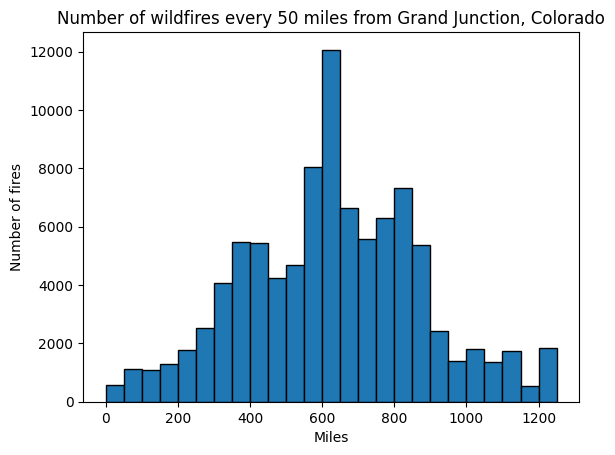

In [336]:
bins = np.linspace(0, 1250, ((1250) // 50)+1)

#Create plot
plt.hist(distances, bins, edgecolor='black')
plt.xlabel("Miles")
plt.ylabel("Number of fires")
plt.title("Number of wildfires every 50 miles from Grand Junction, Colorado")

2. Produce a time series graph of total acres burned per year for the fires occurring in the specified distance from your city.

In [344]:
area_burned = {}
for fire in my_features:
    year = fire['attributes']['Fire_Year']
    area = fire['attributes']['GIS_Acres']
    if year in area_burned:
        area_burned[year]+=area
    else:
        area_burned[year]=area

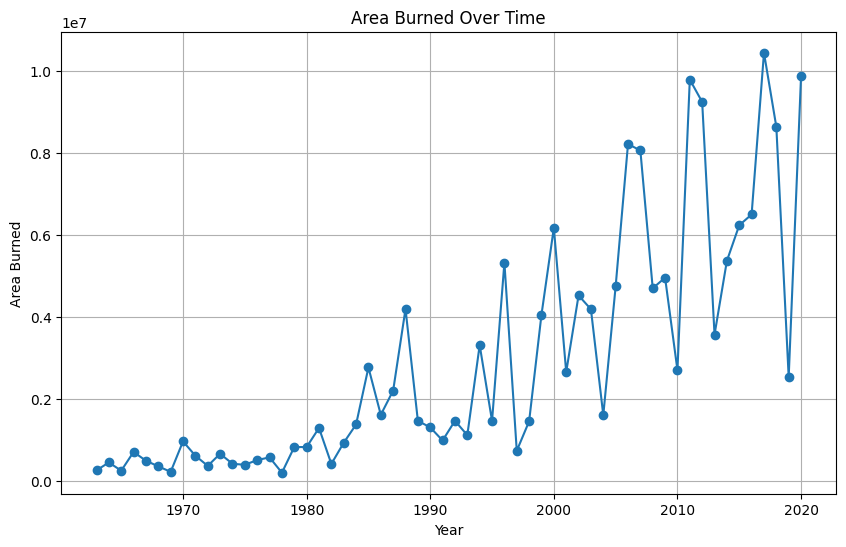

In [346]:
# Extract years and corresponding values
years = list(area_burned.keys())
values = list(area_burned.values())

# Create a time series plot
plt.figure(figsize=(10, 6))
plt.plot(years, values, marker='o', linestyle='-')
plt.title('Area Burned Over Time')
plt.xlabel('Year')
plt.ylabel('Area Burned')
plt.grid(True)

# Show the plot
plt.show()

3. Produce a time series graph containing your fire smoke estimate for your city and the AQI estimate for your city

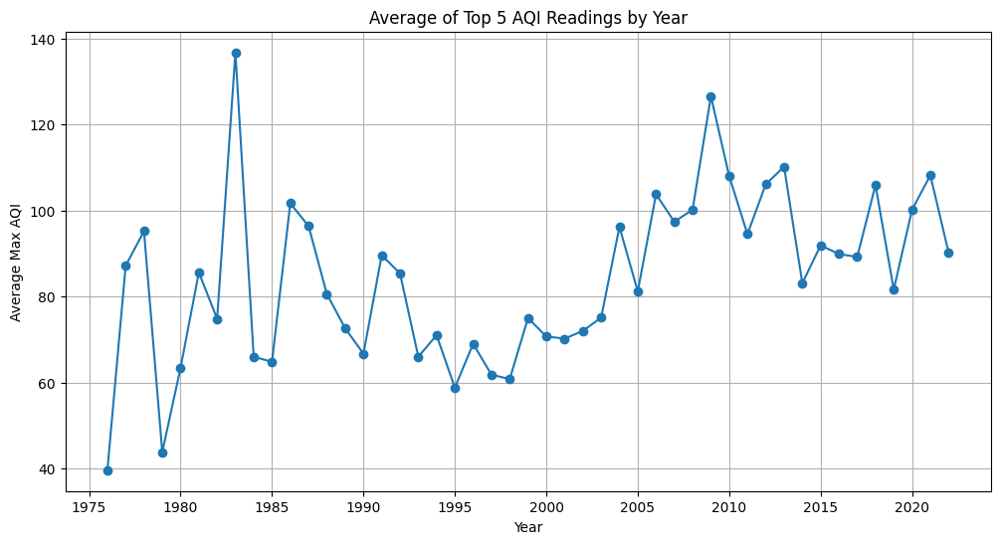

In [399]:
# Convert the 'Year' column to a datetime format with a year-only format
average_top_5_aqi['Year'] = pd.to_datetime(average_top_5_aqi['Year'], format='%Y')

# Set the 'Year' column as the index
average_top_5_aqi.set_index('Year', inplace=True)

# Create a time series plot
plt.figure(figsize=(12, 6))
plt.plot(average_top_5_aqi.index, average_top_5_aqi['Max Avg AQI'], marker='o', linestyle='-')
plt.title('Average of Top 5 AQI Readings by Year')
plt.xlabel('Year')
plt.ylabel('Average Max AQI')
plt.grid(True)

# Display the plot
plt.show()

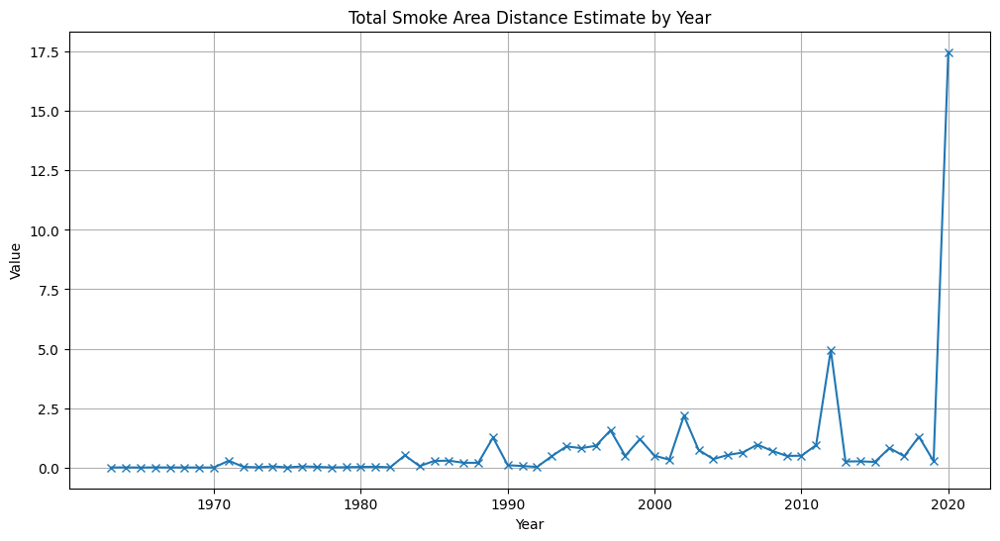

In [402]:
# Create a time series plot for 'total_smoke_area_distance_estimate'
plt.figure(figsize=(12, 6))
plt.plot(total_smoke_area_distance_estimate.index, total_smoke_area_distance_estimate['Value'], marker='x', linestyle='-')
plt.title('Total Smoke Area Distance Estimate by Year')
plt.xlabel('Year')
plt.ylabel('Value')
plt.grid(True)

# Display the plot
plt.show()

In [401]:
# # Convert the 'Year' column to a datetime format with a year-only format for both DataFrames
# #average_top_5_aqi['Year'] = pd.to_datetime(average_top_5_aqi['Year'], format='%Y')
# total_smoke_area_distance_estimate['Year'] = pd.to_datetime(total_smoke_area_distance_estimate['Year'], format='%Y')

# # Set the 'Year' column as the index for both DataFrames
# #average_top_5_aqi.set_index('Year', inplace=True)
# total_smoke_area_distance_estimate.set_index('Year', inplace=True)

# # Create a time series plot
# plt.figure(figsize=(12, 6))

# # Plot 'average_top_5_aqi'
# plt.plot(average_top_5_aqi.index, average_top_5_aqi['Max Avg AQI'], marker='o', linestyle='-', label='Average AQI')

# # Plot 'total_smoke_area_distance_estimate' in a different color
# plt.plot(total_smoke_area_distance_estimate.index, total_smoke_area_distance_estimate['Value'], marker='x', linestyle='-', label='Smoke Estimate')

# plt.title('Average of Top 5 AQI Readings and Smoke Estimate by Year')
# plt.xlabel('Year')
# plt.ylabel('Value')
# plt.legend()
# plt.grid(True)

# # Display the plot
# plt.show()

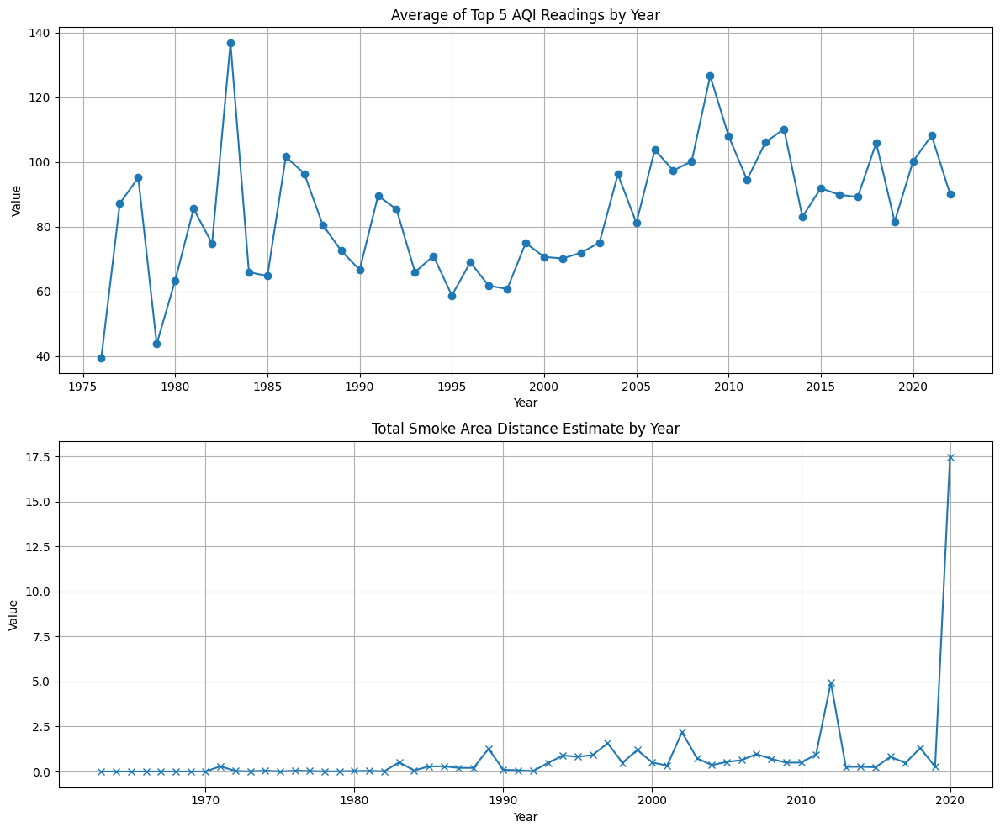

In [400]:
# Convert the 'Year' column to a datetime format with a year-only format for both DataFrames
#average_top_5_aqi['Year'] = pd.to_datetime(average_top_5_aqi['Year'], format='%Y')
#total_smoke_area_distance_estimate['Year'] = pd.to_datetime(total_smoke_area_distance_estimate['Year'], format='%Y')

# Set the 'Year' column as the index for both DataFrames
#average_top_5_aqi.set_index('Year', inplace=True)
#total_smoke_area_distance_estimate.set_index('Year', inplace=True)

# Create two subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# Plot 'average_top_5_aqi' in the first subplot
ax1.plot(average_top_5_aqi.index, average_top_5_aqi['Max Avg AQI'], marker='o', linestyle='-', label='Average AQI')
ax1.set_title('Average of Top 5 AQI Readings by Year')
ax1.set_xlabel('Year')
ax1.set_ylabel('Value')
ax1.grid(True)

# Plot 'total_smoke_area_distance_estimate' in the second subplot
ax2.plot(total_smoke_area_distance_estimate.index, total_smoke_area_distance_estimate['Value'], marker='x', linestyle='-', label='Smoke Estimate')
ax2.set_title('Total Smoke Area Distance Estimate by Year')
ax2.set_xlabel('Year')
ax2.set_ylabel('Value')
ax2.grid(True)

# Adjust spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()

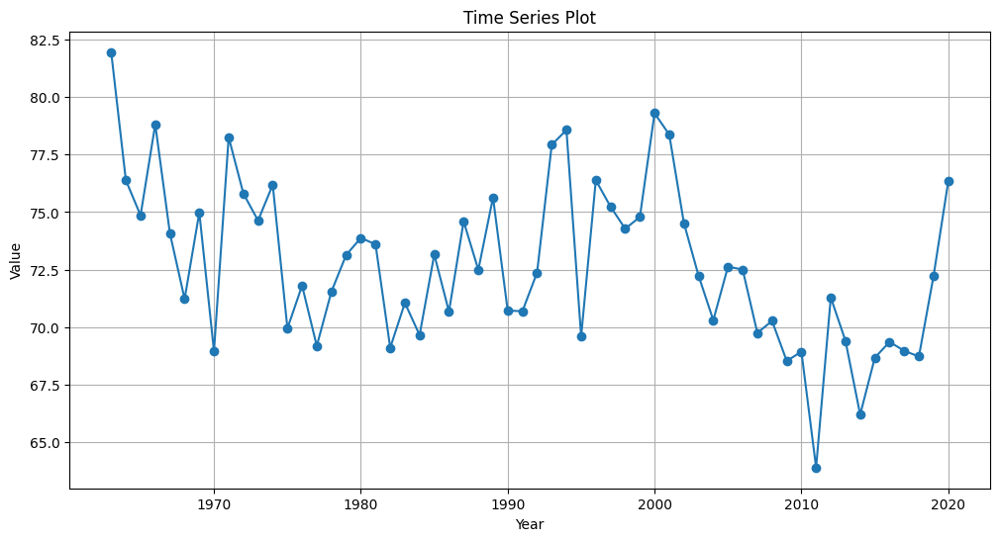

In [448]:
years = list(average_smoke.keys())
values = list(average_smoke.values())

plt.figure(figsize=(12, 6))
plt.plot(years, values, marker='o', linestyle='-')
plt.title('Time Series Plot')
plt.xlabel('Year')
plt.ylabel('Value')
plt.grid(True)
plt.show()